## Letter Model: Mallet

## Resources

In [9]:
import pickle
import gensim
import gensim.corpora as corpora
from gensim.models import CoherenceModel
from pprint import pprint
import pyLDAvis
import pyLDAvis.gensim
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
mallet_path = 'mallet-2.0.8/bin/mallet' # update this path

In [6]:
def compute_coherence_values(dictionary, corpus, texts, limit, start, step):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word, iterations=400, random_seed=100)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

## Get Data

In [3]:
# Get it back
with open("20240608_PhD_LtrLem-N.txt", "rb") as fp:   # Unpickling
    data_lemmatizedNouns = pickle.load(fp)

In [4]:
len(data_lemmatizedNouns)

676

In [6]:
# Get it back
#with open("20240405_PhD_LtrLem-NV.txt", "rb") as fp:   # Unpickling
    #data_lemmatized = pickle.load(fp)

In [10]:
#len(data_lemmatized[0])

This code adapted from https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/

## 1. LDA Mallet (Nouns Only)

In [5]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatizedNouns)

# Create Corpus
texts = data_lemmatizedNouns

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [12]:
# To see word associated with id, use this code.
print(id2word)

Dictionary(6505 unique tokens: ['air', 'apron', 'bye', 'ceremony', 'cermony']...)


In [14]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, 
                                                        corpus=corpus, 
                                                        texts=data_lemmatizedNouns, 
                                                        start=5, 
                                                        limit=30, 
                                                        step=1)

Mallet LDA: 5 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.62746
<20> LL/token: -8.26451
<30> LL/token: -8.05247
<40> LL/token: -7.94716

0	10	day time morning thing room night town water home place hour people evening week yesterday boat side end clock fire 
1	10	day winter house time home school church letter place week weather deal spring month head manner today garden snow tea 
2	10	child time mother letter week brother health girl sister friend write wife baby month trouble aunt kind cousin pleasure boy 
3	10	country year land pound dollar money acre farm man person place work people cent crop foot price wheat lot number 
4	10	letter friend time life family book heart sister world paper year husband son home father hand work health kind death 

<50> LL/token: -7.88391
<60> LL/token: -7.83222
<70> LL/token: -7.80776
<80> LL/token: -7.78584
<90> LL/token: -7.76746

0	10	day time night thing morning room water town side hour 

<160> LL/token: -7.74899
<170> LL/token: -7.74027
<180> LL/token: -7.73612
<190> LL/token: -7.72534

0	8.33333	life year hand book heart mind work people friend care change interest paper rest pleasure home matter blessing copy spirit 
1	8.33333	letter time friend brother mother sister health family month father death wife kind daughter write news son girl home husband 
2	8.33333	dollar work house money year man pound people board time kind cent family foot business number pay expense day cost 
3	8.33333	day morning weather room night time evening hour town place side water bed house fear woman head flower end clock 
4	8.33333	week child day home boy thing baby school winter uncle visit time cousin church night today trouble snow mail yesterday 
5	8.33333	country land year acre farm place winter pound person summer month wood spring crop price horse wheat road money people 

<200> LL/token: -7.72761
<210> LL/token: -7.72242
<220> LL/token: -7.71878
<230> LL/token: -7.71819
<240> LL/tok

<210> LL/token: -7.76285
<220> LL/token: -7.75753
<230> LL/token: -7.75494
<240> LL/token: -7.75252

0	7.14286	life child book heart hand trouble mind paper husband work friend interest age rest doctor matter kind woman copy fear 
1	7.14286	place people time year business world month man company manner happiness case situation town life state end comfort idea summer 
2	7.14286	work house day time week room town water people kind store snow head month thing mine fire island woman garden 
3	7.14286	letter time day mother week home girl weather news baby thing night visit winter pleasure return write writing picture darling 
4	7.14286	country land pound year dollar acre farm money place cent person crop price horse wood wheat road house farmer market 
5	7.14286	friend family brother sister letter health child year winter wife daughter son father summer death uncle time answer aunt home 
6	7.14286	day morning evening church side hour night bed boat school yesterday clock board river ship c

<210> LL/token: -7.77128
<220> LL/token: -7.77133
<230> LL/token: -7.7777
<240> LL/token: -7.77456

0	6.25	letter time day write news month account weather friend pleasure thing opportunity place happiness comfort manner writing picture darling fire 
1	6.25	dollar money year pound cent man lot country month board cost pay expense government work property number cow gold provision 
2	6.25	friend brother mother family health sister letter year son father death wife child daughter uncle answer aunt cousin kind husband 
3	6.25	hand book heart life paper mind work trouble kind interest fear age matter world copy woman trial power anxiety return 
4	6.25	time people day winter work summer home place country month business state city town man snow thing rest situation reason 
5	6.25	country land year acre farm wood pound crop horse wheat place person house kind foot farmer spring market potato tree 
6	6.25	day morning house hour town water night side company evening boat room return river end 

<160> LL/token: -7.83657
<170> LL/token: -7.83282
<180> LL/token: -7.82214
<190> LL/token: -7.81902

0	5.55556	house book room hand winter spirit people town day idea fire difficulty work account table head door servant lady service 
1	5.55556	country people man year horse business company number expense state island climate pay government seed war work cow reason mine 
2	5.55556	time day letter thing girl month week weather school fear manner return night garden place dinner order change walk box 
3	5.55556	friend death child time life husband sister mind trouble place wife son care account paper interest daughter matter mother hand 
4	5.55556	letter brother time family health mother sister home winter summer friend write uncle news aunt answer year cousin month opportunity 
5	5.55556	day water house place wood town tree board side boat road tea river foot half store spring building sea ground 
6	5.55556	letter kind year life world pleasure work woman heart father home happiness comfo

<60> LL/token: -7.95553
<70> LL/token: -7.93491
<80> LL/token: -7.91636
<90> LL/token: -7.89513

0	5	house work town people day horse half board pork water servant door ship gold provision boat vessel employment meeting company 
1	5	year business world life hand account difficulty home captain fear order flower man state expense mind trouble case property description 
2	5	girl room night boy woman hand bed time thing mail child week fire trouble window street illness change writing mind 
3	5	day time home evening letter week morning uncle aunt today night visit weather return yesterday clock leave mother address news 
4	5	friend book heart work paper life wife husband death kind dollar picture son age letter matter care mother darling copy 
5	5	child week day school church baby store thing spirit spring doctor home tomorrow trial blessing snow fever town pain anxiety 
6	5	country land pound year money dollar acre farm cent crop price wheat person kind farmer market cost bushel wage pot

<360> LL/token: -7.82117
<370> LL/token: -7.80606
<380> LL/token: -7.79921
<390> LL/token: -7.80808

0	5	work house people horse city board water tea half thing pork day vessel ship gold provision deal employment view box 
1	5	year people business man interest state world difficulty reason case government life expense gentleman mind fact matter power character party 
2	5	time girl hand room woman night boy mind thing mail fire head table picture tomorrow eye writing door window walk 
3	5	home day letter time week mother evening aunt weather yesterday return visit today year morning leave news night dinner rain 
4	5	life book heart paper friend work husband kind wife care son copy dollar change death world loss trial age sorrow 
5	5	child week day baby school house trouble church bed doctor wife boy trust island spirit captain store prospect town thing 
6	5	country land pound year money dollar acre farm cent crop price wheat place farmer market person bushel cost wage family 
7	5	letter

<260> LL/token: -7.80879
<270> LL/token: -7.80073
<280> LL/token: -7.80735
<290> LL/token: -7.80375

0	4.54545	book life heart work world trouble doctor paper copy trial anxiety interest fear case parent sickness nature trust circumstance story 
1	4.54545	people man year business month office time company country government city war interest party gold mind law fact thing end 
2	4.54545	land pound country acre farm dollar year money cent crop price wheat farmer market cost bushel person wage seed situation 
3	4.54545	home child week boy school visit church today mail store island leave account fever illness pork meeting fortnight trust prospect 
4	4.54545	house place town day country wood people month person road garden manner difficulty state summer climate horse side tree description 
5	4.54545	family brother year health friend summer month son country money wife winter work opportunity daughter spring paper acquaintance house time 
6	4.54545	time day weather winter place home head s

<110> LL/token: -7.90961
<120> LL/token: -7.9011
<130> LL/token: -7.8878
<140> LL/token: -7.8842

0	4.16667	friend family brother year sister wife daughter son health husband father kind death dollar answer money line account letter loss 
1	4.16667	time winter summer month day health home letter pleasure opportunity weather happiness spring garden snow blessing return trust mine deal 
2	4.16667	work book paper life case business heart matter copy reason spirit interest city kind fear character fortune opinion story event 
3	4.16667	hand woman world heart rest mind servant eye fire trial girl comfort table anxiety idea pen bed thing office power 
4	4.16667	water day time tree place river boat board side work sea number foot road lot passage fall fellow country voyage 
5	4.16667	letter time sister place write news thing day friend writing picture month darling leave tomorrow lady fever girl answer manner 
6	4.16667	people life care time difficulty company account mind expense person mann

<360> LL/token: -7.84684
<370> LL/token: -7.83895
<380> LL/token: -7.83572
<390> LL/token: -7.83381

0	4.16667	brother family friend health year sister wife death son father daughter kind money account line husband loss living sickness answer 
1	4.16667	day winter time month summer country weather home health opportunity happiness pleasure garden spring snow trust deal return attention father 
2	4.16667	work book paper life city heart age copy business trial son dollar interest kind story success nature bread history character 
3	4.16667	hand world thing woman mind girl rest life change spirit fire heart husband anxiety eye room hour comfort child face 
4	4.16667	water day time river boat tree foot ship side morning captain board sea work vessel place hour arrival head fall 
5	4.16667	letter time friend place sister write news picture writing thing darling answer month care leave girl fever folk call kind 
6	4.16667	people time situation reason home office difficulty power expense part

<210> LL/token: -7.87919
<220> LL/token: -7.88783
<230> LL/token: -7.88427
<240> LL/token: -7.88542

0	3.84615	house town room tree wood place time garden road side dinner door flower water frost mile spirit breakfast ground home 
1	3.84615	work day week trouble bed dollar city house doctor place kind rest snow situation pain pay illness party arm charge 
2	3.84615	people man year business state case difficulty law company government property person fact expense mind duty thousand share meeting number 
3	3.84615	family brother winter health year money uncle son summer friend account line word month respect country prospect answer living address 
4	3.84615	time country month place summer year people thing opportunity store spring mine hand manner pleasure kind gold distance health dress 
5	3.84615	day night morning evening weather church yesterday week clock fire island hour lady board rain window mail street return sleep 
6	3.84615	book hand interest world heart life copy mind eye powe

<60> LL/token: -8.08627
<70> LL/token: -8.04107
<80> LL/token: -8.02112
<90> LL/token: -7.98559

0	3.57143	book work life interest hand flower paper copy matter heart age anxiety fear mind nature change husband party office soul 
1	3.57143	child school room week girl day lot boy home captain mind difficulty window hour address face voyage walk box cough 
2	3.57143	people work man business servant day hand number case year head spirit fact foot home company mine expense length circumstance 
3	3.57143	mother letter child sister brother wife daughter uncle aunt cousin son family answer home death fire parent news likeness loss 
4	3.57143	friend kind death write time life money care year son father manner doctor return situation sickness glad_hear post marriage disease 
5	3.57143	land country pound acre farm dollar money year cent crop price wheat farmer market cost bushel wage person work employment 
6	3.57143	house place water day side tree board boat wood river night sea store room buil

<260> LL/token: -7.89987
<270> LL/token: -7.90605
<280> LL/token: -7.91028
<290> LL/token: -7.90539

0	3.57143	book life interest mind work spirit paper copy hand matter nature trial age fear story eye year truth anxiety success 
1	3.57143	child school room night hour girl home captain mind week boy bed window tea pork walk service lot cough office 
2	3.57143	people work country man business day state hand company person servant fact case question expense place stand climate habit fellow 
3	3.57143	mother brother letter family child sister son wife daughter uncle aunt cousin home death year answer father winter health line 
4	3.57143	friend time kind money country manner trouble death situation doctor change rest account acquaintance living circumstance year glad_hear life pleasure 
5	3.57143	land country pound acre dollar farm year money cent crop price wheat farmer market bushel wage board cost trade quarter 
6	3.57143	house day place water wood side river tree island boat sea board 

<60> LL/token: -8.08284
<70> LL/token: -8.05686
<80> LL/token: -8.03319
<90> LL/token: -8.01124

0	3.33333	child book boy thing week today girl tomorrow day anxiety yesterday illness fever creature face room cough writing strength disease 
1	3.33333	work life trouble woman heart year copy hand trial mind nature man term office loss girl wife soul son call 
2	3.33333	friend death sister kind husband life heart father world law comfort sorrow age child care situation sickness writing parent fortune 
3	3.33333	letter time place spirit opportunity happiness flower picture return world manner darling eye care fear peace home trust party case 
4	3.33333	brother family health sister daughter letter year child son uncle mother cousin answer winter father line aunt living word address 
5	3.33333	time day weather month deal letter garden health tree summer rain thing lady window arrival woman acquaintance idea end scene 
6	3.33333	house town place church room day home dinner clock side hour mail

<260> LL/token: -7.90897
<270> LL/token: -7.89813
<280> LL/token: -7.91412
<290> LL/token: -7.90465

0	3.33333	child book girl boy thing woman doctor writing fear anxiety face illness eye creature pen fever cough box history attack 
1	3.33333	life year work trouble copy change mind trial paper wife husband age term son nature soul story world flower hand 
2	3.33333	friend death sister kind heart life account husband care comfort world father sorrow rest pain parent fortune sickness talk living 
3	3.33333	letter time return spirit opportunity place manner happiness pleasure trust darling war father prayer home peace leave hand people flower 
4	3.33333	family brother health child daughter year son sister mother uncle winter house line address father answer cousin blessing trouble aunt 
5	3.33333	day time month weather summer health garden country deal rain lady attention acquaintance air fall tree sister thing woman order 
6	3.33333	house day town room church boy side dinner clock door m

<60> LL/token: -8.08613
<70> LL/token: -8.063
<80> LL/token: -8.03718
<90> LL/token: -8.01573

0	3.125	week day baby child girl school head boy doctor store bed fever night anxiety face fortnight thinking trouble pain minute 
1	3.125	day time letter month health place comfort world happiness winter account trust prayer idea weather manner wood gentleman description lady 
2	3.125	house work time room life people friend water power fire door deal home illness kindness side expense bear strength bread 
3	3.125	boy life father care girl change visit darling office paper peace war child eye rest account soul island likeness age 
4	3.125	family friend brother health son daughter year death uncle sister aunt kind husband dollar child living line address letter picture 
5	3.125	kind tree house flower garden bed seed fear tea day spring mile window passage luggage half child currency steamer kitchen 
6	3.125	night day week yesterday today morning mail thing hour evening afternoon fellow town le

<260> LL/token: -7.9421
<270> LL/token: -7.93817
<280> LL/token: -7.94882
<290> LL/token: -7.94668

0	3.125	week day baby child school night bed today weather doctor girl fever pain store fortnight illness cough minute sickness hope 
1	3.125	time letter day health pleasure month happiness weather place world news prayer manner opportunity lady order attention trust hand return 
2	3.125	work time house place people water lot head fire call door mind friend deal hour sight building mountain character fault 
3	3.125	letter girl boy father visit change age kind darling fear eye thing picture loss war life office care rest return 
4	3.125	family brother friend child health son wife daughter sister uncle year aunt death husband kind life living account address marriage 
5	3.125	room house tree tea wood church seed flower kind bed window garden dress servant plan table currency kitchen spot mile 
6	3.125	child week night day morning evening home boy hour mail clock yesterday tomorrow afternoo

<60> LL/token: -8.12665
<70> LL/token: -8.08881
<80> LL/token: -8.0638
<90> LL/token: -8.03447

0	2.94118	land country pound acre year farm crop price wheat farmer market bushel money half wage shilling spring beef man currency 
1	2.94118	place house wood tree river side road water bank boat land neighbourhood rate country dinner return fall building end description 
2	2.94118	kind hand time pleasure girl wife interest power death kindness sister account mind nature year visit end woman regret door 
3	2.94118	work business people paper manner servant matter mind service case cotton doubt life table world heat stand summer position strength 
4	2.94118	day time town church morning evening home letter yesterday hour night breakfast visit picture clock spirit window thinking sea stage 
5	2.94118	book heart life care child copy trial letter eye parent mind creature soul spirit rest picture fortune hand fear pen 
6	2.94118	letter brother mother family sister health daughter uncle write son a

<260> LL/token: -7.93112
<270> LL/token: -7.92574
<280> LL/token: -7.93577
<290> LL/token: -7.93475

0	2.94118	land country pound year acre farm crop price wheat money market farmer bushel spring seed neighbour stock oats half potato 
1	2.94118	place house wood tree day road river water side boat land building fall mill country bank lake voyage village train 
2	2.94118	time hand mind interest pleasure sister kind letter life account spirit rest pen girl death visit power question truth marriage 
3	2.94118	work people business matter world paper gentleman city manner service servant case trouble cotton party table doubt thought sale time 
4	2.94118	day town morning church evening home return visit clock weather dinner yesterday afternoon packet breakfast time floor air tea carriage 
5	2.94118	book heart life copy trial care parent father creature death soul story fear affection flower eye order age hope history 
6	2.94118	brother letter mother family friend sister son uncle wife daughte

<60> LL/token: -8.12584
<70> LL/token: -8.11645
<80> LL/token: -8.09828
<90> LL/token: -8.0748

0	2.77778	dollar pound money work cent bushel month cow employment provision flour clothe board servant tea beef house store potato butter 
1	2.77778	letter mother family health time uncle aunt news winter summer home child blessing daughter address garden weather age glad_hear event 
2	2.77778	work trouble book mine copy case kind life pay year account fellow story sum car coal age interest fault judge 
3	2.77778	week girl day boy baby room woman visit darling tomorrow child weather walk mail cough breakfast fear kitchen matter birthday 
4	2.77778	day house place people town time week church road store home war river distance head member pig field call round 
5	2.77778	time care kind sister paper account day letter spirit fever answer call talk doubt pen friend position service disease purpose 
6	2.77778	friend son death year family child heart husband daughter life kind doctor wife father 

<260> LL/token: -7.986
<270> LL/token: -7.98193
<280> LL/token: -7.99325
<290> LL/token: -7.98069

0	2.77778	dollar pound cent work cost month cow board money provision employment seed pork beef flour potato luggage clothe butter pay 
1	2.77778	mother family child daughter uncle aunt home letter cousin winter death summer news address father health body wedding age weather 
2	2.77778	work book trouble copy mine year reason money fact life story debt expense term difficulty fellow success case sum head 
3	2.77778	week girl baby boy night room visit day window thing weather fear woman darling cough yesterday kitchen trip minute hope 
4	2.77778	day place time week house people water home town head store half lot distance mountain degree night commence tool claim 
5	2.77778	day paper kind friend health care account call thing fever pen time sickness prospect rest talk mind age position suit 
6	2.77778	friend son heart husband sister life death child wife year doctor family loss trial world

<60> LL/token: -8.14858
<70> LL/token: -8.12529
<80> LL/token: -8.10022
<90> LL/token: -8.07734

0	2.63158	house school store tea pork account expense seed day water mill purchase business profit quantity prospect idea good winter pig 
1	2.63158	home people business time interest year state mine place pleasure gold fact thing manner circumstance heat rate feeling hand amount 
2	2.63158	time matter fire city mail call office day mind hour soul news arm story company night boy street people member 
3	2.63158	land country pound acre farm year price wheat crop farmer bushel wood horse market neighbourhood half person labour shilling currency 
4	2.63158	week baby mother uncle visit time home cousin girl today weather island child news rest folk glad_hear boy cough deal 
5	2.63158	work money dollar year place man lot pay cost sale property building son rent neighbour head advantage settlement quarter market 
6	2.63158	book heart husband world life paper son age trial hand sorrow parent addre

<210> LL/token: -7.9943
<220> LL/token: -7.98746
<230> LL/token: -7.98907
<240> LL/token: -7.99877

0	2.63158	day house school store tea business pork winter spirit expense deal account pain care pig kind ham good holiday head 
1	2.63158	people interest business home difficulty state man gold year mind party opinion fact pleasure circumstance feeling heat manner truth mine 
2	2.63158	man fire year people boy call month day time mail city office company government war matter thousand arm street hour 
3	2.63158	land country acre farm pound crop year wheat price farmer market bushel wood horse lot mill stock labour shilling potato 
4	2.63158	time letter week mother baby uncle home write cousin news visit picture folk girl lot death excuse welcome_letter rest remembrance 
5	2.63158	work money dollar year place people cost pay cow city case man sale settlement building rent quarter property number rate 
6	2.63158	book heart husband life age copy world paper trial son sorrow hand loss parent

<360> LL/token: -7.96149
<370> LL/token: -7.95675
<380> LL/token: -7.95734
<390> LL/token: -7.95841

0	2.63158	day week house school store pork tea deal fire yesterday fortnight business ice hope head spirit ham account holiday drink 
1	2.63158	country interest people year difficulty state home business fact manner climate circumstance emigrant man heat idea number feeling matter world 
2	2.63158	man people city office government mail company year war month boy thousand hour call member field officer town arm fire 
3	2.63158	land country acre farm pound year crop wheat money market bushel horse place price mill person stock labour shilling wood 
4	2.63158	letter time home mother write uncle aunt cousin baby news change picture girl folk weather glad_hear death excuse welcome_letter week 
5	2.63158	work dollar money year people pay place board business lot cow rate cost sale wage profit suit quarter building property 
6	2.63158	book heart life husband paper copy trial sorrow age work pa

<110> LL/token: -8.05268
<120> LL/token: -8.04266
<130> LL/token: -8.04652
<140> LL/token: -8.04417

0	2.5	house room water bed town island captain fire day river window tea spot kitchen table door scene ice floor station 
1	2.5	friend sister kind heart father care husband death woman darling sorrow bed year pain fear eye loss sickness writing peace 
2	2.5	time man place work month country year people store home meeting money service summer cotton stranger clothing stand strength kind 
3	2.5	business company people interest government gold fact law city thousand mind state bank office trip side earth day coal food 
4	2.5	hand mind spirit matter life trouble age anxiety hour nature face thing change difficulty night room power table thought truth 
5	2.5	family brother mother friend daughter son uncle aunt wife cousin health death child doctor father home line answer blessing city 
6	2.5	book work paper copy trial trouble life son story husband term heart success bear attack city cottage

<260> LL/token: -7.99153
<270> LL/token: -7.99141
<280> LL/token: -7.99886
<290> LL/token: -7.98795

0	2.5	house room bed day town water fire head door window hour deal building spot kitchen gentleman sight mountain half table 
1	2.5	heart husband friend sister woman death kind girl daughter loss darling father sorrow care year pain eye kindness flower fortnight 
2	2.5	time work man month place year country people kind mine day money meeting fever summer trouble stranger suit store call 
3	2.5	business people company city government interest year fact gold war side office state thousand law coal mind stand field food 
4	2.5	hand mind trouble spirit life thing night anxiety power matter call walk world table order change thought truth face question 
5	2.5	brother family friend wife mother son uncle aunt health cousin daughter child death doctor line father sister living city blessing 
6	2.5	book work paper copy trial story son life term attack mail college success history pound pay judg

Mallet LDA: 21 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.27982
<20> LL/token: -8.7063
<30> LL/token: -8.44107
<40> LL/token: -8.31833

0	2.38095	book life husband work heart year world copy age son trial change nature term power care character man spirit sort 
1	2.38095	letter girl sister time happiness opportunity order writing weather acquaintance trust write woman creature face mine spirit bear card notice 
2	2.38095	country land people person difficulty wood bank state idea neighbourhood stock labour case year emigrant settler piece part capital fact 
3	2.38095	day hand night time mind table life description matter change spirit pen board lady people rain weather comfort thought street 
4	2.38095	paper home year people kind visit time eye soul woman bread heat story book ground sight air boy child station 
5	2.38095	time summer daughter pleasure garden letter month aunt paper news week party sister business spring answ

<160> LL/token: -8.04962
<170> LL/token: -8.04905
<180> LL/token: -8.0408
<190> LL/token: -8.02478

0	2.38095	book work year copy power son life husband world nature heart age subject regret judge college picture page success clearing 
1	2.38095	letter girl woman sister health happiness trust writing darling peace kindness weather kind world mine creature likeness bear face end 
2	2.38095	country person land state difficulty year bank money people climate neighbourhood quarter capital emigrant fact labour expense property respect advantage 
3	2.38095	hand time life manner account spirit mind table interest people order idea servant change matter thought night kitchen purpose pleasure 
4	2.38095	home paper trouble time eye fear kind book anxiety trial story bread pen painting visit station earth promise attack step 
5	2.38095	time month summer home country letter opportunity pleasure garden father blessing reason spring attention business answer glad_hear news journey event 
6	2.38095	d

<310> LL/token: -8.00001
<320> LL/token: -8.00251
<330> LL/token: -7.99448
<340> LL/token: -8.0003

0	2.38095	book life work copy nature woman world story heart subject character history sum soul page judge volume term sale sort 
1	2.38095	letter health girl sister happiness writing kind darling weather world garden peace trust woman write kindness creature fever mine fear 
2	2.38095	country person year difficulty land climate people money neighbourhood world labour emigrant property state respect settler advantage idea situation circumstance 
3	2.38095	hand room time mind spirit life table change pen servant night matter question kitchen thought purpose care master floor prospect 
4	2.38095	paper thing trouble flower doctor trial anxiety fear visit eye arm care living expense position painting attack promise disease show 
5	2.38095	time letter month pleasure summer country opportunity home news manner father attention deal glad_hear blessing prayer party war spring feel 
6	2.38095	dol

<60> LL/token: -8.19396
<70> LL/token: -8.16316
<80> LL/token: -8.15238
<90> LL/token: -8.12717

0	2.27273	morning evening night day side week yesterday clock boat mail spirit afternoon return scene water journey fall river talk direction 
1	2.27273	house kind work day summer pay people town city snow pork foot store prospect expense idea sugar neighbour pig ham 
2	2.27273	friend family kind heart care son father kindness pleasure sorrow peace sister blessing girl trust attention comfort event pain nature 
3	2.27273	day town room ship captain sea lady table dinner voyage night tomorrow order building gentleman breakfast yesterday storm clock carriage 
4	2.27273	church account school fire anxiety fear child answer letter earth spot sickness street mail law window face satisfaction sleep progress 
5	2.27273	water wood horse river tea road spring piece box provision door pound distance pair flour article winter waggon weight salt 
6	2.27273	country business place person state meeting quar

<210> LL/token: -8.03815
<220> LL/token: -8.03227
<230> LL/token: -8.03974
<240> LL/token: -8.02585

0	2.27273	morning day night evening side boat river return board water home clock yesterday fall place mail week road direction bank 
1	2.27273	day house work store snow town pork people kind flour call city clothe foot pig good pay ham half reason 
2	2.27273	friend letter kind father heart happiness care sister prayer peace kindness darling blessing manner sorrow event fortune trust comfort end 
3	2.27273	day town ship sea room captain lady voyage night building dinner order clock dress table vessel spirit evening packet hour 
4	2.27273	child church school account fire thing mail time evening spot class anxiety trust street satisfaction progress foot gift pay agent 
5	2.27273	water horse tea spring box piece door pair passage fish room article waggon river mile chair salt inch boot bread 
6	2.27273	country place people person business state wood heat meeting fear appearance cotton bank

<360> LL/token: -8.00333
<370> LL/token: -7.99815
<380> LL/token: -8.00468
<390> LL/token: -8.0086

0	2.27273	morning night side evening water hour boat river return road day wood home breakfast scene place bank building fall board 
1	2.27273	day house store town work pork snow pay people flour good call fire lot ice pig master ham kind half 
2	2.27273	friend sister kind care world happiness father heart place peace prayer trust darling letter loss kindness event end sorrow pain 
3	2.27273	day town ship captain vessel street yesterday gentleman evening church sea morning dress night order dinner window company carriage winter 
4	2.27273	child school church mail boy prospect anxiety account evening thing fire class brother thinking college progress island term trust satisfaction 
5	2.27273	water horse tea piece box thing spring door sugar grass kitchen milk bed woman pair passage clothe time fish yard 
6	2.27273	country people place state person summer business climate heat number meeti

<110> LL/token: -8.08625
<120> LL/token: -8.08361
<130> LL/token: -8.07619
<140> LL/token: -8.07189

0	2.17391	time letter write friend home place health news summer month answer glad_hear hear line acquaintance guess position asylum hearing reply 
1	2.17391	book child girl boy paper age woman matter daughter spirit term eye writing nurse college subject table notice beauty drawing 
2	2.17391	mother child home uncle aunt cousin family visit death son address summer pay afternoon remembrance nephew share niece photo wife 
3	2.17391	letter time baby weather month flower happiness trust darling father garden picture prayer writing woman spring welcome_letter peace call likeness 
4	2.17391	week school today day store child tea house town pork box yesterday girl ice head boy island ham bit excuse 
5	2.17391	day pleasure opportunity return week captain attention visit leave account month manner sea night birthday card mine port spirit complaint 
6	2.17391	winter home year account snow spring

<260> LL/token: -8.03034
<270> LL/token: -8.03251
<280> LL/token: -8.0433
<290> LL/token: -8.03986

0	2.17391	letter time home write place friend news month answer glad_hear folk paper summer excuse welcome_letter bit guess asylum hear note 
1	2.17391	book child girl spirit boy copy paper woman age eye table daughter matter tomorrow term nurse college notice hope beauty 
2	2.17391	mother child uncle aunt cousin family year death home son visit summer address girl remembrance kind blessing train grandmother interest 
3	2.17391	letter baby weather flower news darling picture health father time deal friend writing fear garden likeness woman thought music card 
4	2.17391	week child school today store island tea pork afternoon house yesterday lesson pig ham ice boy church holiday town tooth 
5	2.17391	day month pleasure opportunity return manner summer happiness attention visit acquaintance peace time account lady leave journey word kindness complaint 
6	2.17391	winter home time thing accou

Mallet LDA: 24 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.31613
<20> LL/token: -8.72359
<30> LL/token: -8.47427
<40> LL/token: -8.34242

0	2.08333	child husband heart aunt trouble death age matter hand wife power bed doctor son nature trial loss soul change cough 
1	2.08333	week baby night girl school boy child head bed today yesterday morning visit evening arm afternoon attention hope tomorrow music 
2	2.08333	week case captain mind face property bread difficulty interest debt doubt pay school summer hill people nurse year home head 
3	2.08333	dollar cent pound money board cost place situation advantage state luggage mind half thing soil cow amount ship steam merchant 
4	2.08333	room woman day hand boy window folk deal door lesson wind illness ice station yesterday air light foot college friend 
5	2.08333	day weather letter thing time flower home fear write frost creature winter opportunity kind fire painting card visit pl

<160> LL/token: -8.06048
<170> LL/token: -8.04864
<180> LL/token: -8.04915
<190> LL/token: -8.04393

0	2.08333	heart husband hand death life doctor son trial child wife sorrow loss age trouble change soul care matter power disease 
1	2.08333	week child baby girl boy school today night yesterday tomorrow morning evening island car holiday talk drawing medicine music present 
2	2.08333	home year interest mind state case anxiety spirit doubt position situation sum city rest difference affection benefit service independence sake 
3	2.08333	dollar pound cent money cost board account luggage rate steam currency place property situation servant price expense pocket hand employment 
4	2.08333	room bed woman table hand spirit door window eye cough kitchen lesson day mail station floor trouble illness sleep face 
5	2.08333	day thing winter weather garden flower frost tree kind fear air seed painting creature comfort plant appearance grass potato bird 
6	2.08333	work water wage provision cow pota

<310> LL/token: -8.01386
<320> LL/token: -8.01467
<330> LL/token: -8.01719
<340> LL/token: -8.02022

0	2.08333	heart life husband death hand trouble loss son sorrow child trial parent age change world soul illness marriage wife attack 
1	2.08333	week child baby school girl boy today yesterday island tomorrow lesson nurse holiday box car hope card gift tooth mama 
2	2.08333	home thing mind year spirit situation anxiety prospect interest case comfort doubt affection position sum circumstance debt promise state rest 
3	2.08333	dollar pound money cent board wage cost rate luggage employment expense account currency boat steam trade property weight price hand 
4	2.08333	room bed woman night hand table girl eye house door sleep fortnight kitchen window face spirit trouble hair floor piano 
5	2.08333	day winter weather garden flower thing summer air snow frost creature fear tree appearance bear trust seed storm painting picture 
6	2.08333	work water cow flour clothe beef butter kind pay passa

<60> LL/token: -8.20104
<70> LL/token: -8.17374
<80> LL/token: -8.16009
<90> LL/token: -8.14238

0	2	kind horse pork snow person foot year tea piece beef clothe purchase thing store day pig pay quarter milk fish 
1	2	servant manner dinner description change view dress spot girl woman breakfast home window heat walk hill journey thought ride rise 
2	2	business interest state mind city fortune change debt sale friend fear service bank kind cotton merchant term charge opportunity age 
3	2	day person captain ship number sea fact wood office voyage rest society passenger clock respect inhabitant place lady account wind 
4	2	boy thing mother week time afternoon letter box likeness trouble lesson child stand fellow home car birthday kitchen hair nurse 
5	2	house work place town day board room door man city amount people head gentleman pocket sort mile mountain trunk brick 
6	2	hand life woman trouble matter trial heart spirit mind eye table creature pen soul power room office college question

<210> LL/token: -8.06919
<220> LL/token: -8.06865
<230> LL/token: -8.0716
<240> LL/token: -8.06364

0	2	horse pork tea year thing piece kind clothe beef potato pair person pig ham fish good meat article tool inch 
1	2	town place dinner manner room spirit description service morning breakfast spot dress change order heat leave view woman girl walk 
2	2	business interest state mind kind friend city side fortune change doubt debt fear gentleman fault merchant purchase cotton effect reason 
3	2	ship office captain sea person day voyage hour passenger party port rest society wind passage term lady number attention cabin 
4	2	boy child mother letter tomorrow thing likeness time care kitchen box car birthday hair trouble card picture photo home hay 
5	2	house people work town place board door city building day ground room gentleman drink mile pocket sort brick friend round 
6	2	hand life woman trouble mind matter heart eye table spirit trial servant soul power affection nature pen bread creat

<360> LL/token: -8.05011
<370> LL/token: -8.04431
<380> LL/token: -8.03346
<390> LL/token: -8.04503

0	2	pork horse kind tea thing dress piece beef clothe year good person pig pair store ham fish pay meat yard 
1	2	town room dinner morning church clock heat manner breakfast description walk yesterday tea air window wood music appearance carriage place 
2	2	business interest mind state city kind change fortune doubt gentleman character profit reason money friend content service side rate benefit 
3	2	day ship captain vessel sea hour office night person board evening voyage passage rest passenger boat port wind account cabin 
4	2	child boy mother letter tomorrow care girl thing kitchen eye car box trouble card cottage hair mail train hay photo 
5	2	house work place people town board day building door friend room mile city charge drink gentleman brick ring shop boarding 
6	2	life hand matter trouble mind spirit woman heart power parent table affection case servant strength eye attack soul

<110> LL/token: -8.12905
<120> LL/token: -8.13461
<130> LL/token: -8.13441
<140> LL/token: -8.12631

0	1.92308	place life people situation attention prospect end home gentleman side year law person society fear head request sort regard power 
1	1.92308	time letter home month pleasure opportunity answer care writing mail position health thinking idea satisfaction hearing account rest order gentleman 
2	1.92308	winter summer day place spring snow time weather fall wood climate frost month appearance ground meeting leave road street inhabitant 
3	1.92308	people year family child health summer war uncle address interest age character visit business paper condition member loss home remembrance 
4	1.92308	pound land acre farm year wood price mill cow person shilling settler seed farming stone trade garden grain building cost 
5	1.92308	tree day evening morning town side river water house boat scene return church yesterday building road voyage sail shore stage 
6	1.92308	book hand life paper 

<260> LL/token: -8.08154
<270> LL/token: -8.08723
<280> LL/token: -8.09199
<290> LL/token: -8.08884

0	1.92308	place people church time home situation year house gentleman prospect meeting person meet number neighbourhood religion service minister head friend 
1	1.92308	time letter home month opportunity answer pleasure health care glad_hear writing comfort position rest thinking idea hearing welfare blessing asylum 
2	1.92308	day winter weather summer place snow month spring frost road appearance climate fall storm order news air seed master thing 
3	1.92308	family year child people health kind interest paper address matter summer life uncle change business visit member condition fault winter 
4	1.92308	pound land acre farm year crop wheat price wood tree mill seed cost settler cattle soil shilling spring farming cow 
5	1.92308	side day water river morning tree evening return fall street road building board comfort sort yesterday end boat packet bank 
6	1.92308	book life work copy han

Mallet LDA: 27 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.39345
<20> LL/token: -8.76786
<30> LL/token: -8.49984
<40> LL/token: -8.3594

0	1.85185	school today business store term week time sickness leave success word prospect occasion commence college degree ice satisfaction religion deal 
1	1.85185	dollar house cent tree captain half wage board building work land town farming mile week expense pig band fare office 
2	1.85185	week girl baby night boy eye face woman trouble lesson hope yesterday glad_hear door visit train box fortnight piano day 
3	1.85185	interest mind hand matter difficulty change idea fact reason table doubt year voyage board truth mountain island week beauty office 
4	1.85185	week cousin boy summer family aunt year mother people visit address life house change holiday hear head remembrance north cap 
5	1.85185	year winter month climate rain place summer spring meeting folk state account vessel service st

<160> LL/token: -8.10857
<170> LL/token: -8.09446
<180> LL/token: -8.09416
<190> LL/token: -8.07858

0	1.85185	week school store today captain spirit pork mail account evening vessel church ice ham morning order progress business pity service 
1	1.85185	dollar cent house board work wage half mill cost expense capital servant steam number building week profit fare bank mile 
2	1.85185	week girl baby night boy trouble face lesson fellow change call pen disease sleep car tomorrow drawing bear train arm 
3	1.85185	hand interest life mind difficulty matter year idea spirit reason table change truth sum eye question power fortune settlement difference 
4	1.85185	family aunt son daughter year wife cousin mother house paper address people boy remembrance news letter father summer bone grandmother 
5	1.85185	winter summer month time spring year snow rain climate frost folk glad_hear opinion pig respect meeting deal account ground storm 
6	1.85185	home mother business visit month doctor return d

<310> LL/token: -8.05595
<320> LL/token: -8.05702
<330> LL/token: -8.04162
<340> LL/token: -8.04808

0	1.85185	week school today store yesterday church pork vessel lesson spirit captain deal ice tea ham holiday pig oats account mama 
1	1.85185	dollar work cent board pound house wage cost half building cow expense servant money steam sale fare number mile pocket 
2	1.85185	girl week baby night boy trouble call bed change sleep hair face disease hope car music hotel card tomorrow fellow 
3	1.85185	interest hand spirit life difficulty mind matter reason change idea fact question case fortune power benefit table debt sum nature 
4	1.85185	family uncle son aunt daughter cousin wife mother address paper year summer friend blessing country remembrance news relation bone body 
5	1.85185	winter time summer month year weather spring snow account frost folk glad_hear climate deal fall rain idea friend guess storm 
6	1.85185	home month visit doctor return business pleasure year daughter journey tr


0	1.78571	time man place letter city son account year money office country mother wife port field month answer request town home 
1	1.78571	country wheat tree lot wood man church people ground house year wage head description appearance land habit settlement corn mile 
2	1.78571	thing school people interest gold situation anxiety comfort road time meeting likeness number feeling prospect word class pocket degree tool 
3	1.78571	house difficulty life fire cow servant parent expense emigrant reason mind wood capital milk fear college satisfaction regret land improvement 
4	1.78571	visit time vessel bed evening box age child spirit kitchen ship aunt daughter letter music promise turn illness feel piano 
5	1.78571	dollar pound cent crop work farmer pork bushel country money employment oats clothe beef kind board state stock soil apple 
6	1.78571	brother sister daughter year letter home health school today mother winter family cousin deal day car child store round week 
7	1.78571	book chil

<160> LL/token: -8.13369
<170> LL/token: -8.1273
<180> LL/token: -8.11608
<190> LL/token: -8.11347

0	1.78571	place time money city town year quarter office cost charge meet hundred field north enemy pocket guess intention port day 
1	1.78571	country wood land road tree ground river church person climate number meeting appearance part foot world prospect character habit society 
2	1.78571	thing people school gold box likeness rest kind vessel feeling interest clothe anxiety share class tool dress turn clothing sake 
3	1.78571	fire life order servant hand difficulty house expense picture state earth parent day purpose difference affection room promise fear slave 
4	1.78571	day bed visit night yesterday spirit illness fortnight sleep evening pain disease fever talk pity birth thought dog mouth corner 
5	1.78571	pound dollar cent crop wheat farmer money person bushel wage trade board flour employment beef butter purchase profit oats provision 
6	1.78571	brother sister family daughter moth

<260> LL/token: -8.09623
<270> LL/token: -8.09886
<280> LL/token: -8.10963
<290> LL/token: -8.09882

0	1.78571	place time money city office town friend charge port meet cost year quarter rest north mail deal door trouble state 
1	1.78571	country wood church road tree land state comfort meeting person world prospect appearance manner description habit field inhabitant climate society 
2	1.78571	people thing kind gold rest likeness paper interest box school share occasion doubt provision tool class clothe feeling vessel colony 
3	1.78571	day town fire servant hand order affection sister master parent spirit picture progress trunk satisfaction promise purpose knowledge life spot 
4	1.78571	bed day today visit night doctor fever pain fortnight illness change talk cough disease sleep time evening yesterday birthday spirit 
5	1.78571	pound cent dollar wheat price money bushel farmer person wage board trade flour oats crop beef market cow apple butter 
6	1.78571	brother sister family letter h

<360> LL/token: -8.07365
<370> LL/token: -8.06492
<380> LL/token: -8.06129
<390> LL/token: -8.06628

0	1.78571	place time town city money people rest office friend business trouble deal charge cost port meet intention cundall instruction side 
1	1.78571	country wood church road tree river land state person meeting prospect comfort heat manner society world ground habit part description 
2	1.78571	people thing paper anxiety gold interest doubt likeness kind rest dress class provision feeling clothe tool box sort share occasion 
3	1.78571	day town fire servant order sister house master street leave progress spirit trunk bone spot rise reply hand promise slave 
4	1.78571	day night bed doctor today fever illness fortnight cough hour disease visit head pain birthday sleep gift birth arm medicine 
5	1.78571	pound dollar cent wheat farmer bushel wage price board flour person trade money beef shilling potato employment month oats profit 
6	1.78571	brother sister family health daughter mother f

<60> LL/token: -8.29057
<70> LL/token: -8.25189
<80> LL/token: -8.23839
<90> LL/token: -8.20188

0	1.72414	night girl doctor house child window servant month visit illness town hope day lot wedding hair drawing storm god_bless afternoon 
1	1.72414	brother mother sister letter daughter uncle aunt answer death child blessing account post care wife relation photo niece mercy grandmother 
2	1.72414	day evening yesterday week return home order journey end arrival store clock spirit stage cotton sound fatigue passage steamer direction 
3	1.72414	child school church week boy island uncle meeting lesson yesterday member teacher aunt today town band people remembrance north gift 
4	1.72414	land country acre farm year wheat money wood lot cost place cattle farming crop settler tree field neighbour corn township 
5	1.72414	year pork deal potato crop horse thing foot pay oats bushel piece butter pig sugar fish meat beef milk captain 
6	1.72414	heart child husband death bed life hand year wife age 

<160> LL/token: -8.14445
<170> LL/token: -8.14633
<180> LL/token: -8.1451
<190> LL/token: -8.12851

0	1.72414	day girl visit night doctor window snow change servant month week boy illness lot storm hair music note barrel funeral 
1	1.72414	mother letter sister child aunt brother daughter uncle answer death news post remembrance boy leave niece relation husband grandmother photo 
2	1.72414	evening morning day home return clock time journey fever yesterday fall end vessel spirit train tomorrow week direction country arrival 
3	1.72414	child school week church today island boy town meeting lesson snow yesterday band companion holiday minister clergyman cundall hodgson knee 
4	1.72414	land acre farm year country crop wheat money wood lot oats cattle neighbourhood stock soil price settler farming labour tree 
5	1.72414	horse pork deal water year potato pay piece cow foot kind butter sugar beef thing pair pig ham call fish 
6	1.72414	death heart child husband wife bed sister year trouble son

<260> LL/token: -8.11763
<270> LL/token: -8.11263
<280> LL/token: -8.1206
<290> LL/token: -8.10526

0	1.72414	day girl night visit doctor week illness fever servant change snow picture storm wedding minute window music disease lot afternoon 
1	1.72414	mother letter sister daughter aunt child brother father answer death news uncle post boy relation grandmother mistress niece widow law 
2	1.72414	evening morning home day return clock time spirit journey fall yesterday tomorrow end piece direction stage train arrival steamer fellow 
3	1.72414	child school week church today boy island town meeting lesson holiday band tomorrow gift minister class ice companion member yesterday 
4	1.72414	land acre farm country year crop wheat bushel money price wood market mill farmer lot stock tree neighbour settler farming 
5	1.72414	horse pork deal cow tea pay beef store butter sugar clothe thing kind year pair milk water fish piece ham 
6	1.72414	heart year husband wife child death son loss bed sister a

<360> LL/token: -8.09842
<370> LL/token: -8.08925
<380> LL/token: -8.08697
<390> LL/token: -8.09848

0	1.72414	day bed night week doctor girl illness visit fever lot storm minute snow afternoon change disease pen medicine hair dog 
1	1.72414	mother letter daughter aunt cousin sister child death uncle father answer brother news boy pleasure hear friend blessing relation niece 
2	1.72414	home evening morning return yesterday fall tomorrow journey day arrival clock time train spirit visit end direction scene assistance railway 
3	1.72414	child school week church today island captain boy meeting lesson ice pork holiday band yesterday pig gift mama minister clergyman 
4	1.72414	land acre farm country year crop wheat bushel market money price mill labour wood lot stock settler cattle farming soil 
5	1.72414	horse tea cow thing pay pork beef piece butter kind sugar clothe water potato milk pair store meat deal boot 
6	1.72414	heart husband year death child sister life wife son loss sorrow age

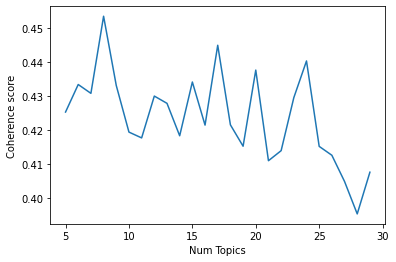

In [16]:
# Show graph
limit=30; start=5; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
#plt.savefig('20240221_PhD_MalletLDALtr-Coherence')
plt.show()

In [18]:
# Print the coherence and perplexity scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, 'Coherence: ', round(cv, 4))

Num Topics = 5 Coherence:  0.4252
Num Topics = 6 Coherence:  0.4333
Num Topics = 7 Coherence:  0.4307
Num Topics = 8 Coherence:  0.4534
Num Topics = 9 Coherence:  0.433
Num Topics = 10 Coherence:  0.4194
Num Topics = 11 Coherence:  0.4177
Num Topics = 12 Coherence:  0.4299
Num Topics = 13 Coherence:  0.4278
Num Topics = 14 Coherence:  0.4183
Num Topics = 15 Coherence:  0.4341
Num Topics = 16 Coherence:  0.4214
Num Topics = 17 Coherence:  0.4449
Num Topics = 18 Coherence:  0.4215
Num Topics = 19 Coherence:  0.4152
Num Topics = 20 Coherence:  0.4376
Num Topics = 21 Coherence:  0.411
Num Topics = 22 Coherence:  0.4139
Num Topics = 23 Coherence:  0.4295
Num Topics = 24 Coherence:  0.4402
Num Topics = 25 Coherence:  0.4152
Num Topics = 26 Coherence:  0.4126
Num Topics = 27 Coherence:  0.4049
Num Topics = 28 Coherence:  0.3953
Num Topics = 29 Coherence:  0.4076


In [20]:
# Coherence for 8-topic model
print(coherence_values[3])

# Topics for 8-topic model
malletModel_08 = model_list[3]
model_topics_08 = malletModel_08.show_topics(formatted=False)
pprint(sorted(malletModel_08.print_topics(num_words=20)))

# Convert results to lda model format for visualization.
MalletLDA08 = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(malletModel_08)

# Visualize the topics
pyLDAvis.enable_notebook()
vis08 = pyLDAvis.gensim.prepare(MalletLDA08, corpus, id2word, sort_topics=False)
vis08

0.4533716489880414
[(0,
  '0.118*"letter" + 0.078*"time" + 0.030*"day" + 0.026*"home" + 0.022*"month" '
  '+ 0.021*"news" + 0.020*"write" + 0.018*"pleasure" + 0.017*"sister" + '
  '0.016*"return" + 0.015*"account" + 0.014*"friend" + 0.014*"opportunity" + '
  '0.014*"weather" + 0.013*"health" + 0.013*"happiness" + 0.011*"picture" + '
  '0.011*"writing" + 0.011*"thing" + 0.011*"trust"'),
 (1,
  '0.040*"dollar" + 0.039*"money" + 0.028*"country" + 0.024*"man" + '
  '0.018*"year" + 0.018*"work" + 0.015*"pound" + 0.015*"cent" + 0.014*"people" '
  '+ 0.013*"lot" + 0.011*"month" + 0.011*"board" + 0.010*"expense" + '
  '0.010*"account" + 0.010*"company" + 0.009*"government" + 0.009*"cost" + '
  '0.008*"wage" + 0.008*"number" + 0.008*"property"'),
 (2,
  '0.060*"friend" + 0.052*"brother" + 0.051*"mother" + 0.047*"family" + '
  '0.032*"child" + 0.030*"health" + 0.030*"sister" + 0.030*"letter" + '
  '0.029*"year" + 0.027*"son" + 0.025*"father" + 0.025*"death" + 0.025*"wife" '
  '+ 0.023*"daughter"

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.086362  0.301635       1        1  12.509455
1     -0.003278 -0.060985       2        1  12.894230
2      0.306437 -0.040361       3        1  11.923313
3      0.188297 -0.133528       4        1  13.139843
4     -0.074216  0.280697       5        1  12.013654
5     -0.016211 -0.220269       6        1  13.108952
6     -0.277285 -0.026792       7        1  13.226569
7     -0.210106 -0.100397       8        1  11.183984, topic_info=       Term         Freq        Total Category  logprob  loglift
11   letter  1155.000000  1155.000000  Default  30.0000  30.0000
57     time  1171.000000  1171.000000  Default  29.0000  29.0000
78     week   578.000000   578.000000  Default  28.0000  28.0000
8       day  1073.000000  1073.000000  Default  27.0000  27.0000
84   friend   579.000000   579.000000  Default  26.0000  26.0000
..      ...          ...          ...      ...      ...      ...
5    church    60.548737   145.130270   Topic8  -4.7547   1.3165
26    thing    63.526544   240.743017   Topic8  -4.7067   0.8584
422    head    51.615317   116.528913   Topic8  -4.9144   1.3764
121   house    62.533942   375.590805   Topic8  -4.7225   0.3979
8       day    57.570930  1073.951607   Topic8  -4.8052  -0.7354

[580 rows x 6 columns], token_table=      Topic      Freq          Term
term                               
1014      2  0.998581     abundance
28        1  0.582741       account
28        2  0.414053       account
186       1  0.996574  acquaintance
187       6  1.000428          acre
...     ...       ...           ...
61        3  0.294241          year
61        4  0.106629          year
61        6  0.403569          year
62        7  0.393661     yesterday
62        8  0.598693     yesterday

[668 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8])

## 2. Increased iterations

In [21]:
def compute_coherence_values(dictionary, corpus, texts, limit, start, step):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word, random_seed=100)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [22]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatizedNouns)

# Create Corpus
texts = data_lemmatizedNouns

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [23]:
# To see word associated with id, use this code.
print(id2word)

Dictionary(6505 unique tokens: ['air', 'apron', 'bye', 'ceremony', 'cermony']...)


In [24]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, 
                                                        corpus=corpus, 
                                                        texts=data_lemmatizedNouns, 
                                                        start=5, 
                                                        limit=30, 
                                                        step=1)

Mallet LDA: 5 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.62746
<20> LL/token: -8.26451
<30> LL/token: -8.05247
<40> LL/token: -7.94716

0	10	day time morning thing room night town water home place hour people evening week yesterday boat side end clock fire 
1	10	day winter house time home school church letter place week weather deal spring month head manner today garden snow tea 
2	10	child time mother letter week brother health girl sister friend write wife baby month trouble aunt kind cousin pleasure boy 
3	10	country year land pound dollar money acre farm man person place work people cent crop foot price wheat lot number 
4	10	letter friend time life family book heart sister world paper year husband son home father hand work health kind death 

<50> LL/token: -7.88391
<60> LL/token: -7.83222
<70> LL/token: -7.80776
<80> LL/token: -7.78584
<90> LL/token: -7.76746

0	10	day time night thing morning room water town side hour 

<560> LL/token: -7.6585
<570> LL/token: -7.65947
<580> LL/token: -7.65639
<590> LL/token: -7.65637

0	10	day night morning room water bed place side hour evening river company boat town clock time woman wood fire office 
1	10	week day time winter house home summer month place weather school thing town church return deal today store manner garden 
2	10	letter time child friend brother mother sister health family home girl father death boy wife daughter write news kind baby 
3	10	country year land pound dollar money acre farm work person man people cent place crop price wheat board house month 
4	10	life year work hand book friend heart paper world people husband mind care interest business happiness flower comfort age darling 

<600> LL/token: -7.65538
<610> LL/token: -7.66144
<620> LL/token: -7.66162
<630> LL/token: -7.66642
<640> LL/token: -7.66456

0	10	day night morning room water bed side hour river town place company boat time clock man office ship fire city 
1	10	week day time wi

<110> LL/token: -7.79061
<120> LL/token: -7.78057
<130> LL/token: -7.76768
<140> LL/token: -7.76146

0	8.33333	year life hand book people work pleasure mind heart friend paper care interest home opportunity change business rest company time 
1	8.33333	letter time friend mother sister brother family health kind father death wife daughter news month girl son husband summer world 
2	8.33333	dollar money work house pound man day board year time cent family people kind store number business tea pay expense 
3	8.33333	day morning weather room night evening woman hour house fear return head water side flower leave end town girl fall 
4	8.33333	week child home day time boy thing baby winter school uncle write aunt month cousin visit church trouble night today 
5	8.33333	country land year acre farm place person winter wood pound crop horse month spring wheat road summer tree state difficulty 

<150> LL/token: -7.75501
<160> LL/token: -7.74899
<170> LL/token: -7.74027
<180> LL/token: -7.73612
<1

<570> LL/token: -7.69838
<580> LL/token: -7.69867
<590> LL/token: -7.70182

0	8.33333	life book heart friend year hand paper world people interest mind husband care work matter trouble copy spirit age comfort 
1	8.33333	letter time friend brother mother sister health family month father home wife daughter write news winter pleasure kind son death 
2	8.33333	work dollar house man people month day time money kind cent board business company year water lot pork pay city 
3	8.33333	day morning time room house night town side hour evening woman weather place flower water clock bed end boat return 
4	8.33333	week child day home boy girl thing baby school visit uncle aunt night today snow mail church doctor bed fire 
5	8.33333	country year land pound acre farm place person money summer winter crop price wheat horse state spring farmer market wood 

<600> LL/token: -7.70335
<610> LL/token: -7.69795
<620> LL/token: -7.70569
<630> LL/token: -7.70309
<640> LL/token: -7.69894

0	8.33333	life year 

Mallet LDA: 7 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.80398
<20> LL/token: -8.37414
<30> LL/token: -8.13504
<40> LL/token: -8.02351

0	7.14286	child friend letter book heart hand life death husband mind paper mother work trouble care age darling matter copy eye 
1	7.14286	time home place people business world return day life letter sister year manner happiness man friend month company account fear 
2	7.14286	day work week people time town month head thing kind water store garden pork island woman door paper lady foot 
3	7.14286	letter time day mother weather night winter girl week news month room write pleasure baby opportunity home visit snow child 
4	7.14286	country land pound year dollar place acre farm money person tree wood crop price horse river house road lot market 
5	7.14286	brother family health year sister friend summer winter letter kind uncle child aunt wife father cousin home son daughter wheat 
6	7.14286	mor

<410> LL/token: -7.75513
<420> LL/token: -7.76183
<430> LL/token: -7.76664
<440> LL/token: -7.76492

0	7.14286	life hand book heart child work kind friend paper husband mind care age spirit matter trouble copy interest loss trial 
1	7.14286	people year place business month home world man time state company manner happiness summer account difficulty idea gentleman city government 
2	7.14286	day work time week house room winter water boy head night store bed people snow mail deal fire foot woman 
3	7.14286	letter time day week girl home weather news baby thing pleasure visit month spring night return opportunity writing picture leave 
4	7.14286	country land pound dollar year acre money farm person cent price crop wheat place horse wood farmer market potato cost 
5	7.14286	friend brother family sister mother health letter child year father wife winter daughter son home death summer uncle answer aunt 
6	7.14286	day morning evening town school church hour side boat child clock yesterday nig

<810> LL/token: -7.75845
<820> LL/token: -7.74929
<830> LL/token: -7.74911
<840> LL/token: -7.75791

0	7.14286	life hand book child heart friend mind work husband spirit paper care world kind woman age trouble copy eye death 
1	7.14286	people country year man place business time summer state city company manner happiness person month idea difficulty situation government interest 
2	7.14286	day work week house winter time room bed water head store boy snow fire thing foot woman horse deal door 
3	7.14286	letter time day week month girl home baby thing weather night pleasure news place write flower writing picture trust return 
4	7.14286	country land pound year dollar acre money farm cent crop price wheat place farmer market person house potato cost bushel 
5	7.14286	letter friend brother mother sister family health child year wife winter home daughter time son father uncle aunt summer answer 
6	7.14286	day town morning evening church school yesterday night boat today side home child hou

<210> LL/token: -7.77128
<220> LL/token: -7.77133
<230> LL/token: -7.7777
<240> LL/token: -7.77456

0	6.25	letter time day write news month account weather friend pleasure thing opportunity place happiness comfort manner writing picture darling fire 
1	6.25	dollar money year pound cent man lot country month board cost pay expense government work property number cow gold provision 
2	6.25	friend brother mother family health sister letter year son father death wife child daughter uncle answer aunt cousin kind husband 
3	6.25	hand book heart life paper mind work trouble kind interest fear age matter world copy woman trial power anxiety return 
4	6.25	time people day winter work summer home place country month business state city town man snow thing rest situation reason 
5	6.25	country land year acre farm wood pound crop horse wheat place person house kind foot farmer spring market potato tree 
6	6.25	day morning house hour town water night side company evening boat room return river end 

<560> LL/token: -7.76202
<570> LL/token: -7.76103
<580> LL/token: -7.76523
<590> LL/token: -7.76138

0	6.25	letter time day home friend health month pleasure news write sister weather opportunity account happiness return kind writing picture place 
1	6.25	dollar man money year country people work cent board company account month state expense lot government wage case number climate 
2	6.25	friend brother mother family letter sister child year son father death wife health daughter uncle aunt answer kind cousin house 
3	6.25	life hand book heart paper mind interest work world husband age woman spirit copy matter year trial power anxiety comfort 
4	6.25	time day home winter summer people place month business work country week thing city rest snow town change reason weather 
5	6.25	land country pound year acre farm person crop price money horse wheat house place spring foot farmer market potato bushel 
6	6.25	day town house morning hour side water river boat evening room night fire wood pl

<910> LL/token: -7.76675
<920> LL/token: -7.77087
<930> LL/token: -7.75913
<940> LL/token: -7.76107

0	6.25	letter time month friend pleasure news return account home opportunity day write manner happiness kind health sister writing place weather 
1	6.25	dollar country year man work money people month cent business company board pay expense number government wage account case state 
2	6.25	friend brother mother family sister health letter child year son death wife daughter uncle aunt cousin father home answer house 
3	6.25	life hand book heart world paper interest mind spirit work copy husband kind trial power matter woman pen eye sorrow 
4	6.25	time day winter home summer place people country work week month thing city weather situation snow change town reason rest 
5	6.25	land country pound year acre farm money crop price wheat house horse person foot dollar farmer market potato bushel wood 
6	6.25	day house morning side hour town night water room boat place river evening clock fire 

<260> LL/token: -7.81533
<270> LL/token: -7.81196
<280> LL/token: -7.82307
<290> LL/token: -7.81817

0	5.55556	book room work spirit hand people house winter mind fire table order time description window day street servant deal opinion 
1	5.55556	country people man year business company state number mine work climate person time government war reason case gold provision captain 
2	5.55556	time day girl letter month weather thing place week night school manner garden picture return kind lady walk box fear 
3	5.55556	friend child death trouble life husband son sister interest wife mother heart hand change paper care mind doctor matter loss 
4	5.55556	letter brother time family mother health sister winter friend summer news write uncle aunt home answer cousin year daughter month 
5	5.55556	house day town water tree wood boat road foot place side river board half spring sea tea horse piece leave 
6	5.55556	letter life world year kind pleasure home woman happiness comfort flower father retu

<610> LL/token: -7.79552
<620> LL/token: -7.80383
<630> LL/token: -7.80369
<640> LL/token: -7.79879

0	5.55556	house book hand room work mind spirit thing fire eye copy woman order winter door anxiety town servant street table 
1	5.55556	people country year man business place work state company person city home government rest war office number gold meeting case 
2	5.55556	day time month letter place weather thing week deal night manner garden account rain lady town picture frost air dress 
3	5.55556	friend child death heart life husband family trouble son paper mother sister interest wife age daughter account change loss trial 
4	5.55556	letter time brother health mother winter friend sister summer family write home uncle aunt answer year month cousin wife spring 
5	5.55556	day water house tree town river boat road foot wood side hour morning ship captain sea vessel horse board place 
6	5.55556	letter kind world home life father pleasure care year return happiness flower comfort fear 

<960> LL/token: -7.78914
<970> LL/token: -7.79594
<980> LL/token: -7.79882
<990> LL/token: -7.80476

0	5.55556	work book hand room thing house mind time fire copy table spirit anxiety door idea woman fear servant eye face 
1	5.55556	people country man business year home state place company work case expense government war person city party gold fact field 
2	5.55556	day time month winter place weather thing town account night snow garden spring manner week rain lady people air heat 
3	5.55556	friend death year life heart child husband trouble son interest wife change matter age kind family hand world rest paper 
4	5.55556	letter brother time mother family sister summer friend health home uncle year aunt answer cousin write daughter winter father wife 
5	5.55556	day water town morning river tree boat side road wood hour house board ship place sea ground foot vessel evening 
6	5.55556	letter kind girl pleasure health home return life news happiness flower writing father trust woman darli

<260> LL/token: -7.81845
<270> LL/token: -7.81215
<280> LL/token: -7.82392
<290> LL/token: -7.82152

0	5	work house day town people horse thing half pork board vessel tea store city passage gold company employment provision view 
1	5	year business people man state interest case difficulty home mind government world hand reason situation party account heat term rest 
2	5	time girl room boy hand night woman thing bed mail mind fire change table account tomorrow order eye window creature 
3	5	home day week letter evening time visit aunt return mother yesterday today morning clock leave weather year dinner news rain 
4	5	life book friend heart husband paper work death wife care kind picture world dollar copy loss age trial flower son 
5	5	child week day baby school church trouble town spirit wife doctor blessing island captain house bed fever head trust pain 
6	5	country land pound year dollar money acre farm cent crop price wheat person farmer market potato cost bushel wage seed 
7	5	lett

<560> LL/token: -7.80731
<570> LL/token: -7.8061
<580> LL/token: -7.81227
<590> LL/token: -7.80293

0	5	work house board tea water people day horse cent thing servant pay gold provision pork employment flour box clothe deal 
1	5	people business man interest year state case month city company difficulty government home party expense matter fact term law character 
2	5	time girl hand room thing woman boy night mind spirit life fire picture change tomorrow writing head table window eye 
3	5	home letter day week time baby visit aunt evening yesterday today news night mother return weather morning mail leave fear 
4	5	life book heart friend work husband paper kind death year age care world copy trial loss dollar son sorrow flower 
5	5	child week day house school bed trouble church boy doctor island town captain store wife prospect fortnight advice illness cough 
6	5	country land year pound money dollar acre farm crop price wheat person place farmer market bushel wage spring cost trade 
7	5	

<860> LL/token: -7.81534
<870> LL/token: -7.81729
<880> LL/token: -7.80702
<890> LL/token: -7.81709

0	5	work dollar cent month water people pay house horse thing foot cow day board gold provision employment cost flour good 
1	5	people year man business country interest city company home state government case power matter difficulty party law life expense war 
2	5	time girl hand room thing woman mind night head spirit picture boy fire eye door account pen writing table window 
3	5	home letter time day week mother baby visit today yesterday mail weather night aunt news morning rest rain folk tomorrow 
4	5	life book friend heart kind work husband paper world age son care copy death change child loss trial sorrow flower 
5	5	child week house school bed boy trouble church doctor day town island store tea captain fortnight prospect illness advice snow 
6	5	country land pound year acre farm money dollar person crop price wheat place farmer market bushel wood wage spring half 
7	5	brother let

<160> LL/token: -7.8378
<170> LL/token: -7.84012
<180> LL/token: -7.82838
<190> LL/token: -7.82053

0	4.54545	book heart life work trouble world paper trust year doctor blessing copy son power trial case anxiety nature interest parent 
1	4.54545	people man year business office thing company law city state war government interest party fact time gold expense duty opinion 
2	4.54545	land pound country acre dollar farm year money cent crop price wheat farmer market cost bushel spring wage seed kind 
3	4.54545	child home week boy school church visit account today mail opportunity fear fever illness order prospect leave spirit fortnight meeting 
4	4.54545	house place town country people wood day person month snow road difficulty manner door garden climate idea horse heat side 
5	4.54545	family brother year health summer winter country friend month money work son wife dollar place line reason house trade acquaintance 
6	4.54545	time day weather home head place winter rest spring mine pleasur

<410> LL/token: -7.78346
<420> LL/token: -7.79782
<430> LL/token: -7.79689
<440> LL/token: -7.80096

0	4.54545	book life work paper trouble world copy doctor trial heart anxiety case interest nature parent power story affection trust son 
1	4.54545	people year business man office state city country company government war mind party interest difficulty time reason fact matter end 
2	4.54545	land country pound year dollar acre farm money cent price crop wheat farmer market bushel wage seed cost person potato 
3	4.54545	child week home boy school visit today store church mail island account prospect service leave pork trust meeting lesson class 
4	4.54545	place town day house wood country person tree people summer road garden winter month horse manner ground door climate river 
5	4.54545	family brother health friend year month wife summer money son spring daughter country winter place line sister call acquaintance word 
6	4.54545	time day work winter weather home head girl place snow mine

<680> LL/token: -7.80505
<690> LL/token: -7.80718

0	4.54545	book work life paper thing trouble copy case interest anxiety doctor trial fear nature home expense parent pen power story 
1	4.54545	people man year business country company month city government war state party office opinion law fact interest difficulty time mind 
2	4.54545	land country pound acre farm dollar year money cent crop price wheat person farmer market bushel wage potato work cost 
3	4.54545	week child home boy school baby today visit store island girl church tea town house pork tomorrow lesson minute prospect 
4	4.54545	place day town country wood house summer month tree road garden winter people person climate church home manner ground river 
5	4.54545	brother family health year friend wife son money winter summer country account dollar sister house daughter spring pay trouble paper 
6	4.54545	time day work home place head week weather winter lot pleasure mine deal snow attention girl folk dress change hand 
7	

<960> LL/token: -7.79431
<970> LL/token: -7.79699
<980> LL/token: -7.80131
<990> LL/token: -7.80723

0	4.54545	book work life paper trouble hand thing interest case copy mind trial anxiety expense doctor fear nature parent dollar servant 
1	4.54545	people year man business country company kind city government state war office month party fact difficulty matter number side circumstance 
2	4.54545	country land pound acre dollar farm year money cent crop price wheat person farmer market potato cost bushel wage work 
3	4.54545	child week boy baby school home today visit store island girl church town pork tea trouble tomorrow fortnight lesson call 
4	4.54545	place day town month wood tree summer road country winter garden manner house church person river climate idea lady description 
5	4.54545	family brother friend year health wife son summer winter money country account daughter sister month house spring respect line word 
6	4.54545	time day work home place weather lot head winter mine he

<210> LL/token: -7.87007
<220> LL/token: -7.85946
<230> LL/token: -7.85553
<240> LL/token: -7.85152

0	4.16667	friend family brother sister health wife daughter year son father account husband death kind money dollar line word loss living 
1	4.16667	day time winter month summer weather health opportunity pleasure home happiness country garden snow spring return peace trust attention lady 
2	4.16667	work book paper life business heart age interest copy case kind fear nature city character spirit son soul fortune story 
3	4.16667	hand world woman rest mind comfort year fire life heart change eye trial thing anxiety room bed flower face child 
4	4.16667	water time side tree river boat day work ship sea place vessel foot board morning fellow captain man passage head 
5	4.16667	letter time write news place friend thing sister girl month writing darling picture answer fever leave care prayer kind call 
6	4.16667	people difficulty life situation time trouble mind person prospect reason compan

<460> LL/token: -7.82868
<470> LL/token: -7.82986
<480> LL/token: -7.83025
<490> LL/token: -7.81865

0	4.16667	friend family brother year sister wife health father son kind account death daughter money dollar line husband loss blessing respect 
1	4.16667	winter day month summer time health home spring snow happiness pleasure garden deal opportunity weather country trust return year manner 
2	4.16667	work book paper life interest age copy trial kind friend son fear heart city dollar business story bear pay history 
3	4.16667	hand life heart world mind woman thing girl rest fire care change room bed husband spirit anxiety sorrow flower eye 
4	4.16667	water day time river tree boat foot head ship captain side hour vessel sea arrival board work horse voyage fellow 
5	4.16667	letter time mother write news sister place friend writing thing answer darling picture month girl fever folk leave call thinking 
6	4.16667	people state home case situation difficulty matter person time reason party se

<710> LL/token: -7.83433
<720> LL/token: -7.83111
<730> LL/token: -7.82937
<740> LL/token: -7.82929

0	4.16667	family brother friend health year sister wife son father daughter death money mother account blessing line answer living word husband 
1	4.16667	time month day winter summer weather country home garden kind snow health pleasure happiness spring trust lady deal attention opportunity 
2	4.16667	work book paper life age copy interest home trial dollar fear pleasure story son pay heart success bread mail gentleman 
3	4.16667	hand life heart child friend woman world kind thing mind spirit husband eye rest death girl room pen sorrow change 
4	4.16667	water day river boat foot side hour board time ship captain sea vessel fellow passage horse morning fall number tree 
5	4.16667	letter time mother place sister write news month thing writing girl darling picture answer friend care mine cousin folk thinking 
6	4.16667	people situation case matter difficulty person state reason mind offic

<960> LL/token: -7.82249
<970> LL/token: -7.82794
<980> LL/token: -7.82734
<990> LL/token: -7.83516

0	4.16667	family brother friend year health sister wife mother son father daughter death home summer money account line kind living word 
1	4.16667	month time day winter summer country health weather happiness garden manner spring pleasure trust father attention lady prayer prospect home 
2	4.16667	work book paper home life age copy pleasure trial anxiety care interest pay fear business story son gentleman success spirit 
3	4.16667	hand heart life girl world friend woman husband death mind kind change dollar eye loss rest darling child pen sorrow 
4	4.16667	water river boat board side hour day time ship foot captain sea tree vessel morning place ground end provision passage 
5	4.16667	letter time mother friend write news sister place month answer cousin writing opportunity picture deal thing mine folk girl glad_hear 
6	4.16667	state case situation difficulty people reason mind expense o

<210> LL/token: -7.87919
<220> LL/token: -7.88783
<230> LL/token: -7.88427
<240> LL/token: -7.88542

0	3.84615	house town room tree wood place time garden road side dinner door flower water frost mile spirit breakfast ground home 
1	3.84615	work day week trouble bed dollar city house doctor place kind rest snow situation pain pay illness party arm charge 
2	3.84615	people man year business state case difficulty law company government property person fact expense mind duty thousand share meeting number 
3	3.84615	family brother winter health year money uncle son summer friend account line word month respect country prospect answer living address 
4	3.84615	time country month place summer year people thing opportunity store spring mine hand manner pleasure kind gold distance health dress 
5	3.84615	day night morning evening weather church yesterday week clock fire island hour lady board rain window mail street return sleep 
6	3.84615	book hand interest world heart life copy mind eye powe

<460> LL/token: -7.8568
<470> LL/token: -7.86764
<480> LL/token: -7.86128
<490> LL/token: -7.85695

0	3.84615	house town day room place tree wood time road fire garden building side door window frost bed water dinner horse 
1	3.84615	day work week dollar trouble house bed kind money place store doctor thing head situation city rest pay night board 
2	3.84615	people country man year business state government person company meeting fact difficulty city law property thousand bank field power quarter 
3	3.84615	brother family health friend year winter letter uncle son aunt cousin summer account line money answer respect address living paper 
4	3.84615	time month place summer winter year country spring kind deal people weather thing manner gold mine distance reason dress plan 
5	3.84615	day night morning evening church weather yesterday clock mail island hour home visit rain return street air end scene fall 
6	3.84615	hand book paper interest life mind work copy world year heart anxiety nat

<710> LL/token: -7.87621
<720> LL/token: -7.86563
<730> LL/token: -7.86723
<740> LL/token: -7.87004

0	3.84615	town house day room tree wood river road fire side place water building door view horse bed window people ground 
1	3.84615	work day week dollar house people money store month trouble doctor pay rest kind city place situation charge board fever 
2	3.84615	man country people business year company state government law party meeting fact place war thousand difficulty city number case stand 
3	3.84615	family brother health year friend son uncle winter wife letter aunt cousin line kind summer answer account living address paper 
4	3.84615	time month place country summer winter year spring garden deal climate manner hand kind weather distance person dress mine idea 
5	3.84615	day night morning evening weather church week home clock yesterday island mail hour dinner rain fear fall afternoon fortnight end 
6	3.84615	book hand interest life world paper copy work anxiety mind thing year

<960> LL/token: -7.85019
<970> LL/token: -7.85343
<980> LL/token: -7.85945
<990> LL/token: -7.87538

0	3.84615	town house room place water tree river road wood day fire side bed head door building window horse people view 
1	3.84615	work day week dollar money house kind store lot doctor pay place month people deal situation rest trouble city mine 
2	3.84615	people man country business year state law government place city party company difficulty war meeting thousand office call earth power 
3	3.84615	family brother health year friend son uncle letter cousin winter wife father account aunt summer line kind answer respect address 
4	3.84615	time month winter summer country place year weather garden spring manner snow acquaintance lady climate heat pleasure frost idea distance 
5	3.84615	day night morning evening week home clock visit weather mail dinner yesterday church rain return air afternoon walk end hour 
6	3.84615	book life interest paper hand mind thing copy work anxiety fear worl

<170> LL/token: -7.93249
<180> LL/token: -7.92193
<190> LL/token: -7.92135

0	3.57143	book interest mind life year paper work hand matter copy heart husband nature spirit trial world fear age eye power 
1	3.57143	child school room week girl captain boy difficulty window walk weather home mind hour term pork cough minute lot ice 
2	3.57143	people work man business person expense year case hand servant day fact mine home place city doubt stand number state 
3	3.57143	mother brother letter child sister family wife daughter home uncle aunt son cousin death answer father boy address health fire 
4	3.57143	friend time kind money country life manner doctor son death trouble deal situation father law change circumstance pleasure glad_hear sickness 
5	3.57143	land pound country acre dollar farm year money cent crop price wheat farmer market bushel wage cost trade stock number 
6	3.57143	house day water place wood side night river boat board time island sea tree bank gentleman passage head bed b

<360> LL/token: -7.89504
<370> LL/token: -7.88893
<380> LL/token: -7.88345
<390> LL/token: -7.88189

0	3.57143	book hand interest mind life paper work copy spirit nature trial anxiety matter power fear year son story age success 
1	3.57143	child room bed school night week captain hour door vessel window island boy walk table fortnight town class kitchen minute 
2	3.57143	people country man work business state person company place fact number question case lot doubt time account stand sort habit 
3	3.57143	brother mother family child sister letter daughter son wife uncle death aunt cousin health home father winter year answer line 
4	3.57143	friend time kind money trouble country manner doctor rest deal situation acquaintance death sickness word circumstance glad_hear advice work stranger 
5	3.57143	land country pound acre farm dollar year money cent crop price wheat farmer market bushel person wage cost employment trade 
6	3.57143	house place water day side wood river tree board time b

<560> LL/token: -7.87449
<570> LL/token: -7.87441
<580> LL/token: -7.87451
<590> LL/token: -7.87106

0	3.57143	book work life hand mind paper interest copy spirit age matter year nature power trial eye story success truth gentleman 
1	3.57143	child room school bed week captain island vessel hour window door today walk night church fortnight tea pork cough kitchen 
2	3.57143	people business country state man place person work difficulty case party opinion fact climate reason company number feeling meeting mind 
3	3.57143	family brother mother sister child letter health wife son uncle year aunt daughter cousin death line winter father blessing answer 
4	3.57143	friend time kind home money trouble country rest doctor account manner deal acquaintance situation hand change fortune circumstance respect living 
5	3.57143	country land pound acre farm dollar year money cent crop price wheat farmer market bushel wage person trade neighbourhood stock 
6	3.57143	house day place water side wood tre

<760> LL/token: -7.87939
<770> LL/token: -7.87083
<780> LL/token: -7.87984
<790> LL/token: -7.86084

0	3.57143	book work hand life paper interest mind copy spirit trial matter nature son world anxiety eye story fear age servant 
1	3.57143	week room bed child school today island captain church hour clock walk window evening pork afternoon table fortnight vessel service 
2	3.57143	country people man business state difficulty person place party gold expense fact case reason number climate company opinion work law 
3	3.57143	brother family mother child letter sister health wife son daughter uncle aunt cousin death year line paper father answer blessing 
4	3.57143	friend home time money trouble account kind rest doctor situation country change case sickness manner advice store charge circumstance fever 
5	3.57143	land country pound acre dollar farm year money cent crop price wheat farmer market board bushel wage person half trade 
6	3.57143	house place day wood side water tree river town ro

<980> LL/token: -7.88052
<990> LL/token: -7.88999

0	3.57143	book hand work life paper interest copy mind anxiety spirit trial power nature son story table truth matter age servant 
1	3.57143	week child room school bed today church island captain boy window house walk pork tea fortnight evening spirit hour service 
2	3.57143	business state country place difficulty man people expense case work person party gold fact company fortune number climate emigrant doubt 
3	3.57143	brother family mother child health wife sister letter son year uncle aunt daughter death cousin father line answer paper word 
4	3.57143	friend time home trouble money kind rest account country change doctor house situation store dollar city advice debt stranger case 
5	3.57143	country land pound acre dollar farm year money crop price wheat person market farmer bushel wage trade board stock lot 
6	3.57143	house place wood water town tree day river side road time ground building mill street view foot head mile idea 
7	3

<160> LL/token: -7.93957
<170> LL/token: -7.93658
<180> LL/token: -7.93285
<190> LL/token: -7.92678

0	3.33333	child book girl boy today doctor thing illness head face writing creature fear mail fever cough week disease history painting 
1	3.33333	life work year trouble paper son copy trial wife heart change man woman term loss nature soul call office hand 
2	3.33333	friend death sister kind life husband heart account father world law year sorrow comfort age parent situation writing fortune power 
3	3.33333	letter place time return spirit opportunity happiness flower care trust darling world manner war peace people picture eye fear kindness 
4	3.33333	brother family health sister child daughter year letter uncle answer mother son father line winter living house trouble address aunt 
5	3.33333	day time month weather summer woman garden health deal tree rain pleasure lady order air letter scene fall hear attention 
6	3.33333	house town room day church side clock boy dinner tea door yeste

<360> LL/token: -7.88797
<370> LL/token: -7.88274
<380> LL/token: -7.88385
<390> LL/token: -7.88773

0	3.33333	child boy girl thing woman doctor book anxiety eye illness face daughter writing head creature cough hour fear hope painting 
1	3.33333	book life work paper year mind trouble copy son trial change heart flower bread soul term story loss age hand 
2	3.33333	friend death kind sister life heart husband world account rest father care comfort sorrow parent sickness pain power fortune affection 
3	3.33333	letter time return place pleasure spirit happiness opportunity manner home trust darling peace prayer father care hand prospect picture flower 
4	3.33333	brother family health year sister child mother uncle winter son daughter friend trouble line aunt address father answer word paper 
5	3.33333	day month summer weather time health garden country deal rain lady tree woman air thing spring acquaintance sister appearance visit 
6	3.33333	house town day room church wood mail dinner mor

<560> LL/token: -7.8813
<570> LL/token: -7.88065
<580> LL/token: -7.88703
<590> LL/token: -7.88315

0	3.33333	child boy girl thing woman trouble daughter anxiety face creature head fear hair illness doctor disease birthday kind age painting 
1	3.33333	book life work year paper hand mind copy flower son nature term trial soul heart story spirit husband regret sum 
2	3.33333	friend sister death life heart kind father husband rest world account change comfort care sorrow loss parent fortune sickness situation 
3	3.33333	letter time opportunity place manner return happiness pleasure writing trust home prayer darling kindness fever father news spirit peace country 
4	3.33333	brother family health year wife child sister son uncle daughter summer winter friend aunt mother letter line doctor cousin paper 
5	3.33333	day month winter weather summer time health garden snow rain lady deal spring frost kind air tree thing appearance woman 
6	3.33333	house day town room church wood bed dinner hour d

<760> LL/token: -7.88361
<770> LL/token: -7.86678
<780> LL/token: -7.87945
<790> LL/token: -7.87911

0	3.33333	child boy girl thing baby woman wife trouble eye visit age fear mind face daughter doctor head tomorrow talk anxiety 
1	3.33333	book life work paper year copy son heart flower nature mind interest spirit story trial term age home sum pound 
2	3.33333	friend death sister hand husband heart world life rest kind account change sorrow loss father parent trouble pen soul affection 
3	3.33333	letter time pleasure place return opportunity father happiness trust kind manner prayer home care peace darling spirit kindness fever news 
4	3.33333	brother family health year friend uncle child son daughter wife mother aunt summer winter sister line paper blessing house cousin 
5	3.33333	day month winter weather summer time health garden home rain lady air frost snow spring thing change appearance fear woman 
6	3.33333	day town house room church place hour fire door dinner wood table hand bed

<960> LL/token: -7.87626
<970> LL/token: -7.88178
<980> LL/token: -7.87931
<990> LL/token: -7.88411

0	3.33333	child girl boy thing baby woman wife mind eye age daughter darling face head visit creature word likeness arm position 
1	3.33333	book year work paper life copy interest anxiety flower mind nature story spirit term truth son heart regret pleasure success 
2	3.33333	friend life heart husband hand death trouble sister world kind change rest sorrow loss sickness parent father soul law affection 
3	3.33333	letter time health place return happiness opportunity friend trust care news father kind peace manner home kindness fever prayer pleasure 
4	3.33333	family brother year health son uncle aunt friend daughter wife mother child summer winter sister father account line paper house 
5	3.33333	day month winter weather summer time garden snow spring lady home pleasure air frost thing rain comfort climate society acquaintance 
6	3.33333	town house room day church fire bed dinner door pl

<160> LL/token: -7.96287
<170> LL/token: -7.96183
<180> LL/token: -7.95517
<190> LL/token: -7.95238

0	3.125	week day child baby night girl school doctor store weather bed head fever face fortnight call boy cough thinking sleep 
1	3.125	day letter time place month manner happiness trust health thing pleasure world weather order idea prayer return lady wood winter 
2	3.125	work house time room people water fire hour bed life door friend lot head gentleman call city fact deal sight 
3	3.125	letter girl visit care paper age darling father boy eye change time war life fear office spirit loss home event 
4	3.125	family brother health friend sister son child daughter death uncle aunt year wife account kind husband living address line remembrance 
5	3.125	tree house flower tea room seed garden servant kind window mile body spring ground plan half spot end bed passage 
6	3.125	child week day night today mail yesterday boy evening morning thing afternoon tomorrow account man home mountain servi

<360> LL/token: -7.92907
<370> LL/token: -7.93131
<380> LL/token: -7.93272
<390> LL/token: -7.93054

0	3.125	week day child baby night doctor school girl weather store bed trouble head pain today fortnight fever visit cough illness 
1	3.125	time day letter health month place happiness weather trust pleasure opportunity attention news world manner lady prayer peace order mine 
2	3.125	work time house place people water city lot fire door deal head town call life hour street mountain gentleman building 
3	3.125	letter kind girl thing father age boy picture darling change fear woman visit care rest mother eye return writing loss 
4	3.125	family brother child son health friend sister wife death uncle daughter aunt account husband paper living kind address line cousin 
5	3.125	room house tree flower bed church garden seed tea window walk view mile island table spot servant currency kitchen half 
6	3.125	night child boy day morning home evening mail yesterday hour week tomorrow afternoon tod

<560> LL/token: -7.92047
<570> LL/token: -7.91719
<580> LL/token: -7.92952
<590> LL/token: -7.91321

0	3.125	week day night baby child doctor bed weather head visit trouble today store fever pain fortnight cough illness minute anxiety 
1	3.125	letter time day health month happiness friend place pleasure prayer kindness lady opportunity trust father return weather peace manner news 
2	3.125	time house work place people lot deal water fire day town man mine hour door head city call mountain street 
3	3.125	girl letter kind thing woman heart boy darling picture visit age mind fear daughter care creature return loss sister eye 
4	3.125	family brother child friend health son death uncle aunt wife year daughter sister account living address kind husband line paper 
5	3.125	room house flower bed island tree garden window weather sort air walk spot view school lesson music kitchen sight floor 
6	3.125	child boy school church evening morning home mail night week yesterday hour clock afternoon t

<760> LL/token: -7.9284
<770> LL/token: -7.92538
<780> LL/token: -7.92908
<790> LL/token: -7.91763

0	3.125	week day night baby bed weather child doctor trouble store today head illness fever visit fortnight pen cough anxiety trip 
1	3.125	time letter day health month happiness place friend pleasure manner trust opportunity kind weather lady attention news prayer kindness peace 
2	3.125	day work time place people water house lot fire man town head foot city gentleman deal mountain mile mine street 
3	3.125	girl letter thing sister heart woman boy age picture kind fear child return darling eye loss rest creature mind writing 
4	3.125	family brother health wife son child daughter uncle friend aunt death husband year mother living life address sister paper kind 
5	3.125	room house flower table bed island garden window walk air view visit door servant spot sight hand kitchen lesson sort 
6	3.125	child school boy home evening church morning hour mail night yesterday clock tea tomorrow after

<960> LL/token: -7.91861
<970> LL/token: -7.92708
<980> LL/token: -7.92945
<990> LL/token: -7.92547

0	3.125	day week night baby bed trouble doctor visit weather fever store pain head illness fortnight today pen thing trip month 
1	3.125	time letter health day happiness weather place manner return father trust pleasure kind prayer friend attention news month deal lady 
2	3.125	work time day house people place water lot fire head man mine mind side company foot hour stand class city 
3	3.125	child girl heart letter kind death thing boy sister age wife father loss picture return mind daughter darling hair creature 
4	3.125	brother family health son friend uncle aunt daughter wife year child mother kind death sister living father house address paper 
5	3.125	house room flower woman hand table bed door window air garden walk view question servant kitchen sort tree eye round 
6	3.125	child school week home boy church morning evening mail island yesterday clock today tomorrow visit horse aft

<160> LL/token: -7.97467
<170> LL/token: -7.97448
<180> LL/token: -7.95823
<190> LL/token: -7.95184

0	2.94118	country land pound year acre farm crop price wheat farmer market bushel money horse potato seed stock half oats beef 
1	2.94118	place wood tree river side road house land water boat return fall building bank lot settler lake mill mile part 
2	2.94118	hand letter kind time mind sister pleasure wife visit spirit power interest kindness girl account advice marriage hair show promise 
3	2.94118	people work business life paper matter case world gentleman time servant character manner city service table cotton strength doubt position 
4	2.94118	day town morning evening church clock home night dinner time yesterday visit weather order packet breakfast afternoon floor tea scene 
5	2.94118	book heart life copy death child trial parent care eye age creature soul affection letter picture fear father pen story 
6	2.94118	brother letter mother family sister health friend uncle aunt child c

<360> LL/token: -7.91999
<370> LL/token: -7.92143
<380> LL/token: -7.92096
<390> LL/token: -7.92774

0	2.94118	land country pound acre year farm crop price wheat farmer money market bushel potato horse seed stock oats half shilling 
1	2.94118	house wood place tree river side road water fall bank boat land building mill view comfort mile village lake lot 
2	2.94118	hand time life mind interest kind letter girl death pen pleasure spirit account share earth question visit truth marriage show 
3	2.94118	people business work city matter trouble paper gentleman time manner table service world cotton doubt place success strength order meet 
4	2.94118	day morning town evening church weather home clock dinner return visit arrival yesterday place breakfast walk packet door street scene 
5	2.94118	book heart child life work copy trial flower parent wife soul story affection fear sorrow age nature woman case paper 
6	2.94118	brother family letter friend sister mother son health wife uncle aunt dea

<560> LL/token: -7.91201
<570> LL/token: -7.90734
<580> LL/token: -7.91387
<590> LL/token: -7.9093

0	2.94118	land country acre farm year pound crop price wheat farmer market bushel potato foot seed horse spring oats stock beef 
1	2.94118	house place wood river tree road side land building fall water street mill bank gentleman end body ground lake village 
2	2.94118	time letter hand life mind interest death rest pleasure pen earth share question world regret marriage address year turn reason 
3	2.94118	people business city matter friend trouble power place service party kind paper meeting manner cotton table show gentleman news meet 
4	2.94118	day town morning evening church clock return dinner yesterday home visit afternoon walk tea sister breakfast lady weather spirit packet 
5	2.94118	book heart life work paper copy wife sorrow flower nature trial care creature fear soul affection story age woman history 
6	2.94118	brother mother letter family sister friend son uncle health father c

<760> LL/token: -7.91656
<770> LL/token: -7.91311
<780> LL/token: -7.91884
<790> LL/token: -7.91118

0	2.94118	land country acre year farm pound crop wheat price farmer market bushel potato horse seed neighbour oats stock shilling cow 
1	2.94118	place house wood tree river road side water fall lot land street building mill frost view bank ground distance lake 
2	2.94118	letter hand time mind life rest interest death pleasure world pen spirit eye earth share girl trip regret excuse truth 
3	2.94118	people business city friend matter trouble power party paper kind place meeting service expense gentleman case state cotton table house 
4	2.94118	day morning town evening church weather return clock home yesterday dinner spirit tea visit afternoon rain walk breakfast packet journey 
5	2.94118	book heart life work copy flower child trial woman sorrow care nature wife affection fear age picture term success soul 
6	2.94118	brother letter family sister mother friend wife uncle daughter health s

<960> LL/token: -7.92967
<970> LL/token: -7.94363
<980> LL/token: -7.94173
<990> LL/token: -7.95059

0	2.94118	land country acre farm pound year crop price wheat farmer potato market bushel family seed spring stock oats money horse 
1	2.94118	place house wood tree river road side water building church fall land street mile hour bank lake meeting lot description 
2	2.94118	time hand letter mind friend life death pen interest spirit pleasure question eye comfort earth reason talk truth kind marriage 
3	2.94118	people business trouble city matter paper house power interest party table cotton rest strength suit meet member class service arm 
4	2.94118	day town evening morning home church clock yesterday return dinner weather night spirit walk rain visit air journey breakfast scene 
5	2.94118	book heart life work woman copy trial husband age sorrow paper flower wife soul picture affection fear parent story sister 
6	2.94118	brother family letter mother sister friend health son uncle wife da

<160> LL/token: -8.01965
<170> LL/token: -8.01538
<180> LL/token: -8.0024
<190> LL/token: -7.99775

0	2.77778	dollar pound work cent potato cost bushel money board cow foot employment provision pork month tea pay seed deal beef 
1	2.77778	mother family child uncle home aunt letter daughter cousin news health winter address time death father summer age weather event 
2	2.77778	work trouble life copy book year mine case expense reason term story sum pay time money home coal show fellow 
3	2.77778	week girl room baby boy day woman visit tomorrow weather darling change sleep creature cough fear kitchen walk music arm 
4	2.77778	day place house time week people town store head church lot water night half home mountain call distance commence round 
5	2.77778	health kind care time friend day sister paper letter thing pen fever account call sickness thinking talk position write disease 
6	2.77778	friend son heart husband death child life year doctor kind wife world daughter sorrow loss trial k

<360> LL/token: -7.96431
<370> LL/token: -7.95664
<380> LL/token: -7.95232
<390> LL/token: -7.95592

0	2.77778	dollar work pound cent board cost wage cow seed money month clothe provision flour beef tea butter employment sugar luggage 
1	2.77778	family mother child home uncle daughter aunt health cousin winter death address father summer age news weather kind body remembrance 
2	2.77778	work book copy reason year trouble pay fellow mine story life difficulty success expense debt sum money age writing subject 
3	2.77778	week girl night baby boy visit weather rest thing window room darling walk change fear woman hair dress cough sleep 
4	2.77778	day time place people week house water home store lot head town half mountain charge distance tool length chest rice 
5	2.77778	day paper time kind care call thing account prospect health sickness illness fever doubt thinking friend position disease service pen 
6	2.77778	friend son heart husband death life sister year wife world trial loss kind 

<560> LL/token: -7.95798
<570> LL/token: -7.94679
<580> LL/token: -7.94132
<590> LL/token: -7.93935

0	2.77778	dollar pound cent work board wage cost cow month provision seed flour expense servant luggage beef tea potato clothe butter 
1	2.77778	family mother child daughter uncle aunt year health home cousin house address death winter blessing summer age people doctor weather 
2	2.77778	book work life copy paper term power trouble debt reason story difficulty sum success year party son sale judge gentleman 
3	2.77778	week girl night baby visit boy picture fear rest weather yesterday change sleep window morning tomorrow hair cough talk trip 
4	2.77778	time work week place people house day water deal lot money store mine head home class share mountain turn distance 
5	2.77778	day time kind account paper health thing fever call illness doctor sickness charge position disease history suit occasion assistance trouble 
6	2.77778	friend son heart husband death child wife world life sister yea

<760> LL/token: -7.9405
<770> LL/token: -7.94171
<780> LL/token: -7.94759
<790> LL/token: -7.93428

0	2.77778	dollar pound cent board cost wage cow provision seed clothe pork luggage beef employment work month currency butter tea steam 
1	2.77778	family child mother daughter uncle aunt cousin death summer health address winter house life people blessing home age reason dollar 
2	2.77778	book life work copy paper interest year story truth fear success pleasure effect sight history judge notice man benefit page 
3	2.77778	week girl baby day night boy thing weather picture rest change tomorrow visit yesterday call walk fear trip minute sleep 
4	2.77778	work time week place house people store water lot head money pay day deal home rate mine half mountain city 
5	2.77778	day time health account kind paper doctor trouble fever illness sickness head deal thing charge expense pen mind order visit 
6	2.77778	friend heart husband son wife child kind sister death year life care trouble world loss

<960> LL/token: -7.93816
<970> LL/token: -7.94107
<980> LL/token: -7.94677
<990> LL/token: -7.94684

0	2.77778	cent pound dollar board work cow month tea thing potato wage flour luggage beef currency clothe steam butter horse piece 
1	2.77778	family child mother daughter uncle aunt son health death cousin life house home summer winter address doctor news people interest 
2	2.77778	book work life paper copy interest power story truth history sale judge nature notice benefit subject success progress page memory 
3	2.77778	week girl baby boy night thing change dollar picture rest visit tomorrow mother fear yesterday call weather cough trip pay 
4	2.77778	work time place people house week lot water deal money head store mine rate call day city mountain bit drink 
5	2.77778	day time account health thing paper fever pen illness sickness fortnight head doctor word disease trouble complaint case order present 
6	2.77778	friend year heart kind husband trouble sister life death wife child care t

<110> LL/token: -8.04339
<120> LL/token: -8.02671
<130> LL/token: -8.02894
<140> LL/token: -8.01703

0	2.63158	house school store tea winter pork day expense business account seed water good prospect pig round profit ham oats medicine 
1	2.63158	people interest business state home time gold party fact mine year heat feeling doubt rate account climate service manner mind 
2	2.63158	time day matter fire call boy people city hour mail arm government company story thousand mind night soul world food 
3	2.63158	land country pound acre farm price crop wheat year money farmer bushel market wood horse person neighbourhood labour shilling settler 
4	2.63158	time week baby mother home uncle visit write news letter death cousin weather girl picture folk trip excuse lot rest 
5	2.63158	work money dollar year man place pay cost lot sale case cow quarter property rent building capital head difficulty milk 
6	2.63158	book heart husband life world age care trial son sorrow parent paper death nature il

<260> LL/token: -7.98524
<270> LL/token: -7.97192
<280> LL/token: -7.99145
<290> LL/token: -7.98385

0	2.63158	week day school house store tea pork account fortnight deal good winter expense ham head holiday commence pig medicine potato 
1	2.63158	year interest people business state home difficulty mind man gold fact country circumstance party feeling pleasure world case truth opinion 
2	2.63158	man month fire year people government day office mail call city town order company thousand war food officer end street 
3	2.63158	land country acre farm pound crop year wheat price market bushel money horse farmer mill wood labour advantage neighbour half 
4	2.63158	letter time mother home baby uncle write week news aunt cousin girl death picture visit folk weather rest lot welcome_letter 
5	2.63158	work dollar money place year people pay cost city business rate sale debt building rent suit settlement cow property quarter 
6	2.63158	book heart life husband world copy age paper trial sorrow par

<410> LL/token: -7.95086
<420> LL/token: -7.96719
<430> LL/token: -7.96178
<440> LL/token: -7.9613

0	2.63158	week day house school store deal pork yesterday fortnight account spirit ice pig ham holiday head medicine fire bit good 
1	2.63158	country year people interest business difficulty state home man circumstance party matter fact idea feeling manner opinion bank pleasure experience 
2	2.63158	man year company government people month city fire mail call war thousand office street town arm time food officer member 
3	2.63158	land country acre farm pound year crop wheat money bushel market price farmer wood mill horse stock labour neighbourhood half 
4	2.63158	time letter mother home uncle write aunt news cousin week death baby picture girl lot folk weather change excuse glad_hear 
5	2.63158	work dollar money year day business place people pay rate cow city sale cost expense board wage property profit suit 
6	2.63158	book heart life paper husband copy age trial son loss sorrow world 

<560> LL/token: -7.94767
<570> LL/token: -7.95288
<580> LL/token: -7.94937
<590> LL/token: -7.94203

0	2.63158	week day school house store deal yesterday pork fortnight head visit spirit ice pig ham holiday bit drink present birthday 
1	2.63158	country year people interest business state difficulty home manner circumstance character property feeling party habit fault settlement opinion matter man 
2	2.63158	man year government company month people fire office law war thousand town street city field food officer soldier member side 
3	2.63158	land country acre farm pound year crop wheat market price bushel horse money wood place mill foot stock neighbourhood cattle 
4	2.63158	letter time home mother uncle write aunt cousin news week death folk glad_hear leave picture writing likeness rest excuse welcome_letter 
5	2.63158	work dollar money place house people business day city lot mine pay cost sale rate board year profit suit building 
6	2.63158	heart book life husband paper copy work so

<710> LL/token: -7.94497
<720> LL/token: -7.94725
<730> LL/token: -7.94363
<740> LL/token: -7.95454

0	2.63158	week day school store trouble pork head deal yesterday fortnight house ice doctor pig holiday pain bit spirit ham birthday 
1	2.63158	country business interest people difficulty matter state opinion year character reason manner capital idea party cotton habit circumstance feeling fortune 
2	2.63158	man year company people office government city war month thousand law account foot post boy side coal member field food 
3	2.63158	land country acre year farm pound crop wheat market bushel price money horse wood mill foot labour neighbour shilling farmer 
4	2.63158	letter time home mother write aunt news cousin uncle answer death picture address folk glad_hear likeness excuse lot month welcome_letter 
5	2.63158	work dollar money house day place people cost board pay mine business lot sale building property rate fellow pocket profit 
6	2.63158	book heart husband life paper copy tria

<860> LL/token: -7.95044
<870> LL/token: -7.95532
<880> LL/token: -7.94512
<890> LL/token: -7.95271

0	2.63158	week day school store house today yesterday trouble pork deal fortnight pig ham class holiday ice medicine band spirit gift 
1	2.63158	country interest people business year state difficulty manner expense party reason idea truth character circumstance opinion subject property benefit request 
2	2.63158	man year company people government month office city war law lot thousand fire arm loss coal member food officer head 
3	2.63158	land country acre year farm pound crop wheat money price bushel market horse mill labour shilling spring stock potato settler 
4	2.63158	letter time mother home uncle write aunt cousin news week answer address writing picture folk likeness glad_hear thinking lot excuse 
5	2.63158	work dollar money place house people country day pay business cost city rate board mine sale building suit quarter debt 
6	2.63158	book heart life husband paper copy trial son

Mallet LDA: 20 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.26826
<20> LL/token: -8.70699
<30> LL/token: -8.45097
<40> LL/token: -8.32121

0	2.5	house room town bed water clock island captain door provision tea day vessel view bread scene passage fire sight kitchen 
1	2.5	friend kind heart father woman visit darling fear hand care place time eye gentleman girl writing death creature peace month 
2	2.5	year time month country man work summer store place winter meeting people week trade character kind opinion money call company 
3	2.5	business home people mind age time interest company state day city law folk bank thousand rest earth place government friend 
4	2.5	hand life hour spirit matter anxiety time trouble night nature face journey power board soul lesson truth train difficulty table 
5	2.5	child family mother daughter son home aunt doctor boy wife brother letter sorrow friend health line uncle step fever blessing 
6	2.5

<160> LL/token: -8.03416
<170> LL/token: -8.02954
<180> LL/token: -8.01362
<190> LL/token: -8.01086

0	2.5	house room bed water island town day head window tea door building fire spot view kitchen fortnight scene table mail 
1	2.5	friend sister heart kind death husband care darling woman father girl daughter sorrow loss eye kindness year writing fear pain 
2	2.5	time man work place country month people year kind money call meeting home store mine suit clothing experience trouble stranger 
3	2.5	business year company people city government gold law interest fact bank office state side thousand coal food soldier pocket turn 
4	2.5	hand mind life spirit power matter anxiety trust change trouble thing hour face age night thought world truth table board 
5	2.5	brother family mother friend uncle aunt son wife cousin daughter health doctor father child death home line boy living law 
6	2.5	book work paper copy son trial life trouble husband heart wife history story living attack term illness 

<310> LL/token: -7.98086
<320> LL/token: -7.98522
<330> LL/token: -7.97707
<340> LL/token: -7.97701

0	2.5	house room town water bed fire door head window day mile hour sleep spot building time kitchen gentleman view station 
1	2.5	heart husband kind friend year girl woman sister daughter darling loss death sorrow father eye bed age pain fortnight soul 
2	2.5	time work man day place people year country kind month money mine meeting summer case charge home reason store clothing 
3	2.5	business people company city government war fact office law gold thousand side interest stand state food coal officer member arm 
4	2.5	hand mind trouble spirit thing anxiety life power change matter question order world truth table servant position disease thought difficulty 
5	2.5	brother family friend mother wife son uncle sister aunt death health daughter cousin father child doctor line blessing living word 
6	2.5	book work paper copy trial son life story nature fear term attack sum history college jud

<460> LL/token: -7.94937
<470> LL/token: -7.95938
<480> LL/token: -7.95488
<490> LL/token: -7.95061

0	2.5	house room bed day time town water fire hour head window door table building sight rain minute kitchen walk half 
1	2.5	heart husband kind woman year friend girl daughter death wife darling sorrow loss sister pain flower rest eye soul arm 
2	2.5	work time day place people month deal trouble house city mine foot snow money store mountain stranger distance man cotton 
3	2.5	man business people year company government party office gold law city thousand fact war interest field side coal earth officer 
4	2.5	hand mind thing matter anxiety change life power night question doctor spirit servant pen position difficulty illness thought nature promise 
5	2.5	brother family friend sister son uncle health mother cousin wife death daughter father aunt line answer doctor word living sickness 
6	2.5	book paper work copy son trial life trouble term sum story fear success attack judge doubt volum

<610> LL/token: -7.96348
<620> LL/token: -7.96834
<630> LL/token: -7.95548
<640> LL/token: -7.96069

0	2.5	house room bed water town fire day hour door window building night head half spot minute sight kitchen mile walk 
1	2.5	heart husband kind friend girl year sister death wife woman daughter flower loss sorrow age illness pain darling eye return 
2	2.5	time work country day people place home city house week deal trouble store month money mountain cotton mine water stranger 
3	2.5	man year people business company government office law side war thousand party gold fact kind coal debt food officer pocket 
4	2.5	hand mind interest trouble anxiety life power thing change nature table question matter servant spirit pen truth position share content 
5	2.5	brother family friend sister son health mother wife daughter cousin father word line living answer uncle law doctor sickness death 
6	2.5	book work paper copy life son trial story term trouble history success fear college bread bear sale 

<760> LL/token: -7.96242
<770> LL/token: -7.94866
<780> LL/token: -7.95247
<790> LL/token: -7.94921

0	2.5	room house bed night town fire water hour day head door window walk view spot building street kitchen minute sight 
1	2.5	heart husband friend kind year woman death wife sorrow sister loss flower eye girl daughter rest darling soul age visit 
2	2.5	time work day place home people week country doctor store house money trouble city rest case deal fever stranger charge 
3	2.5	man people year company government office city party month war business law gold thousand side bank stand kind earth coal 
4	2.5	hand mind thing change interest life servant anxiety table question reason account share trouble spirit pen position turn promise matter 
5	2.5	brother family friend sister health son wife daughter mother father answer line living word respect cousin death sickness law leave 
6	2.5	book work paper copy son interest man story life term fear history success pay writing judge sale mail br

<910> LL/token: -7.97326
<920> LL/token: -7.96613
<930> LL/token: -7.9547
<940> LL/token: -7.9569

0	2.5	room house bed fire water night day door window town head gentleman mile street building kitchen walk minute side table 
1	2.5	child husband heart kind friend death girl wife year daughter loss flower sorrow trouble eye woman illness darling sister age 
2	2.5	time work day people week place country house doctor trouble home store month deal rest mountain money stranger city case 
3	2.5	man year people city company government business gold month office thousand war stand coal food officer field soldier fact reason 
4	2.5	hand time mind thing interest anxiety life spirit servant change table truth question power share turn earth fault matter position 
5	2.5	brother family friend sister health son daughter father wife answer line letter living word paper mother death respect blessing fortune 
6	2.5	book work paper copy life son story fear nature trial term history success judge interes

<60> LL/token: -8.19019
<70> LL/token: -8.14989
<80> LL/token: -8.12975
<90> LL/token: -8.09948

0	2.38095	book work life husband copy year heart son world trial nature power change age fear office subject judge spirit sum 
1	2.38095	letter girl sister woman writing happiness opportunity kind kindness health time trust spirit creature acquaintance bear face weather complaint providence 
2	2.38095	country person land state difficulty people bank climate neighbourhood business capital labour purchase emigrant circumstance stock opinion quarter advantage fact 
3	2.38095	hand time weather table people life matter manner spirit fear description mind order day servant kitchen dress lady night purpose 
4	2.38095	paper kind home eye year book bread glad_hear story anxiety feeling people heat city trouble station soul ground step request 
5	2.38095	time month summer garden pleasure home paper father address word letter mine party gentleman blessing satisfaction feel society remembrance aunt 
6	

<210> LL/token: -8.0279
<220> LL/token: -8.01836
<230> LL/token: -8.01889
<240> LL/token: -8.00494

0	2.38095	book life work copy world year nature son power heart story regret sum judge success college subject sale regard page 
1	2.38095	letter sister girl happiness health woman darling trust kind kindness peace writing world spirit creature write likeness mine bear leave 
2	2.38095	country person land people difficulty year bank money climate state neighbourhood winter capital labour emigrant heat settler fact property advantage 
3	2.38095	hand time account room mind manner table spirit servant life change night question care prospect matter thought order purpose kitchen 
4	2.38095	paper trouble doctor book eye fear anxiety visit home kind trial flower arm position illness bread station promise step painting 
5	2.38095	time month letter home summer country opportunity pleasure garden father attention glad_hear spring blessing journey news feel reason war manner 
6	2.38095	dollar poun

<360> LL/token: -7.99643
<370> LL/token: -7.98283
<380> LL/token: -7.98741
<390> LL/token: -7.99755

0	2.38095	book work life copy world nature story heart success truth husband woman subject history judge character sum volume sale sight 
1	2.38095	letter health girl happiness flower writing sister darling weather trust garden peace woman kindness kind news fear world bear fever 
2	2.38095	country person state climate land neighbourhood difficulty manner labour case respect situation money emigrant family settler advantage winter capital settlement 
3	2.38095	hand room time mind spirit table change servant life night pen account prospect matter thought eye kitchen idea master purpose 
4	2.38095	thing paper trouble doctor anxiety fear arm doubt eye expense position bread return painting attack station nurse promise dollar satisfaction 
5	2.38095	time month letter home year summer pleasure opportunity country father care manner prayer deal acquaintance attention glad_hear event spring fe

<510> LL/token: -7.99877
<520> LL/token: -7.99326
<530> LL/token: -7.99175
<540> LL/token: -7.99581

0	2.38095	book work life copy paper year nature story truth sum success world regret term college heart request spirit notice character 
1	2.38095	letter health happiness weather flower garden place daughter kind writing kindness darling peace news sister girl trust world fear illness 
2	2.38095	country person people state money climate difficulty case man situation neighbourhood advantage idea emigrant capital land respect settlement year property 
3	2.38095	hand room woman time spirit table night mind girl life pen servant hour eye matter question kitchen thought length account 
4	2.38095	thing trouble month dollar mind wife anxiety visit change paper doctor home word doubt position bread fear return painting attack 
5	2.38095	time month letter summer pleasure home winter opportunity country year father spring deal manner acquaintance return care feel carriage war 
6	2.38095	dollar po

<660> LL/token: -7.99604
<670> LL/token: -7.99641
<680> LL/token: -7.99885
<690> LL/token: -8.00677

0	2.38095	book work year copy life paper nature story age pen subject judge college notice request sum character page success beauty 
1	2.38095	letter health kind happiness flower place darling girl garden weather trust news peace kindness writing prayer world air blessing fear 
2	2.38095	country person land case difficulty state people climate world neighbourhood respect advantage emigrant property opinion home manner mind settlement capital 
3	2.38095	room hand woman girl hour account table friend night spirit matter life question face eye mind length board kitchen servant 
4	2.38095	trouble thing wife home dollar anxiety month fear paper change visit word doubt creature position pay return regret painting cottage 
5	2.38095	time month letter summer year country opportunity father pleasure winter spring deal return manner acquaintance home thing war climate taste 
6	2.38095	dollar pou

<810> LL/token: -8.0043
<820> LL/token: -7.9954
<830> LL/token: -7.99732
<840> LL/token: -8.00208

0	2.38095	book work paper life copy year story nature term world expense judge spirit college notice request debt beauty memory volume 
1	2.38095	letter health happiness flower place darling garden news peace prayer trust kindness sister kind picture world mine end weather attention 
2	2.38095	country person state people number case difficulty money climate circumstance opinion situation prospect manner advantage emigrant heat idea home respect 
3	2.38095	hand room girl woman mind table spirit night hour servant door eye face window thought kitchen question visit matter time 
4	2.38095	thing child trouble wife baby dollar anxiety change mind month comfort pay creature return fear woman visit cough rest position 
5	2.38095	time month letter summer country year home winter opportunity pleasure father acquaintance manner deal spring return war life description purpose 
6	2.38095	dollar pound

<960> LL/token: -8.00417
<970> LL/token: -8.00706
<980> LL/token: -8.02154
<990> LL/token: -8.0148

0	2.38095	book paper work copy life year story interest spirit sale history judge college success truth page memory gentleman subject volume 
1	2.38095	letter health happiness flower sister return peace prayer darling news garden writing kindness kind world trust attention end life weather 
2	2.38095	country person people difficulty state number home idea situation neighbourhood respect emigrant capital climate advantage fortune mind settlement prospect world 
3	2.38095	hand room woman table girl door life mind night eye matter face hour pen house window spirit question kitchen floor 
4	2.38095	child wife thing dollar rest girl visit anxiety month pay word arm cough baby creature fear position comfort weather change 
5	2.38095	time month letter summer winter country place year opportunity home friend manner father deal acquaintance spring pleasure fall rain climate 
6	2.38095	dollar poun

<110> LL/token: -8.08969
<120> LL/token: -8.08029
<130> LL/token: -8.07658
<140> LL/token: -8.0627

0	2.27273	morning evening day side night clock boat river week afternoon water yesterday return home scene spirit mail fall end stage 
1	2.27273	house day work kind people store town pay snow pork reason city foot master pig call ham flour barrel meat 
2	2.27273	friend kind care heart happiness father sister trust kindness peace sorrow blessing darling event acquaintance pain family attention end circumstance 
3	2.27273	day town night ship captain sea lady room morning table dress dinner voyage building vessel order yesterday packet question difference 
4	2.27273	church letter school child account fire anxiety street mail change spot class evening sleep fear earth satisfaction notice progress agent 
5	2.27273	water horse tea spring piece provision box plan clothe door length passage pair article hour fish weight danger waggon inch 
6	2.27273	country place business person wood state peopl

<260> LL/token: -8.02813
<270> LL/token: -8.02798
<280> LL/token: -8.03361
<290> LL/token: -8.02409

0	2.27273	morning day hour night side boat evening return water place clock road river wood week fall mail passage board bank 
1	2.27273	day house work town store people pork snow call kind city pig ice stranger ham lot master barrel meat good 
2	2.27273	friend father kind heart world happiness sister care letter peace prayer kindness sorrow blessing trust attention darling comfort end event 
3	2.27273	day town ship captain sea room night vessel dinner gentleman street morning voyage lady yesterday dress order house packet storm 
4	2.27273	child school church evening account fire mail trust class prospect spot thing anxiety quarter satisfaction winter gift agent household praise 
5	2.27273	water horse tea piece box thing clothe sugar pair milk woman grass article round fish yard weight inch chair waggon 
6	2.27273	country place people person state business heat manner summer meeting num

<410> LL/token: -8.00413
<420> LL/token: -8.00377
<430> LL/token: -8.00608
<440> LL/token: -8.00554

0	2.27273	day morning evening hour side boat place night clock river home water road scene fall breakfast return board building bank 
1	2.27273	day house work town store pork snow fire city winter call pay good ice ham suit companion kind pig drink 
2	2.27273	friend kind father sister happiness care heart place prayer peace world loss trust kindness war blessing event return letter pleasure 
3	2.27273	day town ship captain vessel yesterday street house gentleman dress evening winter night sea window room lady order church tomorrow 
4	2.27273	child school church mail account boy prospect brother anxiety lesson term evening class trouble island teacher satisfaction progress college sake 
5	2.27273	water horse tea thing box door passage lot half clothe pair grass piece woman milk bed kitchen bread waggon mile 
6	2.27273	country people place person state business climate number summer meeti

<560> LL/token: -7.9897
<570> LL/token: -7.99451
<580> LL/token: -7.99369
<590> LL/token: -7.99546

0	2.27273	side morning night day evening road hour water boat river clock board return place bank fall village spirit building shore 
1	2.27273	day house town winter store snow work pork fire kind charge ice city pig pay ham drink shop call suit 
2	2.27273	friend letter sister heart kind happiness care health father life world place prayer peace return kindness darling blessing end event 
3	2.27273	day town ship captain vessel yesterday house street sea morning order sight room dress dinner evening tomorrow church acquaintance carriage 
4	2.27273	child school church boy island mail prospect account trust lesson today brother term satisfaction college progress class body anxiety spot 
5	2.27273	horse water thing room half box tea lot clothe bed door kitchen passage pair grass floor mile woman inch round 
6	2.27273	country people person state place business climate summer opinion idea meet

<710> LL/token: -7.98973
<720> LL/token: -7.98553
<730> LL/token: -7.98397
<740> LL/token: -7.98442

0	2.27273	morning side evening day hour home boat water river night board return end fall clock village passenger road stage shore 
1	2.27273	day house work town store fire city snow pork kind call winter charge loss pig ham shop drink knee boy 
2	2.27273	friend letter sister place father world happiness care life health heart kind prayer trust peace kindness return darling event opportunity 
3	2.27273	day town ship sea street account house captain vessel room lady order place leave dinner carriage voyage dress gentleman present 
4	2.27273	child school church boy island prospect spirit account lesson class mail college term progress spot today brother captain body bone 
5	2.27273	water horse thing tea room lot door box clothe mile kitchen half piece pair grass road passage foot table woman 
6	2.27273	country people person place state summer heat meeting number climate opinion man respec

<860> LL/token: -7.99711
<870> LL/token: -7.99301
<880> LL/token: -7.98792
<890> LL/token: -7.99655

0	2.27273	morning night return boat hour side river day board water home place fall end evening road building journey stage passage 
1	2.27273	day house work store town snow city pork fire winter ice business charge call companion ham pig drink good shop 
2	2.27273	letter friend father sister health world happiness place care life peace prayer trust return kindness kind heart pleasure event opportunity 
3	2.27273	day town ship captain sea vessel gentleman lady account house street dinner voyage yesterday evening arrival sight room packet present 
4	2.27273	child school church boy island mail today prospect spirit account lesson brother body class service afternoon trust progress praise spot 
5	2.27273	water room tea woman horse half mile house box door lot thing kitchen clothe people pair milk grass passage fish 
6	2.27273	country people person place state number situation man climate h

Mallet LDA: 23 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.3012
<20> LL/token: -8.70843
<30> LL/token: -8.44736
<40> LL/token: -8.31978

0	2.17391	time letter home health summer write line friend acquaintance happiness living place month address rest winter spirit mother disease servant 
1	2.17391	book girl paper boy matter woman age trouble spirit life writing daughter kind story eye table change kindness loss college 
2	2.17391	child mother wife uncle aunt cousin family time visit son home death afternoon kind mail remembrance niece character suit newspaper 
3	2.17391	letter time baby weather flower garden trust darling mother father happiness spring visit month journey lesson dearest distance manner plant 
4	2.17391	week school work store house tea today pork boy pay folk horse year good ham clothe mountain cut ride tool 
5	2.17391	letter week day month return time ship night captain pleasure home leave attention spring s

<160> LL/token: -8.0622
<170> LL/token: -8.05906
<180> LL/token: -8.05061
<190> LL/token: -8.04539

0	2.17391	time letter home write news place month friend answer summer glad_hear folk health hear guess asylum position hurry find acquaintance 
1	2.17391	book child girl spirit age daughter paper copy boy eye writing woman term matter table nurse college tomorrow notice beauty 
2	2.17391	mother child uncle aunt family cousin visit death son summer home address wife blessing afternoon remembrance niece photo nephew share 
3	2.17391	letter time baby weather happiness flower trust month father darling picture garden prayer likeness blessing night writing hair thought welcome_letter 
4	2.17391	week school child today store house tea island boy yesterday town pork ice pig ham holiday girl boot gift box 
5	2.17391	day week opportunity month pleasure return visit leave manner kindness word peace purpose promise spirit complaint bear event air mine 
6	2.17391	winter home account snow spring thi

<310> LL/token: -8.03601
<320> LL/token: -8.03127
<330> LL/token: -8.03076
<340> LL/token: -8.03298

0	2.17391	letter time home write month news friend answer place folk pleasure glad_hear paper excuse hear summer thinking welcome_letter bit guess 
1	2.17391	book girl spirit paper child copy daughter boy age woman eye term nature nurse notice writing hope college beauty progress 
2	2.17391	mother child family uncle aunt cousin year son summer home address visit life death blessing house age kind remembrance interest 
3	2.17391	letter baby weather flower time darling father news writing woman picture friend trust garden talk card deal return hair fear 
4	2.17391	week school child today store tea island yesterday pork church afternoon boy lesson ice evening visit town holiday ham pig 
5	2.17391	day time opportunity health manner happiness pleasure month return attention prayer summer kindness peace lady trust acquaintance plan arrival end 
6	2.17391	winter home account country time month

<460> LL/token: -8.01948
<470> LL/token: -8.02853
<480> LL/token: -8.02351
<490> LL/token: -8.01069

0	2.17391	letter time home write friend month answer writing news leave opportunity folk place glad_hear welcome_letter excuse meet guess asylum address 
1	2.17391	book paper girl copy woman boy child term daughter fear eye creature age nature face nurse college beauty memory bread 
2	2.17391	mother child family uncle aunt death cousin year winter daughter summer age house blessing address son home remembrance parent life 
3	2.17391	letter baby news weather flower picture darling father return fear word thought birthday idea talk card dearest air hair home 
4	2.17391	week child school today island evening church store yesterday boy visit tea afternoon pork lesson tomorrow pig ice ham holiday 
5	2.17391	time day month happiness health pleasure friend trust manner opportunity attention deal place prayer event summer arrival kindness lady return 
6	2.17391	winter home account time snow mon

<610> LL/token: -8.01112
<620> LL/token: -8.01342
<630> LL/token: -8.00841
<640> LL/token: -8.01569

0	2.17391	letter time home friend sister write month answer week news writing girl folk glad_hear opportunity cousin leave welcome_letter excuse meet 
1	2.17391	book child paper copy woman age fear story boy spirit term creature eye writing painting girl nature nurse beauty bread 
2	2.17391	mother child family uncle aunt daughter son cousin winter home blessing summer house address death visit life remembrance change relation 
3	2.17391	letter baby girl flower news weather darling father picture return thing fear write deal night birthday card talk dearest air 
4	2.17391	week child school today boy island yesterday church evening visit store tea afternoon tomorrow lesson pork service ice ham holiday 
5	2.17391	time day health place happiness month pleasure letter country manner prayer trust friend opportunity summer peace return event attention lady 
6	2.17391	day winter home account th

<760> LL/token: -8.0298
<770> LL/token: -8.03118
<780> LL/token: -8.03667
<790> LL/token: -8.02635

0	2.17391	letter time write home friend sister answer news writing leave folk opportunity glad_hear month cousin excuse week welcome_letter meet respect 
1	2.17391	book child paper woman copy age boy term fear writing heart kind painting nature nurse college bread face beauty history 
2	2.17391	child mother family uncle aunt daughter son year death cousin summer house life visit age winter address remembrance newspaper relation 
3	2.17391	letter girl baby flower weather night news darling picture return father fear deal thought kindness thing birthday air talk word 
4	2.17391	week child school today island yesterday boy evening visit church afternoon tomorrow store ice tea pig ham pork holiday lesson 
5	2.17391	time letter happiness day country health place manner pleasure trust opportunity prayer attention lady peace society care return climate month 
6	2.17391	home winter month day acc

<910> LL/token: -8.03675
<920> LL/token: -8.04187
<930> LL/token: -8.02765
<940> LL/token: -8.03707

0	2.17391	letter time home write sister news month friend answer week writing opportunity leave cousin glad_hear folk excuse lot welcome_letter address 
1	2.17391	book paper heart copy child woman fear term writing history creature painting college story success progress notice study page nephew 
2	2.17391	family child mother daughter uncle aunt death son cousin winter visit life age year summer address news remembrance master train 
3	2.17391	girl letter baby flower darling week weather picture father return thing night dollar deal face birthday fear hair card call 
4	2.17391	week child school today boy island visit church evening tea yesterday afternoon pork lesson ice spirit ham tomorrow holiday dinner 
5	2.17391	time letter health country place happiness manner friend month pleasure prayer return day summer lady attention trust description care peace 
6	2.17391	winter home day accou

<60> LL/token: -8.21515
<70> LL/token: -8.17677
<80> LL/token: -8.14368
<90> LL/token: -8.12692

0	2.08333	heart husband hand death life child trouble care sorrow age mind wife change son parent matter loss nature soul trial 
1	2.08333	week child baby girl boy today school yesterday night tomorrow morning evening afternoon hope visit holiday head medicine tooth gift 
2	2.08333	home year interest case captain anxiety state difficulty mind debt week doubt position bread head pay rest share nurse independence 
3	2.08333	dollar money pound cent board cost number situation luggage advantage steam thing property state amount ship account work rent labour 
4	2.08333	room woman bed hand door eye window spirit visit folk picture lesson face wind hair account floor day cough kitchen 
5	2.08333	day weather thing flower winter garden home frost letter tree fear deal creature bear write card painting improvement plant seed 
6	2.08333	work water wage cow month potato employment provision flour pay c

<210> LL/token: -8.05105
<220> LL/token: -8.03777
<230> LL/token: -8.04515
<240> LL/token: -8.03623

0	2.08333	heart husband trouble hand life doctor death loss trial mind sorrow care child age wife change soul parent hour power 
1	2.08333	week child baby girl boy school today tomorrow yesterday island car holiday evening morning service afternoon hope visit gift box 
2	2.08333	home interest case situation year anxiety spirit mind prospect thing affection idea doubt position property state benefit rest sum affair 
3	2.08333	dollar money pound cent board cost employment account year hand luggage steam servant currency wage boat pay expense merchant weight 
4	2.08333	room bed woman night hand table door eye spirit girl cough face kitchen day sleep floor window pain fever fortnight 
5	2.08333	day weather thing winter flower garden kind frost tree fear kindness creature seed air storm plant window painting snow potato 
6	2.08333	work cow provision flour pay kind month beef clothe potato bu

<360> LL/token: -8.01088
<370> LL/token: -8.00001
<380> LL/token: -8.00027
<390> LL/token: -8.01534

0	2.08333	life heart husband trouble death hand world loss sorrow change trial parent son age care soul wife mind child marriage 
1	2.08333	week child baby school girl today boy island yesterday morning tomorrow fortnight cough evening hope birthday holiday afternoon car fear 
2	2.08333	home mind thing situation anxiety prospect case comfort doubt affection rest year debt position interest order idea property promise care 
3	2.08333	dollar pound money cent board wage cost employment rate expense luggage account currency steam boat price property weight trade article 
4	2.08333	room bed hand woman night house door girl table spirit eye sleep servant hair floor trouble face window illness foot 
5	2.08333	day weather winter garden flower thing summer tree heat frost air rain month snow appearance view journey seed painting fear 
6	2.08333	work cow pay flour clothe kind water beef potato bu

<510> LL/token: -8.00229
<520> LL/token: -8.00488
<530> LL/token: -8.00741
<540> LL/token: -8.01332

0	2.08333	heart husband life friend death kind world trial trouble sorrow loss change year soul age hand care parent comfort sister 
1	2.08333	week child baby school boy girl today yesterday island cough lesson fortnight hope tomorrow birthday holiday box gift card tooth 
2	2.08333	mind thing home situation anxiety hand case prospect care spirit debt servant rest doubt advice position affection promise difficulty satisfaction 
3	2.08333	dollar pound cent board money wage cost account employment luggage house steam number currency rate expense servant boat property fare 
4	2.08333	room bed night woman hand table spirit girl door eye face foot hair trouble sleep pain window floor kitchen drawing 
5	2.08333	day winter weather summer flower spring garden snow thing frost tree air life picture rain seed fall storm window appearance 
6	2.08333	work water kind flour clothe foot butter month su

<660> LL/token: -8.01897
<670> LL/token: -8.01704
<680> LL/token: -8.01037
<690> LL/token: -8.01077

0	2.08333	heart friend husband life wife death world trial child sorrow loss care year kind parent daughter soul son comfort trouble 
1	2.08333	week child baby school today girl boy island yesterday fear fortnight tomorrow lesson hope card cough holiday birthday gift mama 
2	2.08333	spirit situation mind hand thing home anxiety case life prospect change doubt advice servant affection position body question satisfaction promise 
3	2.08333	dollar pound cent money work board wage cost employment luggage property boat expense month account currency rate pay servant steam 
4	2.08333	room bed woman hand girl trouble table door head eye face night pain window hair sleep disease arm floor matter 
5	2.08333	day winter weather spring flower summer garden thing snow tree frost air heat fall account seed rain ground storm fire 
6	2.08333	kind water foot cow flour beef box sugar apple butter clothe 

<810> LL/token: -8.02856
<820> LL/token: -8.01814
<830> LL/token: -8.02664
<840> LL/token: -8.0284

0	2.08333	friend heart husband life death wife child world kind loss trial sorrow comfort sister age care year son parent soul 
1	2.08333	child week baby school today boy girl island yesterday fortnight tomorrow cough church lesson holiday hope birthday box talk fear 
2	2.08333	hand thing mind situation spirit anxiety prospect case servant advice affection rest doubt position question change difficulty property satisfaction earth 
3	2.08333	dollar pound cent money work board wage cost employment expense luggage person trade account steam currency property month boat article 
4	2.08333	room bed woman girl eye table door window hand night face head thought hair spirit creature kitchen disease pen floor 
5	2.08333	day winter weather garden flower spring summer snow frost air month life account fall seed tree fear thing trust plant 
6	2.08333	water thing spring beef clothe butter potato suga

<960> LL/token: -8.01274
<970> LL/token: -8.01244
<980> LL/token: -8.02705
<990> LL/token: -8.02539

0	2.08333	friend heart husband life death trouble sister wife kind care loss trial sorrow world age son soul parent comfort marriage 
1	2.08333	child week school today girl boy baby tomorrow yesterday church island fortnight cough lesson fear holiday birthday box hope medicine 
2	2.08333	home mind hand thing situation change anxiety prospect servant advice rest doubt affection world position case spirit comfort question promise 
3	2.08333	dollar pound money cent board work wage expense cost trade employment rate luggage price purchase currency steam person servant profit 
4	2.08333	room woman bed hand girl door night window table eye face head pen illness hair pain disease daughter floor arm 
5	2.08333	day winter weather garden flower summer spring life month account place frost tree air snow heat ground trust storm plant 
6	2.08333	water thing kind seed pay cow foot flour beef potato b

<110> LL/token: -8.11396
<120> LL/token: -8.10944
<130> LL/token: -8.11447
<140> LL/token: -8.10431

0	2	horse kind pork year snow country tea thing store piece foot beef clothe pay person pair pig yard meat fish 
1	2	manner servant dinner description woman dress night tea view girl breakfast change spirit appearance spot heat town service place window 
2	2	business interest state friend change city mind fear kind debt gentleman doubt sale trip merchant fortune cotton loss service circumstance 
3	2	day person ship captain respect sea number account office voyage hour passenger society inhabitant fact lady port rest property wind 
4	2	boy mother letter child trouble time tomorrow lesson week thing likeness fellow care car birthday box card stand kitchen mind 
5	2	house work place people day town board door week head city building gentleman room mile drink pocket mind length mountain 
6	2	hand life trouble woman matter trial spirit mind table eye character soul room power pen heart creat

<260> LL/token: -8.04972
<270> LL/token: -8.0567
<280> LL/token: -8.06041
<290> LL/token: -8.05495

0	2	horse pork kind tea clothe beef thing year piece good store pair person pig ham yard article fish meat pay 
1	2	town dinner manner spirit description church morning room tea heat order window clock breakfast walk distance spot music appearance place 
2	2	business interest mind year change state city kind friend side fortune reason fear debt doubt fault service bank content power 
3	2	ship captain sea office hour person day voyage account passenger rest respect wind port sickness passage milk parent cabin term 
4	2	boy child mother letter picture time tomorrow care thing kitchen girl likeness mail car birthday eye box cottage card trouble 
5	2	house work place people town day door board gentleman friend building city wood room rest half head brick drink mile 
6	2	hand life woman matter trouble mind trial pen spirit table eye affection heart servant power attack question nature strengt

<410> LL/token: -8.03884
<420> LL/token: -8.03864
<430> LL/token: -8.04757
<440> LL/token: -8.04914

0	2	horse pork tea kind dress beef thing clothe pound pay year piece pair ham fish good weight meat yard inch 
1	2	town room church dinner window description place girl person servant table change morning breakfast woman tea wood heat walk music 
2	2	business year interest mind kind state city reason fortune change fear character pleasure doubt service content gentleman side cotton manner 
3	2	day ship captain vessel board boat night sea hour passage voyage account passenger office wind port arrival sail cabin evening 
4	2	child mother boy letter tomorrow care girl mail kitchen clock car birthday box card cottage darling nurse train gift likeness 
5	2	house work people place day town board city friend door building gentleman room half kind bread chair mile brick washing 
6	2	hand life matter mind woman trouble spirit power trial parent affection event question eye table pen circumstance

<560> LL/token: -8.0474
<570> LL/token: -8.03895
<580> LL/token: -8.04077
<590> LL/token: -8.04168

0	2	pork kind thing horse dress piece water clothe good tea flour pair beef fish box barrel article weight pay inch 
1	2	town wood dinner house place room church servant person window tea appearance spot clock walk morning return station breakfast visit 
2	2	business year interest kind city change fear fortune power office pleasure character share return benefit bank matter doubt merchant gentleman 
3	2	board ship day captain vessel boat account sea hour voyage luggage night passenger arrival wind port office passage sickness steam 
4	2	child boy mother letter tomorrow mail age brother care clock car birthday card lesson call train girl photo box voice 
5	2	house work people day place town room bed lot city door friend charge water building night floor mile shop size 
6	2	life hand mind trouble spirit matter parent care case soul trial affection woman strength show question table request

<710> LL/token: -8.0509
<720> LL/token: -8.03783
<730> LL/token: -8.04912
<740> LL/token: -8.05015

0	2	kind thing horse pork tea clothe dress piece pair water flour beef fish store barrel weight apple ham passage boot 
1	2	town church place wood dinner room clock description spot morning house tea field woman service station servant appearance carriage breakfast 
2	2	business interest year office kind fear fortune power state side city fault matter service return cotton character bank doubt regard 
3	2	board ship day boat captain sea vessel account hour voyage night passenger steam arrival wind port evening passage sight sail 
4	2	mother letter boy child care mail mind morning call tomorrow darling age car girl card clock box share photo gift 
5	2	house people work town lot room door day city half building board gentleman kitchen place length mile friend street floor 
6	2	hand life spirit mind case trial trouble matter parent care affection question servant pen power earth change atta

<860> LL/token: -8.04776
<870> LL/token: -8.05016
<880> LL/token: -8.0398
<890> LL/token: -8.04465

0	2	thing kind horse clothe water dress beef pork piece store pair good ham tea barrel fish weight article meat light 
1	2	town church house dinner tea wood room morning table place order breakfast servant description window woman station clock visit assistance 
2	2	business year interest kind city money matter pleasure return fortune gentleman office side service fear reason fault power rate bank 
3	2	boat ship night captain board vessel sea day arrival passage voyage account passenger hour sail port wind steam shore clock 
4	2	letter mother boy child mail mind care car card darling nurse age call birthday box tomorrow hay photo baby gift 
5	2	house work bed room people lot day door town hour fire city mile place board kitchen street hotel building half 
6	2	hand life spirit mind care trial change parent trouble soul affection pen question case matter power manner property attack nature

Mallet LDA: 26 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.35718
<20> LL/token: -8.7514
<30> LL/token: -8.49538
<40> LL/token: -8.36704

0	1.92308	people place end situation side attention life spirit power society sort heat music opportunity country fall welcome_letter law step week 
1	1.92308	home time letter summer opportunity gentleman pleasure winter month prospect friend rest health pain anxiety thinking mail account party writing 
2	1.92308	day time winter snow spring place weather letter wood meeting fall month road frost home leave glad_hear direction ground appearance 
3	1.92308	year people family war uncle interest letter arm character child business condition member promise age master address meet remembrance expense 
4	1.92308	land pound acre farm person wood seed cow foot trade mill country spring year beef settler currency soil farming grain 
5	1.92308	evening morning tree day river water yesterday captain roo

<160> LL/token: -8.11778
<170> LL/token: -8.12431
<180> LL/token: -8.11619
<190> LL/token: -8.11196

0	1.92308	place people year person church prospect gentleman life house situation end number head rate power meeting experience sort regret home 
1	1.92308	time letter home month opportunity answer pleasure writing care health mail thinking position word satisfaction account hearing welfare asylum disappointment 
2	1.92308	winter day summer place weather month snow spring time wood fall frost order hand appearance road climate ground leave storm 
3	1.92308	people child family health year kind uncle interest paper address summer rest life home member condition fault visit remembrance business 
4	1.92308	pound land acre farm year price wood seed mill cost spring market settler shilling farming grain cow soil garden family 
5	1.92308	day side morning tree river church evening return water town bank building yesterday road scene boat packet view stage sound 
6	1.92308	book hand copy life pa

<310> LL/token: -8.06418
<320> LL/token: -8.07205
<330> LL/token: -8.06693
<340> LL/token: -8.07989

0	1.92308	place people church situation time home prospect house school meeting friend character person gentleman order service experience degree religion meet 
1	1.92308	time letter home month answer opportunity pleasure care glad_hear writing thinking position blessing health sake hearing disappointment asylum luck stay 
2	1.92308	day winter summer weather place month snow spring frost thing appearance comfort world air road storm climate fall carriage friend 
3	1.92308	family people year health interest kind child winter paper address life summer uncle matter change rest living member condition strength 
4	1.92308	land acre pound farm year crop wheat price wood mill oats seed lot cow settler cattle spring shilling tree potato 
5	1.92308	tree side day river morning evening town road fall boat water building yesterday street packet return bank wood end view 
6	1.92308	book work paper c

<460> LL/token: -8.06283
<470> LL/token: -8.07813
<480> LL/token: -8.06262
<490> LL/token: -8.04991

0	1.92308	place church home situation time people prospect year meeting heat account quarter distance gentleman friend character charge body meet degree 
1	1.92308	time letter home answer month pleasure opportunity writing care position thinking glad_hear disappointment trip asylum robb probability attendant sake luck 
2	1.92308	day winter weather summer snow spring month thing frost comfort air appearance seed ground storm road climate world account hill 
3	1.92308	family year people health interest kind paper child matter address business uncle son winter life member condition change cotton remembrance 
4	1.92308	land acre farm pound year crop wheat price bushel wood mill tree neighbourhood market cattle house cow seed farming soil 
5	1.92308	day tree morning river side return evening water bank fall road wood land yesterday boat board packet direction stage sound 
6	1.92308	book pape

<610> LL/token: -8.07263
<620> LL/token: -8.07887
<630> LL/token: -8.06594
<640> LL/token: -8.0721

0	1.92308	place church country home people year time prospect meeting person distance heat meet quarter degree character situation number religion minister 
1	1.92308	letter time home answer writing pleasure month opportunity leave girl thinking position glad_hear care disappointment asylum attendant stay luck return 
2	1.92308	day winter summer weather month snow spring thing account frost comfort climate appearance rain air state road storm town heat 
3	1.92308	family child health people interest year address uncle paper son winter kind rest matter change condition member benefit cotton newspaper 
4	1.92308	land acre pound farm crop wheat year price bushel wood market mill tree seed lot settler cattle potato oats neighbourhood 
5	1.92308	day tree river evening side morning road return wood water place bank home fall boat yesterday town stage direction weather 
6	1.92308	book work copy 

<760> LL/token: -8.0705
<770> LL/token: -8.06644
<780> LL/token: -8.06656
<790> LL/token: -8.06171

0	1.92308	place country church people home prospect person time meeting situation world distance year quarter meet number charge leave inhabitant heat 
1	1.92308	time letter home answer opportunity leave month writing change girl glad_hear position trip thinking visit pleasure friend tooth write asylum 
2	1.92308	day winter summer month weather snow town spring frost account rain climate comfort appearance air state heat business storm carriage 
3	1.92308	family health child year people paper son interest uncle kind matter address change rest gentleman member condition satisfaction winter life 
4	1.92308	land acre farm pound year crop wheat price wood bushel market mill tree horse house settler lot potato soil half 
5	1.92308	river tree side evening morning day road return water place yesterday wood fall lake boat journey home ground stage board 
6	1.92308	book work paper copy year life 

<910> LL/token: -8.06608
<920> LL/token: -8.07051
<930> LL/token: -8.06903
<940> LL/token: -8.06574

0	1.92308	place church country home prospect people person number year town meeting service heat world inhabitant leave state trust distance time 
1	1.92308	letter time home month girl answer writing opportunity leave write pleasure change return trip glad_hear sister position news thinking disappointment 
2	1.92308	day winter weather summer snow month spring town frost account journey appearance business road comfort air rain storm climate ground 
3	1.92308	family year health people paper child kind life uncle address son interest winter cotton change benefit member age improvement rest 
4	1.92308	land acre farm pound crop wheat year price country bushel wood house stock mill lot half settler market neighbourhood farming 
5	1.92308	morning side tree river day evening return wood home yesterday water road packet board spot place stage bank fall town 
6	1.92308	book work paper copy life 

<60> LL/token: -8.24023
<70> LL/token: -8.21538
<80> LL/token: -8.19501
<90> LL/token: -8.17588

0	1.85185	week school today store deal business prospect term order captain commence college success progress satisfaction study speculation plan vessel occasion 
1	1.85185	dollar house cent board work wage half building mile steam mill profit captain week emigrant tree office shop sale fare 
2	1.85185	girl week baby night boy eye yesterday face sleep rest hope woman change fellow train sister lesson welcome_letter pen arm 
3	1.85185	hand year interest mind matter difficulty life table idea character reason doubt question case fact regret change beauty power fortune 
4	1.85185	family week cousin daughter boy aunt son trouble people mother address summer house year school visit paper remembrance present widow 
5	1.85185	time winter summer month year spring meeting climate home folk glad_hear rain snow storm respect note asylum change pig mention 
6	1.85185	home month life doctor mother daugh

<210> LL/token: -8.0784
<220> LL/token: -8.06692
<230> LL/token: -8.07982
<240> LL/token: -8.07518

0	1.85185	week school today store spirit pork church captain vessel ham service ice oats speculation deal pity yesterday account evening cundall 
1	1.85185	dollar house cent work board cost wage mill half building number expense steam sale pound sell capital fare agent merchant 
2	1.85185	girl baby week night boy trouble face change call disease car yesterday pen arm tomorrow fellow talk hope bear sleep 
3	1.85185	hand interest life matter difficulty mind spirit reason idea question feeling character fact fortune change table object sum doubt settlement 
4	1.85185	family daughter aunt son mother year wife cousin house address paper boy summer remembrance country father news wedding relation glad_hear 
5	1.85185	winter time year summer month snow spring account rain frost folk climate pig respect welcome_letter fall deal glad_hear opinion guess 
6	1.85185	home business doctor visit kind y

<360> LL/token: -8.04265
<370> LL/token: -8.0441
<380> LL/token: -8.03306
<390> LL/token: -8.04214

0	1.85185	week school today store pork tea yesterday church vessel ice lesson captain pig spirit ham holiday class call college mama 
1	1.85185	dollar work house cent pound board money cost wage week month place cow rate half steam sale pocket servant building 
2	1.85185	girl week baby night boy change trouble face call hope car sleep walk card morning talk hair arm music tooth 
3	1.85185	hand interest mind difficulty life spirit fact matter power doubt reason question idea capital truth request debt table sum benefit 
4	1.85185	family daughter uncle son aunt cousin child friend mother address wife summer paper country news remembrance bone niece relation blessing 
5	1.85185	winter time summer year month spring snow weather climate frost glad_hear folk rain account fall deal idea guess storm acquaintance 
6	1.85185	home year month visit doctor pleasure return business journey illness fev

<510> LL/token: -8.02369
<520> LL/token: -8.01919
<530> LL/token: -8.01942
<540> LL/token: -8.01129

0	1.85185	week school today island store yesterday spirit pork ice lesson captain church ham holiday pig vessel class tea dinner mama 
1	1.85185	dollar work pound money cent board house wage cost month rate place servant expense pay steam half clothe family sell 
2	1.85185	girl baby week night boy pen kind change face talk hair disease car hope call sleep walk trouble card arm 
3	1.85185	hand life interest mind matter reason idea spirit nature question truth difficulty capital table fact power doubt benefit judge beauty 
4	1.85185	family child son uncle aunt daughter health cousin mother blessing wife year house address paper remembrance friend news relation bone 
5	1.85185	winter summer time year month spring snow weather frost deal climate rain account fall improvement guess storm pay cold folk 
6	1.85185	home month business pleasure visit year return illness doctor journey daughter t

<660> LL/token: -8.03237
<670> LL/token: -8.03129
<680> LL/token: -8.01719
<690> LL/token: -8.0394

0	1.85185	school week today island store yesterday pork church tea lesson afternoon spirit vessel ham holiday ice class deal pig gift 
1	1.85185	dollar money pound work cent house board wage month place cow rate cost family pay half fare sale servant property 
2	1.85185	girl baby week night boy kind trouble eye hair talk pen car disease face bear card call hotel niece arm 
3	1.85185	hand life mind interest spirit power matter reason truth nature question content subject fortune table request judge object pen difference 
4	1.85185	family child son health uncle aunt daughter cousin death address paper wife friend doctor remembrance house mother relation year bone 
5	1.85185	winter summer year month time spring snow weather account deal frost climate country fall rain work supply storm milk loss 
6	1.85185	home year month return visit business pleasure mother daughter journey illness trip l

<810> LL/token: -8.03166
<820> LL/token: -8.01993
<830> LL/token: -8.02408
<840> LL/token: -8.03504

0	1.85185	school child week today store island yesterday evening spirit pork tea lesson church afternoon pig holiday ice oats ham boy 
1	1.85185	dollar money work pound cent board wage house cost rate month family pay place steam cow servant sell fare shilling 
2	1.85185	girl baby week night child boy eye trouble kind face fear talk pen hair hope bed car card change disease 
3	1.85185	hand mind interest life spirit matter power party letter table truth pleasure fortune question subject judge request world benefit content 
4	1.85185	family son daughter health uncle aunt child cousin death paper doctor mother address news remembrance relation interest reason kind bone 
5	1.85185	winter summer month year country weather time snow spring deal frost climate fall account rain day week case opinion cold 
6	1.85185	home year month return visit pleasure opportunity business journey trip fever le

<960> LL/token: -8.02205
<970> LL/token: -8.02917
<980> LL/token: -8.03898
<990> LL/token: -8.03921

0	1.85185	child school week today island store boy yesterday evening church tea lesson pork pig spirit ham holiday class vessel oats 
1	1.85185	dollar money work pound cent board wage pay house month cow trade place cost steam rate building suit family sell 
2	1.85185	girl week baby child night face boy eye kind fear hair walk hope pen car card sleep train talk creature 
3	1.85185	hand interest mind life matter power spirit party pleasure reason fortune truth question manner table nature judge benefit storm request 
4	1.85185	family son health uncle daughter aunt child paper doctor death cousin news friend address remembrance relation bone generation lot gratitude 
5	1.85185	winter summer month year country snow weather spring time frost fall climate day deal rain week air ice thought yard 
6	1.85185	home year month visit return opportunity writing pleasure account fever leave business 


0	1.78571	place time city office money man town charge quarter port account meet month north age enemy guess army respect prospect 
1	1.78571	country wheat tree people land river wood state head ground church climate man appearance wage cattle lot field manner person 
2	1.78571	thing people school gold prospect situation word feeling road likeness box member meeting anxiety degree pocket interest tool sake comfort 
3	1.78571	day difficulty fire house servant parent life order expense change mind thing reason regret heat progress capital spirit satisfaction spot 
4	1.78571	bed child visit tomorrow yesterday spirit illness pain talk kitchen day night sleep promise change music age piano master ring 
5	1.78571	dollar pound cent crop farmer bushel board employment trade rate beef pork butter provision money soil cow purchase apple oats 
6	1.78571	brother sister year mother family daughter health cousin aunt answer home today winter loss relation living relief widow round stranger 
7	1.785

<210> LL/token: -8.11152
<220> LL/token: -8.1078
<230> LL/token: -8.11397
<240> LL/token: -8.11396

0	1.78571	time place money city town office year friend charge port quarter cost meet hundred north intention guess party instruction pocket 
1	1.78571	wood country tree road church comfort land prospect person meeting appearance part head river description climate state man society habit 
2	1.78571	people thing school word gold anxiety rest likeness interest account occasion kind feeling box tool class share provision paper vessel 
3	1.78571	fire servant day hand life house leave order heat earth affection state picture sister parent mind town reason difference promise 
4	1.78571	day bed visit today night spirit fever illness fortnight care pain disease sleep evening talk pity change minute ring dog 
5	1.78571	pound dollar cent crop wheat price board bushel wage farmer money trade employment potato beef flour butter oats sugar cow 
6	1.78571	brother sister family year health mother daug

<310> LL/token: -8.08883
<320> LL/token: -8.08694
<330> LL/token: -8.06818
<340> LL/token: -8.07262

0	1.78571	place money time city friend office trouble people business charge town rest state port cost north quarter meet intention instruction 
1	1.78571	country wood road church comfort tree person man river meeting description world appearance state climate manner part land habit number 
2	1.78571	people thing kind rest paper gold likeness anxiety class provision clothe box dress tool feeling sake interest share doubt send 
3	1.78571	day town fire order servant spirit hand sister street promise care affection leave account life progress heat master trunk picture 
4	1.78571	day bed night today visit doctor illness fever fortnight cough pain disease evening head talk sleep arm care attack taste 
5	1.78571	pound cent dollar wheat farmer price bushel person wage money trade crop oats board flour beef shilling butter soil potato 
6	1.78571	brother sister family health letter wife mother d

<410> LL/token: -8.05817
<420> LL/token: -8.06441
<430> LL/token: -8.06195
<440> LL/token: -8.06291

0	1.78571	place money town people time city deal office rest friend trouble charge meet port cost north instruction intention business cundall 
1	1.78571	country wood church tree person meeting road state land heat man river ground society comfort number climate inhabitant habit manner 
2	1.78571	thing people kind rest world gold paper likeness dress feeling clothe provision class sake anxiety share sort box danger send 
3	1.78571	day town fire servant house street prospect hand master account sister door progress carriage trunk spirit appearance table meal slave 
4	1.78571	day bed night visit pain doctor fever illness head spirit fortnight cough today birthday disease sleep drawing hour lesson birth 
5	1.78571	cent pound dollar wheat farmer bushel price person wage market money trade board month crop beef flour butter state apple 
6	1.78571	brother sister family health letter year daug

<510> LL/token: -8.05455
<520> LL/token: -8.05941
<530> LL/token: -8.0579
<540> LL/token: -8.0601

0	1.78571	place time people town city rest friend office trouble meet deal charge party north intention instruction arm money cundall map 
1	1.78571	country wood state person tree comfort land man meeting society part heat description climate number character manner habit ground road 
2	1.78571	thing people world gold interest kind idea dress likeness feeling rest post time occasion danger improvement anxiety paper share sake 
3	1.78571	day town fire house street order servant door master assistance hand spirit sister progress table appearance trunk picture article meal 
4	1.78571	day night bed doctor fever head illness sleep pain fortnight cough today disease hour drawing hair birthday medicine birth shock 
5	1.78571	pound cent dollar farmer price bushel money wage board trade wheat month person potato shilling butter oats pork apple flour 
6	1.78571	brother sister letter family health f

<610> LL/token: -8.05234
<620> LL/token: -8.03725
<630> LL/token: -8.05454
<640> LL/token: -8.05135

0	1.78571	place people time town city day friend office rest charge party meet trouble effect arm give instruction north fault reply 
1	1.78571	country person wood church tree state heat climate character manner man day society comfort meeting inhabitant habit life ground degree 
2	1.78571	thing kind paper gold world rest dress interest likeness cotton trust post anxiety class idea sake danger occasion box feeling 
3	1.78571	day town fire house leave business road street servant building spirit door progress winter assistance trunk tonight master sister stove 
4	1.78571	day night bed doctor pain head illness week fortnight cough fever sleep disease today air birthday weather hair birth hour 
5	1.78571	pound cent dollar farmer wage price board trade person beef shilling flour clothe potato bushel market fruit apple cow servant 
6	1.78571	brother sister letter health family wife father da

<710> LL/token: -8.05809
<720> LL/token: -8.05083
<730> LL/token: -8.04817
<740> LL/token: -8.05884

0	1.78571	place people house city town day office rest time friend gentleman charge trouble meet effect account fault instruction strength north 
1	1.78571	country person wood church place heat meeting number people comfort life state inhabitant manner climate part land society road habit 
2	1.78571	thing kind paper gold business dress likeness world feeling cotton interest post anxiety sake show honour occasion regret favour position 
3	1.78571	day town house fire spirit street hand sister road order servant master table trunk progress tonight present door assistance article 
4	1.78571	day night bed week head fever doctor illness fortnight pain arm cough sleep hour disease hair minute today birth talk 
5	1.78571	pound dollar cent board farmer wage price person trade employment shilling fruit flour clothe butter beef apple bushel market stone 
6	1.78571	brother sister family letter heal

<810> LL/token: -8.0603
<820> LL/token: -8.04551
<830> LL/token: -8.04876
<840> LL/token: -8.05699

0	1.78571	people place day city time house friend town rest office party gentleman trouble meet charge fault effect man instruction post 
1	1.78571	country person wood church place state number manner heat comfort climate meeting part description inhabitant land degree habit society piano 
2	1.78571	thing paper gold dress interest business world cotton kind feeling anxiety regret occasion duty crop sake clothing card likeness word 
3	1.78571	day town house fire servant street order spirit table assistance yesterday leave progress trunk slave packet spot road article hand 
4	1.78571	day night bed week doctor head fever pain illness fortnight disease arm hour sleep medicine tooth minute rest lecture mouth 
5	1.78571	pound dollar cent farmer wage price person board flour beef currency trade butter luggage employment steam apple fruit shilling clothe 
6	1.78571	brother sister letter father f

<910> LL/token: -8.04798
<920> LL/token: -8.05392
<930> LL/token: -8.04972
<940> LL/token: -8.03646

0	1.78571	people place day city town house friend gentleman time party rest fault meet charge instruction effect office case give strength 
1	1.78571	country place person wood year number church heat state meeting world comfort climate society inhabitant character summer part ground manner 
2	1.78571	thing kind day paper business gold mind dress likeness cotton duty promise anxiety present card regret clothe interest word occasion 
3	1.78571	day town house fire street servant table appearance road order leave sister packet trunk spirit expectation return master door note 
4	1.78571	day night bed week doctor head fever illness pain fortnight arm disease rest minute sleep medicine talk morning tooth birth 
5	1.78571	pound cent dollar wage farmer person month employment price board shilling luggage flour currency beef servant apple steam trade butter 
6	1.78571	brother sister family letter

Mallet LDA: 29 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.38444
<20> LL/token: -8.81596
<30> LL/token: -8.55996
<40> LL/token: -8.42653

0	1.72414	child house doctor month window lot girl town servant hand matter gift wedding day tooth hair work welfare nature home 
1	1.72414	brother mother sister daughter wife letter answer death mail uncle child week blessing post relation thinking mind fortune care year 
2	1.72414	day evening week yesterday return home spirit order end cotton arrival direction house vessel stage complaint time yard passage fatigue 
3	1.72414	school child church boy uncle people island week aunt meeting war lesson mail yesterday member remembrance north band office age 
4	1.72414	land country acre farm money year wheat family place cost wood distance shilling tree lot foot farming harvest corn quarter 
5	1.72414	year crop potato captain deal foot country thing pay folk oats bushel butter pig milk stock me

<110> LL/token: -8.16116
<120> LL/token: -8.15364
<130> LL/token: -8.15404
<140> LL/token: -8.15967

0	1.72414	girl night doctor week servant month window visit day lot change boy music illness storm wedding hair funeral tooth minute 
1	1.72414	mother sister brother letter daughter uncle child aunt death answer account leave care remembrance post boy relation grandmother bout niece 
2	1.72414	evening morning return day home yesterday journey spirit week fall clock end direction arrival order train assistance vessel sound yard 
3	1.72414	child school church week today island town snow lesson boy yesterday meeting teacher member band cart companion clergyman hodgson class 
4	1.72414	land acre farm country year crop wheat money wood cattle stock neighbourhood settler farming stone lot foot distance grain neighbour 
5	1.72414	horse kind pork potato thing pay year foot deal piece oats clothe butter sugar pig water pair ham meat fish 
6	1.72414	child heart husband death year bed trouble wife

<210> LL/token: -8.12899
<220> LL/token: -8.11616
<230> LL/token: -8.12586
<240> LL/token: -8.12635

0	1.72414	day girl night doctor visit snow lot window month week servant change illness disease fever storm wedding boy hair afternoon 
1	1.72414	mother sister letter brother daughter aunt child uncle answer death father news boy post law care relation fever grandmother round 
2	1.72414	evening morning home day return fall yesterday journey tomorrow clock time spirit arrival end direction stage train company vessel talk 
3	1.72414	child school church today week island boy meeting lesson service holiday band companion yesterday cundall hodgson ice clergyman lecture gall 
4	1.72414	land acre farm country year crop wheat bushel price money wood lot settler cattle stock soil farming grain farmer mill 
5	1.72414	horse pork thing pay cow kind beef clothe piece potato butter deal year sugar water pair milk oats ham store 
6	1.72414	child heart husband wife death year bed trouble sister son com

<310> LL/token: -8.10492
<320> LL/token: -8.10397
<330> LL/token: -8.09904
<340> LL/token: -8.09406

0	1.72414	day girl week doctor night visit room bed illness fever disease lot storm change afternoon wedding snow funeral tooth minute 
1	1.72414	letter mother sister child aunt daughter brother cousin uncle father answer news pleasure death hear niece relation wife widow boy 
2	1.72414	morning day evening home tomorrow return yesterday fall journey end arrival time train present direction stage scene clock spirit fatigue 
3	1.72414	child school week church today island boy meeting lesson yesterday holiday band pig ice class mama companion hodgson service cundall 
4	1.72414	land acre farm year country crop wheat bushel price money lot market oats mill wood neighbourhood stock cattle labour settler 
5	1.72414	horse pork tea thing cow kind water pay beef clothe butter deal store sugar potato piece milk pair fish meat 
6	1.72414	heart husband year death child wife life sister loss son bed 

<410> LL/token: -8.07798
<420> LL/token: -8.09359
<430> LL/token: -8.0983
<440> LL/token: -8.08592

0	1.72414	day week bed night doctor girl illness fever lot minute afternoon disease storm snow cough music medicine sleep funeral tooth 
1	1.72414	letter mother sister daughter aunt cousin uncle news brother father answer child boy relation death grandmother photo hear pleasure widow 
2	1.72414	day evening home morning return journey fall spirit visit tomorrow clock train time yesterday scene end arrival piece direction night 
3	1.72414	child school today church week island boy yesterday pork meeting lesson captain ham pig ice holiday band tomorrow mama oats 
4	1.72414	land acre farm year wheat crop country market bushel money mill price lot wood neighbourhood stock settler cattle farming labour 
5	1.72414	horse tea deal cow thing kind water beef butter sugar pair milk piece potato dress clothe pay grass meat ride 
6	1.72414	death husband heart year child wife sister loss son sorrow age 

<510> LL/token: -8.07869
<520> LL/token: -8.08111
<530> LL/token: -8.08452
<540> LL/token: -8.08155

0	1.72414	day week bed night doctor fever illness fortnight cough minute disease pain sleep tooth afternoon funeral hair lot ear lecture 
1	1.72414	letter mother aunt cousin death news uncle father daughter write sister boy deal hear photo grandmother widow answer pleasure grandma 
2	1.72414	morning day evening fall visit yesterday journey return time home end spirit tomorrow clock direction train scene fellow arrival steamer 
3	1.72414	child school today week church island yesterday boy lesson captain pork meeting holiday class ice afternoon band pig evening college 
4	1.72414	land acre farm year crop wheat country money bushel price market mill wood farmer settler neighbourhood foot farming soil horse 
5	1.72414	tea horse water kind cow pork deal beef butter clothe piece sugar kitchen pair pay milk flour potato meat dress 
6	1.72414	year husband friend wife heart child death sister so

<610> LL/token: -8.06518
<620> LL/token: -8.08845
<630> LL/token: -8.06656
<640> LL/token: -8.07916

0	1.72414	day week bed night doctor fever illness fortnight minute pain disease sleep today cough sickness tooth show arm rest dog 
1	1.72414	letter mother aunt cousin sister news write uncle death answer daughter father hear photo grandmother widow grandma hay correspondence remark 
2	1.72414	morning evening home visit day fall return journey week yesterday tomorrow clock arrival boat time direction ride piece end train 
3	1.72414	child school church week today island boy tea lesson yesterday spirit afternoon pork ice holiday pig band tomorrow clock mama 
4	1.72414	land country acre farm year crop wheat bushel price market money mill tree oats settler horse lot cattle soil neighbourhood 
5	1.72414	horse water tea pork clothe kind beef flour butter cow potato sugar milk deal passage piece meat salt boot kitchen 
6	1.72414	husband heart wife year death friend sister child daughter son lo

<710> LL/token: -8.07507
<720> LL/token: -8.08075
<730> LL/token: -8.07275
<740> LL/token: -8.08649

0	1.72414	day bed week night doctor illness pain fever fortnight cough sleep disease today charge minute sickness funeral tooth birth arm 
1	1.72414	letter mother aunt cousin daughter write news sister answer death father uncle photo hear widow mill grandmother grandchild hotel bout 
2	1.72414	morning evening day return home clock time journey fall tomorrow yesterday spirit boat direction train ride drive week arrival rain 
3	1.72414	child school church week island today boy dinner tea lesson afternoon pork ice holiday piece band service spirit mama gift 
4	1.72414	land acre farm country crop wheat year market bushel price pound money farmer mill wood cattle lot farming neighbour soil 
5	1.72414	horse tea water flour potato pork beef sugar dress cow milk kind work provision clothe boot meat lbs salt weight 
6	1.72414	husband heart friend wife child death year sister son sorrow age loss 

<810> LL/token: -8.09497
<820> LL/token: -8.08316
<830> LL/token: -8.08172
<840> LL/token: -8.08812

0	1.72414	day bed night week pain doctor fever illness fortnight sickness cough disease minute complaint morning medicine sleep funeral tooth ear 
1	1.72414	letter mother aunt sister cousin write news father daughter answer death deal photo hotel grandmother hear paper hay street guest 
2	1.72414	morning evening day clock return home dinner journey tomorrow fall time boat train rain hour direction afternoon week piece fellow 
3	1.72414	child school today church week island boy tea yesterday visit evening lesson pork holiday spirit ice band ham oats class 
4	1.72414	land acre farm country year pound crop wheat market price money bushel farmer wood mill lot stock man soil farming 
5	1.72414	water horse tea pork beef provision butter cow flour sugar kind milk piece dress potato passage clothe pair meat work 
6	1.72414	friend husband death heart wife year child loss sorrow sister family tro

<910> LL/token: -8.08227
<920> LL/token: -8.08171
<930> LL/token: -8.06708
<940> LL/token: -8.06301

0	1.72414	day bed week night doctor fever pain illness sickness fortnight cough room disease complaint medicine sleep funeral arm tooth drawing 
1	1.72414	letter mother aunt cousin news write daughter sister answer pleasure paper photo grandmother father hear comfort agent correspondence hotel grandchild 
2	1.72414	morning evening clock day home return dinner boat tomorrow hour night afternoon fall time journey week visit breakfast rain yesterday 
3	1.72414	child school today week church island boy yesterday pork lesson service tea ham holiday mail ice spirit band dinner evening 
4	1.72414	land acre farm country year crop wheat pound bushel market price money potato wood farmer mill stock farming lot tree 
5	1.72414	water tea horse provision flour pork kind beef butter store clothe sugar pair deal gold milk fish meat passage salt 
6	1.72414	friend husband wife death heart sister year ch

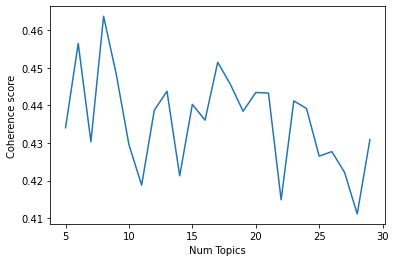

In [25]:
# Show graph
limit=30; start=5; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
#plt.savefig('20240221_PhD_MalletLDALtr-Coherence')
plt.show()

In [26]:
# Print the coherence and perplexity scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, 'Coherence: ', round(cv, 4))

Num Topics = 5 Coherence:  0.4341
Num Topics = 6 Coherence:  0.4565
Num Topics = 7 Coherence:  0.4303
Num Topics = 8 Coherence:  0.4637
Num Topics = 9 Coherence:  0.4483
Num Topics = 10 Coherence:  0.4296
Num Topics = 11 Coherence:  0.4188
Num Topics = 12 Coherence:  0.4387
Num Topics = 13 Coherence:  0.4438
Num Topics = 14 Coherence:  0.4213
Num Topics = 15 Coherence:  0.4403
Num Topics = 16 Coherence:  0.4361
Num Topics = 17 Coherence:  0.4515
Num Topics = 18 Coherence:  0.4456
Num Topics = 19 Coherence:  0.4384
Num Topics = 20 Coherence:  0.4434
Num Topics = 21 Coherence:  0.4433
Num Topics = 22 Coherence:  0.4149
Num Topics = 23 Coherence:  0.4412
Num Topics = 24 Coherence:  0.4392
Num Topics = 25 Coherence:  0.4265
Num Topics = 26 Coherence:  0.4277
Num Topics = 27 Coherence:  0.4222
Num Topics = 28 Coherence:  0.4111
Num Topics = 29 Coherence:  0.4309


In [27]:
# Coherence for 8-topic model
print(coherence_values[3])

# Topics for 8-topic model
malletModel_08a = model_list[3]
model_topics_08a = malletModel_08a.show_topics(formatted=False)
pprint(sorted(malletModel_08a.print_topics(num_words=20)))

# Convert results to lda model format for visualization.
MalletLDA08a = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(malletModel_08a)

# Visualize the topics
pyLDAvis.enable_notebook()
vis08a = pyLDAvis.gensim.prepare(MalletLDA08a, corpus, id2word, sort_topics=False)
vis08a

0.4637315235411022
[(0,
  '0.107*"letter" + 0.075*"time" + 0.026*"day" + 0.026*"month" + '
  '0.025*"friend" + 0.018*"pleasure" + 0.017*"news" + 0.015*"sister" + '
  '0.015*"home" + 0.014*"health" + 0.013*"return" + 0.013*"opportunity" + '
  '0.013*"happiness" + 0.012*"kind" + 0.012*"writing" + 0.011*"manner" + '
  '0.011*"trust" + 0.011*"father" + 0.011*"care" + 0.011*"weather"'),
 (1,
  '0.032*"dollar" + 0.030*"year" + 0.028*"man" + 0.027*"work" + 0.024*"people" '
  '+ 0.022*"money" + 0.019*"business" + 0.018*"country" + 0.015*"cent" + '
  '0.012*"company" + 0.011*"expense" + 0.011*"board" + 0.011*"pay" + '
  '0.010*"month" + 0.009*"government" + 0.009*"wage" + 0.009*"lot" + '
  '0.009*"number" + 0.008*"office" + 0.008*"state"'),
 (2,
  '0.052*"brother" + 0.051*"mother" + 0.051*"friend" + 0.048*"family" + '
  '0.041*"letter" + 0.032*"year" + 0.032*"sister" + 0.030*"health" + '
  '0.027*"child" + 0.026*"son" + 0.025*"death" + 0.025*"wife" + '
  '0.023*"daughter" + 0.018*"uncle" + 0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.277588 -0.043278       1        1  12.553812
1      0.191726 -0.224310       2        1  12.648419
2     -0.299279 -0.063645       3        1  11.925510
3     -0.022796 -0.012987       4        1  13.204408
4      0.006097 -0.039025       5        1  11.643325
5      0.203484 -0.159199       6        1  13.857471
6      0.151334  0.179986       7        1  13.102569
7      0.047022  0.362457       8        1  11.064485, topic_info=        Term         Freq        Total Category  logprob  loglift
11    letter  1151.000000  1151.000000  Default  30.0000  30.0000
57      time  1176.000000  1176.000000  Default  29.0000  29.0000
78      week   584.000000   584.000000  Default  28.0000  28.0000
8        day  1080.000000  1080.000000  Default  27.0000  27.0000
84    friend   577.000000   577.000000  Default  26.0000  26.0000
...      ...          ...          ...      ...      ...      ...
5     church    64.641900   145.690347   Topic8  -4.6786   1.3888
1047  window    42.763103    56.271177   Topic8  -5.0918   1.9269
177     room    63.647409   185.190553   Topic8  -4.6941   1.1334
8        day    70.608844  1080.378982   Topic8  -4.5903  -0.5265
947     call    42.763103    88.701352   Topic8  -5.0918   1.4718

[615 rows x 6 columns], token_table=      Topic      Freq          Term
term                               
28        1  0.280295       account
28        2  0.207626       account
28        3  0.513874       account
677       2  0.952176          acct
186       1  0.980944  acquaintance
...     ...       ...           ...
61        3  0.328789          year
61        4  0.025814          year
61        6  0.320638          year
62        7  0.376138     yesterday
62        8  0.629623     yesterday

[710 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8])

## 3. Lower alpha

In [61]:
def compute_coherence_values(dictionary, corpus, texts, limit, start, step):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for alpha in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=8, id2word=id2word, alpha=alpha, random_seed=100)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [62]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatizedNouns)

# Create Corpus
texts = data_lemmatizedNouns

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [63]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, 
                                                        corpus=corpus, 
                                                        texts=data_lemmatizedNouns, 
                                                        start=1, 
                                                        limit=50, 
                                                        step=4)

Mallet LDA: 8 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.54786
<20> LL/token: -8.21427
<30> LL/token: -8.08068
<40> LL/token: -7.99056

0	0.125	letter book life heart time hand kind year return world friend happiness work darling copy news matter father death thing 
1	0.125	people island land captain water bank school side vessel piece child steamer river kind year sugar passage port table fortune 
2	0.125	letter time friend brother family mother sister child health year wife day son week death home uncle father write daughter 
3	0.125	week day child time home letter baby boy evening night morning girl school yesterday today mother church visit clock store 
4	0.125	time country place winter home summer letter month friend year day people health money business kind account climate world prospect 
5	0.125	country land pound year acre dollar farm money price work wheat cent farmer person bushel crop place house wood market 
6	0.

<360> LL/token: -7.78428
<370> LL/token: -7.7794
<380> LL/token: -7.78087
<390> LL/token: -7.7944

0	0.125	letter heart life book hand friend work husband year sister mind copy world paper death son child flower dollar mother 
1	0.125	people captain child business vessel side war government matter man office school ship bank land steamer island party table interest 
2	0.125	letter time brother friend mother family sister day health home week year child uncle country wife winter month death write 
3	0.125	week child day home time baby boy night letter evening school girl house morning yesterday bed church today brother mother 
4	0.125	time letter day country month place winter health friend home year summer people manner account kind happiness world life thing 
5	0.125	country land pound year acre farm dollar money price wheat place cent crop work house farmer bushel person market wage 
6	0.125	day town morning room night boat tree wood water river time house board place sea hour side r

<740> LL/token: -7.77498

0	0.125	book heart friend life letter child year hand work husband death copy kind mother son woman mind dollar paper girl 
1	0.125	people man business country interest child land family government matter friend war law life city money case party office bank 
2	0.125	letter time brother mother friend family sister day health week year home uncle child month wife write work money son 
3	0.125	week child day time night home evening school baby boy morning house visit girl yesterday bed church today letter island 
4	0.125	letter time day place home month year health country friend summer world happiness winter pleasure people sister return manner thing 
5	0.125	country land pound year acre farm dollar money price work cent wheat crop place person house farmer winter bushel family 
6	0.125	day town boat room morning house water night place side wood tree hour sea river ship board evening land road 
7	0.125	time work man company people day thing gold year horse foo

<80> LL/token: -7.89744
<90> LL/token: -7.88373

0	0.625	book life friend year world hand heart interest work people matter copy business mind paper husband nature gentleman trouble party 
1	0.625	land year pound dollar acre farm country house money cent horse wheat family people farmer price cost work bushel place 
2	0.625	letter time child day mother week daughter girl baby sister friend night news kind life house father aunt heart weather 
3	0.625	week day child home school evening church boy morning today yesterday time store house town tomorrow vessel visit tea brother 
4	0.625	letter time friend brother family sister health year home month write summer mother country money wife place day winter son 
5	0.625	country month winter crop person summer garden spring business place wage time seed state pound expense potato provision climate employment 
6	0.625	day place time town morning board wood boat river water ship weather sea side night tree room house home evening 
7	0.625	work r


0	0.625	book life work year friend hand interest paper heart son copy matter mind husband people business world trouble comfort child 
1	0.625	land pound dollar acre farm year country money cent price wheat house work day crop farmer bushel wage family cost 
2	0.625	letter time day week friend sister child baby mother girl kind month home thing heart father news night daughter weather 
3	0.625	week child school day church evening today boy house bed visit home island yesterday morning brother night tea girl store 
4	0.625	letter time brother family friend mother sister health home day country year uncle month winter summer son wife answer money 
5	0.625	country person people winter time year month summer place spring business climate man manner seed state garden opinion employment deal 
6	0.625	day town room morning place time water boat wood hour side house tree evening sea home board road night weather 
7	0.625	work time man day company thing people night home place gold year lot fi

<810> LL/token: -7.82696
<820> LL/token: -7.82303
<830> LL/token: -7.82235
<840> LL/token: -7.82839

0	0.625	life book work friend heart year interest hand mind child copy people world paper husband son trouble age matter power 
1	0.625	land pound country acre year farm dollar money work price cent wheat crop house farmer bushel family day wage board 
2	0.625	letter time day girl friend week kind mother night baby sister child weather woman flower thing daughter home news month 
3	0.625	week child school day evening bed church today boy house room morning island home tea brother night town visit store 
4	0.625	letter time brother family mother friend sister year home health day uncle winter week son wife cousin father month country 
5	0.625	country time people winter summer month place year business person health letter home manner climate situation state heat friend difficulty 
6	0.625	day town morning house side water wood boat room place tree river sea road evening night board ship 

<160> LL/token: -7.86317
<170> LL/token: -7.86566
<180> LL/token: -7.8651
<190> LL/token: -7.86101

0	1.125	letter time girl baby heart sister night friend hand book world return news darling care week life kind father boy 
1	1.125	country land pound year acre dollar farm money cent crop price person wheat place kind farmer market bushel wood people 
2	1.125	child family mother house year health uncle week daughter aunt son wife kind winter husband dollar doctor brother death paper 
3	1.125	week day evening child morning school church home town night yesterday clock island boat side today visit hour dinner house 
4	1.125	letter time brother friend home sister country day health year mother write money week account answer month place opportunity line 
5	1.125	day work time woman foot board room house bed company water man sea head thing mind provision hand gold eye 
6	1.125	work people life year man business interest book friend matter difficulty copy country case party nature home char

<510> LL/token: -7.84599
<520> LL/token: -7.84301
<530> LL/token: -7.8483
<540> LL/token: -7.84764

0	1.125	letter heart girl baby time kind friend sister book night child life hand week darling world care room day mother 
1	1.125	country land pound year acre farm dollar money cent crop price wheat place person farmer market bushel house wood month 
2	1.125	family child year son daughter friend uncle aunt wife mother death health day life kind doctor paper winter house week 
3	1.125	week day evening morning child home church town school yesterday night today clock boy island boat captain dinner house tea 
4	1.125	letter time brother sister friend mother home day write week answer money place health year month father country cousin news 
5	1.125	day time work water house board woman room sea foot thing lot night company people head ship gold man hour 
6	1.125	people year work life man business country book interest friend state case world home difficulty matter office hand government pl

<860> LL/token: -7.85225
<870> LL/token: -7.8438
<880> LL/token: -7.83854
<890> LL/token: -7.84148

0	1.125	letter heart book friend girl life child hand kind sister husband mind copy woman paper death room darling baby time 
1	1.125	country land pound year acre dollar farm money cent crop price place wheat person farmer market house bushel wood work 
2	1.125	family child son year daughter health mother uncle wife friend aunt kind day house winter doctor death trouble week work 
3	1.125	week day evening child morning church school yesterday town night home clock boy island today house captain dinner tea mail 
4	1.125	letter time brother sister home friend mother write month week country money work year answer place day health line news 
5	1.125	day water time boat foot thing woman board house room night ship people horse man head bed sea land gold 
6	1.125	people year work man business country interest home life time matter world company place state month gentleman government case mind

<210> LL/token: -7.82721
<220> LL/token: -7.82249
<230> LL/token: -7.82923
<240> LL/token: -7.82353

0	1.625	book hand heart life interest world copy work spirit anxiety room paper fear letter thing nature writing woman eye mind 
1	1.625	country land pound year acre dollar farm money work place cent crop price wheat house winter farmer market bushel summer 
2	1.625	family friend year child son death mother wife husband uncle health kind life trouble dollar money daughter work sister aunt 
3	1.625	child week day home evening morning house boy school town visit today yesterday church time return island night tomorrow store 
4	1.625	letter time brother sister month friend health home winter mother write news place year day summer father answer cousin country 
5	1.625	day time week girl baby weather night thing work letter bed snow head home boy mine house flower garden woman 
6	1.625	country people day time place wood person man business state year road bank town climate side land river m

<570> LL/token: -7.8055
<580> LL/token: -7.80746
<590> LL/token: -7.80851

0	1.625	book life hand heart work letter mind interest copy world thing spirit paper care woman sorrow room nature husband fear 
1	1.625	country land pound year acre dollar farm money work crop cent price wheat place farmer winter market potato bushel horse 
2	1.625	family friend child mother brother year son death wife sister health daughter uncle kind house aunt life money husband father 
3	1.625	week day child school evening morning town home church yesterday today boy visit island mail house clock night tomorrow spirit 
4	1.625	letter time day month sister friend winter health write news place home summer year country pleasure father happiness spring weather 
5	1.625	time week day letter girl baby work night home thing snow place month mother weather mine kind head change friend 
6	1.625	country people man year business place time state person land wood road end tree company river month government town idea 

<910> LL/token: -7.83577
<920> LL/token: -7.83033
<930> LL/token: -7.82432
<940> LL/token: -7.8262

0	1.625	book heart hand life work kind child copy paper husband interest trial spirit mind world sorrow age nature fear flower 
1	1.625	country land pound year acre farm dollar money work cent crop price wheat place farmer market potato bushel winter horse 
2	1.625	family brother friend year mother health letter child wife sister son death daughter uncle winter father summer house money home 
3	1.625	week child day evening home school morning church town house today yesterday tea clock visit island boy dinner mail night 
4	1.625	letter time day month friend place sister winter weather pleasure health summer happiness home country opportunity return father kind manner 
5	1.625	time letter week girl day baby night work mother home boy friend thing dollar news trouble bed woman rest lot 
6	1.625	people country year man place business time state home person land government town office side f

<260> LL/token: -7.82622
<270> LL/token: -7.82356
<280> LL/token: -7.82507
<290> LL/token: -7.82162

0	2.125	letter girl baby sister week night time thing woman boy home day spirit hand care picture darling visit writing news 
1	2.125	country land year pound acre dollar farm money crop price place cent wheat person house farmer market bushel horse wage 
2	2.125	day week child morning house evening bed town church room night yesterday school water today hour clock home fire island 
3	2.125	life book heart friend child work year husband mind interest hand kind world death paper copy son trial sorrow matter 
4	2.125	work time day month snow thing home store lot captain week pay man people pork account mind mine company winter 
5	2.125	time letter day place month country winter health weather friend summer people happiness return pleasure year manner home garden kind 
6	2.125	man people boat day side town place office river sea bank ship number board government business company state end b

<620> LL/token: -7.81371
<630> LL/token: -7.81623
<640> LL/token: -7.81953

0	2.125	letter time girl day sister baby night week thing mother woman hand boy dollar picture darling visit writing daughter home 
1	2.125	country land pound year acre farm dollar money cent crop price place wheat person house farmer bushel wood market wage 
2	2.125	week child morning day house evening school church town bed room yesterday night home today clock island boy spirit dinner 
3	2.125	life book friend year work heart child interest world hand husband paper mind trouble copy trial matter power age sorrow 
4	2.125	work time day month people home water store thing business man foot week pay city place lot head company snow 
5	2.125	letter time day place month friend winter summer health country pleasure home weather happiness year return garden manner kind spring 
6	2.125	people day man boat river side place office hour country sea water bank number board government tree road person rest 
7	2.125	broth

<980> LL/token: -7.83173
<990> LL/token: -7.84247

0	2.125	letter girl time week baby mother day night sister woman dollar picture boy home thing fire death writing visit room 
1	2.125	country land pound year dollar acre farm money cent crop price wheat person place market farmer bushel wage wood family 
2	2.125	week child school church day evening town morning house night home room bed boy today yesterday clock mail island dinner 
3	2.125	life book heart hand work friend year interest business paper trouble world copy case mind trial husband matter anxiety son 
4	2.125	work time day people thing man home pay year lot water place month house company gold snow foot deal mine 
5	2.125	time letter day month winter place friend summer home health weather happiness people opportunity return country garden kind manner pleasure 
6	2.125	day place side people town boat water river country tree wood road sea man bank morning office city house board 
7	2.125	brother family letter friend mother s

<310> LL/token: -7.81653
<320> LL/token: -7.81682
<330> LL/token: -7.80801
<340> LL/token: -7.81566

0	2.625	letter time brother family friend home sister mother health month year son death day uncle wife write aunt answer news 
1	2.625	land pound country year dollar acre farm money cent crop price wheat work wood person farmer house market potato tree 
2	2.625	child week girl boy room house baby night mother day bed thing doctor school trouble woman daughter table visit paper 
3	2.625	day morning town week evening church night house home today yesterday time place clock boat side island dinner hour tea 
4	2.625	country people year winter month place business summer man time state climate home government war prospect person world difficulty town 
5	2.625	letter time heart friend life kind father pleasure manner happiness sister place health flower world year return trust spirit husband 
6	2.625	book work hand mind life interest friend copy rest hour party matter nature term office expe

<670> LL/token: -7.80456
<680> LL/token: -7.80769
<690> LL/token: -7.81146

0	2.625	letter brother family time mother friend sister health home son winter year uncle write child aunt wife answer summer cousin 
1	2.625	land pound country year dollar acre farm money cent crop price house wheat place kind person farmer market potato bushel 
2	2.625	child week boy girl night baby bed room day school today thing house trouble mother visit kind yesterday weather doctor 
3	2.625	day morning evening town church home house night place clock wood side boat island captain sea dinner return hour tree 
4	2.625	country people year winter summer man state month time business world climate place home difficulty government town war day idea 
5	2.625	letter time day friend heart place kind sister month father life happiness flower care health husband year return manner darling 
6	2.625	life book work hand interest friend paper home mind copy spirit business rest power case city matter son nature term 
7

Mallet LDA: 8 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.77414
<20> LL/token: -8.3113
<30> LL/token: -8.12001
<40> LL/token: -8.02609

0	3.125	letter time day week month write girl baby home night sister opportunity news happiness writing thing head darling picture leave 
1	3.125	country land year pound dollar acre money farm price lot man work wheat place bushel cost wage foot house tree 
2	3.125	friend brother family letter mother health sister year time son wife daughter death husband child father uncle home winter summer 
3	3.125	child evening morning night bed home room yesterday week today boy visit clock fear trouble book weather school mother tomorrow 
4	3.125	country town people person cent crop month day winter house account church business ship expense farmer number captain pork time 
5	3.125	time day thing kind place garden flower weather winter people return horse letter tea summer deal dinner snow tree kindness 

<360> LL/token: -7.79849
<370> LL/token: -7.78879
<380> LL/token: -7.78966
<390> LL/token: -7.79319

0	3.125	letter time home sister friend news month write girl pleasure mother week opportunity return year place happiness father picture writing 
1	3.125	land year pound country dollar acre money farm work house crop price wheat farmer market potato cost bushel horse wage 
2	3.125	brother family friend health mother child time letter wife sister daughter death son winter uncle aunt cousin year summer father 
3	3.125	week child boy day bed baby night room house evening yesterday school today morning girl visit clock home church island 
4	3.125	country people person month business state place account situation expense servant number war prospect heat town opinion employment field neighbourhood 
5	3.125	day weather town time winter thing summer garden snow tree place spring wood house month dinner rain manner lady people 
6	3.125	day time water man side river company home hour place head p

<710> LL/token: -7.79245
<720> LL/token: -7.79369
<730> LL/token: -7.78854
<740> LL/token: -7.79465

0	3.125	letter time home sister friend news month day place week write girl mother opportunity father pleasure happiness return writing picture 
1	3.125	country land year pound dollar acre farm money work cent house crop price wheat horse farmer board market cost bushel 
2	3.125	brother family friend mother health child year wife sister letter son daughter death uncle aunt time winter summer cousin money 
3	3.125	week child day bed baby night boy school visit room today girl evening morning house church yesterday island tomorrow clock 
4	3.125	country people person business place state time servant expense home case month account difficulty party mind situation government employment meeting 
5	3.125	day town weather winter house time month thing snow summer place manner wood tree spring home garden hand room health 
6	3.125	day water side man river company boat time morning hour ship pe

<60> LL/token: -7.90868
<70> LL/token: -7.88614
<80> LL/token: -7.88464
<90> LL/token: -7.8674

0	3.625	letter time day month place summer thing news winter write weather father kind sister flower friend picture health happiness darling 
1	3.625	house town thing room man tea store pork island school captain vessel table servant side spirit door board difficulty people 
2	3.625	brother family friend letter mother sister health time year son death wife child daughter uncle cousin home father winter aunt 
3	3.625	week child home boy baby girl day bed today paper visit school mother mail mind fear yesterday tomorrow evening snow 
4	3.625	country dollar work time place people month day cent person summer business company lot number ship water city year account 
5	3.625	country land pound year acre farm money crop price wood wheat winter farmer market potato bushel wage seed tree horse 
6	3.625	day night morning hour evening church home head water river clock place end side dinner room week 

<410> LL/token: -7.7959
<420> LL/token: -7.8027
<430> LL/token: -7.79571
<440> LL/token: -7.79562

0	3.625	letter time day month friend place sister winter news summer weather home opportunity health happiness father writing picture write thing 
1	3.625	house room thing town tea man store fire island table captain vessel door woman people servant water window gold call 
2	3.625	brother family letter mother friend sister health time wife child son year daughter death uncle aunt cousin father life winter 
3	3.625	week child day boy home girl baby night bed visit school today mail morning yesterday evening mother head snow tomorrow 
4	3.625	work people country time day month business man cent state year money place company person dollar board city reason summer 
5	3.625	country land pound year acre farm dollar money price crop winter wheat place house farmer market potato bushel spring wage 
6	3.625	day hour morning church night place time town water river evening side home tree boat wood

<760> LL/token: -7.78446
<770> LL/token: -7.7864
<780> LL/token: -7.78548
<790> LL/token: -7.78549

0	3.625	letter time day month home news winter friend summer place health pleasure sister write return happiness weather trust manner opportunity 
1	3.625	room house water tea thing fire woman table store captain town horse vessel door pork bed gold foot people window 
2	3.625	brother letter family friend mother sister time health child wife son daughter winter uncle year aunt death home father cousin 
3	3.625	week child day girl boy night baby mother bed today school mail visit home yesterday thing evening morning trouble change 
4	3.625	people work country man time business year day place month company city case state government person home party provision opinion 
5	3.625	country land pound year dollar acre farm money cent price crop wheat place farmer market potato bushel person house wage 
6	3.625	day town morning church side place river evening night hour boat board home wood tree 

<110> LL/token: -7.85629
<120> LL/token: -7.86196
<130> LL/token: -7.84995
<140> LL/token: -7.84453

0	4.125	letter time day month girl week baby weather thing news pleasure sister home night happiness write picture return opportunity darling 
1	4.125	pound land dollar acre farm country money work cent price horse house year wheat farmer cost market bushel board water 
2	4.125	friend mother family year sister letter son kind death daughter paper health husband father hand change wife place house life 
3	4.125	day town morning evening house week church home night side time yesterday place water river clock island captain dinner tomorrow 
4	4.125	brother time week child home letter winter school uncle aunt work health account cousin snow summer trouble day wife money 
5	4.125	country year place people summer person month winter land spring state crop wood tree business money climate kind government seed 
6	4.125	hour man people day work company life time hand woman account fear sea rest 

<460> LL/token: -7.79423
<470> LL/token: -7.79822
<480> LL/token: -7.79427
<490> LL/token: -7.78309

0	4.125	letter time day month health news weather friend home pleasure thing place return happiness write spring summer sister girl darling 
1	4.125	pound dollar land acre farm year work money cent price wheat house farmer market pork bushel cost foot potato wage 
2	4.125	friend mother family brother year sister letter son death wife health kind daughter paper husband father money house life dollar 
3	4.125	day town morning evening house church home place water night bed clock hour side yesterday island boat tree river captain 
4	4.125	week child time day home winter baby school boy girl uncle aunt cousin letter store snow work trouble today brother 
5	4.125	country year people place land summer winter person state crop month climate wood respect situation money government business war difficulty 
6	4.125	time hand man people business thing company interest account city office lot night

<810> LL/token: -7.79493
<820> LL/token: -7.78987
<830> LL/token: -7.79439
<840> LL/token: -7.79666

0	4.125	letter time day month thing summer home news weather winter pleasure health write friend happiness place return trust opportunity spring 
1	4.125	pound land country dollar acre farm money work year cent crop price wheat house farmer market potato cost bushel foot 
2	4.125	friend letter brother family mother sister year health son kind death wife daughter father house dollar answer account life money 
3	4.125	day morning town evening house room bed night water church place side boat clock dinner sea road hour tea river 
4	4.125	week child time day boy home girl baby school aunt cousin winter today store visit night snow write yesterday doctor 
5	4.125	country year people place land person state summer business situation man month climate winter case government money war world number 
6	4.125	time work day man mind city company home people hand office business reason interest hour

<160> LL/token: -7.78781
<170> LL/token: -7.78908
<180> LL/token: -7.77928
<190> LL/token: -7.77257

0	4.625	letter time month news baby day thing sister return write home pleasure friend weather happiness opportunity girl flower father writing 
1	4.625	people man year business thing head situation work pay expense difficulty government money captain lot number state law city case 
2	4.625	friend brother mother family child letter health sister year son death wife daughter husband uncle kind aunt cousin life father 
3	4.625	hand book heart life mind world interest work spirit paper trouble age matter copy trial rest power year anxiety fear 
4	4.625	time day winter home week country summer work place month house people account store snow doctor town respect reason spring 
5	4.625	country land pound dollar year acre farm money person cent crop price place wheat farmer market cost bushel kind foot 
6	4.625	day evening town morning church yesterday side place company boat weather river woo

<510> LL/token: -7.76055
<520> LL/token: -7.76919
<530> LL/token: -7.76779
<540> LL/token: -7.76485

0	4.625	letter time day friend home pleasure news month health sister place opportunity happiness thing writing trust return darling write weather 
1	4.625	people country year man business state company city difficulty month government case party side fact office rate expense gold character 
2	4.625	brother mother friend letter family child sister son health death wife daughter uncle aunt kind father year cousin money write 
3	4.625	life book heart hand world work mind interest spirit paper matter dollar husband trouble copy trial anxiety woman sorrow care 
4	4.625	time home winter day week summer work month place year account spring store snow weather country change trouble house rest 
5	4.625	land country pound year dollar acre farm money cent crop price wheat place person farmer board market work potato bushel 
6	4.625	day town morning church house evening river boat place hour tree 

<860> LL/token: -7.7725
<870> LL/token: -7.76996
<880> LL/token: -7.76409
<890> LL/token: -7.77533

0	4.625	letter time friend pleasure news month health sister thing opportunity father place write home happiness return day writing trust weather 
1	4.625	people year man country business state company difficulty city government money office gold interest war law fortune bank meeting matter 
2	4.625	letter brother mother friend family child sister health son wife death daughter year uncle aunt cousin kind doctor father answer 
3	4.625	life hand book heart work mind world paper spirit husband copy dollar trial age anxiety pen interest kind sorrow change 
4	4.625	time day home winter month summer place work week country spring snow account weather lot house change rain prospect deal 
5	4.625	country land pound dollar year acre farm money cent crop price person wheat farmer market horse bushel foot wage cost 
6	4.625	day town water house morning evening river hour boat night tree church sid

<210> LL/token: -7.79776
<220> LL/token: -7.79123
<230> LL/token: -7.78554
<240> LL/token: -7.78456

0	5.125	letter time day write place month news weather health friend pleasure opportunity sister happiness flower return girl home trust father 
1	5.125	country land pound dollar acre farm money year cent price wheat place horse board house wood farmer tree market bushel 
2	5.125	friend mother brother family child sister letter health son death wife daughter husband uncle aunt year cousin paper kind father 
3	5.125	day morning week town evening church side yesterday home today mail clock island spirit captain dinner tomorrow school fall boat 
4	5.125	time year winter home week summer month work country spring money account crop kind school snow store trouble thing respect 
5	5.125	people man business work person place country company year day state time climate ship government seed reason city office road 
6	5.125	hand book life world heart interest mind comfort matter idea copy care re

<560> LL/token: -7.76431
<570> LL/token: -7.76776
<580> LL/token: -7.77453
<590> LL/token: -7.76676

0	5.125	letter time day write news place month friend health pleasure sister weather happiness flower writing opportunity picture trust care return 
1	5.125	land country pound year dollar acre farm money cent crop price wheat board person place farmer market cost bushel horse 
2	5.125	brother mother child family friend letter sister son health death wife year daughter uncle father kind aunt paper cousin dollar 
3	5.125	day town morning evening church side yesterday home mail place clock house boat wood hour island river week captain dinner 
4	5.125	time week home winter day summer month account country school money thing work year spring store snow trouble deal change 
5	5.125	people man country business year place work city company state month kind person time reason climate government party mine opinion 
6	5.125	life book hand heart work mind world interest friend matter spirit copy h

<910> LL/token: -7.76987
<920> LL/token: -7.76334
<930> LL/token: -7.7577
<940> LL/token: -7.75552

0	5.125	letter time news friend month place pleasure return kind happiness day father life write sister manner writing trust picture home 
1	5.125	country land pound year acre dollar farm money cent crop price house wheat person farmer market place bushel work potato 
2	5.125	friend brother mother family child letter year sister health son death wife daughter uncle aunt cousin kind dollar father answer 
3	5.125	day town evening morning church side boat night house place clock river home water hour ship wood tree island board 
4	5.125	time week day home winter summer month baby money account thing school work spring store weather snow trouble change write 
5	5.125	people country man year business place state city month time work company reason government kind gold opinion climate meeting fact 
6	5.125	life hand book heart mind world work paper spirit interest matter copy trouble husband t

<260> LL/token: -7.76655
<270> LL/token: -7.76549
<280> LL/token: -7.77753
<290> LL/token: -7.7701

0	5.625	time home year people thing day man business month city store company fire leave lot letter government war party snow 
1	5.625	country land pound year dollar acre money farm cent price wheat person house place foot farmer market cost bushel family 
2	5.625	letter time brother mother sister friend family health father wife daughter write news uncle son answer cousin month aunt opportunity 
3	5.625	life friend heart year world child husband hand interest death mind trouble age matter change rest family son loss power 
4	5.625	week child house boy room bed night baby school church visit day town today girl morning island tea yesterday evening 
5	5.625	winter country day time summer month weather spring place tree crop home road garden kind wood town fall potato return 
6	5.625	day place water side hour spirit morning night evening boat river ship captain end dinner sea person board 

<630> LL/token: -7.73641
<640> LL/token: -7.73791

0	5.625	people time year man home business place thing day money city company month fire mail government war lot party gold 
1	5.625	country land pound year acre farm dollar money cent crop person price house wheat work farmer market bushel foot wage 
2	5.625	letter time brother mother sister friend health family father write news wife daughter uncle aunt answer month son cousin return 
3	5.625	friend life year heart world child husband hand interest death trouble account family age matter change son mind kind care 
4	5.625	week child day boy house home baby school visit room night bed girl thing today store yesterday island church tomorrow 
5	5.625	time day winter summer country month place home town spring weather garden account manner pleasure happiness deal rain road attention 
6	5.625	day morning water night side evening hour river boat place clock ship board captain dinner church sea return vessel wood 
7	5.625	work book paper ki

<990> LL/token: -7.78658

0	5.625	people time man year business country work place city home company money month lot government day party gold mine fact 
1	5.625	country land pound year dollar acre farm money cent crop person price house wheat work farmer market potato cost bushel 
2	5.625	letter brother mother time friend sister family health wife write uncle father daughter aunt answer son news year cousin death 
3	5.625	friend life heart world year trouble husband interest hand home change care child case rest account matter death son mind 
4	5.625	week child boy day baby school house home visit night bed today girl store room evening yesterday morning church island 
5	5.625	time day letter winter month summer place home weather country account happiness spring health garden town manner trust return attention 
6	5.625	day water town night hour morning side boat board tree house river clock wood room evening end ship captain road 
7	5.625	work book thing kind paper girl woman hand le

<310> LL/token: -7.76658
<320> LL/token: -7.77129
<330> LL/token: -7.76447
<340> LL/token: -7.76631

0	6.125	letter time day month place winter home pleasure summer weather opportunity country health manner happiness write writing sister flower darling 
1	6.125	board side people man place river company boat water wood tree difficulty road ship climate captain sea government vessel bank 
2	6.125	brother mother friend family letter sister health year son death wife child daughter time uncle aunt father kind cousin answer 
3	6.125	day night week home morning girl evening baby yesterday boy visit today news return mail clock weather time leave hour 
4	6.125	house week day child town room bed school winter church boy store tea account half island building door lot horse 
5	6.125	country land pound year dollar acre farm money cent crop price person wheat farmer market potato bushel spring state wage 
6	6.125	life hand book heart world interest friend mind spirit husband trouble business woma

<660> LL/token: -7.77786
<670> LL/token: -7.77814
<680> LL/token: -7.77114
<690> LL/token: -7.78464

0	6.125	letter time day month winter place pleasure news friend home country summer thing manner happiness opportunity health weather trust garden 
1	6.125	day people country place side man river company boat water wood tree ship office captain state sea person board government 
2	6.125	brother mother family letter friend sister child health year son death wife daughter uncle aunt time cousin write father kind 
3	6.125	week day night home morning evening girl baby visit yesterday boy weather today mail return hour time tomorrow rain change 
4	6.125	house child week day room town bed school church boy account store tea spirit island head dinner door deal trouble 
5	6.125	country land year pound dollar acre farm money cent crop price wheat person farmer potato market bushel winter summer place 
6	6.125	life book heart hand world year interest friend mind matter husband paper copy rest tro

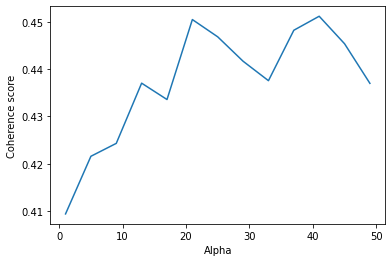

In [65]:
# Show graph
limit=50; start=1; step=4;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Alpha")
plt.ylabel("Coherence score")
#plt.savefig('20240221_PhD_MalletLDALtr-Coherence')
plt.show()

In [67]:
# Print the coherence and perplexity scores
for m, cv in zip(x, coherence_values):
    print("Alpha =", m, 'Coherence: ', round(cv, 4))

Alpha = 1 Coherence:  0.4094
Alpha = 5 Coherence:  0.4216
Alpha = 9 Coherence:  0.4243
Alpha = 13 Coherence:  0.437
Alpha = 17 Coherence:  0.4336
Alpha = 21 Coherence:  0.4505
Alpha = 25 Coherence:  0.4468
Alpha = 29 Coherence:  0.4417
Alpha = 33 Coherence:  0.4376
Alpha = 37 Coherence:  0.4482
Alpha = 41 Coherence:  0.4512
Alpha = 45 Coherence:  0.4454
Alpha = 49 Coherence:  0.437


## 4. Optimize hyperparameters

In [46]:
def compute_coherence_values(dictionary, corpus, texts, limit, start, step):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word, optimize_interval=250, random_seed=100)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [47]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatizedNouns)

# Create Corpus
texts = data_lemmatizedNouns

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [48]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, 
                                                        corpus=corpus, 
                                                        texts=data_lemmatizedNouns, 
                                                        start=5, 
                                                        limit=30, 
                                                        step=1)

Mallet LDA: 5 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.62746
<20> LL/token: -8.26451
<30> LL/token: -8.05247
<40> LL/token: -7.94716

0	10	day time morning thing room night town water home place hour people evening week yesterday boat side end clock fire 
1	10	day winter house time home school church letter place week weather deal spring month head manner today garden snow tea 
2	10	child time mother letter week brother health girl sister friend write wife baby month trouble aunt kind cousin pleasure boy 
3	10	country year land pound dollar money acre farm man person place work people cent crop foot price wheat lot number 
4	10	letter friend time life family book heart sister world paper year husband son home father hand work health kind death 

<50> LL/token: -7.88391
<60> LL/token: -7.83222
<70> LL/token: -7.80776
<80> LL/token: -7.78584
<90> LL/token: -7.76746

0	10	day time night thing morning room water town side hour 

<560> LL/token: -7.7965
<570> LL/token: -7.79279
<580> LL/token: -7.78712
<590> LL/token: -7.78455

0	8.14781	day water town house side hour people time place morning river night company boat man road tree room foot work 
1	9.13094	day week child time weather thing night girl boy school baby church house visit home yesterday evening bed morning today 
2	9.82449	letter time friend brother mother sister family health home month summer place father wife winter write news kind year daughter 
3	7.91613	country land year pound money dollar acre farm person cent crop work price place wheat board month state people farmer 
4	8.4074	life book hand heart year work husband friend people mind business paper world interest child kind matter copy woman trouble 

<600> LL/token: -7.7861
<610> LL/token: -7.7883
<620> LL/token: -7.79985
<630> LL/token: -7.79799
<640> LL/token: -7.79474

0	8.14781	day house water time town place side morning man night people hour river boat company home fire ship road t


0	8.33333	year friend work hand life summer people paper home care mind interest pleasure opportunity time rest heart health comfort matter 
1	8.33333	letter time mother sister friend brother health month home father death wife family girl daughter news son kind husband world 
2	8.33333	dollar money house work pound family man board business kind cent price year time brother day place store city number 
3	8.33333	day morning night book weather room hour woman place evening town house fear water side flower head end age return 
4	8.33333	week child day time school thing church baby boy winter uncle cousin bed home today write trouble snow mail aunt 
5	8.33333	country land year acre farm place person wood pound winter month horse river people wheat road spring tree state difficulty 

<100> LL/token: -7.8073
<110> LL/token: -7.79061
<120> LL/token: -7.78057
<130> LL/token: -7.76768
<140> LL/token: -7.76146

0	8.33333	year life hand book people work pleasure mind heart friend paper care i

<540> LL/token: -7.82993
type: 2824 new topic: 4
5:3 
java.lang.ArrayIndexOutOfBoundsException: Index 1 out of bounds for length 1
	at cc.mallet.topics.WorkerRunnable.sampleTopicsForOneDoc(WorkerRunnable.java:552)
	at cc.mallet.topics.WorkerRunnable.run(WorkerRunnable.java:275)
	at java.base/java.util.concurrent.Executors$RunnableAdapter.call(Executors.java:577)
	at java.base/java.util.concurrent.FutureTask.run(FutureTask.java:317)
	at java.base/java.util.concurrent.ThreadPoolExecutor.runWorker(ThreadPoolExecutor.java:1144)
	at java.base/java.util.concurrent.ThreadPoolExecutor$Worker.run(ThreadPoolExecutor.java:642)
	at java.base/java.lang.Thread.run(Thread.java:1623)
type: 2819 new topic: 5
1:3 
java.lang.ArrayIndexOutOfBoundsException: Index 1 out of bounds for length 1
	at cc.mallet.topics.WorkerRunnable.sampleTopicsForOneDoc(WorkerRunnable.java:552)
	at cc.mallet.topics.WorkerRunnable.run(WorkerRunnable.java:275)
	at java.base/java.util.concurrent.Executors$RunnableAdapter.call(Exe

type: 5151 new topic: 4
5:769 
java.lang.ArrayIndexOutOfBoundsException: Index 1 out of bounds for length 1
	at cc.mallet.topics.WorkerRunnable.sampleTopicsForOneDoc(WorkerRunnable.java:552)
	at cc.mallet.topics.WorkerRunnable.run(WorkerRunnable.java:275)
	at java.base/java.util.concurrent.Executors$RunnableAdapter.call(Executors.java:577)
	at java.base/java.util.concurrent.FutureTask.run(FutureTask.java:317)
	at java.base/java.util.concurrent.ThreadPoolExecutor.runWorker(ThreadPoolExecutor.java:1144)
	at java.base/java.util.concurrent.ThreadPoolExecutor$Worker.run(ThreadPoolExecutor.java:642)
	at java.base/java.lang.Thread.run(Thread.java:1623)
type: 5685 new topic: 2
1:768 
java.lang.ArrayIndexOutOfBoundsException: Index 1 out of bounds for length 1
	at cc.mallet.topics.WorkerRunnable.sampleTopicsForOneDoc(WorkerRunnable.java:552)
	at cc.mallet.topics.WorkerRunnable.run(WorkerRunnable.java:275)
	at java.base/java.util.concurrent.Executors$RunnableAdapter.call(Executors.java:577)
	at 

<570> LL/token: -7.82412
<580> LL/token: -7.82915
<590> LL/token: -7.8238

0	6.87852	life book heart hand world work year friend husband interest death mind paper trouble rest people matter kind age copy 
1	8.54979	letter time friend brother mother sister family health home month winter summer father year daughter kind write news account son 
2	6.378	work people man month dollar business cent time day company money city board thing pay water foot provision war year 
3	6.98296	day town morning house place time church room evening side night home water weather tree clock hour river wood sea 
4	7.64189	week child day girl boy bed night baby home school uncle thing visit aunt house today snow doctor island change 
5	6.31048	country land year pound acre farm money dollar person crop price place wheat farmer horse winter bushel wood spring market 

<600> LL/token: -7.81779
<610> LL/token: -7.82398
<620> LL/token: -7.8225
<630> LL/token: -7.83119
<640> LL/token: -7.83765

0	6.87852	life book 

Mallet LDA: 7 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.80398
<20> LL/token: -8.37414
<30> LL/token: -8.13504
<40> LL/token: -8.02351

0	7.14286	child friend letter book heart hand life death husband mind paper mother work trouble care age darling matter copy eye 
1	7.14286	time home place people business world return day life letter sister year manner happiness man friend month company account fear 
2	7.14286	day work week people time town month head thing kind water store garden pork island woman door paper lady foot 
3	7.14286	letter time day mother weather night winter girl week news month room write pleasure baby opportunity home visit snow child 
4	7.14286	country land pound year dollar place acre farm money person tree wood crop price horse river house road lot market 
5	7.14286	brother family health year sister friend summer winter letter kind uncle child aunt wife father cousin home son daughter wheat 
6	7.14286	mor

<410> LL/token: -7.86555
<420> LL/token: -7.87284
<430> LL/token: -7.8906
<440> LL/token: -7.8826

0	6.53118	life book hand heart work paper mind friend husband child world copy spirit care rest kind age loss woman anxiety 
1	6.68504	people year country business man place time state company home month interest world difficulty city gentleman government party reason account 
2	6.58148	week day time work house child thing girl water boy store tea bed head snow woman night fire room deal 
3	7.11516	letter time day month week news baby weather pleasure home write sister girl father friend opportunity happiness winter visit night 
4	6.31368	country land pound dollar year acre farm money cent price crop person wheat place work wood winter farmer market potato 
5	6.80624	brother family mother friend child health sister letter year home wife daughter son death uncle winter aunt cousin summer money 
6	6.40257	day morning town evening church house room night hour place boat clock side yesterday 

<810> LL/token: -7.92247
<820> LL/token: -7.9225
<830> LL/token: -7.93605
<840> LL/token: -7.93926

0	5.00275	life book heart hand work mind husband world paper copy child friend spirit death trial age woman sorrow matter anxiety 
1	5.24564	people country year man business work place time company money city home government interest office party gold month case state 
2	5.41558	week child night day baby boy bed school thing room today girl store morning visit evening yesterday island tea mail 
3	6.71541	letter time day month home winter friend place weather health pleasure news summer return opportunity happiness kind write sister country 
4	4.83495	land country pound acre farm dollar year money cent price wheat crop work house person market farmer potato bushel wood 
5	5.98176	brother mother family letter friend sister year child wife health time son daughter home uncle father aunt death cousin kind 
6	5.08368	day town water morning house place side boat night evening tree hour time ch

<210> LL/token: -7.77128
<220> LL/token: -7.77133
<230> LL/token: -7.7777
<240> LL/token: -7.77456

0	6.25	letter time day write news month account weather friend pleasure thing opportunity place happiness comfort manner writing picture darling fire 
1	6.25	dollar money year pound cent man lot country month board cost pay expense government work property number cow gold provision 
2	6.25	friend brother mother family health sister letter year son father death wife child daughter uncle answer aunt cousin kind husband 
3	6.25	hand book heart life paper mind work trouble kind interest fear age matter world copy woman trial power anxiety return 
4	6.25	time people day winter work summer home place country month business state city town man snow thing rest situation reason 
5	6.25	country land year acre farm wood pound crop horse wheat place person house kind foot farmer spring market potato tree 
6	6.25	day morning house hour town water night side company evening boat room return river end 

<560> LL/token: -7.93312
<570> LL/token: -7.94224
<580> LL/token: -7.94836
<590> LL/token: -7.9487

0	5.83451	letter time day month friend health sister news write pleasure kind home return happiness opportunity place trust writing weather care 
1	4.63786	man work people year business company board month city government lot cent gold money good fact provision luggage thousand war 
2	5.81293	brother mother family friend child letter sister health wife year home son daughter uncle death father aunt kind cousin money 
3	4.96024	life book heart hand mind work friend husband paper world copy woman interest matter spirit power sorrow age flower trial 
4	5.53021	time country winter summer day year home people place week month work snow state town weather person reason climate account 
5	4.46385	land country pound acre farm dollar year money price crop wheat farmer market bushel horse house person wage place cent 
6	5.04709	day house water town morning hour night side boat room tree evening wo

<910> LL/token: -7.9598
<920> LL/token: -7.96233
<930> LL/token: -7.94641
<940> LL/token: -7.94845

0	5.45191	letter time day month friend news place weather pleasure health return home opportunity happiness write sister darling father writing trust 
1	3.87027	man work people month company business time money government city year day office gold lot mine place thousand side head 
2	5.43972	brother mother family letter friend sister year health child wife daughter time home death uncle son aunt winter cousin father 
3	4.28932	book heart hand work life paper husband mind copy kind trial friend spirit trouble son dollar woman sorrow world age 
4	5.15073	country people winter year place summer state business person home interest situation climate time difficulty account man idea prospect respect 
5	3.93208	land pound country acre farm dollar year money cent crop price work wheat house farmer month market potato bushel horse 
6	4.40258	day water town morning house room time night boat side 

<260> LL/token: -7.88224
<270> LL/token: -7.90908
<280> LL/token: -7.92638
<290> LL/token: -7.92556

0	5.00297	room book house people spirit hand winter mind work fire table servant window eye door opinion deal difficulty order frost 
1	5.01851	country people man year work business company state number government city lot mine provision time captain gold reason side person 
2	5.36521	time day letter month place weather thing week night girl return garden picture manner kind lady attention box care dress 
3	5.06621	friend child life death trouble husband son wife interest heart money mother sister hand change doctor mind matter time loss 
4	5.57707	letter brother time family health mother sister friend home winter summer year write uncle aunt answer cousin month daughter news 
5	5.01484	day house town water wood tree boat foot road place side river tea sea horse half ship passage board dinner 
6	5.07965	letter world year kind life pleasure work woman paper girl flower father home dollar

<610> LL/token: -7.98227
<620> LL/token: -7.98782
<630> LL/token: -7.98936
<640> LL/token: -7.98686

0	4.32834	day house room town hand fire mind woman table thing door time servant spirit night difficulty window mail question order 
1	4.39125	people country man year time work business money month place city company government state side gold fact law lot party 
2	5.08736	letter time day month place summer country health friend weather winter opportunity pleasure manner spring garden happiness return father news 
3	4.52022	friend life world husband heart death child trouble sister year comfort account hand care trial situation power family rest matter 
4	5.45091	letter time brother mother family sister health friend year home wife uncle daughter son aunt winter answer father cousin write 
5	4.37556	day water morning boat place evening tree hour night river side captain ship vessel sea foot clock road church passage 
6	4.40964	book work dollar girl kind paper letter flower copy fear hom

<960> LL/token: -8.00749
<970> LL/token: -8.00591
<980> LL/token: -8.00452
<990> LL/token: -8.01113

0	3.71165	day town house room woman time fire table hand door place bed church lot road wood home window night breakfast 
1	3.77135	people man year work country business time company place month government city gold money fact war thousand number home day 
2	4.76232	letter time day month winter place weather health summer country home friend happiness news kind pleasure return trust manner people 
3	3.97805	friend life hand heart year world husband trouble death matter care interest change trial loss case power situation sorrow rest 
4	5.18722	letter brother mother time family sister friend health wife home son year uncle aunt daughter write answer cousin child death 
5	3.76155	water day morning board boat river evening night tree side hour ship sea vessel head captain ground passage voyage scene 
6	3.68558	book work paper girl copy mind thing dollar life letter kind flower home heart p

<260> LL/token: -7.9012
<270> LL/token: -7.91534
<280> LL/token: -7.93929
<290> LL/token: -7.93912

0	4.46788	house work day town people horse half pork ship board vessel store tea water kind provision gold deal thing clothe 
1	4.57781	year business people man interest state life home world company difficulty government case party mind opinion city money plan character 
2	4.4932	time girl room boy hand woman night bed mind head table change eye fire thing window walk writing question trouble 
3	4.75031	home day week letter evening visit time aunt yesterday news return today morning mother uncle year weather night leave clock 
4	4.53484	book heart life work friend husband paper kind wife death world copy care dollar age trial son sorrow darling hand 
5	4.64211	child week baby school church thing trouble town day spirit situation island doctor captain bed wife boy pain fever fortnight 
6	4.5008	country land pound year dollar acre farm money cent crop price wheat person farmer market bush

<560> LL/token: -8.00256
<570> LL/token: -8.01207
<580> LL/token: -8.00814
<590> LL/token: -8.01198

0	3.82602	work day water horse foot cent month house kind time provision pay people gold box boat mine luggage thing passage 
1	4.03495	people year man business country state interest company government place case month party office character world power war meeting fact 
2	3.95202	room hand woman girl house life night mind boy bed fire head hour door table change window eye face servant 
3	4.47042	letter time home week mother day baby thing news girl write writing night answer aunt leave mail paper picture sister 
4	3.96542	book heart life work husband paper friend copy age world care child trial sorrow loss death flower son nature spirit 
5	4.24068	child week day school boy today church evening town island visit morning store captain snow yesterday bed clock afternoon pork 
6	3.96852	country land pound year dollar acre farm money crop price wheat person farmer market bushel wage wood 

<860> LL/token: -8.02672
<870> LL/token: -8.02899
<880> LL/token: -8.01331
<890> LL/token: -8.02909

0	3.1609	work dollar cent water month foot pay thing day cost provision time lot horse money clothe board kind store luggage 
1	3.48466	people year man country business company interest government state office city law home fact place war party thousand difficulty money 
2	3.4073	room hand house bed night hour mind head woman time girl door change day window fire eye table spirit face 
3	4.20529	letter time home day week girl mother thing baby sister news night write boy picture answer month writing visit care 
4	3.39164	book heart life work husband friend paper copy age world dollar trial kind sorrow son child mind flower hand year 
5	3.82436	child week school evening boy today day church yesterday island morning tea captain visit bed store house afternoon snow pork 
6	3.5063	country land pound year acre farm money dollar price place crop wheat person farmer house wood bushel market wa

<160> LL/token: -7.8378
<170> LL/token: -7.84012
<180> LL/token: -7.82838
<190> LL/token: -7.82053

0	4.54545	book heart life work trouble world paper trust year doctor blessing copy son power trial case anxiety nature interest parent 
1	4.54545	people man year business office thing company law city state war government interest party fact time gold expense duty opinion 
2	4.54545	land pound country acre dollar farm year money cent crop price wheat farmer market cost bushel spring wage seed kind 
3	4.54545	child home week boy school church visit account today mail opportunity fear fever illness order prospect leave spirit fortnight meeting 
4	4.54545	house place town country people wood day person month snow road difficulty manner door garden climate idea horse heat side 
5	4.54545	family brother year health summer winter country friend month money work son wife dollar place line reason house trade acquaintance 
6	4.54545	time day weather home head place winter rest spring mine pleasur

<410> LL/token: -7.90886
<420> LL/token: -7.91649
<430> LL/token: -7.92236
<440> LL/token: -7.92665

0	4.02232	book life hand work paper mind copy interest year trial trouble son spirit anxiety nature heart power case story parent 
1	3.92088	people year man business country city company state government world war office fact party matter side thousand interest month law 
2	4.07881	country land pound dollar acre farm year money crop price wheat cent farmer market bushel work wage horse cost cow 
3	4.29813	week child boy school baby house thing today home visit store island girl trouble doctor church yesterday service account pork 
4	4.19489	place town day house wood country tree people person garden road month summer winter door ground church manner heat building 
5	4.33521	brother family friend health year summer winter spring son money month wife kind country daughter line word place sister respect 
6	4.22467	time day work home head place month weather winter account mine deal hand sn

<670> LL/token: -8.00659
<680> LL/token: -7.99673
<690> LL/token: -7.99692

0	3.44412	book work hand life paper copy spirit mind case anxiety interest thing power trouble affection doubt story parent matter truth 
1	3.36029	people year man business country company government world city interest war office state fact thousand feeling party change law loss 
2	3.6425	land country pound dollar acre farm year money crop price wheat house person farmer market bushel horse wage wood place 
3	3.98922	week child school boy baby today house church island store visit girl bed yesterday trouble tomorrow fortnight captain pork afternoon 
4	3.80531	day time winter place month country summer weather home garden town wood manner happiness person attention lady trust description people 
5	4.03805	brother family friend health year son sister summer uncle winter account wife kind money death country daughter respect doctor spring 
6	3.85233	day time work place month head week man people mine lot foot mon


0	2.88194	book hand life paper work copy interest spirit heart home story servant anxiety fear truth case mind table success history 
1	2.84544	year business people man country state government office difficulty meeting interest person account law duty war matter side case city 
2	3.23939	country land year acre pound farm dollar money crop price wheat farmer market bushel person wage wood house place foot 
3	3.67002	week child school boy today evening church house day visit island yesterday tea morning bed afternoon pork captain tomorrow store 
4	3.43071	time day letter winter country place weather month summer happiness garden health manner spring kind friend trust attention prayer people 
5	3.74159	brother family health friend year sister winter uncle son summer child wife daughter kind father account country death line cousin 
6	3.39448	work day time people place month money week house man city rest gold snow mine lot dollar company provision pay 
7	2.54708	cent pound dollar employ

<160> LL/token: -7.87715
<170> LL/token: -7.8723
<180> LL/token: -7.86927
<190> LL/token: -7.86474

0	4.16667	family brother friend sister year health wife daughter son death husband money father account dollar line letter life kind living 
1	4.16667	time day winter month summer health home country weather opportunity happiness garden snow pleasure deal father spring peace trust mine 
2	4.16667	work book heart life paper kind interest copy matter case spirit reason age business fear power nature world character city 
3	4.16667	hand mind thing woman world rest year bed room girl eye trial idea fire pen flower office change child hour 
4	4.16667	water side day river time tree place foot boat board ship work sea vessel lot arrival head passage climate fall 
5	4.16667	letter time place write news sister friend thing girl care writing darling leave answer kind picture tomorrow fever month thinking 
6	4.16667	people time life difficulty expense trouble person account captain party manner ter

<410> LL/token: -7.96364
<420> LL/token: -7.96144
<430> LL/token: -7.97885
<440> LL/token: -7.9806

0	3.97515	family brother friend year health sister wife daughter son kind money death father summer account line word answer spring loss 
1	3.97196	day winter time month summer weather country health spring garden happiness kind manner pleasure trust prayer lady snow return attention 
2	3.53065	work book paper year life copy trouble interest trial son kind heart age fear business story pleasure mind case term 
3	3.72039	hand friend life heart woman husband mind rest care girl world child death bed eye hour thing sorrow nature pain 
4	3.61375	day water boat ship morning foot hour captain time vessel side work board passage night river sea fellow voyage fall 
5	4.09877	letter time home write news sister place month thing friend mother deal writing father girl answer opportunity picture leave folk 
6	3.64183	people country state situation home difficulty power life person party reason place

<660> LL/token: -8.04131
<670> LL/token: -8.02971
<680> LL/token: -8.02451
<690> LL/token: -8.02849

0	3.68943	family brother friend year health son sister winter wife account kind daughter summer money death father country mother line trouble 
1	3.66541	time day letter month country summer weather happiness friend place winter garden health manner trust pleasure kind attention people prayer 
2	2.91088	book work paper life copy anxiety thing interest year trial story son pay bread mind attack nurse boy notice history 
3	3.30881	heart life hand child friend husband dollar world kind death spirit girl rest change eye care flower sorrow daughter mind 
4	3.04905	water day boat hour ship board vessel morning captain side sea river arrival passage voyage night bed sail luggage clock 
5	4.00776	letter time mother home sister write month news answer cousin deal friend pleasure place picture girl writing father thing week 
6	3.14876	country people business state case interest difficulty world m

<910> LL/token: -8.03334
<920> LL/token: -8.02964
<930> LL/token: -8.02021
<940> LL/token: -8.02611

0	3.39452	family brother year friend health son daughter money summer wife winter account trouble kind death line father country sister work 
1	3.36522	time letter day month winter summer weather country happiness health trust place garden friend manner kind return pleasure people prayer 
2	2.3374	book work paper copy interest fear life mind son story thing anxiety truth spirit history pound mail success notice term 
3	2.9528	heart hand child friend life husband death kind dollar mind wife girl trouble bed trial loss world sorrow year eye 
4	2.50011	day boat water hour captain sea river vessel ship board morning side passage tree night voyage number evening luggage sail 
5	3.89179	letter time mother home sister write month answer cousin news place writing picture girl opportunity leave pleasure friend woman deal 
6	2.69025	country people business state home interest person case difficul

<160> LL/token: -7.90567
<170> LL/token: -7.90591
<180> LL/token: -7.89278
<190> LL/token: -7.89061

0	3.84615	house town room place tree wood water garden flower time dinner door gentleman ground side weather frost mile hour breakfast 
1	3.84615	day work week trouble bed house dollar today rest snow doctor city wife place party change pay fortnight illness cough 
2	3.84615	people man year business company state case difficulty expense person law mind thing government property meeting fact thousand matter share 
3	3.84615	family brother winter year money summer country health friend uncle account son month reason prospect line living respect address word 
4	3.84615	time place country thing people month kind summer spring store manner opportunity year health mine deal pleasure gold plan dress 
5	3.84615	day night morning evening week church weather yesterday clock fire island side rain return lady window mail end board afternoon 
6	3.84615	book hand life world interest heart copy husban

<410> LL/token: -7.98339
<420> LL/token: -7.9953
<430> LL/token: -8.00993
<440> LL/token: -8.00095

0	3.37658	house town room day place wood tree fire road door window building winter frost ground breakfast flower appearance horse comfort 
1	3.54889	work day time dollar week money house doctor trouble place store thing bed night rest city pay mine foot friend 
2	3.43307	people year man country company business government state interest world city fact side party thousand difficulty reason gold war earth 
3	3.59831	brother family health friend year son uncle winter cousin summer country life line daughter wife word account answer address trouble 
4	3.63522	time month place country summer winter spring year kind people weather person garden manner hand deal climate pleasure opinion dress 
5	3.68025	day morning night evening week clock hour weather bed church mail water side home rain fall return street yesterday head 
6	3.35134	book hand life paper year mind copy work interest anxiety hu

<660> LL/token: -8.04659
<670> LL/token: -8.04286
<680> LL/token: -8.0361
<690> LL/token: -8.03832

0	2.98511	day house town room wood road fire horse river door people time tree home side mile breakfast building ground place 
1	3.22715	work time day dollar money week house place month pay trouble city lot store board head deal rest mine cost 
2	2.91728	people man year country business company interest home government state fact difficulty thousand law war party stand city bank side 
3	3.30921	brother family health mother year friend sister son child uncle cousin wife winter daughter letter account death summer father paper 
4	3.43293	country winter summer time month place year kind weather garden spring thing manner account person people climate hand flower end 
5	3.33846	day night morning evening bed hour clock water mail return rain side yesterday journey place boat week weather head half 
6	2.82665	book work paper copy life hand spirit interest nature fear anxiety doubt story truth

<910> LL/token: -8.03795
<920> LL/token: -8.04483
<930> LL/token: -8.03352
<940> LL/token: -8.03821

0	2.59335	house town day room place wood fire road gentleman tree door church building table spot mile breakfast walk street appearance 
1	2.90241	work day dollar time money place week house people country business month trouble pay lot city store mine kind man 
2	2.42903	people man year business government country company interest state thousand matter law side office war city party coal stand fact 
3	3.0312	brother family health mother year child uncle winter wife sister son friend daughter father summer death cousin account line aunt 
4	3.12838	day winter time country summer month place weather health garden manner spring trust kind person happiness attention thing year people 
5	2.93088	day morning night water evening hour side sea clock ship foot river boat time head board fall end horse voyage 
6	2.33881	book paper copy hand life work interest mind anxiety story spirit nature home

<160> LL/token: -7.93704
<170> LL/token: -7.93249
<180> LL/token: -7.92193
<190> LL/token: -7.92135

0	3.57143	book interest mind life year paper work hand matter copy heart husband nature spirit trial world fear age eye power 
1	3.57143	child school room week girl captain boy difficulty window walk weather home mind hour term pork cough minute lot ice 
2	3.57143	people work man business person expense year case hand servant day fact mine home place city doubt stand number state 
3	3.57143	mother brother letter child sister family wife daughter home uncle aunt son cousin death answer father boy address health fire 
4	3.57143	friend time kind money country life manner doctor son death trouble deal situation father law change circumstance pleasure glad_hear sickness 
5	3.57143	land pound country acre dollar farm year money cent crop price wheat farmer market bushel wage cost trade stock number 
6	3.57143	house day water place wood side night river boat board time island sea tree bank gen

<360> LL/token: -8.00655
<370> LL/token: -7.99344
<380> LL/token: -7.99667
<390> LL/token: -8.00128

0	3.09578	book work hand life paper mind copy trial interest spirit nature son story change husband power heart anxiety truth doubt 
1	3.21579	child room school bed church night week captain door hour vessel window boy service walk fortnight table pork kitchen ice 
2	3.08447	people country state place person man case work climate number difficulty fact foot heat respect stand business party meeting settlement 
3	3.36972	mother brother family letter child sister death daughter son wife uncle home aunt cousin health father boy line answer address 
4	3.21917	friend kind money time trouble year rest work country situation doctor sickness dollar advice living care expense strength suit cost 
5	3.26301	land pound country acre dollar farm year money cent price crop wheat farmer bushel wage market board work person trade 
6	3.19623	house day time place wood water tree river side road people fir

<560> LL/token: -8.03588
<570> LL/token: -8.04359
<580> LL/token: -8.03657
<590> LL/token: -8.03799

0	2.63922	book life hand paper mind year copy work interest heart husband spirit power woman nature world son matter story age 
1	2.85707	week school child church today room island captain boy evening yesterday tea spirit house pork bed kitchen lesson afternoon account 
2	2.60669	country people state person difficulty place climate home man number emigrant reason opinion life idea situation habit settlement duty neighbourhood 
3	3.18164	brother family mother sister child health wife son daughter uncle death letter aunt home cousin father answer line blessing living 
4	2.87295	friend work time money dollar kind trouble house rest store deal people hand city situation pay doctor advice suit charge 
5	2.92646	land country pound year acre farm dollar money price crop wheat farmer market bushel place wage person family mill lot 
6	2.78006	day house town water tree wood river side place road 

<760> LL/token: -8.02194
<770> LL/token: -8.02983
<780> LL/token: -8.03262
<790> LL/token: -8.02212

0	2.18991	book hand paper work year heart copy mind life husband nature age spirit trial death interest woman son matter anxiety 
1	2.54615	week child school church today boy captain yesterday evening island house town tea pork afternoon vessel spirit ice store brother 
2	2.20712	country person people place state difficulty situation employment home account climate expense number emigrant case advantage idea opinion fact habit 
3	2.98457	brother family child mother friend sister letter wife health son daughter death uncle aunt cousin father year kind line living 
4	2.53287	work dollar money day time board month business house people city trouble store pay friend kind rest doctor home hand 
5	2.53513	land country year pound acre farm money crop price wheat dollar farmer market bushel wage family trade mill wood cow 
6	2.42222	town day house water place river tree wood road side time fire

<960> LL/token: -8.05119
<970> LL/token: -8.05143
<980> LL/token: -8.05104
<990> LL/token: -8.05616

0	2.18991	book hand life paper copy work mind interest year nature matter story trial spirit table heart truth son servant power 
1	2.54615	week child school today church evening island yesterday boy town tea visit tomorrow afternoon store home morning service vessel pork 
2	2.20712	country people state person difficulty place expense case idea situation home doubt employment number emigrant respect world advantage mind neighbourhood 
3	2.98457	brother family health child year friend mother son sister uncle wife aunt daughter death father letter cousin summer account winter 
4	2.53287	work dollar money time house day trouble people board pay deal place home doctor city month store week rest mine 
5	2.53513	land country year pound acre farm money crop wheat price dollar farmer market bushel wood person place mill trade wage 
6	2.42222	house day town place water river tree wood road side 

<160> LL/token: -7.93957
<170> LL/token: -7.93658
<180> LL/token: -7.93285
<190> LL/token: -7.92678

0	3.33333	child book girl boy today doctor thing illness head face writing creature fear mail fever cough week disease history painting 
1	3.33333	life work year trouble paper son copy trial wife heart change man woman term loss nature soul call office hand 
2	3.33333	friend death sister kind life husband heart account father world law year sorrow comfort age parent situation writing fortune power 
3	3.33333	letter place time return spirit opportunity happiness flower care trust darling world manner war peace people picture eye fear kindness 
4	3.33333	brother family health sister child daughter year letter uncle answer mother son father line winter living house trouble address aunt 
5	3.33333	day time month weather summer woman garden health deal tree rain pleasure lady order air letter scene fall hear attention 
6	3.33333	house town room day church side clock boy dinner tea door yeste

<360> LL/token: -8.00572
<370> LL/token: -8.00546
<380> LL/token: -8.00742
<390> LL/token: -8.01857

0	2.92886	child boy girl thing woman room book hour eye flower fear anxiety face illness creature head hair hope music age 
1	2.90762	life book work paper copy mind spirit year son trial trouble story doubt truth regret expense position difficulty bread subject 
2	3.02782	friend death heart sister world kind husband life rest father care comfort loss sorrow sickness parent wife affection advice strength 
3	3.12391	letter time place return happiness opportunity pleasure manner account friend trust home kind peace father prayer hand life care darling 
4	3.11833	brother family child health year sister friend mother son uncle daughter wife winter aunt line house trouble cousin paper answer 
5	3.07063	day month summer weather time winter health country garden spring tree lady air sister frost flower thing heat woman acquaintance 
6	2.98388	town house day church room place mail dinner fire do

<560> LL/token: -8.04609
<570> LL/token: -8.05802
<580> LL/token: -8.06882
<590> LL/token: -8.06906

0	2.55103	girl child thing woman kind wife boy daughter flower baby room eye head age creature week face night visit likeness 
1	2.43355	book work life paper mind copy interest spirit year nature story age truth trouble home pound hand history business success 
2	2.69232	friend heart life husband death world hand sister loss change kind sorrow blessing comfort parent trial care soul affection son 
3	2.91742	letter time place health father opportunity sister happiness year friend return month home pleasure manner account care people kindness fever 
4	2.9387	brother family health sister uncle son child aunt year wife friend daughter winter summer house mother death cousin store doctor 
5	2.77997	day winter time month summer weather garden snow spring lady country frost thing hand tree description rain climate appearance trust 
6	2.70041	town house day room church wood fire road dinner mor

<760> LL/token: -8.0608
<770> LL/token: -8.06426
<780> LL/token: -8.06836
<790> LL/token: -8.06312

0	2.20344	girl baby child thing night woman kind mind boy eye heart room flower darling picture call likeness face head creature 
1	1.96044	book work paper copy life spirit anxiety interest story pound term history writing judge nature fear volume sight truth son 
2	2.35662	friend hand life heart husband death year world care sorrow change bed trouble loss parent trial rest power mind soul 
3	2.70558	letter time day health month happiness return friend opportunity place pleasure country trust year manner kind father blessing kindness prayer 
4	2.74865	brother family health child year sister friend wife uncle daughter son mother aunt father death summer kind winter doctor boy 
5	2.46542	day winter summer month weather time garden spring thing home snow change business frost tree account air hand rain flower 
6	2.40261	town house day room water wood morning fire place river hour horse road

<960> LL/token: -8.08555
<970> LL/token: -8.09083
<980> LL/token: -8.0902
<990> LL/token: -8.09642

0	2.20344	child girl baby boy kind night woman visit thing picture eye mind daughter darling likeness face hair flower day talk 
1	1.96044	book work life copy paper anxiety interest spirit story truth home nature history judge progress subject page volume fever influence 
2	2.35662	friend heart hand life husband trouble death world year care trial change sorrow mind age sister rest loss parent power 
3	2.70558	letter time day month friend health year happiness place country manner father trust weather pleasure return opportunity news kindness prayer 
4	2.74865	brother family health year friend son uncle wife sister aunt mother daughter child summer death account father winter paper letter 
5	2.46542	day winter month time summer thing weather snow spring home account flower frost hand garden change country air rain heat 
6	2.40261	house room town day water fire place door table night road

<160> LL/token: -7.96287
<170> LL/token: -7.96183
<180> LL/token: -7.95517
<190> LL/token: -7.95238

0	3.125	week day child baby night girl school doctor store weather bed head fever face fortnight call boy cough thinking sleep 
1	3.125	day letter time place month manner happiness trust health thing pleasure world weather order idea prayer return lady wood winter 
2	3.125	work house time room people water fire hour bed life door friend lot head gentleman call city fact deal sight 
3	3.125	letter girl visit care paper age darling father boy eye change time war life fear office spirit loss home event 
4	3.125	family brother health friend sister son child daughter death uncle aunt year wife account kind husband living address line remembrance 
5	3.125	tree house flower tea room seed garden servant kind window mile body spring ground plan half spot end bed passage 
6	3.125	child week day night today mail yesterday boy evening morning thing afternoon tomorrow account man home mountain servi

<360> LL/token: -8.0503
<370> LL/token: -8.053
<380> LL/token: -8.04498
<390> LL/token: -8.05804

0	3.01335	week day child night school baby bed doctor weather visit island today trouble store fortnight head fever call cough evening 
1	2.93333	letter time day health friend weather place happiness pleasure trust prayer month opportunity news manner peace father garden return kind 
2	2.77925	work day house time people place water fire lot man town mine foot city street hour mountain building life river 
3	2.89014	girl thing boy letter heart mind kind change baby fear return dollar darling woman age word arm creature writing flower 
4	2.96787	family brother health friend child sister son death wife uncle daughter aunt year kind account line paper husband father address 
5	2.58751	room house bed tree window flower woman child door walk garden table hand kitchen servant dress horse companion seed view 
6	2.84272	night home child morning boy day mail church evening hour yesterday tomorrow cl

<560> LL/token: -8.07625
<570> LL/token: -8.08645
<580> LL/token: -8.09066
<590> LL/token: -8.08503

0	2.87821	week day school night baby bed visit store today island doctor head trouble yesterday child fortnight illness cough spirit pain 
1	2.72035	time letter day health place pleasure month garden happiness manner friend trust weather kind return prayer attention peace country opportunity 
2	2.46441	work day people time place lot man company water house mine fire city foot fact mountain show fellow money coal 
3	2.54564	girl thing letter child mind wife dollar heart kind flower husband darling daughter woman age boy visit picture eye creature 
4	2.7953	brother family health child son friend death uncle aunt daughter sister wife year kind father account line paper living cousin 
5	2.15203	house room woman bed door child window hand town side kitchen hour table floor night sight head servant walk station 
6	2.43214	home child boy church evening mail morning clock dinner tomorrow aftern

<760> LL/token: -8.07972
<770> LL/token: -8.07826
<780> LL/token: -8.08312
<790> LL/token: -8.08039

0	2.72873	week day night baby child bed store today trouble doctor work school visit morning yesterday fortnight head boy fever illness 
1	2.45707	letter time day health place happiness trust garden people pleasure friend kind month manner thing weather father attention return country 
2	2.06705	work day time people man money house company place lot gold fact head water foot mine city mountain river car 
3	2.19261	child girl thing heart kind dollar mind age wife boy death flower woman eye visit husband baby picture darling talk 
4	2.56858	brother family health son child uncle daughter friend wife sister aunt father year kind death letter money paper account living 
5	1.82534	room house town fire hand door bed table hour woman window night servant kitchen view walk mile floor sight question 
6	2.11272	church evening child school home boy mail clock morning captain dinner tea afternoon to

<960> LL/token: -8.08726
<970> LL/token: -8.09356
<980> LL/token: -8.10026
<990> LL/token: -8.09663

0	2.72873	day week night baby bed trouble doctor morning house store head visit fever today evening call fortnight illness work rest 
1	2.45707	letter time day health friend country place manner month happiness trust return kind weather father prayer life opportunity attention people 
2	2.06705	work day time man water place gold fact mine company money foot people provision stand class distance mountain month law 
3	2.19261	child girl woman letter kind heart thing wife boy mind dollar flower death age darling eye likeness creature fear face 
4	2.56858	brother family health year son uncle friend child daughter wife aunt kind sister account father paper death winter money house 
5	1.82534	house room town fire door day hour window bed table side hand kitchen woman horse view street floor mind servant 
6	2.11272	child school boy church week mail island captain tomorrow yesterday evening mor

<160> LL/token: -7.97467
<170> LL/token: -7.97448
<180> LL/token: -7.95823
<190> LL/token: -7.95184

0	2.94118	country land pound year acre farm crop price wheat farmer market bushel money horse potato seed stock half oats beef 
1	2.94118	place wood tree river side road house land water boat return fall building bank lot settler lake mill mile part 
2	2.94118	hand letter kind time mind sister pleasure wife visit spirit power interest kindness girl account advice marriage hair show promise 
3	2.94118	people work business life paper matter case world gentleman time servant character manner city service table cotton strength doubt position 
4	2.94118	day town morning evening church clock home night dinner time yesterday visit weather order packet breakfast afternoon floor tea scene 
5	2.94118	book heart life copy death child trial parent care eye age creature soul affection letter picture fear father pen story 
6	2.94118	brother letter mother family sister health friend uncle aunt child c

<360> LL/token: -8.05893
<370> LL/token: -8.05736
<380> LL/token: -8.048
<390> LL/token: -8.06943

0	2.55512	land country acre farm year pound crop wheat price market bushel potato family money horse seed farmer neighbour mill foot 
1	2.4713	wood river tree place road house side town day water morning boat building fall country land bank arrival view hour 
2	2.68743	hand friend life time mind letter girl rest spirit death power pleasure woman account earth question world marriage truth kind 
3	2.64254	people business interest kind matter fear paper gentleman manner money character table party cotton child servant class meeting city work 
4	2.7229	day town evening church home morning weather dinner clock house return tea place yesterday breakfast visit heat packet order rain 
5	2.3865	book heart work life copy trial flower sorrow husband soul story affection attack nurse success creature parent care volume memory 
6	3.02222	brother letter family mother friend sister health son daughter 

<560> LL/token: -8.08319
<570> LL/token: -8.08591
<580> LL/token: -8.08876
<590> LL/token: -8.09253

0	2.2227	land country acre farm year pound crop wheat price bushel money market family potato horse spring seed mill kind wood 
1	2.07731	day wood tree side house town river road water place morning hour fall boat arrival bank street building shore gentleman 
2	2.38937	hand life mind friend woman time letter death girl husband hour eye spirit night heart change visit kind year soul 
3	2.23784	people business interest kind child matter city power fear party side cotton class member condition body reason bank table benefit 
4	2.45859	day evening morning church home town week clock island dinner weather place yesterday house return tea spirit breakfast rain visit 
5	1.97018	book heart work life copy sorrow son paper friend flower affection age husband story trial loss trouble parent attack memory 
6	2.9985	brother family mother letter friend sister health son daughter uncle wife father cou

<760> LL/token: -8.09717
<770> LL/token: -8.09364
<780> LL/token: -8.10261
<790> LL/token: -8.10482

0	1.93548	land country acre farm year pound crop wheat price bushel money wood market seed mill farmer lot family horse potato 
1	1.73542	day tree river side wood road house water place town boat street fall bank building view gentleman end morning mile 
2	2.12069	hand life friend woman mind death year heart eye change girl spirit husband rest hour kind soul matter marriage visit 
3	1.82298	people business interest kind matter uncle power party child family city reason address servant pleasure member condition meeting bank fear 
4	2.19822	day town evening church morning home island clock tea yesterday dinner return spirit weather place afternoon breakfast service visit tomorrow 
5	1.63627	book work heart copy paper sorrow life trial husband affection son world trouble flower term care story age parent illness 
6	2.89617	brother friend family letter mother sister health wife son daughter

<960> LL/token: -8.1116
<970> LL/token: -8.11839
<980> LL/token: -8.10757
<990> LL/token: -8.11742

0	1.93548	land country acre year farm pound crop wheat bushel price wood money market house mill family spring seed horse place 
1	1.73542	place tree town wood river day road side morning water building boat bank end street scene fall mile spot hour 
2	2.12069	friend heart life hand husband death year trial kind woman world sorrow mind wife rest loss soul eye sister change 
3	1.82298	people business interest hand matter kind health party mind table uncle family cotton condition child bank address power house member 
4	2.19822	church day evening home town island clock yesterday tomorrow dinner morning tea visit spirit today return service breakfast week weather 
5	1.63627	book work copy paper life trouble flower story son attack affection term history page nature volume truth trust spirit pen 
6	2.89617	brother family mother friend letter health sister son daughter money aunt father wife 

<160> LL/token: -8.01965
<170> LL/token: -8.01538
<180> LL/token: -8.0024
<190> LL/token: -7.99775

0	2.77778	dollar pound work cent potato cost bushel money board cow foot employment provision pork month tea pay seed deal beef 
1	2.77778	mother family child uncle home aunt letter daughter cousin news health winter address time death father summer age weather event 
2	2.77778	work trouble life copy book year mine case expense reason term story sum pay time money home coal show fellow 
3	2.77778	week girl room baby boy day woman visit tomorrow weather darling change sleep creature cough fear kitchen walk music arm 
4	2.77778	day place house time week people town store head church lot water night half home mountain call distance commence round 
5	2.77778	health kind care time friend day sister paper letter thing pen fever account call sickness thinking talk position write disease 
6	2.77778	friend son heart husband death child life year doctor kind wife world daughter sorrow loss trial k

<360> LL/token: -8.08087
<370> LL/token: -8.07665
<380> LL/token: -8.07091
<390> LL/token: -8.07902

0	2.36079	cent dollar pound work month board wage seed provision flour luggage beef cost cow currency tea pork sugar clothe employment 
1	2.48874	family child daughter uncle health son aunt year mother cousin home winter death address summer wife visit people remembrance newspaper 
2	2.34143	book work paper copy life expense story dollar success history subject truth bread judge pound man volume pen sum page 
3	2.54475	girl baby boy child mother week thing weather tomorrow woman yesterday trouble walk window darling fear call car birthday train 
4	2.64112	place day work time week people house water store lot mine home deal town head half cost mountain night rate 
5	2.5777	day time friend kind bed doctor account paper business rest trouble pain sickness head illness care night fever arm position 
6	2.53375	friend life heart husband death sister kind year world care trial son loss sorrow 

<560> LL/token: -8.10269
<570> LL/token: -8.10231
<580> LL/token: -8.09618
<590> LL/token: -8.10409

0	1.98841	pound cent dollar seed tea provision luggage spring flour beef boat currency steam month clothe sugar potato thing pork kind 
1	2.17556	family child son uncle aunt year daughter health death mother summer wife address cousin paper news winter change life city 
2	1.86743	book work paper copy life interest story nature fear flower history heart judge sale truth anxiety order bread volume thing 
3	2.2937	child baby girl boy mother thing week darling kind visit daughter tomorrow trip cough call age birthday weather talk car 
4	2.46805	work time house dollar place day money week people deal board water lot mine store rest man call cost foot 
5	2.35109	day week time night bed doctor head trouble morning illness fever sickness pain account fortnight minute sleep business disease complaint 
6	2.25438	friend heart husband life death year world kind sister loss sorrow wife trouble care 

<760> LL/token: -8.09848
<770> LL/token: -8.1006
<780> LL/token: -8.1171
<790> LL/token: -8.11414

0	1.60176	cent pound seed kind boat beef luggage currency steam pork dollar clothe sugar month potato piece quality provision foot article 
1	1.91628	family child daughter uncle aunt son health summer mother winter house people home paper death year address cousin interest life 
2	1.44666	book work copy paper flower life story fear nature pound writing man history volume term truth page interest success subject 
3	2.0185	child girl baby thing boy mother week sister woman kind mind return heart fear tomorrow call age picture wife visit 
4	2.23155	work dollar place day time week house money board water city people wage foot pay cost deal mine lot man 
5	2.09261	day night week bed time trouble doctor head account morning illness fortnight business fever rest half minute pain pen anxiety 
6	1.98786	friend husband life heart year world care death trial kind sorrow hand loss parent spirit son w

<960> LL/token: -8.11976
<970> LL/token: -8.11369
<980> LL/token: -8.12374
<990> LL/token: -8.13337

0	1.60176	pound cent tea potato luggage beef kind seed employment sugar steam clothe currency flour foot boat butter piece spring quality 
1	1.91628	family year uncle aunt health child summer paper winter son address death cousin change daughter life people kind interest news 
2	1.44666	book work copy paper life year story man history interest term son trust bread volume truth success writing page nature 
3	2.0185	child girl baby boy thing sister letter mother woman kind flower mind picture darling return visit fear daughter creature face 
4	2.23155	work dollar day money time place week house people board month wage mine cost country store city cow pay water 
5	2.09261	day week night bed trouble doctor head morning fever evening account illness pain time fortnight anxiety rest sleep pen minute 
6	1.98786	friend life heart husband world death care trial kind hand sorrow father trouble pa

<110> LL/token: -8.04339
<120> LL/token: -8.02671
<130> LL/token: -8.02894
<140> LL/token: -8.01703

0	2.63158	house school store tea winter pork day expense business account seed water good prospect pig round profit ham oats medicine 
1	2.63158	people interest business state home time gold party fact mine year heat feeling doubt rate account climate service manner mind 
2	2.63158	time day matter fire call boy people city hour mail arm government company story thousand mind night soul world food 
3	2.63158	land country pound acre farm price crop wheat year money farmer bushel market wood horse person neighbourhood labour shilling settler 
4	2.63158	time week baby mother home uncle visit write news letter death cousin weather girl picture folk trip excuse lot rest 
5	2.63158	work money dollar year man place pay cost lot sale case cow quarter property rent building capital head difficulty milk 
6	2.63158	book heart husband life world age care trial son sorrow parent paper death nature il

<260> LL/token: -8.05741
<270> LL/token: -8.06918
<280> LL/token: -8.08185
<290> LL/token: -8.08378

0	2.33851	day week school house store tea pork deal account pain head business fortnight ice pig ham expense potato holiday drink 
1	2.30711	business year interest people mind state home man difficulty gold fact circumstance case idea pleasure reason matter feeling judge manner 
2	2.13617	man year people fire government office mail city thousand month day war company town call hour party field end food 
3	2.29222	land country acre farm pound crop wheat price year market bushel wood horse farmer foot mill money tree neighbourhood lot 
4	2.64756	letter time mother home week baby uncle aunt write news cousin girl death call weather lot picture folk friend excuse 
5	2.38564	work dollar money place year people pay house city cow rate board cost sale suit property case kind duty water 
6	2.25797	book heart life husband work copy paper trial world sorrow hand age affection loss parent son natu

<410> LL/token: -8.07033
<420> LL/token: -8.07359
<430> LL/token: -8.07705
<440> LL/token: -8.07833

0	2.33851	week day school store today deal head pork yesterday fire spirit pain snow house ice fortnight ham holiday good pig 
1	2.30711	people year business interest difficulty home state party matter circumstance man character power world feeling opinion respect idea member judge 
2	2.13617	man people year government business city war month company town office side thousand street place post officer soldier fire food 
3	2.29222	land country acre farm pound year wheat crop price market bushel money farmer wood mill stock neighbourhood labour settler cattle 
4	2.64756	letter time mother home write uncle aunt week cousin news death girl visit folk writing glad_hear picture friend thinking excuse 
5	2.38564	work dollar money house time day place cow mine year city rate cost month board pay cent suit wage bit 
6	2.25797	book heart life paper husband copy work sorrow son trial loss care aff

<560> LL/token: -8.09729
<570> LL/token: -8.09844
<580> LL/token: -8.10621
<590> LL/token: -8.10734

0	2.12487	week child school day today boy store island yesterday pork lesson house class ham holiday ice deal spirit pig trial 
1	2.00642	country business people year interest state difficulty home power fact character world party manner opinion circumstance matter reason bank fortune 
2	1.68758	man company people city fire government year war thousand office town month street food officer soldier business side law enemy 
3	1.9866	land country acre farm pound year wheat crop price market bushel money farmer horse wood neighbourhood mill lot person cattle 
4	2.62681	letter time home mother week uncle write cousin news aunt sister death friend answer lot leave writing picture paper glad_hear 
5	2.14782	work dollar money day time house place board month people mine deal cost city wage building profit pay suit rate 
6	1.9133	book life husband heart work copy paper friend sorrow year son wor

<710> LL/token: -8.11347
<720> LL/token: -8.10297
<730> LL/token: -8.10354
<740> LL/token: -8.11299

0	2.12487	week child school today boy yesterday island store evening pork spirit ice tomorrow lesson holiday class pig doctor ham fortnight 
1	2.00642	country people business interest home difficulty state year party world feeling opinion reason circumstance capital emigrant habit character respect settlement 
2	1.68758	man people company year government office city side war thousand gold field officer food soldier call month street law enemy 
3	1.9866	land country acre farm year pound crop wheat money market bushel price person wood horse farmer mill shilling lot neighbour 
4	2.62681	letter time home mother write aunt cousin news uncle week sister writing answer girl picture folk address glad_hear lot excuse 
5	2.14782	work dollar money day time place house week board month wage city people business deal cost mine store pay cow 
6	1.9133	book life heart world copy paper husband work so

<860> LL/token: -8.12394
<870> LL/token: -8.12624
<880> LL/token: -8.10434
<890> LL/token: -8.11846

0	1.92215	child week school boy today island yesterday store pork spirit church lesson ham class holiday visit pig band oats ice 
1	1.71879	country people year business state interest world difficulty person circumstance bank idea side character opinion party home fact emigrant neighbourhood 
2	1.29524	man people company government war gold thousand coal officer soldier food clothing law office city side earth month place miner 
3	1.76235	land country acre year farm pound wheat crop price money farmer bushel market wood horse person trade mill foot half 
4	2.57715	letter time home mother write aunt week news friend cousin sister boy answer address writing lot uncle folk leave thinking 
5	1.93822	work dollar day money place house week time board country pay city wage month rate cost mine business store charge 
6	1.58784	book life work heart copy year paper sorrow son trial world story hu

Mallet LDA: 20 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.26826
<20> LL/token: -8.70699
<30> LL/token: -8.45097
<40> LL/token: -8.32121

0	2.5	house room town bed water clock island captain door provision tea day vessel view bread scene passage fire sight kitchen 
1	2.5	friend kind heart father woman visit darling fear hand care place time eye gentleman girl writing death creature peace month 
2	2.5	year time month country man work summer store place winter meeting people week trade character kind opinion money call company 
3	2.5	business home people mind age time interest company state day city law folk bank thousand rest earth place government friend 
4	2.5	hand life hour spirit matter anxiety time trouble night nature face journey power board soul lesson truth train difficulty table 
5	2.5	child family mother daughter son home aunt doctor boy wife brother letter sorrow friend health line uncle step fever blessing 
6	2.5

<160> LL/token: -8.03416
<170> LL/token: -8.02954
<180> LL/token: -8.01362
<190> LL/token: -8.01086

0	2.5	house room bed water island town day head window tea door building fire spot view kitchen fortnight scene table mail 
1	2.5	friend sister heart kind death husband care darling woman father girl daughter sorrow loss eye kindness year writing fear pain 
2	2.5	time man work place country month people year kind money call meeting home store mine suit clothing experience trouble stranger 
3	2.5	business year company people city government gold law interest fact bank office state side thousand coal food soldier pocket turn 
4	2.5	hand mind life spirit power matter anxiety trust change trouble thing hour face age night thought world truth table board 
5	2.5	brother family mother friend uncle aunt son wife cousin daughter health doctor father child death home line boy living law 
6	2.5	book work paper copy son trial life trouble husband heart wife history story living attack term illness 

<310> LL/token: -8.08949
<320> LL/token: -8.08743
<330> LL/token: -8.06388
<340> LL/token: -8.08141

0	2.27459	house room time bed water town fire door night window day head gentleman kitchen table building half floor spot mile 
1	2.27421	heart husband year kind death sister friend woman darling loss girl sorrow eye father bed daughter trial fear flower creature 
2	2.31656	day work people time place month money country city kind mine rest store trouble friend town home man suit provision 
3	2.06815	man people company government year gold fact office war law business thousand state food coal foot stand officer member soldier 
4	2.26342	hand mind spirit life thing trouble anxiety matter question order world night nature position difficulty board promise table power fear 
5	2.41325	brother family mother friend wife health child son uncle aunt daughter cousin father doctor line death living paper law news 
6	1.99499	book work copy paper life son story history writing page term volume succe

<460> LL/token: -8.06875
<470> LL/token: -8.08392
<480> LL/token: -8.08109
<490> LL/token: -8.0735

0	2.27459	room house bed time night fire water hour window half head door town building kitchen spot rain sleep sight floor 
1	2.27421	heart husband sister kind friend girl year wife death loss sorrow darling flower bed age rest kindness illness woman world 
2	2.31656	work time day people house place town city trouble money home mine month reason friend country store provision rest stranger 
3	2.06815	man year people business company government law gold office thousand war city month party fact coal officer bank debt clothing 
4	2.26342	hand mind interest thing fear anxiety trouble matter prospect change life head table power spirit idea question position pen world 
5	2.41325	brother family friend mother son uncle health cousin death wife daughter child father line doctor aunt blessing respect living answer 
6	1.99499	book work paper copy life son story trial term judge mail success natu

<610> LL/token: -8.10648
<620> LL/token: -8.11435
<630> LL/token: -8.1142
<640> LL/token: -8.11284

0	1.98456	room house bed night time water fire hour door foot head window kitchen table sleep lot morning woman building floor 
1	2.02703	husband heart friend death child sister kind wife year girl daughter sorrow woman loss age fear pain bed eye flower 
2	2.12005	day time work people place city house money week store friend home trouble rest reason mine town suit country tool 
3	1.64852	man year company people business government office thousand side war kind month law food party coal officer soldier state field 
4	1.98117	hand mind time interest life trouble thing anxiety power situation change comfort matter prospect share spirit position account question earth 
5	2.30056	brother family friend health son mother sister wife cousin aunt uncle daughter child father doctor line death address living word 
6	1.56661	book work paper copy life story son history man page volume term sight judg

<760> LL/token: -8.11715
<770> LL/token: -8.11918
<780> LL/token: -8.12666
<790> LL/token: -8.11457

0	1.67347	room bed house night hour fire door morning time foot woman head window sight kitchen horse sleep station table shop 
1	1.78595	husband heart child friend year wife kind death woman flower mother girl sister age eye hand sorrow daughter loss rest 
2	1.91291	work day time people money place city house week town rest home store pay water business paper mountain reason trouble 
3	1.27769	man people government company business year office war side law thousand coal city food bank cotton gold officer field kind 
4	1.73702	hand mind time interest thing power anxiety matter situation spirit comfort change prospect position people table servant pleasure promise question 
5	2.16081	family brother friend health mother son sister wife daughter father line death doctor cousin year account living blessing answer child 
6	1.19222	book work copy paper life story term volume judge trial man p

<910> LL/token: -8.12967
<920> LL/token: -8.13522
<930> LL/token: -8.12129
<940> LL/token: -8.12135

0	1.67347	room house bed night hour window fire water door table kitchen woman quarter mind morning station head sight floor shop 
1	1.78595	husband heart child kind girl wife death friend loss year sorrow hand life flower sister eye daughter woman dollar illness 
2	1.91291	work time day people place city money week house rest home store trouble man country mine head provision foot charge 
3	1.27769	man year business government company office war law people thousand month coal officer city food side gold enemy majority field 
4	1.73702	hand interest mind life time thing anxiety power idea pleasure doubt spirit account nature position matter truth servant world home 
5	2.16081	brother family friend health sister year wife mother son father daughter account line money kind house death living answer paper 
6	1.19222	book work copy paper story son life bread term volume trial page pound fea

<60> LL/token: -8.19019
<70> LL/token: -8.14989
<80> LL/token: -8.12975
<90> LL/token: -8.09948

0	2.38095	book work life husband copy year heart son world trial nature power change age fear office subject judge spirit sum 
1	2.38095	letter girl sister woman writing happiness opportunity kind kindness health time trust spirit creature acquaintance bear face weather complaint providence 
2	2.38095	country person land state difficulty people bank climate neighbourhood business capital labour purchase emigrant circumstance stock opinion quarter advantage fact 
3	2.38095	hand time weather table people life matter manner spirit fear description mind order day servant kitchen dress lady night purpose 
4	2.38095	paper kind home eye year book bread glad_hear story anxiety feeling people heat city trouble station soul ground step request 
5	2.38095	time month summer garden pleasure home paper father address word letter mine party gentleman blessing satisfaction feel society remembrance aunt 
6	

<210> LL/token: -8.0279
<220> LL/token: -8.01836
<230> LL/token: -8.01889
<240> LL/token: -8.00494

0	2.38095	book life work copy world year nature son power heart story regret sum judge success college subject sale regard page 
1	2.38095	letter sister girl happiness health woman darling trust kind kindness peace writing world spirit creature write likeness mine bear leave 
2	2.38095	country person land people difficulty year bank money climate state neighbourhood winter capital labour emigrant heat settler fact property advantage 
3	2.38095	hand time account room mind manner table spirit servant life change night question care prospect matter thought order purpose kitchen 
4	2.38095	paper trouble doctor book eye fear anxiety visit home kind trial flower arm position illness bread station promise step painting 
5	2.38095	time month letter home summer country opportunity pleasure garden father attention glad_hear spring blessing journey news feel reason war manner 
6	2.38095	dollar poun

<360> LL/token: -8.10819
<370> LL/token: -8.10425
<380> LL/token: -8.10058
<390> LL/token: -8.10895

0	1.93091	book work copy paper life heart story nature success son subject history age truth year judge man volume clearing writing 
1	2.18864	letter health return happiness kind flower darling trust peace sister prayer pleasure kindness garden fear mine word news world dearest 
2	2.09317	country person people state climate difficulty neighbourhood land respect year advantage number capital money labour case situation circumstance expense property 
3	2.14256	hand room girl time life table woman mind spirit servant eye kitchen matter question pen friend night master idea progress 
4	2.07185	dollar trouble thing anxiety doctor visit fear paper boy cough position marriage case illness disease painting comfort attack cottage nurse 
5	2.33373	time month summer country home letter winter opportunity year place father weather pleasure deal manner friend garden glad_hear acquaintance blessing 


<510> LL/token: -8.11851
<520> LL/token: -8.12628
<530> LL/token: -8.13311
<540> LL/token: -8.1344

0	1.52891	book work copy paper life heart nature story truth success term writing subject son pound notice judge volume mail history 
1	2.00411	letter health friend happiness garden kind father flower pleasure return peace prayer trust darling kindness sister news attention mine daughter 
2	1.79359	country people person year case state difficulty neighbourhood situation advantage respect land world idea capital climate opinion emigrant expense home 
3	1.84176	hand room woman girl night mind table spirit matter pen hour servant change kitchen eye life head door question friend 
4	1.79261	dollar wife thing anxiety month visit interest trouble pay cough position bread painting eye fear case mind cottage face attack 
5	2.26404	time month summer year country winter home place opportunity pleasure deal manner letter meeting hear reason fault arrival prospect acquaintance 
6	1.75648	dollar poun

<660> LL/token: -8.14775
<670> LL/token: -8.14192
<680> LL/token: -8.13677
<690> LL/token: -8.13826

0	1.52891	book work copy paper life man nature expense story son volume daughter success clearing heart history influence title sum study 
1	2.00411	letter friend health kind happiness father garden weather trust return news prayer kindness peace flower attention spring blessing darling end 
2	1.79359	country person place land difficulty world case climate situation year people state neighbourhood emigrant respect home advantage capital reason settlement 
3	1.84176	hand room woman table spirit time door night girl life eye kitchen board mind pen question servant power floor face 
4	1.79261	thing wife fear girl dollar anxiety month flower business creature mind position hope doubt pay picture visit painting return cottage 
5	2.26404	time month summer country year place winter home opportunity manner acquaintance pleasure deal snow prospect heat person neighbour rain bit 
6	1.75648	dollar

<810> LL/token: -8.13908
<820> LL/token: -8.1214
<830> LL/token: -8.13882
<840> LL/token: -8.14006

0	1.17095	book work copy paper life story nature judge volume success sale heart term history character page pen title man interest 
1	1.80924	letter friend time health happiness kind pleasure father return garden peace trust prayer deal news kindness weather mine opportunity flower 
2	1.54829	country people person situation difficulty number state place emigrant year interest idea capital case climate advantage manner respect land neighbourhood 
3	1.56888	room hand woman time table spirit night door mind hour kitchen bed girl question window eye matter life floor earth 
4	1.51067	child girl thing wife dollar flower woman baby fear eye return daughter hope position picture creature month painting promise face 
5	2.17297	time month year winter summer country home place snow account spring manner climate opportunity prospect rain case heat frost reason 
6	1.49882	dollar pound money cent wa

<960> LL/token: -8.12627
<970> LL/token: -8.13375
<980> LL/token: -8.1455
<990> LL/token: -8.14433

0	1.17095	book work copy paper life story interest page son volume history truth judge pound bread influence mail study sale sheet 
1	1.80924	letter time happiness friend place health garden peace manner father prayer return month attention trust kind world opportunity news life 
2	1.54829	country people place person state difficulty number emigrant case fact advantage respect interest idea fortune neighbourhood manner capital circumstance labour 
3	1.56888	room hand woman bed time table house night door life hour girl kitchen window spirit eye rest floor mind chair 
4	1.51067	child girl wife flower dollar woman heart age return kind baby creature boy thing father fear cottage darling writing eye 
5	2.17297	year time month winter summer country home spring change snow account prospect place wife weather frost fall rain road climate 
6	1.49882	dollar money pound cent person work wage boar

<110> LL/token: -8.08969
<120> LL/token: -8.08029
<130> LL/token: -8.07658
<140> LL/token: -8.0627

0	2.27273	morning evening day side night clock boat river week afternoon water yesterday return home scene spirit mail fall end stage 
1	2.27273	house day work kind people store town pay snow pork reason city foot master pig call ham flour barrel meat 
2	2.27273	friend kind care heart happiness father sister trust kindness peace sorrow blessing darling event acquaintance pain family attention end circumstance 
3	2.27273	day town night ship captain sea lady room morning table dress dinner voyage building vessel order yesterday packet question difference 
4	2.27273	church letter school child account fire anxiety street mail change spot class evening sleep fear earth satisfaction notice progress agent 
5	2.27273	water horse tea spring piece provision box plan clothe door length passage pair article hour fish weight danger waggon inch 
6	2.27273	country place business person wood state peopl

<260> LL/token: -8.10081
<270> LL/token: -8.11845
<280> LL/token: -8.1221
<290> LL/token: -8.10865

0	1.94546	morning day hour night side evening boat water clock place river fall board week bank end wood home direction stage 
1	2.11339	day house work town store snow pork people kind lot city flour pig ham pay ice meat half master call 
2	2.06509	friend sister father letter kind happiness care prayer kindness peace heart manner pain trust blessing darling event attention end woman 
3	2.00215	day town captain ship room vessel sea lady dinner return voyage morning street gentleman night packet building church dress yesterday 
4	2.01607	school child church account fire prospect mail trust island spot anxiety class satisfaction quarter sake praise lecture field hodgson rest 
5	1.8126	water horse tea box piece time pair grass fish passage kitchen inch door salt gold sleigh clothe spring boot size 
6	2.05371	country place person people state business heat number meeting climate fear wood app

<410> LL/token: -8.09787
<420> LL/token: -8.09965
<430> LL/token: -8.1089
<440> LL/token: -8.11037

0	1.94546	morning day side evening boat water place night river home hour board end passenger clock return fall road stage fellow 
1	2.11339	day house work store people call pork fire town trouble friend city kind leave pay half pig ham fever tool 
2	2.06509	friend letter kind health happiness father sister place world prayer peace return manner trust blessing opportunity care pleasure kindness sickness 
3	2.00215	day town ship captain vessel sea wood gentleman house street room account packet dinner lady church morning tomorrow view order 
4	2.01607	child school church boy island mail spirit brother lesson position servant class progress town prospect account today master spot instruction 
5	1.8126	horse water tea passage room thing box piece woman pair clothe bed dress kitchen fish milk grass inch mile boot 
6	2.05371	country people person state place climate number meeting heat man la

<560> LL/token: -8.12996
<570> LL/token: -8.12921
<580> LL/token: -8.13084
<590> LL/token: -8.13832

0	1.63251	morning side boat day evening river board end water hour night scene bank fall tree passage village sail stage arrival 
1	1.92918	house work people friend day store town kind week pork deal trouble fire city call stranger ham good doctor door 
2	1.85702	letter friend health happiness kind place care father month prayer peace opportunity pleasure sister manner attention return kindness darling event 
3	1.72383	town day ship sea captain lady house vessel voyage account wood return room church dinner yesterday evening tree description gentleman 
4	1.77603	child school church boy island week today mail lesson spirit brother trust tomorrow term tea progress mama holiday college lecture 
5	1.45012	horse water thing box tea bed pair dress woman clothe room piece gold mile kitchen salt bread boot breakfast iron 
6	1.82141	country people person state place summer year climate land diff

<710> LL/token: -8.13298
<720> LL/token: -8.13546
<730> LL/token: -8.13151
<740> LL/token: -8.13422

0	1.63251	day side boat morning evening night board water hour river end passenger passage fall clock village scene land place steamer 
1	1.92918	house day work friend week people store trouble city kind town fire mind doctor fever wife stranger suit call supply 
2	1.85702	letter time place friend month happiness health father manner trust return pleasure summer care garden kind kindness news peace darling 
3	1.72383	town day house wood home ship sea tree room building spot captain road account view street place gentleman dinner return 
4	1.77603	child school week church today boy island pork lesson spirit captain vessel class holiday term band ham oats mama knee 
5	1.45012	horse water tea thing kitchen box pair mile inch boot dress grass bread cap iron milk door rice dozen stove 
6	1.82141	country person people place difficulty state heat meeting opinion home climate advantage summer n

<860> LL/token: -8.15052
<870> LL/token: -8.14705
<880> LL/token: -8.12744
<890> LL/token: -8.13367

0	1.30219	boat ship morning night sea evening hour day voyage board captain vessel sail water passage fall river passenger side land 
1	1.74017	house people work day store week city trouble kind thing town fire friend business gentleman deal side suit half call 
2	1.68956	time letter health friend place month happiness country trust father pleasure manner peace return garden darling kindness opportunity prayer attention 
3	1.47356	town day home house place wood road church tree street building leave dinner sister appearance return clock field side room 
4	1.54993	school child church week today boy island yesterday pork tea spirit dinner captain evening town ham visit tomorrow lesson vessel 
5	1.14503	water horse woman tea clothe kitchen box pair dress bread bed size thing milk salt boot inch iron chair dozen 
6	1.5984	country person people place difficulty state climate situation number

Mallet LDA: 23 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.3012
<20> LL/token: -8.70843
<30> LL/token: -8.44736
<40> LL/token: -8.31978

0	2.17391	time letter home health summer write line friend acquaintance happiness living place month address rest winter spirit mother disease servant 
1	2.17391	book girl paper boy matter woman age trouble spirit life writing daughter kind story eye table change kindness loss college 
2	2.17391	child mother wife uncle aunt cousin family time visit son home death afternoon kind mail remembrance niece character suit newspaper 
3	2.17391	letter time baby weather flower garden trust darling mother father happiness spring visit month journey lesson dearest distance manner plant 
4	2.17391	week school work store house tea today pork boy pay folk horse year good ham clothe mountain cut ride tool 
5	2.17391	letter week day month return time ship night captain pleasure home leave attention spring s

<160> LL/token: -8.0622
<170> LL/token: -8.05906
<180> LL/token: -8.05061
<190> LL/token: -8.04539

0	2.17391	time letter home write news place month friend answer summer glad_hear folk health hear guess asylum position hurry find acquaintance 
1	2.17391	book child girl spirit age daughter paper copy boy eye writing woman term matter table nurse college tomorrow notice beauty 
2	2.17391	mother child uncle aunt family cousin visit death son summer home address wife blessing afternoon remembrance niece photo nephew share 
3	2.17391	letter time baby weather happiness flower trust month father darling picture garden prayer likeness blessing night writing hair thought welcome_letter 
4	2.17391	week school child today store house tea island boy yesterday town pork ice pig ham holiday girl boot gift box 
5	2.17391	day week opportunity month pleasure return visit leave manner kindness word peace purpose promise spirit complaint bear event air mine 
6	2.17391	winter home account snow spring thi

<310> LL/token: -8.13398
<320> LL/token: -8.13929
<330> LL/token: -8.13103
<340> LL/token: -8.13671

0	2.15934	time letter home mother write sister place friend answer month leave folk glad_hear news night welcome_letter hear hotel tonight excuse 
1	1.86159	book child girl copy paper age spirit creature eye boy nature visit woman writing fear cottage term nurse college beauty 
2	2.0042	child mother uncle death aunt cousin family year address letter visit son summer blessing age write home remembrance news photo 
3	2.0536	letter baby news weather flower return darling trust time prayer father picture writing fear friend idea garden deal woman likeness 
4	2.01305	week school child store today boy island tea pork lesson afternoon yesterday house pig ice ham oats teacher town visit 
5	2.05814	day time month country summer pleasure happiness manner opportunity winter health attention care word peace lady kindness acquaintance arrival climate 
6	2.00613	winter home thing account snow weather

<460> LL/token: -8.13574
<470> LL/token: -8.1491
<480> LL/token: -8.14267
<490> LL/token: -8.12969

0	2.15934	time letter mother home write month sister answer friend leave writing news folk glad_hear opportunity night welcome_letter cousin picture lot 
1	1.86159	book copy paper heart nature term painting nurse woman creature age child girl eye volume story notice nephew study boy 
2	2.0042	child mother uncle aunt family home death cousin daughter son year letter age wife pleasure blessing address visit summer remembrance 
3	2.0536	letter baby father news weather darling flower return trust picture time fear write kindness prayer deal air woman card dearest 
4	2.01305	week child school today island boy tea store yesterday church pork evening tomorrow lesson ice holiday ham oats spirit service 
5	2.05814	time country day month place health summer happiness pleasure manner friend opportunity winter lady people acquaintance end peace deal society 
6	2.00613	winter home thing account snow 

<610> LL/token: -8.16138
<620> LL/token: -8.17109
<630> LL/token: -8.16907
<640> LL/token: -8.1779

0	2.1178	letter time home mother friend sister write answer news month writing week night place leave folk cousin glad_hear opportunity care 
1	1.51699	book work copy paper life story flower eye writing nature history volume term mail class sale spirit son title pound 
2	1.76306	child mother uncle aunt family daughter son death cousin year address kind home rest wife life visit interest niece age 
3	1.89138	letter baby girl father darling news week fear return write flower picture kindness pleasure sister weather kind visit birthday trust 
4	1.86547	week child school today yesterday island evening boy store pork church visit tomorrow tea lesson spirit ice pig afternoon ham 
5	1.89683	time health country day month place happiness letter friend summer manner pleasure opportunity attention peace trust order winter care mine 
6	1.83552	winter day home month summer time thing snow weather spr

<760> LL/token: -8.16764
<770> LL/token: -8.16442
<780> LL/token: -8.17722
<790> LL/token: -8.16379

0	2.07938	letter time home week mother write friend news month place night answer writing cousin leave opportunity sister glad_hear blessing girl 
1	1.16994	book paper work copy life man pound term success writing volume attack story nature sale woman mail talent title bread 
2	1.56091	family child mother uncle aunt year paper summer death health cousin kind son address daughter age business boy life interest 
3	1.71099	letter baby girl flower kind darling fear return father sister kindness picture pleasure eye creature talk thing deal hope weather 
4	1.713	child week school today boy evening island church yesterday tea afternoon tomorrow pork lesson spirit visit ice ham holiday brother 
5	1.71987	time letter country happiness health place manner month trust summer pleasure lady friend attention people peace prayer opportunity war weather 
6	1.71365	winter day month home snow weather ti

<910> LL/token: -8.18609
<920> LL/token: -8.18478
<930> LL/token: -8.17003
<940> LL/token: -8.1674

0	2.07938	letter time home mother write week friend news sister answer month writing night cousin leave place girl folk glad_hear deal 
1	1.16994	book work copy paper life story history writing man year term spirit page woman volume talent pound mail anxiety sale 
2	1.56091	child family uncle aunt mother year death health cousin paper summer son boy blessing kind daughter visit winter news age 
3	1.71099	baby child girl letter father kind picture heart dollar flower daughter kindness darling fear creature thing eye day week weather 
4	1.713	week child school today island evening yesterday boy tea visit church lesson pork afternoon service ice spirit mail holiday morning 
5	1.71987	letter time country month health happiness friend place pleasure return news manner opportunity summer trust day father attention prayer acquaintance 
6	1.71365	winter day home month weather snow thing time sum

<60> LL/token: -8.21515
<70> LL/token: -8.17677
<80> LL/token: -8.14368
<90> LL/token: -8.12692

0	2.08333	heart husband hand death life child trouble care sorrow age mind wife change son parent matter loss nature soul trial 
1	2.08333	week child baby girl boy today school yesterday night tomorrow morning evening afternoon hope visit holiday head medicine tooth gift 
2	2.08333	home year interest case captain anxiety state difficulty mind debt week doubt position bread head pay rest share nurse independence 
3	2.08333	dollar money pound cent board cost number situation luggage advantage steam thing property state amount ship account work rent labour 
4	2.08333	room woman bed hand door eye window spirit visit folk picture lesson face wind hair account floor day cough kitchen 
5	2.08333	day weather thing flower winter garden home frost letter tree fear deal creature bear write card painting improvement plant seed 
6	2.08333	work water wage cow month potato employment provision flour pay c

<210> LL/token: -8.05105
<220> LL/token: -8.03777
<230> LL/token: -8.04515
<240> LL/token: -8.03623

0	2.08333	heart husband trouble hand life doctor death loss trial mind sorrow care child age wife change soul parent hour power 
1	2.08333	week child baby girl boy school today tomorrow yesterday island car holiday evening morning service afternoon hope visit gift box 
2	2.08333	home interest case situation year anxiety spirit mind prospect thing affection idea doubt position property state benefit rest sum affair 
3	2.08333	dollar money pound cent board cost employment account year hand luggage steam servant currency wage boat pay expense merchant weight 
4	2.08333	room bed woman night hand table door eye spirit girl cough face kitchen day sleep floor window pain fever fortnight 
5	2.08333	day weather thing winter flower garden kind frost tree fear kindness creature seed air storm plant window painting snow potato 
6	2.08333	work cow provision flour pay kind month beef clothe potato bu

<360> LL/token: -8.11228
<370> LL/token: -8.11675
<380> LL/token: -8.11468
<390> LL/token: -8.11695

0	1.9082	heart friend life death husband trouble hand son sorrow doctor sister world trial parent loss soul change wife age child 
1	2.07781	week child baby school boy girl today island yesterday evening church visit holiday tomorrow box hope piece fellow tooth lesson 
2	1.85248	interest mind thing situation anxiety rest home idea comfort doubt prospect world servant circumstance advice position debt painting property case 
3	1.7455	dollar cent pound board wage money expense employment price year cost luggage currency steam boat servant property half weight fare 
4	1.84278	room bed hand woman table night girl door fortnight cough eye kitchen window sleep floor piano chair face doctor light 
5	1.83703	day winter weather garden spring flower snow month summer frost tree rain air storm plant deal appearance bird seed town 
6	1.671	thing pay kind work flour butter sugar milk cow apple bread

<510> LL/token: -8.14111
<520> LL/token: -8.15414
<530> LL/token: -8.15274
<540> LL/token: -8.15309

0	1.71792	friend heart husband life death child trouble trial wife dollar sorrow world parent loss soul hand age call year sister 
1	1.99452	week child baby school today boy church island girl yesterday evening afternoon morning tea lesson tomorrow service holiday visit class 
2	1.6591	mind thing situation hand home anxiety interest change servant spirit case comfort rest debt position doubt advice world truth promise 
3	1.4267	dollar pound cent wage board cost employment luggage money steam work boat currency trade month rate servant property half account 
4	1.6152	room bed woman hand night girl eye table face head visit kitchen cough door floor foot walk window sleep train 
5	1.60879	day winter weather flower spring garden month snow summer frost air seed tree account fall kind rain climate storm quarter 
6	1.32298	tea thing butter sugar dress pair pay beef kind piece fish foot barrel

<660> LL/token: -8.16951
<670> LL/token: -8.1655
<680> LL/token: -8.16472
<690> LL/token: -8.16467

0	1.71792	heart life friend husband death world child sorrow sister wife trouble son care soul hand year illness loss comfort marriage 
1	1.99452	child week school today boy church island evening baby afternoon morning girl lesson service yesterday holiday fortnight tea tomorrow class 
2	1.6591	hand thing mind situation spirit anxiety case change state doubt prospect advice affection world home position board truth table account 
3	1.4267	dollar pound cent work money wage employment board purchase luggage cost servant boat expense currency half trade rate property steam 
4	1.6152	room bed woman girl night door head eye face window rest hour minute kitchen cough arm kind disease creature house 
5	1.60879	winter day flower month weather spring garden snow summer rain tree frost air heat seed climate ground appearance week account 
6	1.32298	thing flour tea kind sugar piece pair box dress p

<810> LL/token: -8.16693
<820> LL/token: -8.16469
<830> LL/token: -8.17077
<840> LL/token: -8.17911

0	1.55072	heart friend husband year life child death world sorrow wife trial son age trouble sister loss soul care eye attack 
1	1.84178	child week school today evening church boy island tea yesterday dinner baby morning afternoon lesson clock service holiday mail assistance 
2	1.44613	thing hand mind life situation anxiety servant spirit state change affection comfort advice prospect position order table parent home board 
3	1.19161	dollar pound cent work board wage money cost employment trade person luggage currency steam expense price property month boat profit 
4	1.43049	room bed night woman day girl hand door hour eye window kitchen cough face disease sleep hair morning minute house 
5	1.3816	day winter flower garden weather snow tree month rain frost summer air seed house heat spring grass plant climate ground 
6	1.07226	thing dress sugar piece pair tea water pay weight inch meat 

<960> LL/token: -8.16864
<970> LL/token: -8.17516
<980> LL/token: -8.17519
<990> LL/token: -8.18326

0	1.55072	friend heart life husband year trouble death sister trial sorrow son world care age loss hand wife kind soul mind 
1	1.84178	child week school today church island evening boy visit morning yesterday afternoon spirit tomorrow lesson service town clock tea brother 
2	1.44613	hand thing mind time situation prospect anxiety change advice doubt affection world parent servant position life comfort rest question promise 
3	1.19161	dollar cent money pound work board wage employment trade luggage price purchase currency steam boat month profit rate expense servant 
4	1.43049	room bed woman night girl door hour day hand morning window table eye illness doctor floor head kitchen house arm 
5	1.3816	day winter weather flower garden snow spring month summer frost air tree thing rain storm plant bird climate seed ground 
6	1.07226	thing seed pay tea kind sugar pair piece box fish milk potat

<110> LL/token: -8.11396
<120> LL/token: -8.10944
<130> LL/token: -8.11447
<140> LL/token: -8.10431

0	2	horse kind pork year snow country tea thing store piece foot beef clothe pay person pair pig yard meat fish 
1	2	manner servant dinner description woman dress night tea view girl breakfast change spirit appearance spot heat town service place window 
2	2	business interest state friend change city mind fear kind debt gentleman doubt sale trip merchant fortune cotton loss service circumstance 
3	2	day person ship captain respect sea number account office voyage hour passenger society inhabitant fact lady port rest property wind 
4	2	boy mother letter child trouble time tomorrow lesson week thing likeness fellow care car birthday box card stand kitchen mind 
5	2	house work place people day town board door week head city building gentleman room mile drink pocket mind length mountain 
6	2	hand life trouble woman matter trial spirit mind table eye character soul room power pen heart creat

<260> LL/token: -8.12236
<270> LL/token: -8.13852
<280> LL/token: -8.14403
<290> LL/token: -8.13582

0	1.62457	horse pork tea kind beef piece thing pair year dress article ham clothe good store pig weight yard inch tool 
1	1.76887	town dinner manner church spirit room place woman heat morning breakfast window person spot walk description appearance music distance carriage 
2	1.79283	business year interest mind change state city kind reason friend fortune debt power fault idea side bank doubt service share 
3	1.60976	day captain sea ship office vessel passage voyage passenger night rest port person wind sight hour sail company cabin party 
4	1.77894	child boy mother letter girl tomorrow time thing darling trouble kitchen box mail car birthday care card photo voice eye 
5	1.77955	house work place people town day city wood gentleman door board time length building week friend ground room brick drink 
6	1.76779	life hand woman trouble mind matter table eye soul trial servant affection hear

<410> LL/token: -8.12231
<420> LL/token: -8.12028
<430> LL/token: -8.13244
<440> LL/token: -8.1288

0	1.62457	horse tea pork thing kind dress water clothe piece pair good fish ham yard inch weight meat boot article beef 
1	1.76887	town wood church dinner window room place breakfast clock woman kitchen station road view appearance tea description walk heat spirit 
2	1.79283	business interest mind year reason city matter kind power change party pleasure state fortune fault cotton bank fact request debt 
3	1.60976	day ship captain sea boat vessel passage night hour passenger board land arrival voyage sail wind port fear account luggage 
4	1.77894	child letter mother boy tomorrow girl trouble woman darling age call box mail train card car trip afternoon photo thing 
5	1.77955	house work people place time town city lot gentleman door building friend man board ground half room wage brick ring 
6	1.76779	hand life mind spirit trouble parent woman table soul trial affection pen matter question

<560> LL/token: -8.14722
<570> LL/token: -8.14006
<580> LL/token: -8.14301
<590> LL/token: -8.14984

0	1.30367	water kind horse thing clothe pair flour dress tea piece fish box pay potato meat boot beef weight lbs article 
1	1.51679	town house wood room dinner morning road place church window table clock tea breakfast woman station tree door return walk 
2	1.58073	business year interest kind party pleasure matter expense power mind state character sum reason friend bank fortune return benefit fear 
3	1.2972	day boat ship captain vessel night sea board passenger passage evening voyage sail port arrival hour land steam shore wind 
4	1.5901	child letter mother boy thing woman mail girl age home tomorrow card darling trip weather birthday nurse feeling photo box 
5	1.61418	work house time people place board city town lot wage door half building friend charge gentleman man round size suit 
6	1.53529	life hand mind trouble spirit affection case matter woman parent trial pen table servant dan

<710> LL/token: -8.1557
<720> LL/token: -8.15085
<730> LL/token: -8.1555
<740> LL/token: -8.16479

0	1.30367	thing horse tea clothe water sugar dress pay kind pair box fish beef piece weight boot servant salt butter lbs 
1	1.51679	town room house wood dinner road mile clock window door morning breakfast woman tea view table floor kitchen tree account 
2	1.58073	business interest year matter reason pleasure character kind state expense party fear power fault bank cotton capital rate debt benefit 
3	1.2972	day boat captain ship vessel sea board arrival sail passenger hour voyage passage steam land port office night employment wind 
4	1.5901	letter mother home boy child girl mail woman likeness tomorrow thing mind darling daughter age return niece birthday photo ride 
5	1.61418	work house place city friend people board time wage week town month mind building gentleman charge door suit wife side 
6	1.53529	hand life mind spirit trouble parent case care affection nature power change manner 

<860> LL/token: -8.16774
<870> LL/token: -8.15965
<880> LL/token: -8.13711
<890> LL/token: -8.15362

0	1.05	horse clothe pay tea beef thing sugar pair water box fish piece kind weight dress meat boot milk article lbs 
1	1.29466	town room house wood dinner day side place window view table breakfast tree leave road door morning description clock church 
2	1.34771	business year interest kind people party reason gentleman pleasure bank fear matter fault character return cotton benefit circumstance city affair 
3	1.04322	day boat ship night vessel captain sea arrival hour passage sail board port passenger voyage land luggage cabin good sort 
4	1.39899	letter mother boy thing home mail child likeness mind return woman tomorrow news aunt call age post photo trip hay 
5	1.44432	work dollar house place people board money city friend wage week lot cent mind town business charge building servant hundred 
6	1.29936	hand life spirit mind care matter parent power affection property question pen case

Mallet LDA: 26 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.35718
<20> LL/token: -8.7514
<30> LL/token: -8.49538
<40> LL/token: -8.36704

0	1.92308	people place end situation side attention life spirit power society sort heat music opportunity country fall welcome_letter law step week 
1	1.92308	home time letter summer opportunity gentleman pleasure winter month prospect friend rest health pain anxiety thinking mail account party writing 
2	1.92308	day time winter snow spring place weather letter wood meeting fall month road frost home leave glad_hear direction ground appearance 
3	1.92308	year people family war uncle interest letter arm character child business condition member promise age master address meet remembrance expense 
4	1.92308	land pound acre farm person wood seed cow foot trade mill country spring year beef settler currency soil farming grain 
5	1.92308	evening morning tree day river water yesterday captain roo

<160> LL/token: -8.11778
<170> LL/token: -8.12431
<180> LL/token: -8.11619
<190> LL/token: -8.11196

0	1.92308	place people year person church prospect gentleman life house situation end number head rate power meeting experience sort regret home 
1	1.92308	time letter home month opportunity answer pleasure writing care health mail thinking position word satisfaction account hearing welfare asylum disappointment 
2	1.92308	winter day summer place weather month snow spring time wood fall frost order hand appearance road climate ground leave storm 
3	1.92308	people child family health year kind uncle interest paper address summer rest life home member condition fault visit remembrance business 
4	1.92308	pound land acre farm year price wood seed mill cost spring market settler shilling farming grain cow soil garden family 
5	1.92308	day side morning tree river church evening return water town bank building yesterday road scene boat packet view stage sound 
6	1.92308	book hand copy life pa

<310> LL/token: -8.17753
<320> LL/token: -8.17397
<330> LL/token: -8.1577
<340> LL/token: -8.17927

0	1.7737	place people country time church home situation house year meeting person charge prospect number heat character friend religion danger minister 
1	1.93363	time home letter month opportunity answer leave write pleasure writing care glad_hear respect idea welcome_letter position rest purpose asylum hearing 
2	1.8021	day winter summer weather snow month thing spring comfort frost ground climate appearance air garden storm rain seed friend news 
3	1.70044	family interest people child health year kind paper address change uncle life time business summer matter son condition member strength 
4	1.66435	land pound acre farm year wheat price wood mill tree oats cow lot seed stock farming neighbourhood settler soil spring 
5	1.67043	evening side day tree morning water river yesterday boat town return road street packet country end bank stage sound scene 
6	1.5678	book work copy paper life

<460> LL/token: -8.15453
<470> LL/token: -8.171
<480> LL/token: -8.16745
<490> LL/token: -8.15303

0	1.7737	place church home people time country person meeting situation state prospect quarter heat year distance account number gentleman religion minister 
1	1.93363	time letter home write month answer writing leave opportunity glad_hear thinking welcome_letter deal pleasure guess disappointment tonight asylum share girl 
2	1.8021	day winter weather month summer snow thing spring frost night comfort appearance world air evening earth storm climate change garden 
3	1.70044	family child year paper health life people son address winter uncle visit reason change character friend blessing interest remembrance bed 
4	1.66435	land acre farm pound year wheat crop price bushel wood mill tree neighbourhood cattle cost stock settler soil cow road 
5	1.67043	day morning tree evening river side return water town wood bank packet end boat road journey stage spot tomorrow fall 
6	1.5678	book copy pape

<610> LL/token: -8.1706
<620> LL/token: -8.18348
<630> LL/token: -8.18136
<640> LL/token: -8.18365

0	1.6128	place country time church people day person home state prospect number meeting heat situation year trust service religion neighbourhood minister 
1	1.91972	time letter home month write answer week night girl writing leave picture folk visit opportunity glad_hear deal welcome_letter excuse thinking 
2	1.65634	day winter summer weather snow month spring week thing frost garden rain air climate change comfort night paper storm degree 
3	1.51903	family child uncle health son year paper friend address life winter death interest people blessing change visit remembrance aunt condition 
4	1.46129	land pound acre farm crop wheat price bushel wood year horse mill settler lot half tree house soil cattle man 
5	1.39197	day tree river morning side evening road water return yesterday bank boat wood fall stage scene town place village scenery 
6	1.21236	book work copy paper life story history 

<760> LL/token: -8.18837
<770> LL/token: -8.19137
<780> LL/token: -8.19913
<790> LL/token: -8.18779

0	1.40582	place home people person time church country state year meeting number heat situation account distance inhabitant case neighbourhood minister gentleman 
1	1.87009	time letter home write month week night news answer sister leave pleasure girl deal rest writing glad_hear visit folk picture 
2	1.51643	day winter weather summer snow thing frost week account paper air rain journey spring climate garden comfort storm change potato 
3	1.33356	family child uncle aunt health year cousin son people paper death address daughter interest blessing life winter visit remembrance change 
4	1.27774	land acre farm pound year country wheat crop price bushel wood horse lot tree farmer mill settler labour house shilling 
5	1.14977	river day tree morning side water evening return place boat bank fall wood road spot yesterday stage packet ground lake 
6	0.9263	book work copy paper man story pound li

<910> LL/token: -8.1996
<920> LL/token: -8.19703
<930> LL/token: -8.18826
<940> LL/token: -8.18437

0	1.40582	country place people person state number church meeting situation heat town neighbourhood habit quarter climate home prospect year time religion 
1	1.87009	time letter home week write night month girl baby picture news answer writing friend opportunity leave cousin folk visit excuse 
2	1.51643	day winter weather snow summer week spring month frost rain journey change head comfort storm garden account climate prospect degree 
3	1.33356	family child uncle aunt death year son address paper health interest visit age cousin blessing home trial life winter remembrance 
4	1.27774	land acre farm year pound country crop wheat price bushel man wood market horse mill lot cattle potato farming road 
5	1.14977	tree river morning day water evening side boat wood place return fall road spot shore bank building stage town lake 
6	0.9263	book work copy paper life nature spirit story volume hist

<60> LL/token: -8.24023
<70> LL/token: -8.21538
<80> LL/token: -8.19501
<90> LL/token: -8.17588

0	1.85185	week school today store deal business prospect term order captain commence college success progress satisfaction study speculation plan vessel occasion 
1	1.85185	dollar house cent board work wage half building mile steam mill profit captain week emigrant tree office shop sale fare 
2	1.85185	girl week baby night boy eye yesterday face sleep rest hope woman change fellow train sister lesson welcome_letter pen arm 
3	1.85185	hand year interest mind matter difficulty life table idea character reason doubt question case fact regret change beauty power fortune 
4	1.85185	family week cousin daughter boy aunt son trouble people mother address summer house year school visit paper remembrance present widow 
5	1.85185	time winter summer month year spring meeting climate home folk glad_hear rain snow storm respect note asylum change pig mention 
6	1.85185	home month life doctor mother daugh

<210> LL/token: -8.0784
<220> LL/token: -8.06692
<230> LL/token: -8.07982
<240> LL/token: -8.07518

0	1.85185	week school today store spirit pork church captain vessel ham service ice oats speculation deal pity yesterday account evening cundall 
1	1.85185	dollar house cent work board cost wage mill half building number expense steam sale pound sell capital fare agent merchant 
2	1.85185	girl baby week night boy trouble face change call disease car yesterday pen arm tomorrow fellow talk hope bear sleep 
3	1.85185	hand interest life matter difficulty mind spirit reason idea question feeling character fact fortune change table object sum doubt settlement 
4	1.85185	family daughter aunt son mother year wife cousin house address paper boy summer remembrance country father news wedding relation glad_hear 
5	1.85185	winter time year summer month snow spring account rain frost folk climate pig respect welcome_letter fall deal glad_hear opinion guess 
6	1.85185	home business doctor visit kind y

<360> LL/token: -8.13519
<370> LL/token: -8.12829
<380> LL/token: -8.11665
<390> LL/token: -8.13509

0	1.6714	week school today store pork vessel church yesterday class captain ice spirit ham tea pig deal holiday drawing college lesson 
1	1.52283	dollar work cent house money board pound wage rate cow cost steam family servant trade pay butter sale fare washing 
2	1.71536	girl baby week boy night change kind face visit music talk car pen card call today walk sleep arm darling 
3	1.68453	hand mind interest spirit difficulty power state life feeling matter truth manner reason fact fortune doubt question servant idea table 
4	1.71121	family daughter uncle son aunt year mother paper cousin address house wife news remembrance living relation blessing bone friend generation 
5	1.73448	winter summer time month country year spring snow weather climate frost glad_hear folk deal fall heat work respect idea success 
6	1.73575	home year business visit mother month return doctor journey day expense 

<510> LL/token: -8.12486
<520> LL/token: -8.13065
<530> LL/token: -8.13775
<540> LL/token: -8.14415

0	1.48827	week school today island yesterday store pork vessel spirit evening captain ice church lesson tea ham holiday band oats class 
1	1.28281	dollar work pound cent board money month wage house cost rate year place steam servant trade pay cow fare half 
2	1.53631	girl baby week boy kind woman face night visit pen fear disease car return arm change mother call hope nurse 
3	1.48556	life hand interest mind power spirit feeling matter nature change truth manner eye table capital party judge question request fortune 
4	1.53448	family son daughter uncle aunt health paper wife house mother year cousin reason doctor store address friend news pleasure bone 
5	1.65413	winter summer time country year month spring snow weather work frost deal climate fall heat cold quarter respect master air 
6	1.6137	home mother month day visit business week pleasure year return trip journey anxiety pity not

<660> LL/token: -8.16468
<670> LL/token: -8.16182
<680> LL/token: -8.14788
<690> LL/token: -8.15943

0	1.48827	school week today island church store evening yesterday tea pork lesson spirit ice captain vessel holiday tomorrow ham pig deal 
1	1.28281	dollar work pound money cent board wage house week month place rate cost day employment pay steam sell fare cow 
2	1.53631	baby girl child boy week kind sister eye face fear visit yesterday change darling hair car talk card cottage woman 
3	1.48556	hand life interest mind spirit power reason matter feeling truth change state question storm servant subject debt pen judge manner 
4	1.53448	family son uncle aunt health daughter wife cousin address mother house paper year winter doctor relation store bone grandmother news 
5	1.65413	winter year country summer month spring snow time crop weather frost climate fall day respect air deal market city town 
6	1.6137	home time year month day return visit business pleasure care journey trip blessing he

<810> LL/token: -8.17247
<820> LL/token: -8.15837
<830> LL/token: -8.16716
<840> LL/token: -8.16671

0	1.33549	week child school today island boy store pork evening spirit yesterday tea lesson church ice holiday pig afternoon oats trouble 
1	1.13144	dollar work money cent pound board wage month cost house employment rate steam family boat servant place trade property sell 
2	1.35455	baby girl child kind week boy thing eye face fear flower hair car woman sister cough darling pen talk creature 
3	1.26161	life hand mind spirit interest power table nature truth matter feeling judge question request earth object servant benefit content influence 
4	1.36218	family uncle health aunt son daughter cousin wife country paper house death doctor news boy reason winter remembrance relation visit 
5	1.5245	winter summer year country month time weather snow spring climate frost fall place heat respect crop arrival opinion number master 
6	1.49057	home time year month mother week visit business return 

<960> LL/token: -8.16347
<970> LL/token: -8.17519
<980> LL/token: -8.19067
<990> LL/token: -8.18674

0	1.33549	child school week today island boy store pork yesterday spirit evening church tea tomorrow pig lesson ham vessel oats holiday 
1	1.13144	dollar money work cent board pound month wage trade pay employment place steam house profit cost day sell mind expense 
2	1.35455	child baby girl week woman flower thing kind creature eye likeness fear hair hope face boy car talk nurse card 
3	1.26161	hand interest life matter power mind spirit pleasure truth pen table nature question content order fear judge benefit colony earth 
4	1.36218	family child uncle aunt son health daughter paper death cousin wife winter house doctor store news boy reason call remembrance 
5	1.5245	winter year summer month country spring snow time weather place day frost account fall climate rain road wife comfort respect 
6	1.49057	home time mother year week visit business change return daughter trip journey pleasu

<110> LL/token: -8.14215
<120> LL/token: -8.13478
<130> LL/token: -8.13791
<140> LL/token: -8.13184

0	1.78571	place time city money office day charge cost quarter meet pocket year field enemy account prospect town north guess instruction 
1	1.78571	country wood land tree road river foot wheat church ground state climate lot person manner meeting habit man appearance part 
2	1.78571	people thing school gold box interest word likeness dress vessel feeling anxiety situation provision tool degree class road turn send 
3	1.78571	day difficulty fire life servant parent state house earth hand order mind fear room doctor heat thing regret picture trust 
4	1.78571	bed night day visit spirit pain evening illness yesterday fortnight sleep talk kitchen master foot ring disease pity age side 
5	1.78571	dollar cent crop pound farmer bushel money board trade flour wheat pork butter sugar clothe employment apple oats cow rate 
6	1.78571	brother sister year family daughter health mother cousin account

<220> LL/token: -8.1078
<230> LL/token: -8.11397
<240> LL/token: -8.11396

0	1.78571	time place money city town office year friend charge port quarter cost meet hundred north intention guess party instruction pocket 
1	1.78571	wood country tree road church comfort land prospect person meeting appearance part head river description climate state man society habit 
2	1.78571	people thing school word gold anxiety rest likeness interest account occasion kind feeling box tool class share provision paper vessel 
3	1.78571	fire servant day hand life house leave order heat earth affection state picture sister parent mind town reason difference promise 
4	1.78571	day bed visit today night spirit fever illness fortnight care pain disease sleep evening talk pity change minute ring dog 
5	1.78571	pound dollar cent crop wheat price board bushel wage farmer money trade employment potato beef flour butter oats sugar cow 
6	1.78571	brother sister family year health mother daughter letter father wife s

<310> LL/token: -8.17839
<320> LL/token: -8.16861
<330> LL/token: -8.16453
<340> LL/token: -8.17717

0	1.61889	place money time city town office charge gentleman distance friend trouble cost leave quarter port danger meet instruction guess year 
1	1.53996	country wood church road tree person man comfort land river meeting ground climate part appearance habit description building number inhabitant 
2	1.5598	thing people anxiety rest gold word likeness paper interest share school class clothe feeling account amount hope sake send box 
3	1.52221	day town house servant affection sister master state world fire carriage hand order picture knowledge progress bone note assistance article 
4	1.63181	day night bed doctor fortnight fever illness sleep head today pain disease evening call daughter visit cough lesson card ring 
5	1.58517	pound cent dollar crop money person board wage price flour provision potato employment trade butter farmer beef luggage year cow 
6	1.69871	brother sister family y

<410> LL/token: -8.13986
<420> LL/token: -8.15199
<430> LL/token: -8.15587
<440> LL/token: -8.15821

0	1.61889	place money time town city friend gentleman office cost charge distance port trouble post quarter danger effect meet river intention 
1	1.53996	country wood person people tree land church house number heat life comfort appearance society description road inhabitant crop habit world 
2	1.5598	thing people rest world paper gold interest likeness debt account word anxiety feeling sake fault send promise class body amount 
3	1.52221	day town servant picture fire hand sister winter master spirit door state return assistance carriage article progress leave note meal 
4	1.63181	day bed night head doctor pain fever fortnight illness cough rest minute sleep disease medicine arm tooth today mouth woman 
5	1.58517	pound cent dollar person price money board crop wage trade farmer employment flour beef luggage potato purchase currency boat harvest 
6	1.69871	brother sister family mother he

<510> LL/token: -8.16488
<520> LL/token: -8.1688
<530> LL/token: -8.16362
<540> LL/token: -8.17078

0	1.46547	place money time city town friend office gentleman rest distance charge trouble deal meet quarter post cost guess call return 
1	1.36731	country people wood house person church life comfort number society climate day habit manner description man part inhabitant religion world 
2	1.31825	thing people interest gold paper kind world likeness anxiety fault rest year debt purpose class reason promise word amount sake 
3	1.25727	day town servant picture master fire winter return street hand appearance account sister bone road wedding meal woman slave expectation 
4	1.44185	day night bed head doctor pain illness fever sleep minute fortnight disease kind arm servant medicine anxiety cough evening attempt 
5	1.3354	pound cent dollar board price wage person money trade farmer luggage currency flour cost potato number beef boat employment steam 
6	1.6148	brother sister family health fathe

<620> LL/token: -8.17156
<630> LL/token: -8.17681
<640> LL/token: -8.17929

0	1.46547	place money city time office town friend gentleman trouble deal rest distance post change meet danger care effect cost charge 
1	1.36731	country people person place wood church number house climate life manner heat comfort meeting inhabitant habit society description world abundance 
2	1.31825	thing gold paper kind likeness word world promise share box mind child tomorrow sake anxiety eye debt purpose present reason 
3	1.25727	day town fire street winter sister state servant master wood picture slave yesterday letter book frost apple epistle difference desire 
4	1.44185	day night bed doctor head pain illness fever fortnight cough arm disease trouble sleep case morning anxiety minute evening today 
5	1.3354	pound cent dollar price money flour luggage currency board boat trade person employment tea purchase steam beef clothe article wage 
6	1.6148	brother family sister health mother father letter wife a

<730> LL/token: -8.18538
<740> LL/token: -8.17294

0	1.46547	money place time city gentleman deal trouble office friend town rest distance post meet quarter danger effect cost intention branch 
1	1.36731	country place people person house church manner meeting number heat life year habit world neighbour society comfort minister religion abundance 
2	1.31825	thing letter gold likeness home paper word kind debt world fact share sake comfort promise order mine anxiety path idea 
3	1.25727	day town winter street wood appearance sister account servant fire trunk progress master ground slave leave carriage order state description 
4	1.44185	day night bed head doctor fever illness trouble pain evening arm cough morning fortnight disease sleep strength anxiety today attack 
5	1.3354	pound cent dollar person price farmer employment luggage wage flour currency cost country steam number barrel pork apple provision boat 
6	1.6148	brother family sister health mother father daughter wife letter child

<840> LL/token: -8.17406

0	1.3187	place money city house gentleman time town deal office friend distance meet party cost building state trouble danger effect rest 
1	1.18413	people country place person year number church house heat manner world meeting habit man piano summer climate family religion society 
2	1.09448	thing letter gold word anxiety paper likeness mail mine fact world order debt promise pleasure birthday eye purpose satisfaction sake 
3	0.99876	day town servant appearance house wood street trunk state fire field account description soldier slave residence friend sea sister epistle 
4	1.27614	day night bed week doctor fever morning illness head fortnight pain cough evening trouble today disease sleep minute anxiety arm 
5	1.07169	pound cent dollar person boat employment price farmer luggage wage board money currency steam month cost flour country emigrant servant 
6	1.51411	brother sister family letter health mother father son daughter child wife account answer year word

<960> LL/token: -8.17121
<970> LL/token: -8.19641
<980> LL/token: -8.1927
<990> LL/token: -8.1872

0	1.3187	place money time trouble city day town office gentleman man party friend house quarter meet rest share cost street walk 
1	1.18413	people country person place church number meeting world year distance society house inhabitant manner service habit piano minister climate heat 
2	1.09448	letter thing mail likeness anxiety paper world word order promise return sake improvement photograph purpose sort comfort mine path satisfaction 
3	0.99876	day town house wood fire appearance church road trunk sister street residence description carriage article room order epistle book comfort 
4	1.27614	day week bed night doctor head fever illness trouble pain fortnight evening morning cough today disease sleep strength arm minute 
5	1.07169	pound cent dollar boat employment price luggage money country flour currency month steam good farmer person servant pork article lbs 
6	1.51411	brother family 

<60> LL/token: -8.29057
<70> LL/token: -8.25189
<80> LL/token: -8.23839
<90> LL/token: -8.20188

0	1.72414	night girl doctor house child window servant month visit illness town hope day lot wedding hair drawing storm god_bless afternoon 
1	1.72414	brother mother sister letter daughter uncle aunt answer death child blessing account post care wife relation photo niece mercy grandmother 
2	1.72414	day evening yesterday week return home order journey end arrival store clock spirit stage cotton sound fatigue passage steamer direction 
3	1.72414	child school church week boy island uncle meeting lesson yesterday member teacher aunt today town band people remembrance north gift 
4	1.72414	land country acre farm year wheat money wood lot cost place cattle farming crop settler tree field neighbour corn township 
5	1.72414	year pork deal potato crop horse thing foot pay oats bushel piece butter pig sugar fish meat beef milk captain 
6	1.72414	heart child husband death bed life hand year wife age 

<160> LL/token: -8.14445
<170> LL/token: -8.14633
<180> LL/token: -8.1451
<190> LL/token: -8.12851

0	1.72414	day girl visit night doctor window snow change servant month week boy illness lot storm hair music note barrel funeral 
1	1.72414	mother letter sister child aunt brother daughter uncle answer death news post remembrance boy leave niece relation husband grandmother photo 
2	1.72414	evening morning day home return clock time journey fever yesterday fall end vessel spirit train tomorrow week direction country arrival 
3	1.72414	child school week church today island boy town meeting lesson snow yesterday band companion holiday minister clergyman cundall hodgson knee 
4	1.72414	land acre farm year country crop wheat money wood lot oats cattle neighbourhood stock soil price settler farming labour tree 
5	1.72414	horse pork deal water year potato pay piece cow foot kind butter sugar beef thing pair pig ham call fish 
6	1.72414	death heart child husband wife bed sister year trouble son

<260> LL/token: -8.17546
<270> LL/token: -8.18591
<280> LL/token: -8.20219
<290> LL/token: -8.19711

0	1.60711	week day visit girl doctor night month fever change lot snow music disease storm afternoon illness picture funeral hair note 
1	1.65943	letter mother sister brother aunt daughter father answer news boy friend death post uncle business comfort leave relation home grandmother 
2	1.53427	evening morning home return day clock fall end time journey yesterday air tomorrow train week piece spirit scene steamer shade 
3	1.58769	child school church week today island boy town lesson tomorrow holiday meeting yesterday term band service class cundall clergyman hodgson 
4	1.51327	land acre farm country year crop wheat bushel price wood money farmer mill market lot stock cattle settler neighbour tree 
5	1.48071	horse pork cow year water kind butter deal clothe call beef sugar pair ham milk piece fish store grass pay 
6	1.58528	heart husband child year death wife bed trouble loss sister life

<360> LL/token: -8.19239
<370> LL/token: -8.17568
<380> LL/token: -8.17131
<390> LL/token: -8.18507

0	1.60711	day week bed night doctor visit fever illness evening today picture snow disease minute ice pain lot rain tooth medicine 
1	1.65943	letter mother sister daughter aunt home answer news father friend death brother write boy fire relation step post grandmother hotel 
2	1.53427	morning return evening fall town clock day boat home journey music week time end train visit stage direction assistance spirit 
3	1.58769	child school church week island today boy yesterday tea lesson fortnight holiday band house minister tomorrow meeting mama class spirit 
4	1.51327	land acre farm year country crop wheat bushel market price oats mill stock lot labour cattle neighbourhood soil wood potato 
5	1.48071	horse pork kind water sugar beef cow milk pair kitchen potato grass butter ham store meat deal salt clothe bread 
6	1.58528	heart year husband death child sister wife son loss sorrow life troubl

<460> LL/token: -8.16322
<470> LL/token: -8.18191
<480> LL/token: -8.17083
<490> LL/token: -8.16039

0	1.60711	day week bed night illness doctor today visit evening fortnight fever room pain disease ice minute snow tooth weather anxiety 
1	1.65943	letter mother sister home father death daughter cousin aunt news write answer business boy leave friend return relation agent post 
2	1.53427	morning evening day time side return boat town journey visit music home fall end rain train village direction yesterday steamer 
3	1.58769	child school week church boy island today tea lesson meeting holiday yesterday spirit clock band mama tomorrow service praise captain 
4	1.51327	land acre farm country year crop wheat bushel market price mill foot stock farmer cattle neighbour settler wood soil farming 
5	1.48071	kind pork horse water cow beef deal sugar clothe milk potato store kitchen flour meat fish winter salt lbs bread 
6	1.58528	heart year husband death wife loss daughter trouble sorrow son sis

<560> LL/token: -8.17197
<570> LL/token: -8.17335
<580> LL/token: -8.16985
<590> LL/token: -8.17777

0	1.46103	day week bed night room head doctor illness morning fortnight fever visit minute pain disease sleep medicine funeral anxiety play 
1	1.63213	letter mother sister write home father news death cousin answer friend daughter paper aunt pleasure share photo agent city post 
2	1.28851	morning day evening side town return journey end boat clock home rain hour village tomorrow ride place steamer fall water 
3	1.46624	child school week church today island evening boy tea spirit afternoon clock lesson dinner visit tomorrow ice yesterday holiday band 
4	1.3299	land acre farm country crop wheat price bushel year market mill farming neighbourhood man settler lot stock wood cattle soil 
5	1.19904	pork kind horse deal water garden beef flour clothe potato sugar butter milk meat foot lbs grass cow bread apple 
6	1.40302	child husband year kind heart wife sister death son loss sorrow family tr

<660> LL/token: -8.18981
<670> LL/token: -8.18041
<680> LL/token: -8.17261
<690> LL/token: -8.17217

0	1.46103	day night bed week room doctor morning fever head illness fortnight minute disease visit kind clock today sleep pain cough 
1	1.63213	letter mother sister father write friend news home cousin answer aunt paper death mail daughter pleasure picture post photo brother 
2	1.28851	morning day evening side place home return clock water river time boat fall journey horse road village tomorrow arrival scenery 
3	1.46624	child school church week island today boy evening dinner afternoon lesson pork spirit tea visit ham holiday yesterday band ice 
4	1.3299	land acre country farm year crop wheat price bushel market mill farmer potato neighbourhood wood labour soil farming stock road 
5	1.19904	kind cow seed horse garden tree spring beef foot flour work sugar butter water milk pork deal potato fruit clothe 
6	1.40302	husband heart child year death wife son sorrow loss daughter family marr

<760> LL/token: -8.1468
<770> LL/token: -8.14814
<780> LL/token: -8.15752
<790> LL/token: -8.15139

0	1.31453	day week bed night morning room head doctor fever fortnight illness hour today cough disease sleep minute trouble evening arm 
1	1.59284	letter mother sister father home news write daughter friend cousin death answer paper aunt picture street photo hotel leave welcome_letter 
2	1.06781	morning clock evening water river day side place time return boat road leave end fall stage bank home village horse 
3	1.36696	child school church week today yesterday island boy evening tea pork afternoon mail ice spirit ham tomorrow lesson holiday town 
4	1.17063	land acre farm country year crop wheat price bushel market wood mill stock farmer tree lot farming soil man neighbour 
5	0.95494	horse seed kind spring beef water cow pay sugar garden pork work meat foot potato grass bread milk flour ground 
6	1.21496	husband heart year death child family loss age sorrow wife son kind life sister place

<860> LL/token: -8.17287
<870> LL/token: -8.17261
<880> LL/token: -8.16434
<890> LL/token: -8.16517

0	1.31453	day bed week night morning head doctor room illness fortnight fever today cough pain disease sleep medicine hour evening funeral 
1	1.59284	letter mother sister home write father news friend death answer cousin picture paper leave pleasure mail life photo address welcome_letter 
2	1.06781	morning river home horse evening day clock return place side fall breakfast water end journey bank boat road time ride 
3	1.36696	child school church evening week today island boy town yesterday pork tea dinner lesson afternoon holiday spirit mail meeting ice 
4	1.17063	land acre farm country year pound crop wheat bushel price wood family horse mill market farmer stock labour tree cattle 
5	0.95494	kind water seed beef garden foot flour sugar milk pay potato cow tea spring piece tree meat butter fruit apple 
6	1.21496	husband friend heart year death child age sorrow son daughter sister loss w

<960> LL/token: -8.16779
<970> LL/token: -8.17684
<980> LL/token: -8.17926
<990> LL/token: -8.1784

0	1.31453	day week bed night morning fever head doctor illness fortnight today evening pain cough sleep disease minute afternoon arm hour 
1	1.59284	letter mother home sister write friend death answer news cousin father pen life deal pleasure line paper time leave photo 
2	1.06781	morning river side place water clock horse boat bank fall time evening home return day direction tree journey scenery ride 
3	1.36696	child school week church boy island yesterday today pork town evening lesson dinner service mail ham tomorrow visit tea pig 
4	1.17063	land acre farm country pound year crop wheat price bushel wood farmer market mill horse settler family stock farming soil 
5	0.95494	kind seed beef butter foot sugar garden milk tea spring meat horse water potato salt grass pork cow apple flour 
6	1.21496	heart friend husband year death sister son age wife loss sorrow family child kind marriage da

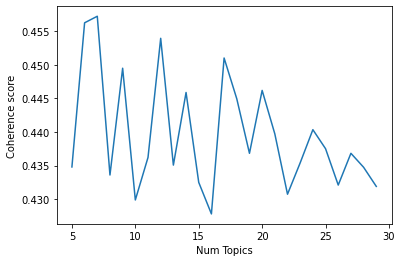

In [49]:
# Show graph
limit=30; start=5; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
#plt.savefig('20240221_PhD_MalletLDALtr-Coherence')
plt.show()

In [50]:
# Print the coherence and perplexity scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, 'Coherence: ', round(cv, 4))

Num Topics = 5 Coherence:  0.4348
Num Topics = 6 Coherence:  0.4563
Num Topics = 7 Coherence:  0.4573
Num Topics = 8 Coherence:  0.4336
Num Topics = 9 Coherence:  0.4495
Num Topics = 10 Coherence:  0.4299
Num Topics = 11 Coherence:  0.4362
Num Topics = 12 Coherence:  0.454
Num Topics = 13 Coherence:  0.4351
Num Topics = 14 Coherence:  0.4459
Num Topics = 15 Coherence:  0.4325
Num Topics = 16 Coherence:  0.4278
Num Topics = 17 Coherence:  0.451
Num Topics = 18 Coherence:  0.4449
Num Topics = 19 Coherence:  0.4368
Num Topics = 20 Coherence:  0.4462
Num Topics = 21 Coherence:  0.4397
Num Topics = 22 Coherence:  0.4307
Num Topics = 23 Coherence:  0.4354
Num Topics = 24 Coherence:  0.4403
Num Topics = 25 Coherence:  0.4375
Num Topics = 26 Coherence:  0.4321
Num Topics = 27 Coherence:  0.4368
Num Topics = 28 Coherence:  0.4347
Num Topics = 29 Coherence:  0.4319


In [51]:
# Coherence for 7-topic model
print(coherence_values[2])

# Topics for 7-topic model
malletModel_07c = model_list[2]
model_topics_07c = malletModel_07c.show_topics(formatted=False)
pprint(sorted(malletModel_07c.print_topics(num_words=20)))

# Convert results to lda model format for visualization.
MalletLDA07c = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(malletModel_07c)

# Visualize the topics
pyLDAvis.enable_notebook()
vis07c = pyLDAvis.gensim.prepare(MalletLDA07c, corpus, id2word, sort_topics=False)
vis07c

0.45725452637833813
[(0,
  '0.024*"life" + 0.023*"book" + 0.022*"heart" + 0.021*"hand" + 0.013*"work" + '
  '0.013*"friend" + 0.012*"mind" + 0.011*"trouble" + 0.010*"paper" + '
  '0.010*"woman" + 0.009*"world" + 0.009*"copy" + 0.009*"husband" + '
  '0.008*"trial" + 0.008*"kind" + 0.007*"anxiety" + 0.007*"girl" + '
  '0.007*"sorrow" + 0.007*"flower" + 0.006*"age"'),
 (1,
  '0.039*"people" + 0.026*"man" + 0.026*"year" + 0.024*"country" + '
  '0.021*"work" + 0.020*"business" + 0.020*"time" + 0.012*"place" + '
  '0.010*"company" + 0.010*"money" + 0.009*"office" + 0.009*"government" + '
  '0.009*"city" + 0.008*"case" + 0.008*"interest" + 0.007*"month" + '
  '0.007*"state" + 0.007*"gold" + 0.006*"home" + 0.006*"party"'),
 (2,
  '0.064*"week" + 0.036*"child" + 0.024*"day" + 0.022*"night" + 0.021*"boy" + '
  '0.021*"baby" + 0.019*"school" + 0.017*"bed" + 0.017*"girl" + 0.013*"today" '
  '+ 0.013*"morning" + 0.013*"thing" + 0.013*"evening" + 0.012*"store" + '
  '0.012*"yesterday" + 0.012*"visit

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.048787  0.159274       1        1  13.622150
1      0.108215 -0.178890       2        1  13.197711
2     -0.304309  0.105398       3        1  12.394465
3      0.141968  0.110941       4        1  17.140427
4      0.047145 -0.321196       5        1  15.465730
5      0.201732  0.164772       6        1  14.283618
6     -0.243537 -0.040299       7        1  13.895898, topic_info=         Term         Freq        Total Category  logprob  loglift
11     letter  1185.000000  1185.000000  Default  30.0000  30.0000
57       time  1189.000000  1189.000000  Default  29.0000  29.0000
78       week   588.000000   588.000000  Default  28.0000  28.0000
97     mother   391.000000   391.000000  Default  27.0000  27.0000
31    brother   400.000000   400.000000  Default  26.0000  26.0000
..        ...          ...          ...      ...      ...      ...
160      door    44.564063    69.084821   Topic7  -5.2784   1.5352
196  building    44.564063    69.279103   Topic7  -5.2784   1.5324
41       home    80.837138   540.450497   Topic7  -4.6828   0.0736
664      fall    46.636810    83.676338   Topic7  -5.2329   1.3890
110     woman    48.709558   157.469799   Topic7  -5.1894   0.8002

[664 rows x 6 columns], token_table=      Topic      Freq          Term
term                               
28        2  0.061022       account
28        4  0.315281       account
28        6  0.488177       account
28        7  0.132215       account
186       4  0.768262  acquaintance
...     ...       ...           ...
61        5  0.282597          year
61        6  0.336942          year
62        3  0.783796     yesterday
62        7  0.220443     yesterday
5553      6  0.986816          youe

[1001 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7])

## 5. Best alpha (below 50) with optimization

In [68]:
def compute_coherence_values(dictionary, corpus, texts, limit, start, step):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word, alpha=41, optimize_interval=250, random_seed=100)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [69]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatizedNouns)

# Create Corpus
texts = data_lemmatizedNouns

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [70]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, 
                                                        corpus=corpus, 
                                                        texts=data_lemmatizedNouns, 
                                                        start=5, 
                                                        limit=30, 
                                                        step=1)

Mallet LDA: 5 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.62105
<20> LL/token: -8.2483
<30> LL/token: -8.01662
<40> LL/token: -7.92348

0	8.2	day house town time water people morning night place week month cent boat hour side snow room board company church 
1	8.2	letter time winter year thing school kind place spring summer account manner weather garden home business pleasure deal health child 
2	8.2	friend letter mother brother time child sister family health home death son wife father daughter month write baby trouble husband 
3	8.2	country year land pound dollar money acre farm work man people person place crop price horse month wheat family expense 
4	8.2	time day letter week girl book heart hand home life night bed return boy woman yesterday evening paper mail writing 

<50> LL/token: -7.87257
<60> LL/token: -7.82457
<70> LL/token: -7.80482
<80> LL/token: -7.78839
<90> LL/token: -7.77515

0	8.2	day house town water church

<560> LL/token: -7.81608
<570> LL/token: -7.82466
<580> LL/token: -7.82152
<590> LL/token: -7.82505

0	7.09633	day week night morning town evening room house church side water bed school hour home child tea yesterday place boat 
1	7.42505	time letter day month place winter weather health home country thing summer friend return pleasure people happiness news manner opportunity 
2	7.71884	letter time brother mother child friend family sister home week girl wife health boy baby work death daughter father son 
3	6.38089	country land year pound dollar acre money farm work place person crop price people cent man wheat foot board farmer 
4	6.75755	life book heart year hand people interest mind work friend paper business husband world man child woman copy matter company 

<600> LL/token: -7.82299
<610> LL/token: -7.82183
<620> LL/token: -7.82736
<630> LL/token: -7.82927
<640> LL/token: -7.83209

0	7.09633	day week morning night house room evening town bed church water child yesterday home hour

<60> LL/token: -7.88164
<70> LL/token: -7.85851
<80> LL/token: -7.84455
<90> LL/token: -7.82704

0	6.83333	friend brother family sister health mother letter child life son father death heart daughter book wife paper husband hand uncle 
1	6.83333	letter time home girl night baby month news boy woman kind company mother friend writing deal picture clock answer darling 
2	6.83333	work people year month summer place time business man money winter water case situation pay respect life market city dollar 
3	6.83333	day morning evening place return church town room fear visit spirit flower week end hand weather night leave idea side 
4	6.83333	day week house child bed thing school winter account head weather today home store snow yesterday fire ship island captain 
5	6.83333	country land pound year dollar acre farm money house crop price person horse wheat cent wood expense farmer half foot 

<100> LL/token: -7.8007
<110> LL/token: -7.78753
<120> LL/token: -7.77994
<130> LL/token: -7.78091
<1

<510> LL/token: -7.82719
<520> LL/token: -7.8318
<530> LL/token: -7.82967
<540> LL/token: -7.82905

0	6.08554	life friend child work son book heart hand death husband family paper kind year mind trouble uncle rest dollar spirit 
1	6.65903	letter time brother friend health mother sister day winter home month family summer father write news place answer kind aunt 
2	5.41315	people year country man business time city month state home place work company interest money war government reason thing law 
3	5.68986	day town house morning room night hour water time place river evening tree side boat fire wood woman ship sea 
4	5.87035	week child day boy baby school night girl home bed thing today store visit yesterday church evening house island snow 
5	5.21769	country land pound year dollar acre farm money work cent crop price place wheat person farmer market bushel potato house 

<550> LL/token: -7.83895
<560> LL/token: -7.84317
<570> LL/token: -7.83816
<580> LL/token: -7.84395
<590> LL/token:

<960> LL/token: -7.85536
<970> LL/token: -7.85604
<980> LL/token: -7.8547
<990> LL/token: -7.86401

0	5.36423	life hand book heart friend work paper mind world husband death trouble kind child care son year copy age letter 
1	6.66441	letter time friend brother mother family health sister month winter home day year summer write news place country father kind 
2	4.6483	people man work year business country time place company city month office government day interest law party home gold fact 
3	4.9921	day town time house night water morning room place hour side tree evening woman boat river wood road ship church 
4	5.42158	week child day boy baby home school night girl bed thing today visit yesterday store evening house morning weather island 
5	4.54964	country land pound year dollar acre farm money cent crop price wheat work person place farmer market bushel board house 

[beta: 0.08819] 
<1000> LL/token: -7.8386

Total time: 36 seconds
Mallet LDA: 7 topics, 3 topic bits, 111 topic mask


<360> LL/token: -7.8642
<370> LL/token: -7.86211
<380> LL/token: -7.86199
<390> LL/token: -7.85947

0	5.32534	life hand book heart mind world work friend paper year interest husband copy anxiety trial care woman change matter spirit 
1	5.50457	brother mother letter family friend sister child son time death wife year daughter health winter uncle aunt cousin father kind 
2	5.29632	day town water house side river morning place church boat tree wood road evening ship night hour time sea vessel 
3	5.63092	letter time day month home health place friend news weather sister pleasure winter return summer opportunity spring happiness thing father 
4	5.1083	country land pound year dollar acre farm money cent crop price wheat person place farmer market bushel work potato house 
5	5.41465	people work time year man country business home place city month company state day reason government lot money kind summer 
6	5.54717	week child day night boy bed baby girl school home morning today room evening m

<760> LL/token: -7.91744
<770> LL/token: -7.91458
<780> LL/token: -7.92008
<790> LL/token: -7.91632

0	4.00084	book heart hand life mind work friend paper woman copy year husband interest death trial flower spirit child sorrow matter 
1	4.87117	letter brother mother friend family sister time health wife home child year son daughter uncle aunt death father cousin winter 
2	3.99428	day town water house morning river hour place tree boat wood evening side night room time road ship sea church 
3	5.11972	time letter day month place winter weather home health news summer pleasure friend country return happiness kind manner sister trust 
4	3.89284	country land pound year acre farm dollar money crop price cent wheat person farmer work market place bushel house potato 
5	4.00839	people man country year time work business company place government city office state day home fact side interest gold money 
6	4.80141	week child day baby boy girl night school bed home thing today yesterday evening ch

<160> LL/token: -7.80304
<170> LL/token: -7.80291
<180> LL/token: -7.79412
<190> LL/token: -7.78438

0	5.125	letter time day sister write news place month friend weather opportunity pleasure health girl happiness flower writing home father trust 
1	5.125	land country pound dollar acre farm year money cent price wood house horse wheat place farmer market tree potato cost 
2	5.125	mother friend brother family child letter health son death sister wife daughter husband uncle year aunt paper life cousin father 
3	5.125	day morning week town evening church child side yesterday home night today mail clock visit weather island boat dinner tomorrow 
4	5.125	time home winter year month week summer country work account spring money kind school crop thing store snow deal pay 
5	5.125	people place man country work business person company road state year time foot day climate reason government ship seed ground 
6	5.125	hand book life world mind heart interest idea matter difficulty spirit friend res

<510> LL/token: -7.91651
<520> LL/token: -7.92901
<530> LL/token: -7.92699
<540> LL/token: -7.93798

0	4.71729	letter time day place friend month health pleasure news country happiness opportunity sister life manner kind darling trust return garden 
1	3.83105	country land pound year acre farm dollar money cent crop price wheat place person farmer bushel market wage cost house 
2	4.63339	letter brother mother family friend child sister death health son wife daughter uncle aunt kind father cousin answer year house 
3	4.36738	day town morning house evening water church river wood place hour tree night boat island side captain ship sea dinner 
4	4.59745	time home week winter day year month work summer account money store snow spring weather trouble change deal fire leave 
5	3.85391	people man year country business place work state company time city government month interest party mine gold fact side thousand 
6	3.98448	book life hand heart work mind spirit copy husband paper friend woman t

<860> LL/token: -7.95528
<870> LL/token: -7.95805
<880> LL/token: -7.94182
<890> LL/token: -7.94944

0	4.3575	letter time day place month friend country summer weather winter health pleasure news kind happiness opportunity trust home return manner 
1	3.39782	country land pound year acre farm dollar money cent price crop wheat person place farmer bushel horse market wood foot 
2	4.29236	letter brother mother family friend sister health year child wife death son daughter uncle house aunt father winter cousin answer 
3	3.79125	day town water morning house hour boat night room river wood side sea church evening tree ship place road view 
4	4.30955	time day home work week month letter snow thing change place money lot pay business deal winter mind mine summer 
5	3.21778	people man year country business company government state side difficulty interest city law gold bank office war place thousand provision 
6	3.41426	book life heart hand friend husband mind work copy paper kind world trial i

<210> LL/token: -7.79348
<220> LL/token: -7.78502
<230> LL/token: -7.79382
<240> LL/token: -7.7883

0	4.55556	day house water board town boat room place wood tree ship sea servant lady hour passage hand description deal arrival 
1	4.55556	people man business state year difficulty company captain government war city party term opinion bank fact character book circumstance home 
2	4.55556	day weather book kind girl bed woman thing night month garden flower trust spirit room fear life time eye anxiety 
3	4.55556	life death heart hand son work friend husband mind year world paper dollar kind age trouble copy interest wife rest 
4	4.55556	child week boy baby school uncle aunt cousin visit store day girl doctor house trouble thing island change home tea 
5	4.55556	country land pound acre dollar year farm cent money price crop wheat house farmer person market potato cost work bushel 
6	4.55556	letter time mother sister home friend father news write pleasure daughter answer happiness return he

<560> LL/token: -7.95505
<570> LL/token: -7.95652
<580> LL/token: -7.9669
<590> LL/token: -7.96935

0	3.47293	day room board boat thing ship captain sea woman month passage vessel water servant arrival good piece night person hour 
1	3.4856	people country year business man state company interest month government home fact city war case thousand world difficulty person law 
2	3.71814	day time weather letter night kind health week darling garden manner place happiness flower trust pleasure thing peace attention room 
3	3.54839	book life heart hand friend work mind husband paper child woman copy death trial sorrow spirit age world trouble son 
4	3.88244	child week boy baby school aunt today uncle visit house island yesterday evening girl store night bed doctor afternoon thing 
5	3.56758	land country pound year dollar acre farm money cent crop price wheat farmer market bushel cost person potato work wage 
6	4.49773	letter time home mother sister father friend month write news year daughter

<910> LL/token: -7.99274
<920> LL/token: -7.98926
<930> LL/token: -7.97335
<940> LL/token: -7.97826

0	2.89335	day boat captain thing vessel sea passage board provision employment ship gold box store luggage water voyage good woman tea 
1	2.96588	people year country man business interest government state world difficulty company month time meeting respect law thousand debt number place 
2	3.37492	day time letter winter weather month place country health summer happiness manner friend trust pleasure return kind spring garden father 
3	3.05881	book heart hand life work dollar husband kind paper copy trial mind death sorrow flower nature world eye spirit woman 
4	3.59134	week child day school boy evening morning bed night today church house room baby yesterday island girl visit trouble snow 
5	3.12882	country land pound year acre dollar farm money work crop price wheat place cent farmer market bushel person potato wage 
6	4.29525	letter time home mother week sister thing month day write n

<210> LL/token: -7.83442
<220> LL/token: -7.82845
<230> LL/token: -7.82648
<240> LL/token: -7.82031

0	4.1	land country pound dollar acre farm money cent crop price wheat person farmer board market cost bushel wage place wood 
1	4.1	letter girl heart weather life return pleasure comfort flower father trust fear darling happiness spirit picture peace age visit writing 
2	4.1	work hand book life mind thing rest woman dollar copy eye people power day pen boy nature term mine face 
3	4.1	day morning hour water town evening night house side clock boat river ship island captain road sea tree vessel rain 
4	4.1	week child night bed baby day room boy home winter today snow yesterday time head visit table mail evening spirit 
5	4.1	day time place home month school church account town summer opportunity week wood deal garden leave attention manner spring description 
6	4.1	year house work winter country horse summer people spring lot month foot thing door tree servant fire deal call water 
7	4.1

<510> LL/token: -7.95571
<520> LL/token: -7.96254
<530> LL/token: -7.9629
<540> LL/token: -7.98234

0	3.11086	country land pound year acre dollar farm money cent crop price wheat place person farmer market bushel wage cost wood 
1	3.53136	letter time day girl health sister woman news happiness kind flower thing opportunity return father darling month picture writing trust 
2	2.96792	book life work hand mind spirit copy paper interest thing anxiety mail nature term account story matter servant truth idea 
3	3.19244	day town morning room river house evening boat side night wood hour place water captain ship sea tree vessel board 
4	3.80095	week child day boy night baby school bed home today girl evening church morning yesterday visit island room clock tomorrow 
5	3.81465	time day month winter country summer place year home weather people week spring town friend account snow manner garden pleasure 
6	3.03043	work house water lot horse foot time kind people thing pay woman store door deal 

<810> LL/token: -8.0049
<820> LL/token: -7.99826
<830> LL/token: -7.99357
<840> LL/token: -8.0086

0	2.73851	country land pound acre year farm dollar money price wheat crop person market farmer wood place bushel wage house tree 
1	3.29425	letter time girl day thing news home kind sister return flower writing write baby darling night happiness picture care father 
2	2.41608	book work interest paper copy hand spirit anxiety mind life table story truth thing servant nature position painting fear turn 
3	2.73027	day town house morning place water side room road evening tree wood boat sea fire hour night river ship board 
4	3.57554	week child day school night boy morning bed evening today church baby visit yesterday island room home mail trouble clock 
5	3.55176	time day month winter place summer country home year health weather people garden town spring pleasure account manner snow person 
6	2.49416	work cent dollar water pound horse month cost board foot pay beef luggage spring pork tea d

<110> LL/token: -7.91186
<120> LL/token: -7.90734
<130> LL/token: -7.89923
<140> LL/token: -7.89252

0	3.72727	book life interest year paper matter age copy trouble husband world trial heart sorrow power nature business government loss man 
1	3.72727	letter friend time sister girl kind father heart life news happiness care flower trust account darling world day husband prayer 
2	3.72727	child week boy day home opportunity today snow mail fall spirit store pain street fortnight mind health comfort pen fire 
3	3.72727	place church cent tree lot situation state day school number bed account month captain bank seed spring heat meeting dollar 
4	3.72727	country year people home thing house business difficulty expense climate school horse party rate character case quarter pay money capital 
5	3.72727	land country pound year acre farm dollar money crop price wheat kind family farmer potato person market winter bushel trade 
6	3.72727	day man head river wood time side company foot ground gold 

<390> LL/token: -7.97832

0	3.22517	life book heart husband paper interest copy loss work world trial sorrow son mind dollar year age nature power hand 
1	3.62803	letter time friend sister health kind news return father care pleasure girl happiness flower write writing opportunity woman darling trust 
2	3.53842	week child boy baby girl night day bed school today home mail evening visit yesterday room trouble thing tomorrow morning 
3	3.19349	place wood land church person town tree number prospect cent bank road servant meeting school neighbourhood man description cotton heat 
4	3.33902	country year people business home state expense money difficulty situation world idea emigrant fortune doubt thing office duty character capital 
5	3.24271	pound country land dollar acre farm year money price crop house wheat farmer market bushel wage winter person cent potato 
6	3.15094	man company year day time people horse lot gold city house fire month head thousand foot mine government fellow water 

<660> LL/token: -8.03357
<670> LL/token: -8.02356
<680> LL/token: -8.01319
<690> LL/token: -8.02235

0	2.74393	book life heart hand work husband copy death mind trial dollar flower spirit paper eye sorrow woman friend girl nature 
1	3.47442	letter time friend month news home kind father sister place health happiness return opportunity darling trust pleasure writing prayer peace 
2	3.36962	week child baby boy school today day evening girl home bed island yesterday thing morning tea trouble tomorrow room visit 
3	2.66992	place land wood country house town church tree road person river number meeting neighbourhood mill description settler bank climate building 
4	2.9343	year people country business interest state man case world difficulty opinion matter circumstance government reason power home manner office mind 
5	2.84346	pound country land dollar acre farm year money cent price wheat farmer crop market person bushel work house wage foot 
6	2.54709	man company day work year horse head t


0	2.311	book heart hand life work paper husband copy mind trial friend death dollar sorrow girl son flower age nature soul 
1	3.25689	letter time friend month place return health sister news father opportunity happiness kind pleasure country darling writing prayer manner world 
2	3.11803	child week baby boy school today evening girl night thing visit tea morning bed yesterday room tomorrow island home day 
3	2.25019	place country land wood house road church tree river man number neighbourhood farm town mill meeting idea labour lot side 
4	2.51944	people year business interest country case life state matter difficulty world power home service respect man office city duty expense 
5	2.51069	country pound land acre dollar year farm money cent price wheat crop person farmer work market bushel month potato wage 
6	2.0192	man day gold company work foot place year people month government head mountain mine thousand call time coal water arm 
7	2.45745	day morning night boat room water evening

<160> LL/token: -7.92357
<170> LL/token: -7.92273
<180> LL/token: -7.91715
<190> LL/token: -7.90406

0	3.41667	child death heart friend hand husband mother kind trouble life son world wife dollar age daughter mind loss trial paper 
1	3.41667	day winter time uncle thing cousin summer snow weather paper blessing people aunt change world year rain address air trust 
2	3.41667	book work life year interest difficulty spirit copy case mind matter nature anxiety reason story man fortune expense truth feeling 
3	3.41667	letter home time mother sister news girl friend father place opportunity writing daughter darling answer care leave life return kindness 
4	3.41667	time house day man work room fire office head people water door city ground law place gentleman street account rest 
5	3.41667	brother family friend health sister year week time account money wife son letter kind child line month spring word store 
6	3.41667	time month letter write thing pleasure garden flower summer idea deal weath

<410> LL/token: -7.99887
<420> LL/token: -8.00532
<430> LL/token: -8.01166
<440> LL/token: -8.00709

0	3.19984	heart friend child death husband kind life wife father son age family year care loss bed dollar trial sorrow mind 
1	3.14255	winter day month week time uncle summer thing year weather snow cousin visit people aunt change frost comfort fire rest 
2	2.93059	book work hand life paper interest copy matter pleasure anxiety power spirit business fear world table success man year nature 
3	3.35541	letter time home mother sister girl write baby news boy writing picture night answer woman daughter leave darling aunt mail 
4	3.02004	time work house man day people place water head city government month company side river town thousand mind horse mountain 
5	3.26865	brother friend family health sister mother year time money son account wife letter life country child line spring deal father 
6	3.1355	letter time day month place health happiness summer friend pleasure garden weather trust p

<660> LL/token: -8.05759
<670> LL/token: -8.05981
<680> LL/token: -8.05643
<690> LL/token: -8.06629

0	2.84959	friend heart child life husband death girl kind year sister dollar hand world trial trouble wife sorrow flower eye care 
1	2.87083	winter month summer time uncle home year work aunt people snow weather change doctor day cousin week rest house thing 
2	2.45723	book work paper copy hand life interest spirit matter anxiety power fear truth debt story class table kind board benefit 
3	3.22529	letter time week home mother day baby night news boy write thing girl mail pleasure picture paper answer fire writing 
4	2.54358	man day company time people work place year government head office money thousand month city mine gold stand cost business 
5	3.00861	brother family friend letter sister mother health son year daughter child wife father money account death kind answer country line 
6	2.84089	letter time day month health place summer friend return garden weather happiness country opp

<910> LL/token: -8.07857
<920> LL/token: -8.08107
<930> LL/token: -8.07085
<940> LL/token: -8.06951

0	2.52583	heart child friend life husband death kind girl hand wife father dollar world year mind son age sorrow trial care 
1	2.58442	winter uncle child summer family aunt year month week work people cousin change health paper doctor snow day time weather 
2	1.98172	book work paper copy hand interest life spirit matter story fear truth anxiety nature home power pound servant success benefit 
3	3.03635	letter time home day week baby night thing mother girl boy write month news writing picture yesterday folk visit weather 
4	2.04853	man work time people day company government place city month country money year mine gold foot office mountain provision thousand 
5	2.78849	brother friend sister letter family mother health year daughter wife time money son father account death answer home line kind 
6	2.59812	letter time day month health place summer country weather happiness opportunity re

<160> LL/token: -7.91267
<170> LL/token: -7.90987
<180> LL/token: -7.90107
<190> LL/token: -7.89864

0	3.15385	winter day school week spring account snow brother respect seed prospect number ground country head folk town pork road call 
1	3.15385	week child day boy bed visit today time store mail wife kind home trouble fortnight rest likeness cough pain lesson 
2	3.15385	heart hand life death friend woman letter husband girl sister care mind copy spirit trial eye age sorrow pen change 
3	3.15385	letter mother time home sister daughter uncle aunt answer write news cousin boy son doctor paper address glad_hear advice leave 
4	3.15385	work time people man day home thing month mind reason board company city case mine provision business gold opinion clothe 
5	3.15385	house place town flower day hour morning island wood room tree life door end time road spirit meeting people journey 
6	3.15385	night day evening baby girl morning church thing yesterday room weather fire return dinner tomorrow

<410> LL/token: -7.97948
<420> LL/token: -7.99319
<430> LL/token: -7.99971
<440> LL/token: -7.99844

0	2.887	winter time home week thing summer snow day spring country account weather prospect frost rest comfort folk change heat air 
1	2.93508	week child school house boy today store island bed doctor day yesterday fortnight visit pork tea cough trouble lesson illness 
2	2.75606	heart hand friend life husband child death kind woman father age care loss trial sorrow rest mind girl trouble eye 
3	3.08951	letter time mother home sister uncle write aunt cousin news answer boy mail deal girl leave writing friend paper address 
4	2.84535	people work man year company time month city business government place day mine gold fact money reason foot thousand mountain 
5	2.80878	town day house place side wood room water tree church morning road door river building street person time fall home 
6	2.98401	day night evening baby morning girl head yesterday visit room tomorrow clock church return bed th

<660> LL/token: -8.05255
<670> LL/token: -8.05149
<680> LL/token: -8.05663
<690> LL/token: -8.06192

0	2.65057	winter time home day month thing summer weather country account place snow people spring change frost heat comfort rest situation 
1	2.69296	week child school today boy island house store visit yesterday evening trouble tea afternoon pork church spirit lesson tomorrow service 
2	2.44567	heart child life friend hand husband year world death trial wife mind spirit rest sorrow flower age eye loss book 
3	2.98098	letter time mother home week write sister aunt cousin news boy mail answer girl uncle death baby lot call writing 
4	2.39179	people man work time year company day country government place fact mine thousand law city war business office mountain month 
5	2.44285	day town house morning place wood side tree church water evening river time hour road clock return building dinner fall 
6	2.73864	day night bed room girl baby morning head thing yesterday fear woman window hour mi

<910> LL/token: -8.05914
<920> LL/token: -8.06949
<930> LL/token: -8.05881
<940> LL/token: -8.05964

0	2.47221	people country winter home place day time summer thing case month account state difficulty snow person world idea climate heat 
1	2.40776	week child school today boy house church evening island store town tea pork yesterday visit vessel afternoon spirit lesson service 
2	2.14825	heart friend child life husband year death kind sister trial wife mind father son sorrow hand world age loss flower 
3	2.83497	letter time mother home week write boy girl news thing day answer sister writing baby picture month aunt cousin work 
4	1.91223	man year people time work company government business money day country fact gold month water mine foot place mountain side 
5	2.09218	day town house place morning side wood tree water road river clock time evening fire horse home room hour leave 
6	2.43632	day night bed room girl baby week head morning trouble doctor visit weather illness evening face

<160> LL/token: -7.93098
<170> LL/token: -7.92066
<180> LL/token: -7.92155
<190> LL/token: -7.91754

0	2.92857	book hand life spirit copy heart power paper matter nature flower eye anxiety creature world truth regret table servant painting 
1	2.92857	home day time church week head night hour horse lot rain likeness piece society face fellow side sleep train box 
2	2.92857	country land acre person farm wood place man people number road climate business government field neighbourhood stock capital labour servant 
3	2.92857	time place letter country month friend opportunity manner happiness father summer trust health people war year garden peace prayer order 
4	2.92857	year home interest state case difficulty expense office mind prospect change service law heat reason term quarter account plan circumstance 
5	2.92857	pound dollar country year money cent price crop wheat farm farmer market potato bushel wage month seed horse cost tree 
6	2.92857	work house people place time man day water c

<360> LL/token: -8.02852
<370> LL/token: -8.0182
<380> LL/token: -8.01905
<390> LL/token: -8.02737

0	2.50324	book hand life work paper copy spirit anxiety nature flower fear story dollar truth eye table age idea heart painting 
1	2.60637	home week church time morning day mail dinner town clock horse meeting night visit tea tomorrow side breakfast head hour 
2	2.53485	country land acre farm year place pound money wood crop wheat price mill person neighbourhood stock people labour number road 
3	2.71723	letter time health place country happiness month father kind garden manner summer friend trust pleasure year prayer return opportunity deal 
4	2.59542	year people business interest state world mind man expense matter power difficulty party doubt government office city gentleman reason bank 
5	2.62295	dollar pound cent work bushel potato wage board horse price month year seed cow farmer cost pay money flour person 
6	2.62043	work day time people man house company lot city place money mont

<580> LL/token: -8.08247
<590> LL/token: -8.08278

0	2.0403	book work life hand paper mind copy nature spirit story anxiety fear sale table beauty success subject page volume power 
1	2.28634	home church morning week day evening mail dinner tomorrow clock time town night boy horse place breakfast hour side office 
2	2.19242	country land year acre farm pound crop wheat price money place bushel wood horse market house tree neighbourhood farmer foot 
3	2.49376	time letter day place health month country weather year garden friend manner summer happiness kind people pleasure trust return opportunity 
4	2.25088	people year business country interest state difficulty case expense matter hand power party character fact duty situation bank place idea 
5	2.23642	dollar pound cent work board money wage person seed kind pay cost month pork boat flour beef luggage currency steam 
6	2.19325	time man work day people company year month gold city mine lot water thousand house mountain money place show f

<810> LL/token: -8.07742
<820> LL/token: -8.08154
<830> LL/token: -8.08207
<840> LL/token: -8.08231

0	1.60442	book work hand paper copy spirit mind letter interest life nature story fear pen year success judge volume mail page 
1	1.9879	home morning church day week house evening clock dinner mail boy tomorrow horse town tea time half yesterday service head 
2	1.89563	land country acre year farm pound crop wheat money place price bushel wood market house tree horse dollar farmer lot 
3	2.26907	letter time day health place happiness month pleasure friend trust weather country kind father garden year news manner return people 
4	1.91392	country people business year state interest person man difficulty party case city matter situation number respect idea emigrant expense opinion 
5	1.84157	dollar pound cent work board wage pay month employment money cost deal beef luggage trade currency sugar steam clothe butter 
6	1.77994	work man time people company place day money gold city month mine 

<10> LL/token: -9.10284
<20> LL/token: -8.55273
<30> LL/token: -8.30347
<40> LL/token: -8.18067

0	2.73333	week thing today difficulty doctor anxiety board tomorrow expense book visit number window bed disease frost child painting thinking oats 
1	2.73333	letter girl baby mother home boy sister news night mail week pleasure father answer eye return heart kind head thought 
2	2.73333	time work day money opportunity hand store account letter kind pleasure pen winter write pain woman sickness fever friend folk 
3	2.73333	day place world time return letter happiness person prayer gentleman peace home room lady visit idea attention trust town people 
4	2.73333	brother family sister mother health daughter uncle child cousin aunt year death letter father home friend answer address winter week 
5	2.73333	water wood house tree river town boat clock road side foot room half table mill good article month number cotton 
6	2.73333	life book heart husband friend matter death copy woman mind power tr

<210> LL/token: -7.93705
<220> LL/token: -7.93433
<230> LL/token: -7.93112
<240> LL/token: -7.92479

0	2.73333	week thing day school today snow servant anxiety visit doctor order account fortnight thinking fear disease promise holiday situation painting 
1	2.73333	letter time girl home mother baby news boy night week sister return woman write daughter paper kind pleasure hair mail 
2	2.73333	time work day money friend letter opportunity home kind pleasure store account father fever pain blessing leave deal pen write 
3	2.73333	day place happiness town time world return spirit person prayer manner friend trust lady sister street attention country acquaintance care 
4	2.73333	brother family sister mother health friend death uncle aunt letter daughter cousin father child answer line home house winter year 
5	2.73333	house water wood tree town river road side place morning building bank foot boat fire ground fall table steamer lake 
6	2.73333	book life hand heart work matter copy world spi

<410> LL/token: -8.02625
<420> LL/token: -8.03269
<430> LL/token: -8.03744
<440> LL/token: -8.04018

0	2.52838	week child school day today thing visit island boy account yesterday pork doctor evening head servant lesson ice fortnight ham 
1	2.61973	letter time mother baby girl home boy write news darling mail return answer picture night woman sister father folk thinking 
2	2.59715	work time day home week money house friend place store dollar deal city kind trouble pay night fever board cost 
3	2.49687	day letter time place friend happiness home father sister trust country manner prayer care description lady peace hand world kind 
4	2.52539	brother family mother letter sister health friend uncle aunt cousin daughter child son year life answer father wife death line 
5	2.35399	town water tree wood house river side road morning place people foot land building time fire view ground fall head 
6	2.32812	book life hand copy paper work spirit nature woman heart world mind affection truth stor

<610> LL/token: -8.05936
<620> LL/token: -8.06766
<630> LL/token: -8.06141
<640> LL/token: -8.07792

0	2.31535	week child school today day evening church boy island yesterday visit home store pork spirit captain town vessel lesson ham 
1	2.49711	letter time mother home baby girl week boy news night sister thing write mail picture call tomorrow answer writing leave 
2	2.43012	work time day money dollar week home place friend country kind house pay city trouble board month rest mine reason 
3	2.25854	letter time day friend health happiness place country pleasure father care manner account prayer home opportunity sister trust news return 
4	2.36975	brother family letter health mother friend uncle son sister daughter wife child aunt cousin answer death father account life line 
5	2.02564	day wood house town place water river tree road side home morning building fall street bank church gentleman view hill 
6	1.89668	book hand life work copy paper spirit mind story nature truth pen heart que

<810> LL/token: -8.08097
<820> LL/token: -8.07946
<830> LL/token: -8.07927
<840> LL/token: -8.08858

0	2.07556	week child school today church evening boy island day visit pork yesterday store town captain tea dinner spirit lesson vessel 
1	2.36773	letter time home mother baby week thing girl write boy day news night sister answer paper lot writing mail picture 
2	2.23466	work day time home money place dollar house month week city pay kind deal board rest friend store town trouble 
3	2.0811	letter time day friend place happiness pleasure health opportunity return father trust prayer month manner news home care lady peace 
4	2.21771	brother family letter sister friend mother health child son uncle daughter wife father aunt death cousin year account country blessing 
5	1.7057	day town place morning wood road side river tree house evening return home church building fall land water time spot 
6	1.51827	book work life hand copy paper spirit anxiety mind pen story table pound servant nature 

Mallet LDA: 16 topics, 4 topic bits, 1111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.16616
<20> LL/token: -8.60727
<30> LL/token: -8.35223
<40> LL/token: -8.22299

0	2.5625	letter time month baby week girl write sister night mother fire work pleasure answer address opportunity creature wife death change 
1	2.5625	day weather head today fear picture dinner week account leave deal order time manner hand meeting house letter kitchen illness 
2	2.5625	brother friend home family doctor letter work money health account line year answer trouble trial time week spring kind law 
3	2.5625	week room child girl island visit yesterday house window night woman flower boy fact change walk voyage soul sight school 
4	2.5625	country year man people summer business government family lot company month field kind thousand wheat fruit wage pay stock grain 
5	2.5625	day boat hour ship captain sea vessel building passage arrival tree scene water luggage appearance night ste

<210> LL/token: -7.94737
<220> LL/token: -7.94804
<230> LL/token: -7.95508
<240> LL/token: -7.93968

0	2.5625	letter time mother baby girl write news night month sister fire picture work answer week lot leave folk cousin call 
1	2.5625	day week home thing weather mail head fear evening today snow word tomorrow account trip thinking position birthday turn order 
2	2.5625	brother health family letter uncle friend mother time son money cousin doctor year line answer address respect advice deal word 
3	2.5625	child house room bed boy week school island girl yesterday visit window today fortnight door cough kitchen lesson table face 
4	2.5625	man people year business city office company month government money country kind war thousand stand time law state food coal 
5	2.5625	day water night boat ship captain sea hour vessel arrival board passage view luggage voyage fear steamer sail passenger wind 
6	2.5625	hand life work interest book trouble matter power spirit mind nature change eye anxi

<410> LL/token: -8.04876
<420> LL/token: -8.06505
<430> LL/token: -8.06962
<440> LL/token: -8.05679

0	2.47241	letter time mother write home night baby news answer fire girl work friend sister lot picture leave folk month glad_hear 
1	2.49475	day week thing home visit boy mail weather head night evening yesterday paper morning fear trip position minute illness birthday 
2	2.32057	brother family health uncle friend letter daughter aunt son cousin child mother line doctor address time winter answer wife country 
3	2.39516	child room house bed week school today girl boy door window island table cough kitchen lesson fortnight servant walk tomorrow 
4	2.10623	man people year company government business city war office stand gold thousand coal law member money side month officer soldier 
5	2.06464	day boat ship captain sea hour night vessel board passage scene arrival voyage passenger water steamer evening sail view wind 
6	2.25143	hand life interest book work world spirit power pleasure min

<610> LL/token: -8.08698
<620> LL/token: -8.09478
<630> LL/token: -8.07677
<640> LL/token: -8.08734

0	2.4004	letter time mother home write friend sister news answer girl night week baby picture work writing lot month cousin folk 
1	2.35369	day week home evening thing visit night head mail morning yesterday boy journey fear idea tomorrow position minute birthday trip 
2	2.08479	brother family health uncle son sister aunt mother daughter child letter friend wife cousin doctor line kind blessing death house 
3	2.18172	child week school room bed today boy island house church clock fortnight night spirit table store lesson kitchen girl afternoon 
4	1.66788	man people year company government business city office war thousand party state bank month coal condition side law food soldier 
5	1.64365	day boat ship captain vessel night sea luggage voyage board steamer sail passenger hour wind morning woman passage scene side 
6	1.90861	book hand work life interest mind spirit power story truth pap

<810> LL/token: -8.07149
<820> LL/token: -8.05166
<830> LL/token: -8.06334
<840> LL/token: -8.07581

0	2.28704	letter time mother home sister write girl news answer friend leave writing place lot opportunity fire cousin picture call address 
1	2.19206	day week night thing home baby morning yesterday head weather visit evening boy mail return journey tomorrow anxiety idea account 
2	1.9031	brother family health child uncle sister son mother aunt friend daughter wife letter father cousin death kind blessing house line 
3	1.98049	child week school today bed island boy church store room house servant evening tea clock brother doctor afternoon lesson fortnight 
4	1.30214	man people company government thousand year war city law business coal officer gold stand side food kind cotton soldier bank 
5	1.29627	boat ship day vessel captain board sea good voyage luggage evening night passenger sail steamer port hour passage land arrival 
6	1.55731	book hand work paper copy life mind spirit interest

Mallet LDA: 17 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.14358
<20> LL/token: -8.60587
<30> LL/token: -8.35911
<40> LL/token: -8.23363

0	2.41176	book girl hand room mind today dollar paper age night house writing table trouble eye creature window face pen door 
1	2.41176	wood river head road home dinner fact mill distance class mail lake butter boy arrival round shore steamer station bed 
2	2.41176	child week school boy trouble power spirit home fire affection afternoon leave kindness lesson bed expense nature party word parent 
3	2.41176	year work winter crop month summer wage potato servant employment trade state situation week clothe land stone oats pork idea 
4	2.41176	day morning night evening yesterday clock visit bed return room hour weather time rain street fortnight scene week air cough 
5	2.41176	death life heart friend matter doctor hand loss interest daughter gentleman soul paper year letter rest trouble fortu

<210> LL/token: -7.99098
<220> LL/token: -7.98782
<230> LL/token: -7.98393
<240> LL/token: -7.98379

0	2.41176	book woman hand girl fear mind eye daughter room writing flower dollar paper face creature story spirit pen table hair 
1	2.41176	wood home town road river mill fact distance gold gentleman dinner rest room spot mile mountain lake description walk tree 
2	2.41176	week child school boy today store island trouble spirit house tea lesson pork yesterday pig holiday teacher head afternoon tomorrow 
3	2.41176	dollar work country board month winter summer person potato year servant wage money employment business trade tea clothe kind case 
4	2.41176	night day morning bed evening clock fire yesterday side room visit return hour rain mail fortnight horse sleep tomorrow breakfast 
5	2.41176	heart world life kind hand trouble pleasure matter loss power interest year nature soul idea rest truth gentleman fortune regret 
6	2.41176	brother sister health letter family year friend mother answ

<410> LL/token: -8.05791
<420> LL/token: -8.06715
<430> LL/token: -8.0751
<440> LL/token: -8.08006

0	2.08882	girl book heart woman boy kind hand flower eye daughter face thing creature darling father writing fear hair mind picture 
1	2.0484	house wood town tree water river place road side land fire street ground day distance description home mill comfort view 
2	2.2155	child week school today boy store island yesterday pork tea lesson tomorrow trouble girl brother fortnight church window ham visit 
3	2.05541	dollar work cent pound house person wage money business board trade kind servant cow beef clothe employment flour country butter 
4	2.27219	day night room week bed morning house evening head clock hour rain door doctor woman half scene horse sleep visit 
5	2.15812	life hand world heart matter power loss time pleasure interest anxiety affection regret question idea husband thought nature fortune care 
6	2.3488	brother sister family letter health friend mother year money daughter so

<610> LL/token: -8.09659
<620> LL/token: -8.11378
<630> LL/token: -8.11587
<640> LL/token: -8.11268

0	1.76767	girl baby child woman thing boy kind dollar flower father sister fear heart darling daughter eye return visit picture creature 
1	1.73803	house wood water river town tree road place building side home gentleman fire bank city street land people hill mile 
2	2.00325	week child school today boy store island church pork yesterday visit spirit town lesson vessel trouble tea girl pig holiday 
3	1.73159	dollar country work pound cent money house person wage board clothe kind trade flour tea beef expense sugar butter employment 
4	2.07507	day night morning bed room week evening clock hour house head horse table half sleep dinner afternoon door yesterday scene 
5	1.86966	hand world life power mind situation spirit difficulty matter advice state affection circumstance manner parent case property time servant fortune 
6	2.18257	brother sister health letter friend family wife money mothe

<810> LL/token: -8.11273
<820> LL/token: -8.10221
<830> LL/token: -8.10882
<840> LL/token: -8.11878

0	1.5179	girl child baby woman heart mind dollar boy eye hand thing flower picture creature face fear darling sister daughter talk 
1	1.46431	house place town tree water wood river side day fire road building people street mile view land city bank gentleman 
2	1.7816	child week school today island boy store evening yesterday church pork tea vessel spirit pig lesson visit captain ice holiday 
3	1.46512	dollar work pound cent country house wage person money board day kind beef flour butter profit employment trade clothe apple 
4	1.87181	day night room bed morning week clock evening house doctor horse head half door trouble kitchen rain minute visit hour 
5	1.59999	life hand world situation difficulty time mind spirit case servant friend circumstance power advice affection manner board heart change state 
6	1.99095	brother sister letter friend health family year father country money daught

Mallet LDA: 18 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.18554
<20> LL/token: -8.61388
<30> LL/token: -8.35654
<40> LL/token: -8.22892

0	2.27778	town day tea dinner prayer month head place week yesterday lady window dress return door idea climate house friend writing 
1	2.27778	book girl boy letter baby copy age mail child today writing room trouble term tomorrow interest table heart week mind 
2	2.27778	people man company business life work manner case servant question law change story debt affection hand picture feeling earth eye 
3	2.27778	hand kind matter spirit mind life power work fear nature time anxiety woman face people creature rest heat truth return 
4	2.27778	day month time thing baby town place war gentleman fire week night government news arm state party fortnight picture letter 
5	2.27778	letter time sister happiness flower kind darling garden trust health father peace kindness month fever weather pleasure 

<210> LL/token: -7.97862
<220> LL/token: -7.97639
<230> LL/token: -7.97783
<240> LL/token: -7.97658

0	2.27778	day town manner place friend visit lady description window room return dress opinion dinner inhabitant order servant cotton climate prayer 
1	2.27778	book baby work heart copy visit girl letter age paper woman boy writing story child cough anxiety call term success 
2	2.27778	people man work company city business law fact government party earth debt year gold life doubt power parent stand coal 
3	2.27778	hand life kind matter mind eye table nature spirit pleasure fortune idea paper reason fear truth power creature fault face 
4	2.27778	day thing time month fire letter town home mail boy arm war rest thousand office street position care post field 
5	2.27778	letter time weather month health happiness flower sister news darling father garden trust kindness kind write pleasure attention deal peace 
6	2.27778	friend trouble husband life heart death wife world doctor loss trial bed

<410> LL/token: -8.07393
<420> LL/token: -8.08295
<430> LL/token: -8.08665
<440> LL/token: -8.09324

0	2.03121	day town person manner time lady place hand description woman church sister visit room arrival dinner friend weather carriage inhabitant 
1	1.93312	book work paper copy heart woman flower age pay story success writing fear pound term volume girl history sight title 
2	1.89962	people man company year government city work fact money business thousand country war gold place office coal law clothing food 
3	2.0153	hand life mind interest power matter change kind spirit table nature pleasure question side truth party servant year storm judge 
4	1.97752	letter time day month fire mail home boy account street news care position man head night thinking officer world soldier 
5	2.15364	letter time friend father health happiness kind sister darling news month garden write return opportunity life flower trust kindness prayer 
6	2.03371	husband life friend heart death doctor trouble child

<610> LL/token: -8.12468
<620> LL/token: -8.12386
<630> LL/token: -8.12468
<640> LL/token: -8.12429

0	1.74207	day town place lady manner sister month church room description winter woman time picture friend letter account acquaintance hand weather 
1	1.52081	book work copy paper writing life flower story son man history volume bread heart term woman fear sale sight home 
2	1.5288	man people company year city government foot work money gold business office thousand fact food coal provision pocket law war 
3	1.71034	hand interest business matter power mind life table servant truth party state nature eye spirit side pen question cotton fear 
4	1.65934	letter time day home fire mail thing news care mind anxiety boy head position thinking room mother post place soldier 
5	2.00716	letter time health month happiness day pleasure return garden friend peace kind flower father trust opportunity darling news kindness prayer 
6	1.8244	friend heart husband sister death life child world trouble kin

<810> LL/token: -8.11934
<820> LL/token: -8.10928
<830> LL/token: -8.12168
<840> LL/token: -8.12732

0	1.48071	day town winter house road description lady servant wood month visit room sister hand frost table spring packet carriage arrival 
1	1.15155	book work copy paper flower life story heart nature volume term success son year sale man notice creature request subject 
2	1.19709	man company gold people government thousand year day foot month coal lot earth mine war food city money work law 
3	1.40112	hand business interest matter mind spirit time people power party truth table fear state member benefit bank cotton content fact 
4	1.44014	letter time thing home fire mind anxiety mail boy answer account position news idea day tomorrow order doubt head soldier 
5	1.8482	letter time health friend happiness kind month return place garden day pleasure weather trust news write father prayer opportunity peace 
6	1.63308	friend heart life child husband year world kind care trial death sorrow 

Mallet LDA: 19 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.19871
<20> LL/token: -8.62694
<30> LL/token: -8.36231
<40> LL/token: -8.25149

0	2.15789	brother family mother sister health letter friend son uncle year cousin death answer father line boy paper winter money word 
1	2.15789	day place return snow night gentleman rain trust pleasure peace flower lady window breakfast letter thing air street news card 
2	2.15789	man time mail business call trouble city boy office month year hour power side war company letter pig service sale 
3	2.15789	town day church tree island room wood road meeting river weather building house appearance sea wind view sail difficulty shore 
4	2.15789	home summer year winter mind interest week respect crop passage case butter beef spring apple milk likeness reason hand condition 
5	2.15789	work dollar country year people money house man ground state bread debt cost time number success settlement cap

<160> LL/token: -8.01
<170> LL/token: -8.00611
<180> LL/token: -8.00731
<190> LL/token: -8.00148

0	2.15789	brother family health sister friend letter son mother uncle death wife answer daughter father line address paper cousin account money 
1	2.15789	day kind weather flower pleasure garden return peace thing gentleman attention rain scene visit lady air painting end trust creature 
2	2.15789	man year business government company office interest month mail city war matter thousand party law side call member food support 
3	2.15789	town house day church side wood tree road river room meeting door street building number ground appearance spot heat comfort 
4	2.15789	month year summer winter home week family reason idea interest spring likeness butter change master cow fault apple kind respect 
5	2.15789	people work dollar country time money house year state man rest bread city mine suit pay debt earth strength fear 
6	2.15789	day time week winter mind snow night fire thing head mail trou

<310> LL/token: -8.09264
<320> LL/token: -8.09361
<330> LL/token: -8.08323
<340> LL/token: -8.09139

0	2.18035	brother family friend sister health mother son uncle death letter wife father daughter answer cousin line account write address respect 
1	1.92128	day kind pleasure weather flower garden lady tree window rain peace head end air hand party dress storm order gentleman 
2	1.77058	man people year business government company interest war office law fear city thousand state member side officer class soldier duty 
3	1.91421	town house day church wood road side place tree room river time street building meeting description appearance mile bank ground 
4	1.96724	year home month winter summer time reason change kind pay weather week fault apple spring master condition interest child snow 
5	1.96795	work dollar people money time house country life city trouble store expense friend mine man rest cost debt stranger hundred 
6	2.08269	day week time thing winter fire night mail comfort snow 

<460> LL/token: -8.06991
<470> LL/token: -8.08289
<480> LL/token: -8.08181
<490> LL/token: -8.06735

0	2.18035	brother family sister friend mother letter death daughter son uncle health wife cousin line account father aunt respect answer blessing 
1	1.92128	weather day garden kind pleasure flower tree people end seed lady peace climate order air hair spring scene prayer dress 
2	1.77058	man year people business company government party war law thousand city field side power officer interest soldier food enemy bank 
3	1.91421	town day house church place wood building meeting street description appearance road spirit leave door ground hill sister gentleman spot 
4	1.96724	year summer winter month home health spring kind time visit reason change interest pleasure weather marriage pay body duty improvement 
5	1.96795	work money time people dollar house business trouble store life city country rest doctor mine pay cost suit friend partner 
6	2.08269	day week time thing winter fire snow acco

<610> LL/token: -8.10856
<620> LL/token: -8.11232
<630> LL/token: -8.1034
<640> LL/token: -8.10132

0	2.13107	brother family friend mother letter health sister son uncle wife daughter child father death cousin answer kind line account write 
1	1.63878	garden kind flower weather manner tree day spring gentleman seed lady end pleasure walk air dress description plant window hair 
2	1.41943	year man business people company government law city war side kind party office officer thousand fear month food soldier member 
3	1.68099	town house church day place wood building dinner road leave street account meeting morning spirit state servant residence field description 
4	1.82729	year summer winter home time month change life reason visit health body heat master family business interest address comfort cow 
5	1.76595	work money time day dollar people country house week trouble city place doctor month store mine half rate suit rest 
6	1.9534	day time week thing winter fire snow account night mo

<760> LL/token: -8.10642
<770> LL/token: -8.1046
<780> LL/token: -8.10509
<790> LL/token: -8.10616

0	1.99281	brother family friend letter sister mother daughter health wife son father child death uncle kind account year line aunt living 
1	1.33317	garden flower tree manner kind day lady walk weather gentleman head window people air storm fear plant bear society bird 
2	1.1136	man people company year government business kind city side thousand war law matter bank officer month soldier food office gold 
3	1.43544	town day church home house wood place meeting dinner return building road yesterday street appearance spirit spot half field trunk 
4	1.69273	year summer winter time family home change health people business life uncle reason interest marriage rest heat body condition servant 
5	1.59429	work money dollar day time place house week board city people country cost trouble store town month mine man rate 
6	1.79198	day winter time thing month weather snow fire week night account rain

<910> LL/token: -8.12527
<920> LL/token: -8.13792
<930> LL/token: -8.11205
<940> LL/token: -8.12607

0	1.99281	brother family sister friend health mother letter daughter child year son wife death uncle father cousin line account aunt kind 
1	1.33317	flower garden kind manner tree weather month lady walk dress window gentleman description climate air plant spot seed head bird 
2	1.1136	man business people government company year city war thousand month gold food side law officer cotton soldier enemy bank majority 
3	1.43544	town day church house home wood place meeting evening return building dinner leave road gentleman street sister spirit trunk packet 
4	1.69273	year summer time winter home change people business family life health interest uncle address kind body reason house improvement rest 
5	1.59429	work time money dollar day place week month house trouble city country year home mine pay store suit stranger rest 
6	1.79198	day winter thing week weather snow paper fire time spring

<60> LL/token: -8.15034
<70> LL/token: -8.13119
<80> LL/token: -8.12373
<90> LL/token: -8.09194

0	2.05	house room morning clock hour yesterday tea town island night dinner bed ship boat return window evening table tomorrow day 
1	2.05	day water end home side pork vessel weather time fire bread clothe potato purpose mountain pleasure people journey garden size 
2	2.05	land pound acre farm country year dollar crop money price wheat bushel market trade neighbourhood half oats labour purchase rate 
3	2.05	uncle winter day store snow man thing gold company child town lot mind aunt month pig mail good officer school 
4	2.05	death mother hand daughter aunt woman bed child heart life girl letter weather matter paper spirit news hour pain face 
5	2.05	child week boy girl baby school afternoon mail age cough lesson term kitchen trouble church nurse walk holiday call bed 
6	2.05	time letter week place write deal month news home writing work idea half head society claim degree pleasure photo noti

<210> LL/token: -8.03218
<220> LL/token: -8.03276
<230> LL/token: -8.03916
<240> LL/token: -8.0353

0	2.05	house room night tea clock town morning bed dinner table door window hour gentleman breakfast spot half kitchen city walk 
1	2.05	day water time side horse vessel fire people potato pork provision mountain garden port turn leave home milk ham drink 
2	2.05	land pound acre farm country year crop price dollar money wheat bushel market trade labour purchase shilling cattle settler cow 
3	2.05	uncle store aunt snow house town man month mail winter pig day company food officer lot field child street soldier 
4	2.05	death child hand woman mother daughter girl wife bed darling life aunt letter flower heart dollar pain face visit creature 
5	2.05	week child boy baby school girl today island yesterday mind afternoon age cough tomorrow lesson holiday train cow call mama 
6	2.05	time letter week month thing night work write news place home opportunity idea writing folk paper girl deal thinki

<360> LL/token: -8.12053
<370> LL/token: -8.11085
<380> LL/token: -8.10404
<390> LL/token: -8.10842

0	1.91104	room house town night bed morning dinner table door clock hour tea window half breakfast walk kitchen minute city station 
1	1.79638	day time water house store horse head pork vessel week rain call fire side mountain lot cow milk potato drink 
2	1.84414	land pound acre year farm country money price dollar wheat crop bushel mill market horse potato oats settler stock trade 
3	1.72924	man town uncle year war month people side office company field government age street food soldier address master newspaper north 
4	1.83033	hand child death girl woman heart sister daughter darling dollar fortnight face bed life flower pain matter boy head eye 
5	1.96943	week child school baby church today boy yesterday evening island visit morning tomorrow girl cough lesson holiday captain afternoon class 
6	2.0285	time day letter week thing night home boy news month girl word opportunity writing 

<510> LL/token: -8.11836
<520> LL/token: -8.12347
<530> LL/token: -8.12647
<540> LL/token: -8.11747

0	1.6983	room town house bed morning night clock hour dinner woman table door day spirit walk gentleman breakfast half kitchen minute 
1	1.56693	day time house week store water fire horse head rain sleep mountain care drink call ride mail charge side quarter 
2	1.61766	land year acre pound farm dollar country money crop wheat price bushel place market house farmer horse cost shilling cattle 
3	1.33943	man people war month field town officer government soldier body side address enemy clothing food office progress army company battle 
4	1.58457	hand child girl woman daughter heart death eye dollar life flower face bed mind creature matter kind darling age rest 
5	1.8604	week child school church today evening boy yesterday island visit afternoon tea meeting lesson ice pork captain fortnight holiday return 
6	1.95997	week time day baby night home boy month girl thing friend writing letter v

<660> LL/token: -8.14092
<670> LL/token: -8.14156
<680> LL/token: -8.1313
<690> LL/token: -8.13478

0	1.6983	room house day town morning bed night dinner door hour clock mail table half breakfast woman kitchen city walk fire 
1	1.56693	day time house water week people head country work horse deal fire rain call store life drink side quarter mountain 
2	1.61766	land year country acre pound farm dollar money crop wheat price bushel market house cow place horse cattle farmer neighbourhood 
3	1.33943	man year month war town people company field food soldier thousand land officer side enemy condition north street government bone 
4	1.58457	child hand girl woman daughter dollar heart bed kind flower eye death mind face darling creature disease board fever age 
5	1.8604	child school week church today evening boy island visit store pork yesterday spirit afternoon lesson captain vessel tea ham ice 
6	1.95997	week baby day night home boy girl time thing rest visit change yesterday call trouble f

<810> LL/token: -8.12695
<820> LL/token: -8.1118
<830> LL/token: -8.11953
<840> LL/token: -8.12035

0	1.48246	town house room day bed morning clock door dinner night evening mail side hour gentleman kitchen window table breakfast street 
1	1.36932	work day time people place house week fire lot water horse mine head deal rain paper mountain money country man 
2	1.42239	land year pound acre farm country dollar money price wheat crop bushel market house place horse lot shilling cost half 
3	1.00119	man government year people town company war officer side soldier field food north enemy office earth army share month good 
4	1.37259	child hand heart woman girl eye death dollar daughter kind bed face flower visit darling room pain mind head picture 
5	1.6771	child school week today church evening island boy pork store brother yesterday visit service captain meeting lesson tea afternoon vessel 
6	1.81101	week day night baby girl boy thing home time morning friend yesterday trouble tomorrow hou

<960> LL/token: -8.11973
<970> LL/token: -8.12208
<980> LL/token: -8.13651
<990> LL/token: -8.13182

0	1.48246	house town room day bed morning night clock dinner door hour visit side table breakfast evening church woman window street 
1	1.36932	work time day place people water house money lot mine horse man fire deal country friend board head mind mountain 
2	1.42239	land year pound acre country farm dollar money crop wheat price market bushel family horse house shilling cattle stock farming 
3	1.00119	man people war company government side year officer month field food soldier north office mail enemy condition town clothing progress 
4	1.37259	child woman heart girl dollar hand death flower kind bed daughter eye mother darling face hair head creature book letter 
5	1.6771	child week school today church island boy evening yesterday store morning pork captain brother spirit visit service afternoon home lesson 
6	1.81101	week day baby girl boy night thing home time trouble change word vi

<110> LL/token: -8.06383
<120> LL/token: -8.06734
<130> LL/token: -8.05601
<140> LL/token: -8.04535

0	1.95238	girl life fire house woman care flower eye daughter face yesterday rest picture spirit soul mind music side beauty object 
1	1.95238	child letter doctor kind mail trust wife life account fever blessing brother sickness boy darling care pain disease trial visit 
2	1.95238	room bed hand woman table servant door window spirit service day kitchen minute half foot master mile week head character 
3	1.95238	time winter summer day month work year weather snow place mine reason respect spring health acquaintance people climate ice likeness 
4	1.95238	country man year people person government field number opinion thousand duty company war part farming office pig habit food officer 
5	1.95238	water tea horse day time piece home spring town distance clothe kind rain mountain marriage potato milk account garden pair 
6	1.95238	business money people state interest place expense day rest la

<260> LL/token: -8.07704
<270> LL/token: -8.09019
<280> LL/token: -8.10667
<290> LL/token: -8.11056

0	1.65175	girl life woman fire father hour kind mind eye face daughter picture flower care music answer year side storm spirit 
1	1.79676	time letter boy child doctor life account mail fever kind trust brother darling illness sickness care pain visit fortnight pen 
2	1.66927	room house bed hand table woman spirit window head door gentleman week kitchen minute servant half walk master station office 
3	1.92775	time winter day summer place month work year weather people snow mine spring acquaintance respect change reason trust distance deal 
4	1.66978	country man people year government company war thousand office law town month place port field person corn food officer duty 
5	1.619	water town horse tea home time day mountain pair potato milk distance gold garden ride view sleigh boot rain cap 
6	1.76122	business money interest city fact fortune trouble debt case affection rest doubt gent

<410> LL/token: -8.09868
<420> LL/token: -8.09545
<430> LL/token: -8.11229
<440> LL/token: -8.11118

0	1.65175	girl father woman boy thing flower dollar face kind eye creature daughter mind picture darling change painting care hair music 
1	1.79676	time letter life account doctor head mail care illness fever pain anxiety fortnight boy sickness idea call prospect position pen 
2	1.66927	house room bed hand woman table people door night fire window servant question spirit kitchen half floor gentleman walk station 
3	1.92775	winter time summer month year day spring place work country snow deal reason respect wife fall frost heat rain acquaintance 
4	1.66978	people year man government person country war world thousand company duty town month habit number clothing meeting place law railroad 
5	1.619	water horse time home tea box river garden mountain distance gold side pair potato grass house milk man bread boot 
6	1.76122	money business interest trouble city power fortune debt home party s

<560> LL/token: -8.13023
<570> LL/token: -8.13161
<580> LL/token: -8.12704
<590> LL/token: -8.12627

0	1.39239	girl kind dollar woman daughter flower child eye letter face boy creature father darling likeness month disease painting thing cottage 
1	1.58803	day time letter home life anxiety boy mail thing account illness prospect fortnight trust head idea sickness position fever world 
2	1.42097	room house woman hand bed table door fire servant night window day hour kitchen people floor station walk progress piano 
3	1.89404	winter time summer month year day place country work spring snow money frost respect rain fall deal change distance wife 
4	1.4055	people year man country government month place time war thousand company town duty food party office fault north enemy call 
5	1.31301	water horse thing time home garden box pair cow tea milk dress river ride side potato size mile boot lot 
6	1.50513	business interest money city matter power trouble case fortune manner debt property situ

<710> LL/token: -8.1262
<720> LL/token: -8.12458
<730> LL/token: -8.13342
<740> LL/token: -8.12072

0	1.39239	child dollar girl kind eye boy flower father woman daughter thing darling hair creature face disease painting picture niece hand 
1	1.58803	letter time thing account mind home anxiety day mail care pleasure boy prospect arm doubt position idea life benefit word 
2	1.42097	room house woman bed hand door table hour fire window spirit head night question servant kitchen floor foot station progress 
3	1.89404	winter time summer year place month country spring day money weather snow week work rain frost change ground wife store 
4	1.4055	year people man country government house war thousand land side field company world month food condition law clothing lot call 
5	1.31301	horse water thing house time home tea box pair side dress milk bread view clock river boot distance garden breakfast 
6	1.50513	business interest money city matter trouble fortune case rest state debt power proper

<860> LL/token: -8.14352
<870> LL/token: -8.14537
<880> LL/token: -8.11802
<890> LL/token: -8.129

0	1.17481	girl child dollar kind flower woman letter wife creature darling eye hair boy face picture birthday card painting car music 
1	1.37853	letter thing home time account mail boy prospect mind idea day head anxiety situation life order position doubt care pleasure 
2	1.21297	room house hand woman door table fire bed hour night spirit town side kitchen board window station question eye floor 
3	1.80431	winter time summer day month place work year country snow money week spring weather business town frost rain head change 
4	1.14013	year man people government side war country field kind thousand company food time loss month enemy clothing land hundred officer 
5	1.06299	horse box thing water pair milk dress grass view size breakfast boot river cow mind present ride light rain dozen 
6	1.26382	business money interest matter city friend power state expense office pay law debt hand party

Mallet LDA: 22 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.24937
<20> LL/token: -8.68419
<30> LL/token: -8.43908
<40> LL/token: -8.31202

0	1.86364	book hand work life paper mind copy trouble interest death trial soul story matter party husband friend world business attack 
1	1.86364	child bed boy trouble room doctor week rest woman change baby illness pain lesson fortnight brother wife cough cottage disease 
2	1.86364	country river side fall place water tree bank people cow money sort wood interest lake part idea time climate family 
3	1.86364	mail captain clock tomorrow account service home piece question gentleman journey face stand car day storm character soldier prospect sight 
4	1.86364	house room board tea boat pork day sea dinner morning horse window afternoon breakfast door water clothe minute sugar servant 
5	1.86364	year school home week work account child age opinion pay situation marriage class quarter sale excu

<160> LL/token: -8.07085
<170> LL/token: -8.06408
<180> LL/token: -8.06635
<190> LL/token: -8.06127

0	1.86364	book work mind paper life hand copy trial trouble matter nature interest world soul story truth attack judge anxiety success 
1	1.86364	child week bed boy room doctor today school store trouble fortnight fever cough house lesson minute illness pain night station 
2	1.86364	tree place river house wood side water bank people time land lot sort road gentleman mill building lake fall cow 
3	1.86364	day boy mail captain hour order table tomorrow head sight gentleman home service evening piece fact office car spirit holiday 
4	1.86364	house tea room morning sea dinner clock pork horse thing store clothe water breakfast head servant afternoon door milk mile 
5	1.86364	year home account school term interest character duty opinion reason situation difficulty expense marriage number quarter pay hour companion experience 
6	1.86364	dollar pound money cent work cost board trade pay luggag

<310> LL/token: -8.12896
<320> LL/token: -8.14042
<330> LL/token: -8.12077
<340> LL/token: -8.12861

0	1.62966	book work life copy paper mind interest nature spirit anxiety fear trial truth story trouble hand attack judge volume pay 
1	1.84535	child week bed today school room trouble doctor boy store house fortnight illness lesson yesterday cough head girl trial pig 
2	1.6136	house place tree river side wood road people building water lot mill gentleman land town lake mile comfort bank ground 
3	1.60843	day mail boy table captain tomorrow child account service hour office arm brother order thinking fact soldier piece school position 
4	1.57479	tea water thing pork horse clothe kind store milk pair box potato fish passage ice meat butter ham band floor 
5	1.68639	year home time situation account term school reason expense case mind character duty number marriage rest quarter difficulty lot teacher 
6	1.5299	dollar pound work money cent board cost wage luggage month employment trade curr

<460> LL/token: -8.13295
<470> LL/token: -8.13529
<480> LL/token: -8.12252
<490> LL/token: -8.12654

0	1.62966	book work paper copy trouble life story anxiety truth nature judge heart success volume debt trial pen sum history page 
1	1.84535	child week bed school today house store trouble island boy room fortnight cough lesson illness doctor spirit station yesterday window 
2	1.6136	place tree river house wood lot water building road mill land side bank comfort lake head gentleman people view mile 
3	1.60843	boy mail day child hour service account tomorrow office mind position arm post order soldier fact minute holiday care walk 
4	1.57479	pork water kind thing tea horse cow store milk pair work pay ham house deal good fish meat inch beef 
5	1.68639	year home time mind account situation case interest life school duty term marriage quarter character reason change fault expense share 
6	1.5299	dollar pound work cent money month board wage cost trade luggage currency steam employment prof

<610> LL/token: -8.14571
<620> LL/token: -8.16191
<630> LL/token: -8.15856
<640> LL/token: -8.16763

0	1.31062	book work copy paper life story nature truth son history anxiety heart fear page volume success influence pay trouble title 
1	1.75775	week child school bed today house store boy island pork fortnight snow yesterday lesson trouble ice pig pain band ham 
2	1.37671	house river water wood tree day place road side building mill bank head lake view gentleman lot board mile shop 
3	1.37963	mail day home letter boy tomorrow office service position gentleman head post soldier promise arm order officer sight trial disappointment 
4	1.29535	thing kind tea horse spring water box clothe pay sugar piece woman pair milk people fish passage work potato meat 
5	1.49032	year time home account mind interest situation life difficulty school expense duty term character reason case marriage thing quarter share 
6	1.28454	dollar pound work cent money month board wage house trade cost day luggage bu

<760> LL/token: -8.13865
<770> LL/token: -8.14007
<780> LL/token: -8.14235
<790> LL/token: -8.14472

0	1.00655	book work copy paper story pound bread life volume truth sum son clearing sale writing nature judge page debt notice 
1	1.64662	child week school today day boy store house yesterday island bed pork church spirit lesson pig ham holiday ice visit 
2	1.1461	house wood tree day river town place side land mill view building water gentleman bank mile lake bed road distance 
3	1.13455	letter mail day boy home office fact anxiety tomorrow position thing man service soldier doubt sight head arm brother care 
4	1.04973	kind horse seed water tea spring sugar thing pair box pay piece foot dress work beef clothe fish cow boot 
5	1.3469	year home time mind account case interest situation thing reason term duty expense character marriage share age difficulty party prospect 
6	1.07338	dollar cent pound work board wage money month day trade luggage currency cost half steam business boat expens

<910> LL/token: -8.14587
<920> LL/token: -8.14902
<930> LL/token: -8.14236
<940> LL/token: -8.14385

0	1.00655	book work paper copy story life truth son success history man woman sale volume flower page clearing subject influence pound 
1	1.64662	child week school today store day island house pork boy trouble evening yesterday visit fortnight church bed lesson town spirit 
2	1.1461	house tree wood place river water town building time mill side land day bank gentleman fire road mile head lot 
3	1.13455	letter boy day mail home thing anxiety service care mind doubt order head position benefit soldier time tomorrow visit account 
4	1.04973	kind seed tea piece thing foot work horse pay sugar box dress pair clothe people fish water garden deal passage 
5	1.3469	year time home interest mind situation month account case reason business difficulty prospect expense thing duty term marriage life share 
6	1.07338	dollar pound cent work wage money month cost board employment trade purchase currenc

<60> LL/token: -8.21043
<70> LL/token: -8.17709
<80> LL/token: -8.15694
<90> LL/token: -8.13165

0	1.78261	brother friend health time letter answer opportunity line word blessing kindness sickness money summer writing acquaintance fall year relation stranger 
1	1.78261	heart hand husband friend life interest matter mind death loss sorrow world age soul spirit manner truth hope thought gentleman 
2	1.78261	room night morning house water day town tree boat dinner evening church side building window mile breakfast board view sail 
3	1.78261	letter friend son family year daughter kind paper father home thing account flower living mother gold trust spirit plant air 
4	1.78261	land pound acre farm country year dollar wheat crop money price farmer market bushel wage wood trade mill foot seed 
5	1.78261	time letter month happiness pleasure sister day prayer deal attention return health company trust description night peace write plan care 
6	1.78261	town account winter home situation prospect 

<210> LL/token: -8.05537
<220> LL/token: -8.04404
<230> LL/token: -8.05267
<240> LL/token: -8.05499

0	1.78261	brother friend letter health money answer opportunity line word account respect spring time leave writing acquaintance summer mercy glad_hear direction 
1	1.78261	heart friend hand life husband death matter mind interest sorrow comfort child world woman kind loss nature eye soul age 
2	1.78261	morning water day tree sea boat room evening side window ship night clock voyage breakfast view dinner sail river hour 
3	1.78261	year family son wife kind pleasure paper daughter life friend flower living husband visit thing father account letter age marriage 
4	1.78261	land country acre farm pound year crop wheat price farmer market bushel horse foot trade money person mill tree wood 
5	1.78261	letter time month happiness health friend father return prayer kindness darling year sister care trust peace manner pleasure blessing deal 
6	1.78261	town house home church account wood winter s

<360> LL/token: -8.09896
<370> LL/token: -8.0945
<380> LL/token: -8.09787
<390> LL/token: -8.10697

0	1.62736	brother friend health sister letter money line answer death account respect opportunity writing write word father leave spring acquaintance law 
1	1.64036	heart life hand friend death child mind husband woman girl trial sorrow matter kind trouble spirit loss power nature soul 
2	1.52161	day water boat ship sea night clock evening river side morning tree arrival land voyage board sail wind hour passage 
3	1.63461	year family friend wife son daughter sister paper father account kind husband living pleasure marriage age cottage call regret term 
4	1.63398	land country acre farm pound year crop wheat market bushel farmer price money horse wood mill settler family labour trade 
5	1.66197	letter time month health pleasure happiness return prayer opportunity trust father kind manner year peace friend sister kindness event darling 
6	1.58048	town home church house wood dinner meeting e

<510> LL/token: -8.11967
<520> LL/token: -8.11786
<530> LL/token: -8.12449
<540> LL/token: -8.12966

0	1.44502	brother sister letter friend father health line money account answer death word month wife day opportunity respect acquaintance writing sickness 
1	1.46774	heart life child friend death trouble mind sister hand woman trial husband sorrow age power mother loss soul interest eye 
2	1.25209	day boat river ship water sea morning evening tree night side captain board sail vessel wind passenger hour voyage land 
3	1.50737	family year friend son wife health daughter paper city husband kind living pleasure mother visit account blessing marriage change cottage 
4	1.42957	land acre farm country pound year crop wheat price farmer bushel money market wood mill horse stock cattle settler farming 
5	1.54635	letter time health friend happiness month father opportunity return pleasure weather manner prayer trust kind news peace darling lady mine 
6	1.38567	town church home house place dinner 

<660> LL/token: -8.15254
<670> LL/token: -8.14641
<680> LL/token: -8.13492
<690> LL/token: -8.15329

0	1.44502	brother sister letter friend father wife health line account word money death girl answer acquaintance opportunity neighbour law writing respect 
1	1.46774	heart life child friend death husband kind trial world sister trouble hand sorrow mind woman wife soul illness kindness power 
2	1.25209	day boat sea ship evening water arrival tree night land voyage sail board captain scene wind vessel passenger port yesterday 
3	1.50737	year family friend son mother daughter health paper wife husband account pleasure living city visit business marriage child age blessing 
4	1.42957	land country acre farm pound year crop wheat price farmer bushel horse market wood money mill labour lot person neighbourhood 
5	1.54635	letter time month day health friend happiness father opportunity return manner news trust pleasure prayer weather kind country peace darling 
6	1.38567	day town church house p

<810> LL/token: -8.15583
<820> LL/token: -8.14843
<830> LL/token: -8.15126
<840> LL/token: -8.14708

0	1.26971	brother letter sister health friend father kind account money answer family line death sickness law respect wife word day spring 
1	1.32593	heart friend life death trouble kind mind child sister husband sorrow age trial hand soul world loss woman hour kindness 
2	1.01625	day boat sea ship night vessel captain passenger sail board hour evening voyage wind passage land shore port arrival cabin 
3	1.38168	family year son daughter wife child mother health husband paper friend blessing letter city business pleasure word interest spring boy 
4	1.26438	land country acre farm year pound wheat crop price bushel farmer wood market person tree money settler lot neighbourhood mill 
5	1.41415	letter time day health friend month happiness pleasure return father trust news opportunity manner prayer peace place lady deal kind 
6	1.18607	town day church house place home meeting dinner wood acc

<960> LL/token: -8.15481
<970> LL/token: -8.16728
<980> LL/token: -8.16477
<990> LL/token: -8.16501

0	1.26971	brother friend sister letter health kind father line money wife answer death account respect stranger acquaintance mother law sickness doctor 
1	1.32593	friend heart child death trouble kind hand husband life sister sorrow trial world woman bed loss soul rest father power 
2	1.01625	day ship sea captain boat night voyage passenger sail passage vessel port hour shore office evening wind land board foot 
3	1.38168	family year son child wife daughter mother health letter paper word account pleasure husband interest spring living house age boy 
4	1.26438	land country acre farm year pound crop wheat price farmer bushel wood market person money mill horse labour lot house 
5	1.41415	letter time day friend happiness health father month trust prayer pleasure return kind place opportunity attention news darling peace manner 
6	1.18607	day town church place meeting home wood house dinne

<110> LL/token: -8.07842
<120> LL/token: -8.07144
<130> LL/token: -8.06925
<140> LL/token: -8.0603

0	1.70833	friend heart husband death life world trial loss sorrow care wife parent son event hand child affection happiness comfort bed 
1	1.70833	girl kind room woman matter mind hour heart age eye change end nature spirit scene fear trouble party bear idea 
2	1.70833	dollar country money place wage pay business situation work rate labour neighbourhood purchase debt case difficulty quarter expense property doubt 
3	1.70833	day people weather town fear walk journey life thing city heat change state air difficulty person degree strength slave inhabitant 
4	1.70833	brother sister father friend kind wife child death flower daughter place talk kindness stranger law niece neighbour nephew plant feel 
5	1.70833	mother time home letter leave fire care business trouble trip office post face city meet likeness street rain direction hay 
6	1.70833	work cent house water month trade dollar board tea

<260> LL/token: -8.10247
<270> LL/token: -8.11424
<280> LL/token: -8.13
<290> LL/token: -8.11259

0	1.48411	life heart husband friend death world hand loss trial child sorrow care parent trouble kind son comfort sister affection happiness 
1	1.46532	room woman girl eye mind house heart age flower kind nature change door party hour station face creature matter music 
2	1.56157	dollar country money place work business wage trade cost year expense state situation purchase person rate property amount debt settlement 
3	1.54568	day weather town people winter heat frost journey rain air comfort thing inhabitant church meeting person servant appearance account degree 
4	1.6088	brother sister friend letter wife death daughter father child kind situation account place suit law welfare relation nephew house neighbour 
5	1.66939	mother time home letter house write care fire city trip deal post share kind hotel train street leave answer guess 
6	1.43612	cent work pound month board water pork provi

<410> LL/token: -8.09881
<420> LL/token: -8.10493
<430> LL/token: -8.11357
<440> LL/token: -8.11399

0	1.48411	friend husband heart life death loss sorrow world trial care trouble hand kind parent affection child soul happiness event comfort 
1	1.46532	room girl woman mind door flower eye heart hand window kind hour face creature change daughter house station age walk 
2	1.56157	dollar money work country person place wage business board year trade property state purchase expense profit cost rate cow rent 
3	1.54568	day town weather winter people frost rain heat appearance business thing meeting comfort storm hand servant road inhabitant air fire 
4	1.6088	brother sister friend letter wife death father daughter account place kind power situation blessing stranger fortune suit advice cousin neighbour 
5	1.66939	mother time home letter house deal city fire wife call care life street trip position post pay train hotel share 
6	1.43612	cent pound house pork work water month provision beef c

<560> LL/token: -8.13013
<570> LL/token: -8.12888
<580> LL/token: -8.13318
<590> LL/token: -8.13467

0	1.31243	heart husband friend life death world trial sorrow kind hand wife care case trouble soul son loss affection age kindness 
1	1.25947	room woman hand girl flower eye window door face creature house heart hour walk mind station floor painting beauty piano 
2	1.40876	dollar money work year board person pound country wage expense land business trade day purchase rate profit rent property pay 
3	1.34949	day town winter weather appearance servant wood meeting home state country account church road frost room spirit journey sea book 
4	1.45924	brother sister letter friend father account day death line wife law stranger fortune acquaintance sickness advice answer situation pleasure manner 
5	1.56536	mother time home letter house city place fire deal mail care friend trouble wife trip post street paper pay share 
6	1.19793	cent pound water month pork tea provision house beef flour lugga

<710> LL/token: -8.13858
<720> LL/token: -8.13135
<730> LL/token: -8.1373
<740> LL/token: -8.14697

0	1.31243	heart friend husband life world death hand child sorrow trial matter parent kind soul affection loss trouble care comfort prayer 
1	1.25947	room woman eye door girl mind hand window flower table face creature kitchen floor cottage garden music thought sort bird 
2	1.40876	dollar money work house board person pound wage business place year trade purchase property cost pay case profit stone market 
3	1.34949	day town winter thing heat home state month sister position appearance doubt account road fire order weather wood servant leave 
4	1.45924	brother sister friend letter health account father kind death answer line pleasure law wife cousin advice situation respect write stranger 
5	1.56536	mother time home mind city house care place trouble letter fire call deal trip post share office wife leave danger 
6	1.19793	cent pound month pork water tea luggage currency sugar flour boat

<860> LL/token: -8.16158
<870> LL/token: -8.15157
<880> LL/token: -8.13532
<890> LL/token: -8.15512

0	1.17632	heart life friend husband world death sorrow year hand trial loss kind affection parent child age soul wife trouble comfort 
1	1.06593	room hand woman girl eye window door mind house night table spirit flower matter creature floor question face pen kitchen 
2	1.25189	dollar money work country board person house wage day place pound business year employment trade cent pay town expense purchase 
3	1.1209	day thing home time sister position winter town account order appearance assistance wood servant fire picture journey world leave church 
4	1.30416	brother sister friend letter health kind father line death answer account write respect opportunity sickness situation law writing advice stranger 
5	1.46981	time mother house home city trouble letter mind friend care deal fire place call wife weather trip share street side 
6	0.94144	pound cent water boat seed pork flour luggage bee

Mallet LDA: 25 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.28515
<20> LL/token: -8.69369
<30> LL/token: -8.45989
<40> LL/token: -8.34294

0	1.64	church town wood house return place dinner land river mill party plan spot end country order expense capital neighbour kind 
1	1.64	sister heart hand paper girl kind trial sorrow room woman care night life pleasure creature event peace letter scene painting 
2	1.64	people interest business year work world matter land cow property sale mind debt settler government idea profit change war man 
3	1.64	country people person place money respect state case manner advantage account employment passenger part time year reason port duty fact 
4	1.64	letter father darling flower happiness garden place fever news time prayer manner life month opportunity thing health writing sickness pain 
5	1.64	family life son daughter husband year dollar death wife age call living soul feeling rest child chan

<160> LL/token: -8.08499
<170> LL/token: -8.08211
<180> LL/token: -8.07807
<190> LL/token: -8.08217

0	1.64	town house place church wood dinner river return meeting plan appearance spot gentleman mill hill distance tea capital ground drive 
1	1.64	heart kind girl sister paper flower woman creature nature hand pleasure matter thought sorrow bed painting peace writing term hope 
2	1.64	year people interest business party man law matter world government war reason strength trouble history fault debt member side condition 
3	1.64	country person people year state place number situation case respect advantage labour emigrant climate employment man expense money neighbourhood settlement 
4	1.64	letter time friend place news father month manner happiness darling health prayer fear kindness deal kind garden peace flower writing 
5	1.64	family husband son year dollar death wife life age child change daughter rest soul trial office living sum marriage word 
6	1.64	child baby girl visit boy return

<310> LL/token: -8.13707
<320> LL/token: -8.14443
<330> LL/token: -8.14101
<340> LL/token: -8.14925

0	1.51471	town house place church dinner tea meeting gentleman field building account return wood distance appearance quarter hour leave residence plan 
1	1.42977	heart kind dollar flower sister hand girl woman bed creature hair paper hope care end disease friend soul nurse darling 
2	1.39045	people business interest year man kind matter government state war law city reason party member condition fault north bank power 
3	1.45726	country person year people place neighbourhood difficulty number emigrant employment advantage profit expense climate labour situation man respect capital manner 
4	1.52034	letter time health place friend day month father peace news darling happiness manner kindness return garden prayer trust mine description 
5	1.47002	family husband year son wife friend child age daughter trial change life living rest death loss marriage office trouble sorrow 
6	1.49036	child

<460> LL/token: -8.13006
<470> LL/token: -8.14413
<480> LL/token: -8.14155
<490> LL/token: -8.12004

0	1.51471	town church home house place dinner evening meeting tea spirit appearance gentleman order quarter distance person leave minister residence service 
1	1.42977	heart kind girl dollar flower hand woman daughter sister darling visit care husband eye disease creature painting illness peace station 
2	1.39045	people year business interest matter government law party man kind city reason side bank condition member fear benefit war rate 
3	1.45726	country person people place year man state difficulty number emigrant situation employment advantage neighbourhood board account settlement climate case servant 
4	1.52034	letter time day happiness health news month garden place pleasure manner friend return father trust darling people kindness peace prayer 
5	1.47002	friend year child family wife husband death son loss sorrow account age change rest marriage trial hour picture mind cottage 

<610> LL/token: -8.15767
<620> LL/token: -8.1619
<630> LL/token: -8.164
<640> LL/token: -8.15662

0	1.34687	town church place house home day dinner leave meeting evening visit tea account distance order wood return minister residence piano 
1	1.18909	dollar heart kind flower sister girl woman life illness disease eye visit darling bed creature daughter pain hand kindness soul 
2	1.16978	people year business interest kind party matter reason government bank case condition city fault cotton colony rest law election system 
3	1.2945	country person difficulty state number year people place man idea emigrant advantage expense neighbourhood employment board situation mind respect settlement 
4	1.39467	letter time day place month happiness health friend people news return manner pleasure peace garden attention opportunity deal trust father 
5	1.33856	friend year husband wife child family death son sorrow daughter trouble loss house age account picture trial rest marriage hour 
6	1.31025	week 

<760> LL/token: -8.15449
<770> LL/token: -8.15347
<780> LL/token: -8.15776
<790> LL/token: -8.14699

0	1.16217	town day church home place meeting dinner house return walk street account appearance road leave field wood evening residence minister 
1	0.99176	heart flower dollar woman kind hand room eye bed girl pain creature care life mind rest disease soul painting daughter 
2	0.97377	people business year interest matter city party kind state government bank benefit member fear effect pleasure cotton condition fault money 
3	1.11898	country person people difficulty number expense case climate place state emigrant advantage settlement servant idea capital neighbourhood opinion account employment 
4	1.26337	letter time day health place happiness friend kind country month return trust garden manner news peace darling attention lady kindness 
5	1.18803	friend husband year wife death child son family loss trial sorrow trouble kind office sister world age account marriage mother 
6	1.16332	we

<910> LL/token: -8.15302
<920> LL/token: -8.16553
<930> LL/token: -8.15487
<940> LL/token: -8.16271

0	1.16217	day town church home house evening place meeting dinner leave return account appearance time street picture minister tomorrow visit book 
1	0.99176	heart hand kind girl flower dollar woman life room eye rest daughter father soul creature bed disease attack mind nature 
2	0.97377	business people matter interest kind year state city money bank party benefit country member government cotton system rate merchant side 
3	1.11898	country person people place number employment difficulty state climate emigrant advantage respect expense idea capital neighbourhood opinion servant quarter settlement 
4	1.26337	letter time health friend day month happiness country father manner return attention news pleasure kind peace trust prayer kindness darling 
5	1.18803	friend year husband death wife child trouble loss son trial sister sorrow care account family marriage living kind gentleman mind 


<60> LL/token: -8.22502
<70> LL/token: -8.19349
<80> LL/token: -8.17965
<90> LL/token: -8.15992

0	1.57692	people time life idea opinion eye nature feeling reason person spirit thing matter mind degree table habit year subject character 
1	1.57692	sister mother friend brother father death letter care kind life pleasure parent doctor health affection trial sickness rest comfort acquaintance 
2	1.57692	time letter home write mother friend line answer glad_hear change respect welcome_letter news month position money guess disappointment opportunity pleasure 
3	1.57692	child baby boy week girl school bed cough kitchen office medicine call bit mail box room hay tooth mama hodgson 
4	1.57692	place church river water side island town road wood mill field street lake bank land school hill deal sound brick 
5	1.57692	paper copy friend life story spirit debt trial matter power illness interest benefit fact fortune volume success memory bone clearing 
6	1.57692	room woman day night fire hour life

<210> LL/token: -8.09564
<220> LL/token: -8.09233
<230> LL/token: -8.09713
<240> LL/token: -8.08432

0	1.57692	people life time idea difficulty interest matter mind case spirit table reason feeling opinion nature habit subject question person thing 
1	1.57692	sister friend father brother death letter mother care kind time affection parent life law rest comfort sickness deal charge writing 
2	1.57692	time letter mother home write month news answer friend leave glad_hear cousin pleasure folk line welcome_letter excuse thinking hear photo 
3	1.57692	child week baby school boy girl today island yesterday tomorrow lesson head teacher medicine bit call cough writing tooth mama 
4	1.57692	house place wood water side river town tree road day building mill street bank land gentleman description stage village deal 
5	1.57692	book work copy paper friend life story debt success heart bread attack effect page volume trial speculation influence spirit anxiety 
6	1.57692	room bed night woman door hou

<360> LL/token: -8.16345
<370> LL/token: -8.16265
<380> LL/token: -8.16102
<390> LL/token: -8.15928

0	1.39922	people difficulty interest mind matter time idea expense thing party reason experience case life character opinion question feeling habit table 
1	1.46123	sister friend brother mother time letter father death care parent sickness advice affection situation law comfort life suit opportunity blessing 
2	1.61584	letter time home mother write month answer friend cousin news writing leave folk opportunity glad_hear girl deal welcome_letter thinking picture 
3	1.50511	child week school boy baby today island church yesterday class lesson girl pig cough tomorrow ice teacher mama sit cundall 
4	1.35652	town place wood water house road day river tree side building bank time end fall street land spot stage shop 
5	1.29902	book work copy paper story heart nature success writing volume life trial son history attack term sight title sale clearing 
6	1.35559	room bed night house hour fire do

<510> LL/token: -8.16369
<520> LL/token: -8.17213
<530> LL/token: -8.16686
<540> LL/token: -8.16808

0	1.20987	people mind time matter life interest difficulty party thing truth power idea reason character table judge question purpose feeling nature 
1	1.30825	sister friend father mother brother time letter death situation care blessing comfort sickness parent affection heart advice law suit head 
2	1.63216	time letter home mother friend write month answer news leave opportunity girl glad_hear folk writing spring day respect welcome_letter lot 
3	1.39706	week child school baby today boy church island yesterday lesson girl town pig class spirit cough box holiday college teacher 
4	1.14762	place town day river water tree house side road wood time bank building view end stage street village description trunk 
5	1.01612	book work copy paper story son mail man success bread history volume term title favor bear writing page arrangement sheet 
6	1.16412	room bed house night woman fire window 

<660> LL/token: -8.17775
<670> LL/token: -8.17982
<680> LL/token: -8.17159
<690> LL/token: -8.1805

0	1.20987	people interest world thing mind reason life time hand truth opinion idea matter anxiety subject judge expense duty effect regret 
1	1.30825	sister mother brother father letter time friend death heart care affection situation law comfort advice parent matter mind post fire 
2	1.63216	time letter home write friend month week answer mother girl cousin lot writing leave opportunity glad_hear news folk deal address 
3	1.39706	child school week today island boy town church spirit yesterday pork lesson pig ham teacher prospect class college drawing companion 
4	1.14762	wood day river town side tree place water time road house country building morning bank end street fall stage church 
5	1.01612	book work copy paper story bread trial notice volume page man son attack life pen sum history sale clearing title 
6	1.16412	room house night bed table hour door woman kitchen window mind floo

<810> LL/token: -8.18624
<820> LL/token: -8.1713
<830> LL/token: -8.17698
<840> LL/token: -8.19753

0	1.01982	interest year time mind hand life people world pleasure reason truth idea opinion matter subject anxiety account thing nature party 
1	1.12851	sister brother letter father time mother friend health blessing opportunity advice law parent affection situation death fire sickness stranger mind 
2	1.58458	time letter home mother month friend write place girl answer country leave news cousin week writing work deal glad_hear folk 
3	1.24933	child school week church boy island today town pork spirit lesson holiday pig yesterday vessel house captain prospect ham class 
4	0.98902	place water side day tree town river time road house wood building street end bank board church fall morning gentleman 
5	0.76747	book work copy paper story volume history life home bread debt page attack term sum success mail talent sale clearing 
6	0.98384	room hand house table bed door woman night hour window

<960> LL/token: -8.18656
<970> LL/token: -8.18834
<980> LL/token: -8.19984
<990> LL/token: -8.19457

0	1.01982	interest mind time hand life anxiety truth matter party reason business fortune judge account benefit world pleasure subject fact power 
1	1.12851	sister brother time mother father friend health situation affection parent death day house power blessing advice meet care city pen 
2	1.58458	time letter home write month friend week answer mother news cousin picture opportunity leave writing girl folk glad_hear excuse pleasure 
3	1.24933	child school week boy today island town church pork spirit vessel store lesson pig oats class captain holiday ham brother 
4	0.98902	day river town place water side tree wood house morning building bank fall church end country road time street scene 
5	0.76747	book work copy paper life story man sale history volume term success progress tale son publication talent bread writing review 
6	0.98384	room house hand table fire night bed woman door hour

<110> LL/token: -8.15381
<120> LL/token: -8.14255
<130> LL/token: -8.14271
<140> LL/token: -8.12798

0	1.51852	time work home month week country money year day store folk dollar stranger head writing claim lot half hat cost 
1	1.51852	letter month friend opportunity day sister pleasure summer father winter write fever prayer home attention lady peace care answer account 
2	1.51852	letter mother time home week boy news mail thing aunt write thinking post trouble ride mind paper hear cousin photo 
3	1.51852	day week winter night store picture window spring birthday ice today card hair rain thing funeral deal view sleigh disease 
4	1.51852	friend time place change letter pleasure manner power interest law stand prospect matter meet fortune situation earth partner circumstance summer 
5	1.51852	country land person people crop neighbourhood family farm purchase climate road settler emigrant capital advantage settlement market year habit township 
6	1.51852	kind thing winter pork dress pay c

<260> LL/token: -8.16027
<270> LL/token: -8.16071
<280> LL/token: -8.17851
<290> LL/token: -8.17568

0	1.45849	time work home country month week year money day folk summer store wife account snow excuse paper welcome_letter lot case 
1	1.47425	letter month day friend sister home opportunity summer write prayer change winter care return fever writing idea feel complaint blessing 
2	1.45394	letter mother time home boy cousin news mail write answer girl aunt tomorrow thing photo tooth hear safety hay glass 
3	1.36036	day week winter evening night snow spring picture ice birthday piece anxiety room storm thing rain card band sleigh tonight 
4	1.35455	friend place city kind matter reason manner people change rest power office house year time suit meet law stand world 
5	1.29906	country land person year people situation state climate neighbourhood labour emigrant difficulty capital respect settlement habit settler advantage business case 
6	1.23214	kind pork thing flour dress tea beef clothe

<410> LL/token: -8.15542
<420> LL/token: -8.15879
<430> LL/token: -8.16159
<440> LL/token: -8.16366

0	1.45849	time work week country home year day month money winter write friend summer folk glad_hear store wife excuse deal welcome_letter 
1	1.47425	month home day time opportunity letter friend sister summer leave comfort answer writing arrival carriage idea heat blessing prospect winter 
2	1.45394	letter mother time home news mail boy write girl aunt answer tomorrow cousin thinking sister post picture photo darling officer 
3	1.36036	day winter weather snow week spring picture rain fire ice night frost evening storm paper thing town birthday sleigh tooth 
4	1.35455	friend city kind place year power rest trouble time reason office change earth matter meet state fortune effect law mind 
5	1.29906	country people person year state land climate number difficulty emigrant situation habit neighbourhood advantage respect settlement labour case world manner 
6	1.23214	flour pay kind dress thi

<560> LL/token: -8.16348
<570> LL/token: -8.17045
<580> LL/token: -8.17213
<590> LL/token: -8.17095

0	1.3932	time home month work year country summer week money store folk write winter glad_hear wife trouble welcome_letter claim partner excuse 
1	1.39214	day home letter time month sister opportunity writing leave summer return arrival change carriage answer prayer position prospect sea disappointment 
2	1.39214	letter mother time boy girl news write home mail answer picture tomorrow thinking thing card call writing nurse leave idea 
3	1.247	day winter weather town snow week thing spring paper night frost rain fire word picture account sleigh boot journey half 
4	1.18802	friend kind place city letter time office change year rest walk state law meet reason matter stranger suit capital street 
5	1.11796	country person people state land climate neighbourhood difficulty number labour idea winter advantage emigrant respect year opinion manner duty settlement 
6	0.97214	thing flour pork beef

<710> LL/token: -8.16816
<720> LL/token: -8.16775
<730> LL/token: -8.16366
<740> LL/token: -8.16976

0	1.3932	time work country week home month money summer deal winter trouble year store wife folk writing write glad_hear opportunity welcome_letter 
1	1.39214	home month day time letter sister heat answer visit servant weather leave carriage arrival change prospect account appearance asylum comfort 
2	1.39214	letter mother time news mail boy write picture home girl thing week call tomorrow care answer hair post idea card 
3	1.247	day winter weather snow week thing town spring paper fire word frost rain account night fall storm sleigh head end 
4	1.18802	friend place kind city office rest letter law walk gentleman fortune meet capital excuse duty state reason suit respect stranger 
5	1.11796	country person people state difficulty climate emigrant neighbourhood summer advantage situation opinion number year respect habit land idea manner case 
6	0.97214	thing kind water tea pork beef dres

<860> LL/token: -8.18266
<870> LL/token: -8.17529
<880> LL/token: -8.15986
<890> LL/token: -8.17863

0	1.31343	time month home work summer country money year week winter trouble deal folk store opportunity glad_hear write writing foot wife 
1	1.21542	day month home letter sister change town daughter heat appearance servant time arrival wood spring carriage return air state visit 
2	1.29225	letter time mother girl news boy write home thing mail answer tomorrow picture pleasure card call lot thinking post writing 
3	1.11717	day winter weather week snow thing account night rain paper fire spring frost word storm road sleigh picture boot street 
4	1.04195	friend place kind city day rest gentleman office letter fortune state walk charge meet suit mind stranger pay advice minute 
5	0.96096	country people state climate respect man person difficulty land emigrant advantage labour neighbourhood idea reason opinion number heat manner settlement 
6	0.76171	water kind tea beef flour provision suga

Mallet LDA: 28 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.34735
<20> LL/token: -8.74144
<30> LL/token: -8.49166
<40> LL/token: -8.37692

0	1.46429	room house visit time door window night week daughter view friend writing city station step mother eye pleasure ear kitchen 
1	1.46429	brother sister health time summer father line money respect winter year home sickness letter mother pleasure cousin glad_hear spring acquaintance 
2	1.46429	week school child today island day weather meeting visit holiday companion change tooth walk neighbour knee sit trust success choice 
3	1.46429	country pound land money person year price farm wood mill foot neighbourhood capital profit soil bank stone kind farming grain 
4	1.46429	hand office matter spirit table soul property manner beauty light difficulty chair master independence bed cabin fear knowledge nature year 
5	1.46429	month day health happiness garden weather trust attention climate

<110> LL/token: -8.14465
<120> LL/token: -8.14715
<130> LL/token: -8.14824
<140> LL/token: -8.14899

0	1.46429	room bed house night woman window door kitchen table head girl week floor station walk chair light view mile breakfast 
1	1.46429	brother sister letter mother health son wife summer line money winter spring word answer respect cousin father fall living deal 
2	1.46429	child week school today island spirit visit afternoon town pork holiday change remembrance walk oats class tooth companion trouble fortnight 
3	1.46429	country pound money person land price wood farm year neighbourhood capital stone settler fruit soil stock foot trade amount business 
4	1.46429	hand interest matter time spirit change power office year nature question soul manner table mind strength sort night welfare death 
5	1.46429	country health day happiness month manner trust prayer friend climate garden weather attention life sickness description opinion prospect complaint event 
6	1.46429	house water tea k

<240> LL/token: -8.10671

0	1.46429	bed room night house woman window door head eye kitchen table view sleep floor station girl chair sight walk city 
1	1.46429	brother sister mother letter friend health wife line year son father respect money living answer cousin word glad_hear summer acquaintance 
2	1.46429	child week school today island fortnight likeness spirit pork holiday afternoon trouble ice sleigh mama class knee cundall teacher gall 
3	1.46429	country pound person land money year people farm price wood place neighbourhood emigrant settler stock labour stone soil fruit capital 
4	1.46429	hand time interest matter year mind power change spirit life table storm truth question death thought manner nature sort welfare 
5	1.46429	friend health country happiness manner place garden prayer attention trust climate prospect event world deal description life sickness month opinion 
6	1.46429	house water tea mill half piece butter kind river milk foot mile deal dinner medicine tool block


0	1.26591	house room night bed window woman door girl kitchen table station view head eye floor fire child breakfast daughter ring 
1	1.44611	brother sister letter mother health son wife money account friend father line respect deal answer write acquaintance living year word 
2	1.38329	school child week today island pork fortnight spirit yesterday trouble pig ice ham visit holiday church band afternoon oats class 
3	1.30649	country pound land person year money price farm farmer place neighbourhood emigrant settler wood climate business profit capital purchase fruit 
4	1.26363	hand interest time mind life spirit matter change nature question power benefit truth table death storm beauty piano thought member 
5	1.36961	country health friend happiness place manner day prayer life people month weather garden climate attention description world prospect trust home 
6	1.20656	water tea house thing river people deal milk pay clock butter fish half expense meat tool box salt bread size 
7	1.33

<460> LL/token: -8.15619
<470> LL/token: -8.1686
<480> LL/token: -8.16697
<490> LL/token: -8.1554

0	1.26591	room bed house woman night door window table head kitchen city floor station eye character sleep child chair walk ring 
1	1.44611	brother letter sister friend health mother father line wife money son year respect account death answer write word living law 
2	1.38329	child school week today island boy pork fortnight lesson church ham holiday service spirit oats pig trouble ice yesterday class 
3	1.30649	country pound land person money year farmer place price farm neighbourhood capital market purchase stock emigrant settler climate soil labour 
4	1.26363	hand interest matter mind time nature power friend pleasure question spirit change truth beauty manner member pen earth table benefit 
5	1.36961	country health happiness manner friend trust garden day prayer people life description attention peace world flower end climate event deal 
6	1.20656	tea water people kind thing deal hous


0	1.07929	room house bed woman door window night table servant kitchen hour water station head floor eye chair side step face 
1	1.33164	brother sister health letter friend money son father account mother wife country year line answer word living blessing daughter respect 
2	1.24916	child school week today island boy pork spirit church holiday ice lesson ham trouble pig band yesterday term class service 
3	1.16859	country pound land person price money farm farmer place neighbourhood market emigrant settler labour number soil capital stone sale stock 
4	1.08698	hand time mind interest matter power spirit pleasure question nature table member manner benefit truth beauty pen earth piano storm 
5	1.23769	health day happiness country people manner garden friend climate trust life peace weather prayer attention flower fear description deal end 
6	0.99428	tea water kind thing box pay milk deal potato passage butter pair meat tool bread medicine people cap stove cake 
7	1.23107	friend husband

<710> LL/token: -8.16803
<720> LL/token: -8.15739
<730> LL/token: -8.16399
<740> LL/token: -8.16741

0	1.07929	room bed house woman water door window fire hour kitchen side station view floor table chair sleep foot ring sort 
1	1.33164	brother friend sister country money health letter wife mother year line answer son father account word living death acquaintance blessing 
2	1.24916	child school week today island boy pork town spirit pig ice lesson ham trouble mail band fortnight yesterday oats mama 
3	1.16859	country pound person land farmer place money farm people business neighbourhood price emigrant capital climate settler state trade respect fruit 
4	1.08698	hand time interest mind matter power pleasure question table eye manner thought storm piano life birth change turn truth nature 
5	1.23769	health day country happiness trust manner friend garden attention end deal people flower peace prayer lady climate life description tree 
6	0.99428	thing tea box pay deal milk pair bread min

<860> LL/token: -8.18508
<870> LL/token: -8.17042
<880> LL/token: -8.15285
<890> LL/token: -8.16551

0	0.93143	room house bed water woman door fire window kitchen station side hour floor head night chair step sort table eye 
1	1.18542	brother friend sister health family wife year letter line kind money country son account father answer respect word living death 
2	1.13299	child school week today boy island pork spirit church town brother fortnight ham vessel store class yesterday pig lesson band 
3	1.02049	country pound person land people farmer farm place price money neighbourhood state labour emigrant settler climate soil business number stone 
4	0.91267	hand time interest mind pleasure matter question spirit table night power change thought truth turn storm manner nature life communication 
5	1.06082	health country friend happiness day trust garden attention manner peace lady prayer tree flower life weather description acquaintance plant end 
6	0.78306	thing tea box milk pay pair bo

Mallet LDA: 29 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.35531
<20> LL/token: -8.76756
<30> LL/token: -8.51429
<40> LL/token: -8.39969

0	1.41379	time interest year pleasure home thing lot business change pay summer acquaintance letter benefit fortnight ball judge hear opportunity money 
1	1.41379	book work husband life paper heart copy age hand child writing loss pen request painting volume sale class nephew eye 
2	1.41379	child week school boy church bed tomorrow thing room afternoon evening yesterday servant lesson service box holiday drawing girl ear 
3	1.41379	year today trial trouble life woman spirit story boy office week light event member work visit meeting time word living 
4	1.41379	day morning night clock evening weather rain horse river road frost week room tea stage visit packet breakfast quarter ride 
5	1.41379	country summer year winter kind month spring pork neighbour foot man ground pig ham horse friend m

<110> LL/token: -8.17743
<120> LL/token: -8.1661
<130> LL/token: -8.17874
<140> LL/token: -8.17518

0	1.41379	time year home pleasure summer interest girl hear scene meeting care member thing ball funeral acquaintance benefit birth change spring 
1	1.41379	book husband work paper copy life heart age story writing nature picture mail power college memory term volume title sum 
2	1.41379	child school week church boy bed tomorrow island evening yesterday visit lesson service dinner teacher kitchen holiday likeness today afternoon 
3	1.41379	week trouble today boy woman trial fortnight pain hand thinking event spirit arm body notice case nurse photo word plan 
4	1.41379	day morning evening night clock weather rain home horse river breakfast journey afternoon week air stage tea ride arrival passage 
5	1.41379	country summer winter kind month snow year spring pork foot neighbour sugar ground ham pair climate wife pig man oats 
6	1.41379	letter time place health opportunity month return siste

<210> LL/token: -8.1374
<220> LL/token: -8.13382
<230> LL/token: -8.13726
<240> LL/token: -8.14207

0	1.41379	time year pleasure thing manner summer dress lady acquaintance plan care member meeting hand home walk arrival ball occasion funeral 
1	1.41379	book work copy paper nature heart life story success son hand mail page judge volume history age soul writing term 
2	1.41379	child week school church today boy island tomorrow tea lesson service visit holiday box yesterday table class teacher kitchen store 
3	1.41379	trouble boy bed week woman spirit fortnight pain event trial age word year arm thinking girl share anxiety photo account 
4	1.41379	morning evening home day night clock week horse rain afternoon breakfast yesterday journey weather piece mail stage ride fellow call 
5	1.41379	country winter summer snow month kind spring year foot climate pork neighbour ham ground fall market pig ice yard pair 
6	1.41379	letter time month place opportunity health happiness return father darl

<310> LL/token: -8.19844
<320> LL/token: -8.19189
<330> LL/token: -8.1846
<340> LL/token: -8.1843

0	1.24125	time pleasure thing manner meeting dress lady gentleman year hand member care arrival head acquaintance ball walk place society attempt 
1	1.11152	book work copy paper nature story life pound heart volume history man success request bread mail beauty page clearing opinion 
2	1.36785	child school week today church boy island pork lesson pig tomorrow store ham holiday likeness visit oats mama teacher afternoon 
3	1.27073	trouble boy week bed doctor woman illness fortnight pain trial anxiety hour word attack nurse arm sleep care account disease 
4	1.32171	day evening morning night home clock dinner mail horse rain week yesterday bed breakfast afternoon hour journey weather visit ride 
5	1.269	country winter summer year kind month snow spring place friend climate fall foot ground master neighbour case opinion hay hundred 
6	1.41393	letter day month time health happiness friend place

<410> LL/token: -8.16647
<420> LL/token: -8.16448
<430> LL/token: -8.1694
<440> LL/token: -8.17216

0	1.24125	time pleasure year month manner end kind thing dress arrival meeting gentleman head lady acquaintance scene hand ball quantity hair 
1	1.11152	book paper copy work heart life story pound volume success nature trial mail page spirit history sheet title favor bread 
2	1.36785	child school week today church boy island store pork lesson spirit ham tomorrow brother class pig oats mama service college 
3	1.27073	day week bed doctor trouble pain boy illness fortnight trial night hour account fever disease sleep assistance anxiety arm drawing 
4	1.32171	home week day evening morning night clock mail dinner horse yesterday afternoon rain breakfast visit weather half ride tea drive 
5	1.269	country winter summer year place spring snow month foot kind man climate ground fall wife frost crop friend case harvest 
6	1.41393	letter time health day friend happiness father place month news oppo

<510> LL/token: -8.17692
<520> LL/token: -8.18711
<530> LL/token: -8.18432
<540> LL/token: -8.18499

0	1.07624	time pleasure year month manner lady thing dress gentleman morning plan head hand attention kind care scene ball size member 
1	0.84782	book copy paper work story nature man mail life volume success bread history page title judge sheet spirit talent notice 
2	1.25338	child week school church island today town boy yesterday store spirit pork lesson holiday class meeting ham oats college table 
3	1.12024	day week bed night trouble doctor illness baby boy pain cough fever month fortnight disease today word anxiety medicine sleep 
4	1.23035	home week day evening morning night clock horse mail yesterday visit afternoon breakfast rain dinner tomorrow walk weather tea journey 
5	1.16531	country winter summer year month spring kind snow place time fall foot climate frost pig road friend exception ground master 
6	1.36809	letter time health day friend place opportunity happiness father

<610> LL/token: -8.17311
<620> LL/token: -8.1835
<630> LL/token: -8.17574
<640> LL/token: -8.18231

0	1.07624	time manner pleasure month care year country opportunity lady head dress attention scene plan morning arrival ball quantity society gentleman 
1	0.84782	book work copy paper story volume spirit history title writing page bread man mail clearing notice pound nature tale woman 
2	1.25338	child school week boy today island church town pork lesson store spirit ham pig yesterday teacher mama ice cundall hodgson 
3	1.12024	day week night baby bed trouble doctor illness fortnight cough pain fever disease anxiety sleep strength attack arm yesterday stomach 
4	1.23035	home evening morning day clock week night dinner mail horse tomorrow breakfast afternoon tea yesterday visit half ride service gentleman 
5	1.16531	summer winter country year month time place snow spring kind fall wife weather climate man frost direction likeness ground cold 
6	1.36809	letter time health friend happiness p

<710> LL/token: -8.17551
<720> LL/token: -8.17537
<730> LL/token: -8.17148
<740> LL/token: -8.18313

0	1.07624	time manner month year country lady arrival pleasure thing care dress hand acquaintance morning ball opinion scene plan quantity birth 
1	0.84782	book copy work paper life nature story history volume success bread pound mail clearing title year favor page writing term 
2	1.25338	child school week today church island boy store pork town lesson vessel captain spirit ham class trouble oats teacher brother 
3	1.12024	day week night bed doctor baby trouble illness pain fortnight cough fever disease anxiety sleep arm morning attack medicine tooth 
4	1.23035	home evening day morning clock week mail dinner yesterday horse tea night tomorrow breakfast afternoon church rain half piece walk 
5	1.16531	summer country winter year month time place snow spring kind wife fall ground climate meeting house weather master frost ice 
6	1.36809	letter day place friend happiness time father health 

<810> LL/token: -8.17141
<820> LL/token: -8.15985
<830> LL/token: -8.17011
<840> LL/token: -8.1777

0	0.91226	manner time lady country care hand arrival month year dress person scene pleasure society plan gentleman thing day ball occasion 
1	0.647	book copy work paper story life nature volume bread attack title page pound man term author history tale success publication 
2	1.13492	child school week church today island boy town pork spirit store house brother pig lesson holiday yesterday ham band college 
3	1.01792	day week night bed baby doctor trouble illness fortnight fever cough pain disease rest head today medicine pen sleep tooth 
4	1.10661	home evening morning day clock week mail dinner tomorrow night horse visit yesterday tea afternoon breakfast boy church service rain 
5	1.1176	winter summer year country time month snow week weather place spring frost climate crop kind house heat ground fall wind 
6	1.30756	letter time day friend health place happiness return weather father mon

<910> LL/token: -8.16215
<920> LL/token: -8.17911
<930> LL/token: -8.16659
<940> LL/token: -8.16591

0	0.91226	manner time country lady month hand gentleman year arrival care dress woman acquaintance climate plan person company ball day cotton 
1	0.647	book work copy paper nature story heart spirit pound volume history sale writing clearing page review mail sight success publication 
2	1.13492	school child week today island church pork boy store lesson yesterday meeting town spirit holiday ham pig vessel band class 
3	1.01792	day week night baby bed trouble doctor illness cough disease fortnight pain head fever today arm sleep pen medicine minute 
4	1.10661	home morning evening week night clock day tomorrow mail horse dinner visit tea boy yesterday breakfast weather afternoon service rain 
5	1.1176	winter summer month day time year country week snow spring weather pay frost change rain kind likeness place climate ground 
6	1.30756	letter time health place happiness friend return trust 

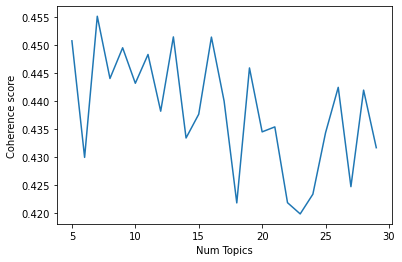

In [71]:
# Show graph
limit=30; start=5; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
#plt.savefig('20240221_PhD_MalletLDALtr-Coherence')
plt.show()

In [72]:
# Print the coherence and perplexity scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, 'Coherence: ', round(cv, 4))

Num Topics = 5 Coherence:  0.4508
Num Topics = 6 Coherence:  0.43
Num Topics = 7 Coherence:  0.4552
Num Topics = 8 Coherence:  0.4441
Num Topics = 9 Coherence:  0.4496
Num Topics = 10 Coherence:  0.4432
Num Topics = 11 Coherence:  0.4484
Num Topics = 12 Coherence:  0.4382
Num Topics = 13 Coherence:  0.4515
Num Topics = 14 Coherence:  0.4334
Num Topics = 15 Coherence:  0.4377
Num Topics = 16 Coherence:  0.4515
Num Topics = 17 Coherence:  0.44
Num Topics = 18 Coherence:  0.4218
Num Topics = 19 Coherence:  0.446
Num Topics = 20 Coherence:  0.4345
Num Topics = 21 Coherence:  0.4354
Num Topics = 22 Coherence:  0.4219
Num Topics = 23 Coherence:  0.4198
Num Topics = 24 Coherence:  0.4234
Num Topics = 25 Coherence:  0.4344
Num Topics = 26 Coherence:  0.4425
Num Topics = 27 Coherence:  0.4247
Num Topics = 28 Coherence:  0.442
Num Topics = 29 Coherence:  0.4317


In [73]:
# Coherence for 7-topic model
print(coherence_values[2])

# Topics for 7-topic model
malletModel_07d = model_list[2]
model_topics_07d = malletModel_07d.show_topics(formatted=False)
pprint(sorted(malletModel_07d.print_topics(num_words=20)))

# Convert results to lda model format for visualization.
MalletLDA07d = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(malletModel_07d)

# Visualize the topics
pyLDAvis.enable_notebook()
vis07d = pyLDAvis.gensim.prepare(MalletLDA07d, corpus, id2word, sort_topics=False)
vis07d

0.4552120223437409
[(0,
  '0.024*"life" + 0.023*"book" + 0.022*"heart" + 0.021*"hand" + 0.016*"work" + '
  '0.012*"friend" + 0.012*"mind" + 0.011*"world" + 0.009*"husband" + '
  '0.009*"paper" + 0.009*"kind" + 0.009*"copy" + 0.008*"trial" + 0.008*"care" '
  '+ 0.008*"interest" + 0.007*"age" + 0.007*"sorrow" + 0.007*"change" + '
  '0.007*"anxiety" + 0.006*"matter"'),
 (1,
  '0.048*"letter" + 0.042*"brother" + 0.042*"mother" + 0.038*"family" + '
  '0.036*"friend" + 0.032*"time" + 0.030*"sister" + 0.023*"health" + '
  '0.021*"child" + 0.019*"year" + 0.018*"wife" + 0.017*"death" + 0.017*"son" + '
  '0.015*"home" + 0.015*"daughter" + 0.015*"uncle" + 0.014*"aunt" + '
  '0.014*"father" + 0.012*"cousin" + 0.012*"write"'),
 (2,
  '0.035*"day" + 0.021*"town" + 0.016*"water" + 0.015*"house" + '
  '0.013*"morning" + 0.013*"boat" + 0.013*"room" + 0.012*"hour" + 0.012*"tree" '
  '+ 0.011*"night" + 0.011*"place" + 0.011*"side" + 0.010*"wood" + '
  '0.010*"river" + 0.010*"evening" + 0.009*"woman" + 0.

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.108653  0.058326       1        1  13.625067
1     -0.264431  0.120467       2        1  14.863467
2      0.253764  0.021177       3        1  13.551720
3     -0.143486  0.068945       4        1  16.661348
4      0.033987 -0.306193       5        1  15.693516
5     -0.001560 -0.191986       6        1  12.148169
6      0.230379  0.229265       7        1  13.456713, topic_info=        Term         Freq        Total Category  logprob  loglift
11    letter  1179.000000  1179.000000  Default  30.0000  30.0000
78      week   591.000000   591.000000  Default  29.0000  29.0000
57      time  1182.000000  1182.000000  Default  28.0000  28.0000
97    mother   389.000000   389.000000  Default  27.0000  27.0000
31   brother   398.000000   398.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
422     head    60.779488   117.451491   Topic7  -4.9359   1.3469
41      home    95.221198   538.626045   Topic7  -4.4870   0.2729
121    house    76.987352   371.597253   Topic7  -4.6995   0.4315
177     room    57.740514   185.230718   Topic7  -4.9872   0.8400
494      pay    40.519659    80.524577   Topic7  -5.3414   1.3189

[626 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
28        1  0.015315    account
28        2  0.500306    account
28        3  0.076577    account
28        4  0.290994    account
28        6  0.117419    account
...     ...       ...        ...
61        6  0.182468       year
62        3  0.268277  yesterday
62        4  0.008130  yesterday
62        7  0.723534  yesterday
5553      2  0.992086       youe

[969 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7])

Going to re-run the two best models with a more concentrated topic number range and more iterations and sleep on it. For now, saving in case the machine crashes.

In [75]:
MalletLDA07c.save('20240609_PhD_TopicLtrMAL07c')
pyLDAvis.save_html(vis07c, '20240609_PhD_TopicLtrMAL07c.html')

Re-start kernel

## 6. Final Test Runs

In [6]:
import pickle
import gensim
import gensim.corpora as corpora
from gensim.models import CoherenceModel
from pprint import pprint
import pyLDAvis
import pyLDAvis.gensim
import matplotlib.pyplot as plt
%matplotlib inline

# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
mallet_path = 'mallet-2.0.8/bin/mallet' # update this path

# Get it back
with open("20240608_PhD_LtrLem-N.txt", "rb") as fp:   # Unpickling
    data_lemmatizedNouns = pickle.load(fp)
    
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatizedNouns)

# Create Corpus
texts = data_lemmatizedNouns

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [7]:
def compute_coherence_values(dictionary, corpus, texts, limit, start, step):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word, random_seed=100, iterations=5000)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, 
                                                        corpus=corpus, 
                                                        texts=data_lemmatizedNouns, 
                                                        start=6, 
                                                        limit=16, 
                                                        step=1)

Mallet LDA: 6 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.70999
<20> LL/token: -8.32418
<30> LL/token: -8.13532
<40> LL/token: -8.02196

0	8.33333	time health life work summer hand letter friend year month interest son thing opportunity paper care pleasure change rest mind 
1	8.33333	letter time friend mother sister home girl father daughter wife death child husband news world heart baby return health happiness 
2	8.33333	dollar work money family brother pound house year man cent price business time board foot place kind number people pork 
3	8.33333	day night morning book weather room evening time place hour town woman week flower fear yesterday water spirit fall thing 
4	8.33333	week child letter time day school write home church winter cousin today boy bed snow fire brother place aunt trouble 
5	8.33333	country land year acre farm person pound wood people winter place horse river wheat road tree month farmer climate summer 

<460> LL/token: -7.69819
<470> LL/token: -7.70325
<480> LL/token: -7.69756
<490> LL/token: -7.69686

0	8.33333	life hand book heart year paper world mind friend husband interest people work care matter copy age son trial loss 
1	8.33333	letter time friend brother mother sister family health month home kind wife father daughter write news summer son answer account 
2	8.33333	work dollar people house man time money year business cent day lot water city pay kind place company pork expense 
3	8.33333	day morning room house town night time weather hour place evening woman bed flower clock water side tree end return 
4	8.33333	week child day home boy girl thing baby school uncle night aunt visit trouble cousin today winter church snow mail 
5	8.33333	country year land pound acre farm person place money winter month price crop summer wheat horse spring state number half 

<500> LL/token: -7.69605
<510> LL/token: -7.70129
<520> LL/token: -7.70089
<530> LL/token: -7.69991
<540> LL/token: -7.701

<910> LL/token: -7.68737
<920> LL/token: -7.68901
<930> LL/token: -7.6852
<940> LL/token: -7.68763

0	8.33333	life hand year book heart paper friend world husband interest mind people son death rest age spirit care matter copy 
1	8.33333	letter time friend brother mother sister family health home month father wife daughter write news summer pleasure account winter kind 
2	8.33333	work dollar people month man house time money cent day business city company kind foot pay expense lot captain water 
3	8.33333	day town house time morning room night place hour evening weather side water return end clock river wood boat church 
4	8.33333	week child day girl boy home thing baby visit uncle night aunt school today bed snow mail doctor trouble fire 
5	8.33333	country year land pound acre farm money person place winter crop price summer horse wheat home number farmer market state 

<950> LL/token: -7.69214
<960> LL/token: -7.69256
<970> LL/token: -7.68577
<980> LL/token: -7.69096
<990> LL/token: 

<1360> LL/token: -7.70271
<1370> LL/token: -7.69813
<1380> LL/token: -7.69806
<1390> LL/token: -7.70198

0	8.33333	life hand book friend heart world year husband work mind paper interest death matter spirit rest copy kind son change 
1	8.33333	letter time brother friend sister family health mother month home father wife summer winter daughter write news pleasure answer son 
2	8.33333	people work time man month year dollar house business money cent company city board day kind pay water reason captain 
3	8.33333	day town house room place time morning night evening hour church weather boat road side return water clock fire fall 
4	8.33333	week child home day girl boy thing baby school night visit aunt today bed snow mail mother trouble yesterday doctor 
5	8.33333	country land year pound acre farm money dollar person place crop price horse wheat winter number spring half summer farmer 

<1400> LL/token: -7.69957
<1410> LL/token: -7.70009
<1420> LL/token: -7.69693
<1430> LL/token: -7.69988


<1810> LL/token: -7.70409
<1820> LL/token: -7.70314
<1830> LL/token: -7.70201
<1840> LL/token: -7.69978

0	8.33333	life friend book heart hand mind world husband paper year interest rest trouble flower work age son matter spirit business 
1	8.33333	letter time brother friend sister health family mother month father wife home daughter summer winter write news kind answer death 
2	8.33333	people work time man month year day place city company business kind lot pay money reason captain government vessel dollar 
3	8.33333	day morning house town time room church place hour night water evening side weather boat clock fire wood road river 
4	8.33333	week child home day girl boy thing baby school night visit aunt mother bed today mail snow weather head doctor 
5	8.33333	country land year pound dollar money acre farm person crop price cent family winter wheat house summer place farmer market 

<1850> LL/token: -7.696
<1860> LL/token: -7.69508
<1870> LL/token: -7.69148
<1880> LL/token: -7.69015


<2260> LL/token: -7.68784
<2270> LL/token: -7.68593
<2280> LL/token: -7.68634
<2290> LL/token: -7.68761

0	8.33333	life hand book friend heart world mind year paper husband interest work care trouble age death matter flower copy spirit 
1	8.33333	letter time brother friend sister health family mother winter month father wife summer kind daughter write news son year uncle 
2	8.33333	people time work man month year business day kind lot city company place money thing pay captain government reason head 
3	8.33333	day morning town place room house night time home church hour water boat evening road weather side woman return tree 
4	8.33333	week child day home girl boy bed baby school visit aunt thing night today store mother snow mail weather doctor 
5	8.33333	country land pound dollar year acre money farm person cent crop price house wheat summer horse place farmer winter market 

<2300> LL/token: -7.69417
<2310> LL/token: -7.68538
<2320> LL/token: -7.6837
<2330> LL/token: -7.68934
<2340>

<2710> LL/token: -7.70061
<2720> LL/token: -7.70034
<2730> LL/token: -7.69909
<2740> LL/token: -7.70208

0	8.33333	life friend hand book heart world husband year paper interest work care mind son death age matter copy change comfort 
1	8.33333	letter time brother sister friend health family mother month winter father home daughter write news summer wife pleasure uncle year 
2	8.33333	time people work man business year kind place day lot city company thing month money office law reason captain pay 
3	8.33333	day town morning house night church water room place hour weather evening boat side tree end clock return fire home 
4	8.33333	week child day home girl boy bed baby school thing aunt visit night mother today store trouble house snow mail 
5	8.33333	country land pound year dollar acre money farm person cent crop price house summer wheat winter place farmer market horse 

<2750> LL/token: -7.7065
<2760> LL/token: -7.70696
<2770> LL/token: -7.70648
<2780> LL/token: -7.70549
<2790> LL/t

<3160> LL/token: -7.70275
<3170> LL/token: -7.70679
<3180> LL/token: -7.70641
<3190> LL/token: -7.71169

0	8.33333	life book hand heart friend husband mind paper world work interest care child year flower spirit death age matter son 
1	8.33333	letter time friend brother sister health family mother month winter home father summer daughter write news uncle answer son wife 
2	8.33333	people time work year man business place day month city money call lot company pay office state law head reason 
3	8.33333	day town water time place night room morning house hour river church boat home weather evening board tree side ship 
4	8.33333	week child day girl boy home thing bed baby house visit night school today weather store mother aunt evening trouble 
5	8.33333	country land pound year dollar acre farm money person cent crop price winter wheat house summer spring family farmer market 

<3200> LL/token: -7.7148
<3210> LL/token: -7.71337
<3220> LL/token: -7.70965
<3230> LL/token: -7.70776
<3240> LL

<3610> LL/token: -7.70453
<3620> LL/token: -7.7025
<3630> LL/token: -7.70777
<3640> LL/token: -7.69528

0	8.33333	life book heart friend hand world paper child mind husband kind care work trouble matter year flower copy age comfort 
1	8.33333	letter time friend brother sister health family mother winter month home summer daughter father write news death pleasure uncle son 
2	8.33333	people time year work man place business country month city company money state pay office lot law reason captain government 
3	8.33333	day town morning house place water hour night side river time boat evening room woman weather wood return church fire 
4	8.33333	week child day girl boy home bed night baby school visit thing house store today head weather yesterday snow mail 
5	8.33333	country land pound dollar year acre money farm person cent crop price work wheat winter house foot summer farmer market 

<3650> LL/token: -7.69973
<3660> LL/token: -7.70252
<3670> LL/token: -7.70244
<3680> LL/token: -7.7032

<4060> LL/token: -7.71425
<4070> LL/token: -7.70815
<4080> LL/token: -7.71164
<4090> LL/token: -7.7103

0	8.33333	life friend book heart hand paper kind husband mind work woman death year world son rest spirit trouble flower fear 
1	8.33333	letter time brother sister friend health family mother winter month home summer father write news daughter wife pleasure uncle answer 
2	8.33333	time people country man work year business place city company home month state office law reason government war mine lot 
3	8.33333	day town house place morning water time room hour evening night side boat church return wood fire weather ship board 
4	8.33333	week child day girl boy thing bed baby school night visit home aunt weather today store mother snow head doctor 
5	8.33333	country land pound year dollar money acre farm cent crop price person wheat house work foot horse farmer market potato 

<4100> LL/token: -7.71214
<4110> LL/token: -7.71876
<4120> LL/token: -7.72102
<4130> LL/token: -7.72042
<4140>

<4510> LL/token: -7.70624
<4520> LL/token: -7.71176
<4530> LL/token: -7.70592
<4540> LL/token: -7.70512

0	8.33333	life friend hand book heart child paper husband world death care work mind kind flower age son woman matter spirit 
1	8.33333	letter time brother friend sister health family mother month father winter summer write news year home kind pleasure uncle answer 
2	8.33333	people time year man work country business place home state company city month office difficulty law reason money government thing 
3	8.33333	day town water house place morning hour time night side river boat road evening room church fire ship tree weather 
4	8.33333	week child day boy girl home thing night baby school bed visit weather mother house trouble today store yesterday snow 
5	8.33333	country land pound year dollar money acre farm cent crop price house wheat foot person winter work horse summer farmer 

<4550> LL/token: -7.70541
<4560> LL/token: -7.70455
<4570> LL/token: -7.70515
<4580> LL/token: -7.7

<4960> LL/token: -7.71252
<4970> LL/token: -7.70487
<4980> LL/token: -7.70576
<4990> LL/token: -7.70522

0	8.33333	life friend hand book heart husband child year world work son mind kind death flower paper care age trouble matter 
1	8.33333	letter time brother sister friend health family mother month winter father day summer write news home wife uncle daughter answer 
2	8.33333	people time year country place man work business state month home city company lot office difficulty case reason government money 
3	8.33333	day town house morning water night place time hour side room river boat evening church weather wood return fall fire 
4	8.33333	week child day girl boy home bed baby school visit night thing aunt today store mother snow weather mail house 
5	8.33333	country land pound dollar year money acre farm person cent work price crop foot wheat kind winter house farmer spring 

<5000> LL/token: -7.712

Total time: 2 minutes 59 seconds
Mallet LDA: 7 topics, 3 topic bits, 111 topic mask

<360> LL/token: -7.75436
<370> LL/token: -7.75033
<380> LL/token: -7.75393
<390> LL/token: -7.74985

0	7.14286	life hand child book heart mind paper friend kind work husband rest age trouble boy spirit copy change trial anxiety 
1	7.14286	place people year month time business man world home company state manner happiness summer city comfort difficulty government war peace 
2	7.14286	day work house time room winter people water head week store snow bed boy deal fire foot woman lot door 
3	7.14286	letter time day week home girl weather baby news night thing visit pleasure return opportunity write writing picture leave mother 
4	7.14286	country land pound year dollar acre money farm cent crop price wheat person wood place farmer horse market potato cost 
5	7.14286	friend family brother letter sister health mother child year father wife daughter time son winter death kind country home uncle 
6	7.14286	day morning evening church side school town night boat hour yesterday child clock week ro

<760> LL/token: -7.75252
<770> LL/token: -7.74735
<780> LL/token: -7.75333
<790> LL/token: -7.75526

0	7.14286	life hand book heart work friend paper child mind world trouble woman age spirit kind husband care change copy dollar 
1	7.14286	country year people business man time place state summer city month company manner happiness person idea difficulty case account home 
2	7.14286	day work week room house winter time water bed thing head people store snow horse fire lot foot boy deal 
3	7.14286	letter time day week month girl baby news weather pleasure place home night return flower writing picture write thing trust 
4	7.14286	country land pound year dollar acre money farm cent crop price wheat place board wood farmer person market potato tree 
5	7.14286	friend brother mother letter sister family health child home time wife year daughter winter father summer son uncle aunt answer 
6	7.14286	day town morning evening church yesterday school hour night house boat today home child place w

<1160> LL/token: -7.75528
<1170> LL/token: -7.74889
<1180> LL/token: -7.75135
<1190> LL/token: -7.75782

0	7.14286	life hand book heart work child mind kind husband world paper friend change woman rest care year trouble copy spirit 
1	7.14286	people country place man year business time summer state city company situation difficulty person gentleman account home law month government 
2	7.14286	day house week work time bed winter room head water thing tea child snow store boy fire horse woman deal 
3	7.14286	letter time day month week girl home news baby weather pleasure write opportunity friend thing happiness place sister night flower 
4	7.14286	country land pound dollar year money acre farm cent crop price wheat person wood farmer work month market potato cost 
5	7.14286	brother mother friend letter family child sister health time son home wife year daughter winter death summer uncle boy aunt 
6	7.14286	day town morning night evening church school yesterday hour week today side home t

<1560> LL/token: -7.7711
<1570> LL/token: -7.7676
<1580> LL/token: -7.76395
<1590> LL/token: -7.76896

0	7.14286	life hand book heart child mind husband work friend paper rest spirit copy kind trouble age eye death change world 
1	7.14286	people year country man business place state month company time case world person difficulty interest city summer climate reason situation 
2	7.14286	day week house work time room thing boy school bed child store water head tea girl night snow foot winter 
3	7.14286	letter time day month home week news baby friend pleasure girl place weather kind thing health opportunity happiness trust return 
4	7.14286	country land pound dollar year acre farm money cent crop price wheat place person work farmer wood market potato bushel 
5	7.14286	brother mother letter family friend sister child winter year health time home daughter summer son uncle aunt wife answer account 
6	7.14286	day town morning evening church home night house yesterday hour river side clock b

<1960> LL/token: -7.78761
<1970> LL/token: -7.77769
<1980> LL/token: -7.78268
<1990> LL/token: -7.78154

0	7.14286	life hand book heart child husband kind mind friend work paper spirit world age copy change woman trouble loss trial 
1	7.14286	people country year man business city time place company idea difficulty matter state reason world government prospect war rest office 
2	7.14286	week day work time house school room bed head child boy thing water store snow girl fire people pay lot 
3	7.14286	letter time month day baby home pleasure weather girl news winter friend week night opportunity happiness thing summer place return 
4	7.14286	country land pound year dollar acre money farm cent crop price wheat place person wood farmer market potato cost month 
5	7.14286	brother mother family friend letter sister health child time wife year home daughter son uncle winter aunt death answer cousin 
6	7.14286	day morning town evening place home church yesterday river night hour house today clo

<2360> LL/token: -7.75534
<2370> LL/token: -7.76088
<2380> LL/token: -7.76234
<2390> LL/token: -7.76029

0	7.14286	life hand book heart work mind paper husband friend world child age rest spirit copy trouble care kind eye change 
1	7.14286	people year country man business place time home state company case month difficulty city person climate reason government war situation 
2	7.14286	week day boy work school room bed child house water thing time night girl today store head woman tea lot 
3	7.14286	letter time day month week news baby home weather winter pleasure girl friend place opportunity health happiness return picture trust 
4	7.14286	country land pound dollar year acre farm money cent crop price work house wheat person place board farmer market foot 
5	7.14286	brother mother friend family letter child sister health year wife home daughter son time uncle death summer answer aunt account 
6	7.14286	day town morning evening church yesterday night hour house place side clock boat sh

<2760> LL/token: -7.77259
<2770> LL/token: -7.77897
<2780> LL/token: -7.7685
<2790> LL/token: -7.76249

0	7.14286	life hand book heart work child husband paper mind world friend spirit interest copy trouble rest trial power anxiety age 
1	7.14286	year people country man business time state place company case situation difficulty expense city law climate person government home war 
2	7.14286	week day time bed child work boy house water head thing woman school today night store tea room girl fire 
3	7.14286	letter time day month news baby week girl pleasure winter health friend place weather sister return home write happiness picture 
4	7.14286	country land pound dollar year money acre farm work cent crop price wheat person place house farmer market board cost 
5	7.14286	brother letter mother family friend sister child home health wife time daughter year death son uncle father aunt answer winter 
6	7.14286	day town morning evening church place yesterday home house night side river clock 

<3160> LL/token: -7.76191
<3170> LL/token: -7.77168
<3180> LL/token: -7.77161
<3190> LL/token: -7.76892

0	7.14286	life book hand heart work paper mind husband friend spirit age kind woman world copy change trouble child trial loss 
1	7.14286	people country year man business time state city place home situation company difficulty case month reason world person government interest 
2	7.14286	week day child bed work time thing house school girl boy today store water head tea snow lot woman horse 
3	7.14286	letter time day month home baby week pleasure news weather winter place opportunity summer happiness write sister return trust night 
4	7.14286	country land pound dollar year acre money farm work cent crop price place wheat person house foot board farmer market 
5	7.14286	friend brother mother family letter sister health child year wife daughter son father uncle death home aunt winter answer account 
6	7.14286	day morning town evening church night place yesterday hour room house boat r

<3560> LL/token: -7.77233
<3570> LL/token: -7.77598
<3580> LL/token: -7.78082
<3590> LL/token: -7.77925

0	7.14286	life hand book heart work world mind friend child husband rest paper spirit woman age copy trouble change care trial 
1	7.14286	people country year man business state place company home interest difficulty case government time climate office city war month meeting 
2	7.14286	week day boy bed child time girl school night work head house today store room thing tea snow water visit 
3	7.14286	letter time day month home baby weather winter news place pleasure friend week summer kind health opportunity happiness write spring 
4	7.14286	country land pound dollar money acre year farm place work cent crop person price wheat house farmer foot market summer 
5	7.14286	brother mother letter family friend sister child health wife year son daughter home death uncle aunt answer account father time 
6	7.14286	day town evening morning church hour river night boat yesterday side house plac

<3960> LL/token: -7.77323
<3970> LL/token: -7.77182
<3980> LL/token: -7.77034
<3990> LL/token: -7.76731

0	7.14286	life hand book heart work paper world friend husband kind rest mind girl copy age woman eye child loss trial 
1	7.14286	people year country man business state time place home city case company difficulty mind month law reason government interest party 
2	7.14286	week child day bed baby boy girl school thing head night work today store room time snow morning visit tea 
3	7.14286	letter time day month place news home health weather pleasure friend winter summer opportunity write return happiness thing spring trust 
4	7.14286	country land pound dollar year money acre farm work person cent crop price wheat foot farmer market house potato cost 
5	7.14286	brother mother family friend sister letter home time child year wife health son daughter death uncle winter father aunt answer 
6	7.14286	day town house church morning water hour evening river boat night side road board ship wo

<4360> LL/token: -7.75997
<4370> LL/token: -7.76304
<4380> LL/token: -7.76982
<4390> LL/token: -7.76838

0	7.14286	life hand book heart work mind paper husband friend world age rest spirit woman trouble copy care change trial anxiety 
1	7.14286	people country year man business time place home state company case month difficulty city interest government office reason party law 
2	7.14286	week child day boy girl bed baby time night school visit work today head room thing morning store home snow 
3	7.14286	letter time day month news friend weather winter pleasure place health home thing kind summer opportunity return happiness writing trust 
4	7.14286	country land pound year dollar acre money farm work cent crop price person wheat place horse foot farmer market potato 
5	7.14286	brother mother family friend letter sister child year health son time wife daughter death uncle aunt home father cousin winter 
6	7.14286	day town water house church evening morning hour river boat night side road

<4760> LL/token: -7.75655
<4770> LL/token: -7.75674
<4780> LL/token: -7.7606
<4790> LL/token: -7.76095

0	7.14286	life hand book heart work paper mind world friend husband age copy spirit woman care trial anxiety loss change eye 
1	7.14286	people country man year time business work month home place state city company difficulty office reason government interest war party 
2	7.14286	week child day girl night boy bed baby school thing today store visit room yesterday house island snow woman head 
3	7.14286	letter time day month news winter weather place home friend pleasure kind summer thing opportunity return happiness trust darling health 
4	7.14286	country land pound year dollar acre money farm cent crop price work person wheat place farmer foot market house potato 
5	7.14286	brother mother family friend letter sister health year child son home wife daughter death uncle father aunt answer winter time 
6	7.14286	day town morning water church house evening boat river hour place tree sid

<160> LL/token: -7.78744
<170> LL/token: -7.78458
<180> LL/token: -7.79206
<190> LL/token: -7.78617

0	6.25	letter time month write news friend day account sister world place weather happiness thing flower spirit care writing pleasure manner 
1	6.25	pound dollar money year country man cent people house pay expense difficulty cost board work lot government store number cow 
2	6.25	friend brother mother family health sister year letter son father wife death child daughter home uncle aunt answer cousin kind 
3	6.25	hand life book heart paper mind work interest kind age matter fear copy husband trouble trial power order return woman 
4	6.25	day winter time people work month country place town summer business thing city home snow rest weather man person state 
5	6.25	land country year acre farm wood foot crop horse wheat kind garden person spring farmer market tree potato bushel building 
6	6.25	day room morning house hour evening water side night company boat church woman return end place 

<510> LL/token: -7.76258
<520> LL/token: -7.76649
<530> LL/token: -7.75811
<540> LL/token: -7.76406

0	6.25	letter time day news month friend pleasure health home account weather opportunity write place happiness writing sister picture trust manner 
1	6.25	dollar year money work man people country cent month board company account case government wage expense property gold employment cost 
2	6.25	friend brother mother family sister child letter son health father death wife daughter year uncle kind aunt answer cousin spring 
3	6.25	life hand book heart interest world mind paper spirit age woman matter copy trouble work comfort trial husband power anxiety 
4	6.25	time home winter day summer place people business month work country city rest snow state change weather reason thing week 
5	6.25	country land year pound acre farm crop price horse wheat person money tree farmer place market potato bushel foot house 
6	6.25	day town morning house hour water river night boat church side evening p

<860> LL/token: -7.77076
<870> LL/token: -7.77352
<880> LL/token: -7.76301
<890> LL/token: -7.77244

0	6.25	letter time month friend news pleasure home kind account sister write opportunity health return manner happiness day writing weather deal 
1	6.25	dollar man year people money country work business cent company pay expense board account government wage office number captain respect 
2	6.25	friend brother mother family letter sister health child son year father death wife daughter uncle aunt cousin home doctor word 
3	6.25	life book heart hand world interest mind paper spirit age work matter woman husband copy eye trial power anxiety sorrow 
4	6.25	time day winter home summer place country work people month week city weather thing snow situation change town reason state 
5	6.25	land country pound year acre farm money person crop price horse wheat foot house farmer market potato wood bushel seed 
6	6.25	day house town water morning hour night side evening boat room place fire ship r

<1210> LL/token: -7.77364
<1220> LL/token: -7.77072
<1230> LL/token: -7.76736
<1240> LL/token: -7.77167

0	6.25	letter time news month pleasure friend sister place write opportunity manner happiness return weather home writing picture health darling spring 
1	6.25	year man people dollar work country money cent business company month expense board pay government captain wage state office gold 
2	6.25	friend brother mother family health sister letter year son child death wife daughter house uncle kind aunt father cousin answer 
3	6.25	life book heart hand interest mind paper world husband matter copy work trial care spirit anxiety power woman age sorrow 
4	6.25	time day home winter summer place work country people month thing week city snow change situation rest weather business reason 
5	6.25	land country pound year acre farm dollar money crop price wheat person farmer foot market potato bushel half horse spring 
6	6.25	day town water morning house river boat side room hour wood place f

<1560> LL/token: -7.77063
<1570> LL/token: -7.76293
<1580> LL/token: -7.76399
<1590> LL/token: -7.76516

0	6.25	letter time friend health kind sister pleasure news day home opportunity place month return happiness flower girl writing trust manner 
1	6.25	year man people work business company country difficulty pay money city state government office board property law lot party gold 
2	6.25	brother mother family friend letter year sister child son death health wife daughter uncle aunt house cousin account father answer 
3	6.25	life book hand heart mind work world spirit paper interest matter husband copy eye woman trial power sorrow age anxiety 
4	6.25	time day home winter month summer place country week people work thing weather snow town rest change situation prospect rain 
5	6.25	country land pound dollar acre year farm money crop price cent wheat foot horse person farmer market spring potato bushel 
6	6.25	day house town morning water room hour river boat side place road night fire 

<1910> LL/token: -7.77295
<1920> LL/token: -7.77524
<1930> LL/token: -7.76754
<1940> LL/token: -7.77388

0	6.25	letter time friend news place pleasure health father return sister day opportunity month write manner happiness flower writing picture kind 
1	6.25	people year man business work country city company state captain head office government interest lot money law party month gold 
2	6.25	brother mother family friend letter sister health son death child wife daughter house uncle aunt year cousin dollar trouble kind 
3	6.25	life book heart hand mind paper world matter woman husband copy work spirit age trial anxiety pen kind sorrow rest 
4	6.25	time day home winter summer month work week country place weather year people thing spring snow change town situation reason 
5	6.25	country land pound acre dollar farm year money cent crop price person wheat farmer potato market bushel horse seed wage 
6	6.25	day house water town morning hour river boat night side evening tree place room fir

<2260> LL/token: -7.77431
<2270> LL/token: -7.77439
<2280> LL/token: -7.77235
<2290> LL/token: -7.76893

0	6.25	letter time friend news kind pleasure sister month health day opportunity write manner happiness return father writing picture trust deal 
1	6.25	people year man country business city company lot work government interest money office state law gold case reason party fact 
2	6.25	brother friend mother family letter sister year health child son death wife daughter uncle aunt cousin home answer kind father 
3	6.25	book hand life heart mind work paper world matter trouble spirit copy woman trial anxiety husband age flower eye pen 
4	6.25	time day home winter month place summer work week weather country thing spring people church snow situation town year account 
5	6.25	land country pound acre dollar farm year money cent crop price person wheat farmer market potato bushel wood foot wage 
6	6.25	day house water town morning hour night place river boat road side tree fire ship eveni

<2610> LL/token: -7.76462
<2620> LL/token: -7.76826
<2630> LL/token: -7.77129
<2640> LL/token: -7.771

0	6.25	letter time month friend news sister health pleasure kind day return opportunity home deal happiness manner father picture trust writing 
1	6.25	people year man work business city company lot country money office law case reason government gold provision fact party head 
2	6.25	friend brother mother family letter sister son death health wife child year daughter uncle aunt cousin home house father kind 
3	6.25	life book heart hand paper mind work world husband spirit interest copy care trial power anxiety age sorrow nature gentleman 
4	6.25	time day winter home place summer country month week town weather people snow thing account spring person church situation prospect 
5	6.25	country land pound year dollar acre farm money cent crop house price wheat person work farmer market bushel potato wage 
6	6.25	day water morning house hour night town river boat road side evening wood pl

<2960> LL/token: -7.77796
<2970> LL/token: -7.7765
<2980> LL/token: -7.78045
<2990> LL/token: -7.78111

0	6.25	letter time friend day news month health pleasure sister return manner happiness opportunity life write weather writing deal trust father 
1	6.25	people year man business work company time city country office reason government place lot party gold state mine fact side 
2	6.25	brother mother friend family letter sister son death wife child health daughter year home uncle aunt kind cousin house father 
3	6.25	life hand book heart work paper mind world husband spirit matter copy trouble interest trial age anxiety pen sorrow fear 
4	6.25	time day home winter country place summer month week year spring snow weather account town people church situation change rest 
5	6.25	land country pound dollar acre farm year money person cent crop price wheat farmer market potato work bushel wood wage 
6	6.25	day house morning room town water night boat hour river tree side fire evening board se

<3310> LL/token: -7.76968
<3320> LL/token: -7.767
<3330> LL/token: -7.76686
<3340> LL/token: -7.77319

0	6.25	letter time friend day sister health month kind news return pleasure write home opportunity happiness manner weather writing father picture 
1	6.25	people man year business work company city time office lot month government state party mind gold war fact country gentleman 
2	6.25	brother mother friend family letter sister child year health death wife son daughter home uncle answer aunt cousin money kind 
3	6.25	life book heart work hand paper husband world mind age matter trouble interest copy fear loss trial anxiety change spirit 
4	6.25	time place day winter home country summer month spring week year account weather situation snow thing respect climate person town 
5	6.25	country land pound dollar acre farm year money cent crop price wheat work person farmer market potato cost bushel house 
6	6.25	day house water town morning hour river boat evening side tree room fire ship w

<3660> LL/token: -7.77632
<3670> LL/token: -7.77363
<3680> LL/token: -7.77279
<3690> LL/token: -7.77564

0	6.25	letter time day month pleasure news health kind return home friend weather opportunity write happiness father sister writing deal trust 
1	6.25	people year man business time work city company lot interest mind government office party head money gold fact side state 
2	6.25	brother mother family friend sister letter year child health death wife daughter son uncle aunt answer time home cousin father 
3	6.25	life book hand heart work paper husband world friend mind matter age rest copy eye spirit trial power anxiety woman 
4	6.25	place day winter country time home summer month spring town church thing week snow account situation year weather respect climate 
5	6.25	country land pound dollar year acre farm money work cent crop price person wheat farmer potato market foot bushel cost 
6	6.25	day house water morning hour town place boat night wood river tree side board ship road ev

<4010> LL/token: -7.75792
<4020> LL/token: -7.76483
<4030> LL/token: -7.76082
<4040> LL/token: -7.7621

0	6.25	letter time day month friend pleasure home father kind health opportunity write sister news happiness return writing trust girl darling 
1	6.25	work people year man business time city company office lot government kind party gold head fact law interest duty war 
2	6.25	brother mother family friend letter year child sister health death wife daughter son home uncle aunt cousin house answer doctor 
3	6.25	life hand book heart world mind husband friend paper work copy trouble interest spirit loss trial anxiety age matter rest 
4	6.25	place day country winter summer time home month weather church town spring thing account situation snow change people respect climate 
5	6.25	country land pound dollar year acre farm money cent crop price wheat person farmer potato market cost bushel wage seed 
6	6.25	day water house morning hour town side evening boat tree night river room board wood

<4360> LL/token: -7.75876
<4370> LL/token: -7.75538
<4380> LL/token: -7.76001
<4390> LL/token: -7.76461

0	6.25	letter time friend home news month pleasure day write health father kind opportunity return happiness deal weather sister writing trust 
1	6.25	people year man time work business city company month place office lot government state party call gold kind fact head 
2	6.25	family brother mother friend sister health year child son death wife letter daughter home uncle aunt cousin house answer kind 
3	6.25	life book heart hand work mind paper world husband woman friend spirit copy matter interest trial anxiety age power sorrow 
4	6.25	day country place winter time home summer month account situation church weather person snow idea climate difficulty spring thing people 
5	6.25	land country pound year acre dollar farm money cent price crop wheat farmer work foot market potato person bushel cost 
6	6.25	day house water town hour morning night evening room boat road river side ship b

<4710> LL/token: -7.76871
<4720> LL/token: -7.77342
<4730> LL/token: -7.76193
<4740> LL/token: -7.76129

0	6.25	letter time month news friend sister day pleasure health weather write kind return opportunity happiness father picture trust deal darling 
1	6.25	people work man time year business lot city kind company place reason government office head mind party gold fact money 
2	6.25	brother family mother friend letter year sister health son wife daughter home death child uncle aunt cousin kind answer father 
3	6.25	book life heart hand work mind paper friend husband world matter interest child copy trial power spirit change age care 
4	6.25	country place day home winter month summer time church thing situation person account idea snow state rest climate difficulty spring 
5	6.25	country land pound year dollar acre farm money cent crop price wheat work house farmer person market potato bushel wage 
6	6.25	day house town water hour morning river boat room tree night side board evening w

<60> LL/token: -7.95936
<70> LL/token: -7.93053
<80> LL/token: -7.91424
<90> LL/token: -7.88307

0	5.55556	day book room spirit house people town work fire table hand head door winter service mind description window arrival opinion 
1	5.55556	people man horse company river person lot state number expense island country business government vessel seed climate cow gold provision 
2	5.55556	time month girl thing week day home weather bed kind boy fear manner school trouble garden return city dinner acquaintance 
3	5.55556	friend letter death sister hand life husband place paper time mother heart son picture mind darling matter care account trouble 
4	5.55556	letter time brother family health winter mother summer sister home month write uncle daughter wife cousin aunt son answer snow 
5	5.55556	day house water wood town tree board place cent boat tea road spring half pork person captain store side sea 
6	5.55556	year life world woman kind pleasure letter work business happiness flower trus

<410> LL/token: -7.79136
<420> LL/token: -7.80101
<430> LL/token: -7.80189
<440> LL/token: -7.79234

0	5.55556	book room work house hand winter mind spirit fire servant table idea order anxiety door thing town window street gentleman 
1	5.55556	people country year man business work state company place reason time government climate gold provision party war meeting city fact 
2	5.55556	time day month thing weather place week school girl letter deal night garden head manner account rain lady dinner box 
3	5.55556	friend child death heart trouble life husband son sister wife interest mother matter hand care change place loss mind trial 
4	5.55556	letter brother family health time mother sister summer friend winter write year home uncle answer aunt cousin daughter spring month 
5	5.55556	day house town water tree boat wood side river board morning foot ship store building sea ground road tea piece 
6	5.55556	letter kind life home world year girl father return happiness comfort paper flower

<760> LL/token: -7.78416
<770> LL/token: -7.77834
<780> LL/token: -7.79376
<790> LL/token: -7.79192

0	5.55556	work book hand time house room mind spirit thing copy anxiety door table town pen woman servant hour fire eye 
1	5.55556	people country man business year place state company work office government war city person rest party gold meeting fact home 
2	5.55556	time day month place weather letter thing week deal night garden account spring manner rain lady air heat walk frost 
3	5.55556	friend life child death heart year husband son mother family paper interest trouble change matter account age wife sister loss 
4	5.55556	brother letter time sister winter friend mother family health summer home write uncle aunt answer cousin wife daughter year line 
5	5.55556	day house water town tree morning river boat wood road place side horse hour foot board ship captain sea vessel 
6	5.55556	letter kind girl pleasure father return care news home happiness health flower picture trust darling o

<1110> LL/token: -7.79823
<1120> LL/token: -7.80483
<1130> LL/token: -7.81173
<1140> LL/token: -7.80787

0	5.55556	book work hand mind time paper thing room copy spirit eye woman anxiety house table door change idea servant nature 
1	5.55556	people country man year business time work place company state month lot city government war gold fact provision party interest 
2	5.55556	day time place month winter weather thing account garden snow spring town week home night people manner deal lady description 
3	5.55556	friend life death heart year husband child trouble son world rest age money matter family situation mother account kind wife 
4	5.55556	time brother letter mother family health sister friend summer home uncle aunt answer winter cousin country wife year daughter write 
5	5.55556	day water town house morning tree river boat side hour road board ship wood sea vessel foot ground evening passage 
6	5.55556	letter home kind girl return pleasure father news sister opportunity happines


0	5.55556	work book hand thing mind life spirit paper copy servant table anxiety time nature idea eye difficulty fear question night 
1	5.55556	people man country business year place money company work state government reason month time war gold city meeting fact provision 
2	5.55556	day time winter month place weather summer home account thing spring garden snow deal town manner week climate country lady 
3	5.55556	friend death year heart life child husband trouble kind world rest change age son hand interest care loss blessing trial 
4	5.55556	letter brother mother time family health sister home friend daughter uncle wife year aunt answer son cousin write month news 
5	5.55556	water day town house morning river boat side hour tree road place wood ship evening room captain night sea ground 
6	5.55556	letter time sister return girl kind pleasure father opportunity happiness flower writing picture trust news darling health home woman prayer 
7	5.55556	week child day boy baby school nig

<1760> LL/token: -7.80121
<1770> LL/token: -7.8023
<1780> LL/token: -7.79784
<1790> LL/token: -7.80436

0	5.55556	book work hand spirit paper mind thing interest copy eye life difficulty anxiety pen boy idea mail nature pay matter 
1	5.55556	people man work business country time year city place company lot government war state month reason party money gold fact 
2	5.55556	day time month place winter weather summer home town country spring account garden snow thing manner deal church lady climate 
3	5.55556	friend life child heart husband kind trouble year world death account rest hand age change dollar son loss trial power 
4	5.55556	brother mother letter family time sister health home friend year daughter uncle aunt answer son wife cousin write money week 
5	5.55556	day water house side river morning boat road night wood tree hour room foot town ship fire sea board place 
6	5.55556	letter time girl health sister return father news kind opportunity happiness flower writing picture trus

<2110> LL/token: -7.7887
<2120> LL/token: -7.79394
<2130> LL/token: -7.79397
<2140> LL/token: -7.79427

0	5.55556	work book thing paper interest spirit mind hand difficulty life copy anxiety pen prospect eye pay nature mail fear table 
1	5.55556	people man country business work year time company place lot city government state month day reason gold case war provision 
2	5.55556	day month place time winter home summer weather country town garden snow account spring thing manner climate rain deal lady 
3	5.55556	friend life year heart husband kind world child hand trouble death age rest matter son change loss trial power comfort 
4	5.55556	brother mother letter time family health home friend sister wife year uncle daughter aunt answer son cousin write house father 
5	5.55556	day house water town morning night tree river side boat hour road room wood fire board ship sea horse evening 
6	5.55556	letter time girl sister kind news pleasure return friend opportunity happiness flower picture h

<2460> LL/token: -7.79376
<2470> LL/token: -7.79557
<2480> LL/token: -7.79542
<2490> LL/token: -7.798

0	5.55556	book work thing home mind paper interest hand life spirit difficulty copy fear anxiety eye mail table term face character 
1	5.55556	people work man business year time city place country lot reason money company month government day office gold side fact 
2	5.55556	day time month place winter weather summer country town home garden thing manner person spring rain account attention lady air 
3	5.55556	friend life heart year world kind husband trouble death care child change dollar rest age hand son loss trial power 
4	5.55556	brother mother family health time letter friend year sister daughter uncle son aunt wife cousin home child winter account father 
5	5.55556	day house water morning room tree hour boat night board town evening wood river road fire side ship sea door 
6	5.55556	letter time sister home pleasure return girl news write opportunity father happiness kind night 

<2810> LL/token: -7.80272
<2820> LL/token: -7.80441
<2830> LL/token: -7.80148
<2840> LL/token: -7.80514

0	5.55556	book mind paper work interest life hand thing home spirit difficulty copy eye anxiety fear idea prospect character term woman 
1	5.55556	people work man year time business country place money company city government reason call gold field provision fact month lot 
2	5.55556	day month place time winter summer country weather home church town garden manner person spring state people lady account air 
3	5.55556	friend life heart world trouble child husband kind death hand care son rest age matter dollar change year trial power 
4	5.55556	family brother mother year health sister letter time daughter home friend winter wife uncle house aunt summer cousin son child 
5	5.55556	day water morning house town room hour night boat side tree fire river road sea board door ship clock horse 
6	5.55556	letter time news home pleasure sister friend girl return kind write health happiness op


0	5.55556	book work life paper home interest mind thing spirit hand copy mail difficulty account idea anxiety fear nature term character 
1	5.55556	people work man year time business country city place month company day home state government war gold reason side mine 
2	5.55556	day place time month winter country summer weather manner town garden spring person climate people thing deal rain account attention 
3	5.55556	friend heart life year husband trouble death world rest hand change son age kind doctor care child case dollar trial 
4	5.55556	brother family mother health sister letter friend wife time house uncle daughter child aunt money winter cousin summer son home 
5	5.55556	day house water room night morning hour river boat tree town side board fire ship evening road sea door woman 
6	5.55556	letter time home girl news pleasure write sister kind return happiness friend flower father writing opportunity picture weather darling answer 
7	5.55556	week child day boy baby school nig

<3460> LL/token: -7.80392
<3470> LL/token: -7.80469
<3480> LL/token: -7.80516
<3490> LL/token: -7.80415

0	5.55556	book work interest life thing paper mind spirit hand difficulty copy eye mail anxiety nature term idea character matter face 
1	5.55556	people work man year business country place time city company month lot office reason government town party state gold field 
2	5.55556	day place country winter month summer time weather home people garden manner person town spring climate church lady account description 
3	5.55556	friend life heart child husband world death kind year change trouble care hand age rest son trial blessing wife loss 
4	5.55556	brother family mother letter health year home friend sister daughter time uncle aunt son wife cousin father house summer winter 
5	5.55556	day house water morning room night hour boat tree town side river fire ship board evening sea vessel door fall 
6	5.55556	letter time sister home girl pleasure news month return write opportunity hap

<3790> LL/token: -7.78422

0	5.55556	book work interest paper spirit mind thing difficulty home hand copy life eye anxiety fear mail table pay nature term 
1	5.55556	people man work year business time place company city lot country month reason money office government war gold mine fact 
2	5.55556	day place country month winter summer time town weather person manner garden church climate account spring prospect people lady description 
3	5.55556	friend life heart child husband trouble kind world hand death rest doctor age change matter care case loss trial situation 
4	5.55556	brother family mother letter sister health year child friend daughter time home wife son uncle winter house aunt cousin money 
5	5.55556	day house water morning town night hour room boat side tree river evening board ship sea fire passage piece ground 
6	5.55556	letter time home news girl pleasure month friend sister write return opportunity health happiness father flower writing deal darling weather 
7	5.55556	w

<4110> LL/token: -7.79869
<4120> LL/token: -7.80101
<4130> LL/token: -7.80015
<4140> LL/token: -7.8067

0	5.55556	book work life thing interest hand paper home spirit mind difficulty copy eye anxiety nature term expense mail matter pleasure 
1	5.55556	people man work time country business place year city company month day lot government money office law gold fact reason 
2	5.55556	day place time country winter month summer weather town church garden spring people manner account person attention lady description heat 
3	5.55556	friend life heart year husband trouble child world death kind doctor change care hand mind dollar situation loss trial age 
4	5.55556	brother family mother letter health year sister winter child friend son wife uncle daughter aunt home summer cousin house father 
5	5.55556	day water house morning room hour boat tree river night evening side board home fire ship sea woman door horse 
6	5.55556	letter time home sister month news friend write return girl opportunity


0	5.55556	book work mind paper interest hand life thing spirit fear copy anxiety difficulty flower idea eye home nature character mail 
1	5.55556	people man work time year business day month place city country company government money lot reason war state provision gold 
2	5.55556	day place country month winter time summer weather town garden person manner account climate spring church people attention lady description 
3	5.55556	friend life heart husband kind world trouble rest child change care doctor death year hand woman loss trial son power 
4	5.55556	family brother mother year sister health letter child daughter home winter house wife uncle son aunt summer friend account answer 
5	5.55556	day house water morning night room board river home boat town side road tree hour fire ship evening sea door 
6	5.55556	letter time home news friend girl write sister return health opportunity pleasure father writing month happiness picture deal weather darling 
7	5.55556	week day child school 

<4760> LL/token: -7.79968
<4770> LL/token: -7.80077
<4780> LL/token: -7.80551
<4790> LL/token: -7.80498

0	5.55556	book work life thing interest paper mind home fear flower copy woman eye spirit hand pleasure term face mail nature 
1	5.55556	people work man place year time business country company city month government money reason gold fact lot party war law 
2	5.55556	day place winter time country month weather town summer garden person happiness prospect church manner spring people attention lady climate 
3	5.55556	friend heart life trouble kind husband hand death world year rest dollar doctor change child care loss age trial matter 
4	5.55556	brother family health mother sister child friend year letter daughter son wife uncle summer aunt cousin account house winter home 
5	5.55556	day water morning house room night river boat hour town tree side board ship evening bed home sea woman clock 
6	5.55556	letter time home month news write girl return sister week father mother day opportu

<60> LL/token: -7.95553
<70> LL/token: -7.93491
<80> LL/token: -7.91636
<90> LL/token: -7.89513

0	5	house work town people day horse half board pork water servant door ship gold provision boat vessel employment meeting company 
1	5	year business world life hand account difficulty home captain fear order flower man state expense mind trouble case property description 
2	5	girl room night boy woman hand bed time thing mail child week fire trouble window street illness change writing mind 
3	5	day time home evening letter week morning uncle aunt today night visit weather return yesterday clock leave mother address news 
4	5	friend book heart work paper life wife husband death kind dollar picture son age letter matter care mother darling copy 
5	5	child week day school church baby store thing spirit spring doctor home tomorrow trial blessing snow fever town pain anxiety 
6	5	country land pound year money dollar acre farm cent crop price wheat person kind farmer market cost bushel wage pot

<360> LL/token: -7.82117
<370> LL/token: -7.80606
<380> LL/token: -7.79921
<390> LL/token: -7.80808

0	5	work house people horse city board water tea half thing pork day vessel ship gold provision deal employment view box 
1	5	year people business man interest state world difficulty reason case government life expense gentleman mind fact matter power character party 
2	5	time girl hand room woman night boy mind thing mail fire head table picture tomorrow eye writing door window walk 
3	5	home day letter time week mother evening aunt weather yesterday return visit today year morning leave news night dinner rain 
4	5	life book heart paper friend work husband kind wife care son copy dollar change death world loss trial age sorrow 
5	5	child week day baby school house trouble church bed doctor wife boy trust island spirit captain store prospect town thing 
6	5	country land pound year money dollar acre farm cent crop price wheat place farmer market person bushel cost wage family 
7	5	letter

<660> LL/token: -7.80491
<670> LL/token: -7.80287
<680> LL/token: -7.79857
<690> LL/token: -7.81002

0	5	work house cent horse pay people water day board foot month thing cow tea provision gold employment cost pork flour 
1	5	people year man business interest state case city difficulty home company government party reason world power term fact character law 
2	5	time girl room hand thing woman night boy head picture table fire tomorrow change spirit life mind writing eye door 
3	5	letter home time week day baby mother visit news aunt yesterday weather today evening mail night fear return morning leave 
4	5	life book heart work friend husband kind paper world age child death dollar care copy rest loss trial son sorrow 
5	5	child week day school bed trouble house boy church doctor island store town prospect pain fortnight call care snow service 
6	5	country land pound year dollar acre farm money crop price person wheat place farmer market bushel wage spring half lot 
7	5	friend brother f

<960> LL/token: -7.81193
<970> LL/token: -7.8175
<980> LL/token: -7.82541
<990> LL/token: -7.8261

0	5	work cent thing month pay board house people dollar water horse day gold tea provision employment foot box clothe vessel 
1	5	year people man business interest city country case company state home government expense matter difficulty party office power character fact 
2	5	girl hand time room woman boy mind thing head night life change fire writing idea spirit table eye door pen 
3	5	home letter time week day mother baby visit news today night mail morning yesterday weather tomorrow rest return leave aunt 
4	5	book life work heart friend paper husband kind child death world copy age care trial loss son sorrow dollar comfort 
5	5	child week house school bed day trouble boy church evening doctor island town store captain kind pork call snow fortnight 
6	5	country land pound year acre farm money dollar crop price wheat person place farmer market bushel wood wage neighbour trade 
7	5	broth

<1260> LL/token: -7.83982
<1270> LL/token: -7.84688
<1280> LL/token: -7.84964
<1290> LL/token: -7.84505

0	5	work month cent water house dollar time pay foot lot thing day horse kind people gold provision man mine box 
1	5	people year business man interest country company state case difficulty city government power office world matter meeting side fact expense 
2	5	hand room time girl mind life head woman night boy account thing change idea call spirit fire door table hour 
3	5	letter home time day mother week baby visit night news mail thing weather morning paper girl yesterday tomorrow writing leave 
4	5	book heart work life friend husband kind paper world trouble copy age loss trial anxiety son child sorrow year care 
5	5	child week bed school house today day church store doctor boy island trouble town snow tea evening afternoon pork fortnight 
6	5	country land pound year acre farm money dollar place crop price person wheat farmer market bushel wage winter potato tree 
7	5	brother f

<1560> LL/token: -7.8329
<1570> LL/token: -7.83541
<1580> LL/token: -7.83326
<1590> LL/token: -7.83155

0	5	work dollar cent house month water people horse pay foot day cost board time kind gold provision flour box tea 
1	5	people year man business country state interest company city government office world law difficulty home meeting character fortune war fact 
2	5	hand room time mind girl head life woman thing night fire idea bed table eye hour door pen spirit sister 
3	5	letter time home day week baby mother night boy girl thing news weather mail morning paper picture tomorrow darling word 
4	5	book life heart work friend husband paper kind age copy rest trouble trial death care change child loss son sorrow 
5	5	child week school house day evening today visit boy bed church yesterday town island doctor captain store trouble afternoon snow 
6	5	country land pound year acre farm money crop price dollar wheat person place farmer market wood bushel wage spring mill 
7	5	brother family s

<1860> LL/token: -7.83526
<1870> LL/token: -7.8309
<1880> LL/token: -7.8351
<1890> LL/token: -7.83298

0	5	work cent dollar water month horse pound foot cost house kind board day pay gold provision money flour time good 
1	5	year people man business country interest company city state government home office difficulty character party fact law thousand duty matter 
2	5	time hand room mind woman night life account bed sister girl head fire change idea table eye door hour window 
3	5	letter time home week day mother baby thing girl boy news write night answer paper lot care tomorrow picture darling 
4	5	book life heart husband work friend paper kind child age world copy son loss care trial rest sorrow trouble anxiety 
5	5	child week day school house today evening boy doctor church visit yesterday captain call island bed trouble store afternoon tea 
6	5	country land year pound acre farm dollar money crop price person place wheat farmer market bushel wage wood cow half 
7	5	brother family f

<2160> LL/token: -7.83864
<2170> LL/token: -7.833
<2180> LL/token: -7.82444
<2190> LL/token: -7.83055

0	5	work dollar cent month horse house day thing pay foot water board kind gold provision passage money mine people clothe 
1	5	people year man business country interest company city state month government power difficulty place office expense party meeting fact world 
2	5	hand room mind woman time night life account change girl idea head fire eye table thing servant door hour spirit 
3	5	time letter home mother week day baby girl boy write news night lot care answer thing tomorrow picture leave visit 
4	5	life book heart work husband friend paper age child copy kind death loss trouble trial world care sorrow son nature 
5	5	week child school day bed boy evening church today visit house store island yesterday town captain snow morning doctor pork 
6	5	country land pound year acre farm money dollar place crop price person wheat farmer market wood bushel wage spring winter 
7	5	brother 

<2460> LL/token: -7.82858
<2470> LL/token: -7.82703
<2480> LL/token: -7.83057
<2490> LL/token: -7.83362

0	5	work cent house day dollar month water horse pay foot money board thing gold provision people tea deal flour box 
1	5	people man year business country interest city office company government power state side reason case month law fact meeting character 
2	5	time room hand mind thing night woman life head spirit fire hour girl change eye bed door idea account mail 
3	5	letter time home mother week baby girl write night news day sister boy leave darling writing picture thing aunt call 
4	5	life book heart work husband paper world friend age care child copy fear dollar loss trial kind hand trouble sorrow 
5	5	week child day school boy visit evening today church bed yesterday store morning island town captain trouble snow vessel doctor 
6	5	country land pound year acre farm money dollar person crop price wheat place farmer market bushel wage potato wood winter 
7	5	brother friend fa

<2760> LL/token: -7.82498
<2770> LL/token: -7.83379
<2780> LL/token: -7.82995
<2790> LL/token: -7.83256

0	5	work cent house water foot month dollar horse day people spring board thing gold provision cost pay money deal kind 
1	5	people man year business country interest company city office place state government reason power month party law fact war matter 
2	5	time hand room mind woman night head thing life idea fire change rest eye table door pen window order servant 
3	5	letter time home mother girl sister baby boy week write night news day answer thing writing mail lot leave call 
4	5	book work heart life friend husband paper world copy age loss trial flower kind sorrow trouble care son parent comfort 
5	5	week child day school bed evening today visit church morning yesterday store island captain trouble town boy afternoon weather tea 
6	5	country land pound year acre farm dollar money person crop price wheat place farmer market bushel summer wage potato winter 
7	5	brother family

<3060> LL/token: -7.82011
<3070> LL/token: -7.82216
<3080> LL/token: -7.82484
<3090> LL/token: -7.82555

0	5	work dollar cent month horse thing day foot pay water house people spring money cow board gold provision cost flour 
1	5	people year man business interest country city company office place time state government power world fact case law month fortune 
2	5	hand room mind time night head girl change fire woman account idea table eye door pen hour bed thing window 
3	5	letter time home mother week write sister baby day girl news boy thing night writing mail answer picture leave call 
4	5	life book heart work friend husband paper kind world age copy child son flower trial loss sorrow death nature care 
5	5	week child day school boy bed evening today visit church yesterday morning island captain snow pork afternoon tea fortnight vessel 
6	5	country land pound acre year farm money dollar person crop price wheat place farmer market bushel wage wood summer trade 
7	5	brother family frie

<3360> LL/token: -7.83063
<3370> LL/token: -7.81754
<3380> LL/token: -7.82207
<3390> LL/token: -7.82678

0	5	work dollar cent foot house horse month cost pay water money people spring board cow provision kind potato flour clothe 
1	5	people year man business country city interest state company government office power difficulty month matter place meeting fact heat world 
2	5	hand room mind time woman girl change bed thing fire night eye table life trouble rest head anxiety door hour 
3	5	letter time home mother day baby week girl write news night thing sister boy answer mail picture paper call lot 
4	5	book heart friend life husband work paper world copy kind age loss trial care sorrow flower nature death trouble son 
5	5	week child day school visit today evening boy yesterday snow morning church island bed house store captain afternoon tea tomorrow 
6	5	country land pound year acre farm money person dollar crop price place wheat wood farmer market bushel wage employment trade 
7	5	fam

<3660> LL/token: -7.82217
<3670> LL/token: -7.82233
<3680> LL/token: -7.82123
<3690> LL/token: -7.82991

0	5	work dollar house cent month horse foot water board pay kind money thing cow gold provision cost lot flour clothe 
1	5	people year man business country city interest home place state office company government law party thing difficulty power fact reason 
2	5	time hand room life night woman mind girl rest change bed table idea eye fire servant hour friend door pen 
3	5	letter time home day week mother baby write girl news boy mail sister night writing answer thing picture leave care 
4	5	work book life heart husband paper kind copy age care friend world loss trial sorrow trouble son nature mind parent 
5	5	week child day school boy visit church evening today house town yesterday morning snow bed island captain tea store pork 
6	5	country land pound acre year farm money dollar person crop price wheat place farmer market bushel wage wood half potato 
7	5	brother friend family siste

<3960> LL/token: -7.82413
<3970> LL/token: -7.82134
<3980> LL/token: -7.82311
<3990> LL/token: -7.81745

0	5	work dollar cent month water horse house kind pay board foot cow provision gold thing box seed clothe money tea 
1	5	people year country man business interest state place city company office government party fact difficulty reason month fortune meeting character 
2	5	hand room woman bed time night girl head rest idea fire friend thing change life eye door table mind servant 
3	5	letter time home mother baby write day girl sister week boy news night thing answer writing mail leave picture folk 
4	5	life work book heart paper husband world age mind kind copy care loss trial friend sorrow flower illness trouble parent 
5	5	week child day school boy today evening home morning church snow visit island yesterday town captain vessel pork house store 
6	5	country land pound year acre money farm dollar crop price wheat person farmer market bushel wage wood half winter trade 
7	5	family b

<4260> LL/token: -7.82505
<4270> LL/token: -7.81745
<4280> LL/token: -7.81986
<4290> LL/token: -7.81976

0	5	work dollar month cent water house day kind horse people foot board thing spring lot pay gold provision deal flour 
1	5	people year man business country interest state company place city time government office matter heat meeting party world character difficulty 
2	5	hand room mind head life woman night bed change rest fire table servant friend girl anxiety door hour trouble eye 
3	5	letter time home day mother week baby girl boy write night sister news thing answer writing leave call mail darling 
4	5	life book heart work husband friend paper age world copy kind care loss trial son sorrow illness parent death fear 
5	5	week child school home visit church evening today day yesterday store bed island morning house boy captain tea vessel town 
6	5	country land pound year acre farm money dollar crop price wheat farmer market bushel person place wage wood employment trade 
7	5	broth

<4560> LL/token: -7.81128
<4570> LL/token: -7.81238
<4580> LL/token: -7.8225
<4590> LL/token: -7.82102

0	5	work time dollar cent month house water money horse foot board pay cost provision gold spring seed clothe dress flour 
1	5	people year man business country city interest state place company office case government world reason fact power fortune matter character 
2	5	hand room mind woman night girl change rest bed life trouble head fire thing table eye idea door account servant 
3	5	letter time home mother write baby week sister day boy news thing girl answer night mail writing word leave lot 
4	5	book heart work life paper husband friend world age kind copy loss trial son sorrow flower care nature term fear 
5	5	week child day school home visit church evening today morning boy snow island captain yesterday bed town vessel store pork 
6	5	country land pound year acre farm dollar money place crop price person wheat wood farmer market bushel wage potato cow 
7	5	brother family frien

<4860> LL/token: -7.82306
<4870> LL/token: -7.82106
<4880> LL/token: -7.82847
<4890> LL/token: -7.82635

0	5	work day cent month dollar water horse time foot house pay spring deal money kind provision board gold mine thing 
1	5	people year man business country time state place company interest government case city office party law reason meeting fact side 
2	5	hand room mind woman night girl life head bed table trouble eye thing rest servant fire door pen change window 
3	5	letter time home mother day week baby write sister news boy thing girl night answer mail picture leave writing call 
4	5	life book heart work world friend husband paper age copy care flower trial kind sorrow fear comfort term loss nature 
5	5	week child day school visit home boy yesterday today evening snow church tea captain island morning store vessel bed town 
6	5	country land pound year acre farm dollar money crop price person wheat farmer place market bushel wage house cow situation 
7	5	brother family friend s

<160> LL/token: -7.8378
<170> LL/token: -7.84012
<180> LL/token: -7.82838
<190> LL/token: -7.82053

0	4.54545	book heart life work trouble world paper trust year doctor blessing copy son power trial case anxiety nature interest parent 
1	4.54545	people man year business office thing company law city state war government interest party fact time gold expense duty opinion 
2	4.54545	land pound country acre dollar farm year money cent crop price wheat farmer market cost bushel spring wage seed kind 
3	4.54545	child home week boy school church visit account today mail opportunity fear fever illness order prospect leave spirit fortnight meeting 
4	4.54545	house place town country people wood day person month snow road difficulty manner door garden climate idea horse heat side 
5	4.54545	family brother year health summer winter country friend month money work son wife dollar place line reason house trade acquaintance 
6	4.54545	time day weather home head place winter rest spring mine pleasur

<410> LL/token: -7.78346
<420> LL/token: -7.79782
<430> LL/token: -7.79689
<440> LL/token: -7.80096

0	4.54545	book life work paper trouble world copy doctor trial heart anxiety case interest nature parent power story affection trust son 
1	4.54545	people year business man office state city country company government war mind party interest difficulty time reason fact matter end 
2	4.54545	land country pound year dollar acre farm money cent price crop wheat farmer market bushel wage seed cost person potato 
3	4.54545	child week home boy school visit today store church mail island account prospect service leave pork trust meeting lesson class 
4	4.54545	place town day house wood country person tree people summer road garden winter month horse manner ground door climate river 
5	4.54545	family brother health friend year month wife summer money son spring daughter country winter place line sister call acquaintance word 
6	4.54545	time day work winter weather home head girl place snow mine

<680> LL/token: -7.80505
<690> LL/token: -7.80718

0	4.54545	book work life paper thing trouble copy case interest anxiety doctor trial fear nature home expense parent pen power story 
1	4.54545	people man year business country company month city government war state party office opinion law fact interest difficulty time mind 
2	4.54545	land country pound acre farm dollar year money cent crop price wheat person farmer market bushel wage potato work cost 
3	4.54545	week child home boy school baby today visit store island girl church tea town house pork tomorrow lesson minute prospect 
4	4.54545	place day town country wood house summer month tree road garden winter people person climate church home manner ground river 
5	4.54545	brother family health year friend wife son money winter summer country account dollar sister house daughter spring pay trouble paper 
6	4.54545	time day work home place head week weather winter lot pleasure mine deal snow attention girl folk dress change hand 
7	

<960> LL/token: -7.79431
<970> LL/token: -7.79699
<980> LL/token: -7.80131
<990> LL/token: -7.80723

0	4.54545	book work life paper trouble hand thing interest case copy mind trial anxiety expense doctor fear nature parent dollar servant 
1	4.54545	people year man business country company kind city government state war office month party fact difficulty matter number side circumstance 
2	4.54545	country land pound acre dollar farm year money cent crop price wheat person farmer market potato cost bushel wage work 
3	4.54545	child week boy baby school home today visit store island girl church town pork tea trouble tomorrow fortnight lesson call 
4	4.54545	place day town month wood tree summer road country winter garden manner house church person river climate idea lady description 
5	4.54545	family brother friend year health wife son summer winter money country account daughter sister month house spring respect line word 
6	4.54545	time day work home place weather lot head winter mine he

<1210> LL/token: -7.80165
<1220> LL/token: -7.79752
<1230> LL/token: -7.7969
<1240> LL/token: -7.79337

0	4.54545	book life hand work paper interest copy case trial anxiety nature parent fear son term servant debt affection story trouble 
1	4.54545	people year man business country state office difficulty company government law war month city fact world number mind side kind 
2	4.54545	land country pound dollar acre year farm money price crop wheat person cent farmer bushel market cost potato wage horse 
3	4.54545	child week boy baby school girl today home store trouble island visit church doctor pork fortnight call cough tea tomorrow 
4	4.54545	place day town winter country month time wood weather home road tree garden summer river person climate church manner idea 
5	4.54545	family brother health friend year wife summer son winter month account daughter money sister country line spring word respect living 
6	4.54545	time day work place people week head snow lot mine deal home change t

<1480> LL/token: -7.79004
<1490> LL/token: -7.8091

0	4.54545	book life mind hand paper work copy spirit anxiety trial case nature interest servant trouble power expense affection story matter 
1	4.54545	year people man country business government war office interest city state difficulty party world fact company law bank earth character 
2	4.54545	land country pound dollar acre farm year money cent crop price wheat person farmer potato bushel market wage horse house 
3	4.54545	child week boy baby school girl home visit today doctor store island trouble church yesterday tomorrow snow fortnight pork cough 
4	4.54545	day place winter town month summer weather home wood garden road time tree church person manner spring account lady spirit 
5	4.54545	family brother health friend year son winter uncle wife account country summer money month daughter sister line house respect living 
6	4.54545	time work day place people week deal mine head home paper thing lot company foot dress folk money l

<1730> LL/token: -7.7905
<1740> LL/token: -7.79771

0	4.54545	book hand life work paper mind spirit copy interest trial anxiety case nature boy pen matter mail fear thing trouble 
1	4.54545	year man people business country difficulty government war state office power world reason party city law character kind interest thousand 
2	4.54545	country land pound dollar acre year farm money crop price wheat farmer market bushel wood cent person wage cow house 
3	4.54545	week child boy baby school home visit today yesterday church thing store island doctor girl evening weather afternoon trouble pork 
4	4.54545	day month place winter time country summer town weather garden home tree manner road wood happiness idea prospect attention lady 
5	4.54545	family brother health friend year son uncle summer winter house wife daughter death account country blessing line spring change sister 
6	4.54545	time day work place people week lot mine money head deal snow foot company folk fellow paper likeness sh

<1990> LL/token: -7.80631

0	4.54545	book life hand mind work paper spirit copy anxiety trial interest case nature parent mail trouble power expense story table 
1	4.54545	people year man business country law government war office city state difficulty party side interest company world circumstance gentleman thousand 
2	4.54545	land country pound acre year dollar farm money crop price wheat farmer market bushel person wage wood horse house cent 
3	4.54545	week child boy baby school visit today night yesterday church island store evening girl weather doctor home change fortnight trouble 
4	4.54545	day place time month winter summer weather town country garden wood happiness person manner prospect home attention spring lady account 
5	4.54545	family brother friend health year son daughter winter uncle wife sister summer country death house account line aunt trouble kind 
6	4.54545	day time work place week people mine lot snow month head deal money company water paper folk foot likeness t

<2240> LL/token: -7.8008

0	4.54545	book life mind hand work paper spirit copy interest trial anxiety pen case servant parent thing story doubt affection expense 
1	4.54545	year people man country business difficulty state law office government war party meeting fortune gentleman matter world circumstance number interest 
2	4.54545	country land pound acre dollar farm year money crop price wheat person farmer market bushel house wood wage cow cent 
3	4.54545	week child boy baby school night home girl yesterday today weather visit church evening island store aunt trouble tomorrow pork 
4	4.54545	day time place winter summer month garden country weather person climate happiness spring trust manner prospect attention lady description health 
5	4.54545	family brother friend health year son winter uncle kind wife summer daughter account doctor country death blessing line respect aunt 
6	4.54545	time day work place week money people month mine lot company deal head city snow business dollar w

<2470> LL/token: -7.81506
<2480> LL/token: -7.82031
<2490> LL/token: -7.8069

0	4.54545	book paper hand life work mind home interest spirit copy case fear anxiety pen nature trouble parent matter story mail 
1	4.54545	people man year business country difficulty city office law state government side party meeting war gentleman character bank world thousand 
2	4.54545	country land pound year acre dollar farm money crop price wheat person farmer market house bushel wood wage potato horse 
3	4.54545	week child boy baby school visit girl today night church evening store island yesterday home tomorrow weather trouble aunt call 
4	4.54545	day time winter summer month place country weather happiness garden manner person account health attention lady trust heat description order 
5	4.54545	family brother friend health son year uncle winter daughter kind wife sister account summer child death doctor house money line 
6	4.54545	time work day place week head month lot money mine deal company thing

<2720> LL/token: -7.80829
<2730> LL/token: -7.80813
<2740> LL/token: -7.80943

0	4.54545	book life hand mind paper work copy spirit interest trial matter case anxiety home nature servant story affection pen truth 
1	4.54545	people year country man business state difficulty law government office party meeting company fortune service circumstance world interest feeling war 
2	4.54545	country land pound dollar acre year farm money crop price person wheat cent house farmer market bushel wood wage horse 
3	4.54545	week child boy night school baby girl evening today church visit yesterday island home store morning weather tomorrow snow afternoon 
4	4.54545	day time winter month place summer country weather health garden trust manner happiness person pleasure comfort climate attention lady description 
5	4.54545	family brother friend health son uncle child aunt wife year daughter winter summer mother death kind account sister doctor trouble 
6	4.54545	work time day place month money people mi

<2960> LL/token: -7.81201
<2970> LL/token: -7.80536
<2980> LL/token: -7.80718
<2990> LL/token: -7.81274

0	4.54545	book hand life mind paper work spirit trouble interest copy anxiety pen trial care nature case table mail affection story 
1	4.54545	year people man country business state difficulty office government law world city meeting gentleman matter character side rate fortune circumstance 
2	4.54545	land country pound dollar acre farm year money crop price wheat cent farmer market wood bushel wage person cow trade 
3	4.54545	week child boy night baby school visit today yesterday evening island call store day bed girl weather tomorrow morning church 
4	4.54545	day time winter place country month summer weather health happiness garden person manner spring trust idea pleasure year attention lady 
5	4.54545	brother family friend health son year mother uncle aunt summer winter death daughter cousin child wife sister house kind doctor 
6	4.54545	work time day place month people home mon

<3210> LL/token: -7.81442
<3220> LL/token: -7.81206
<3230> LL/token: -7.81477
<3240> LL/token: -7.81762

0	4.54545	book hand life work mind paper spirit change interest copy trial anxiety pen nature case trouble parent thing matter servant 
1	4.54545	people year country man business state office difficulty world war gentleman government party city law character fortune side body meeting 
2	4.54545	country land pound dollar year acre farm money cent crop price wheat farmer market bushel person wood wage horse cost 
3	4.54545	week child day baby school boy night girl visit today evening weather yesterday island bed trouble snow afternoon morning church 
4	4.54545	day time winter place month summer country spring weather happiness garden friend account health trust person attention year manner pleasure 
5	4.54545	brother family friend health child son year uncle wife mother aunt winter death sister summer money daughter doctor line cousin 
6	4.54545	time work day place month people week m

<3470> LL/token: -7.82311
<3480> LL/token: -7.82311
<3490> LL/token: -7.82824

0	4.54545	life book hand mind change work paper heart copy spirit trial anxiety fear case matter pen parent trouble interest story 
1	4.54545	people country year man business state office interest difficulty government war law party meeting bank company town situation quarter expense 
2	4.54545	land country pound dollar year acre farm money cent price crop wheat farmer person market bushel wage wood house place 
3	4.54545	week child boy day baby night school girl today visit evening yesterday island tomorrow church bed call afternoon weather store 
4	4.54545	day winter time month summer weather place country health happiness garden account manner hand trust spring lady prayer person description 
5	4.54545	brother family friend health son child sister year uncle aunt mother death wife daughter kind winter house account summer doctor 
6	4.54545	work time place day month people head mine lot pay city money rest

<3730> LL/token: -7.82747
<3740> LL/token: -7.8263

0	4.54545	book work hand life paper mind copy interest change trial anxiety spirit matter pen trouble parent case nature story affection 
1	4.54545	people year business country man state difficulty office law government party world meeting call character war fortune side bank thousand 
2	4.54545	land country pound dollar acre year farm money price crop cent wheat person market farmer bushel wage house wood cost 
3	4.54545	week child day night baby boy school girl today visit evening store island yesterday church bed trouble tea afternoon tomorrow 
4	4.54545	day time winter place country weather month summer health happiness garden manner friend attention trust prayer spring lady description person 
5	4.54545	brother family friend year health mother son child wife sister uncle aunt winter daughter summer kind father death cousin account 
6	4.54545	time work day place month money people lot company week pay city head home mine house res

<3990> LL/token: -7.82362

0	4.54545	life book hand work paper change spirit copy mind trial anxiety pen interest heart servant trouble parent power doubt affection 
1	4.54545	year people business man country state matter difficulty office government war interest party city meeting world fortune company circumstance character 
2	4.54545	country land pound dollar acre year farm money cent crop price wheat person farmer market bushel house wage wood tree 
3	4.54545	week child day baby boy school night today evening visit morning girl island church yesterday trouble bed store afternoon pork 
4	4.54545	day time month place winter country summer weather health happiness garden spring person manner prospect account attention friend lady description 
5	4.54545	brother family friend year health son winter uncle wife aunt child kind daughter summer death mother account sister money line 
6	4.54545	time work place day people month deal home money snow reason mine man company lot week gold city r


0	4.54545	book life work hand paper mind copy change interest spirit anxiety trial expense trouble matter son parent nature story affection 
1	4.54545	year people business man country state office government difficulty party war character city case fortune world law interest town meeting 
2	4.54545	country land pound dollar acre year farm money crop price wheat farmer cent market person bushel wood wage horse mill 
3	4.54545	week child day night boy school baby visit today evening yesterday morning store church girl island bed weather tomorrow fortnight 
4	4.54545	day time winter month country summer place weather health garden account manner happiness trust prospect attention spring lady year description 
5	4.54545	family brother friend health year sister mother son uncle aunt winter daughter wife child kind summer death house account father 
6	4.54545	work time place day people home month week money rest lot head mine snow company deal man house gold fellow 
7	4.54545	board thing ca


0	4.54545	book life hand work paper spirit interest thing copy trouble mind trial anxiety change matter son servant pen case order 
1	4.54545	year people country business man state difficulty office government party meeting town law land case war circumstance thousand situation company 
2	4.54545	country land pound dollar acre farm year money crop price wheat cent farmer market bushel person wage potato cow horse 
3	4.54545	week day child baby school boy night girl today yesterday visit evening morning island snow store bed weather afternoon church 
4	4.54545	day time month winter summer place country health weather happiness garden year spring manner account deal trust climate person lady 
5	4.54545	brother family year friend child health son uncle aunt wife mother sister winter death daughter account doctor summer line kind 
6	4.54545	work time day place month people city money lot week reason rest head company mine kind man house mind deal 
7	4.54545	board thing ship boat captain w

<4760> LL/token: -7.82874
<4770> LL/token: -7.83057
<4780> LL/token: -7.82512
<4790> LL/token: -7.82765

0	4.54545	book hand life paper mind work interest copy year trial spirit anxiety trouble matter change nature case doubt affection story 
1	4.54545	people country business year man situation state difficulty government world war party meeting office law fortune thousand city bank interest 
2	4.54545	country land pound year acre dollar farm money cent crop price wheat farmer market person bushel potato wage kind trade 
3	4.54545	week child boy day baby night school visit evening today yesterday girl island bed church trouble afternoon morning tomorrow head 
4	4.54545	day time month winter weather summer place country happiness health garden manner account person comfort attention trust description deal spring 
5	4.54545	brother family health year friend mother son child uncle wife aunt sister cousin summer daughter winter account house doctor death 
6	4.54545	work time day month week

Mallet LDA: 12 topics, 4 topic bits, 1111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.0395
<20> LL/token: -8.5339
<30> LL/token: -8.29625
<40> LL/token: -8.17118

0	4.16667	friend brother family sister health year wife husband son letter father death line paper money trial interest answer living kindness 
1	4.16667	time letter day month winter summer cousin pleasure weather opportunity happiness snow health deal garden news prayer home blessing spring 
2	4.16667	book life work daughter heart child copy friend hand law kind case spirit home son place woman account boy heat 
3	4.16667	hand girl world bed mind house woman rest room table power heart servant account visit anxiety home hour eye question 
4	4.16667	time water work home day side river boat place board tree horse sea foot fellow fire night man town government 
5	4.16667	letter thing time write place kind picture month news weather fall sister tomorrow writing attention fever lady day fact meet

<260> LL/token: -7.85172
<270> LL/token: -7.84901
<280> LL/token: -7.84949
<290> LL/token: -7.84125

0	4.16667	friend family brother health son wife sister year daughter father dollar money kind death husband account line answer word sorrow 
1	4.16667	time day winter month summer weather health country pleasure opportunity happiness garden deal spring home snow father manner attention lady 
2	4.16667	work book life heart paper copy interest kind business age city case fear matter character fortune death soul story truth 
3	4.16667	hand world woman life rest mind change fire eye child girl spirit trial heart pen husband thing year night care 
4	4.16667	water day side boat river tree ship time foot head captain board sea work vessel hour fellow passage office morning 
5	4.16667	letter time sister friend write news place thing month writing darling picture leave kind girl care prayer fever answer call 
6	4.16667	people situation home difficulty mind company life reason trouble party expen

<510> LL/token: -7.82009
<520> LL/token: -7.83396
<530> LL/token: -7.8265
<540> LL/token: -7.83061

0	4.16667	family friend brother sister health kind wife father son daughter year death account blessing line husband loss money living word 
1	4.16667	day winter time month summer health spring country weather happiness opportunity garden snow pleasure home year manner attention lady trust 
2	4.16667	work book life paper age copy kind friend heart home interest trial dollar fear story son mail success business history 
3	4.16667	hand life world woman heart girl thing spirit mind child change rest husband anxiety comfort pen care eye sorrow flower 
4	4.16667	day water river time boat tree work morning ship hour side foot captain board vessel arrival place end horse passage 
5	4.16667	letter time mother write news place sister month friend thing darling answer care picture leave writing pleasure girl folk call 
6	4.16667	people home state case situation time office reason mind difficulty p

<760> LL/token: -7.83115
<770> LL/token: -7.8297
<780> LL/token: -7.83552
<790> LL/token: -7.83399

0	4.16667	family brother friend sister year health wife father son daughter mother account death money blessing word line kind husband living 
1	4.16667	month day winter time summer health weather country home happiness pleasure garden kind spring manner opportunity trust deal snow climate 
2	4.16667	work book paper life age copy trial dollar business interest pleasure fear son story anxiety success gentleman daughter history bread 
3	4.16667	hand life heart friend woman girl child world mind death room spirit husband bed kind care eye pen change sorrow 
4	4.16667	day water river boat time board side foot hour ship captain vessel tree place passage sea fellow provision number voyage 
5	4.16667	letter time mother news write sister friend thing place darling answer month writing girl picture leave mine cousin folk care 
6	4.16667	people situation state time case matter difficulty person of

<1010> LL/token: -7.83309
<1020> LL/token: -7.83222
<1030> LL/token: -7.82753
<1040> LL/token: -7.82418

0	4.16667	family brother friend year health sister wife father son daughter mother summer money death kind account line living blessing house 
1	4.16667	time day month country winter summer health pleasure weather garden manner happiness spring attention prayer lady trust account person return 
2	4.16667	work book paper life age copy trial anxiety son business home interest fear thing story care class pay position gentleman 
3	4.16667	hand friend heart husband life child world kind death mind dollar woman girl loss eye rest trouble change room darling 
4	4.16667	water tree boat river day hour side time ship foot captain sea vessel ground passage provision end view bed fellow 
5	4.16667	letter time mother write news home sister place answer month friend opportunity picture writing leave deal cousin mine folk woman 
6	4.16667	state people situation case difficulty office home mind int

<1260> LL/token: -7.83417
<1270> LL/token: -7.83986
<1280> LL/token: -7.84082
<1290> LL/token: -7.82709

0	4.16667	family brother friend year health sister wife mother son daughter father death money line account kind summer living blessing life 
1	4.16667	time day winter month summer country health pleasure happiness weather trust garden spring attention manner year opportunity air prayer return 
2	4.16667	book work paper life copy care trial age letter interest mind spirit thing son anxiety story gentleman mail truth position 
3	4.16667	hand friend heart world life husband kind child girl woman eye darling trouble loss room death rest bed sorrow flower 
4	4.16667	water river day boat morning tree board side ship hour sea vessel woman foot time land passage fall view end 
5	4.16667	letter time home mother place write sister news month friend answer cousin thing writing picture deal leave opportunity girl folk 
6	4.16667	people state situation case difficulty home person account expens

<1510> LL/token: -7.83732
<1520> LL/token: -7.84008
<1530> LL/token: -7.84412
<1540> LL/token: -7.83987

0	4.16667	family brother friend health year daughter sister mother father wife son summer money kind account death house dollar word line 
1	4.16667	time month winter country day summer weather pleasure happiness garden health manner spring return trust kind place lady year heat 
2	4.16667	book work paper life thing copy trial age boy home son anxiety trouble care story term fear success interest position 
3	4.16667	hand heart friend life husband child death world girl kind mind change woman eye loss sorrow darling illness flower care 
4	4.16667	water day side river boat hour tree sea vessel ship board passage morning foot woman bed view arrival voyage good 
5	4.16667	letter time home mother sister write friend news answer cousin month place writing picture opportunity leave girl deal folk thinking 
6	4.16667	people situation case state difficulty interest mind person power home par

<1760> LL/token: -7.82978
<1770> LL/token: -7.83603
<1780> LL/token: -7.83224
<1790> LL/token: -7.83584

0	4.16667	family brother friend year health sister wife daughter mother son father kind summer money death line account living winter call 
1	4.16667	time day month winter summer weather place health happiness garden pleasure country spring return letter manner prayer account attention lady 
2	4.16667	book work paper thing life copy trouble anxiety home trial son spirit interest story flower pay call position mail care 
3	4.16667	life hand heart friend child world husband girl death kind woman rest mind eye age loss dollar change bed sorrow 
4	4.16667	water boat river side tree board captain sea foot vessel morning ship hour passage woman land view number piece article 
5	4.16667	letter time home mother write news sister friend cousin answer month place girl writing picture leave deal folk opportunity glad_hear 
6	4.16667	country people business situation state case difficulty mind 

<2010> LL/token: -7.83885
<2020> LL/token: -7.84883
<2030> LL/token: -7.84425
<2040> LL/token: -7.8495

0	4.16667	brother family friend year health wife sister kind winter account son summer father daughter death money line blessing word living 
1	4.16667	time letter month day summer health place country winter happiness garden weather deal spring pleasure trust father manner prayer return 
2	4.16667	book work paper life trouble thing copy son anxiety interest spirit home trial fear story pen success position writing age 
3	4.16667	friend hand heart life child husband kind woman rest death mind dollar girl change year eye sister world bed sorrow 
4	4.16667	water boat day hour board river ship captain sea vessel foot tree number end passage side arrival sort view morning 
5	4.16667	letter time mother home write sister news cousin friend answer care picture girl writing leave month folk opportunity address glad_hear 
6	4.16667	country people business state situation expense case person m

<2260> LL/token: -7.85281
<2270> LL/token: -7.85266
<2280> LL/token: -7.85353
<2290> LL/token: -7.85854

0	4.16667	family brother friend health year sister son wife father kind money summer daughter winter death mother line account spring word 
1	4.16667	time letter month day country summer place happiness garden weather winter pleasure return health manner opportunity account prayer kind trust 
2	4.16667	book paper life work copy thing trial spirit anxiety trouble interest home heart story fear success writing truth sum position 
3	4.16667	hand child friend life husband heart woman kind girl death dollar mind world sister change loss eye flower daughter sorrow 
4	4.16667	water boat hour side tree captain sea board vessel river ship passage foot view day good voyage article luggage bed 
5	4.16667	letter time mother home write news answer sister girl cousin boy month friend care week picture writing address folk aunt 
6	4.16667	country year people business situation state home person ca

<2510> LL/token: -7.84961
<2520> LL/token: -7.85255
<2530> LL/token: -7.84829
<2540> LL/token: -7.8423

0	4.16667	family brother friend year health sister son summer wife kind account mother father daughter winter money death line answer living 
1	4.16667	time letter day month weather winter summer country health happiness pleasure garden place spring deal manner trust father opportunity return 
2	4.16667	book work paper life mind thing copy spirit trial anxiety fear son pleasure pen interest call story care success truth 
3	4.16667	friend life heart child hand husband kind death girl woman dollar world daughter year flower care room change loss trouble 
4	4.16667	water boat tree board ship foot vessel sea side river hour piece passage number good voyage scene article luggage captain 
5	4.16667	letter time mother home write sister news girl month cousin aunt leave answer boy writing picture lot friend folk glad_hear 
6	4.16667	country business people state case situation year difficult

<2760> LL/token: -7.8501
<2770> LL/token: -7.85529
<2780> LL/token: -7.85203
<2790> LL/token: -7.84945

0	4.16667	family brother friend health year son sister wife kind father account daughter winter money mother summer line blessing uncle living 
1	4.16667	time letter month day winter summer happiness weather garden pleasure manner health place country opportunity spring prayer trust attention kind 
2	4.16667	book work paper life mind thing copy trouble anxiety hand spirit care interest trial son pleasure debt pen story sum 
3	4.16667	life heart child friend death girl husband woman hand world age eye sister loss sorrow dollar daughter year flower darling 
4	4.16667	water boat tree board ship foot vessel side sea passage piece hour ground view captain sort number good clothe voyage 
5	4.16667	letter time mother home write news sister cousin month answer aunt leave girl writing boy picture lot friend folk likeness 
6	4.16667	country people business year state situation case difficulty 

<3010> LL/token: -7.83566
<3020> LL/token: -7.84982
<3030> LL/token: -7.84055
<3040> LL/token: -7.83756

0	4.16667	family brother friend health son year uncle daughter money sister wife summer father winter mother account death line address kind 
1	4.16667	time letter month day winter place weather summer happiness pleasure kind health return garden trust prayer friend opportunity country manner 
2	4.16667	book work paper life mind thing hand interest copy spirit trouble anxiety trial pleasure story term success debt writing position 
3	4.16667	friend heart child life husband year girl woman death dollar world kind hand loss age sister change darling sorrow flower 
4	4.16667	water boat tree side board ship sea hour vessel ground passage captain end account good piece foot article voyage scene 
5	4.16667	letter time mother home sister write news aunt cousin boy girl answer writing friend lot folk opportunity glad_hear likeness reason 
6	4.16667	country people year business case state si

<3260> LL/token: -7.85687
<3270> LL/token: -7.84897
<3280> LL/token: -7.84891
<3290> LL/token: -7.84468

0	4.16667	family brother friend health year son uncle summer wife winter daughter sister kind account death father line doctor spring money 
1	4.16667	time letter month day winter place country summer pleasure happiness health weather garden friend father manner prayer trust opportunity return 
2	4.16667	book work life paper hand copy mind spirit anxiety fear interest thing pleasure trouble story pen truth position success fever 
3	4.16667	friend child heart life husband woman death girl change kind age sister world dollar hand year loss rest wife sorrow 
4	4.16667	water boat ship side captain board sea vessel river time ground hour bed passage morning piece fall good voyage foot 
5	4.16667	letter time mother home write sister aunt news cousin boy answer girl care month leave picture folk writing likeness excuse 
6	4.16667	country people business state year home situation case perso

<3510> LL/token: -7.8547
<3520> LL/token: -7.85351
<3530> LL/token: -7.84413
<3540> LL/token: -7.84722

0	4.16667	family brother friend health year winter uncle son wife sister death daughter father summer doctor account line trouble money mother 
1	4.16667	time letter month day summer place winter pleasure health weather country happiness garden manner friend return kind spring deal lady 
2	4.16667	book work life paper hand spirit copy anxiety change mind year interest fear thing nature story pen trial success truth 
3	4.16667	friend child heart husband kind life woman death world age dollar hand daughter father care wife darling rest sorrow loss 
4	4.16667	water board boat side hour ship river morning sea vessel piece captain passage foot sort person good voyage fellow article 
5	4.16667	letter time mother home sister write news girl answer cousin boy picture aunt writing month opportunity folk glad_hear leave likeness 
6	4.16667	country business people state situation difficulty exp

<3760> LL/token: -7.83464
<3770> LL/token: -7.84353
<3780> LL/token: -7.83506
<3790> LL/token: -7.83686

0	4.16667	family brother friend health year son winter uncle wife daughter kind father summer doctor death trouble money account line blessing 
1	4.16667	time letter month day winter summer health weather country friend happiness place garden manner deal opportunity kind spring pleasure return 
2	4.16667	book work paper life hand mind spirit copy thing interest anxiety pen power fear nature doubt story trust account truth 
3	4.16667	child friend heart life husband woman death world kind age care girl rest wife dollar sister loss trial daughter trouble 
4	4.16667	water side boat hour morning board captain sea vessel ship passage tree river piece view good foot number voyage luggage 
5	4.16667	letter time mother home sister write answer news boy girl aunt cousin writing pleasure month care folk picture glad_hear likeness 
6	4.16667	country people year business state situation case hom

<4010> LL/token: -7.84811
<4020> LL/token: -7.85506
<4030> LL/token: -7.84533
<4040> LL/token: -7.85365

0	4.16667	brother family friend health uncle year son winter wife sister daughter summer father money kind death account doctor word line 
1	4.16667	time letter month summer winter place day health country happiness weather garden friend return kind pleasure year opportunity manner frost 
2	4.16667	book hand work life paper mind interest copy spirit anxiety pen thing fear trouble mail power trust son pound table 
3	4.16667	child friend heart life husband death woman world kind age wife girl loss trial daughter care dollar sorrow flower change 
4	4.16667	water hour boat board side river captain ship sea vessel tree foot piece number morning passage land woman good fall 
5	4.16667	letter time mother home sister write news girl answer boy aunt cousin writing month care picture opportunity leave pleasure folk 
6	4.16667	country year people business case situation state home person man d

<4260> LL/token: -7.851
<4270> LL/token: -7.84391
<4280> LL/token: -7.8466
<4290> LL/token: -7.84791

0	4.16667	family brother friend health year son wife father uncle sister winter money daughter summer death account line cousin address trouble 
1	4.16667	time letter month place summer pleasure day winter friend happiness spring weather garden health country return manner deal kind trust 
2	4.16667	book life hand work paper spirit copy interest anxiety thing matter pen mind nature story truth position fear gentleman fault 
3	4.16667	child heart life friend husband year kind death girl dollar age darling change world woman daughter trouble sorrow flower eye 
4	4.16667	water boat board ship morning river captain sea vessel side number tree hour passage foot day arrival piece view person 
5	4.16667	letter time mother home sister write news answer aunt boy month writing leave care picture cousin word opportunity folk girl 
6	4.16667	country business home case situation state year people d

<4510> LL/token: -7.84847
<4520> LL/token: -7.85096
<4530> LL/token: -7.85147
<4540> LL/token: -7.84748

0	4.16667	family brother friend health year son uncle kind account wife winter money sister child aunt line daughter father paper house 
1	4.16667	time letter month day summer place happiness health pleasure garden winter spring manner return country weather friend deal opportunity prayer 
2	4.16667	book hand work mind spirit life paper copy anxiety thing pen interest trouble nature term story question success truth prospect 
3	4.16667	friend child heart life husband death kind woman daughter girl age world dollar care loss year father darling wife sister 
4	4.16667	water boat morning side day river hour ship foot sea vessel captain horse arrival piece tree board passage fall voyage 
5	4.16667	letter time mother home sister write girl answer news cousin boy writing month word picture folk leave aunt glad_hear likeness 
6	4.16667	country people business year case home situation state

<4760> LL/token: -7.84466
<4770> LL/token: -7.83852
<4780> LL/token: -7.84704
<4790> LL/token: -7.84707

0	4.16667	family brother friend health son winter uncle wife year father summer account sister child daughter aunt doctor money line living 
1	4.16667	time letter month day winter summer place happiness friend country health weather pleasure garden trust deal kind manner people opportunity 
2	4.16667	book life hand work paper mind thing copy spirit anxiety interest fear trouble nature matter story truth success position bread 
3	4.16667	friend child heart kind husband death life world dollar year age woman girl darling care flower loss daughter sorrow bed 
4	4.16667	water boat river board hour ship side sea vessel horse number day captain piece passage arrival sort morning foot good 
5	4.16667	letter time mother home sister write news girl answer boy writing cousin picture month opportunity aunt folk glad_hear word leave 
6	4.16667	country people year state business situation case d

Mallet LDA: 13 topics, 4 topic bits, 1111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.09153
<20> LL/token: -8.56651
<30> LL/token: -8.30707
<40> LL/token: -8.18993

0	3.84615	town house room tree day week water flower wood garden weather leave time fall door thing river frost neighbourhood mile 
1	3.84615	work trouble bed child doctor day today rest place house snow wife party boy face city story pain kind office 
2	3.84615	people school home man difficulty hour thing state case comfort year property law account parent meeting duty advantage feeling society 
3	3.84615	family year winter country brother money friend son line respect reason uncle change address man people account city government stock 
4	3.84615	time summer year month country work thing kind people health business deal pleasure mine end acquaintance peace place gold manner 
5	3.84615	day morning night evening church yesterday weather clock week return place side ship island lady window s

<260> LL/token: -7.87952
<270> LL/token: -7.88178
<280> LL/token: -7.88519
<290> LL/token: -7.87872

0	3.84615	house town room place day tree wood flower time road horse head side garden door dinner gentleman frost distance window 
1	3.84615	day work week trouble bed dollar house kind doctor place rest city situation pay pain snow arm party thing cough 
2	3.84615	man year people country state business company difficulty government case fact quarter meeting person law war circumstance thousand property debt 
3	3.84615	brother family winter friend health year money uncle summer country month account line son address respect word fall cousin acquaintance 
4	3.84615	time place month people country summer year manner pleasure thing spring deal mine opportunity hand kind work weather store gold 
5	3.84615	day night morning evening church weather week clock visit island leave fire yesterday rain lady board return street hour order 
6	3.84615	book life hand interest heart world year copy mind 

<510> LL/token: -7.86459
<520> LL/token: -7.86738
<530> LL/token: -7.86049
<540> LL/token: -7.85687

0	3.84615	town house day room place wood tree time river water road fire garden building door flower window frost side mile 
1	3.84615	day work week house dollar bed place trouble city head doctor thing store pay rest kind board pain sickness situation 
2	3.84615	people man country year business state company government case property party law fact situation war respect side thousand number meeting 
3	3.84615	family brother year friend health winter son uncle aunt cousin money summer letter account month line blessing living answer address 
4	3.84615	time month country place winter summer kind year people spring mine weather manner work thing hand reason climate deal gold 
5	3.84615	day night morning evening church week weather clock mail yesterday home island return visit rain hour end street fall tomorrow 
6	3.84615	book hand interest life paper heart copy mind world eye anxiety work 

<760> LL/token: -7.85755
<770> LL/token: -7.85446
<780> LL/token: -7.85878
<790> LL/token: -7.85176

0	3.84615	town house day room water tree river place wood road fire horse building door people window view mile half flower 
1	3.84615	work day week dollar house store people month rest money doctor pay city kind trouble place situation thing lot mine 
2	3.84615	man people country business year state place government company party meeting fact side law case difficulty thousand war feeling heat 
3	3.84615	family brother friend year health letter son uncle aunt cousin wife winter summer line money living kind address daughter answer 
4	3.84615	time month country winter place summer year spring garden kind weather person climate deal manner lady distance snow hand idea 
5	3.84615	day night morning evening weather church week clock home island yesterday dinner mail hour rain fall side afternoon fear visit 
6	3.84615	book hand interest paper life world work mind copy year anxiety thing eye n

<1010> LL/token: -7.86438
<1020> LL/token: -7.85484
<1030> LL/token: -7.85724
<1040> LL/token: -7.85724

0	3.84615	house town room day tree water wood river place road fire side building door horse window street view half mile 
1	3.84615	work week time day dollar month money house people store rest home pay city place doctor lot kind trouble mine 
2	3.84615	man people year country business state company government difficulty place office meeting fact field law number thousand situation bank part 
3	3.84615	family brother health year friend sister son letter uncle cousin winter wife account father money summer daughter address line living 
4	3.84615	time month country winter summer place weather year day kind garden manner spring deal acquaintance person climate heat frost lady 
5	3.84615	day night morning evening home clock church week hour weather visit mail yesterday rain dinner return spirit journey fall afternoon 
6	3.84615	book interest paper mind thing work life copy hand anxiety

<1260> LL/token: -7.84013
<1270> LL/token: -7.85151
<1280> LL/token: -7.85245
<1290> LL/token: -7.85123

0	3.84615	house town room place tree water river wood day road people fire building head door street side view hour horse 
1	3.84615	time work day money home week dollar month house pay situation place lot mine kind store change rest trouble board 
2	3.84615	people man business country year company state office government place fact meeting city war land number side thousand difficulty party 
3	3.84615	family brother health year friend uncle son cousin sister account winter letter answer wife daughter father summer line blessing paper 
4	3.84615	month time winter summer place country day garden weather climate year manner spring person kind idea lady heat frost hand 
5	3.84615	day night morning evening church week weather yesterday clock fall rain journey afternoon return home dinner mail head fortnight scene 
6	3.84615	book life hand thing paper interest mind copy work year flower 

<1510> LL/token: -7.85554
<1520> LL/token: -7.85377
<1530> LL/token: -7.84672
<1540> LL/token: -7.84838

0	3.84615	house town place day room water tree river wood road people fire building door horse side hour window street ground 
1	3.84615	time work day dollar money week home house kind month place pay lot board store rest trouble mine reason deal 
2	3.84615	people year man country business state government party company city fact place power thousand interest office debt law war stand 
3	3.84615	family brother health year mother sister son friend uncle daughter cousin winter wife account answer letter line summer address word 
4	3.84615	month winter time summer day country weather place spring garden manner kind year lady air heat climate frost acquaintance flower 
5	3.84615	day night morning evening home week clock church mail rain return journey afternoon yesterday fall time tomorrow dinner weather sleep 
6	3.84615	book life paper work copy interest anxiety hand spirit thing mind 

<1760> LL/token: -7.85092
<1770> LL/token: -7.84435
<1780> LL/token: -7.84694
<1790> LL/token: -7.84936

0	3.84615	house town place tree room water river day wood road side fire building door people horse window street hour view 
1	3.84615	work time day dollar money month house place week kind city pay lot mine business board rest store call trouble 
2	3.84615	people year man country business state government company office interest party war difficulty land law thousand power respect duty clothing 
3	3.84615	brother family year health sister mother son friend uncle wife daughter cousin account death summer winter line living address paper 
4	3.84615	day time winter summer month place weather country spring garden health manner thing lady heat happiness account climate frost description 
5	3.84615	day night morning evening time week clock dinner church home yesterday weather journey return afternoon rain mail fortnight head air 
6	3.84615	book paper work hand spirit copy life anxiety f

<2010> LL/token: -7.84284
<2020> LL/token: -7.84347
<2030> LL/token: -7.83621
<2040> LL/token: -7.84711

0	3.84615	house town day water tree room place wood river road people fire building door horse window street side lot view 
1	3.84615	time work day dollar money month house place kind week home pay city mine head lot call deal rate store 
2	3.84615	people year man country business state company government party meeting law thousand war stand fact city habit clothing number fault 
3	3.84615	family brother health friend mother year sister son uncle account cousin wife letter winter father summer aunt answer daughter death 
4	3.84615	day time month winter place summer country health weather spring garden manner prospect happiness frost lady thing prayer person year 
5	3.84615	day night morning evening week hour weather time clock home yesterday fall return rain journey head afternoon mail side end 
6	3.84615	book life paper hand interest mind copy work spirit anxiety nature fear questi

<2260> LL/token: -7.84974
<2270> LL/token: -7.85234
<2280> LL/token: -7.85481
<2290> LL/token: -7.84195

0	3.84615	house town place water day tree room wood river road fire building horse door people side window street ground half 
1	3.84615	work time dollar day money month place home kind house week pay lot board mine city business call reason rate 
2	3.84615	people year man country business company state government interest party meeting city place law difficulty thousand land fact number war 
3	3.84615	family brother health mother son friend year sister uncle winter cousin wife daughter death summer line account letter father aunt 
4	3.84615	winter time day summer month country place garden weather year happiness account manner health person pleasure spring attention lady description 
5	3.84615	day night morning evening week hour weather fall return rain clock head journey mail afternoon yesterday sleep walk air trip 
6	3.84615	book mind paper life hand work copy thing anxiety inter

<2510> LL/token: -7.84307
<2520> LL/token: -7.84953
<2530> LL/token: -7.85323
<2540> LL/token: -7.84443

0	3.84615	house town day place room wood river tree water road fire horse building door people side street gentleman half mile 
1	3.84615	work time day money dollar month place house pay kind lot home mine city deal call folk store week board 
2	3.84615	people year man business country company state government office difficulty party war number city interest thousand law character stand bank 
3	3.84615	family brother health mother year sister friend son uncle winter wife summer daughter account father line cousin death paper aunt 
4	3.84615	time month winter place day summer country health weather garden spring happiness manner people climate prospect thing frost peace prayer 
5	3.84615	day night morning evening hour week weather return rain clock fall yesterday journey head home side scene sleep air packet 
6	3.84615	book hand paper life mind spirit copy work interest mail anxiety 

<2760> LL/token: -7.85291
<2770> LL/token: -7.85305
<2780> LL/token: -7.85496
<2790> LL/token: -7.84888

0	3.84615	town house day place water tree room wood river road fire people building door side half horse street church mile 
1	3.84615	work time dollar day money month place lot week house home summer deal snow head kind mine pay fact rate 
2	3.84615	people country year man business company state city government office war difficulty law thousand party meeting matter number respect habit 
3	3.84615	family brother health mother sister friend son child uncle wife year cousin daughter death account winter aunt line living father 
4	3.84615	time winter day month summer place country weather health garden manner happiness spring prayer trust attention lady deal person year 
5	3.84615	day night morning evening home hour clock weather time fall week rain yesterday journey head end mail idea side scene 
6	3.84615	book mind paper life hand work interest copy spirit anxiety thing nature mail 

<3010> LL/token: -7.84689
<3020> LL/token: -7.85653
<3030> LL/token: -7.84206
<3040> LL/token: -7.84277

0	3.84615	house town day place tree water room river wood road fire side people building door horse street window gentleman church 
1	3.84615	work time dollar month money day place house week lot store pay mine summer foot fact board rate reason cost 
2	3.84615	people man year business company country city government state office party thousand war law meeting stand interest person duty account 
3	3.84615	family brother health year mother son uncle child sister aunt daughter friend wife cousin winter father summer line death kind 
4	3.84615	time day winter month place country summer health manner garden weather year trust happiness lady attention kind walk account climate 
5	3.84615	day night morning hour evening weather yesterday clock home head rain return journey arrival end mail scene sleep side boat 
6	3.84615	book hand paper life mind interest copy spirit work thing pen anxiet

<3260> LL/token: -7.87349
<3270> LL/token: -7.87003
<3280> LL/token: -7.87368
<3290> LL/token: -7.86373

0	3.84615	town house day place tree water river wood road room fire side door horse half people building street mile dinner 
1	3.84615	work dollar time money month day place week house board lot wage mine city pay rest rate business head reason 
2	3.84615	people man country year business state company government party meeting law war interest office thousand city respect number bank fault 
3	3.84615	brother family health mother year friend wife son uncle aunt winter child cousin sister daughter death kind account doctor line 
4	3.84615	day time winter country summer month place health garden weather manner letter happiness year trust deal spring friend account attention 
5	3.84615	day night morning hour evening home weather time head rain boat clock journey fall voyage sea end return scene ship 
6	3.84615	book paper thing hand work mind copy interest spirit pen life difficulty fear 

<3510> LL/token: -7.86422
<3520> LL/token: -7.85882
<3530> LL/token: -7.85678
<3540> LL/token: -7.8568

0	3.84615	house town day place room tree water people river road wood fire horse door building side street mile dinner comfort 
1	3.84615	work day time dollar money month week house place board lot reason mine fact foot city snow fellow head rest 
2	3.84615	people man year business country state company government office city meeting law war interest thousand party duty clothing number bank 
3	3.84615	brother family year health child friend winter son uncle aunt wife cousin sister daughter summer kind death mother doctor line 
4	3.84615	time day month winter place country summer health letter weather garden manner deal happiness trust attention return account spring frost 
5	3.84615	day night morning evening hour boat return sea time journey arrival clock rain voyage scene end side air weather yesterday 
6	3.84615	book life paper hand mind spirit work copy interest anxiety fear thing

<3760> LL/token: -7.86417
<3770> LL/token: -7.86336
<3780> LL/token: -7.85714
<3790> LL/token: -7.85947

0	3.84615	day house town place tree river room wood fire road horse building door water street window head view mile breakfast 
1	3.84615	work time dollar day month money place house week board lot rest wage mine home man cost fellow foot reason 
2	3.84615	people year business man company office state government city country party case interest duty number war thousand meeting field bank 
3	3.84615	brother family year health child son mother friend uncle aunt winter daughter wife summer cousin doctor death sister kind account 
4	3.84615	month time day letter winter summer country weather place health garden manner pleasure friend happiness attention spring person return trust 
5	3.84615	day night morning hour evening time side sea home rain boat weather journey arrival fall end ship clock voyage scene 
6	3.84615	book mind life paper hand work spirit copy thing interest anxiety world

<4010> LL/token: -7.85745
<4020> LL/token: -7.86568
<4030> LL/token: -7.86823
<4040> LL/token: -7.87183

0	3.84615	town day house place tree river wood road room fire water side horse door building street gentleman view morning breakfast 
1	3.84615	work dollar day time month money place house board home lot week people foot summer mine man fellow cost earth 
2	3.84615	year people man business city country company office state government party law case war thousand duty reason bank clothing meeting 
3	3.84615	brother family year health child uncle wife winter aunt friend daughter son mother cousin doctor father paper summer death account 
4	3.84615	time letter day country month winter place summer weather health garden happiness manner father attention return frost people heat spring 
5	3.84615	day night morning hour home evening sea clock boat weather fall board rain ship voyage return scene journey side sail 
6	3.84615	book mind hand life interest paper copy spirit anxiety fear nature

<4260> LL/token: -7.85811
<4270> LL/token: -7.8539
<4280> LL/token: -7.85646
<4290> LL/token: -7.85391

0	3.84615	day house town place tree room wood river road fire door building people water ground street half side head dinner 
1	3.84615	work time dollar month money day home place week board lot house foot wage summer mine pay snow country fellow 
2	3.84615	people year man business country company city state office government matter party war number expense meeting side law thousand duty 
3	3.84615	family brother health year wife child sister winter son father uncle aunt friend daughter mother doctor summer death account cousin 
4	3.84615	time letter day month place winter summer weather garden pleasure country health happiness trust manner return friend fever kind spring 
5	3.84615	day morning night hour evening ship sea home boat weather journey clock water walk end fall side yesterday idea voyage 
6	3.84615	book life hand mind paper interest thing copy spirit anxiety work nature f

<4510> LL/token: -7.85693
<4520> LL/token: -7.85937
<4530> LL/token: -7.8601
<4540> LL/token: -7.8656

0	3.84615	house town day place tree river road wood room people fire water building side door church street dinner view bank 
1	3.84615	work dollar day time month money place house board lot wage mine summer home week rate head man business fellow 
2	3.84615	people year man business country company government state city interest law meeting matter end war party thousand power reason number 
3	3.84615	brother family year health child friend son uncle winter aunt wife mother daughter sister account cousin death doctor father line 
4	3.84615	time letter month day summer winter place weather health pleasure country manner happiness father garden return kind trust spring attention 
5	3.84615	day morning night evening clock hour home yesterday sea boat vessel ship weather return water side journey fall arrival voyage 
6	3.84615	book hand mind thing paper life work spirit copy anxiety intere

<4760> LL/token: -7.86704
<4770> LL/token: -7.87482
<4780> LL/token: -7.87032
<4790> LL/token: -7.86779

0	3.84615	house town day place tree room river wood road water fire side people building door street hour dinner view ground 
1	3.84615	work day time money dollar month place lot man week board house summer wage reason company home rate fact foot 
2	3.84615	people year business man country state government war interest party city duty thousand matter fortune difficulty law meeting company office 
3	3.84615	brother family health year winter child wife son uncle aunt mother friend cousin sister father daughter death summer account doctor 
4	3.84615	time day letter month weather winter place summer country happiness health garden return thing trust friend acquaintance attention manner pleasure 
5	3.84615	day morning night evening yesterday home hour ship clock boat return sea board weather walk end vessel journey fall voyage 
6	3.84615	book hand paper life mind work copy spirit interes

Mallet LDA: 14 topics, 4 topic bits, 1111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.1284
<20> LL/token: -8.61041
<30> LL/token: -8.35881
<40> LL/token: -8.22581

0	3.57143	book life work hand husband flower matter heart copy anxiety age fear today spirit nature power world interest soul change 
1	3.57143	child school day home room week hour lot girl captain church boy pork town difficulty window doctor voyage number box 
2	3.57143	people work man country place business servant year hand month fact case situation law head number idea doubt foot apple 
3	3.57143	letter mother wife sister child uncle daughter aunt cousin paper time brother friend son death fire return answer parent news 
4	3.57143	friend kind time son death year life write manner mother bed care letter father money country child brother sickness dollar 
5	3.57143	country land dollar pound acre year money farm crop price wheat cent farmer person market bushel cost property trade rate 
6	

<210> LL/token: -7.91388
<220> LL/token: -7.91056
<230> LL/token: -7.91705
<240> LL/token: -7.90302

0	3.57143	book interest work life hand matter mind copy paper heart nature eye spirit age anxiety fear story trial year success 
1	3.57143	child school room girl mind week captain boy home hour lot service window difficulty door office walk pork cough vessel 
2	3.57143	people work business man case servant place state person hand company country fact arm question expense doubt day stand mine 
3	3.57143	mother brother sister letter child family wife home daughter death son uncle aunt cousin health father boy answer address fire 
4	3.57143	friend time kind money trouble year manner life country doctor situation pleasure living son sickness glad_hear acquaintance circumstance care power 
5	3.57143	land country pound acre dollar farm year money cent crop price wheat farmer market cost bushel wage board person trade 
6	3.57143	house water day wood side place river boat tree night island boar

<410> LL/token: -7.87051
<420> LL/token: -7.87855
<430> LL/token: -7.8774
<440> LL/token: -7.87948

0	3.57143	book life interest hand mind paper work copy year age spirit nature matter anxiety trial fear power story soul table 
1	3.57143	room child bed school week island captain door hour boy window walk night fortnight eye tea service pork cough today 
2	3.57143	people country man state person work business hand company party case fact place question climate opinion account head stand habit 
3	3.57143	brother family mother child sister letter wife son health uncle aunt daughter year cousin death father home winter line answer 
4	3.57143	friend kind time money country trouble rest doctor manner death deal situation acquaintance word change account fortune sickness living circumstance 
5	3.57143	country land pound dollar acre farm year money cent crop price wheat farmer cost bushel market wage person employment trade 
6	3.57143	house day place wood water side tree river time board boat 

<610> LL/token: -7.87533
<620> LL/token: -7.88085
<630> LL/token: -7.87677
<640> LL/token: -7.87897

0	3.57143	book life hand work paper year interest mind copy matter spirit trial age nature anxiety table story son term truth 
1	3.57143	child room bed school week island church captain today night door window hour fortnight pork vessel service tea lesson minute 
2	3.57143	people business country state place person difficulty work man mind reason number party fact case gold question company climate opinion 
3	3.57143	brother family mother sister letter health wife son child daughter uncle year aunt cousin death winter line answer write father 
4	3.57143	friend time money kind home account trouble manner rest doctor situation respect acquaintance case change circumstance power advice deal charge 
5	3.57143	land country pound acre farm dollar year money crop price cent wheat farmer bushel market wage trade neighbourhood person board 
6	3.57143	house place day side water wood river town ro

<810> LL/token: -7.86966
<820> LL/token: -7.86584
<830> LL/token: -7.87686
<840> LL/token: -7.88356

0	3.57143	book hand work mind paper spirit interest life copy anxiety servant age son nature fear trial story term table power 
1	3.57143	child room bed school week today island captain boy window walk tea house church night fortnight hour afternoon service cough 
2	3.57143	business state man country people place company person difficulty reason party work case gold fact law expense opinion number provision 
3	3.57143	brother family mother sister letter wife health child son year uncle daughter aunt cousin death line blessing father paper address 
4	3.57143	friend home time trouble money account kind rest doctor store situation change country circumstance case advice charge stranger marriage earth 
5	3.57143	country land pound acre dollar farm year money cent crop price wheat market bushel farmer person wage board trade stock 
6	3.57143	house day place side water wood town tree river ti

<1030> LL/token: -7.8787
<1040> LL/token: -7.88368

0	3.57143	book work hand paper life interest mind copy nature anxiety trial servant story spirit fear age husband truth gentleman position 
1	3.57143	child week room bed school today island church captain house tea window pork boy walk yesterday service door fortnight table 
2	3.57143	country state business place difficulty people man case fact party fortune mine respect company person number emigrant doubt opinion vessel 
3	3.57143	brother family mother year health child wife son letter sister daughter uncle aunt cousin death friend line father address living 
4	3.57143	time friend home trouble money kind rest account store doctor house situation country city advice charge change dollar fever stranger 
5	3.57143	country land pound acre year farm dollar money crop price wheat farmer market bushel person wage board neighbour trade cent 
6	3.57143	house place day town wood water tree river road side time foot fire building ground head s

<1210> LL/token: -7.84862
<1220> LL/token: -7.84637
<1230> LL/token: -7.85626
<1240> LL/token: -7.85034

0	3.57143	book life paper work mind hand copy interest anxiety spirit fear nature matter power trial story son term truth servant 
1	3.57143	week child bed room school church today boy evening island captain morning tea pork house yesterday clock dinner fortnight afternoon 
2	3.57143	country state people difficulty place business world person idea man fact respect account number manner climate expense emigrant earth meeting 
3	3.57143	brother family child mother death wife sister son health year uncle aunt daughter letter cousin friend father line account living 
4	3.57143	time home work friend money trouble rest store change doctor house kind situation case board city advice hand charge debt 
5	3.57143	land country pound year acre farm dollar money price crop wheat farmer market bushel wage person trade stock neighbour advantage 
6	3.57143	place house town wood day water tree river

<1410> LL/token: -7.86672
<1420> LL/token: -7.86617
<1430> LL/token: -7.87391
<1440> LL/token: -7.87095

0	3.57143	book hand life paper mind copy interest age work anxiety nature heart servant matter fear term story trial truth sum 
1	3.57143	week child school bed room today evening church yesterday island captain clock visit tea morning boy afternoon mail window tomorrow 
2	3.57143	country place state people person difficulty number company year idea fact man case account climate capital expense emigrant respect party 
3	3.57143	family brother mother health friend child wife son year uncle sister daughter cousin death aunt account letter line paper father 
4	3.57143	work time home trouble money house doctor friend change rest day situation store month dollar reason case city advice board 
5	3.57143	country land pound year acre farm dollar money crop price wheat farmer market bushel wage person neighbour mill trade stock 
6	3.57143	house town place wood day tree water river side road t

<1610> LL/token: -7.85674
<1620> LL/token: -7.85792
<1630> LL/token: -7.86221
<1640> LL/token: -7.85481

0	3.57143	book paper hand life mind spirit work interest copy anxiety age fear power nature story servant son trial position sum 
1	3.57143	week child school church today room morning bed evening island boy yesterday service afternoon tea tomorrow clock visit mail fortnight 
2	3.57143	country place state people difficulty number fact manner man idea account climate case situation respect emigrant company earth person reason 
3	3.57143	brother family child mother year health friend son wife sister uncle aunt cousin letter daughter line death living address account 
4	3.57143	work time home day dollar money month friend week trouble house board doctor rest store city situation case pay change 
5	3.57143	land country year pound acre farm money dollar crop price wheat farmer market person bushel wage neighbour wood trade mill 
6	3.57143	house town day place water river time road tree ro

<1810> LL/token: -7.8716
<1820> LL/token: -7.87717
<1830> LL/token: -7.87671
<1840> LL/token: -7.86656

0	3.57143	book hand life work paper copy mind spirit anxiety nature trouble writing story servant age truth fear trial position history 
1	3.57143	week child school church today evening island morning visit tea boy yesterday afternoon bed clock captain fortnight pork tomorrow lesson 
2	3.57143	country place year state people difficulty person situation account number case fact respect character man life climate idea advantage emigrant 
3	3.57143	brother family health mother wife sister son child friend daughter uncle aunt year paper cousin kind line father letter living 
4	3.57143	work time day dollar money home month house trouble rest week doctor friend store board winter city business summer advice 
5	3.57143	land country pound acre farm year money dollar crop price wheat farmer market bushel wage person half trade mill stock 
6	3.57143	house place town day room water tree river w

<2010> LL/token: -7.87862
<2020> LL/token: -7.87785
<2030> LL/token: -7.87784
<2040> LL/token: -7.8886

0	3.57143	book life hand work paper mind copy interest anxiety nature age trouble spirit son servant story trial truth year matter 
1	3.57143	week child school church today boy evening visit island morning town afternoon spirit dinner tea mail fortnight store yesterday room 
2	3.57143	country place state people situation difficulty man number person year world fact climate respect idea fortune manner emigrant feeling stand 
3	3.57143	brother family health wife friend child mother year son daughter uncle aunt sister account cousin letter death father line living 
4	3.57143	work time day dollar money home month house week trouble winter rest summer mine store doctor board city reason case 
5	3.57143	land country pound year acre farm dollar money crop price wheat farmer market bushel person wage trade mill wood family 
6	3.57143	house day place room town river water road tree time wood 

<2210> LL/token: -7.891
<2220> LL/token: -7.89134
<2230> LL/token: -7.88118
<2240> LL/token: -7.89019

0	3.57143	book hand paper mind life work copy spirit interest anxiety year age trouble term story son table nature position truth 
1	3.57143	child week school church today morning evening island yesterday bed visit service afternoon boy mail clock fortnight tea tomorrow town 
2	3.57143	country place people state situation person difficulty number year home reason man fortune meeting world account advantage manner fact respect 
3	3.57143	brother family health friend son year sister uncle wife aunt cousin letter child daughter mother winter death account father line 
4	3.57143	work time day month dollar week money house home place board store summer trouble mine rest snow doctor fever share 
5	3.57143	land country pound year acre farm money dollar crop price wheat farmer market bushel wage trade person wood mill lot 
6	3.57143	house room town day place water river tree wood side road fi

<2410> LL/token: -7.8928
<2420> LL/token: -7.89579
<2430> LL/token: -7.88802
<2440> LL/token: -7.88566

0	3.57143	book paper work hand life copy spirit mind anxiety thing interest trouble nature son story servant success age truth debt 
1	3.57143	week child school church today evening island bed boy morning yesterday visit tea afternoon fortnight tomorrow service room dinner lesson 
2	3.57143	country place state year situation people person difficulty home mind number manner employment fact world fortune idea reason meeting case 
3	3.57143	brother family friend health son child year winter wife uncle daughter aunt sister cousin mother account letter father death line 
4	3.57143	work day time dollar money week month house trouble home place summer board doctor snow mine store rest foot pay 
5	3.57143	country land pound year acre farm dollar money crop price wheat farmer market bushel wage wood person mill trade rate 
6	3.57143	house town day room tree water place river side road wood fi

<2610> LL/token: -7.88488
<2620> LL/token: -7.88354
<2630> LL/token: -7.87843
<2640> LL/token: -7.88292

0	3.57143	book hand work paper trouble life interest copy spirit anxiety thing mind nature story pleasure truth success position son history 
1	3.57143	week child school church today bed visit evening boy morning island yesterday tea room fortnight store afternoon town clock spirit 
2	3.57143	country place people state situation home year person number difficulty case prospect mind fortune manner expense climate respect advantage emigrant 
3	3.57143	family brother friend health year winter son sister uncle wife child daughter cousin death account aunt mother father living line 
4	3.57143	work day time dollar money month week house place trouble board summer home doctor mine store rest snow foot pay 
5	3.57143	land country year pound acre farm dollar money crop price wheat farmer market bushel wage person summer trade mill neighbour 
6	3.57143	day house town tree place room river wat

<2810> LL/token: -7.86892
<2820> LL/token: -7.88295
<2830> LL/token: -7.8767
<2840> LL/token: -7.88257

0	3.57143	book hand paper life mind work spirit copy thing anxiety son age trouble flower servant fear nature term story position 
1	3.57143	week child school church today boy visit island morning evening town afternoon day yesterday bed pork store tea lesson dinner 
2	3.57143	country place home state situation difficulty person year people prospect number winter account case world reason idea fortune expense capital 
3	3.57143	family brother health child year friend mother wife winter son uncle aunt sister cousin daughter father account death line living 
4	3.57143	work time day dollar week money month house summer place trouble doctor board store rest mine pay deal country snow 
5	3.57143	land country year pound acre farm money dollar crop price wheat farmer market bushel wage person half wood trade mill 
6	3.57143	house town tree water room side place river road wood fire day door

<3010> LL/token: -7.87884
<3020> LL/token: -7.88658
<3030> LL/token: -7.87753
<3040> LL/token: -7.87897

0	3.57143	book hand paper life mind work spirit copy anxiety trouble flower term story thing eye success writing position pen expense 
1	3.57143	week child school boy today church evening morning day visit island bed yesterday dinner spirit tea fortnight service tomorrow lesson 
2	3.57143	country place state situation person people difficulty year home prospect idea account case number reason summer manner climate emigrant advantage 
3	3.57143	family brother health friend son child year uncle daughter aunt wife cousin mother winter death sister father account summer address 
4	3.57143	work time day money month dollar week house place trouble store snow mine board summer deal pay fellow foot home 
5	3.57143	land country pound acre farm year dollar money crop price wheat farmer market bushel wage person neighbour trade stock mill 
6	3.57143	house town room day water river place tree r

<3210> LL/token: -7.89639
<3220> LL/token: -7.88407
<3230> LL/token: -7.88665
<3240> LL/token: -7.879

0	3.57143	book hand life work paper copy anxiety mind spirit fear thing nature trouble story interest servant term truth position power 
1	3.57143	week child school church today boy island visit morning yesterday evening house snow bed tea pork dinner spirit fortnight lesson 
2	3.57143	country place year state situation person people difficulty home summer winter number heat world manner case climate prospect idea mind 
3	3.57143	family brother health child son friend winter uncle wife aunt mother year summer sister daughter account line cousin paper death 
4	3.57143	work time day dollar month money week house place doctor deal board mine trouble foot store rest head share city 
5	3.57143	land country pound year acre farm money crop price dollar wheat farmer market bushel person wood trade mill half shilling 
6	3.57143	house day town place room water tree river road side wood fire doo

<3410> LL/token: -7.89794
<3420> LL/token: -7.88235
<3430> LL/token: -7.8848
<3440> LL/token: -7.89155

0	3.57143	book hand life paper mind work copy anxiety thing interest spirit table story term pen truth position servant history sum 
1	3.57143	week child school today church bed yesterday evening boy visit island tomorrow afternoon fortnight snow tea mail clock spirit pork 
2	3.57143	country place home state situation year summer person difficulty mind time case people winter idea account climate manner employment reason 
3	3.57143	brother family health friend child year son mother uncle sister winter aunt wife daughter summer account paper cousin kind father 
4	3.57143	work day time dollar month money house week place board doctor trouble mine man pay snow lot store fellow home 
5	3.57143	land country pound acre year farm money dollar crop price wheat farmer market bushel wood wage person trade mill stock 
6	3.57143	house day town room place river road tree side fire wood water door

<3610> LL/token: -7.88762
<3620> LL/token: -7.88701
<3630> LL/token: -7.88955
<3640> LL/token: -7.8863

0	3.57143	book paper mind hand work thing copy spirit life pen anxiety interest table story servant term truth sum position writing 
1	3.57143	week child school today church evening boy yesterday visit island morning bed afternoon tea tomorrow dinner service fortnight day lesson 
2	3.57143	country place person state people home situation year summer difficulty winter respect case climate idea heat prospect account reason distance 
3	3.57143	brother family health friend mother son child wife uncle daughter aunt year winter sister cousin summer death line account word 
4	3.57143	work time dollar month money house day week place foot lot friend board store man snow mine city trouble pay 
5	3.57143	land country year acre pound farm money dollar crop wheat price farmer market bushel wage trade mill stock tree neighbour 
6	3.57143	day town house room place wood river road side tree fire wa

<3810> LL/token: -7.87752
<3820> LL/token: -7.89021
<3830> LL/token: -7.88463
<3840> LL/token: -7.89162

0	3.57143	book life paper hand spirit work copy pen mind anxiety interest nature table fear thing story question truth position turn 
1	3.57143	week child school today church evening boy morning yesterday island visit bed snow tea tomorrow clock weather fortnight afternoon lesson 
2	3.57143	country place person people home year state situation difficulty winter number case world prospect summer reason heat idea climate mind 
3	3.57143	brother family health child year winter friend son uncle aunt mother daughter wife sister account summer father blessing line cousin 
4	3.57143	work day time month dollar money week board house lot place mine pay fellow store man water snow stranger suit 
5	3.57143	land country pound acre year farm money dollar crop price wheat farmer market bushel wage wood trade mill stock tree 
6	3.57143	house town day place room river road wood tree fire time build

<4010> LL/token: -7.88196
<4020> LL/token: -7.88819
<4030> LL/token: -7.88186
<4040> LL/token: -7.88607

0	3.57143	book hand life mind spirit paper copy anxiety interest work thing table nature pen story trust truth writing success heart 
1	3.57143	week child school today evening yesterday church visit boy island morning afternoon snow store bed fortnight tomorrow tea weather service 
2	3.57143	country place state home year situation person winter people difficulty case number prospect summer respect idea account heat mind world 
3	3.57143	brother family health child friend uncle aunt wife winter year daughter sister son father account doctor cousin mother summer paper 
4	3.57143	work time month dollar day money house place week board people man lot head rest mine foot fellow cost debt 
5	3.57143	land country year pound acre farm money crop price dollar wheat farmer market bushel wage person trade mill stock potato 
6	3.57143	town day house place side room road wood tree river fire wat

<4210> LL/token: -7.877
<4220> LL/token: -7.88564
<4230> LL/token: -7.88056
<4240> LL/token: -7.88528

0	3.57143	book life work hand paper thing copy spirit mind anxiety nature fear interest story writing truth position power turn table 
1	3.57143	week child school church today visit morning evening boy home island yesterday bed tea afternoon fortnight store pork dinner clock 
2	3.57143	country place home state situation person summer winter people account difficulty idea case year world heat prospect climate respect number 
3	3.57143	family brother health mother friend uncle wife sister aunt year child son daughter winter father account summer cousin doctor paper 
4	3.57143	work time dollar month day money house week place board lot people mine snow rate foot deal head city rest 
5	3.57143	land country year pound acre farm money dollar crop price wheat farmer bushel market wage wood mill person trade oats 
6	3.57143	house day town room place river tree road side wood water fire door s

<4410> LL/token: -7.88132
<4420> LL/token: -7.87703
<4430> LL/token: -7.87603
<4440> LL/token: -7.87472

0	3.57143	book hand paper life work thing mind spirit copy anxiety fear nature interest servant table story truth position pen turn 
1	3.57143	week child school home boy today evening church island yesterday visit bed store tea morning tomorrow snow mail afternoon trouble 
2	3.57143	country year home place winter situation person summer state people difficulty number case idea account climate prospect respect world time 
3	3.57143	family brother health year child friend wife son uncle aunt winter daughter doctor account summer death line cousin sister word 
4	3.57143	work time day dollar money month house week board place lot man rest people pay head city mine snow cost 
5	3.57143	land country pound acre farm year money dollar crop price wheat farmer market bushel wage potato trade mill stock tree 
6	3.57143	house day town place room road wood river fire tree door side church water 

<4610> LL/token: -7.88296
<4620> LL/token: -7.88613
<4630> LL/token: -7.88606
<4640> LL/token: -7.88879

0	3.57143	book life paper hand spirit work thing copy mind anxiety fear interest nature term story pen servant truth writing position 
1	3.57143	week child school boy home today church yesterday island evening visit store bed morning tea afternoon trouble snow clock tomorrow 
2	3.57143	country place person people situation winter state year summer number prospect home difficulty heat case climate respect world idea advantage 
3	3.57143	brother family health child year winter uncle son daughter wife friend summer account aunt doctor death sister mother cousin line 
4	3.57143	work time day dollar money month week place lot house people pay mine man rest foot board cost head city 
5	3.57143	land year pound country acre farm money dollar price crop wheat farmer market bushel wage foot neighbour mill tree stock 
6	3.57143	house day town room wood place road fire river door tree side stre

<4810> LL/token: -7.87556
<4820> LL/token: -7.88605
<4830> LL/token: -7.88245
<4840> LL/token: -7.87826

0	3.57143	book hand work paper life mind thing copy spirit anxiety nature term interest question story truth trust position earth table 
1	3.57143	week child school boy today church evening yesterday island visit morning home tea tomorrow snow afternoon store bed clock dinner 
2	3.57143	country person place people state situation home year summer account winter case number difficulty idea heat climate opinion character fortune 
3	3.57143	brother family health child wife son year winter uncle daughter friend aunt summer sister account doctor mother line cousin kind 
4	3.57143	work time day dollar money house week month place rest mine lot pay board reason company charge debt city store 
5	3.57143	land country year pound acre farm money dollar crop price wheat farmer market bushel wage trade mill stock wood person 
6	3.57143	house town day room place wood tree road fire river water bu

Mallet LDA: 15 topics, 4 topic bits, 1111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.13029
<20> LL/token: -8.60667
<30> LL/token: -8.34409
<40> LL/token: -8.21053

0	3.33333	book week boy today work paper thing anxiety face creature day cough girl success bear tea disease tomorrow strength yesterday 
1	3.33333	child work life heart trouble baby copy girl bed trial call year hand night case man son nature bread soul 
2	3.33333	friend sister kind father death letter husband heart life month age sorrow law family parent sickness care kindness writing affection 
3	3.33333	world place spirit time return happiness letter flower picture darling fear life peace work leave trust eye people pain manner 
4	3.33333	brother family health child letter daughter sister uncle year son cousin answer island house aunt trouble line winter mother address 
5	3.33333	time day letter weather summer deal garden thing place tree yesterday month door window arrival fall rain sc

<210> LL/token: -7.92707
<220> LL/token: -7.91809
<230> LL/token: -7.92477
<240> LL/token: -7.92158

0	3.33333	child book boy thing girl doctor fear anxiety woman eye writing face illness case cough pain creature heart room yesterday 
1	3.33333	life work year trouble copy hand wife mind paper trial son change heart loss term woman man soul nature age 
2	3.33333	friend death kind husband sister world account life comfort heart care sorrow parent fortune father living affection age writing kindness 
3	3.33333	letter time place return spirit opportunity happiness flower father trust darling manner prayer war peace pleasure life picture care home 
4	3.33333	family brother health sister year mother child uncle son daughter letter winter answer line house cousin word address father blessing 
5	3.33333	day time month weather summer health garden rain lady attention deal country tree pleasure acquaintance air appearance hear order heat 
6	3.33333	house town day room church place yesterday hour

<410> LL/token: -7.88033
<420> LL/token: -7.88308
<430> LL/token: -7.88981
<440> LL/token: -7.88809

0	3.33333	child boy girl thing woman book trouble head eye fear face doctor daughter creature anxiety cough hope box pen birthday 
1	3.33333	work year life book paper hand copy heart son wife trial mind change age nature term call trouble flower interest 
2	3.33333	friend sister death kind life heart husband father rest care comfort account world loss sorrow pain parent situation affection end 
3	3.33333	letter time place return opportunity pleasure happiness trust manner darling home spirit prayer peace writing life father kindness flower event 
4	3.33333	brother family health child year uncle son friend daughter winter sister mother blessing line aunt answer cousin word father address 
5	3.33333	day month summer time weather health garden country deal rain tree lady sister night air acquaintance ground appearance woman frost 
6	3.33333	house town day room church mail place wood dinner

<610> LL/token: -7.88412
<620> LL/token: -7.88943
<630> LL/token: -7.87848
<640> LL/token: -7.88598

0	3.33333	child boy girl thing woman trouble fear daughter baby age head face tomorrow creature kind mind weather doctor position idea 
1	3.33333	book work year life paper copy son trial home heart term trouble soul spirit interest story nature hand mind truth 
2	3.33333	friend sister death husband world life father heart kind account comfort change loss rest sorrow care parent sickness law affection 
3	3.33333	letter time pleasure opportunity manner happiness place return trust writing country prayer peace father flower darling life home kindness fever 
4	3.33333	brother family health year wife child sister uncle son winter mother daughter aunt friend line paper house summer blessing address 
5	3.33333	day month summer winter weather time health garden tree rain deal lady air snow frost town woman night acquaintance heat 
6	3.33333	house day town room church place hour dinner wood fire

<810> LL/token: -7.88069
<820> LL/token: -7.8751
<830> LL/token: -7.88018
<840> LL/token: -7.887

0	3.33333	child girl boy woman thing wife baby eye mind trouble daughter face fear darling hair head talk position hope disease 
1	3.33333	book life work paper year copy spirit mind son interest flower nature term anxiety story age heart success sum subject 
2	3.33333	friend heart death hand husband world life sister account rest trouble loss kind care pen sorrow parent sickness soul comfort 
3	3.33333	letter time pleasure return kind place opportunity happiness father trust home news manner peace prayer friend fever kindness attention life 
4	3.33333	family brother health year friend son child uncle aunt daughter winter wife summer sister line cousin blessing paper house address 
5	3.33333	day month winter weather summer time health garden snow rain lady air frost change heat spring comfort journey home appearance 
6	3.33333	town house day room church fire dinner place door hand wood tabl

<1010> LL/token: -7.88094
<1020> LL/token: -7.88347
<1030> LL/token: -7.88532
<1040> LL/token: -7.87667

0	3.33333	child girl boy baby thing trouble fear wife woman eye mind daughter head darling creature tomorrow face likeness arm word 
1	3.33333	book life work paper copy year mind son anxiety nature age interest woman spirit story term regret sum truth flower 
2	3.33333	friend heart husband death life world sister hand kind rest trouble father care loss sorrow pain comfort parent law change 
3	3.33333	letter time health pleasure place friend return opportunity happiness kind manner father home trust news kindness prayer month care flower 
4	3.33333	family brother health year friend son uncle aunt wife daughter child winter sister summer cousin account line paper blessing word 
5	3.33333	day winter month time weather summer garden spring snow tree lady air rain frost thing acquaintance appearance heat home comfort 
6	3.33333	house town room church day wood fire dinner door place spiri

<1210> LL/token: -7.87753
<1220> LL/token: -7.8763
<1230> LL/token: -7.87826
<1240> LL/token: -7.88324

0	3.33333	child girl baby boy thing woman mind fear age word face daughter head weather darling likeness creature hair eye talk 
1	3.33333	book life work paper copy year anxiety interest son flower spirit nature world term story truth regret heart age subject 
2	3.33333	friend death heart husband life trouble change trial sister loss hand world wife sorrow pain kind parent rest care comfort 
3	3.33333	letter time place father friend opportunity month kind happiness return pleasure health care prayer manner kindness trust country end news 
4	3.33333	brother family health year son uncle wife daughter child sister winter aunt summer mother account line father friend doctor paper 
5	3.33333	day winter summer month weather garden spring snow time rain lady home year air account frost comfort thing pleasure change 
6	3.33333	house town room church place hand fire wood dinner door hour wind

<1410> LL/token: -7.88136
<1420> LL/token: -7.88143
<1430> LL/token: -7.88311
<1440> LL/token: -7.88203

0	3.33333	girl child baby boy thing mind age woman fear night aunt daughter darling face visit eye talk likeness tomorrow hair 
1	3.33333	book life work paper copy interest year flower son spirit nature anxiety pen story heart truth regret success trial term 
2	3.33333	friend hand death husband heart trouble life world sister kind loss sorrow care pain sickness wife parent advice comfort soul 
3	3.33333	letter time place opportunity pleasure return month health happiness friend father manner kind trust prayer care deal kindness fever peace 
4	3.33333	brother family health year sister son uncle wife child daughter mother account friend father aunt line summer winter cousin word 
5	3.33333	day winter summer month weather home time snow garden spring rain lady comfort thing frost air appearance heat journey account 
6	3.33333	town house room day fire church hour table wood dinner door 

<1610> LL/token: -7.88512
<1620> LL/token: -7.88804
<1630> LL/token: -7.88035
<1640> LL/token: -7.88139

0	3.33333	girl child baby night boy week thing woman head eye mind fear daughter pen face word likeness change rest talk 
1	3.33333	book paper work life copy spirit interest anxiety heart age son nature term flower story position mind history truth illness 
2	3.33333	friend death hand life husband heart world trouble sister kind care loss father sorrow pain sickness parent bed soul rest 
3	3.33333	letter time health pleasure month opportunity place happiness return trust kind father friend prayer kindness manner deal care attention darling 
4	3.33333	brother family year health child son uncle wife aunt mother friend daughter sister winter summer account doctor cousin line address 
5	3.33333	day winter month weather summer time thing garden snow spring rain comfort air frost heat home account appearance flower journey 
6	3.33333	house town room fire hour wood hand day table gentleman

<1810> LL/token: -7.88037
<1820> LL/token: -7.89444
<1830> LL/token: -7.8905
<1840> LL/token: -7.88177

0	3.33333	girl week baby child night boy thing woman mind eye darling age pen fear picture call face daughter head kind 
1	3.33333	book work life hand paper year copy flower spirit nature heart mind term story anxiety success son truth position subject 
2	3.33333	friend life husband heart death world trouble father hand rest change loss sorrow blessing bed care wife parent sister comfort 
3	3.33333	letter time month country kind pleasure opportunity happiness health friend return day place father manner trust kindness acquaintance prayer peace 
4	3.33333	brother family health year son uncle child wife daughter aunt friend winter sister doctor mother account paper line summer death 
5	3.33333	day winter time summer weather month home garden snow spring thing air rain account frost change appearance comfort ground climate 
6	3.33333	house town day room place hour fire wood gentleman do

<2010> LL/token: -7.90924
<2020> LL/token: -7.90282
<2030> LL/token: -7.89624
<2040> LL/token: -7.90524

0	3.33333	girl baby night week boy child thing eye woman fear daughter visit face age flower darling picture aunt likeness talk 
1	3.33333	book work life paper hand mind copy son spirit interest nature heart story year truth age success history turn mail 
2	3.33333	friend life heart husband death trouble kind care world hand rest sister change father loss sorrow wife parent comfort doctor 
3	3.33333	letter time health month day opportunity pleasure happiness kind country friend return place trust prayer father attention manner news kindness 
4	3.33333	family brother year health child uncle wife son sister friend daughter account mother winter aunt line death father summer spring 
5	3.33333	day winter time summer home weather month snow thing rain spring account frost air flower comfort tree garden change appearance 
6	3.33333	house town day room place wood fire road door gentleman h

<2210> LL/token: -7.90635
<2220> LL/token: -7.90758
<2230> LL/token: -7.90315
<2240> LL/token: -7.91117

0	3.33333	girl week baby night child thing boy darling picture daughter fear head face flower writing eye age talk kind woman 
1	3.33333	book work hand life paper mind copy spirit interest anxiety woman heart story term nature success question sum history truth 
2	3.33333	friend life husband heart death world care kind trouble bed change loss sister wife sorrow son pain rest father parent 
3	3.33333	letter time pleasure month place health happiness friend kind father opportunity trust return country prayer manner news attention kindness deal 
4	3.33333	brother family year health friend uncle son wife sister aunt child daughter winter summer death account cousin word paper line 
5	3.33333	day winter home time summer weather month snow spring rain thing business garden week change frost flower climate account visit 
6	3.33333	house town room day wood fire hour place road door bed morn

<2410> LL/token: -7.90601
<2420> LL/token: -7.90887
<2430> LL/token: -7.89921
<2440> LL/token: -7.90117

0	3.33333	girl child night baby week boy thing woman mind picture daughter darling mother face fear flower call kind aunt age 
1	3.33333	book work hand life paper spirit copy anxiety nature mind interest pen story success truth sort sum subject judge history 
2	3.33333	friend life heart husband death kind world trouble trial hand loss sorrow son sister care father parent doctor bed change 
3	3.33333	letter time friend health pleasure happiness month opportunity father trust return kind place prayer kindness attention day garden news end 
4	3.33333	family brother year health wife son uncle child friend sister account daughter mother aunt winter line house address summer death 
5	3.33333	day winter time home month summer weather snow thing change rain heat frost flower spring air garden comfort appearance visit 
6	3.33333	town house day room place bed hour fire road door wood street m

<2610> LL/token: -7.89952
<2620> LL/token: -7.90275
<2630> LL/token: -7.89346
<2640> LL/token: -7.90191

0	3.33333	girl child baby week boy night kind thing woman mother aunt daughter visit darling age eye face talk flower likeness 
1	3.33333	book hand life work paper copy spirit interest mind anxiety nature story fear truth trust success pen history turn question 
2	3.33333	friend heart life husband death trouble world kind sister trial rest bed change son sorrow doctor loss care blessing parent 
3	3.33333	letter time day health month place friend pleasure happiness opportunity return father country prayer kindness manner deal trust weather order 
4	3.33333	family brother health year friend sister wife uncle son winter daughter summer account father child line death house paper aunt 
5	3.33333	day time winter home summer month weather snow thing spring rain change heat flower garden frost ground air account appearance 
6	3.33333	house town room day place hour wood fire night door chur

<2810> LL/token: -7.89607
<2820> LL/token: -7.90888
<2830> LL/token: -7.90824
<2840> LL/token: -7.90458

0	3.33333	girl child baby boy night mother thing week kind woman daughter visit flower eye age picture mind call darling change 
1	3.33333	book hand paper life work copy mind spirit anxiety nature fear interest term story pen servant truth table question subject 
2	3.33333	friend life heart husband death trouble world son care hand trial loss father sorrow pain rest parent sister wife soul 
3	3.33333	letter time pleasure health day month happiness friend return opportunity father prayer trust manner year country summer peace fever garden 
4	3.33333	family brother health friend year wife uncle son child sister mother daughter aunt account winter line word address death house 
5	3.33333	day winter time home month summer weather spring snow rain heat thing frost garden place ground appearance air comfort account 
6	3.33333	town house room fire bed wood day door road gentleman window ni

<3010> LL/token: -7.90164
<3020> LL/token: -7.91544
<3030> LL/token: -7.8986
<3040> LL/token: -7.90186

0	3.33333	girl child baby week thing boy night woman mind visit mother weather darling fear word flower kind head hair daughter 
1	3.33333	book hand life paper work spirit copy mind anxiety nature story term truth pen interest history writing question success subject 
2	3.33333	friend life heart husband sister trouble world death care loss trial kind sorrow change pain parent hand son age wife 
3	3.33333	letter time day health pleasure friend father happiness month place opportunity return trust prayer kind year manner attention order peace 
4	3.33333	brother family health son child year uncle friend wife daughter death summer aunt mother house sister winter account cousin living 
5	3.33333	day winter time month home weather snow spring thing summer rain comfort change account garden air frost ground prospect flower 
6	3.33333	house town day room night place fire hour dinner church d

<3210> LL/token: -7.90863
<3220> LL/token: -7.9048
<3230> LL/token: -7.91122
<3240> LL/token: -7.90211

0	3.33333	girl baby week night child boy thing woman daughter visit kind call mind darling weather eye face creature mother flower 
1	3.33333	book hand work life paper copy mind interest spirit pen nature anxiety story fear truth debt turn writing table question 
2	3.33333	friend life heart husband death world trouble change sister care trial sorrow rest wife hand son parent matter loss comfort 
3	3.33333	letter time health month place father opportunity friend return happiness day pleasure kind trust news prayer manner attention year peace 
4	3.33333	brother family health child son uncle wife friend year mother sister daughter aunt account doctor winter father summer line death 
5	3.33333	day winter time summer home month weather spring snow thing garden rain air ground frost comfort flower account tree appearance 
6	3.33333	house town room day place fire dinner church bed door hour

<3410> LL/token: -7.90478
<3420> LL/token: -7.89696
<3430> LL/token: -7.90395
<3440> LL/token: -7.90196

0	3.33333	girl week baby child boy night thing woman eye daughter mother darling picture face kind flower creature call word visit 
1	3.33333	book life hand work mind paper copy anxiety spirit interest fear nature story servant truth position success term pen promise 
2	3.33333	friend heart husband life death world trouble sister wife son trial care kind hand rest sorrow blessing pain age parent 
3	3.33333	letter time day health return pleasure month happiness place father friend opportunity manner country trust fever prayer kind news year 
4	3.33333	brother family health year child uncle son mother daughter sister aunt wife father friend summer doctor paper death account line 
5	3.33333	day winter home month time weather summer snow spring account thing rain comfort frost garden air flower appearance ground journey 
6	3.33333	house town room day hour bed fire place dinner night doo

<3610> LL/token: -7.90014
<3620> LL/token: -7.91025
<3630> LL/token: -7.90506
<3640> LL/token: -7.90181

0	3.33333	girl child baby boy thing woman week night mother aunt visit eye daughter kind darling face creature likeness age hair 
1	3.33333	book paper hand mind work life copy spirit pen anxiety interest nature fear story servant truth sum mail history position 
2	3.33333	friend life heart husband death world hand care trouble trial rest sorrow wife loss son parent sister soul pain power 
3	3.33333	letter time month place friend happiness health father return pleasure kind country trust year opportunity manner summer news prayer acquaintance 
4	3.33333	brother family health son uncle wife child friend mother daughter year sister father doctor line kind winter word account death 
5	3.33333	day winter time month home summer weather snow thing garden spring change rain flower air frost journey business prospect heat 
6	3.33333	house town room day night fire hour head wood dinner door b

<3810> LL/token: -7.90275
<3820> LL/token: -7.91614
<3830> LL/token: -7.91355
<3840> LL/token: -7.91114

0	3.33333	girl child baby boy week night thing aunt mother kind eye daughter woman flower face creature age visit picture likeness 
1	3.33333	book life paper hand work copy spirit anxiety pen interest fear nature mind table story question truth matter position head 
2	3.33333	friend heart life husband death trouble hand world sister loss trial change wife son sorrow pain care bed parent rest 
3	3.33333	letter time day month friend health father happiness pleasure place trust opportunity care kind return manner prayer fever summer country 
4	3.33333	brother family health year child friend uncle son daughter wife sister account winter father doctor mother line death summer kind 
5	3.33333	day winter weather month time home summer spring thing snow rain comfort change account garden prospect frost flower business appearance 
6	3.33333	house town day room place fire wood hour bed road n

<4010> LL/token: -7.89954
<4020> LL/token: -7.90751
<4030> LL/token: -7.90036
<4040> LL/token: -7.90229

0	3.33333	girl child baby boy night thing week woman kind picture visit daughter eye flower mother face likeness weather talk darling 
1	3.33333	book hand life work mind paper copy spirit anxiety fear nature trust pen story table interest truth position success writing 
2	3.33333	friend heart life death husband world trouble son change wife hand care age rest kind sorrow bed loss trial sister 
3	3.33333	letter time friend day health opportunity place happiness month pleasure year father return country news manner prayer attention fever kind 
4	3.33333	brother family health child uncle year aunt mother wife friend son sister winter daughter doctor father summer account cousin paper 
5	3.33333	day winter month home summer weather time spring snow account rain thing garden frost comfort business ground flower air climate 
6	3.33333	house town day room bed hour fire wood morning night p

<4210> LL/token: -7.89128
<4220> LL/token: -7.90854
<4230> LL/token: -7.9066
<4240> LL/token: -7.91196

0	3.33333	girl baby boy child week thing night woman call kind picture mind mother flower darling face visit eye weather daughter 
1	3.33333	book life work hand paper copy spirit anxiety pen mind matter fear nature story question truth position table interest servant 
2	3.33333	friend heart life death husband trouble son world care rest trial change sorrow sister bed hand illness parent comfort pain 
3	3.33333	letter time pleasure opportunity kind father day happiness return health place month friend prayer year trust fever manner attention country 
4	3.33333	brother family health year friend mother child uncle sister daughter son wife aunt father doctor cousin paper address account winter 
5	3.33333	day winter time month summer spring weather home snow account thing garden hand frost air comfort rain change heat ground 
6	3.33333	house room day town fire wood bed hour people door ro

<4410> LL/token: -7.90184
<4420> LL/token: -7.89573
<4430> LL/token: -7.8993
<4440> LL/token: -7.90047

0	3.33333	girl child baby week night boy thing woman daughter return picture mother flower eye fear face visit darling creature call 
1	3.33333	book work hand life paper mind copy spirit anxiety interest nature gentleman pen story servant truth matter table position attack 
2	3.33333	friend heart life husband world death trouble change kind wife loss sorrow son bed illness comfort sister parent hand care 
3	3.33333	letter time month day father health opportunity friend place happiness care pleasure prayer manner trust deal news weather kind country 
4	3.33333	brother family health year child son uncle friend aunt wife daughter summer winter doctor mother death father line cousin kind 
5	3.33333	day winter time month weather summer home spring snow thing garden frost account change flower air appearance comfort journey rain 
6	3.33333	house town room day bed fire night head hour door 

<4610> LL/token: -7.90342
<4620> LL/token: -7.90414
<4630> LL/token: -7.90612
<4640> LL/token: -7.89989

0	3.33333	girl child baby week day night boy thing kind mind picture eye call flower face fear woman darling daughter creature 
1	3.33333	book paper work life hand copy spirit mind anxiety term nature interest question story pen home writing servant truth success 
2	3.33333	friend heart life husband sister death world care change hand wife loss trouble trial sorrow son age rest bed parent 
3	3.33333	letter time health month opportunity place happiness pleasure father deal day manner return prayer year trust friend order fever care 
4	3.33333	brother family health year friend child son uncle mother daughter wife summer aunt death sister doctor cousin blessing line father 
5	3.33333	day winter time month weather summer spring home account snow thing hand air garden frost comfort ground rain flower pleasure 
6	3.33333	house town room day bed fire night hour door place woman people wate

<4810> LL/token: -7.89742
<4820> LL/token: -7.91007
<4830> LL/token: -7.90197
<4840> LL/token: -7.89812

0	3.33333	girl child baby week day boy night thing woman eye visit face daughter darling mother hair creature pen talk call 
1	3.33333	book work paper hand life copy mind anxiety spirit interest nature story question fear term truth position earth history mail 
2	3.33333	life friend heart husband death world kind trouble hand loss care bed trial sister sorrow pain age son parent comfort 
3	3.33333	letter time friend month place pleasure health opportunity happiness return father day trust prayer news manner kind country acquaintance deal 
4	3.33333	brother family health mother child wife friend son year uncle aunt daughter sister doctor father account winter line cousin death 
5	3.33333	winter day summer month home weather time spring thing snow garden rain flower ground frost comfort air prospect appearance tree 
6	3.33333	house town day room night fire wood bed woman door morning 

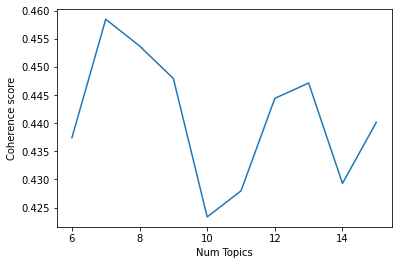

In [8]:
# Show graph
limit=16; start=6; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
#plt.savefig('20240221_PhD_MalletLDALtr-Coherence')
plt.show()

In [9]:
# Print the coherence and perplexity scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, 'Coherence: ', round(cv, 4))

Num Topics = 6 Coherence:  0.4374
Num Topics = 7 Coherence:  0.4585
Num Topics = 8 Coherence:  0.4537
Num Topics = 9 Coherence:  0.4479
Num Topics = 10 Coherence:  0.4233
Num Topics = 11 Coherence:  0.428
Num Topics = 12 Coherence:  0.4444
Num Topics = 13 Coherence:  0.4471
Num Topics = 14 Coherence:  0.4293
Num Topics = 15 Coherence:  0.4401


In [10]:
def compute_coherence_values(dictionary, corpus, texts, limit, start, step):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word, optimize_interval=250, random_seed=100, iterations=5000)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, 
                                                        corpus=corpus, 
                                                        texts=data_lemmatizedNouns, 
                                                        start=6, 
                                                        limit=16, 
                                                        step=1)

Mallet LDA: 6 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.70999
<20> LL/token: -8.32418
<30> LL/token: -8.13532
<40> LL/token: -8.02196

0	8.33333	time health life work summer hand letter friend year month interest son thing opportunity paper care pleasure change rest mind 
1	8.33333	letter time friend mother sister home girl father daughter wife death child husband news world heart baby return health happiness 
2	8.33333	dollar work money family brother pound house year man cent price business time board foot place kind number people pork 
3	8.33333	day night morning book weather room evening time place hour town woman week flower fear yesterday water spirit fall thing 
4	8.33333	week child letter time day school write home church winter cousin today boy bed snow fire brother place aunt trouble 
5	8.33333	country land year acre farm person pound wood people winter place horse river wheat road tree month farmer climate summer 

<460> LL/token: -7.79423
<470> LL/token: -7.80182
<480> LL/token: -7.7917
<490> LL/token: -7.7933

0	7.67222	life hand book heart world paper friend mind interest year husband kind people work care matter copy son age trial 
1	8.43474	letter time friend brother mother sister health family month summer wife father home daughter winter write news year place pleasure 
2	7.36727	work people man time dollar month year business cent city day money lot company board place pay water thing captain 
3	7.75029	day town morning room house place night hour time home water evening side weather church clock tree fire wood boat 
4	8.14459	week child day boy home girl baby school night uncle aunt visit thing trouble bed today doctor evening snow mail 
5	7.28524	country land year pound acre farm money dollar person crop place price wheat house farmer market spring bushel winter potato 

[beta: 0.08191] 
<500> LL/token: -7.78284
<510> LL/token: -7.81357
<520> LL/token: -7.8181
<530> LL/token: -7.82696
<5

<910> LL/token: -7.84428
<920> LL/token: -7.84556
<930> LL/token: -7.83794
<940> LL/token: -7.84448

0	6.11701	hand life book heart work friend world husband paper mind trouble son death age dollar kind copy spirit trial flower 
1	8.48693	letter time friend brother family sister mother health home winter year month summer father write news kind day country daughter 
2	5.49884	people man work business year time country city month place company money day government house state gold law home meeting 
3	6.21633	day town morning house place time water night room tree side evening hour river boat wood person fire road church 
4	7.11569	week child day girl boy thing baby night school bed visit house today home store snow evening yesterday island church 
5	5.51944	country land pound year acre dollar farm money cent crop price wheat work person place farmer horse market potato bushel 

<950> LL/token: -7.84396
<960> LL/token: -7.84905
<970> LL/token: -7.85562
<980> LL/token: -7.85098
<990> LL/t

<1360> LL/token: -7.84222
<1370> LL/token: -7.84426
<1380> LL/token: -7.83453
<1390> LL/token: -7.84289

0	4.6134	life book heart hand child work husband mind friend world death paper year copy kind son trial interest spirit sorrow 
1	8.1759	letter time friend brother family sister health mother month year home winter day summer father kind place news write wife 
2	3.96861	people man country business year time work company government city state place gold interest law reason money war fact month 
3	4.83488	day town morning place house water night time evening boat hour wood fire side ship tree board road river church 
4	6.04784	week child day boy night baby school girl home bed thing time today house room visit store snow yesterday doctor 
5	4.35272	country land pound year dollar acre farm money crop cent price person wheat work place house farmer bushel market winter 

<1400> LL/token: -7.83659
<1410> LL/token: -7.83705
<1420> LL/token: -7.83609
<1430> LL/token: -7.848
<1440> LL/token

<1810> LL/token: -7.83328
<1820> LL/token: -7.83342
<1830> LL/token: -7.83763
<1840> LL/token: -7.83732

0	3.42545	book life heart hand friend year husband mind work child world paper copy interest woman sorrow trial eye spirit age 
1	7.57434	letter time friend mother brother home sister month family day health year winter kind summer place father country wife write 
2	2.77888	people man country time year company business work city government place gold fact money law interest side reason thousand war 
3	3.71858	day town water morning hour house place time night tree evening home side boat wood ship room road river sea 
4	5.07014	week child day boy night baby school bed girl thing house visit today room store evening church morning yesterday mail 
5	3.44338	country land pound year dollar acre farm money cent crop price wheat work person place farmer bushel market wage wood 

<1850> LL/token: -7.82239
<1860> LL/token: -7.84596
<1870> LL/token: -7.83082
<1880> LL/token: -7.82865
<1890> L

<2260> LL/token: -7.79775
<2270> LL/token: -7.7917
<2280> LL/token: -7.80701
<2290> LL/token: -7.80066

0	2.51044	book heart life hand mind work husband friend world copy flower death trial interest dollar sorrow woman year spirit son 
1	6.85938	letter time friend day mother brother sister family home health month year winter place summer kind father wife country write 
2	1.92886	people man year country time work business company interest government place month city fact side law state gold thousand party 
3	2.8456	day town water morning time hour boat night side tree house wood evening ship room road river sea weather woman 
4	4.11588	week child day boy baby school night girl bed home church today house store evening room yesterday morning thing island 
5	2.7052	country land pound year acre dollar farm money crop price place cent work house wheat person farmer market bushel foot 

<2300> LL/token: -7.81268
<2310> LL/token: -7.80107
<2320> LL/token: -7.80966
<2330> LL/token: -7.80967
<

<2710> LL/token: -7.79308
<2720> LL/token: -7.80035
<2730> LL/token: -7.80171
<2740> LL/token: -7.81266

0	2.14054	book life heart hand year work husband mind copy interest flower trial paper friend son sorrow world death nature dollar 
1	6.47054	letter time friend day home mother brother sister family health month year winter kind place summer father country wife write 
2	1.59164	people man country year government company business state city place fact gold office law work month war thousand mine side 
3	2.48314	day town time water morning room evening night boat side tree hour ship house place wood sea river board lady 
4	3.68227	week child day boy night baby school house church today bed yesterday girl thing store morning home evening town island 
5	2.40609	country land pound year acre dollar farm money work crop price cent place wheat person house farmer market bushel board 

[beta: 0.09593] 
<2750> LL/token: -7.79746
<2760> LL/token: -7.80088
<2770> LL/token: -7.79858
<2780> LL/to

<3160> LL/token: -7.77711
<3170> LL/token: -7.77619
<3180> LL/token: -7.77715
<3190> LL/token: -7.77574

0	1.54431	book heart life hand work copy mind friend interest husband death age woman trial sorrow flower year paper nature kind 
1	5.67062	letter time friend day brother mother sister home family month health year winter week place country summer father child kind 
2	1.09595	people man year business work government company fact country state land time gold war world office law thousand city money 
3	1.90521	day water town morning place room night time hour house boat ship wood river side sea tree road evening weather 
4	2.96223	week child day night bed school boy baby visit home thing evening girl today morning church house yesterday mail store 
5	1.89824	country land pound year acre farm dollar money work price cent wheat crop place person house farmer market bushel winter 

<3200> LL/token: -7.78292
<3210> LL/token: -7.78941
<3220> LL/token: -7.78599
<3230> LL/token: -7.78282
<32

<3610> LL/token: -7.75819
<3620> LL/token: -7.75981
<3630> LL/token: -7.77132
<3640> LL/token: -7.76575

0	1.12662	book heart life hand world copy husband work year paper trial friend sorrow mind son flower anxiety soul nature eye 
1	4.8598	letter time day friend brother home mother sister family health year month winter place country kind week child summer work 
2	0.77325	man people company government work business country city land year time money gold law war bank fact coal thousand interest 
3	1.46839	day water morning time town side house place room wood tree ship river boat hour evening sea weather night road 
4	2.36733	week child boy school baby day night evening today bed morning church yesterday house home store island room town girl 
5	1.49385	country land pound year acre farm dollar money price cent wheat crop work person farmer market place bushel house board 

<3650> LL/token: -7.76707
<3660> LL/token: -7.7653
<3670> LL/token: -7.75592
<3680> LL/token: -7.76061
<3690> LL/t

<4060> LL/token: -7.75265
<4070> LL/token: -7.73765
<4080> LL/token: -7.74267
<4090> LL/token: -7.74082

0	0.84345	book heart life work hand copy mind year husband trial world spirit sorrow paper son death friend flower nature interest 
1	4.11933	letter time day friend home mother brother sister year month family health winter week country place kind summer child father 
2	0.55935	man people government company fact law city business country gold work year state thousand war provision side coal interest pocket 
3	1.13801	day town water boat room morning house time side hour tree place wood night ship sea river evening road door 
4	1.87857	week child day school baby boy evening night today bed church morning visit yesterday home thing island girl tea room 
5	1.19588	country land pound year acre farm dollar money work place price cent crop wheat people person house farmer bushel market 

<4100> LL/token: -7.74832
<4110> LL/token: -7.75281
<4120> LL/token: -7.74598
<4130> LL/token: -7.7476

<4510> LL/token: -7.72727
<4520> LL/token: -7.7382
<4530> LL/token: -7.74329
<4540> LL/token: -7.73484

0	0.64837	book heart life hand work copy husband world trial year mind child sorrow paper interest nature spirit case matter age 
1	3.46291	letter time day friend home mother sister brother year month health family winter week country place kind summer child work 
2	0.42412	people man company government work country business year fact gold state time city thousand war law coal bank food interest 
3	0.89236	day water morning house night town hour room place boat evening ship wood foot side tree time river sea road 
4	1.48362	week child day school boy baby today evening yesterday bed store night church visit morning house thing girl tea room 
5	0.96564	country land pound year acre farm dollar money place price cent wheat crop work person farmer house market bushel month 

<4550> LL/token: -7.72685
<4560> LL/token: -7.7374
<4570> LL/token: -7.72912
<4580> LL/token: -7.7393
<4590> LL/tok

<4960> LL/token: -7.72848
<4970> LL/token: -7.72675
<4980> LL/token: -7.72897
<4990> LL/token: -7.72482

0	0.57387	book heart life hand copy work year husband sorrow paper mind death child nature age world room friend flower interest 
1	3.16944	letter time day friend mother brother sister home month family year health week country winter place summer child kind work 
2	0.37333	man people year company government business country office fact work thousand law war debt gold world state city interest place 
3	0.8032	day water morning room town night tree boat wood house river hour place time sea ship side home evening horse 
4	1.31869	week child day school baby boy evening church today night yesterday bed home morning island visit thing store tea town 
5	0.87388	country land pound year acre farm dollar money work price house wheat cent place crop person farmer people bushel family 

[beta: 0.10365] 
<5000> LL/token: -7.72612

Total time: 3 minutes 25 seconds
Mallet LDA: 7 topics, 3 topic b

<360> LL/token: -7.85678
<370> LL/token: -7.86258
<380> LL/token: -7.86295
<390> LL/token: -7.87045

0	6.53118	life hand book child heart mind work paper husband spirit friend copy trouble change rest world trial care anxiety woman 
1	6.68504	country people year place business man time month home state city world company office summer war person government gentleman difficulty 
2	6.58148	day week work house time room store people town head bed snow thing water mine lot boy child fire woman 
3	7.11516	letter time day week home month girl news baby weather winter night thing pleasure return opportunity visit write happiness friend 
4	6.31368	country land pound dollar year acre farm money cent crop price wheat place work wood farmer market board bushel potato 
5	6.80624	friend brother family letter mother health sister child year wife time daughter son death uncle aunt summer winter kind cousin 
6	6.40257	day morning evening night church yesterday boat clock school town side house tree sh

<760> LL/token: -7.91303
<770> LL/token: -7.91985
<780> LL/token: -7.92433
<790> LL/token: -7.92253

0	5.00275	hand book life heart work mind paper friend copy world spirit child husband trial woman kind flower sorrow death anxiety 
1	5.24564	people country man year business time place company state work home interest city government difficulty case office world fact month 
2	5.41558	week child day night baby boy bed school girl room thing today head house store evening mail yesterday morning tomorrow 
3	6.71541	time letter day month home place winter weather news summer friend health pleasure return sister happiness opportunity write country thing 
4	4.83495	land country pound acre year farm dollar money crop price cent work wheat house person farmer market bushel wage cost 
5	5.98176	brother friend mother letter family sister year health child wife son time home daughter uncle father death aunt money cousin 
6	5.08368	day town morning house water hour place evening church river night

<1160> LL/token: -7.91028
<1170> LL/token: -7.92242
<1180> LL/token: -7.91817
<1190> LL/token: -7.92089

0	4.27538	book heart life hand mind work kind husband friend paper woman copy world trial child care change anxiety age sorrow 
1	4.51655	people man country year business time place work company state government head month money interest fact law city gold number 
2	4.99955	week child boy night baby school day bed girl today store yesterday visit morning thing evening home island room church 
3	6.34238	letter time day month place home weather winter friend health news summer pleasure thing country opportunity return sister manner happiness 
4	4.26617	country land pound acre farm year dollar money crop price cent person wheat work farmer market bushel wage foot potato 
5	5.5675	brother mother letter family friend sister child year wife time health home daughter son death uncle aunt father work write 
6	4.45679	day town house water morning room hour tree river evening side wood night 

<1560> LL/token: -7.91838
<1570> LL/token: -7.91463
<1580> LL/token: -7.91405
<1590> LL/token: -7.91723

0	3.14196	book heart life hand work friend mind husband copy trial interest paper spirit flower sorrow kind care trouble nature woman 
1	3.20264	people year man country business company state place government office difficulty work law world war money side land interest city 
2	4.19092	week child day boy school baby night evening visit thing today home yesterday morning church bed mail girl store island 
3	5.58671	time letter day month place home winter friend health country weather summer sister pleasure year thing opportunity return people happiness 
4	3.30983	country land pound acre year farm dollar money cent price work crop wheat foot house farmer market bushel person wood 
5	4.79724	letter brother mother time family friend sister year child home health son wife death uncle daughter kind aunt work cousin 
6	3.34149	day town house morning water room night hour side river boat tr

<1960> LL/token: -7.91105
<1970> LL/token: -7.90946
<1980> LL/token: -7.92446
<1990> LL/token: -7.91702

0	2.69434	book heart life work hand husband friend mind paper copy trial interest age nature spirit sorrow child flower woman year 
1	2.66906	people man year country work business place company time government gold interest home fact city side war money law thousand 
2	3.81323	week child day baby school boy night bed thing girl home today morning evening house church yesterday island store visit 
3	5.16266	letter time day month place winter weather kind home country summer year pleasure health friend news opportunity return happiness week 
4	2.90403	country land pound year acre dollar farm money crop price cent wheat person farmer work bushel market wood horse summer 
5	4.44334	letter brother mother family time friend sister child health home wife year daughter son death uncle aunt father write cousin 
6	2.86929	day town water morning house room river boat night tree hour wood side 

<2360> LL/token: -7.897
<2370> LL/token: -7.89776
<2380> LL/token: -7.89496
<2390> LL/token: -7.89356

0	1.94186	book life heart hand work husband copy interest mind paper friend year trial flower nature death parent sorrow woman trouble 
1	1.81244	people man year company work country business government time law city fact town mine office gold bank debt state thousand 
2	3.11385	week child boy day school baby night home thing morning girl bed room today church yesterday visit evening island store 
3	4.35215	letter time day month place home winter friend health country summer year return weather account sister people pleasure news happiness 
4	2.26117	country land pound acre farm dollar year money crop cent price wheat work person farmer market bushel place wood house 
5	3.7789	letter brother mother family friend time sister child year health wife home son death uncle week daughter aunt father money 
6	2.11723	day town water place hour house morning boat river night wood side tree sea 

<2760> LL/token: -7.88632
<2770> LL/token: -7.88509
<2780> LL/token: -7.88
<2790> LL/token: -7.88522

0	1.40961	book heart life hand work paper mind copy husband friend interest trial death sorrow age son world year spirit kind 
1	1.19864	people man country government time work company year state fact business place law war office gold city party coal officer 
2	2.54811	week child day boy night baby school bed evening morning today church thing girl home island yesterday visit room store 
3	3.54922	letter time day month home place country winter weather friend kind health return summer pleasure thing year sister manner happiness 
4	1.75678	country land pound year acre dollar farm money crop price cent wheat work person farmer place market bushel house wage 
5	3.19406	letter time brother mother friend family child sister year home health wife day son work daughter uncle death money aunt 
6	1.56191	day water town morning wood room boat tree side place night river house hour sea foot road

<3160> LL/token: -7.86205
<3170> LL/token: -7.86112
<3180> LL/token: -7.86389
<3190> LL/token: -7.8684

0	1.20754	book heart life hand work copy friend husband mind kind trial age woman paper death interest sorrow year son nature 
1	0.98031	people man year country work government company time fact business place state interest land war gold law world city coal 
2	2.30033	week child day night school boy baby bed morning visit evening church today girl room home thing yesterday house tea 
3	3.16241	letter time day month place home country weather health winter friend people thing summer return pleasure year week happiness account 
4	1.55525	country land pound year acre dollar farm money work price cent wheat crop place person farmer market bushel house wage 
5	2.93262	letter time mother friend brother family sister year home child health wife week son daughter uncle death day winter work 
6	1.34357	day water boat town morning river house hour night side sea tree road room ship wood horse

<3560> LL/token: -7.84907
<3570> LL/token: -7.85707
<3580> LL/token: -7.85998
<3590> LL/token: -7.85589

0	0.887	book life heart hand work husband year copy mind child paper death friend interest sorrow trial nature woman flower room 
1	0.66707	people man year company business country fact government side land war gold city office state place thousand law provision interest 
2	1.8515	week child day school boy baby night home bed today thing church morning evening house girl visit island room store 
3	2.48276	letter time day month place friend home winter weather health country kind summer return people pleasure year thing life world 
4	1.21964	country land pound year acre farm dollar money place price crop cent person work wheat house farmer bushel wage market 
5	2.46458	letter time mother brother friend family sister year home health child work day week wife son uncle daughter death month 
6	1.00176	day water morning river boat town house night wood hour time side board evening tree r

<3960> LL/token: -7.84057
<3970> LL/token: -7.84512
<3980> LL/token: -7.84713
<3990> LL/token: -7.83672

0	0.76249	book heart life work friend hand copy husband child year trial paper sorrow woman age flower mind world parent nature 
1	0.55193	people man year company country government fact gold business work side thousand bank officer law city war provision debt interest 
2	1.64722	week child day school house boy today night bed girl thing morning home baby evening church room island tea town 
3	2.20181	letter time day place month home health country friend return winter thing summer weather year kind world people happiness account 
4	1.07535	country land pound year acre farm dollar money work price cent wheat place crop person farmer bushel month market house 
5	2.25116	letter time mother brother friend family sister home year day week child health work wife son death daughter write uncle 
6	0.87421	day water morning boat hour river side house town night evening room sea wood road tr

<4360> LL/token: -7.83108
<4370> LL/token: -7.83583
<4380> LL/token: -7.83091
<4390> LL/token: -7.82705

0	0.57039	book heart life hand work copy husband friend child mind woman sorrow son dollar interest age death world trouble flower 
1	0.39373	people man year country business company government office work fact state gold thousand side interest land law city number coal 
2	1.29789	child week day school boy evening today night girl baby morning visit church yesterday bed home thing island tea town 
3	1.7082	letter time day home month place friend country health winter thing weather summer return people kind year pleasure happiness account 
4	0.84524	country land pound year acre farm dollar money place cent price work wheat crop person farmer house bushel family market 
5	1.89602	letter time mother brother friend family sister year week day home child health work month wife son death write uncle 
6	0.67213	day water morning night boat hour time town room river house side sea foot ship

<4760> LL/token: -7.80951
<4770> LL/token: -7.8205
<4780> LL/token: -7.81147
<4790> LL/token: -7.81397

0	0.43979	life book heart hand copy work husband mind child paper trial death sorrow son year friend trouble age world interest 
1	0.29199	people man company government year work fact business land side gold war thousand river country interest law coal bank debt 
2	1.01186	week child day boy school baby night home evening today morning yesterday visit thing girl church island bed house tea 
3	1.34513	letter time day month home friend place winter year country weather people health return happiness life kind world business account 
4	0.67228	country land pound year acre farm dollar money work price place cent crop wheat person farmer bushel house family market 
5	1.5953	letter time mother friend brother family sister day year child week health home work wife son country write death uncle 
6	0.52963	day morning water boat room town river tree hour side night sea house place bed foot sh

<160> LL/token: -7.78744
<170> LL/token: -7.78458
<180> LL/token: -7.79206
<190> LL/token: -7.78617

0	6.25	letter time month write news friend day account sister world place weather happiness thing flower spirit care writing pleasure manner 
1	6.25	pound dollar money year country man cent people house pay expense difficulty cost board work lot government store number cow 
2	6.25	friend brother mother family health sister year letter son father wife death child daughter home uncle aunt answer cousin kind 
3	6.25	hand life book heart paper mind work interest kind age matter fear copy husband trouble trial power order return woman 
4	6.25	day winter time people work month country place town summer business thing city home snow rest weather man person state 
5	6.25	land country year acre farm wood foot crop horse wheat kind garden person spring farmer market tree potato bushel building 
6	6.25	day room morning house hour evening water side night company boat church woman return end place 

<510> LL/token: -7.92071
<520> LL/token: -7.92708
<530> LL/token: -7.91721
<540> LL/token: -7.933

0	5.83451	letter time day month friend home health news pleasure opportunity write happiness place weather kind trust darling sister care garden 
1	4.63786	work man people cent month money city business dollar year company case board government gold provision captain office foot good 
2	5.81293	brother mother family friend sister child letter son death wife health daughter year uncle aunt father kind cousin home answer 
3	4.96024	life book heart hand work paper mind world spirit copy matter husband trial sorrow interest woman power trouble nature kind 
4	5.53021	time country winter summer year day people home place month work week snow church state spring thing reason rest business 
5	4.46385	country land pound acre year farm money dollar crop price wheat person farmer house market bushel place tree wood horse 
6	5.04709	day town morning house hour night water room river place evening boa

<860> LL/token: -7.96727
<870> LL/token: -7.97087
<880> LL/token: -7.95378
<890> LL/token: -7.96767

0	5.45191	letter time day month friend home place news sister weather health father pleasure opportunity happiness return trust darling care kind 
1	3.87027	man work year time people company business government money lot city office side gold foot war provision law fact month 
2	5.43972	letter brother mother family friend time sister health wife child son death year daughter uncle aunt kind cousin write house 
3	4.28932	book life heart hand work paper mind friend husband copy age trial spirit kind sorrow dollar woman world eye interest 
4	5.15073	country people winter year place summer home time person day business state thing month account case difficulty reason world climate 
5	3.93208	land country pound acre dollar farm year money price crop work wheat cent farmer market wood bushel horse person wage 
6	4.40258	day house town water morning evening hour boat night tree room ship river

<1210> LL/token: -7.95105
<1220> LL/token: -7.93761
<1230> LL/token: -7.94198
<1240> LL/token: -7.9504

0	5.14474	letter time day month home place news friend weather winter summer sister opportunity pleasure health write happiness return trust garden 
1	3.16577	man time work people company year government business gold month city lot side office war thousand day foot law stand 
2	5.07809	brother mother friend family letter sister health year wife death son child daughter time uncle father aunt house home winter 
3	3.69267	book life heart hand work mind husband paper friend copy trial kind care sorrow interest woman spirit world matter age 
4	4.59423	country people year place home state person business summer difficulty case situation land winter prospect interest expense manner respect hand 
5	3.46329	land pound country dollar acre farm year money work cent price crop wheat farmer month bushel market foot cost wage 
6	3.8513	day town water house morning boat wood room river hour eveni

<1560> LL/token: -7.94079
<1570> LL/token: -7.95095
<1580> LL/token: -7.94065
<1590> LL/token: -7.944

0	4.61247	letter time day month place home winter friend health weather kind summer pleasure sister news opportunity year thing happiness return 
1	2.05075	man people work time company government office gold year mine side war head mountain month day thousand business earth water 
2	4.37593	letter brother mother family friend time sister child year health son wife death uncle daughter home aunt cousin father day 
3	2.6758	book heart life work hand friend copy husband mind paper trial girl world flower woman sorrow spirit death age eye 
4	3.46133	country year people business place state person interest difficulty situation case number man mind expense home land matter respect climate 
5	2.67522	land pound country acre farm dollar year money work cent crop wheat price market farmer bushel foot wood month horse 
6	2.88948	day town house morning water room side hour boat night river wood 

<1910> LL/token: -7.93205
<1920> LL/token: -7.93745
<1930> LL/token: -7.93606
<1940> LL/token: -7.94406

0	4.33732	letter time day month friend home weather place health summer winter pleasure news return thing happiness year opportunity people write 
1	1.61403	time man work day company people gold foot horse water lot year place fire mountain month coal thousand stand mine 
2	4.05202	brother mother letter family sister friend time child year health wife son home daughter death uncle aunt winter father cousin 
3	2.26558	book heart life work hand paper husband copy world trial sorrow flower mind kind friend care death girl pen eye 
4	2.9779	country people year business interest home man state place time case land difficulty person situation matter expense friend mind servant 
5	2.34947	country land pound acre farm dollar year money crop price cent wheat work farmer market bushel person wood house winter 
6	2.48583	day town house morning boat tree side water river night wood room place s

<2260> LL/token: -7.9192
<2270> LL/token: -7.91488
<2280> LL/token: -7.91814
<2290> LL/token: -7.92366

0	3.68798	letter time day month home place friend winter weather health year country pleasure thing summer sister news week return happiness 
1	1.04476	work man time gold company month horse provision people mail day foot food river car coal mountain thousand officer head 
2	3.43947	letter mother brother family friend time sister year child health wife son day winter daughter uncle death aunt home money 
3	1.59813	book heart work life husband hand copy friend paper mind trial child sorrow death flower dollar spirit world woman age 
4	2.14184	country people year business man interest state mind person case time land difficulty situation government home place number fact office 
5	1.84069	country land pound acre farm year dollar money crop price work cent wheat place farmer house market bushel month wage 
6	1.80595	day town water morning boat wood room hour place night river evening se

<2610> LL/token: -7.91234
<2620> LL/token: -7.91799
<2630> LL/token: -7.90858
<2640> LL/token: -7.91705

0	3.3702	letter time day month home friend weather place health winter kind thing pleasure country return sister summer happiness news father 
1	0.8424	man work time people day gold company horse month thing foot water fire river coal food provision ship mine mountain 
2	3.14828	letter time mother brother friend family year sister health child wife son home death daughter uncle aunt week day winter 
3	1.35222	book heart life hand work friend copy paper husband mind trial nature flower age trouble sorrow death soul son dollar 
4	1.79781	country year people business interest man home state land money case government world person party situation difficulty office place bank 
5	1.62159	country land pound acre farm dollar year money cent price crop wheat work house farmer bushel place person board wage 
6	1.54363	day town water morning boat night side wood room river hour house tree even

<2960> LL/token: -7.90374
<2970> LL/token: -7.90143
<2980> LL/token: -7.90267
<2990> LL/token: -7.89966

0	3.04545	letter time day month home place winter friend weather country health pleasure thing summer year people sister return happiness week 
1	0.69022	time work man company gold people water day horse lot foot food coal officer provision box mine block soldier month 
2	2.89742	letter time brother mother friend family sister year home child health son wife day death daughter uncle money aunt write 
3	1.14081	book heart hand work life copy husband paper mind flower trial sorrow kind dollar eye nature soul age spirit friend 
4	1.50254	country people year man business interest land state difficulty person government place side bank office circumstance matter number war meeting 
5	1.42775	country pound land acre year farm dollar money work price place cent wheat crop person farmer bushel market wage house 
6	1.30871	day town morning room house boat water tree river place evening night

<3310> LL/token: -7.87285
<3320> LL/token: -7.88409
<3330> LL/token: -7.88318
<3340> LL/token: -7.88755

0	2.40675	letter time day month place friend home country health winter year summer thing return weather sister life news people kind 
1	0.47125	man company work people gold day water time foot coal mountain thousand month food car officer mine claim ring horse 
2	2.44176	letter time brother mother family friend sister year home health child week wife son day death work uncle daughter money 
3	0.81195	book heart work life husband hand copy friend child paper sorrow flower trial death age nature soul room dollar mind 
4	1.05588	people year country interest business man state difficulty world land place government home person office matter case mind life respect 
5	1.11487	country land pound acre year farm dollar money work price cent wheat crop place farmer person house bushel market wage 
6	0.97219	day morning water river house boat town side room place tree hour sea ship evening ti

<3660> LL/token: -7.8791
<3670> LL/token: -7.87768
<3680> LL/token: -7.87535
<3690> LL/token: -7.87795

0	2.12739	letter time day month place winter home health friend weather return year sister pleasure country summer kind people happiness thing 
1	0.39917	man company work time gold day people foot thousand river officer fact food coal mountain month provision mine earth government 
2	2.22904	letter time mother brother friend family sister year child home day health wife son week month uncle death daughter write 
3	0.68607	book heart life work hand husband copy child friend paper death trial age girl sorrow mind interest dollar woman year 
4	0.8868	country people year business man interest state person difficulty land life government case home money matter property world office law 
5	0.99246	country land pound acre year farm dollar money crop price cent work place wheat farmer person house bushel board market 
6	0.83863	day town house morning room water boat river wood time sea night

<4010> LL/token: -7.84424
<4020> LL/token: -7.8581
<4030> LL/token: -7.84607
<4040> LL/token: -7.84958

0	1.6682	letter time day month place winter home health thing weather summer country friend happiness life people trust hand year world 
1	0.2821	work man day company gold people time thousand mail foot mine coal food officer fellow soldier fact mountain car river 
2	1.86019	letter time friend brother mother family year sister child home day week health wife work son death month uncle money 
3	0.50799	book heart work life hand copy husband paper year friend trial flower mind sorrow age son kind dollar death girl 
4	0.63638	country people year interest business man difficulty friend state case land government bank matter life office money circumstance mind power 
5	0.79506	country land pound acre dollar year farm money place cent price work wheat crop person farmer house bushel market board 
6	0.64743	day morning water town house night side boat wood room tree river hour place sea shi

<4360> LL/token: -7.85029
<4370> LL/token: -7.84538
<4380> LL/token: -7.8487
<4390> LL/token: -7.84589

0	1.4752	letter time day month place home friend health weather winter country thing year summer return happiness life kind pleasure account 
1	0.24426	man work company time gold people fact day mine officer coal mountain thousand water foot soldier river month provision mail 
2	1.70019	letter time mother brother friend family sister year day week home child health wife month son work death write uncle 
3	0.44247	book heart life hand work husband copy dollar friend son woman death child trial age mind sorrow kind trouble flower 
4	0.5368	people country year interest land business state difficulty man world friend matter office case law person government money bank life 
5	0.7138	country land pound year acre farm dollar money work price place cent wheat crop person farmer house bushel wage family 
6	0.57563	day morning boat town room water river time house side hour night sea ship eve

<4710> LL/token: -7.83538
<4720> LL/token: -7.83572
<4730> LL/token: -7.8381
<4740> LL/token: -7.8444

0	1.29852	letter time day month place friend winter health home weather people country return happiness pleasure kind world thing summer account 
1	0.20991	man company gold time work foot day water horse thousand people coal food mine mountain fact soldier mind river year 
2	1.56551	letter time friend brother mother family sister day year home child health week month wife son daughter work money death 
3	0.38691	book heart work life hand husband copy child paper death trial dollar sorrow girl flower room age friend woman trouble 
4	0.46549	country people year interest business land friend state man government office matter life family person manner bank case character difficulty 
5	0.6395	country land pound year acre farm dollar money price crop work cent wheat place house farmer market bushel person board 
6	0.5204	day town morning boat water place river room sea night side hour tree

<60> LL/token: -7.95936
<70> LL/token: -7.93053
<80> LL/token: -7.91424
<90> LL/token: -7.88307

0	5.55556	day book room spirit house people town work fire table hand head door winter service mind description window arrival opinion 
1	5.55556	people man horse company river person lot state number expense island country business government vessel seed climate cow gold provision 
2	5.55556	time month girl thing week day home weather bed kind boy fear manner school trouble garden return city dinner acquaintance 
3	5.55556	friend letter death sister hand life husband place paper time mother heart son picture mind darling matter care account trouble 
4	5.55556	letter time brother family health winter mother summer sister home month write uncle daughter wife cousin aunt son answer snow 
5	5.55556	day house water wood town tree board place cent boat tea road spring half pork person captain store side sea 
6	5.55556	year life world woman kind pleasure letter work business happiness flower trus

<410> LL/token: -7.93341
<420> LL/token: -7.93113
<430> LL/token: -7.94423
<440> LL/token: -7.94341

0	5.00297	day room house hand thing town mind mail account fire home table spirit idea anxiety door servant difficulty window street 
1	5.01851	people man time work year country place money state month company business government city home reason meeting gold world fact 
2	5.36521	time letter day month place weather winter opportunity summer return happiness news country garden people manner trust spring pleasure health 
3	5.06621	friend death life child husband heart wife trouble father family son care world interest rest hand matter loss situation power 
4	5.57707	letter time brother mother family sister health home friend year write uncle answer winter aunt daughter cousin summer son word 
5	5.01484	day water morning boat hour night tree side place river wood evening road house ship sea town horse foot vessel 
6	5.07965	book year work girl letter kind life paper fear flower heart dol

<760> LL/token: -7.99161
<770> LL/token: -8.00166
<780> LL/token: -8.00432
<790> LL/token: -8.00675

0	3.71165	day house room town time hand fire night mind table door wood window mail bed woman hour road street lot 
1	3.77135	people man country work year time company place business government reason city fact month interest side gold lot thousand thing 
2	4.76232	letter time day month place weather health winter country summer pleasure year happiness friend return home manner garden opportunity trust 
3	3.97805	friend life hand world husband year heart care matter death trouble son power blessing case sorrow change loss trial spirit 
4	5.18722	letter brother time mother family sister friend home health year wife daughter uncle son aunt father child write winter death 
5	3.76155	day water morning boat evening side board river sea place ship hour home vessel tree night clock time foot view 
6	3.68558	book letter work paper woman girl heart copy dollar kind life flower child writing age 

<1110> LL/token: -7.99143
<1120> LL/token: -7.98001
<1130> LL/token: -7.99704
<1140> LL/token: -7.98559

0	3.20017	day house town room fire church time woman road place wood night door home mail dinner horse people lot bed 
1	3.17453	people man country year time work business company government money day place gold lot thousand law provision city fact war 
2	4.47082	letter time day month place weather summer winter country health pleasure home opportunity friend happiness return garden thing week news 
3	3.46718	friend life hand world mind heart interest care matter situation husband year trial power change trouble case sorrow comfort son 
4	4.99544	letter time brother mother family sister friend home health wife year child death son uncle daughter father write aunt answer 
5	3.14726	day water boat morning ship evening captain sea hour vessel side river foot tree night passage board time return view 
6	3.03855	book work paper kind heart copy letter dollar girl woman flower nature year 

<1460> LL/token: -7.98305
<1470> LL/token: -7.97303
<1480> LL/token: -7.98198
<1490> LL/token: -7.99001

0	2.78185	day town house room wood time road home place side fire church door window hour night bed horse tree breakfast 
1	2.65853	people man work business year country place government day month fact company city gold money thousand time provision war side 
2	4.16306	letter time day month country weather place winter health home summer people friend kind trust thing happiness news pleasure garden 
3	3.01958	hand friend life world heart mind trouble year husband trial matter power sorrow case care interest situation child death parent 
4	4.78789	letter time brother mother family friend sister year health home wife child son father death uncle daughter write week aunt 
5	2.58469	day water boat river morning vessel board evening ship captain sea hour passage foot voyage night luggage good passenger steam 
6	2.50024	book work heart copy kind paper girl flower letter woman life return 

<1810> LL/token: -7.95137
<1820> LL/token: -7.95522
<1830> LL/token: -7.95548
<1840> LL/token: -7.95169

0	2.08602	day house town water place wood room tree time road morning side river fire home hour door horse church building 
1	1.7955	people man year time work country company business government city gold place money fact mine thousand reason provision bank war 
2	3.57701	letter time day month country winter weather place summer thing people return friend year health pleasure garden kind home father 
3	2.23381	life hand world friend interest heart year mind power situation sorrow matter change rest trial parent difficulty term husband trouble 
4	4.34688	letter time brother mother friend family sister home health year child wife son death daughter write uncle work aunt month 
5	1.63978	boat day captain board ship sea passage vessel evening hour night luggage good steamer passenger morning water steam arrival side 
6	1.66365	book work heart copy paper life kind girl flower eye letter 

<2160> LL/token: -7.9455
<2170> LL/token: -7.95209
<2180> LL/token: -7.94882
<2190> LL/token: -7.94653

0	1.80198	day town house water side morning river place tree wood room time road horse door fire boat evening building church 
1	1.46726	man people work company day government year month thousand law war mine business office stand city food provision time coal 
2	3.24648	letter time day month place winter friend health weather country return happiness summer year news people thing kind account garden 
3	1.94136	interest hand people friend life world difficulty power year state mind business country matter home case parent situation expense anxiety 
4	4.10094	letter time brother mother friend family sister year home health wife child son daughter day death write uncle father month 
5	1.29303	vessel captain ship boat day passage board sea thing luggage passenger steam cent woman water employment good gold port article 
6	1.33127	book heart work copy husband paper life woman flower deat

<2510> LL/token: -7.90995
<2520> LL/token: -7.93115
<2530> LL/token: -7.9084
<2540> LL/token: -7.91727

0	1.33132	day house town morning place time water room wood side river tree road home door hour evening boat building church 
1	0.9024	man company time work day people government place head gold month money war year thousand provision water food fact officer 
2	2.63039	letter time day month place friend winter weather health home summer country happiness kind thing trust pleasure account life return 
3	1.45655	people year interest business country friend world difficulty state case matter life power mind fortune man person circumstance hand party 
4	3.55848	letter time brother mother friend family sister year home day week health child son wife daughter death winter month work 
5	0.83799	boat cent day luggage board ship passage sea box water woman thing dress passenger steam cabin captain store steamer article 
6	0.93403	book heart work copy life hand husband paper flower sorrow tria

<2860> LL/token: -7.90482
<2870> LL/token: -7.91064
<2880> LL/token: -7.91057
<2890> LL/token: -7.91153

0	1.14927	day morning town house water side time tree wood room river hour home road evening place night boat horse church 
1	0.71009	man company day time work people water gold war foot month thousand year coal place food provision government soldier officer 
2	2.35144	letter time day place month health weather friend winter summer return happiness kind pleasure home country thing garden life trust 
3	1.23098	country people year interest business state world hand difficulty matter person case friend power manner comfort table mind fact situation 
4	3.29306	letter time mother friend brother family sister home year day week health work child month wife son winter daughter uncle 
5	0.67144	cent boat luggage board ship thing steam woman article passage foot water pair dress barrel sea passenger steamer cabin currency 
6	0.81183	book heart life husband work hand copy death year paper tr

<3210> LL/token: -7.89403
<3220> LL/token: -7.90775
<3230> LL/token: -7.90777
<3240> LL/token: -7.9035

0	0.99797	day water morning wood boat river room tree side hour house night sea town evening board road place time fire 
1	0.56025	man day company work people time gold head thousand mine coal foot mountain officer provision claim war fact water pocket 
2	2.08503	letter time day month friend place winter health weather country return home happiness pleasure world life news trust thing summer 
3	1.04529	people country interest business year state friend matter hand difficulty office world case place character property situation mind manner debt 
4	3.02405	letter time brother mother friend family sister year home day child week health son wife death work write month daughter 
5	0.54844	thing luggage boat dress cent article box currency bed horse pair steam inch steamer clothe water apple iron barrel weight 
6	0.70087	book heart work life copy husband hand trial sorrow paper dollar woma

<3560> LL/token: -7.86789
<3570> LL/token: -7.8725
<3580> LL/token: -7.86531
<3590> LL/token: -7.88058

0	0.75522	day morning wood water town house river night room side road time hour boat tree place evening sea return yesterday 
1	0.36312	man company people day work gold foot river place thousand coal fact war officer soldier mountain mine water provision food 
2	1.63392	letter time day month winter place friend weather health home summer happiness return year country thing pleasure kind trust world 
3	0.75539	people country interest year business man matter world case state home hand friend party mind office life difficulty person property 
4	2.51085	letter time friend mother brother family sister home year week health child work wife day son month daughter death life 
5	0.37052	boat luggage cent box sugar steam thing pair water dress passage seed emigrant grass barrel inch steamer piece ship good 
6	0.52942	book heart work copy husband hand life child sorrow trial flower mind paper

<3910> LL/token: -7.85648
<3920> LL/token: -7.8566
<3930> LL/token: -7.86653
<3940> LL/token: -7.85714

0	0.6594	day room water night house wood morning town place boat tree hour river evening side clock sea road return yesterday 
1	0.29772	man company time day people gold work river thousand coal mountain mine officer foot side place fact month mail fellow 
2	1.43676	letter time day month winter place friend health return thing weather happiness summer pleasure sister world country year manner people 
3	0.64968	people country year business interest world home life state matter person case hand mind difficulty power office reason idea law 
4	2.28821	letter time friend mother brother family home sister day year health child week work son wife month daughter death write 
5	0.32135	boat luggage steam cent passage spring thing sugar foot weight clothe box inch currency cost ship article seed steamer meat 
6	0.46733	book heart work copy husband hand child life friend flower kind sorrow doll

<4260> LL/token: -7.84802
<4270> LL/token: -7.83351
<4280> LL/token: -7.84753
<4290> LL/token: -7.8515

0	0.51706	day room house boat morning night wood water town home tree river time place evening side hour sea weather road 
1	0.21426	man company work day people gold thousand month officer mine mountain foot food river coal fact head claim earth arm 
2	1.11566	letter time day month place health winter weather summer friend home year country happiness thing life pleasure news garden people 
3	0.48773	people country interest business year matter world state man manner power life case hand person character office party bank kind 
4	1.88255	letter time friend mother brother family sister year day home child health work week wife son month death uncle daughter 
5	0.25138	luggage thing cent sugar pair steam dress currency inch cost kind water passage boat tea woman fish beef seed steamer 
6	0.36592	book heart copy life work child hand husband paper flower sorrow trial mind death girl age w

<4610> LL/token: -7.84337
<4620> LL/token: -7.84188
<4630> LL/token: -7.83072
<4640> LL/token: -7.84413

0	0.46081	day room morning water night boat evening hour side river house place tree sea foot town wood board rain ship 
1	0.18789	man company gold day work people thousand river coal month war officer provision claim soldier government pocket miner food robb 
2	0.99188	letter time day month place winter friend health weather summer country happiness return thing home news year life pleasure trust 
3	0.4296	people country year business interest matter difficulty friend world state life case person hand city mind property power man emigrant 
4	1.70867	letter time friend mother brother family sister day home week child year health work month son write wife death father 
5	0.22376	thing luggage steam cent dress pair boat tool box article inch people currency sugar kind weight steamer meat store apple 
6	0.33094	book heart work life copy husband child hand death trial sorrow flower pape

<4960> LL/token: -7.83145
<4970> LL/token: -7.82824
<4980> LL/token: -7.82635
<4990> LL/token: -7.82572

0	0.4147	day morning room water place boat town evening river wood night side hour tree house home time sea road ship 
1	0.1658	man company work people time day gold river thousand fact soldier foot war officer month coal provision mine mountain mail 
2	0.88366	letter time day month winter health weather friend place happiness country summer sister thing home return year life people garden 
3	0.37813	people country interest year state business friend matter case man world bank life government mind difficulty office party manner person 
4	1.55921	letter time mother friend brother family sister year day home child week health work wife month son daughter death father 
5	0.20156	luggage thing boat pair kind steam cent store mind passage article inch dress servant sugar tool box cost beef currency 
6	0.29771	book heart life hand work copy husband child paper girl year death mind sorrow 

<260> LL/token: -7.9012
<270> LL/token: -7.91534
<280> LL/token: -7.93929
<290> LL/token: -7.93912

0	4.46788	house work day town people horse half pork ship board vessel store tea water kind provision gold deal thing clothe 
1	4.57781	year business people man interest state life home world company difficulty government case party mind opinion city money plan character 
2	4.4932	time girl room boy hand woman night bed mind head table change eye fire thing window walk writing question trouble 
3	4.75031	home day week letter evening visit time aunt yesterday news return today morning mother uncle year weather night leave clock 
4	4.53484	book heart life work friend husband paper kind wife death world copy care dollar age trial son sorrow darling hand 
5	4.64211	child week baby school church thing trouble town day spirit situation island doctor captain bed wife boy pain fever fortnight 
6	4.5008	country land pound year dollar acre farm money cent crop price wheat person farmer market bush

<560> LL/token: -8.00256
<570> LL/token: -8.01207
<580> LL/token: -8.00814
<590> LL/token: -8.01198

0	3.82602	work day water horse foot cent month house kind time provision pay people gold box boat mine luggage thing passage 
1	4.03495	people year man business country state interest company government place case month party office character world power war meeting fact 
2	3.95202	room hand woman girl house life night mind boy bed fire head hour door table change window eye face servant 
3	4.47042	letter time home week mother day baby thing news girl write writing night answer aunt leave mail paper picture sister 
4	3.96542	book heart life work husband paper friend copy age world care child trial sorrow loss death flower son nature spirit 
5	4.24068	child week day school boy today church evening town island visit morning store captain snow yesterday bed clock afternoon pork 
6	3.96852	country land pound year dollar acre farm money crop price wheat person farmer market bushel wage wood 

<860> LL/token: -8.02672
<870> LL/token: -8.02899
<880> LL/token: -8.01331
<890> LL/token: -8.02909

0	3.1609	work dollar cent water month foot pay thing day cost provision time lot horse money clothe board kind store luggage 
1	3.48466	people year man country business company interest government state office city law home fact place war party thousand difficulty money 
2	3.4073	room hand house bed night hour mind head woman time girl door change day window fire eye table spirit face 
3	4.20529	letter time home day week girl mother thing baby sister news night write boy picture answer month writing visit care 
4	3.39164	book heart life work husband friend paper copy age world dollar trial kind sorrow son child mind flower hand year 
5	3.82436	child week school evening boy today day church yesterday island morning tea captain visit bed store house afternoon snow pork 
6	3.5063	country land pound year acre farm money dollar price place crop wheat person farmer house wood bushel market wa

<1160> LL/token: -8.00342
<1170> LL/token: -8.02004
<1180> LL/token: -8.01981
<1190> LL/token: -8.00918

0	2.60144	work water dollar horse cent day pound foot month provision boat gold pay box thing cost luggage kind passage steam 
1	2.98057	people man year business country company state government time interest fact case office side law thousand matter difficulty reason world 
2	2.88514	house room bed hand woman hour mind night head day door eye girl window table face morning fire trouble city 
3	3.9657	time letter week day home mother baby thing girl night boy work write news answer writing month picture lot change 
4	2.9005	book heart life work husband child world copy paper kind sorrow trial dollar mind interest age anxiety friend care year 
5	3.40407	week child school church today day evening home town visit island boy yesterday store clock captain tea morning weather pork 
6	3.07784	country land year pound acre farm money dollar price crop person wheat house place market farmer b

<1460> LL/token: -8.01321
<1470> LL/token: -8.01386
<1480> LL/token: -8.00523
<1490> LL/token: -8.02103

0	2.14778	work cent water foot day gold boat horse people month provision luggage seed deal mine kind steam passage sugar apple 
1	2.50067	people man year business country interest office government state place company case law time side thousand war city party world 
2	2.42126	room house hand bed mind night hour fire day table door woman life eye face head window time girl kitchen 
3	3.70214	time letter week day home girl baby mother thing night boy write news friend work picture leave place month change 
4	2.46774	book heart life work hand husband friend paper copy trial kind child death sorrow nature world son mind dollar age 
5	3.04633	child week day school today church evening home visit island morning store town boy bed tea yesterday clock captain house 
6	2.70084	country land pound year acre farm dollar money crop price wheat person place farmer bushel market wood wage house 

<1760> LL/token: -7.99094
<1770> LL/token: -7.99299
<1780> LL/token: -7.98874
<1790> LL/token: -8.00172

0	1.40824	work day cent foot boat water people pound dollar month provision gold luggage cost board steam passage apple kind time 
1	1.78563	people man year business country interest state government company time difficulty office place fact law matter war end duty month 
2	1.69222	room house hand bed mind door table window fire hour night people city woman servant kitchen water eye spirit round 
3	3.14777	letter time home week day girl baby night mother thing boy write work news visit place month change mail answer 
4	1.77468	book heart life work child copy husband friend dollar year age paper sorrow hand world trial death nature kind son 
5	2.39637	child week day school evening today church town island bed visit store captain tea trouble morning boy yesterday clock house 
6	2.07716	country land year pound acre farm dollar money price crop place wheat person house farmer market bus

<2060> LL/token: -7.9975
<2070> LL/token: -7.99724
<2080> LL/token: -7.99983
<2090> LL/token: -7.9904

0	1.13829	work day cent water provision dollar board foot month thing luggage boat steam cost sugar gold flour piece pair passage 
1	1.50432	people man year country business interest company government time life state month party thousand fact war office bank debt side 
2	1.41198	room house hand hour fire woman bed door night table window face girl mind eye water child town kitchen horse 
3	2.88672	time letter day week home girl baby mother night thing news boy work friend mail snow weather rest sister write 
4	1.50794	book heart work year life husband copy friend paper hand sorrow child trial flower kind world death interest loss mind 
5	2.11442	week child school evening today church house town morning boy day tea island visit bed yesterday clock pork fortnight store 
6	1.81304	country land pound year acre farm dollar money place price crop wheat farmer bushel market wood person hous

<2360> LL/token: -7.98041
<2370> LL/token: -7.97131
<2380> LL/token: -7.97036
<2390> LL/token: -7.97385

0	0.92133	work cent month water dollar day pound board luggage provision boat foot sugar cost steam store coal clothe thing box 
1	1.24671	people man year company business country interest state government office side time city war thousand gold food reason home party 
2	1.15462	room hour house bed door woman horse girl hand water fire window mile night city face head road child floor 
3	2.62431	time letter week day home night girl baby mother boy thing news month write place friend work paper leave writing 
4	1.2783	book life heart work hand husband copy mind year friend flower sorrow trouble trial paper interest world nature age anxiety 
5	1.8641	week child school day church evening today island boy tea bed visit town house morning store spirit yesterday clock captain 
6	1.59374	country land pound acre year farm dollar money place crop price wheat person farmer market bushel wood 

<2660> LL/token: -7.97356
<2670> LL/token: -7.9723
<2680> LL/token: -7.96499
<2690> LL/token: -7.97053

0	0.75072	cent pound work boat month dollar luggage cost water sugar board employment provision currency thing pair steam beef foot store 
1	1.02398	people man year country business company state government city interest thousand office law time side bank fact debt month gold 
2	0.94843	room house day time bed water door night hour horse fire people woman work eye foot side coal kitchen hand 
3	2.39073	letter time day week home girl night baby mother thing place write work boy month news weather sister visit snow 
4	1.09664	book heart life work hand copy husband mind year sorrow child friend flower death nature world spirit trial paper soul 
5	1.64487	week child school evening today church day boy town island tea morning yesterday clock bed house captain visit spirit pork 
6	1.40773	country land year pound acre farm money dollar crop price place wheat person wood farmer bushel market

<2960> LL/token: -7.96256
<2970> LL/token: -7.95195
<2980> LL/token: -7.9591
<2990> LL/token: -7.96229

0	0.62565	work cent thing pound luggage boat month provision flour water sugar board beef steam cost article potato currency passage barrel 
1	0.83643	people man year business interest country company government state war side office city thousand land condition month officer reason table 
2	0.78018	room day horse people water work door house time man hour foot town fire bed floor coal side mine place 
3	2.16974	letter time week home day girl night baby thing mother news place boy write month weather sister mail friend rest 
4	0.9469	book heart life hand work copy paper husband world trial flower sorrow dollar spirit interest mind nature death soul kind 
5	1.4645	child week school day evening today bed town church house island boy tea clock yesterday store visit pork account afternoon 
6	1.23396	country land pound year acre farm dollar money place price person crop wheat house farmer

<3260> LL/token: -7.94534
<3270> LL/token: -7.9441
<3280> LL/token: -7.95582
<3290> LL/token: -7.94346

0	0.44198	cent pound thing luggage boat month beef work cost dollar sugar pair flour provision kind board water apple clothe ship 
1	0.56525	people man country year government business interest company war state city matter law thousand office time bank town side officer 
2	0.53521	time work horse man water room day foot house head hour fire place coal mine life mountain company woman people 
3	1.70319	letter time week day home girl night baby thing mother month friend boy sister weather place news write return work 
4	0.70491	book heart life hand work husband copy child mind world year trial flower sorrow friend spirit nature son death kind 
5	1.17439	child week school day today church evening town bed boy island morning tea visit house room home yesterday store captain 
6	0.95765	country land year pound acre farm dollar money place price crop wheat person farmer house bushel work m

<3560> LL/token: -7.93317
<3570> LL/token: -7.92904
<3580> LL/token: -7.92152
<3590> LL/token: -7.92892

0	0.37826	work dollar cent pound luggage boat board month thing water sugar bed beef provision pork box servant fish steam barrel 
1	0.4674	people man year government matter country war business office interest side law officer state company city land condition thousand bank 
2	0.43679	time work day gold man people water mine foot company fact place horse mountain coal provision block stand lot claim 
3	1.48261	letter time day week home night girl baby mother child boy thing news friend write fire morning month weather house 
4	0.61088	book life heart work hand copy year husband mind friend paper interest sorrow death world nature child flower trial woman 
5	1.05524	child week school church today day boy bed island town tea evening home morning visit spirit house store captain trouble 
6	0.84724	country land year pound acre farm dollar money place crop person wheat price house farme

<3860> LL/token: -7.91116
<3870> LL/token: -7.91267
<3880> LL/token: -7.92037
<3890> LL/token: -7.92168

0	0.32816	cent pound work water boat dollar luggage board sugar flour pork month steam wage tea currency pay passage woman thing 
1	0.38966	people man year interest government business war country state month office city side friend bank matter condition land enemy party 
2	0.34432	work gold horse time day mine fact foot water coal man company people provision mountain claim eye block miner robb 
3	1.31068	letter time day week night girl baby child mother home boy thing month house news write weather mind bed picture 
4	0.53329	book life heart hand work copy husband friend death trial year sorrow flower paper world spirit mind nature wife kind 
5	0.93323	week child school church day today evening morning boy home bed town island tea visit captain vessel store trouble pork 
6	0.75262	country land year pound acre farm money dollar price crop wheat place person house farmer man bushel 

<4160> LL/token: -7.91185
<4170> LL/token: -7.89781
<4180> LL/token: -7.9003
<4190> LL/token: -7.90909

0	0.28521	cent boat pound luggage sugar board seed thing steam dollar servant beef work currency passage month barrel water article fish 
1	0.32774	people man year government interest business city war friend country thousand office law bank company state mind party town side 
2	0.27298	time work gold foot day water mine horse man people fact mountain money coal company snow claim boot provision place 
3	1.15449	letter time day week girl night child baby mother home thing boy friend bed room sister place write work picture 
4	0.46542	book life heart hand work copy husband sorrow year nature world friend death trial son paper flower age soul trouble 
5	0.83535	week child school day evening church today home boy morning tea island bed town yesterday night captain visit dinner house 
6	0.67535	country land year pound acre farm dollar money place price crop wheat day house person farmer 

<4460> LL/token: -7.88456
<4470> LL/token: -7.8852
<4480> LL/token: -7.89211
<4490> LL/token: -7.88672

0	0.25103	cent luggage boat kind sugar steam garden box water thing tea currency cost board passage barrel fish salt kitchen bread 
1	0.27453	people man government interest war business country matter state side party year officer city law enemy bank thousand company town 
2	0.21725	work horse gold country man company water foot mine fact time coal mountain snow day people provision year fellow miner 
3	1.02954	letter time week day girl night baby mother child home boy sister thing bed room write woman friend news place 
4	0.40795	book heart life hand work year copy husband flower sorrow mind nature trial world spirit friend trouble paper death soul 
5	0.75072	child week school day church evening today morning island boy town brother tea bed home visit store yesterday captain clock 
6	0.60668	country land pound year acre farm dollar money place work price wheat house person crop farm

<4760> LL/token: -7.86855
<4770> LL/token: -7.87672
<4780> LL/token: -7.86489
<4790> LL/token: -7.87002

0	0.19902	boat cent thing luggage seed dress pair dollar piece steam kind passage article sugar bread woman beef currency box ship 
1	0.19398	people man government country business war land year matter office state officer thousand interest town city company side law soldier 
2	0.14841	work gold foot mine company water man fact coal provision mountain river money time day miner horse snow robb mining 
3	0.829	letter time day week night mother baby girl child home boy friend month sister morning news bed write thing woman 
4	0.32552	book life heart work copy hand husband paper world friend sorrow trial year mind son child death interest trouble nature 
5	0.60847	child week day school evening house church home today island tea town boy visit yesterday captain bed pork vessel clock 
6	0.49808	country land pound year acre farm dollar money place price wheat work crop person farmer bushe

<60> LL/token: -7.97927
<70> LL/token: -7.95577
<80> LL/token: -7.92714
<90> LL/token: -7.90554

0	4.54545	heart world work paper life trouble interest trust doctor blessing copy trial anxiety power year situation case sickness nature parent 
1	4.54545	people man business year city rest thing office state time expense law service company war party fact pay term day 
2	4.54545	land country pound acre farm dollar year cent crop money price wheat farmer market cost bushel seed bank spring number 
3	4.54545	child home book boy week church visit school today mail fear writing order return leave fever spirit opportunity illness meeting 
4	4.54545	house place town person day kind wood road people horse snow room wage ground board difficulty door country employment side 
5	4.54545	year family country brother summer month winter health money work place friend dollar son house acquaintance cow property word neighbour 
6	4.54545	time day home week weather head girl mine woman account dinner sprin

<310> LL/token: -7.92313
<320> LL/token: -7.91765
<330> LL/token: -7.92096
<340> LL/token: -7.93779

0	4.02232	book work life paper mind copy interest trial case anxiety hand spirit son nature trouble parent fear pen story home 
1	3.92088	man people year business country company office government city war state month fact law matter interest gold thousand field feeling 
2	4.07881	land country pound dollar acre farm year money cent crop price wheat farmer bushel market wage cost person horse situation 
3	4.29813	week child home boy school church house today visit account store baby doctor mail thing prospect trouble pork brother fortnight 
4	4.19489	house place town day people wood country tree road garden month summer person comfort manner door ground building room difficulty 
5	4.33521	family brother health year friend month summer country winter money son wife work daughter line word respect paper spring acquaintance 
6	4.22467	time day place work home winter pleasure weather mine he

<570> LL/token: -7.98868
<580> LL/token: -7.99095
<590> LL/token: -7.98474

0	3.44412	book hand life work paper mind copy interest spirit power case nature story trial question world anxiety heart truth trouble 
1	3.36029	people man business year country state company government city office war interest fact thousand party law side month duty reason 
2	3.6425	country land pound dollar acre year farm money crop price wheat person farmer market bushel cent wage horse place neighbourhood 
3	3.98922	child week boy school baby house today visit store island yesterday church pork trouble call tomorrow girl cough lesson captain 
4	3.80531	day town house place wood winter tree country garden church summer weather time road manner person people home lady month 
5	4.03805	family brother friend health year winter summer son sister money wife country spring account kind line daughter death respect week 
6	3.85233	time day work month place year deal mine kind hand lot foot snow head pay company rea

<840> LL/token: -8.01934

0	2.88194	book life hand work mind copy paper anxiety spirit interest case pen story term affection table nature truth idea manner 
1	2.84544	people year business man state office country interest government matter party war thousand meeting side difficulty law power duty field 
2	3.23939	country land pound year acre farm dollar money price wheat crop farmer market bushel place wood house wage person tree 
3	3.67002	week child school today evening boy church day house yesterday morning baby visit store bed island tea captain pork snow 
4	3.43071	day time month winter country letter place weather summer happiness health garden pleasure trust manner attention return lady spring friend 
5	3.74159	brother family friend health year winter son summer uncle sister country child wife daughter father death account money kind blessing 
6	3.39448	work time day place month people money week home man city lot company house mine gold dollar head pay reason 
7	2.54708	cent b

<1110> LL/token: -8.02363
<1120> LL/token: -8.02781
<1130> LL/token: -8.038
<1140> LL/token: -8.01977

0	2.34681	book work life copy paper hand mind anxiety pen interest spirit story home nature truth servant affection heart expense fortune 
1	2.3899	people year business country man interest government state case difficulty office party war reason side power city duty matter meeting 
2	2.84222	country land pound year acre farm dollar money crop price person wheat market farmer bushel wage wood winter potato half 
3	3.33472	week child school day house bed morning today evening church store island town captain boy tea yesterday pork clock room 
4	3.12758	time letter day place summer month winter health weather happiness country opportunity garden pleasure manner trust friend prayer father world 
5	3.4077	brother family friend health year mother child uncle son wife sister winter father daughter account aunt death summer kind cousin 
6	2.92617	work time day place people month money man co


0	1.90816	book work life hand copy paper interest anxiety spirit story heart nature truth servant question affection idea sale sum judge 
1	1.99316	people year country business man government interest state world office war matter month party difficulty duty power side condition city 
2	2.49424	country land year pound dollar acre farm money crop price wheat person place farmer bushel market winter wood house cent 
3	3.01357	week child day school evening today morning bed church visit island store boy snow yesterday town room pork tea afternoon 
4	2.89948	time letter day place winter summer month weather country happiness friend health pleasure manner people trust garden opportunity account prayer 
5	3.08655	brother family health friend sister letter mother year son uncle wife daughter winter child aunt money father country kind death 
6	2.45081	work time day people place man head company city money house business gold mine fact water foot reason fellow mountain 
7	1.63978	work pound s

<1660> LL/token: -8.03968
<1670> LL/token: -8.01777
<1680> LL/token: -8.0174
<1690> LL/token: -8.01934

0	1.53013	book work hand copy paper life mind interest spirit truth story thing world anxiety nature board servant judge history volume 
1	1.67617	people country year man government state office business interest case war law matter field party town thousand side expense bank 
2	2.19713	country land year pound acre farm dollar money crop price place wheat person farmer market bushel wage house wood cent 
3	2.70064	week child school day bed today church evening morning store boy visit island captain tea clock town head house yesterday 
4	2.67834	time letter day winter month country place summer health friend happiness year garden weather manner pleasure father opportunity world trust 
5	2.79847	brother family health friend mother sister son year uncle winter wife house summer daughter letter child money death account life 
6	2.04284	work time day people man place gold foot company fac

<1960> LL/token: -8.01493
<1970> LL/token: -8.00916
<1980> LL/token: -8.01598
<1990> LL/token: -8.02006

0	1.22521	book work hand copy life spirit paper interest nature story anxiety home truth history subject success page volume board judge 
1	1.42222	people business year man country interest government office war world side matter party state company meeting duty city person officer 
2	1.93667	country land pound year acre farm dollar money crop price wheat farmer market person bushel place wood wage tree work 
3	2.39636	week child school evening church bed today day boy island house tea town visit store spirit afternoon brother account morning 
4	2.44239	time letter day place month winter friend summer country health weather home happiness manner garden trust pleasure people year life 
5	2.5531	family brother friend health mother sister year son letter uncle daughter winter wife child time country money summer kind father 
6	1.64356	work time day man water people place gold horse hou

<2260> LL/token: -7.98643
<2270> LL/token: -7.9814
<2280> LL/token: -7.98436
<2290> LL/token: -7.98691

0	0.78975	book work copy life hand spirit paper heart truth anxiety story affection servant bread board volume nature interest subject power 
1	0.97706	people man year country business government state office war interest time month law side party company city bank service officer 
2	1.50269	country land year pound acre farm dollar money crop place price wheat person farmer market bushel work wage house cost 
3	1.87854	child week school day church today evening bed boy island house room trouble tea afternoon captain vessel store visit town 
4	1.97301	time letter day winter month health summer place country friend happiness manner garden year pleasure weather world people life opportunity 
5	2.08867	brother family friend health letter mother sister year son winter uncle money child wife country daughter summer death time house 
6	1.03268	time work people man gold horse foot mine water

<2560> LL/token: -7.97795
<2570> LL/token: -7.96851
<2580> LL/token: -7.98043
<2590> LL/token: -7.98194

0	0.64392	book work copy life hand paper spirit world heart truth story power anxiety affection volume interest nature pen subject history 
1	0.80124	people man year business government interest city war office company country side bank state law party officer condition thousand matter 
2	1.3371	country land pound year acre farm money dollar crop place wheat price person farmer bushel wood market wage cent house 
3	1.65238	week child school church today evening house boy town day bed island tea clock pork visit captain morning store night 
4	1.76779	letter time day place friend winter month country summer health happiness people manner life trust garden weather father pleasure attention 
5	1.87273	brother family friend health mother letter sister year son time uncle winter child wife daughter country home day money summer 
6	0.80876	work day man people gold mine horse water company 

<2860> LL/token: -7.95736
<2870> LL/token: -7.96372
<2880> LL/token: -7.96933
<2890> LL/token: -7.9522

0	0.52274	book work copy hand life spirit paper anxiety story pound truth volume question nature pen heart parent title judge page 
1	0.66102	people man year business government war country interest matter office side power company party state feeling officer bank town reason 
2	1.1772	country land year pound acre farm dollar money crop price place wheat work farmer month market person house bushel wood 
3	1.4609	child week school church today evening day boy island tea morning house bed town visit captain vessel yesterday room pork 
4	1.5764	letter time day health place friend country month winter year summer pleasure happiness weather manner life return people garden world 
5	1.65737	brother family friend mother health letter time sister uncle son winter child wife year country daughter summer father kind aunt 
6	0.64048	gold man mine work water horse time company foot fact people 

<3160> LL/token: -7.94522
<3170> LL/token: -7.94792
<3180> LL/token: -7.94198
<3190> LL/token: -7.95036

0	0.42532	book work copy hand life paper spirit mind story truth heart affection interest anxiety nature volume servant man table pound 
1	0.5471	people year man country interest government war matter business office city town officer law company time world state friend bank 
2	1.04207	country land pound year acre dollar farm money place price wheat crop house person cent farmer market work bushel wage 
3	1.29701	week child school evening church today boy day house bed visit town island tea morning captain night clock girl pork 
4	1.41193	letter time day month country health place summer winter weather home happiness people friend manner year garden life trust opportunity 
5	1.46269	brother family friend letter health sister year time mother country son uncle child winter daughter money summer wife day father 
6	0.50716	work gold foot man fact mine water provision company coal liken

<3460> LL/token: -7.94227
<3470> LL/token: -7.94872
<3480> LL/token: -7.94808
<3490> LL/token: -7.94871

0	0.34992	work book copy life hand paper spirit interest nature pound story truth anxiety volume affection pen title sale table history 
1	0.44925	people man business year government country war interest matter office town state city side party officer land friend thousand condition 
2	0.93394	country land year pound acre dollar farm money place price work crop wheat house person farmer people bushel market cent 
3	1.15271	week child school church day evening today tea morning boy island bed home house town visit captain brother pork yesterday 
4	1.26393	letter time day place month health country winter summer friend happiness year home manner people father kind weather trust life 
5	1.28472	brother family friend letter health mother time sister child uncle winter son year wife country daughter aunt father death summer 
6	0.40017	work gold water man time mine day horse company foot 

<3760> LL/token: -7.90872
<3770> LL/token: -7.90901
<3780> LL/token: -7.89667
<3790> LL/token: -7.90781

0	0.25343	book work copy paper life spirit anxiety volume truth history story pen success subject table nature affection fortune clearing title 
1	0.31231	people man business office year government war town friend interest city company matter party land thousand side law bank state 
2	0.75171	country land pound year acre farm dollar money place price wheat work crop person house farmer bushel cent market wage 
3	0.89967	week child school day church evening today boy island town tea brother morning house bed visit home vessel captain pork 
4	1.03028	time letter day health country place month winter summer people happiness life manner year friend weather home garden world trust 
5	0.99604	brother family letter friend time health sister mother child year son uncle winter wife daughter country death summer father day 
6	0.259	gold company mine water man work coal fact foot provision cos

<4060> LL/token: -7.91146
<4070> LL/token: -7.8972
<4080> LL/token: -7.90203
<4090> LL/token: -7.88967

0	0.21727	book work copy life paper hand spirit interest anxiety power truth volume pen nature man story success term heart affection 
1	0.2672	people man government year business war office matter law mind officer country interest bank party friend enemy thousand service state 
2	0.67754	country land year pound acre farm dollar money place work price wheat crop house people farmer person time bushel family 
3	0.79975	child week school church day evening today boy morning island bed visit home town tea captain pork vessel store clock 
4	0.93068	time letter day month health country friend winter place summer home year happiness weather people life manner pleasure father thing 
5	0.87799	brother family letter friend mother time health sister country uncle child winter wife son year summer money home work death 
6	0.20732	gold people company mine man work fact foot coal water provision 

<4360> LL/token: -7.90218
<4370> LL/token: -7.89411
<4380> LL/token: -7.8892
<4390> LL/token: -7.8913

0	0.19378	book work copy life paper hand spirit story anxiety truth pound volume subject judge table interest page debt success title 
1	0.22789	people year man country government business office matter state war officer land city bank interest side case company party town 
2	0.61008	country land pound year acre farm dollar money place work price wheat crop house cent farmer person time day wood 
3	0.71229	child week school evening day church boy today house home island town tea visit morning bed store pork brother vessel 
4	0.84598	letter time day friend health country place month summer home winter happiness life people account return manner world pleasure year 
5	0.77232	brother family letter mother sister health friend time uncle son child year country winter wife death home father summer money 
6	0.17299	gold foot work man company fact coal mine mountain horse people provision wa

<4660> LL/token: -7.87366
<4670> LL/token: -7.88747
<4680> LL/token: -7.88182
<4690> LL/token: -7.87979

0	0.17016	book copy work paper life story truth anxiety spirit volume interest heart hand son bread affection world subject table pound 
1	0.20128	people man year country government business interest office side war matter officer state friend party company enemy thousand election world 
2	0.5478	country land pound year acre farm dollar money place work price wheat crop house person farmer bushel cent man market 
3	0.64495	child week school day church today evening island boy town tea bed night home brother morning house yesterday captain pork 
4	0.7738	time letter day month health country friend place winter home summer weather happiness year garden father manner trust people thing 
5	0.67059	brother family letter friend health mother sister uncle son time child country death winter year wife day work summer daughter 
6	0.14624	gold work company mine fact man coal water foot claim 

<4960> LL/token: -7.86846
<4970> LL/token: -7.86475
<4980> LL/token: -7.87768
<4990> LL/token: -7.86946

0	0.15416	book copy work life paper spirit story pound truth pen volume anxiety success subject title sheet publication review clearing author 
1	0.17418	people man year government war business interest country city bank land state party soldier town matter law officer thousand month 
2	0.49872	country land pound year acre farm dollar money place work price wheat crop house person people day farmer bushel cent 
3	0.57895	child week school church day today town boy island evening tea home morning visit brother night yesterday bed store clock 
4	0.71168	letter time day health country month place friend winter home happiness people account summer world year return manner pleasure father 
5	0.59928	brother family letter time mother friend health sister child uncle country son year wife day winter summer money daughter death 
6	0.12594	work foot gold mine company fact man water coal prov

<210> LL/token: -7.87007
<220> LL/token: -7.85946
<230> LL/token: -7.85553
<240> LL/token: -7.85152

0	4.16667	friend family brother sister health wife daughter year son father account husband death kind money dollar line word loss living 
1	4.16667	day time winter month summer weather health opportunity pleasure home happiness country garden snow spring return peace trust attention lady 
2	4.16667	work book paper life business heart age interest copy case kind fear nature city character spirit son soul fortune story 
3	4.16667	hand world woman rest mind comfort year fire life heart change eye trial thing anxiety room bed flower face child 
4	4.16667	water time side tree river boat day work ship sea place vessel foot board morning fellow captain man passage head 
5	4.16667	letter time write news place friend thing sister girl month writing darling picture answer fever leave care prayer kind call 
6	4.16667	people difficulty life situation time trouble mind person prospect reason compan

<460> LL/token: -7.98577
<470> LL/token: -7.99412
<480> LL/token: -7.99064
<490> LL/token: -7.98363

0	3.97515	family brother friend sister health daughter year wife son father kind death account letter summer money line husband living respect 
1	3.97196	day month winter summer health weather time country year garden happiness snow manner trust spring pleasure lady attention comfort prayer 
2	3.53065	work book paper life interest copy year trial trouble son story case business term city woman success gentleman fear power 
3	3.72039	hand life heart friend world mind dollar kind girl woman death care matter rest husband darling sorrow bed room flower 
4	3.61375	water day boat time foot hour captain ship side vessel evening tree river fellow work board sea morning night voyage 
5	4.09877	letter time mother home news write place sister friend month cousin answer writing picture girl opportunity father deal work leave 
6	3.64183	country people state home situation difficulty place account p

<710> LL/token: -8.02628
<720> LL/token: -8.03403
<730> LL/token: -8.02663
<740> LL/token: -8.03559

0	3.68943	brother family friend year health son sister wife money winter daughter account summer father death country kind spring trouble living 
1	3.66541	time day letter month summer weather winter place country happiness health return friend trust manner kind garden pleasure people opportunity 
2	2.91088	work book paper year copy life interest fear story mail term bread son mind anxiety pound history thing attack sort 
3	3.30881	heart friend child hand husband life death world woman dollar girl kind sorrow spirit room eye age loss flower hour 
4	3.04905	water boat board ship captain morning vessel sea day passage hour river night luggage foot evening steam fall sail land 
5	4.00776	letter time mother home sister write answer news month place deal girl pleasure writing picture cousin thing opportunity father care 
6	3.14876	country people business home case man difficulty interest lif

<960> LL/token: -8.03832
<970> LL/token: -8.03866
<980> LL/token: -8.03808
<990> LL/token: -8.05276

0	3.39452	family brother year friend health son summer winter money daughter wife sister kind account country death trouble father line mother 
1	3.36522	time letter day month health place weather friend happiness summer winter country manner pleasure trust garden opportunity attention prayer year 
2	2.3374	book work paper copy life year anxiety hand interest mind story fear spirit thing son history sale pen bread truth 
3	2.9528	heart friend life child hand husband kind death woman world trial age loss mind dollar daughter sorrow sister flower girl 
4	2.50011	water boat board ship captain morning day vessel hour river sea night side voyage passage good end evening sail passenger 
5	3.89179	letter time home mother sister write month news cousin answer girl place writing picture pleasure lot friend return deal aunt 
6	2.69025	country business people case state man expense difficulty part

<1210> LL/token: -8.02961
<1220> LL/token: -8.03669
<1230> LL/token: -8.03184
<1240> LL/token: -8.03605

0	3.10408	family brother friend health year son winter uncle money wife country summer father kind daughter account house trouble doctor sister 
1	3.05198	letter time day month winter place summer weather country happiness health friend manner garden trust people kind prayer father pleasure 
2	1.87079	book work copy hand life paper interest story spirit anxiety truth nature mind call history writing table volume page bread 
3	2.62675	child heart life friend husband year death kind mind dollar age trial hand loss woman sorrow wife world flower rest 
4	2.01517	boat water day ship board passage sea hour vessel morning luggage passenger good steam number voyage steamer fall arrival sort 
5	3.68537	letter time home mother sister write month news cousin place aunt answer friend girl week leave writing pleasure care word 
6	2.32311	country people business state year man case interest world

<1460> LL/token: -8.03026
<1470> LL/token: -8.03454
<1480> LL/token: -8.02576
<1490> LL/token: -8.03761

0	2.83313	brother family year health friend uncle son wife winter summer money child country daughter day aunt kind father sister work 
1	2.7524	time letter day month winter weather health summer place friend country kind garden happiness manner trust people prayer year opportunity 
2	1.49696	book work copy paper hand nature spirit life story interest truth table history anxiety bread volume fear clearing subject pound 
3	2.32604	child heart life husband friend death year hand kind world trouble trial woman care sorrow dollar age daughter loss family 
4	1.60766	boat water day ship evening board morning hour sea vessel passage luggage voyage passenger steam sail number woman captain steamer 
5	3.44571	letter time home mother sister write friend week month answer news pleasure cousin place leave writing girl picture visit deal 
6	1.98054	country people business person interest state y

<1710> LL/token: -8.0267
<1720> LL/token: -8.01785
<1730> LL/token: -8.00809
<1740> LL/token: -8.02727

0	2.55399	brother family health year friend son uncle winter aunt child mother daughter wife house sister money summer country father death 
1	2.48169	time day letter winter month summer health country place weather happiness garden trust pleasure manner account friend spring people year 
2	1.18761	book work copy paper spirit hand story truth nature life flower eye board pound volume bread table fear history creature 
3	2.05443	friend heart life husband year child death world hand kind care wife mind trial sorrow age sister son loss father 
4	1.27511	boat ship sea water hour passage voyage evening luggage passenger night board steam steamer sail article foot captain vessel end 
5	3.23838	letter time home sister mother friend month week write news answer place day work girl night leave writing pleasure picture 
6	1.70547	country people business year interest state difficulty person si

<1960> LL/token: -8.01975
<1970> LL/token: -8.00957
<1980> LL/token: -8.02175
<1990> LL/token: -8.0203

0	2.28507	brother family health friend winter sister son uncle daughter wife aunt country mother year kind summer father money death child 
1	2.21904	time letter day month place winter weather summer health country year happiness friend garden manner thing people trust pleasure prayer 
2	0.9296	book work copy paper life spirit flower story hand nature anxiety volume page truth history board pound sheet mail fear 
3	1.79328	friend heart husband hand life year child death world kind trial trouble loss sorrow age wife sister mind care son 
4	1.01073	boat ship board sea luggage voyage passage steam passenger water hour day captain vessel good wind steamer foot cent cabin 
5	3.0513	letter time home mother month write sister week news day answer place friend work leave change year pleasure girl writing 
6	1.45674	country people year business man interest state difficulty bank mind person n

<2210> LL/token: -8.00186
<2220> LL/token: -8.00204
<2230> LL/token: -7.99459
<2240> LL/token: -8.00578

0	2.03409	brother family health friend mother year uncle letter wife sister child son daughter winter house aunt summer death money country 
1	1.97281	time day letter winter health month summer country weather happiness pleasure friend year people garden place trust kind attention father 
2	0.71836	book work copy paper spirit life story flower hand mail pound table nature volume man history dollar anxiety truth talent 
3	1.5635	heart friend life year husband world death hand son mind trial sorrow care trouble wife loss comfort father kind age 
4	0.8075	boat ship board cent luggage water passage passenger sea steam box currency provision wind article captain weight meat cabin foot 
5	2.84871	time letter home week day month friend mother place sister work news write answer writing thing night girl snow paper 
6	1.24879	country people year person interest state business difficulty land

<2460> LL/token: -7.98919
<2470> LL/token: -7.98994
<2480> LL/token: -7.99437
<2490> LL/token: -7.97656

0	1.79188	brother family health friend mother son uncle country daughter sister letter year child winter house aunt summer death kind father 
1	1.74722	time day letter health summer month winter country weather people manner happiness place garden year friend return trust father kind 
2	0.56945	book work copy paper life spirit hand table nature story volume anxiety pound truth history order notice judge sale publication 
3	1.32799	heart life friend husband world year death child hand trial loss sorrow wife mind care son power comfort soul parent 
4	0.65442	board boat cent passage luggage thing steam ship currency passenger water employment foot box sea tool pair good cabin hour 
5	2.65923	letter time day home week month friend place sister write mother work news thing night year answer leave opportunity picture 
6	1.06379	country people business year interest state difficulty person

<2710> LL/token: -7.97952
<2720> LL/token: -7.97801
<2730> LL/token: -7.97336
<2740> LL/token: -7.97922

0	1.56847	brother family health mother friend sister uncle letter winter aunt son daughter country year wife money death child father kind 
1	1.5539	time letter day health weather country month place summer year people winter friend happiness pleasure garden father trust manner return 
2	0.45382	book work copy paper story flower spirit life son nature pound volume man bread history title order truth anxiety talent 
3	1.13975	friend life heart hand world death year husband care trial child sorrow sister mind matter wife parent comfort trouble power 
4	0.54124	cent board boat thing luggage water ship provision passenger pair steam employment sea passage cabin article store tool dress cost 
5	2.46776	time letter home day week month friend thing mother sister work news year write place girl answer night paper snow 
6	0.91161	country people year interest state person difficulty place lan

<2960> LL/token: -7.97543
<2970> LL/token: -7.96938
<2980> LL/token: -7.96315
<2990> LL/token: -7.97202

0	1.37272	brother family health friend mother letter son child uncle death country sister daughter money time year aunt winter summer cousin 
1	1.35823	time day letter month winter country health summer weather place manner happiness people garden thing kind father friend life attention 
2	0.36892	book copy work paper life spirit story volume truth nature pound history flower title table hand talent judge anxiety publication 
3	0.97997	friend heart life husband world hand year loss trial death sorrow care wife mind father parent kind change son sister 
4	0.44481	board cent luggage boat thing clothe water box pair currency article employment tool steam inch dress cost people beef gold 
5	2.30668	letter time home day week mother friend year sister work place month write thing news girl night leave answer paper 
6	0.77308	country people year business interest state man land person diff

<3210> LL/token: -7.96834
<3220> LL/token: -7.96107
<3230> LL/token: -7.97415
<3240> LL/token: -7.96907

0	1.19052	brother family health letter friend mother country uncle son sister child year money aunt death daughter summer winter father wife 
1	1.18896	time letter day winter health month summer weather place country friend garden people happiness trust year father manner attention life 
2	0.30143	book work copy paper story pound volume history nature truth spirit bread anxiety expense talent life title table tale pen 
3	0.84913	friend heart life husband death family hand world son kind sorrow trial wife year loss parent child mind soul affection 
4	0.3778	water luggage cent thing boat provision box board article steam store currency pair seed clothe cost lbs inch ship tool 
5	2.13071	time letter home day week mother month sister friend work place thing year write girl night answer news writing return 
6	0.65768	country people year interest business state person difficulty life mind

<3460> LL/token: -7.94594
<3470> LL/token: -7.95633
<3480> LL/token: -7.95337
<3490> LL/token: -7.94734

0	1.03469	brother family health letter friend uncle mother son sister child time aunt year father country daughter winter wife money death 
1	1.03719	letter time day month country winter health summer place weather manner year happiness friend people garden father trust prayer pleasure 
2	0.24688	book work copy paper story spirit pound volume nature bread truth life title sale order clearing talent history review debt 
3	0.73401	friend heart life husband death world year hand child son mind trial family sorrow kind sister parent care matter father 
4	0.32443	water cent luggage horse thing pair foot clothe steam tea boat spring cost tool currency store weight gold piece sugar 
5	1.97001	time letter day home week mother month friend work place year sister thing girl night write weather news baby return 
6	0.56055	country people interest state business year government difficulty side l

<3710> LL/token: -7.94384
<3720> LL/token: -7.93318
<3730> LL/token: -7.9396
<3740> LL/token: -7.93524

0	0.9037	brother family health friend mother letter sister child uncle son country time father year daughter aunt money death kind wife 
1	0.91097	time letter day health month country place winter people friend weather summer manner happiness year hand garden account trust life 
2	0.21157	book work copy paper spirit story volume hand bread pound order table truth nature history title life page success publication 
3	0.64152	friend heart life husband child death year world mind sorrow trial kind son family hand interest parent loss soul care 
4	0.28816	horse luggage thing boat sugar pair cent box water article tool inch passage boot weight meat spring steam people grass 
5	1.80304	letter time day home week month thing mother year sister place friend night girl write work baby news boy picture 
6	0.47572	country people business year interest state person mind man difficulty neighbourho

<3960> LL/token: -7.91807
<3970> LL/token: -7.91945
<3980> LL/token: -7.92242
<3990> LL/token: -7.91962

0	0.79926	brother family letter health sister country friend uncle child son year mother time daughter winter wife father money aunt work 
1	0.80056	time letter day health month friend place summer country winter happiness weather manner people life father pleasure return garden year 
2	0.17819	book work copy paper spirit story pound volume life truth flower anxiety nature success review publication author sale table term 
3	0.56429	life friend heart death hand year child husband world family kind son trial sorrow mind care parent age father trouble 
4	0.25049	luggage thing seed boat cent steam article sugar beef box pair gold store dress kind tool currency board inch provision 
5	1.65219	letter time day week home mother friend month place sister thing year girl baby night boy work write news dollar 
6	0.40908	country people year state interest business situation matter man world di

<4210> LL/token: -7.90442
<4220> LL/token: -7.91435
<4230> LL/token: -7.90218
<4240> LL/token: -7.90601

0	0.69338	brother family letter health friend mother sister uncle child son country time daughter year father wife money cousin winter death 
1	0.71271	time letter day country winter health place month weather people summer friend happiness manner year pleasure garden father life attention 
2	0.15482	book work copy paper spirit nature pound story volume history life anxiety table truth title tale son review flower publication 
3	0.50124	heart child friend life husband hand death year kind family world sorrow trial care matter comfort father son soul parent 
4	0.2291	thing dollar luggage cent boat dress steam cost kind water article sugar pair passage beef gold inch seed box provision 
5	1.51117	letter time day week home mother month year girl friend place baby thing night sister work boy write news writing 
6	0.36063	people country interest year business state government life man fr

<4460> LL/token: -7.89807
<4470> LL/token: -7.90723
<4480> LL/token: -7.90442
<4490> LL/token: -7.88756

0	0.61527	brother family letter friend health uncle sister child mother year time son country home daughter summer winter father money aunt 
1	0.63582	time letter day country month health winter summer place weather friend trust people garden happiness father year manner sister pleasure 
2	0.13685	book work copy life paper story pound volume spirit history nature flower publication author review truth success clearing title sale 
3	0.45402	heart child friend life year world death hand husband mind family kind sorrow father son trial trouble age comfort sister 
4	0.20636	cent luggage boat thing board box pair steam kind tool seed ship currency boot dress sugar inch passage article meat 
5	1.37951	letter time day week home mother friend girl month baby night boy place work sister thing year write news kind 
6	0.31993	country people interest business year person state government world 

<4710> LL/token: -7.89934
<4720> LL/token: -7.89042
<4730> LL/token: -7.89141
<4740> LL/token: -7.89093

0	0.54436	brother family letter health friend uncle mother time country sister son money child daughter winter summer death year wife father 
1	0.57159	letter day time country month place health friend winter weather summer people happiness garden father manner year prayer pleasure trust 
2	0.12064	book work copy paper story life flower pound volume truth history sort publication title review anxiety clearing author page nature 
3	0.41207	friend heart life child death husband hand year kind world mind family son sorrow trial mother parent age care trouble 
4	0.18256	boat luggage cent pair kind thing sugar steam currency dress cost pound article beef box tool gold clothe inch seed 
5	1.26801	letter time home day week mother month girl year sister night friend baby boy thing write work weather wife news 
6	0.28971	people country interest year business state world matter government ide

<4960> LL/token: -7.87584
<4970> LL/token: -7.88022
<4980> LL/token: -7.87185
<4990> LL/token: -7.88478

0	0.47808	brother family letter health friend uncle sister child country time mother son year money daughter winter father cousin day aunt 
1	0.51082	letter time day health month country winter summer weather friend happiness place father trust world people year sister pleasure manner 
2	0.10735	book copy work paper story pound life flower volume truth nature anxiety year son publication review clearing title tale poem 
3	0.37744	heart friend life hand child family death husband year son sorrow sister world mother trial father mind comfort kind parent 
4	0.16631	luggage cent pair boat kind water thing box cost store tea dress article steam employment inch provision tool sugar currency 
5	1.16884	letter time week day home mother month friend year girl baby work place thing night sister boy write wife child 
6	0.26549	country people year interest business state matter world home diffi

<210> LL/token: -7.87919
<220> LL/token: -7.88783
<230> LL/token: -7.88427
<240> LL/token: -7.88542

0	3.84615	house town room tree wood place time garden road side dinner door flower water frost mile spirit breakfast ground home 
1	3.84615	work day week trouble bed dollar city house doctor place kind rest snow situation pain pay illness party arm charge 
2	3.84615	people man year business state case difficulty law company government property person fact expense mind duty thousand share meeting number 
3	3.84615	family brother winter health year money uncle son summer friend account line word month respect country prospect answer living address 
4	3.84615	time country month place summer year people thing opportunity store spring mine hand manner pleasure kind gold distance health dress 
5	3.84615	day night morning evening weather church yesterday week clock fire island hour lady board rain window mail street return sleep 
6	3.84615	book hand interest world heart life copy mind eye powe

<460> LL/token: -7.99051
<470> LL/token: -8.00223
<480> LL/token: -7.99624
<490> LL/token: -7.98911

0	3.37658	town day house room wood tree church fire road place door window dinner side building woman horse breakfast home appearance 
1	3.54889	work time day week dollar house money place month kind lot trouble pay board mine doctor friend store bed head 
2	3.43307	people man year business country state place company government party fact difficulty law city thousand gold stand war bank interest 
3	3.59831	family brother health year friend son uncle winter cousin wife account daughter summer respect address word line answer paper aunt 
4	3.63522	country time month winter summer place year weather people home spring garden manner deal kind person hand snow climate idea 
5	3.68025	day night morning evening hour bed clock water weather rain return mail end head week yesterday fall scene side journey 
6	3.35134	book hand life paper mind interest copy year work anxiety fear nature flower sp

<710> LL/token: -8.03627
<720> LL/token: -8.03527
<730> LL/token: -8.04552
<740> LL/token: -8.0518

0	2.98511	town day house room wood fire river door road street tree horse building view gentleman window breakfast side home dinner 
1	3.22715	work time day dollar week money house place month trouble pay city mine mind board fellow rest head store change 
2	2.91728	people man year country business company government interest home law war thousand state party fact city earth month difficulty case 
3	3.30921	brother family health mother year friend child son sister wife uncle cousin winter daughter death letter account paper summer aunt 
4	3.43293	time country winter summer month place people weather garden spring year manner thing health person happiness kind hand attention frost 
5	3.33846	day night morning hour evening water clock side head bed home rain week end time place boat fall sleep tree 
6	2.82665	book hand paper work life copy spirit interest mind anxiety fear nature story cre

<960> LL/token: -8.04924
<970> LL/token: -8.05515
<980> LL/token: -8.04563
<990> LL/token: -8.06027

0	2.59335	day town house room fire wood door road home table side building place window tree woman breakfast street state dinner 
1	2.90241	work day time dollar money week house place country lot kind doctor pay trouble people man snow store rest mine 
2	2.42903	people man business year government country company party interest war state month city thousand office law thing matter food coal 
3	3.0312	brother family year health mother friend son sister uncle wife child daughter death winter summer aunt father account cousin paper 
4	3.12838	winter day summer time country month health weather garden place manner year people spring happiness trust account thing pleasure frost 
5	2.93088	day night water morning time evening ship boat hour sea river clock side place head horse return voyage scene board 
6	2.33881	book paper hand life work copy interest spirit anxiety expense story truth natu

<1210> LL/token: -8.04052
<1220> LL/token: -8.0329
<1230> LL/token: -8.04253
<1240> LL/token: -8.03965

0	2.20523	day town house room wood fire place door building road half street dinner window morning clock side breakfast account hand 
1	2.60518	work day dollar money time house people country place week trouble doctor city business store mine man board rest pay 
2	1.9684	people man year company business government interest office state side war bank month thousand gold coal officer country time law 
3	2.82114	brother family health year child wife son uncle daughter aunt winter sister mother father summer friend cousin account death letter 
4	2.84804	time day winter country summer place month letter weather health garden people manner happiness trust opportunity year thing spring attention 
5	2.46512	day water morning night evening ship river boat hour side sea foot board voyage horse fall tree place time end 
6	1.89545	book life copy hand paper work mind interest spirit anxiety natur

<1460> LL/token: -8.0465
<1470> LL/token: -8.05241
<1480> LL/token: -8.03493
<1490> LL/token: -8.05195

0	1.88782	day house town room fire door road wood hand horse hour kitchen rain woman people table bed side city window 
1	2.33133	work dollar day money time place week people country board month house man pay mine store business city wage cost 
2	1.57113	people man business year government interest company country war law thousand state office side coal gold officer party bank food 
3	2.55983	brother family health year son child friend mother uncle winter wife sister summer daughter aunt father letter kind cousin house 
4	2.58746	time letter day country winter summer health place month weather garden friend people manner trust pleasure happiness year father attention 
5	2.0107	day morning water river tree night side sea evening ship boat place hour clock return voyage vessel board yesterday sail 
6	1.51862	book copy paper work life hand nature spirit anxiety mind interest story truth

<1710> LL/token: -8.03078
<1720> LL/token: -8.03076
<1730> LL/token: -8.0206
<1740> LL/token: -8.03596

0	1.60145	day house town room fire water wood horse door place side road bed tree table hour window kitchen view breakfast 
1	2.06851	work dollar day money time house month people week board place store country pay business mine wage cent employment cost 
2	1.2313	people man government business year company country thousand coal city war officer law bank matter state side north foot food 
3	2.31619	brother family health year son child uncle mother aunt friend daughter wife sister winter summer father kind account house paper 
4	2.34735	time letter day winter month summer place country health weather people friend year garden happiness trust manner pleasure father attention 
5	1.62775	day morning night boat ship water evening sea side hour return board voyage river place land vessel scene sail fall 
6	1.21023	book work copy paper hand spirit life interest story truth judge table natur

<1960> LL/token: -8.02596
<1970> LL/token: -8.01332
<1980> LL/token: -8.02063
<1990> LL/token: -8.01963

0	1.36695	town house room day wood road horse door morning water fire tree breakfast hour river mile side rain building dinner 
1	1.8249	work dollar day time money week country people board house year month pay business wage cent place employment store cost 
2	0.95619	people man business company year government war thousand stand interest side officer coal gold bank food state enemy law majority 
3	2.08375	family brother health child friend year daughter son sister uncle winter mother wife father aunt kind death summer letter account 
4	2.11515	time day letter country winter place month weather summer health friend happiness garden return pleasure people year manner father trust 
5	1.29705	day morning boat sea evening night ship river voyage side person water captain land sail arrival board place vessel clock 
6	0.95954	book work copy paper hand life spirit story nature truth histor

<2210> LL/token: -8.01468
<2220> LL/token: -8.01037
<2230> LL/token: -8.00207
<2240> LL/token: -8.01622

0	1.1674	house day town room wood fire people road side morning building door water table horse river rain hour window street 
1	1.62064	work dollar money time day month board country place cent pay wage pound week store cost business water house employment 
2	0.73177	man people company government year gold war business coal officer thousand account law food office side enemy majority party bank 
3	1.86	brother family health year child friend letter mother son sister uncle wife winter aunt daughter house kind summer cousin father 
4	1.89143	time letter day place winter health country month summer friend happiness people garden kind weather trust year pleasure manner father 
5	1.03593	day evening boat morning ship night sea water side hour land voyage river sail tree captain board vessel clock shore 
6	0.75472	book work copy paper spirit year life story husband nature volume man trut

<2460> LL/token: -7.98716
<2470> LL/token: -7.99331
<2480> LL/token: -8.00698
<2490> LL/token: -7.99066

0	0.99724	day town house room water wood road horse door hour breakfast side place half bed morning street fire home view 
1	1.42405	dollar work time money day week month place cent board pound wage country business house people pay mine employment water 
2	0.56246	man people company government year business coal gold officer war thousand soldier bank office side majority month system field state 
3	1.6407	family brother health son friend mother child sister uncle wife letter year daughter summer death winter father aunt account house 
4	1.67901	time day letter winter country summer month place health people weather garden manner friend year happiness trust father pleasure return 
5	0.83276	day morning boat night evening water voyage river sea board ship land hour sail tree side bank foot port passage 
6	0.59786	book work copy life hand paper spirit story nature mind interest truth 

<2710> LL/token: -7.98669
<2720> LL/token: -7.98975
<2730> LL/token: -7.98724
<2740> LL/token: -7.99268

0	0.86131	day town house room wood place people side hour road water horse building door morning view dinner breakfast rain window 
1	1.25096	dollar work time day money country cent board month place people house week wage water provision mine pay year cost 
2	0.43635	man company government people year gold coal officer thousand war earth bank law business enemy soldier side system office river 
3	1.45486	brother family health friend child son mother sister uncle year winter daughter wife letter death father summer kind aunt line 
4	1.48623	letter time day health country month summer year weather place friend winter people garden happiness return home pleasure father trust 
5	0.66817	day boat ship evening water morning night sea side river captain passage scene sail board vessel hour voyage stage passenger 
6	0.46931	book work copy paper son story spirit volume truth man husband bre

<2960> LL/token: -7.97316
<2970> LL/token: -7.9756
<2980> LL/token: -7.97227
<2990> LL/token: -7.98178

0	0.74696	day room town house wood place horse road river fire water morning door church side home window hour dinner tree 
1	1.09987	dollar work money day time country cent people house month week place board kind wage winter cost mine business pound 
2	0.33728	man people company year government thousand war coal gold city officer side soldier month election enemy system land majority food 
3	1.28948	brother family friend health letter mother sister son time uncle child death daughter winter year wife father home summer aunt 
4	1.31403	time letter day month winter health summer place country weather happiness people year manner garden friend trust return kind prayer 
5	0.53939	day boat morning night water ship sea evening voyage side river hour vessel passenger country sail board village tree fall 
6	0.36306	book copy work paper story heart volume bread history pound man sheet title

<3210> LL/token: -7.96971
<3220> LL/token: -7.96861
<3230> LL/token: -7.97547
<3240> LL/token: -7.97705

0	0.6533	day room house town water wood road place river side morning fire hour door horse people window building breakfast clock 
1	0.95907	dollar work day month people money place cent pound country house board time town week wage man year cost water 
2	0.26422	man company government people coal war thousand office gold officer side soldier year law majority enemy business mining arm field 
3	1.14361	brother family letter health friend mother sister son child time uncle year winter father daughter death country wife money aunt 
4	1.16628	time letter day health country month summer place weather winter happiness friend garden people pleasure year trust life return attention 
5	0.43736	day boat evening morning ship night vessel sea land sail side voyage captain passenger fall passage water village board port 
6	0.28585	book copy work paper story pound history volume man life bread s

<3460> LL/token: -7.95533
<3470> LL/token: -7.9608
<3480> LL/token: -7.96212
<3490> LL/token: -7.95743

0	0.57192	day town house room water wood road side horse hour morning river people church fire tree dinner door night place 
1	0.83929	dollar work money country day cent pound month time board house people place town wage cost provision week kind business 
2	0.20747	man company government officer war people coal gold soldier thousand miner majority law food election enemy river year army battle 
3	1.01236	brother family health friend child letter uncle mother sister son time winter year death wife daughter father summer line aunt 
4	1.02244	letter time day month place winter health country summer weather friend happiness garden year pleasure father sister trust people return 
5	0.35916	boat ship evening day sea morning night captain board sail person voyage vessel water side passage passenger hour land village 
6	0.22902	book copy work paper letter story volume history pound bread tr

<3710> LL/token: -7.94888
<3720> LL/token: -7.95061
<3730> LL/token: -7.94668
<3740> LL/token: -7.9417

0	0.51764	day town room house wood water place road morning fire window hour people night church door side state home bed 
1	0.73044	dollar work day money cent month pound country board place time house people wage person week cost water town year 
2	0.16274	man company gold government people coal war officer thousand year miner soldier food majority fellow enemy election river army office 
3	0.89654	brother family letter health mother friend sister child uncle son year time country father daughter wife home death aunt kind 
4	0.90376	letter time day health month place country summer winter friend weather happiness garden people sister manner kind year trust father 
5	0.29376	day boat ship morning evening sea captain side sail vessel voyage night water port passenger river village fall passage board 
6	0.19308	book work copy paper life story spirit volume history truth table hand pag

<3960> LL/token: -7.91589
<3970> LL/token: -7.93067
<3980> LL/token: -7.93289
<3990> LL/token: -7.91695

0	0.46672	day house room town road wood side water fire morning time river place hour door window horse night breakfast building 
1	0.62987	dollar pound work cent day person board money country month time business house wage provision town place cost week kind 
2	0.13336	man company people officer thousand coal month government war soldier enemy miner gold work claim army river law food pocket 
3	0.79284	brother family letter health friend child sister uncle mother time son year country daughter summer winter wife father aunt death 
4	0.79557	letter time day health month country place winter friend happiness summer weather account life people manner garden home opportunity pleasure 
5	0.24422	boat day morning ship vessel sea night evening voyage board sail passenger passage hour river water captain tree village clock 
6	0.16286	book work copy paper story hand life volume son truth s

<4210> LL/token: -7.918
<4220> LL/token: -7.93089
<4230> LL/token: -7.91566
<4240> LL/token: -7.91556

0	0.42693	day town house room place wood road people tree time home fire door water side morning building river hour window 
1	0.53154	dollar pound work country cent person money day board kind month wage provision house luggage case cost flour passage boat 
2	0.11599	man company gold coal work officer thousand people war soldier month foot government miner pocket food city year enemy river 
3	0.70728	brother family letter friend health mother child sister uncle time son country year daughter death winter wife father money life 
4	0.70512	time letter day health month country winter friend place summer weather happiness garden trust manner year kind return life people 
5	0.20699	boat ship day water morning sea evening night vessel sail passenger board river voyage side captain village scene end steamer 
6	0.14226	book copy work paper pound story nature volume letter history writing man

<4460> LL/token: -7.90667
<4470> LL/token: -7.9148
<4480> LL/token: -7.91131
<4490> LL/token: -7.91298

0	0.39052	day town house room wood time water place fire road morning people side building home bed night hour church door 
1	0.44087	dollar pound work cent country day board person month house wage money week kind time cost provision business luggage currency 
2	0.09991	man company government people coal work thousand war officer river gold enemy soldier majority miner food army pocket office law 
3	0.62898	brother family child letter health friend mother uncle year sister son winter time money home summer wife country daughter cousin 
4	0.62853	letter time day health country month winter summer place happiness weather father life garden manner year trust pleasure friend thing 
5	0.17517	ship boat sea evening morning voyage vessel day land captain sail passenger board village water side steamer passage tree person 
6	0.12679	book copy work life paper story pound volume history bread

<4710> LL/token: -7.89936
<4720> LL/token: -7.90181
<4730> LL/token: -7.89991
<4740> LL/token: -7.91115

0	0.35563	day town house room people wood water place time river fire road side morning hour building horse tree night home 
1	0.37051	dollar work pound cent day board money month wage country time person cost business employment water week luggage provision beef 
2	0.08598	man company coal thousand gold work people officer war soldier miner year food enemy provision law city month majority claim 
3	0.55291	brother family letter health friend mother uncle child sister daughter country son death time aunt winter father wife year money 
4	0.57115	letter time day health country winter month friend happiness place summer weather garden trust life father sister manner people prayer 
5	0.15437	boat ship sea evening water morning day captain night vessel sail passenger side voyage hour board village clock land fall 
6	0.1128	book copy work paper life history volume spirit pound story hand 

<4960> LL/token: -7.88769
<4970> LL/token: -7.88976
<4980> LL/token: -7.8925
<4990> LL/token: -7.88974

0	0.32697	day town house room wood water place road fire side time morning people river horse door building church home dinner 
1	0.31577	dollar cent work pound country day person board month money wage time provision luggage kind cost week trade currency water 
2	0.07673	man company people war government gold officer work thousand coal soldier pocket majority month miner food enemy army law earth 
3	0.4937	brother family letter health friend uncle child sister time son mother year day daughter country father wife summer winter aunt 
4	0.51628	letter time day health month winter country weather summer place happiness friend garden pleasure manner return trust opportunity father attention 
5	0.13665	ship boat day morning evening sea night vessel sail side captain passenger river passage water land board journey hour village 
6	0.1011	book work copy paper story pound truth spirit volum

<160> LL/token: -7.93704
<170> LL/token: -7.93249
<180> LL/token: -7.92193
<190> LL/token: -7.92135

0	3.57143	book interest mind life year paper work hand matter copy heart husband nature spirit trial world fear age eye power 
1	3.57143	child school room week girl captain boy difficulty window walk weather home mind hour term pork cough minute lot ice 
2	3.57143	people work man business person expense year case hand servant day fact mine home place city doubt stand number state 
3	3.57143	mother brother letter child sister family wife daughter home uncle aunt son cousin death answer father boy address health fire 
4	3.57143	friend time kind money country life manner doctor son death trouble deal situation father law change circumstance pleasure glad_hear sickness 
5	3.57143	land pound country acre dollar farm year money cent crop price wheat farmer market bushel wage cost trade stock number 
6	3.57143	house day water place wood side night river boat board time island sea tree bank gen

<360> LL/token: -8.00655
<370> LL/token: -7.99344
<380> LL/token: -7.99667
<390> LL/token: -8.00128

0	3.09578	book work hand life paper mind copy trial interest spirit nature son story change husband power heart anxiety truth doubt 
1	3.21579	child room school bed church night week captain door hour vessel window boy service walk fortnight table pork kitchen ice 
2	3.08447	people country state place person man case work climate number difficulty fact foot heat respect stand business party meeting settlement 
3	3.36972	mother brother family letter child sister death daughter son wife uncle home aunt cousin health father boy line answer address 
4	3.21917	friend kind money time trouble year rest work country situation doctor sickness dollar advice living care expense strength suit cost 
5	3.26301	land pound country acre dollar farm year money cent price crop wheat farmer bushel wage market board work person trade 
6	3.19623	house day time place wood water tree river side road people fir

<560> LL/token: -8.03588
<570> LL/token: -8.04359
<580> LL/token: -8.03657
<590> LL/token: -8.03799

0	2.63922	book life hand paper mind year copy work interest heart husband spirit power woman nature world son matter story age 
1	2.85707	week school child church today room island captain boy evening yesterday tea spirit house pork bed kitchen lesson afternoon account 
2	2.60669	country people state person difficulty place climate home man number emigrant reason opinion life idea situation habit settlement duty neighbourhood 
3	3.18164	brother family mother sister child health wife son daughter uncle death letter aunt home cousin father answer line blessing living 
4	2.87295	friend work time money dollar kind trouble house rest store deal people hand city situation pay doctor advice suit charge 
5	2.92646	land country pound year acre farm dollar money price crop wheat farmer market bushel place wage person family mill lot 
6	2.78006	day house town water tree wood river side place road 

<760> LL/token: -8.02194
<770> LL/token: -8.02983
<780> LL/token: -8.03262
<790> LL/token: -8.02212

0	2.18991	book hand paper work year heart copy mind life husband nature age spirit trial death interest woman son matter anxiety 
1	2.54615	week child school church today boy captain yesterday evening island house town tea pork afternoon vessel spirit ice store brother 
2	2.20712	country person people place state difficulty situation employment home account climate expense number emigrant case advantage idea opinion fact habit 
3	2.98457	brother family child mother friend sister letter wife health son daughter death uncle aunt cousin father year kind line living 
4	2.53287	work dollar money day time board month business house people city trouble store pay friend kind rest doctor home hand 
5	2.53513	land country year pound acre farm money crop price wheat dollar farmer market bushel wage family trade mill wood cow 
6	2.42222	town day house water place river tree wood road side time fire

<960> LL/token: -8.05119
<970> LL/token: -8.05143
<980> LL/token: -8.05104
<990> LL/token: -8.05616

0	2.18991	book hand life paper copy work mind interest year nature matter story trial spirit table heart truth son servant power 
1	2.54615	week child school today church evening island yesterday boy town tea visit tomorrow afternoon store home morning service vessel pork 
2	2.20712	country people state person difficulty place expense case idea situation home doubt employment number emigrant respect world advantage mind neighbourhood 
3	2.98457	brother family health child year friend mother son sister uncle wife aunt daughter death father letter cousin summer account winter 
4	2.53287	work dollar money time house day trouble people board pay deal place home doctor city month store week rest mine 
5	2.53513	land country year pound acre farm money crop wheat price dollar farmer market bushel wood person place mill trade wage 
6	2.42222	house day town place water river tree wood road side 

<1160> LL/token: -8.04187
<1170> LL/token: -8.05162
<1180> LL/token: -8.05028
<1190> LL/token: -8.05242

0	1.80026	book work copy paper hand life interest year mind spirit anxiety story child table truth nature flower pound fear volume 
1	2.26356	week school child church today island evening yesterday visit town tea boy store mail pork afternoon spirit home morning vessel 
2	1.87014	country people state person situation number home place expense difficulty idea climate advantage mind emigrant circumstance neighbourhood reason case account 
3	2.80769	brother family child health mother friend year son daughter wife uncle aunt death summer sister father winter account letter cousin 
4	2.23248	work day dollar time money house week place people country board store month wage trouble mine deal pay snow fact 
5	2.19724	land country year acre pound farm money crop price wheat dollar farmer market bushel family trade mill person winter half 
6	2.10021	house day town place wood room tree water f

<1360> LL/token: -8.03764
<1370> LL/token: -8.03721
<1380> LL/token: -8.02604
<1390> LL/token: -8.05051

0	1.41346	book work copy life hand paper story spirit nature flower interest anxiety truth volume history table influence pound heart eye 
1	2.02467	week child school church today evening boy island visit town morning yesterday clock captain spirit home afternoon tea pork store 
2	1.59945	country people year person situation state place difficulty expense interest number business advantage idea home account mind case emigrant neighbourhood 
3	2.57851	brother family health child mother friend year wife son letter sister uncle daughter aunt father winter kind summer death account 
4	1.97913	work dollar time money day week house country board place month cent people city pay wage store head charge mine 
5	1.90914	land pound country acre year farm money crop wheat price bushel market farmer person wood dollar place winter tree mill 
6	1.80872	house town day room fire road wood water pla

<1560> LL/token: -8.03296
<1570> LL/token: -8.03491
<1580> LL/token: -8.03053
<1590> LL/token: -8.03101

0	1.10791	book copy work paper spirit mind hand story life pound table bread truth page anxiety nature volume title history flower 
1	1.79857	week child school today church evening boy island yesterday home store visit snow town pork tea tomorrow dinner lesson service 
2	1.37407	country place people person year state difficulty situation number advantage climate account expense world emigrant respect case settlement home mind 
3	2.34979	brother family child health year friend mother son uncle winter sister aunt daughter wife account kind letter father death summer 
4	1.75119	work dollar day money time week people board month cent pay house city place cost wage country water store rate 
5	1.64316	land country pound year acre farm crop wheat money price market farmer bushel wood dollar foot mill horse lot spring 
6	1.5661	day house town room place fire wood side road door water river 

<1770> LL/token: -8.01742
<1780> LL/token: -8.017
<1790> LL/token: -8.03522

0	0.86632	book work copy paper life spirit mind hand interest story pound history truth volume order nature anxiety table thing title 
1	1.59749	week school child church evening today day island town boy visit tea clock spirit morning pork dinner store yesterday vessel 
2	1.18091	country people person situation place difficulty state expense interest world emigrant number year neighbourhood case home account idea advantage respect 
3	2.12166	brother family child health mother year friend son wife sister winter uncle aunt daughter death letter summer father line cousin 
4	1.54134	work dollar money day time week people board house country month place store city wage cent mine pay man water 
5	1.41736	land country year pound acre farm crop money wheat price market bushel farmer dollar person wood tree foot place winter 
6	1.348	day house town room wood water road place horse fire door morning hand church river si

<1990> LL/token: -8.03274

0	0.86632	book work copy paper hand spirit life story nature volume page pound servant anxiety truth sale history interest term sort 
1	1.59749	week school child church evening day today boy yesterday island town store visit tea morning home brother dinner pork afternoon 
2	1.18091	country people person year place state difficulty home expense advantage idea respect case emigrant man settlement climate interest land world 
3	2.12166	family brother health child friend year sister daughter wife mother son uncle kind winter aunt father summer letter death house 
4	1.54134	work dollar money day time month board week country place pay house cent water mine store city wage people man 
5	1.41736	land pound country acre farm year crop money wheat price farmer bushel market wood tree place horse dollar mill lot 
6	1.348	day town room house wood door horse road table night fire hour people breakfast rain water side morning building place 
7	1.4939	friend heart life wor

<2210> LL/token: -8.0238
<2220> LL/token: -8.0308
<2230> LL/token: -8.02548
<2240> LL/token: -8.02647

0	0.68125	book work copy paper spirit hand life flower pound story volume truth bread history man sale table page success progress 
1	1.41592	week school child church today evening island day boy yesterday home tea town morning pork visit spirit store captain dinner 
2	1.00359	country people person year land state difficulty interest neighbourhood place climate home case respect reason situation advantage idea emigrant mind 
3	1.90401	brother family health child year mother letter friend sister winter uncle son wife aunt daughter father death cousin kind summer 
4	1.34865	work dollar day time month money house board place week cent people country wage pay water city provision mine hand 
5	1.21459	land country pound acre farm year price money crop wheat farmer bushel market place wood horse person tree man mill 
6	1.15911	house town day room wood place morning fire water road door hors

<2430> LL/token: -8.02231
<2440> LL/token: -8.01594

0	0.53491	book work copy paper life story spirit hand truth pound volume nature history talent table flower title order term communication 
1	1.25416	week school child church today evening island day yesterday morning visit town boy tea store pork house clock spirit home 
2	0.85586	country people year state home difficulty number person place situation advantage idea respect case habit world emigrant heat neighbourhood reason 
3	1.6706	brother family health child year friend letter uncle son wife mother winter daughter sister summer account aunt house father trouble 
4	1.16774	dollar work time money day month cent board week place wage country man house pay mine pound cost water expense 
5	1.05088	land country pound acre farm year crop price wheat money farmer bushel market person place family horse wood tree potato 
6	0.99264	day town house room wood road water door morning horse fire side place building dinner breakfast mile kitche

<2630> LL/token: -8.00399
<2640> LL/token: -8.0043

0	0.42125	book work copy paper pound life story spirit volume bread table truth home history man communication page nature publication clearing 
1	1.11239	week child school church today day evening island boy yesterday mail store tea morning house clock pork spirit dinner home 
2	0.73237	country people person home place year difficulty case emigrant situation man state idea respect labour anxiety heat summer number life 
3	1.46269	brother family health year child friend sister son letter uncle wife mother daughter summer death aunt country winter father account 
4	1.03226	work dollar day money time month cent board week place house people wage business store mine man cost provision gold 
5	0.90757	land country pound acre year farm price wheat crop money farmer bushel house place market dollar wood winter person mill 
6	0.85576	day town house wood room water road morning horse door fire hour river side breakfast gentleman building tabl


0	0.33538	book copy work life spirit hand story paper volume truth pound attack table interest title history nature man son publication 
1	0.99584	week child school church evening today island morning boy pork tea town house yesterday spirit visit store lesson clock home 
2	0.61864	country people time person home year number difficulty respect place world advantage state emigrant case settlement habit idea man fact 
3	1.26745	brother family health child uncle friend son year wife sister mother winter country letter daughter summer aunt account father death 
4	0.89396	work dollar day month money board week cent time place house business city people wage man cost provision water gold 
5	0.78434	land country pound year acre farm money wheat crop price farmer bushel market person house wood place foot tree horse 
6	0.74881	town day house room wood road place water side horse hour morning building door river tree church dinner people fire 
7	0.86069	friend life heart year world husband dea

<3060> LL/token: -7.98633
<3070> LL/token: -7.98096
<3080> LL/token: -7.98642
<3090> LL/token: -7.98965

0	0.27186	book copy work paper spirit hand story pound man volume life table truth communication anxiety page nature talent history publication 
1	0.88653	week child school church evening boy today day island tea home morning house pork yesterday visit brother store clock town 
2	0.53515	country people year land idea difficulty respect place state home person emigrant neighbourhood advantage world situation labour settler capital man 
3	1.10777	brother family health child friend letter mother sister uncle son year daughter aunt wife father winter death summer kind house 
4	0.77736	work dollar day money time month cent board week house cost place mind pay city water provision pound mine wage 
5	0.69176	country land pound acre farm year crop wheat price money farmer bushel person market family place dollar wood horse man 
6	0.65172	day town house wood room water place road horse river

<3270> LL/token: -7.96862
<3280> LL/token: -7.97055
<3290> LL/token: -7.95965

0	0.22229	book work copy paper spirit story life pound truth volume hand man nature interest history pen publication title review tale 
1	0.80322	week child school church today evening day island boy store tea visit pork yesterday morning brother vessel lesson afternoon bed 
2	0.45894	country people year state place person home difficulty time advantage land emigrant world respect idea life climate meeting number independence 
3	0.9689	brother family health letter friend child uncle winter sister country summer son daughter mother time wife aunt death year house 
4	0.67867	work dollar day cent time board money place month house wage week man provision pound people cost water town mine 
5	0.60533	land country year pound acre farm money price crop wheat farmer bushel market person horse dollar tree wood house potato 
6	0.57729	day town house wood room road water place horse river side morning door building hou


0	0.22229	book copy work paper letter pound volume story hand spirit truth history sale pen title review sort mail publication clearing 
1	0.80322	week child school evening church today home island town tea boy day brother pork yesterday house store afternoon spirit vessel 
2	0.45894	country people place person land state year difficulty home summer capital emigrant interest idea advantage situation world habit settlement case 
3	0.9689	brother family health letter child mother sister uncle friend son time country winter daughter aunt death year wife summer father 
4	0.67867	dollar work day money cent time month board house cost wage provision week health gold man pound pay town employment 
5	0.60533	land country pound year acre farm money wheat crop price farmer bushel market place winter horse family wood person tree 
6	0.57729	day house town room wood water road morning horse side place door people fire dinner river time building church rain 
7	0.66913	life friend year hand heart h

<3710> LL/token: -7.95849
<3720> LL/token: -7.96598
<3730> LL/token: -7.9672
<3740> LL/token: -7.95363

0	0.18305	book copy work paper story truth volume life pound spirit history year letter table hand order mail publication author review 
1	0.72904	week child school church today evening house island day boy town visit home pork brother store tea yesterday spirit morning 
2	0.39322	country people year land place person difficulty state emigrant climate idea neighbourhood respect number habit settler home advantage settlement opinion 
3	0.86004	brother family health mother child letter friend sister uncle time son daughter year country wife death summer father aunt winter 
4	0.58887	work dollar day money cent time month board house pound place wage week provision cost water people man mine employment 
5	0.53163	land country acre pound year farm money wheat crop price farmer bushel person winter family place market wood potato foot 
6	0.51224	day town house room wood water road morning 

<3920> LL/token: -7.9479
<3930> LL/token: -7.95274
<3940> LL/token: -7.95117

0	0.15265	book copy work paper hand spirit story volume truth man bread pound history publication table page review attack clearing publisher 
1	0.66016	child week day school boy evening church today island tea clock morning yesterday store town brother house pork visit vessel 
2	0.33809	country people year land place state difficulty person home number idea heat respect world climate part emigrant advantage capital neighbourhood 
3	0.76709	brother family health letter mother child time uncle sister friend son daughter winter country father death year wife aunt account 
4	0.52317	dollar work day cent money pound time board month place house provision wage business man country water person luggage week 
5	0.46786	land country year acre farm pound wheat crop price bushel farmer money wood family winter market summer tree horse place 
6	0.45528	day house town room place wood water morning time side horse river f

<4140> LL/token: -7.9387

0	0.13265	book work copy hand paper spirit story volume pound truth fear table history life publication nature review clearing title publisher 
1	0.60677	week child school church evening today boy island day town house brother tea pork morning spirit bed visit home store 
2	0.2976	country people land year home difficulty person place advantage emigrant idea respect settlement world settler capital neighbourhood fact money interest 
3	0.67706	brother family letter health mother time uncle child friend son sister daughter country day winter father aunt death home wife 
4	0.45563	work dollar pound cent country day money board time business person month wage cost provision week house luggage price boat 
5	0.42085	land year acre country farm pound crop wheat money place farmer bushel price market family summer wood winter horse tree 
6	0.40575	day house town wood room water river place road tree side time morning horse fire home church dinner building hour 
7	0.505


0	0.11406	book copy work spirit paper hand pound volume story history truth table nature man fear author sale life success publication 
1	0.56154	week child school day today church evening island town house boy home morning visit tea brother pork yesterday account store 
2	0.25912	country people state person place year land home advantage difficulty time neighbourhood habit climate capital church settler part number idea 
3	0.60128	brother family health letter uncle mother child sister friend time country son daughter aunt wife winter cousin money summer father 
4	0.39373	dollar work day cent pound board money month time week country person house business provision wage price employment luggage cost 
5	0.37706	land country year acre farm pound wheat crop money farmer bushel market family price place wood horse winter tree seed 
6	0.36651	day town house place room wood road morning time home water building river side dinner church hour breakfast rain horse 
7	0.47322	friend heart life 

<4560> LL/token: -7.9088
<4570> LL/token: -7.90757
<4580> LL/token: -7.91465
<4590> LL/token: -7.90835

0	0.09917	book work copy paper volume story spirit history truth pound publication review author sale clearing poem publisher title subject nature 
1	0.51926	week child school day evening church today island tea boy morning bed visit house brother home town pork store spirit 
2	0.23415	country people home state person difficulty number land capital advantage year place idea neighbourhood world situation emigrant church settlement interest 
3	0.528	brother family health mother letter uncle friend child sister country son summer death winter year time aunt daughter kind wife 
4	0.33956	dollar work cent pound day board money house wage person country month time provision business employment cost kind price trade 
5	0.34454	land country acre year farm pound wheat crop place money bushel price man market horse tree family farmer seed wood 
6	0.33365	day town room house wood place morning 

<4790> LL/token: -7.89737

0	0.08882	book work copy story spirit pound volume paper history man review truth success publication clearing author bread table page son 
1	0.47993	week child school day evening church today boy house island brother night town yesterday tea bed pork store morning spirit 
2	0.21364	country people place year person home difficulty idea church world interest state habit land climate advantage number fact emigrant situation 
3	0.47014	brother family letter health child mother sister uncle friend son country wife father daughter winter time aunt death cousin year 
4	0.29359	work dollar cent pound day board month person wage country money provision people tea business employment cost pay luggage boat 
5	0.31194	land country year acre farm pound money crop wheat price bushel wood tree place dollar winter market man summer house 
6	0.30482	day town room morning wood house river water road place side time dinner home fire building horse tree hour clock 
7	0.4257	fri

Mallet LDA: 15 topics, 4 topic bits, 1111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -9.13029
<20> LL/token: -8.60667
<30> LL/token: -8.34409
<40> LL/token: -8.21053

0	3.33333	book week boy today work paper thing anxiety face creature day cough girl success bear tea disease tomorrow strength yesterday 
1	3.33333	child work life heart trouble baby copy girl bed trial call year hand night case man son nature bread soul 
2	3.33333	friend sister kind father death letter husband heart life month age sorrow law family parent sickness care kindness writing affection 
3	3.33333	world place spirit time return happiness letter flower picture darling fear life peace work leave trust eye people pain manner 
4	3.33333	brother family health child letter daughter sister uncle year son cousin answer island house aunt trouble line winter mother address 
5	3.33333	time day letter weather summer deal garden thing place tree yesterday month door window arrival fall rain sc

<210> LL/token: -7.92707
<220> LL/token: -7.91809
<230> LL/token: -7.92477
<240> LL/token: -7.92158

0	3.33333	child book boy thing girl doctor fear anxiety woman eye writing face illness case cough pain creature heart room yesterday 
1	3.33333	life work year trouble copy hand wife mind paper trial son change heart loss term woman man soul nature age 
2	3.33333	friend death kind husband sister world account life comfort heart care sorrow parent fortune father living affection age writing kindness 
3	3.33333	letter time place return spirit opportunity happiness flower father trust darling manner prayer war peace pleasure life picture care home 
4	3.33333	family brother health sister year mother child uncle son daughter letter winter answer line house cousin word address father blessing 
5	3.33333	day time month weather summer health garden rain lady attention deal country tree pleasure acquaintance air appearance hear order heat 
6	3.33333	house town day room church place yesterday hour

<410> LL/token: -7.99302
<420> LL/token: -8.01595
<430> LL/token: -8.01612
<440> LL/token: -8.02953

0	2.92886	child girl thing boy woman fear flower eye head face age daughter creature picture likeness hair hope room birthday darling 
1	2.90762	book work life paper mind copy home heart son interest year hand anxiety trouble story success position nature spirit doubt 
2	3.02782	friend sister death husband heart life world rest kind care father loss wife sorrow comfort trial parent account change blessing 
3	3.12391	letter time friend return place happiness pleasure opportunity life kind trust home manner peace hand prayer day father spirit darling 
4	3.11833	brother family health child year son uncle sister wife daughter friend mother winter summer aunt doctor father address line answer 
5	3.07063	day month winter summer weather garden time health country spring lady sister rain tree wood frost description air pleasure acquaintance 
6	2.98388	town house room church day place fire dinne

<610> LL/token: -8.06306
<620> LL/token: -8.0738
<630> LL/token: -8.06798
<640> LL/token: -8.06216

0	2.55103	child girl thing boy woman wife flower baby fear daughter eye mind darling visit kind face picture weather night likeness 
1	2.43355	book work paper life copy interest trouble spirit year story truth nature heart anxiety home pound mail son term history 
2	2.69232	friend husband life heart hand death world sister sorrow trial comfort parent power blessing loss mind kind rest pain son 
3	2.91742	letter time health friend place month opportunity sister father happiness pleasure kind account country year prayer care return manner trust 
4	2.9387	brother family health year child sister uncle son aunt mother winter wife friend daughter cousin father summer house account word 
5	2.77997	day winter summer month weather time garden snow spring thing frost tree lady climate rain heat description appearance journey air 
6	2.70041	town house room day morning church place wood dinner fire 

<810> LL/token: -8.07893
<820> LL/token: -8.06929
<830> LL/token: -8.08201
<840> LL/token: -8.08039

0	2.20344	girl child baby night thing boy woman mind eye hand picture flower face room kind pen hair talk darling daughter 
1	1.96044	book work copy paper life anxiety spirit story nature interest term table progress success volume history truth title notice subject 
2	2.35662	friend life heart hand husband world death year care rest sorrow mind trial son trouble wife comfort blessing loss parent 
3	2.70558	letter time day health place month happiness kind country pleasure opportunity friend news return prayer year father trust summer manner 
4	2.74865	brother family health year friend child uncle son sister daughter wife aunt father kind summer winter account death house doctor 
5	2.46542	day winter weather month home summer time thing snow spring frost garden air flower comfort account servant heat position potato 
6	2.40261	town house day room water fire place road door horse dinner 

<1010> LL/token: -8.06866
<1020> LL/token: -8.07671
<1030> LL/token: -8.0774
<1040> LL/token: -8.07647

0	1.94491	girl baby child boy thing night week mind woman darling kind eye face fear flower daughter day hair visit arm 
1	1.5436	book work paper copy life mind spirit story hand nature interest writing term truth history subject page pound volume doubt 
2	2.0439	friend heart life husband world death hand year trouble trial sorrow loss care change parent son rest age wife soul 
3	2.45735	letter time day place health month year pleasure friend return happiness country manner opportunity weather trust care father prayer attention 
4	2.54683	brother family health year friend child sister wife son uncle daughter aunt winter letter kind summer father account money death 
5	2.17608	day winter home month time weather summer snow spring thing garden comfort flower frost air business appearance account change position 
6	2.11272	town house day room wood fire night water place door hour window

<1210> LL/token: -8.07156
<1220> LL/token: -8.06726
<1230> LL/token: -8.07916
<1240> LL/token: -8.07881

0	1.94491	girl baby child thing boy kind flower week mind woman darling mother night fear hair likeness creature visit call face 
1	1.5436	book work hand life copy paper spirit mind story nature table truth interest pen history page volume judge progress writing 
2	2.0439	friend heart life death husband world sorrow hand loss care change wife son parent trial power comfort soul rest sister 
3	2.45735	letter time place country month day health friend happiness year weather manner opportunity people father trust kind return summer pleasure 
4	2.54683	brother family health year friend child uncle son daughter wife sister summer kind aunt father winter mother letter account doctor 
5	2.17608	day winter home month thing summer time snow weather garden frost business journey appearance anxiety rain flower air change hand 
6	2.11272	house town room day night fire bed water hour place morni

<1410> LL/token: -8.06881
<1420> LL/token: -8.06876
<1430> LL/token: -8.08542
<1440> LL/token: -8.08551

0	1.68152	child baby girl boy thing week flower kind age fear aunt night eye darling face daughter book day woman car 
1	1.22308	book work copy hand paper life spirit story nature son mind interest term success truth volume table page notice history 
2	1.78223	friend heart life husband death world year trouble hand mind trial sorrow sister father care rest kind change parent bed 
3	2.20373	letter time day place month health summer happiness manner country trust pleasure year friend kind people return father opportunity weather 
4	2.34706	brother family health year friend wife son child uncle daughter winter summer mother account sister letter death kind aunt father 
5	1.90855	day winter home month weather business thing spring snow frost sister summer rain comfort air account heat flower town wood 
6	1.83739	room house town day place water fire side hour people bed horse morning doo

<1610> LL/token: -8.07142
<1620> LL/token: -8.06616
<1630> LL/token: -8.07111
<1640> LL/token: -8.06962

0	1.45073	baby child girl boy thing flower kind darling mother head eye night age fear mind letter daughter week visit heart 
1	0.95576	book work copy paper hand life nature spirit interest pound mind story history volume truth bread year table pen sort 
2	1.54065	friend heart life world death year husband hand trouble trial sorrow care sister son parent change father rest power manner 
3	1.95895	letter time day health month country summer friend weather place kind happiness garden trust manner father year winter people prayer 
4	2.16416	brother family child health year friend mother wife uncle son sister daughter letter winter aunt house father country account summer 
5	1.64152	day winter month thing home snow weather summer time town frost spring rain comfort business position servant return picture question 
6	1.60264	room house day town time bed hour morning water horse fire doo

<1810> LL/token: -8.06757
<1820> LL/token: -8.07397
<1830> LL/token: -8.07546
<1840> LL/token: -8.06998

0	1.24466	child baby thing girl boy kind letter darling eye week visit heart mind fear woman call weather creature mother hope 
1	0.74057	book work copy paper spirit story hand writing volume nature pound truth term page sort sale judge life title publication 
2	1.3405	friend life heart death world husband hand year trouble sorrow father mind trial power change son parent soul matter affection 
3	1.71217	time letter day month place country friend summer health garden pleasure happiness weather people year return flower father trust manner 
4	1.97603	brother family health friend child year son uncle wife sister daughter mother winter kind letter aunt house summer father country 
5	1.41203	day winter month town weather thing snow time frost home summer business church road wood position appearance hand rain account 
6	1.38254	room house day hour water town bed door morning people nigh

<2010> LL/token: -8.0475
<2020> LL/token: -8.05061
<2030> LL/token: -8.03716
<2040> LL/token: -8.05332

0	1.06901	child girl mother thing letter baby boy kind daughter woman wife week darling mind dollar flower eye visit heart age 
1	0.57603	book work copy paper spirit hand life truth nature pound story volume man bread history page success talent tale publication 
2	1.1608	friend heart life death hand husband sister trial world trouble care sorrow loss power father parent bed son change soul 
3	1.49077	time letter day month place health country year friend kind happiness summer weather garden winter father manner pleasure return people 
4	1.77937	brother family health child friend year uncle wife son mother summer daughter winter aunt account sister letter kind death father 
5	1.19741	day winter home thing town account frost month time journey comfort snow weather visit position hand country heat rain summer 
6	1.19432	room house day night town hour water bed morning people place door

<2210> LL/token: -8.0568
<2220> LL/token: -8.05457
<2230> LL/token: -8.04967
<2240> LL/token: -8.05395

0	1.06901	child girl thing baby boy kind letter mother heart woman flower darling daughter wife age eye book aunt arm face 
1	0.57603	book work copy paper hand spirit story pound volume man truth history page sale table interest publication clearing sheet review 
2	1.1608	life friend heart death world husband son hand year trial sorrow trouble parent loss father bed affection soul mind care 
3	1.49077	letter time day place health country month happiness friend summer kind year people pleasure father garden return manner weather news 
4	1.77937	brother family health year sister mother friend letter child uncle wife son daughter winter death summer aunt account father kind 
5	1.19741	day winter home weather thing snow summer frost town month journey spring business position rain anxiety air change heat doubt 
6	1.19432	house room day town night water morning bed hour head horse side do

<2410> LL/token: -8.03466
<2420> LL/token: -8.03941
<2430> LL/token: -8.03797
<2440> LL/token: -8.03172

0	0.8983	child girl kind baby woman letter thing heart mind darling daughter eye mother father book fear flower boy dollar creature 
1	0.44136	book work copy paper life hand spirit story pound nature interest truth volume history influence bread man board judge tale 
2	1.0002	friend life heart death year husband world hand trouble trial sorrow loss change soul son care matter wife parent comfort 
3	1.30993	time letter day health month place country summer happiness trust garden winter friend weather manner people kind pleasure lady year 
4	1.60984	brother family health year letter friend mother sister child uncle son wife daughter winter father country summer time aunt account 
5	1.00858	day winter home thing month business weather frost snow heat town time summer hand rain journey wood evening potato leave 
6	1.02643	house room town fire day water horse door side hour morning bed r

<2610> LL/token: -8.03282
<2620> LL/token: -8.02831
<2630> LL/token: -8.03085
<2640> LL/token: -8.02426

0	0.75915	child girl boy woman heart kind thing flower mind baby room daughter face book darling eye father mother age death 
1	0.35007	book work copy paper spirit story life nature pound volume pen fear page truth history bread table review publication clearing 
2	0.86286	friend life heart hand husband world trouble year sorrow trial parent care death son bed power rest case loss affection 
3	1.14215	time letter day health place summer kind country friend month weather people garden happiness winter manner return father prayer pleasure 
4	1.46284	brother family health letter mother child friend sister year son uncle daughter winter wife time country death father account summer 
5	0.84708	day winter month town frost weather thing wood home snow doubt hand heat account summer interest change business road servant 
6	0.88002	house town place room day water time hour bed side river hor

<2810> LL/token: -8.01351
<2820> LL/token: -8.00847
<2830> LL/token: -8.0146
<2840> LL/token: -8.01514

0	0.63513	child girl heart boy thing woman book mind dollar flower kind age eye baby darling daughter creature room wife mother 
1	0.27852	book work copy life paper spirit story hand volume son pound history truth bread nature table woman title author sale 
2	0.75343	friend life hand world heart year husband trial death sorrow son trouble parent matter loss power affection mind sister soul 
3	0.98831	letter time day health country summer month weather happiness people place garden manner friend trust kind lady opportunity return winter 
4	1.32354	brother family friend health letter mother child time uncle sister year son wife winter aunt daughter death summer country father 
5	0.69358	day winter home thing frost town state month journey snow wood weather business summer church account book sea position fire 
6	0.76767	house room town water day night hour morning time bed side people 

<3010> LL/token: -7.99125
<3020> LL/token: -7.99393
<3030> LL/token: -7.97907
<3040> LL/token: -7.97926

0	0.53753	child kind woman girl heart dollar baby thing book flower boy darling room eye mind daughter death bed face creature 
1	0.22409	book work copy paper story volume spirit life pound man truth nature history title bread table clearing author earth page 
2	0.66233	life hand heart friend world husband death sorrow trial power year trouble mind care parent loss happiness son soul affection 
3	0.86346	letter time day friend country health people place year kind summer weather month garden manner happiness father return pleasure prayer 
4	1.19463	brother family health friend child letter time sister mother son winter wife uncle daughter year money day father house summer 
5	0.57568	day winter town thing frost weather heat servant summer hand state position book rest storm home account snow land spring 
6	0.67212	house room day town water place hour night time side fire door wood h

<3210> LL/token: -7.98567
<3220> LL/token: -7.99501
<3230> LL/token: -7.99082
<3240> LL/token: -7.99249

0	0.53753	child girl dollar kind hand woman eye flower baby room daughter darling heart wife boy face creature thing visit house 
1	0.22409	book work copy paper pound life story volume history truth son nature spirit title bread judge interest sort publication author 
2	0.66233	life friend heart hand husband world death trouble mind trial sorrow parent power care year affection matter soul loss rest 
3	0.86346	letter time day health month friend country happiness weather year summer garden place kind people return pleasure manner trust peace 
4	1.19463	brother family letter health friend time child sister mother son country wife uncle year winter daughter father aunt death day 
5	0.57568	day winter thing home frost summer snow weather month appearance state business heat account servant ground sea potato wood town 
6	0.67212	day house town room place water wood morning fire river pe

<3410> LL/token: -7.97591
<3420> LL/token: -7.96785
<3430> LL/token: -7.96895
<3440> LL/token: -7.97358

0	0.45549	child girl heart flower darling book dollar eye room boy thing daughter hand woman kind creature mother face wife age 
1	0.18159	work book copy paper spirit life story pound volume nature page man history review son publication clearing title author sale 
2	0.58145	friend life heart hand husband world death sorrow trial year trouble kind parent sister matter happiness power interest mind rest 
3	0.75231	letter time day health place country month friend father people kind manner happiness year summer pleasure return winter weather prayer 
4	1.08987	brother family health letter mother friend child sister son uncle time winter year country wife money daughter aunt summer death 
5	0.47968	day winter summer weather town frost month home heat snow thing time rain degree business state storm garden hand spring 
6	0.58858	house day town room people morning water place time wood ro

<3610> LL/token: -7.95231
<3620> LL/token: -7.95851
<3630> LL/token: -7.96615
<3640> LL/token: -7.95569

0	0.38147	child girl woman kind heart flower eye mother dollar room boy hand thing darling face baby wife book age creature 
1	0.15671	book copy work paper story volume truth spirit pound history term man son bread page success publication author sale table 
2	0.52222	friend life heart world hand death husband sorrow trial year mind parent matter trouble son happiness loss care bed affection 
3	0.65581	letter time day country health friend place month father weather summer return happiness garden pleasure manner year trust people person 
4	0.98453	brother family letter health mother time friend child sister year son wife uncle country winter daughter summer aunt home month 
5	0.401	winter day frost weather summer business thing home town appearance snow journey hand spring book comfort interest field state garden 
6	0.52887	day town house room water place wood time people side horse

<3810> LL/token: -7.94339
<3820> LL/token: -7.94765
<3830> LL/token: -7.95371
<3840> LL/token: -7.95406

0	0.32227	child girl dollar heart room baby flower book wife kind darling eye boy mother father death age mind arm creature 
1	0.1345	book work copy spirit paper story pound volume truth nature bread history term success publication title author review tale sheet 
2	0.467	friend life heart hand husband world sorrow trial year parent death loss power trouble bed affection son mind soul comfort 
3	0.57387	letter time day health country summer month friend happiness manner garden pleasure trust weather people winter place return attention peace 
4	0.88886	brother family letter health friend child time year mother son uncle sister winter wife country daughter father home summer death 
5	0.33559	day frost winter month thing home servant book position snow weather summer hand question account business heat supply mind appearance 
6	0.4753	day town house place room wood morning side road w

<4010> LL/token: -7.93189
<4020> LL/token: -7.94044
<4030> LL/token: -7.93659
<4040> LL/token: -7.93884

0	0.27714	child heart kind daughter eye flower mother room girl darling book age wife dollar woman bed thing death face boy 
1	0.1188	book work copy paper story pound life volume spirit man truth history page interest term author success publication clearing title 
2	0.4209	friend life hand heart husband world year death son sorrow trial mind trouble parent comfort power family rest affection matter 
3	0.5057	letter time day health country happiness summer place friend manner winter month garden year return father pleasure people flower attention 
4	0.80567	brother family letter health mother friend time child sister wife uncle country aunt winter son year daughter summer father death 
5	0.28776	day winter frost month summer snow town servant position state weather book thing appearance business sea sleigh hand wood potato 
6	0.42859	day town house room place wood tree water side pe

<4210> LL/token: -7.93884
<4220> LL/token: -7.94732
<4230> LL/token: -7.91933
<4240> LL/token: -7.93698

0	0.27714	child dollar flower girl room mother eye heart darling death kind daughter creature bed book woman boy aunt wife nature 
1	0.1188	book work copy paper man story son volume spirit pound truth history nature writing page publication title author review success 
2	0.4209	friend heart life hand year husband world family sorrow parent sister mind trial care death kind matter blessing father change 
3	0.5057	letter time day place country health month happiness garden manner friend winter pleasure summer weather father people trust attention flower 
4	0.80567	brother family letter health friend mother time sister child uncle wife country year son daughter winter death aunt summer money 
5	0.28776	day winter frost summer weather home thing heat snow paper month hand town potato book interest position business servant note 
6	0.42859	day house town water time room river place peopl

<4410> LL/token: -7.91144
<4420> LL/token: -7.92411
<4430> LL/token: -7.92061
<4440> LL/token: -7.91905

0	0.23583	child girl mother flower woman death room dollar boy darling kind book house eye heart baby wife car daughter mind 
1	0.10752	book work copy paper spirit son pound volume story truth life fear bread man success publication title history sale heart 
2	0.38892	friend hand life heart husband world kind year sorrow mind death trial bed matter family parent affection loss soul sister 
3	0.44177	letter time day country place health happiness summer winter month garden manner weather friend people life lady flower father peace 
4	0.73117	brother family letter health friend sister time mother child son uncle year country daughter father day wife aunt death summer 
5	0.24015	day winter wood town business position evening thing spirit sea hand book state sister interest month world frost epistle appearance 
6	0.39059	day house town water room river morning place side road tree time 

<4610> LL/token: -7.91116
<4620> LL/token: -7.90456
<4630> LL/token: -7.91745
<4640> LL/token: -7.89994

0	0.20386	child flower book thing heart room girl eye woman mother darling baby dollar death boy face kind daughter painting mind 
1	0.09559	book work copy paper story life pound volume history debt man term publication nature heart author bread review clearing poem 
2	0.36526	friend child life heart world husband sorrow year trial hand kind death parent father care loss mind happiness son bed 
3	0.38866	letter time day country health month weather place winter manner kind happiness people summer garden year news lady prayer trust 
4	0.66441	brother family letter health mother friend sister time child uncle son country daughter winter aunt day wife death father money 
5	0.19793	hand day town winter table spirit servant interest thing mind slave wood book communication article appearance summer enjoyment query disappointment 
6	0.37236	day house water town place room river wood time 

<4810> LL/token: -7.89276
<4820> LL/token: -7.90926
<4830> LL/token: -7.89417
<4840> LL/token: -7.89847

0	0.17805	child room boy book flower darling woman baby thing eye father mother girl dollar daughter death face arm creature painting 
1	0.08933	book work copy paper story volume man pound clearing page publication bread history review term title author judge success publisher 
2	0.34201	friend life heart husband world kind child year hand death sorrow bed trial parent care sister loss mind son soul 
3	0.34348	letter day time month health winter summer friend happiness country weather place garden manner lady people flower father news trust 
4	0.60509	brother family letter mother health friend time child sister country uncle son daughter home winter aunt day year wife father 
5	0.15129	hand board position book table spirit mind servant thing sister interest communication matter world expectation article anxiety paper cotton spell 
6	0.35156	day town house place time room wood water 

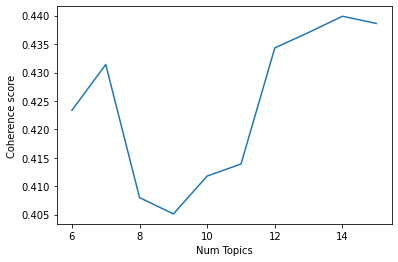

In [11]:
# Show graph
limit=16; start=6; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
#plt.savefig('20240221_PhD_MalletLDALtr-Coherence')
plt.show()

In [12]:
# Print the coherence and perplexity scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, 'Coherence: ', round(cv, 4))

Num Topics = 6 Coherence:  0.4233
Num Topics = 7 Coherence:  0.4314
Num Topics = 8 Coherence:  0.408
Num Topics = 9 Coherence:  0.4051
Num Topics = 10 Coherence:  0.4118
Num Topics = 11 Coherence:  0.4139
Num Topics = 12 Coherence:  0.4343
Num Topics = 13 Coherence:  0.437
Num Topics = 14 Coherence:  0.4399
Num Topics = 15 Coherence:  0.4386


## 7. Final series to determine the best number of iterations for the best model.

In [2]:
import pickle
import gensim
import gensim.corpora as corpora
from gensim.models import CoherenceModel
from pprint import pprint
import pyLDAvis
import pyLDAvis.gensim
import matplotlib.pyplot as plt
%matplotlib inline

# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
mallet_path = 'mallet-2.0.8/bin/mallet' # update this path

# Get it back
with open("20240608_PhD_LtrLem-N.txt", "rb") as fp:   # Unpickling
    data_lemmatizedNouns = pickle.load(fp)
    
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatizedNouns)

# Create Corpus
texts = data_lemmatizedNouns

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

def compute_coherence_values(dictionary, corpus, texts, limit, start, step):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_iter in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=8, id2word=id2word, random_seed=100, iterations=num_iter)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, 
                                                        corpus=corpus, 
                                                        texts=data_lemmatizedNouns, 
                                                        start=500, 
                                                        limit=10500, 
                                                        step=500)

Mallet LDA: 8 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.86503
<20> LL/token: -8.40234
<30> LL/token: -8.16595
<40> LL/token: -8.02846

0	6.25	time letter day write room world month happiness hand weather writing place deal spirit darling picture fire night ship account 
1	6.25	dollar pound money year country land man cent lot people house expense cost place government board market store price passage 
2	6.25	friend brother letter mother family health sister father wife son death daughter year time husband uncle cousin child opportunity kind 
3	6.25	letter book home paper heart girl pleasure time life thing mind hand kind return interest matter work trouble copy weather 
4	6.25	winter people work town place summer month country home day business state snow time city wage prospect reason situation change 
5	6.25	country acre year farm land wood foot person crop horse kind wheat road work tree garden farmer potato climate bushe

<360> LL/token: -7.7595
<370> LL/token: -7.75777
<380> LL/token: -7.75578
<390> LL/token: -7.75597

0	6.25	letter time home day month news write sister pleasure return weather account opportunity health friend happiness picture writing thing darling 
1	6.25	dollar money country man work year people pound cent lot board month expense account cost government company number wage property 
2	6.25	friend brother mother family child health sister letter son year father death wife daughter uncle aunt answer kind cousin doctor 
3	6.25	life hand book heart paper mind interest world year kind work age woman matter copy trial power change anxiety sorrow 
4	6.25	time day winter home summer place people work business country month state city town snow reason rest prospect weather situation 
5	6.25	land country year acre pound farm crop house price spring horse wheat foot farmer market potato kind wood bushel person 
6	6.25	day water house morning town night room hour side boat place evening church 

<210> LL/token: -7.77128
<220> LL/token: -7.77133
<230> LL/token: -7.7777
<240> LL/token: -7.77456

0	6.25	letter time day write news month account weather friend pleasure thing opportunity place happiness comfort manner writing picture darling fire 
1	6.25	dollar money year pound cent man lot country month board cost pay expense government work property number cow gold provision 
2	6.25	friend brother mother family health sister letter year son father death wife child daughter uncle answer aunt cousin kind husband 
3	6.25	hand book heart life paper mind work trouble kind interest fear age matter world copy woman trial power anxiety return 
4	6.25	time people day winter work summer home place country month business state city town man snow thing rest situation reason 
5	6.25	country land year acre farm wood pound crop horse wheat place person house kind foot farmer spring market potato tree 
6	6.25	day morning house hour town water night side company evening boat room return river end 

<560> LL/token: -7.76202
<570> LL/token: -7.76103
<580> LL/token: -7.76523
<590> LL/token: -7.76138

0	6.25	letter time day home friend health month pleasure news write sister weather opportunity account happiness return kind writing picture place 
1	6.25	dollar man money year country people work cent board company account month state expense lot government wage case number climate 
2	6.25	friend brother mother family letter sister child year son father death wife health daughter uncle aunt answer kind cousin house 
3	6.25	life hand book heart paper mind interest work world husband age woman spirit copy matter year trial power anxiety comfort 
4	6.25	time day home winter summer people place month business work country week thing city rest snow town change reason weather 
5	6.25	land country pound year acre farm person crop price money horse wheat house place spring foot farmer market potato bushel 
6	6.25	day town house morning hour side water river boat evening room night fire wood pl

<910> LL/token: -7.76675
<920> LL/token: -7.77087
<930> LL/token: -7.75913
<940> LL/token: -7.76107

0	6.25	letter time month friend pleasure news return account home opportunity day write manner happiness kind health sister writing place weather 
1	6.25	dollar country year man work money people month cent business company board pay expense number government wage account case state 
2	6.25	friend brother mother family sister health letter child year son death wife daughter uncle aunt cousin father home answer house 
3	6.25	life hand book heart world paper interest mind spirit work copy husband kind trial power matter woman pen eye sorrow 
4	6.25	time day winter home summer place people country work week month thing city weather situation snow change town reason rest 
5	6.25	land country pound year acre farm money crop price wheat house horse person foot dollar farmer market potato bushel wood 
6	6.25	day house morning side hour town night water room boat place river evening clock fire 

<260> LL/token: -7.76875
<270> LL/token: -7.76554
<280> LL/token: -7.78071
<290> LL/token: -7.77849

0	6.25	letter time day month write news thing friend weather pleasure home sister manner happiness return account comfort writing trust opportunity 
1	6.25	dollar money year pound man country cent lot account month work expense cost board captain number government situation people pay 
2	6.25	friend brother mother family health sister year letter son child father death wife daughter uncle aunt answer cousin kind summer 
3	6.25	hand life book heart paper mind interest kind work world woman trouble copy matter age power trial pen husband care 
4	6.25	time winter day people home place work country business summer month state city snow rest town weather reason change thing 
5	6.25	country land acre year farm wood pound crop horse wheat kind person foot spring price house farmer market pork potato 
6	6.25	day house morning town water hour night room evening company place side boat ship dinne

<610> LL/token: -7.75503
<620> LL/token: -7.76153
<630> LL/token: -7.76506
<640> LL/token: -7.76084

0	6.25	letter time day month home friend pleasure account news health sister opportunity happiness return manner writing picture trust write darling 
1	6.25	dollar country money man people year work cent company board month lot government wage captain difficulty case expense number gold 
2	6.25	friend brother mother family letter sister child health son father death wife year daughter uncle aunt cousin answer kind doctor 
3	6.25	life hand book heart work world interest paper year mind age spirit husband copy woman matter trial kind power anxiety 
4	6.25	time day winter summer home place business people month thing work city country weather rest snow week change town reason 
5	6.25	land country pound year acre farm person crop price horse house wheat money farmer foot place market potato kind bushel 
6	6.25	day house morning town hour place water room night river boat side fire church sh

<960> LL/token: -7.76717
<970> LL/token: -7.7702
<980> LL/token: -7.77797
<990> LL/token: -7.783

0	6.25	letter time month day friend pleasure health news sister kind home opportunity return place happiness father manner writing trust weather 
1	6.25	year dollar man work people money business country cent board company pay expense state government lot wage month number office 
2	6.25	friend brother mother family letter year sister health son death wife child daughter home uncle aunt cousin house father write 
3	6.25	life hand book heart interest world paper mind work matter copy spirit eye husband age trial anxiety pen power fear 
4	6.25	time winter day home summer country place people work month thing city weather week snow change rest town situation prospect 
5	6.25	land country pound year acre farm money crop price wheat person house dollar farmer place potato market bushel wood seed 
6	6.25	day house night town morning water hour room side boat woman evening river clock church plac

<1310> LL/token: -7.76805
<1320> LL/token: -7.76758
<1330> LL/token: -7.77147
<1340> LL/token: -7.76425

0	6.25	letter time month sister news day friend health pleasure return place weather father write happiness opportunity flower manner writing picture 
1	6.25	year people man work business cent money company dollar state city expense month pay board country government property gold provision 
2	6.25	friend brother mother family letter year child son death wife sister health daughter uncle aunt cousin answer kind father house 
3	6.25	life book hand heart husband interest mind world paper work spirit copy trouble comfort matter trial power anxiety change rest 
4	6.25	time home day winter summer country place week thing month people work snow town situation prospect rain reason respect weather 
5	6.25	country land pound year acre dollar farm money price crop person wheat horse house place farmer market bushel spring seed 
6	6.25	day house water morning town hour side river night boat ro

<160> LL/token: -7.78744
<170> LL/token: -7.78458
<180> LL/token: -7.79206
<190> LL/token: -7.78617

0	6.25	letter time month write news friend day account sister world place weather happiness thing flower spirit care writing pleasure manner 
1	6.25	pound dollar money year country man cent people house pay expense difficulty cost board work lot government store number cow 
2	6.25	friend brother mother family health sister year letter son father wife death child daughter home uncle aunt answer cousin kind 
3	6.25	hand life book heart paper mind work interest kind age matter fear copy husband trouble trial power order return woman 
4	6.25	day winter time people work month country place town summer business thing city home snow rest weather man person state 
5	6.25	land country year acre farm wood foot crop horse wheat kind garden person spring farmer market tree potato bushel building 
6	6.25	day room morning house hour evening water side night company boat church woman return end place 

<510> LL/token: -7.76258
<520> LL/token: -7.76649
<530> LL/token: -7.75811
<540> LL/token: -7.76406

0	6.25	letter time day news month friend pleasure health home account weather opportunity write place happiness writing sister picture trust manner 
1	6.25	dollar year money work man people country cent month board company account case government wage expense property gold employment cost 
2	6.25	friend brother mother family sister child letter son health father death wife daughter year uncle kind aunt answer cousin spring 
3	6.25	life hand book heart interest world mind paper spirit age woman matter copy trouble work comfort trial husband power anxiety 
4	6.25	time home winter day summer place people business month work country city rest snow state change weather reason thing week 
5	6.25	country land year pound acre farm crop price horse wheat person money tree farmer place market potato bushel foot house 
6	6.25	day town morning house hour water river night boat church side evening p

<860> LL/token: -7.77076
<870> LL/token: -7.77352
<880> LL/token: -7.76301
<890> LL/token: -7.77244

0	6.25	letter time month friend news pleasure home kind account sister write opportunity health return manner happiness day writing weather deal 
1	6.25	dollar man year people money country work business cent company pay expense board account government wage office number captain respect 
2	6.25	friend brother mother family letter sister health child son year father death wife daughter uncle aunt cousin home doctor word 
3	6.25	life book heart hand world interest mind paper spirit age work matter woman husband copy eye trial power anxiety sorrow 
4	6.25	time day winter home summer place country work people month week city weather thing snow situation change town reason state 
5	6.25	land country pound year acre farm money person crop price horse wheat foot house farmer market potato wood bushel seed 
6	6.25	day house town water morning hour night side evening boat room place fire ship r

<1210> LL/token: -7.77364
<1220> LL/token: -7.77072
<1230> LL/token: -7.76736
<1240> LL/token: -7.77167

0	6.25	letter time news month pleasure friend sister place write opportunity manner happiness return weather home writing picture health darling spring 
1	6.25	year man people dollar work country money cent business company month expense board pay government captain wage state office gold 
2	6.25	friend brother mother family health sister letter year son child death wife daughter house uncle kind aunt father cousin answer 
3	6.25	life book heart hand interest mind paper world husband matter copy work trial care spirit anxiety power woman age sorrow 
4	6.25	time day home winter summer place work country people month thing week city snow change situation rest weather business reason 
5	6.25	land country pound year acre farm dollar money crop price wheat person farmer foot market potato bushel half horse spring 
6	6.25	day town water morning house river boat side room hour wood place f

<1560> LL/token: -7.77063
<1570> LL/token: -7.76293
<1580> LL/token: -7.76399
<1590> LL/token: -7.76516

0	6.25	letter time friend health kind sister pleasure news day home opportunity place month return happiness flower girl writing trust manner 
1	6.25	year man people work business company country difficulty pay money city state government office board property law lot party gold 
2	6.25	brother mother family friend letter year sister child son death health wife daughter uncle aunt house cousin account father answer 
3	6.25	life book hand heart mind work world spirit paper interest matter husband copy eye woman trial power sorrow age anxiety 
4	6.25	time day home winter month summer place country week people work thing weather snow town rest change situation prospect rain 
5	6.25	country land pound dollar acre year farm money crop price cent wheat foot horse person farmer market spring potato bushel 
6	6.25	day house town morning water room hour river boat side place road night fire 

<1910> LL/token: -7.77295
<1920> LL/token: -7.77524
<1930> LL/token: -7.76754
<1940> LL/token: -7.77388

0	6.25	letter time friend news place pleasure health father return sister day opportunity month write manner happiness flower writing picture kind 
1	6.25	people year man business work country city company state captain head office government interest lot money law party month gold 
2	6.25	brother mother family friend letter sister health son death child wife daughter house uncle aunt year cousin dollar trouble kind 
3	6.25	life book heart hand mind paper world matter woman husband copy work spirit age trial anxiety pen kind sorrow rest 
4	6.25	time day home winter summer month work week country place weather year people thing spring snow change town situation reason 
5	6.25	country land pound acre dollar farm year money cent crop price person wheat farmer potato market bushel horse seed wage 
6	6.25	day house water town morning hour river boat night side evening tree place room fir

<260> LL/token: -7.76875
<270> LL/token: -7.76554
<280> LL/token: -7.78071
<290> LL/token: -7.77849

0	6.25	letter time day month write news thing friend weather pleasure home sister manner happiness return account comfort writing trust opportunity 
1	6.25	dollar money year pound man country cent lot account month work expense cost board captain number government situation people pay 
2	6.25	friend brother mother family health sister year letter son child father death wife daughter uncle aunt answer cousin kind summer 
3	6.25	hand life book heart paper mind interest kind work world woman trouble copy matter age power trial pen husband care 
4	6.25	time winter day people home place work country business summer month state city snow rest town weather reason change thing 
5	6.25	country land acre year farm wood pound crop horse wheat kind person foot spring price house farmer market pork potato 
6	6.25	day house morning town water hour night room evening company place side boat ship dinne

<610> LL/token: -7.75503
<620> LL/token: -7.76153
<630> LL/token: -7.76506
<640> LL/token: -7.76084

0	6.25	letter time day month home friend pleasure account news health sister opportunity happiness return manner writing picture trust write darling 
1	6.25	dollar country money man people year work cent company board month lot government wage captain difficulty case expense number gold 
2	6.25	friend brother mother family letter sister child health son father death wife year daughter uncle aunt cousin answer kind doctor 
3	6.25	life hand book heart work world interest paper year mind age spirit husband copy woman matter trial kind power anxiety 
4	6.25	time day winter summer home place business people month thing work city country weather rest snow week change town reason 
5	6.25	land country pound year acre farm person crop price horse house wheat money farmer foot place market potato kind bushel 
6	6.25	day house morning town hour place water room night river boat side fire church sh

<960> LL/token: -7.76717
<970> LL/token: -7.7702
<980> LL/token: -7.77797
<990> LL/token: -7.783

0	6.25	letter time month day friend pleasure health news sister kind home opportunity return place happiness father manner writing trust weather 
1	6.25	year dollar man work people money business country cent board company pay expense state government lot wage month number office 
2	6.25	friend brother mother family letter year sister health son death wife child daughter home uncle aunt cousin house father write 
3	6.25	life hand book heart interest world paper mind work matter copy spirit eye husband age trial anxiety pen power fear 
4	6.25	time winter day home summer country place people work month thing city weather week snow change rest town situation prospect 
5	6.25	land country pound year acre farm money crop price wheat person house dollar farmer place potato market bushel wood seed 
6	6.25	day house night town morning water hour room side boat woman evening river clock church plac

<1310> LL/token: -7.76805
<1320> LL/token: -7.76758
<1330> LL/token: -7.77147
<1340> LL/token: -7.76425

0	6.25	letter time month sister news day friend health pleasure return place weather father write happiness opportunity flower manner writing picture 
1	6.25	year people man work business cent money company dollar state city expense month pay board country government property gold provision 
2	6.25	friend brother mother family letter year child son death wife sister health daughter uncle aunt cousin answer kind father house 
3	6.25	life book hand heart husband interest mind world paper work spirit copy trouble comfort matter trial power anxiety change rest 
4	6.25	time home day winter summer country place week thing month people work snow town situation prospect rain reason respect weather 
5	6.25	country land pound year acre dollar farm money price crop person wheat horse house place farmer market bushel spring seed 
6	6.25	day house water morning town hour side river night boat ro

<1660> LL/token: -7.77218
<1670> LL/token: -7.76652
<1680> LL/token: -7.76759
<1690> LL/token: -7.76454

0	6.25	letter time friend pleasure news day sister health opportunity home write return manner happiness deal flower weather writing month trust 
1	6.25	year people man work business company city pay office difficulty country government captain lot board property state money month party 
2	6.25	friend brother mother family sister letter child year health son death wife daughter uncle aunt dollar cousin father kind doctor 
3	6.25	life book hand heart mind work husband paper world woman spirit matter care copy eye kind trial anxiety pen sorrow 
4	6.25	time day home winter month summer place country work week thing weather situation snow people town rest prospect change case 
5	6.25	country land pound acre year farm dollar money person cent crop price wheat farmer market potato bushel kind wage horse 
6	6.25	day house water town hour morning place river boat side room tree wood night e

<2010> LL/token: -7.77324
<2020> LL/token: -7.76679
<2030> LL/token: -7.76271
<2040> LL/token: -7.76942

0	6.25	letter time day news friend kind health sister pleasure month home opportunity return manner write happiness deal care father trust 
1	6.25	people year man business country work city company office state captain government money reason gold fact lot law fortune party 
2	6.25	friend brother mother family letter year sister son death wife health child daughter house uncle aunt answer cousin father money 
3	6.25	life hand book heart mind work paper woman age world rest copy interest husband spirit trial power eye matter anxiety 
4	6.25	time home day winter month place summer week country work weather account thing people year snow situation spring change town 
5	6.25	country land pound dollar acre farm year money cent crop price person wheat farmer market potato bushel foot cost seed 
6	6.25	day water house town hour morning night river boat side room road evening place tree fir

<2360> LL/token: -7.76786
<2370> LL/token: -7.76671
<2380> LL/token: -7.76323
<2390> LL/token: -7.76157

0	6.25	letter time friend day news health return month pleasure kind sister weather manner happiness father picture trust write writing home 
1	6.25	people year man country business company city work state lot reason office government head law money kind gold fact fortune 
2	6.25	brother friend mother family sister year letter child son death wife health daughter uncle aunt cousin home house father money 
3	6.25	life hand book heart mind paper work spirit world husband interest copy care trial anxiety trouble matter sorrow difficulty eye 
4	6.25	time day home winter month summer place work week account country situation snow town weather spring thing change rest leave 
5	6.25	country land pound dollar acre year farm money cent crop price house person wheat board farmer market potato bushel wage 
6	6.25	day water house town morning hour room boat night road place side tree wood eveni

<210> LL/token: -7.77128
<220> LL/token: -7.77133
<230> LL/token: -7.7777
<240> LL/token: -7.77456

0	6.25	letter time day write news month account weather friend pleasure thing opportunity place happiness comfort manner writing picture darling fire 
1	6.25	dollar money year pound cent man lot country month board cost pay expense government work property number cow gold provision 
2	6.25	friend brother mother family health sister letter year son father death wife child daughter uncle answer aunt cousin kind husband 
3	6.25	hand book heart life paper mind work trouble kind interest fear age matter world copy woman trial power anxiety return 
4	6.25	time people day winter work summer home place country month business state city town man snow thing rest situation reason 
5	6.25	country land year acre farm wood pound crop horse wheat place person house kind foot farmer spring market potato tree 
6	6.25	day morning house hour town water night side company evening boat room return river end 

<560> LL/token: -7.76202
<570> LL/token: -7.76103
<580> LL/token: -7.76523
<590> LL/token: -7.76138

0	6.25	letter time day home friend health month pleasure news write sister weather opportunity account happiness return kind writing picture place 
1	6.25	dollar man money year country people work cent board company account month state expense lot government wage case number climate 
2	6.25	friend brother mother family letter sister child year son father death wife health daughter uncle aunt answer kind cousin house 
3	6.25	life hand book heart paper mind interest work world husband age woman spirit copy matter year trial power anxiety comfort 
4	6.25	time day home winter summer people place month business work country week thing city rest snow town change reason weather 
5	6.25	land country pound year acre farm person crop price money horse wheat house place spring foot farmer market potato bushel 
6	6.25	day town house morning hour side water river boat evening room night fire wood pl

<910> LL/token: -7.76675
<920> LL/token: -7.77087
<930> LL/token: -7.75913
<940> LL/token: -7.76107

0	6.25	letter time month friend pleasure news return account home opportunity day write manner happiness kind health sister writing place weather 
1	6.25	dollar country year man work money people month cent business company board pay expense number government wage account case state 
2	6.25	friend brother mother family sister health letter child year son death wife daughter uncle aunt cousin father home answer house 
3	6.25	life hand book heart world paper interest mind spirit work copy husband kind trial power matter woman pen eye sorrow 
4	6.25	time day winter home summer place people country work week month thing city weather situation snow change town reason rest 
5	6.25	land country pound year acre farm money crop price wheat house horse person foot dollar farmer market potato bushel wood 
6	6.25	day house morning side hour town night water room boat place river evening clock fire 

<1260> LL/token: -7.77608
<1270> LL/token: -7.77469
<1280> LL/token: -7.77388
<1290> LL/token: -7.77257

0	6.25	letter time friend news month home place pleasure health sister day return opportunity manner happiness kind write father weather picture 
1	6.25	year man work people business dollar country money cent company month pay expense government difficulty office state mine property board 
2	6.25	friend brother mother family letter sister health year child wife death son daughter uncle aunt cousin answer father account house 
3	6.25	life hand book heart world interest mind paper matter spirit copy kind care husband work trouble trial power anxiety sorrow 
4	6.25	time day home winter summer people month work week country thing place situation snow rest prospect change weather heat city 
5	6.25	country land pound year acre farm dollar money crop price house wheat person farmer horse foot market potato bushel cost 
6	6.25	day town house place water hour morning river boat church evenin

<1610> LL/token: -7.76546
<1620> LL/token: -7.75734
<1630> LL/token: -7.76153
<1640> LL/token: -7.76497

0	6.25	letter time friend month health news sister pleasure kind father return manner happiness spring opportunity flower trust care write deal 
1	6.25	year people man work business company city country money difficulty pay lot government state property board party gold provision account 
2	6.25	brother mother friend family letter child sister year son death health wife daughter uncle aunt cousin house kind dollar doctor 
3	6.25	life hand book heart mind world paper work spirit woman interest matter husband copy eye trial power anxiety age sorrow 
4	6.25	time day home winter place summer country month thing work week weather people snow town situation rest prospect rain change 
5	6.25	country land pound year dollar acre farm money cent crop price person wheat farmer horse market potato bushel cost wood 
6	6.25	day house town water hour morning room river side boat evening church fir

<1960> LL/token: -7.78442
<1970> LL/token: -7.77563
<1980> LL/token: -7.78091
<1990> LL/token: -7.78212

0	6.25	letter time kind friend news pleasure home return health sister opportunity happiness write flower manner writing father picture trust deal 
1	6.25	people man work year business country city company office captain government money state party interest head war gold lot fact 
2	6.25	brother friend mother family letter sister health child son death wife daughter year uncle aunt house cousin answer father time 
3	6.25	life book heart hand mind paper spirit work husband age matter world copy trial power anxiety woman pen trouble sorrow 
4	6.25	time day home winter month summer place country year week thing work weather people spring snow town rest change prospect 
5	6.25	country land pound dollar acre farm year money cent crop price wheat person farmer market potato bushel horse wage seed 
6	6.25	day house water town morning place hour boat river night evening side road wood fire

<2310> LL/token: -7.7677
<2320> LL/token: -7.7697
<2330> LL/token: -7.76773
<2340> LL/token: -7.76424

0	6.25	letter time friend news month health pleasure write home return day father weather manner happiness kind sister picture trust darling 
1	6.25	people year man business country work city company state interest office government money reason mind gold fact fortune mine lot 
2	6.25	brother mother friend family sister year child son letter death wife health daughter uncle house aunt cousin kind answer doctor 
3	6.25	life hand book heart paper woman spirit husband mind copy world work eye difficulty trial anxiety power care pen trouble 
4	6.25	time day home winter summer month place country week work account thing situation snow change weather town spring prospect leave 
5	6.25	land country pound dollar acre farm year money cent crop price wheat person farmer market potato bushel horse wage cost 
6	6.25	day house water town hour boat road morning night tree side river place board woo

<2660> LL/token: -7.76604
<2670> LL/token: -7.76798
<2680> LL/token: -7.77461
<2690> LL/token: -7.77341

0	6.25	letter time month news friend day health pleasure write home return father sister kind opportunity manner happiness writing picture trust 
1	6.25	people man year work business country company city lot money law government expense state interest office reason party gold provision 
2	6.25	brother friend mother family sister child letter year son death wife health daughter uncle aunt house home cousin doctor father 
3	6.25	life book heart hand paper mind work world husband age copy spirit trouble trial power anxiety fear sorrow woman year 
4	6.25	time day winter home summer month place country weather spring week account people town snow thing church hand situation work 
5	6.25	country land pound dollar year acre farm money cent crop price person wheat wood house farmer market potato cost bushel 
6	6.25	day water house morning town hour evening night room river boat road tree fi

Mallet LDA: 8 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.86503
<20> LL/token: -8.40234
<30> LL/token: -8.16595
<40> LL/token: -8.02846

0	6.25	time letter day write room world month happiness hand weather writing place deal spirit darling picture fire night ship account 
1	6.25	dollar pound money year country land man cent lot people house expense cost place government board market store price passage 
2	6.25	friend brother letter mother family health sister father wife son death daughter year time husband uncle cousin child opportunity kind 
3	6.25	letter book home paper heart girl pleasure time life thing mind hand kind return interest matter work trouble copy weather 
4	6.25	winter people work town place summer month country home day business state snow time city wage prospect reason situation change 
5	6.25	country acre year farm land wood foot person crop horse kind wheat road work tree garden farmer potato climate bushe

<360> LL/token: -7.7595
<370> LL/token: -7.75777
<380> LL/token: -7.75578
<390> LL/token: -7.75597

0	6.25	letter time home day month news write sister pleasure return weather account opportunity health friend happiness picture writing thing darling 
1	6.25	dollar money country man work year people pound cent lot board month expense account cost government company number wage property 
2	6.25	friend brother mother family child health sister letter son year father death wife daughter uncle aunt answer kind cousin doctor 
3	6.25	life hand book heart paper mind interest world year kind work age woman matter copy trial power change anxiety sorrow 
4	6.25	time day winter home summer place people work business country month state city town snow reason rest prospect weather situation 
5	6.25	land country year acre pound farm crop house price spring horse wheat foot farmer market potato kind wood bushel person 
6	6.25	day water house morning town night room hour side boat place evening church 

<710> LL/token: -7.76136
<720> LL/token: -7.75712
<730> LL/token: -7.75551
<740> LL/token: -7.75837

0	6.25	letter time month place sister day news friend pleasure weather account return opportunity girl home kind happiness health write manner 
1	6.25	dollar country work man year people money cent company month board pay account expense government wage office gold provision cost 
2	6.25	friend brother mother family child health letter sister son father death year wife daughter uncle aunt answer cousin life doctor 
3	6.25	life hand book heart world mind paper interest work matter year husband copy eye fear woman trial power spirit age 
4	6.25	time winter home summer day business people place thing month city week country snow change work rest reason state situation 
5	6.25	land country pound year acre farm money person crop price horse wheat foot house farmer spring market potato kind bushel 
6	6.25	day town house morning side hour water river boat church evening night room woman fire s

<1060> LL/token: -7.76754
<1070> LL/token: -7.76754
<1080> LL/token: -7.77506
<1090> LL/token: -7.77305

0	6.25	letter time friend month news health pleasure sister home return opportunity manner happiness kind place father writing write deal darling 
1	6.25	year man work people country dollar money cent business month company board pay expense state wage government number gold provision 
2	6.25	friend brother mother family letter child year sister son death wife health daughter uncle aunt cousin father account kind write 
3	6.25	life book heart hand interest mind world work husband paper copy power anxiety matter fear trial flower care woman eye 
4	6.25	time day home winter summer place country people work month weather week thing city change snow situation rest reason town 
5	6.25	land country pound year acre farm dollar money crop price wheat house person kind place farmer market horse bushel foot 
6	6.25	day house town water morning hour evening room river boat side church clock wo

<1410> LL/token: -7.75642
<1420> LL/token: -7.75783
<1430> LL/token: -7.76375
<1440> LL/token: -7.76211

0	6.25	letter time home month friend pleasure news return sister opportunity father write kind manner health happiness flower writing picture trust 
1	6.25	year man work people business cent company money month lot pay country state board government office party property gold mine 
2	6.25	friend brother mother family sister health child letter son year death wife daughter uncle aunt cousin kind account word doctor 
3	6.25	life hand book heart mind interest world paper work husband matter copy age trial trouble woman pen care sorrow spirit 
4	6.25	time day home winter summer country place people week month work thing weather snow change house rest situation rain comfort 
5	6.25	country land pound acre year dollar farm money crop price person wheat farmer market potato place bushel spring seed wood 
6	6.25	day town house morning water hour night room river boat side place evening fire

<1760> LL/token: -7.76592
<1770> LL/token: -7.77249
<1780> LL/token: -7.77237
<1790> LL/token: -7.77183

0	6.25	letter time friend month health day kind news pleasure return father opportunity write manner happiness sister flower writing picture trust 
1	6.25	year people man business work country city company money lot pay captain government state month party gold difficulty fact office 
2	6.25	friend brother mother family sister letter child son year health death wife daughter uncle aunt house cousin dollar answer account 
3	6.25	life book hand heart mind world work paper husband woman matter copy spirit rest child trial interest age anxiety care 
4	6.25	time home day winter place summer month work week country spring weather thing people snow situation change prospect town heat 
5	6.25	country land pound acre dollar farm year money cent crop price wheat person farmer market potato cost bushel foot wage 
6	6.25	day house town water hour morning side river boat room road wood night tre

<2110> LL/token: -7.76317
<2120> LL/token: -7.76337
<2130> LL/token: -7.76357
<2140> LL/token: -7.76308

0	6.25	letter time day kind friend month news pleasure sister health return father opportunity manner happiness deal trust picture darling weather 
1	6.25	people man business year company city office lot head state government money country work captain gold interest mine fact party 
2	6.25	friend brother mother family letter sister child year health son death wife daughter uncle aunt cousin house answer kind write 
3	6.25	life hand book heart mind work paper woman world spirit husband copy age trial power anxiety eye change matter sorrow 
4	6.25	time home day winter month place summer country week work weather snow account year thing respect rest prospect situation town 
5	6.25	country land pound year dollar acre farm money cent crop price wheat person farmer market cost bushel work potato wage 
6	6.25	day house town water morning hour place river side boat road night wood room tree

<2460> LL/token: -7.76694
<2470> LL/token: -7.77002
<2480> LL/token: -7.76515
<2490> LL/token: -7.76432

0	6.25	letter time day month news friend sister pleasure return home health opportunity manner place happiness care trust father picture weather 
1	6.25	people year man business work country city company office interest reason government lot state money mind number side gold fact 
2	6.25	friend brother mother family letter child sister health son death wife year daughter uncle home kind aunt cousin father write 
3	6.25	life book hand heart work paper world husband mind spirit year copy fear woman eye trial power trouble difficulty anxiety 
4	6.25	time day winter place summer home month country week account thing weather situation snow town church spring leave rest change 
5	6.25	country land pound year acre dollar farm money cent crop price wheat person house work farmer market bushel cost wage 
6	6.25	day house water town morning hour night boat evening tree room wood river woman b

<2810> LL/token: -7.76776
<2820> LL/token: -7.76383
<2830> LL/token: -7.76209
<2840> LL/token: -7.76646

0	6.25	letter time friend day home health news pleasure month return opportunity manner happiness sister kind write writing trust father darling 
1	6.25	people year man work business country company city money office reason law government lot state case gold interest fact kind 
2	6.25	brother mother family friend sister child letter son death wife health daughter kind uncle home aunt year house cousin father 
3	6.25	life hand book heart mind paper work world husband matter spirit copy age trouble eye friend trial anxiety interest power 
4	6.25	time day winter place month home summer country thing account spring weather week town situation snow people leave church person 
5	6.25	country land pound year dollar acre farm money cent crop price person wheat house farmer market potato cost bushel board 
6	6.25	day water house morning town river boat hour road tree room side fire wood nigh

<3160> LL/token: -7.76798
<3170> LL/token: -7.77147
<3180> LL/token: -7.767
<3190> LL/token: -7.76405

0	6.25	letter time day news friend month health pleasure weather return sister opportunity manner happiness kind deal write writing picture trust 
1	6.25	people man year business work time country city lot money company office government party reason head mind gold side fact 
2	6.25	friend brother mother family letter sister son child death wife health year daughter home uncle house aunt answer cousin father 
3	6.25	life book hand heart paper work mind age matter husband copy world interest spirit trial anxiety woman kind sorrow pen 
4	6.25	day time winter place home summer country month account spring year thing situation snow town church week people respect change 
5	6.25	land country pound dollar acre year farm money work cent crop price wheat person farmer market bushel wood house foot 
6	6.25	day water house town room place morning hour night boat river tree board side evening sh

Mallet LDA: 8 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.86503
<20> LL/token: -8.40234
<30> LL/token: -8.16595
<40> LL/token: -8.02846

0	6.25	time letter day write room world month happiness hand weather writing place deal spirit darling picture fire night ship account 
1	6.25	dollar pound money year country land man cent lot people house expense cost place government board market store price passage 
2	6.25	friend brother letter mother family health sister father wife son death daughter year time husband uncle cousin child opportunity kind 
3	6.25	letter book home paper heart girl pleasure time life thing mind hand kind return interest matter work trouble copy weather 
4	6.25	winter people work town place summer month country home day business state snow time city wage prospect reason situation change 
5	6.25	country acre year farm land wood foot person crop horse kind wheat road work tree garden farmer potato climate bushe

<360> LL/token: -7.7595
<370> LL/token: -7.75777
<380> LL/token: -7.75578
<390> LL/token: -7.75597

0	6.25	letter time home day month news write sister pleasure return weather account opportunity health friend happiness picture writing thing darling 
1	6.25	dollar money country man work year people pound cent lot board month expense account cost government company number wage property 
2	6.25	friend brother mother family child health sister letter son year father death wife daughter uncle aunt answer kind cousin doctor 
3	6.25	life hand book heart paper mind interest world year kind work age woman matter copy trial power change anxiety sorrow 
4	6.25	time day winter home summer place people work business country month state city town snow reason rest prospect weather situation 
5	6.25	land country year acre pound farm crop house price spring horse wheat foot farmer market potato kind wood bushel person 
6	6.25	day water house morning town night room hour side boat place evening church 

<710> LL/token: -7.76136
<720> LL/token: -7.75712
<730> LL/token: -7.75551
<740> LL/token: -7.75837

0	6.25	letter time month place sister day news friend pleasure weather account return opportunity girl home kind happiness health write manner 
1	6.25	dollar country work man year people money cent company month board pay account expense government wage office gold provision cost 
2	6.25	friend brother mother family child health letter sister son father death year wife daughter uncle aunt answer cousin life doctor 
3	6.25	life hand book heart world mind paper interest work matter year husband copy eye fear woman trial power spirit age 
4	6.25	time winter home summer day business people place thing month city week country snow change work rest reason state situation 
5	6.25	land country pound year acre farm money person crop price horse wheat foot house farmer spring market potato kind bushel 
6	6.25	day town house morning side hour water river boat church evening night room woman fire s

<1060> LL/token: -7.76754
<1070> LL/token: -7.76754
<1080> LL/token: -7.77506
<1090> LL/token: -7.77305

0	6.25	letter time friend month news health pleasure sister home return opportunity manner happiness kind place father writing write deal darling 
1	6.25	year man work people country dollar money cent business month company board pay expense state wage government number gold provision 
2	6.25	friend brother mother family letter child year sister son death wife health daughter uncle aunt cousin father account kind write 
3	6.25	life book heart hand interest mind world work husband paper copy power anxiety matter fear trial flower care woman eye 
4	6.25	time day home winter summer place country people work month weather week thing city change snow situation rest reason town 
5	6.25	land country pound year acre farm dollar money crop price wheat house person kind place farmer market horse bushel foot 
6	6.25	day house town water morning hour evening room river boat side church clock wo

<1410> LL/token: -7.75642
<1420> LL/token: -7.75783
<1430> LL/token: -7.76375
<1440> LL/token: -7.76211

0	6.25	letter time home month friend pleasure news return sister opportunity father write kind manner health happiness flower writing picture trust 
1	6.25	year man work people business cent company money month lot pay country state board government office party property gold mine 
2	6.25	friend brother mother family sister health child letter son year death wife daughter uncle aunt cousin kind account word doctor 
3	6.25	life hand book heart mind interest world paper work husband matter copy age trial trouble woman pen care sorrow spirit 
4	6.25	time day home winter summer country place people week month work thing weather snow change house rest situation rain comfort 
5	6.25	country land pound acre year dollar farm money crop price person wheat farmer market potato place bushel spring seed wood 
6	6.25	day town house morning water hour night room river boat side place evening fire

<1760> LL/token: -7.76592
<1770> LL/token: -7.77249
<1780> LL/token: -7.77237
<1790> LL/token: -7.77183

0	6.25	letter time friend month health day kind news pleasure return father opportunity write manner happiness sister flower writing picture trust 
1	6.25	year people man business work country city company money lot pay captain government state month party gold difficulty fact office 
2	6.25	friend brother mother family sister letter child son year health death wife daughter uncle aunt house cousin dollar answer account 
3	6.25	life book hand heart mind world work paper husband woman matter copy spirit rest child trial interest age anxiety care 
4	6.25	time home day winter place summer month work week country spring weather thing people snow situation change prospect town heat 
5	6.25	country land pound acre dollar farm year money cent crop price wheat person farmer market potato cost bushel foot wage 
6	6.25	day house town water hour morning side river boat room road wood night tre

<2110> LL/token: -7.76317
<2120> LL/token: -7.76337
<2130> LL/token: -7.76357
<2140> LL/token: -7.76308

0	6.25	letter time day kind friend month news pleasure sister health return father opportunity manner happiness deal trust picture darling weather 
1	6.25	people man business year company city office lot head state government money country work captain gold interest mine fact party 
2	6.25	friend brother mother family letter sister child year health son death wife daughter uncle aunt cousin house answer kind write 
3	6.25	life hand book heart mind work paper woman world spirit husband copy age trial power anxiety eye change matter sorrow 
4	6.25	time home day winter month place summer country week work weather snow account year thing respect rest prospect situation town 
5	6.25	country land pound year dollar acre farm money cent crop price wheat person farmer market cost bushel work potato wage 
6	6.25	day house town water morning hour place river side boat road night wood room tree

<2460> LL/token: -7.76694
<2470> LL/token: -7.77002
<2480> LL/token: -7.76515
<2490> LL/token: -7.76432

0	6.25	letter time day month news friend sister pleasure return home health opportunity manner place happiness care trust father picture weather 
1	6.25	people year man business work country city company office interest reason government lot state money mind number side gold fact 
2	6.25	friend brother mother family letter child sister health son death wife year daughter uncle home kind aunt cousin father write 
3	6.25	life book hand heart work paper world husband mind spirit year copy fear woman eye trial power trouble difficulty anxiety 
4	6.25	time day winter place summer home month country week account thing weather situation snow town church spring leave rest change 
5	6.25	country land pound year acre dollar farm money cent crop price wheat person house work farmer market bushel cost wage 
6	6.25	day house water town morning hour night boat evening tree room wood river woman b

<2810> LL/token: -7.76776
<2820> LL/token: -7.76383
<2830> LL/token: -7.76209
<2840> LL/token: -7.76646

0	6.25	letter time friend day home health news pleasure month return opportunity manner happiness sister kind write writing trust father darling 
1	6.25	people year man work business country company city money office reason law government lot state case gold interest fact kind 
2	6.25	brother mother family friend sister child letter son death wife health daughter kind uncle home aunt year house cousin father 
3	6.25	life hand book heart mind paper work world husband matter spirit copy age trouble eye friend trial anxiety interest power 
4	6.25	time day winter place month home summer country thing account spring weather week town situation snow people leave church person 
5	6.25	country land pound year dollar acre farm money cent crop price person wheat house farmer market potato cost bushel board 
6	6.25	day water house morning town river boat hour road tree room side fire wood nigh

<3160> LL/token: -7.76798
<3170> LL/token: -7.77147
<3180> LL/token: -7.767
<3190> LL/token: -7.76405

0	6.25	letter time day news friend month health pleasure weather return sister opportunity manner happiness kind deal write writing picture trust 
1	6.25	people man year business work time country city lot money company office government party reason head mind gold side fact 
2	6.25	friend brother mother family letter sister son child death wife health year daughter home uncle house aunt answer cousin father 
3	6.25	life book hand heart paper work mind age matter husband copy world interest spirit trial anxiety woman kind sorrow pen 
4	6.25	day time winter place home summer country month account spring year thing situation snow town church week people respect change 
5	6.25	land country pound dollar acre year farm money work cent crop price wheat person farmer market bushel wood house foot 
6	6.25	day water house town room place morning hour night boat river tree board side evening sh

<3510> LL/token: -7.77098
<3520> LL/token: -7.77103
<3530> LL/token: -7.76588
<3540> LL/token: -7.77145

0	6.25	letter time friend news day month health pleasure kind return happiness weather write manner father picture trust garden darling opportunity 
1	6.25	people man work year business time city company office lot government state mind law mine gold fact money month captain 
2	6.25	brother mother family friend sister letter child son year death wife health daughter uncle home answer aunt cousin house father 
3	6.25	life hand book heart work paper mind husband friend spirit age matter copy world woman interest care trial anxiety rest 
4	6.25	time day home place winter country summer month week people account spring situation weather snow person church thing respect year 
5	6.25	country land pound year dollar acre farm money cent price crop wheat house work farmer person market potato horse cost 
6	6.25	day water house town morning hour night boat river road tree place evening board 

<3860> LL/token: -7.76816
<3870> LL/token: -7.7727
<3880> LL/token: -7.7618
<3890> LL/token: -7.76249

0	6.25	letter time news month friend sister home write day pleasure health opportunity return manner happiness weather deal writing father trust 
1	6.25	people year work man business time city company month interest office mind government lot gold kind fact head law call 
2	6.25	brother mother family friend letter child year health sister death wife son daughter uncle aunt kind home cousin father trouble 
3	6.25	life hand book heart friend paper work world husband mind spirit matter copy eye trial power care sorrow age loss 
4	6.25	day country place winter time summer home month town account spring people thing snow person week church situation climate state 
5	6.25	land country pound year dollar acre farm money cent crop price wheat house work farmer market potato person cost bushel 
6	6.25	day house morning water hour place town night side boat evening room board fire tree ship road

<210> LL/token: -7.77128
<220> LL/token: -7.77133
<230> LL/token: -7.7777
<240> LL/token: -7.77456

0	6.25	letter time day write news month account weather friend pleasure thing opportunity place happiness comfort manner writing picture darling fire 
1	6.25	dollar money year pound cent man lot country month board cost pay expense government work property number cow gold provision 
2	6.25	friend brother mother family health sister letter year son father death wife child daughter uncle answer aunt cousin kind husband 
3	6.25	hand book heart life paper mind work trouble kind interest fear age matter world copy woman trial power anxiety return 
4	6.25	time people day winter work summer home place country month business state city town man snow thing rest situation reason 
5	6.25	country land year acre farm wood pound crop horse wheat place person house kind foot farmer spring market potato tree 
6	6.25	day morning house hour town water night side company evening boat room return river end 

<560> LL/token: -7.76202
<570> LL/token: -7.76103
<580> LL/token: -7.76523
<590> LL/token: -7.76138

0	6.25	letter time day home friend health month pleasure news write sister weather opportunity account happiness return kind writing picture place 
1	6.25	dollar man money year country people work cent board company account month state expense lot government wage case number climate 
2	6.25	friend brother mother family letter sister child year son father death wife health daughter uncle aunt answer kind cousin house 
3	6.25	life hand book heart paper mind interest work world husband age woman spirit copy matter year trial power anxiety comfort 
4	6.25	time day home winter summer people place month business work country week thing city rest snow town change reason weather 
5	6.25	land country pound year acre farm person crop price money horse wheat house place spring foot farmer market potato bushel 
6	6.25	day town house morning hour side water river boat evening room night fire wood pl

<910> LL/token: -7.76675
<920> LL/token: -7.77087
<930> LL/token: -7.75913
<940> LL/token: -7.76107

0	6.25	letter time month friend pleasure news return account home opportunity day write manner happiness kind health sister writing place weather 
1	6.25	dollar country year man work money people month cent business company board pay expense number government wage account case state 
2	6.25	friend brother mother family sister health letter child year son death wife daughter uncle aunt cousin father home answer house 
3	6.25	life hand book heart world paper interest mind spirit work copy husband kind trial power matter woman pen eye sorrow 
4	6.25	time day winter home summer place people country work week month thing city weather situation snow change town reason rest 
5	6.25	land country pound year acre farm money crop price wheat house horse person foot dollar farmer market potato bushel wood 
6	6.25	day house morning side hour town night water room boat place river evening clock fire 

<1260> LL/token: -7.77608
<1270> LL/token: -7.77469
<1280> LL/token: -7.77388
<1290> LL/token: -7.77257

0	6.25	letter time friend news month home place pleasure health sister day return opportunity manner happiness kind write father weather picture 
1	6.25	year man work people business dollar country money cent company month pay expense government difficulty office state mine property board 
2	6.25	friend brother mother family letter sister health year child wife death son daughter uncle aunt cousin answer father account house 
3	6.25	life hand book heart world interest mind paper matter spirit copy kind care husband work trouble trial power anxiety sorrow 
4	6.25	time day home winter summer people month work week country thing place situation snow rest prospect change weather heat city 
5	6.25	country land pound year acre farm dollar money crop price house wheat person farmer horse foot market potato bushel cost 
6	6.25	day town house place water hour morning river boat church evenin

<1610> LL/token: -7.76546
<1620> LL/token: -7.75734
<1630> LL/token: -7.76153
<1640> LL/token: -7.76497

0	6.25	letter time friend month health news sister pleasure kind father return manner happiness spring opportunity flower trust care write deal 
1	6.25	year people man work business company city country money difficulty pay lot government state property board party gold provision account 
2	6.25	brother mother friend family letter child sister year son death health wife daughter uncle aunt cousin house kind dollar doctor 
3	6.25	life hand book heart mind world paper work spirit woman interest matter husband copy eye trial power anxiety age sorrow 
4	6.25	time day home winter place summer country month thing work week weather people snow town situation rest prospect rain change 
5	6.25	country land pound year dollar acre farm money cent crop price person wheat farmer horse market potato bushel cost wood 
6	6.25	day house town water hour morning room river side boat evening church fir

<1960> LL/token: -7.78442
<1970> LL/token: -7.77563
<1980> LL/token: -7.78091
<1990> LL/token: -7.78212

0	6.25	letter time kind friend news pleasure home return health sister opportunity happiness write flower manner writing father picture trust deal 
1	6.25	people man work year business country city company office captain government money state party interest head war gold lot fact 
2	6.25	brother friend mother family letter sister health child son death wife daughter year uncle aunt house cousin answer father time 
3	6.25	life book heart hand mind paper spirit work husband age matter world copy trial power anxiety woman pen trouble sorrow 
4	6.25	time day home winter month summer place country year week thing work weather people spring snow town rest change prospect 
5	6.25	country land pound dollar acre farm year money cent crop price wheat person farmer market potato bushel horse wage seed 
6	6.25	day house water town morning place hour boat river night evening side road wood fire

<2310> LL/token: -7.7677
<2320> LL/token: -7.7697
<2330> LL/token: -7.76773
<2340> LL/token: -7.76424

0	6.25	letter time friend news month health pleasure write home return day father weather manner happiness kind sister picture trust darling 
1	6.25	people year man business country work city company state interest office government money reason mind gold fact fortune mine lot 
2	6.25	brother mother friend family sister year child son letter death wife health daughter uncle house aunt cousin kind answer doctor 
3	6.25	life hand book heart paper woman spirit husband mind copy world work eye difficulty trial anxiety power care pen trouble 
4	6.25	time day home winter summer month place country week work account thing situation snow change weather town spring prospect leave 
5	6.25	land country pound dollar acre farm year money cent crop price wheat person farmer market potato bushel horse wage cost 
6	6.25	day house water town hour boat road morning night tree side river place board woo

<2660> LL/token: -7.76604
<2670> LL/token: -7.76798
<2680> LL/token: -7.77461
<2690> LL/token: -7.77341

0	6.25	letter time month news friend day health pleasure write home return father sister kind opportunity manner happiness writing picture trust 
1	6.25	people man year work business country company city lot money law government expense state interest office reason party gold provision 
2	6.25	brother friend mother family sister child letter year son death wife health daughter uncle aunt house home cousin doctor father 
3	6.25	life book heart hand paper mind work world husband age copy spirit trouble trial power anxiety fear sorrow woman year 
4	6.25	time day winter home summer month place country weather spring week account people town snow thing church hand situation work 
5	6.25	country land pound dollar year acre farm money cent crop price person wheat wood house farmer market potato cost bushel 
6	6.25	day water house morning town hour evening night room river boat road tree fi

<3010> LL/token: -7.77525
<3020> LL/token: -7.78714
<3030> LL/token: -7.77777
<3040> LL/token: -7.77096

0	6.25	letter time news day friend pleasure return health write opportunity manner happiness sister life writing weather month trust kind home 
1	6.25	work people year man business time company city lot interest place reason government state office party gold fact law kind 
2	6.25	brother mother family friend child sister letter health year son death wife daughter home uncle house aunt cousin father dollar 
3	6.25	life book heart hand paper mind friend work world husband copy spirit woman matter trial trouble care anxiety age pen 
4	6.25	time day winter place home month country summer people account weather week situation snow person year town church comfort spring 
5	6.25	country land pound year acre dollar farm money cent crop price wheat work farmer market person bushel horse wage cost 
6	6.25	day house town water morning room hour night boat river evening side road tree wood boa

<3360> LL/token: -7.77186
<3370> LL/token: -7.76091
<3380> LL/token: -7.76439
<3390> LL/token: -7.77575

0	6.25	letter time day friend news health pleasure return sister opportunity kind happiness father home write writing picture care weather deal 
1	6.25	people man year work business time company city office interest lot month government reason money head state party gold fact 
2	6.25	brother mother family friend letter sister child health year death son wife daughter house uncle aunt answer home cousin father 
3	6.25	book life heart hand work paper husband mind world matter rest age copy trouble loss trial spirit anxiety eye woman 
4	6.25	time place country winter home day month summer thing spring account year situation weather snow person climate respect people town 
5	6.25	land country pound dollar acre farm year money cent crop price wheat work farmer horse potato market person bushel house 
6	6.25	day water town house morning hour night river room tree boat evening place wood s

<3710> LL/token: -7.76667
<3720> LL/token: -7.76585
<3730> LL/token: -7.77366
<3740> LL/token: -7.76416

0	6.25	letter time day news month health pleasure friend home write weather opportunity kind sister life return happiness girl manner writing 
1	6.25	people year man business work time city company lot head mind government mine interest office month party call gold reason 
2	6.25	brother mother family friend child sister year health wife son death daughter letter home uncle aunt answer kind father cousin 
3	6.25	life book hand heart friend work world husband paper mind matter copy care spirit eye trial power anxiety rest woman 
4	6.25	place country time day summer home winter month spring church account situation snow people town respect climate thing week change 
5	6.25	land country pound year acre dollar farm money work person price cent crop wheat house market farmer potato cost bushel 
6	6.25	day morning house town water hour boat tree side room night road evening fire ship wood

<4060> LL/token: -7.75738
<4070> LL/token: -7.75246
<4080> LL/token: -7.75713
<4090> LL/token: -7.75924

0	6.25	letter time friend month news pleasure health day weather sister return opportunity happiness father home writing kind picture trust write 
1	6.25	year man time people work business company city head office month lot government interest kind party gold fact town fortune 
2	6.25	brother mother family friend year sister child health letter death wife son daughter uncle home aunt cousin kind father house 
3	6.25	life book heart hand work mind world paper husband spirit friend woman copy fear loss trial anxiety trouble rest age 
4	6.25	day place country time home winter summer month people church spring thing situation snow respect climate account weather prospect comfort 
5	6.25	land country pound year dollar acre farm money cent crop price work wheat person farmer market potato cost bushel wage 
6	6.25	day house water hour morning town room night side boat tree wood place board

<4410> LL/token: -7.7584
<4420> LL/token: -7.75751
<4430> LL/token: -7.75768
<4440> LL/token: -7.76384

0	6.25	letter time home news month friend day pleasure health sister write opportunity return happiness kind weather writing father care trust 
1	6.25	people man work year time business city company lot office place government kind money month interest gold state call fact 
2	6.25	family brother mother friend child year sister letter health son wife daughter death home uncle aunt kind cousin house father 
3	6.25	life book heart hand work paper world mind spirit copy husband woman power anxiety trial sorrow fear interest change eye 
4	6.25	day country place time winter summer month home town account weather thing situation snow church idea respect person climate spring 
5	6.25	land country pound year dollar acre farm money cent crop price wheat person horse farmer house market potato bushel wage 
6	6.25	day house morning water hour room boat evening town side night wood river fire boa

<260> LL/token: -7.76875
<270> LL/token: -7.76554
<280> LL/token: -7.78071
<290> LL/token: -7.77849

0	6.25	letter time day month write news thing friend weather pleasure home sister manner happiness return account comfort writing trust opportunity 
1	6.25	dollar money year pound man country cent lot account month work expense cost board captain number government situation people pay 
2	6.25	friend brother mother family health sister year letter son child father death wife daughter uncle aunt answer cousin kind summer 
3	6.25	hand life book heart paper mind interest kind work world woman trouble copy matter age power trial pen husband care 
4	6.25	time winter day people home place work country business summer month state city snow rest town weather reason change thing 
5	6.25	country land acre year farm wood pound crop horse wheat kind person foot spring price house farmer market pork potato 
6	6.25	day house morning town water hour night room evening company place side boat ship dinne

<610> LL/token: -7.75503
<620> LL/token: -7.76153
<630> LL/token: -7.76506
<640> LL/token: -7.76084

0	6.25	letter time day month home friend pleasure account news health sister opportunity happiness return manner writing picture trust write darling 
1	6.25	dollar country money man people year work cent company board month lot government wage captain difficulty case expense number gold 
2	6.25	friend brother mother family letter sister child health son father death wife year daughter uncle aunt cousin answer kind doctor 
3	6.25	life hand book heart work world interest paper year mind age spirit husband copy woman matter trial kind power anxiety 
4	6.25	time day winter summer home place business people month thing work city country weather rest snow week change town reason 
5	6.25	land country pound year acre farm person crop price horse house wheat money farmer foot place market potato kind bushel 
6	6.25	day house morning town hour place water room night river boat side fire church sh

<960> LL/token: -7.76717
<970> LL/token: -7.7702
<980> LL/token: -7.77797
<990> LL/token: -7.783

0	6.25	letter time month day friend pleasure health news sister kind home opportunity return place happiness father manner writing trust weather 
1	6.25	year dollar man work people money business country cent board company pay expense state government lot wage month number office 
2	6.25	friend brother mother family letter year sister health son death wife child daughter home uncle aunt cousin house father write 
3	6.25	life hand book heart interest world paper mind work matter copy spirit eye husband age trial anxiety pen power fear 
4	6.25	time winter day home summer country place people work month thing city weather week snow change rest town situation prospect 
5	6.25	land country pound year acre farm money crop price wheat person house dollar farmer place potato market bushel wood seed 
6	6.25	day house night town morning water hour room side boat woman evening river clock church plac

<1310> LL/token: -7.76805
<1320> LL/token: -7.76758
<1330> LL/token: -7.77147
<1340> LL/token: -7.76425

0	6.25	letter time month sister news day friend health pleasure return place weather father write happiness opportunity flower manner writing picture 
1	6.25	year people man work business cent money company dollar state city expense month pay board country government property gold provision 
2	6.25	friend brother mother family letter year child son death wife sister health daughter uncle aunt cousin answer kind father house 
3	6.25	life book hand heart husband interest mind world paper work spirit copy trouble comfort matter trial power anxiety change rest 
4	6.25	time home day winter summer country place week thing month people work snow town situation prospect rain reason respect weather 
5	6.25	country land pound year acre dollar farm money price crop person wheat horse house place farmer market bushel spring seed 
6	6.25	day house water morning town hour side river night boat ro

<1660> LL/token: -7.77218
<1670> LL/token: -7.76652
<1680> LL/token: -7.76759
<1690> LL/token: -7.76454

0	6.25	letter time friend pleasure news day sister health opportunity home write return manner happiness deal flower weather writing month trust 
1	6.25	year people man work business company city pay office difficulty country government captain lot board property state money month party 
2	6.25	friend brother mother family sister letter child year health son death wife daughter uncle aunt dollar cousin father kind doctor 
3	6.25	life book hand heart mind work husband paper world woman spirit matter care copy eye kind trial anxiety pen sorrow 
4	6.25	time day home winter month summer place country work week thing weather situation snow people town rest prospect change case 
5	6.25	country land pound acre year farm dollar money person cent crop price wheat farmer market potato bushel kind wage horse 
6	6.25	day house water town hour morning place river boat side room tree wood night e

<2010> LL/token: -7.77324
<2020> LL/token: -7.76679
<2030> LL/token: -7.76271
<2040> LL/token: -7.76942

0	6.25	letter time day news friend kind health sister pleasure month home opportunity return manner write happiness deal care father trust 
1	6.25	people year man business country work city company office state captain government money reason gold fact lot law fortune party 
2	6.25	friend brother mother family letter year sister son death wife health child daughter house uncle aunt answer cousin father money 
3	6.25	life hand book heart mind work paper woman age world rest copy interest husband spirit trial power eye matter anxiety 
4	6.25	time home day winter month place summer week country work weather account thing people year snow situation spring change town 
5	6.25	country land pound dollar acre farm year money cent crop price person wheat farmer market potato bushel foot cost seed 
6	6.25	day water house town hour morning night river boat side room road evening place tree fir

<2360> LL/token: -7.76786
<2370> LL/token: -7.76671
<2380> LL/token: -7.76323
<2390> LL/token: -7.76157

0	6.25	letter time friend day news health return month pleasure kind sister weather manner happiness father picture trust write writing home 
1	6.25	people year man country business company city work state lot reason office government head law money kind gold fact fortune 
2	6.25	brother friend mother family sister year letter child son death wife health daughter uncle aunt cousin home house father money 
3	6.25	life hand book heart mind paper work spirit world husband interest copy care trial anxiety trouble matter sorrow difficulty eye 
4	6.25	time day home winter month summer place work week account country situation snow town weather spring thing change rest leave 
5	6.25	country land pound dollar acre year farm money cent crop price house person wheat board farmer market potato bushel wage 
6	6.25	day water house town morning hour room boat night road place side tree wood eveni

<2710> LL/token: -7.77583
<2720> LL/token: -7.77548
<2730> LL/token: -7.77284
<2740> LL/token: -7.7733

0	6.25	letter time friend news home pleasure health kind sister return day opportunity write manner happiness trust deal place father darling 
1	6.25	people man business work year country company office city law government lot reason gold provision money case opinion party fact 
2	6.25	brother mother family friend sister son health death child wife daughter letter year uncle aunt cousin father trouble house dollar 
3	6.25	life hand book heart world work paper mind husband age spirit copy care friend interest trial power flower matter anxiety 
4	6.25	time day month winter home summer country place year weather spring thing week town snow account church situation work state 
5	6.25	country land pound dollar year acre farm money cent person crop price wheat house farmer market potato cost bushel work 
6	6.25	day house water morning town room hour place river boat side tree road night fi

<3060> LL/token: -7.78478
<3070> LL/token: -7.78371
<3080> LL/token: -7.76938
<3090> LL/token: -7.76694

0	6.25	letter time day friend news home health pleasure month sister opportunity return manner kind happiness deal weather father trust write 
1	6.25	people work man year business time city company lot place office month interest reason government country party gold fact expense 
2	6.25	brother friend mother family letter sister year child health son death wife daughter uncle aunt cousin kind father house home 
3	6.25	life hand book heart paper mind husband work world age copy spirit trial anxiety pen matter rest sorrow eye nature 
4	6.25	time day winter place home summer month country account week spring people thing year situation weather snow church respect town 
5	6.25	country land pound dollar acre farm year money cent crop price person wheat work farmer market house bushel horse wood 
6	6.25	day house town water morning night hour river tree boat side board evening fire ship r

<3410> LL/token: -7.7755
<3420> LL/token: -7.76981
<3430> LL/token: -7.77023
<3440> LL/token: -7.77809

0	6.25	letter time day friend home month news return sister pleasure write health opportunity weather manner happiness father writing care trust 
1	6.25	people man year work business time city company kind lot office government country party gold call head state fact mind 
2	6.25	friend brother mother family sister letter health child son year death wife daughter uncle aunt cousin home answer father money 
3	6.25	life hand book heart work paper world husband mind interest age matter spirit copy trouble trial rest anxiety loss eye 
4	6.25	place winter day country time home summer month account town thing spring week situation snow weather church respect climate case 
5	6.25	country land pound dollar year acre farm money cent crop price wheat person house work farmer market potato wood bushel 
6	6.25	day house water morning hour town river room boat place tree side night road fire ship

<3760> LL/token: -7.76282
<3770> LL/token: -7.76037
<3780> LL/token: -7.76194
<3790> LL/token: -7.76143

0	6.25	letter time day friend news health month pleasure return kind write weather home opportunity manner happiness father sister writing deal 
1	6.25	people year man work business company city lot interest money office time government head kind party gold mine month fact 
2	6.25	brother mother family friend letter sister child year death wife daughter son health uncle aunt answer home house cousin father 
3	6.25	life hand book heart work mind paper world friend spirit woman matter copy rest husband eye trial power anxiety pen 
4	6.25	time place country day home winter summer month account spring thing church people situation snow person respect town climate weather 
5	6.25	land country pound year dollar acre farm money cent price crop wheat house work person horse farmer market potato bushel 
6	6.25	day town water house morning hour night side boat evening tree room river fire shi

<4110> LL/token: -7.75753
<4120> LL/token: -7.76963
<4130> LL/token: -7.76523
<4140> LL/token: -7.76244

0	6.25	letter time day month sister pleasure health kind return weather friend news opportunity home write happiness writing picture father trust 
1	6.25	year man people time business work company city money month lot office government mind call reason law head gold expense 
2	6.25	brother mother family friend letter child sister health year death wife daughter son uncle home aunt cousin father house answer 
3	6.25	life book heart hand work friend husband world paper mind spirit copy interest change loss trial power anxiety woman eye 
4	6.25	country place day time home summer winter month people spring account church person town situation snow respect climate thing weather 
5	6.25	land country pound year dollar acre farm money cent crop work price wheat house farmer market potato bushel cost wage 
6	6.25	day water house morning hour town river night boat room place tree side wood fi

<4460> LL/token: -7.76266
<4470> LL/token: -7.76414
<4480> LL/token: -7.76418
<4490> LL/token: -7.75983

0	6.25	letter time day month sister news home pleasure friend kind health opportunity write happiness return writing trust father deal darling 
1	6.25	work year time people man business city company lot money office place mind government month pay kind interest state fact 
2	6.25	friend family brother mother child year health son letter sister wife daughter death uncle aunt cousin house father account answer 
3	6.25	life book hand heart world work paper mind spirit copy husband care trial power eye anxiety matter sorrow age fear 
4	6.25	place day country winter home summer time month people thing weather town situation church person account case respect snow climate 
5	6.25	land country pound year dollar acre farm money cent crop price wheat person farmer market potato bushel work wage seed 
6	6.25	day house water morning town hour night boat room side wood evening clock board fire 

<4810> LL/token: -7.76379
<4820> LL/token: -7.77125
<4830> LL/token: -7.76137
<4840> LL/token: -7.75586

0	6.25	letter time day friend news month home pleasure kind write sister return health opportunity happiness deal father trust weather care 
1	6.25	people year work time man business company place city lot reason kind government month money law office party gold pay 
2	6.25	family brother mother letter friend sister child health wife year son daughter death home uncle aunt cousin answer father winter 
3	6.25	life book heart hand friend paper mind husband world work woman matter copy rest age interest trial power spirit anxiety 
4	6.25	country day place home winter time summer month situation account state church spring idea thing person change weather snow climate 
5	6.25	land country pound year dollar acre farm money cent crop price wheat work person house farmer market potato board bushel 
6	6.25	day house town night water morning hour room river boat side road evening tree wood s

<160> LL/token: -7.78744
<170> LL/token: -7.78458
<180> LL/token: -7.79206
<190> LL/token: -7.78617

0	6.25	letter time month write news friend day account sister world place weather happiness thing flower spirit care writing pleasure manner 
1	6.25	pound dollar money year country man cent people house pay expense difficulty cost board work lot government store number cow 
2	6.25	friend brother mother family health sister year letter son father wife death child daughter home uncle aunt answer cousin kind 
3	6.25	hand life book heart paper mind work interest kind age matter fear copy husband trouble trial power order return woman 
4	6.25	day winter time people work month country place town summer business thing city home snow rest weather man person state 
5	6.25	land country year acre farm wood foot crop horse wheat kind garden person spring farmer market tree potato bushel building 
6	6.25	day room morning house hour evening water side night company boat church woman return end place 

<510> LL/token: -7.76258
<520> LL/token: -7.76649
<530> LL/token: -7.75811
<540> LL/token: -7.76406

0	6.25	letter time day news month friend pleasure health home account weather opportunity write place happiness writing sister picture trust manner 
1	6.25	dollar year money work man people country cent month board company account case government wage expense property gold employment cost 
2	6.25	friend brother mother family sister child letter son health father death wife daughter year uncle kind aunt answer cousin spring 
3	6.25	life hand book heart interest world mind paper spirit age woman matter copy trouble work comfort trial husband power anxiety 
4	6.25	time home winter day summer place people business month work country city rest snow state change weather reason thing week 
5	6.25	country land year pound acre farm crop price horse wheat person money tree farmer place market potato bushel foot house 
6	6.25	day town morning house hour water river night boat church side evening p

<860> LL/token: -7.77076
<870> LL/token: -7.77352
<880> LL/token: -7.76301
<890> LL/token: -7.77244

0	6.25	letter time month friend news pleasure home kind account sister write opportunity health return manner happiness day writing weather deal 
1	6.25	dollar man year people money country work business cent company pay expense board account government wage office number captain respect 
2	6.25	friend brother mother family letter sister health child son year father death wife daughter uncle aunt cousin home doctor word 
3	6.25	life book heart hand world interest mind paper spirit age work matter woman husband copy eye trial power anxiety sorrow 
4	6.25	time day winter home summer place country work people month week city weather thing snow situation change town reason state 
5	6.25	land country pound year acre farm money person crop price horse wheat foot house farmer market potato wood bushel seed 
6	6.25	day house town water morning hour night side evening boat room place fire ship r

<1210> LL/token: -7.77364
<1220> LL/token: -7.77072
<1230> LL/token: -7.76736
<1240> LL/token: -7.77167

0	6.25	letter time news month pleasure friend sister place write opportunity manner happiness return weather home writing picture health darling spring 
1	6.25	year man people dollar work country money cent business company month expense board pay government captain wage state office gold 
2	6.25	friend brother mother family health sister letter year son child death wife daughter house uncle kind aunt father cousin answer 
3	6.25	life book heart hand interest mind paper world husband matter copy work trial care spirit anxiety power woman age sorrow 
4	6.25	time day home winter summer place work country people month thing week city snow change situation rest weather business reason 
5	6.25	land country pound year acre farm dollar money crop price wheat person farmer foot market potato bushel half horse spring 
6	6.25	day town water morning house river boat side room hour wood place f

<1560> LL/token: -7.77063
<1570> LL/token: -7.76293
<1580> LL/token: -7.76399
<1590> LL/token: -7.76516

0	6.25	letter time friend health kind sister pleasure news day home opportunity place month return happiness flower girl writing trust manner 
1	6.25	year man people work business company country difficulty pay money city state government office board property law lot party gold 
2	6.25	brother mother family friend letter year sister child son death health wife daughter uncle aunt house cousin account father answer 
3	6.25	life book hand heart mind work world spirit paper interest matter husband copy eye woman trial power sorrow age anxiety 
4	6.25	time day home winter month summer place country week people work thing weather snow town rest change situation prospect rain 
5	6.25	country land pound dollar acre year farm money crop price cent wheat foot horse person farmer market spring potato bushel 
6	6.25	day house town morning water room hour river boat side place road night fire 

<1910> LL/token: -7.77295
<1920> LL/token: -7.77524
<1930> LL/token: -7.76754
<1940> LL/token: -7.77388

0	6.25	letter time friend news place pleasure health father return sister day opportunity month write manner happiness flower writing picture kind 
1	6.25	people year man business work country city company state captain head office government interest lot money law party month gold 
2	6.25	brother mother family friend letter sister health son death child wife daughter house uncle aunt year cousin dollar trouble kind 
3	6.25	life book heart hand mind paper world matter woman husband copy work spirit age trial anxiety pen kind sorrow rest 
4	6.25	time day home winter summer month work week country place weather year people thing spring snow change town situation reason 
5	6.25	country land pound acre dollar farm year money cent crop price person wheat farmer potato market bushel horse seed wage 
6	6.25	day house water town morning hour river boat night side evening tree place room fir

<2260> LL/token: -7.77431
<2270> LL/token: -7.77439
<2280> LL/token: -7.77235
<2290> LL/token: -7.76893

0	6.25	letter time friend news kind pleasure sister month health day opportunity write manner happiness return father writing picture trust deal 
1	6.25	people year man country business city company lot work government interest money office state law gold case reason party fact 
2	6.25	brother friend mother family letter sister year health child son death wife daughter uncle aunt cousin home answer kind father 
3	6.25	book hand life heart mind work paper world matter trouble spirit copy woman trial anxiety husband age flower eye pen 
4	6.25	time day home winter month place summer work week weather country thing spring people church snow situation town year account 
5	6.25	land country pound acre dollar farm year money cent crop price person wheat farmer market potato bushel wood foot wage 
6	6.25	day house water town morning hour night place river boat road side tree fire ship eveni

<2610> LL/token: -7.76462
<2620> LL/token: -7.76826
<2630> LL/token: -7.77129
<2640> LL/token: -7.771

0	6.25	letter time month friend news sister health pleasure kind day return opportunity home deal happiness manner father picture trust writing 
1	6.25	people year man work business city company lot country money office law case reason government gold provision fact party head 
2	6.25	friend brother mother family letter sister son death health wife child year daughter uncle aunt cousin home house father kind 
3	6.25	life book heart hand paper mind work world husband spirit interest copy care trial power anxiety age sorrow nature gentleman 
4	6.25	time day winter home place summer country month week town weather people snow thing account spring person church situation prospect 
5	6.25	country land pound year dollar acre farm money cent crop house price wheat person work farmer market bushel potato wage 
6	6.25	day water morning house hour night town river boat road side evening wood pl

<2960> LL/token: -7.77796
<2970> LL/token: -7.7765
<2980> LL/token: -7.78045
<2990> LL/token: -7.78111

0	6.25	letter time friend day news month health pleasure sister return manner happiness opportunity life write weather writing deal trust father 
1	6.25	people year man business work company time city country office reason government place lot party gold state mine fact side 
2	6.25	brother mother friend family letter sister son death wife child health daughter year home uncle aunt kind cousin house father 
3	6.25	life hand book heart work paper mind world husband spirit matter copy trouble interest trial age anxiety pen sorrow fear 
4	6.25	time day home winter country place summer month week year spring snow weather account town people church situation change rest 
5	6.25	land country pound dollar acre farm year money person cent crop price wheat farmer market potato work bushel wood wage 
6	6.25	day house morning room town water night boat hour river tree side fire evening board se

<3310> LL/token: -7.76968
<3320> LL/token: -7.767
<3330> LL/token: -7.76686
<3340> LL/token: -7.77319

0	6.25	letter time friend day sister health month kind news return pleasure write home opportunity happiness manner weather writing father picture 
1	6.25	people man year business work company city time office lot month government state party mind gold war fact country gentleman 
2	6.25	brother mother friend family letter sister child year health death wife son daughter home uncle answer aunt cousin money kind 
3	6.25	life book heart work hand paper husband world mind age matter trouble interest copy fear loss trial anxiety change spirit 
4	6.25	time place day winter home country summer month spring week year account weather situation snow thing respect climate person town 
5	6.25	country land pound dollar acre farm year money cent crop price wheat work person farmer market potato cost bushel house 
6	6.25	day house water town morning hour river boat evening side tree room fire ship w

<3660> LL/token: -7.77632
<3670> LL/token: -7.77363
<3680> LL/token: -7.77279
<3690> LL/token: -7.77564

0	6.25	letter time day month pleasure news health kind return home friend weather opportunity write happiness father sister writing deal trust 
1	6.25	people year man business time work city company lot interest mind government office party head money gold fact side state 
2	6.25	brother mother family friend sister letter year child health death wife daughter son uncle aunt answer time home cousin father 
3	6.25	life book hand heart work paper husband world friend mind matter age rest copy eye spirit trial power anxiety woman 
4	6.25	place day winter country time home summer month spring town church thing week snow account situation year weather respect climate 
5	6.25	country land pound dollar year acre farm money work cent crop price person wheat farmer potato market foot bushel cost 
6	6.25	day house water morning hour town place boat night wood river tree side board ship road ev

<4010> LL/token: -7.75792
<4020> LL/token: -7.76483
<4030> LL/token: -7.76082
<4040> LL/token: -7.7621

0	6.25	letter time day month friend pleasure home father kind health opportunity write sister news happiness return writing trust girl darling 
1	6.25	work people year man business time city company office lot government kind party gold head fact law interest duty war 
2	6.25	brother mother family friend letter year child sister health death wife daughter son home uncle aunt cousin house answer doctor 
3	6.25	life hand book heart world mind husband friend paper work copy trouble interest spirit loss trial anxiety age matter rest 
4	6.25	place day country winter summer time home month weather church town spring thing account situation snow change people respect climate 
5	6.25	country land pound dollar year acre farm money cent crop price wheat person farmer potato market cost bushel wage seed 
6	6.25	day water house morning hour town side evening boat tree night river room board wood

<4360> LL/token: -7.75876
<4370> LL/token: -7.75538
<4380> LL/token: -7.76001
<4390> LL/token: -7.76461

0	6.25	letter time friend home news month pleasure day write health father kind opportunity return happiness deal weather sister writing trust 
1	6.25	people year man time work business city company month place office lot government state party call gold kind fact head 
2	6.25	family brother mother friend sister health year child son death wife letter daughter home uncle aunt cousin house answer kind 
3	6.25	life book heart hand work mind paper world husband woman friend spirit copy matter interest trial anxiety age power sorrow 
4	6.25	day country place winter time home summer month account situation church weather person snow idea climate difficulty spring thing people 
5	6.25	land country pound year acre dollar farm money cent price crop wheat farmer work foot market potato person bushel cost 
6	6.25	day house water town hour morning night evening room boat road river side ship b

<4710> LL/token: -7.76871
<4720> LL/token: -7.77342
<4730> LL/token: -7.76193
<4740> LL/token: -7.76129

0	6.25	letter time month news friend sister day pleasure health weather write kind return opportunity happiness father picture trust deal darling 
1	6.25	people work man time year business lot city kind company place reason government office head mind party gold fact money 
2	6.25	brother family mother friend letter year sister health son wife daughter home death child uncle aunt cousin kind answer father 
3	6.25	book life heart hand work mind paper friend husband world matter interest child copy trial power spirit change age care 
4	6.25	country place day home winter month summer time church thing situation person account idea snow state rest climate difficulty spring 
5	6.25	country land pound year dollar acre farm money cent crop price wheat work house farmer person market potato bushel wage 
6	6.25	day house town water hour morning river boat room tree night side board evening w

<5060> LL/token: -7.76241
<5070> LL/token: -7.75588
<5080> LL/token: -7.76333
<5090> LL/token: -7.76673

0	6.25	letter time friend month news home sister pleasure day kind health write father return opportunity life happiness flower writing weather 
1	6.25	time year people work man business city company lot money pay reason government interest office mind kind gold mine month 
2	6.25	brother mother family friend sister year health letter child wife son death home daughter uncle aunt cousin house answer winter 
3	6.25	life book heart hand friend husband paper work mind world woman trouble matter copy change spirit trial power pen sorrow 
4	6.25	day country place winter summer month home people time thing account weather situation person church town case idea climate rest 
5	6.25	country land pound dollar year acre farm money cent crop price wheat work house farmer market person foot bushel wood 
6	6.25	day house water morning town room hour evening boat night side road clock river fire 

<5410> LL/token: -7.76749
<5420> LL/token: -7.77104
<5430> LL/token: -7.7727
<5440> LL/token: -7.77141

0	6.25	letter time day month news home friend write pleasure place kind weather opportunity sister happiness flower return trust health picture 
1	6.25	work year people man time business company money city kind pay law reason lot office government month party place gold 
2	6.25	brother mother family friend year child sister health letter wife son daughter death uncle aunt time father cousin home house 
3	6.25	life book heart hand mind husband work paper interest world matter woman copy spirit friend care trial power anxiety dollar 
4	6.25	country winter home place day summer people church month account time town person thing situation snow state case climate school 
5	6.25	land country pound dollar acre farm year money cent crop price wheat house work farmer market potato bushel horse seed 
6	6.25	day water house morning hour town night tree river room evening road side clock wood sh

<260> LL/token: -7.76875
<270> LL/token: -7.76554
<280> LL/token: -7.78071
<290> LL/token: -7.77849

0	6.25	letter time day month write news thing friend weather pleasure home sister manner happiness return account comfort writing trust opportunity 
1	6.25	dollar money year pound man country cent lot account month work expense cost board captain number government situation people pay 
2	6.25	friend brother mother family health sister year letter son child father death wife daughter uncle aunt answer cousin kind summer 
3	6.25	hand life book heart paper mind interest kind work world woman trouble copy matter age power trial pen husband care 
4	6.25	time winter day people home place work country business summer month state city snow rest town weather reason change thing 
5	6.25	country land acre year farm wood pound crop horse wheat kind person foot spring price house farmer market pork potato 
6	6.25	day house morning town water hour night room evening company place side boat ship dinne

<610> LL/token: -7.75503
<620> LL/token: -7.76153
<630> LL/token: -7.76506
<640> LL/token: -7.76084

0	6.25	letter time day month home friend pleasure account news health sister opportunity happiness return manner writing picture trust write darling 
1	6.25	dollar country money man people year work cent company board month lot government wage captain difficulty case expense number gold 
2	6.25	friend brother mother family letter sister child health son father death wife year daughter uncle aunt cousin answer kind doctor 
3	6.25	life hand book heart work world interest paper year mind age spirit husband copy woman matter trial kind power anxiety 
4	6.25	time day winter summer home place business people month thing work city country weather rest snow week change town reason 
5	6.25	land country pound year acre farm person crop price horse house wheat money farmer foot place market potato kind bushel 
6	6.25	day house morning town hour place water room night river boat side fire church sh

<960> LL/token: -7.76717
<970> LL/token: -7.7702
<980> LL/token: -7.77797
<990> LL/token: -7.783

0	6.25	letter time month day friend pleasure health news sister kind home opportunity return place happiness father manner writing trust weather 
1	6.25	year dollar man work people money business country cent board company pay expense state government lot wage month number office 
2	6.25	friend brother mother family letter year sister health son death wife child daughter home uncle aunt cousin house father write 
3	6.25	life hand book heart interest world paper mind work matter copy spirit eye husband age trial anxiety pen power fear 
4	6.25	time winter day home summer country place people work month thing city weather week snow change rest town situation prospect 
5	6.25	land country pound year acre farm money crop price wheat person house dollar farmer place potato market bushel wood seed 
6	6.25	day house night town morning water hour room side boat woman evening river clock church plac

<1310> LL/token: -7.76805
<1320> LL/token: -7.76758
<1330> LL/token: -7.77147
<1340> LL/token: -7.76425

0	6.25	letter time month sister news day friend health pleasure return place weather father write happiness opportunity flower manner writing picture 
1	6.25	year people man work business cent money company dollar state city expense month pay board country government property gold provision 
2	6.25	friend brother mother family letter year child son death wife sister health daughter uncle aunt cousin answer kind father house 
3	6.25	life book hand heart husband interest mind world paper work spirit copy trouble comfort matter trial power anxiety change rest 
4	6.25	time home day winter summer country place week thing month people work snow town situation prospect rain reason respect weather 
5	6.25	country land pound year acre dollar farm money price crop person wheat horse house place farmer market bushel spring seed 
6	6.25	day house water morning town hour side river night boat ro

<1660> LL/token: -7.77218
<1670> LL/token: -7.76652
<1680> LL/token: -7.76759
<1690> LL/token: -7.76454

0	6.25	letter time friend pleasure news day sister health opportunity home write return manner happiness deal flower weather writing month trust 
1	6.25	year people man work business company city pay office difficulty country government captain lot board property state money month party 
2	6.25	friend brother mother family sister letter child year health son death wife daughter uncle aunt dollar cousin father kind doctor 
3	6.25	life book hand heart mind work husband paper world woman spirit matter care copy eye kind trial anxiety pen sorrow 
4	6.25	time day home winter month summer place country work week thing weather situation snow people town rest prospect change case 
5	6.25	country land pound acre year farm dollar money person cent crop price wheat farmer market potato bushel kind wage horse 
6	6.25	day house water town hour morning place river boat side room tree wood night e

<2010> LL/token: -7.77324
<2020> LL/token: -7.76679
<2030> LL/token: -7.76271
<2040> LL/token: -7.76942

0	6.25	letter time day news friend kind health sister pleasure month home opportunity return manner write happiness deal care father trust 
1	6.25	people year man business country work city company office state captain government money reason gold fact lot law fortune party 
2	6.25	friend brother mother family letter year sister son death wife health child daughter house uncle aunt answer cousin father money 
3	6.25	life hand book heart mind work paper woman age world rest copy interest husband spirit trial power eye matter anxiety 
4	6.25	time home day winter month place summer week country work weather account thing people year snow situation spring change town 
5	6.25	country land pound dollar acre farm year money cent crop price person wheat farmer market potato bushel foot cost seed 
6	6.25	day water house town hour morning night river boat side room road evening place tree fir

<2360> LL/token: -7.76786
<2370> LL/token: -7.76671
<2380> LL/token: -7.76323
<2390> LL/token: -7.76157

0	6.25	letter time friend day news health return month pleasure kind sister weather manner happiness father picture trust write writing home 
1	6.25	people year man country business company city work state lot reason office government head law money kind gold fact fortune 
2	6.25	brother friend mother family sister year letter child son death wife health daughter uncle aunt cousin home house father money 
3	6.25	life hand book heart mind paper work spirit world husband interest copy care trial anxiety trouble matter sorrow difficulty eye 
4	6.25	time day home winter month summer place work week account country situation snow town weather spring thing change rest leave 
5	6.25	country land pound dollar acre year farm money cent crop price house person wheat board farmer market potato bushel wage 
6	6.25	day water house town morning hour room boat night road place side tree wood eveni

<2710> LL/token: -7.77583
<2720> LL/token: -7.77548
<2730> LL/token: -7.77284
<2740> LL/token: -7.7733

0	6.25	letter time friend news home pleasure health kind sister return day opportunity write manner happiness trust deal place father darling 
1	6.25	people man business work year country company office city law government lot reason gold provision money case opinion party fact 
2	6.25	brother mother family friend sister son health death child wife daughter letter year uncle aunt cousin father trouble house dollar 
3	6.25	life hand book heart world work paper mind husband age spirit copy care friend interest trial power flower matter anxiety 
4	6.25	time day month winter home summer country place year weather spring thing week town snow account church situation work state 
5	6.25	country land pound dollar year acre farm money cent person crop price wheat house farmer market potato cost bushel work 
6	6.25	day house water morning town room hour place river boat side tree road night fi

<3060> LL/token: -7.78478
<3070> LL/token: -7.78371
<3080> LL/token: -7.76938
<3090> LL/token: -7.76694

0	6.25	letter time day friend news home health pleasure month sister opportunity return manner kind happiness deal weather father trust write 
1	6.25	people work man year business time city company lot place office month interest reason government country party gold fact expense 
2	6.25	brother friend mother family letter sister year child health son death wife daughter uncle aunt cousin kind father house home 
3	6.25	life hand book heart paper mind husband work world age copy spirit trial anxiety pen matter rest sorrow eye nature 
4	6.25	time day winter place home summer month country account week spring people thing year situation weather snow church respect town 
5	6.25	country land pound dollar acre farm year money cent crop price person wheat work farmer market house bushel horse wood 
6	6.25	day house town water morning night hour river tree boat side board evening fire ship r

<3410> LL/token: -7.7755
<3420> LL/token: -7.76981
<3430> LL/token: -7.77023
<3440> LL/token: -7.77809

0	6.25	letter time day friend home month news return sister pleasure write health opportunity weather manner happiness father writing care trust 
1	6.25	people man year work business time city company kind lot office government country party gold call head state fact mind 
2	6.25	friend brother mother family sister letter health child son year death wife daughter uncle aunt cousin home answer father money 
3	6.25	life hand book heart work paper world husband mind interest age matter spirit copy trouble trial rest anxiety loss eye 
4	6.25	place winter day country time home summer month account town thing spring week situation snow weather church respect climate case 
5	6.25	country land pound dollar year acre farm money cent crop price wheat person house work farmer market potato wood bushel 
6	6.25	day house water morning hour town river room boat place tree side night road fire ship

<3760> LL/token: -7.76282
<3770> LL/token: -7.76037
<3780> LL/token: -7.76194
<3790> LL/token: -7.76143

0	6.25	letter time day friend news health month pleasure return kind write weather home opportunity manner happiness father sister writing deal 
1	6.25	people year man work business company city lot interest money office time government head kind party gold mine month fact 
2	6.25	brother mother family friend letter sister child year death wife daughter son health uncle aunt answer home house cousin father 
3	6.25	life hand book heart work mind paper world friend spirit woman matter copy rest husband eye trial power anxiety pen 
4	6.25	time place country day home winter summer month account spring thing church people situation snow person respect town climate weather 
5	6.25	land country pound year dollar acre farm money cent price crop wheat house work person horse farmer market potato bushel 
6	6.25	day town water house morning hour night side boat evening tree room river fire shi

<4110> LL/token: -7.75753
<4120> LL/token: -7.76963
<4130> LL/token: -7.76523
<4140> LL/token: -7.76244

0	6.25	letter time day month sister pleasure health kind return weather friend news opportunity home write happiness writing picture father trust 
1	6.25	year man people time business work company city money month lot office government mind call reason law head gold expense 
2	6.25	brother mother family friend letter child sister health year death wife daughter son uncle home aunt cousin father house answer 
3	6.25	life book heart hand work friend husband world paper mind spirit copy interest change loss trial power anxiety woman eye 
4	6.25	country place day time home summer winter month people spring account church person town situation snow respect climate thing weather 
5	6.25	land country pound year dollar acre farm money cent crop work price wheat house farmer market potato bushel cost wage 
6	6.25	day water house morning hour town river night boat room place tree side wood fi

<4460> LL/token: -7.76266
<4470> LL/token: -7.76414
<4480> LL/token: -7.76418
<4490> LL/token: -7.75983

0	6.25	letter time day month sister news home pleasure friend kind health opportunity write happiness return writing trust father deal darling 
1	6.25	work year time people man business city company lot money office place mind government month pay kind interest state fact 
2	6.25	friend family brother mother child year health son letter sister wife daughter death uncle aunt cousin house father account answer 
3	6.25	life book hand heart world work paper mind spirit copy husband care trial power eye anxiety matter sorrow age fear 
4	6.25	place day country winter home summer time month people thing weather town situation church person account case respect snow climate 
5	6.25	land country pound year dollar acre farm money cent crop price wheat person farmer market potato bushel work wage seed 
6	6.25	day house water morning town hour night boat room side wood evening clock board fire 

<4810> LL/token: -7.76379
<4820> LL/token: -7.77125
<4830> LL/token: -7.76137
<4840> LL/token: -7.75586

0	6.25	letter time day friend news month home pleasure kind write sister return health opportunity happiness deal father trust weather care 
1	6.25	people year work time man business company place city lot reason kind government month money law office party gold pay 
2	6.25	family brother mother letter friend sister child health wife year son daughter death home uncle aunt cousin answer father winter 
3	6.25	life book heart hand friend paper mind husband world work woman matter copy rest age interest trial power spirit anxiety 
4	6.25	country day place home winter time summer month situation account state church spring idea thing person change weather snow climate 
5	6.25	land country pound year dollar acre farm money cent crop price wheat work person house farmer market potato board bushel 
6	6.25	day house town night water morning hour room river boat side road evening tree wood s

<5160> LL/token: -7.75925
<5170> LL/token: -7.76066
<5180> LL/token: -7.76104
<5190> LL/token: -7.75956

0	6.25	letter time day month news home friend health pleasure return kind place write sister manner happiness opportunity flower writing picture 
1	6.25	work year time people man business city company lot money law interest pay kind month mind government gold fact office 
2	6.25	brother mother family friend sister year child health letter wife daughter son death home uncle aunt house kind cousin answer 
3	6.25	life book heart hand husband paper world mind work dollar age friend woman copy rest spirit trial power sorrow matter 
4	6.25	country day winter home summer place time month people weather church situation account snow person spring town idea state hand 
5	6.25	country land pound dollar year acre farm money cent crop price wheat farmer person horse bushel market potato wood wage 
6	6.25	day house morning town hour night water evening room side boat clock road tree river fire s

<5510> LL/token: -7.76562
<5520> LL/token: -7.76133
<5530> LL/token: -7.76408
<5540> LL/token: -7.77217

0	6.25	letter time day month news sister friend weather pleasure home write place health return happiness flower deal opportunity darling father 
1	6.25	year work man business people time city month company kind office law reason lot government interest money mind change gold 
2	6.25	brother mother family friend child year health sister wife daughter home son house death uncle aunt letter cousin father kind 
3	6.25	life book heart hand work friend world mind husband paper spirit matter woman copy trial anxiety age power loss sorrow 
4	6.25	country day winter time home place people summer account month thing situation church person state idea difficulty climate prospect snow 
5	6.25	land country pound dollar year acre farm money cent crop price wheat work farmer market potato person bushel wage foot 
6	6.25	day town water house morning hour room river boat night road side board wood 

<5860> LL/token: -7.76928
<5870> LL/token: -7.76698
<5880> LL/token: -7.77054
<5890> LL/token: -7.77707

0	6.25	letter time friend day month home news pleasure weather write sister return opportunity father health happiness deal darling kind writing 
1	6.25	time man work people business year city company kind office money law mind lot month interest reason government pay gold 
2	6.25	family brother mother friend sister health year child son wife daughter letter death home uncle aunt house cousin answer winter 
3	6.25	life book heart hand work trouble husband world mind paper year copy trial power eye sorrow care pen age spirit 
4	6.25	country place winter day summer home month people town time case situation account state manner comfort difficulty church climate person 
5	6.25	land country pound year dollar acre farm money cent crop work price house wheat person farmer market potato bushel foot 
6	6.25	day water morning hour house town room night evening river boat board side clock tre

<210> LL/token: -7.77128
<220> LL/token: -7.77133
<230> LL/token: -7.7777
<240> LL/token: -7.77456

0	6.25	letter time day write news month account weather friend pleasure thing opportunity place happiness comfort manner writing picture darling fire 
1	6.25	dollar money year pound cent man lot country month board cost pay expense government work property number cow gold provision 
2	6.25	friend brother mother family health sister letter year son father death wife child daughter uncle answer aunt cousin kind husband 
3	6.25	hand book heart life paper mind work trouble kind interest fear age matter world copy woman trial power anxiety return 
4	6.25	time people day winter work summer home place country month business state city town man snow thing rest situation reason 
5	6.25	country land year acre farm wood pound crop horse wheat place person house kind foot farmer spring market potato tree 
6	6.25	day morning house hour town water night side company evening boat room return river end 

<560> LL/token: -7.76202
<570> LL/token: -7.76103
<580> LL/token: -7.76523
<590> LL/token: -7.76138

0	6.25	letter time day home friend health month pleasure news write sister weather opportunity account happiness return kind writing picture place 
1	6.25	dollar man money year country people work cent board company account month state expense lot government wage case number climate 
2	6.25	friend brother mother family letter sister child year son father death wife health daughter uncle aunt answer kind cousin house 
3	6.25	life hand book heart paper mind interest work world husband age woman spirit copy matter year trial power anxiety comfort 
4	6.25	time day home winter summer people place month business work country week thing city rest snow town change reason weather 
5	6.25	land country pound year acre farm person crop price money horse wheat house place spring foot farmer market potato bushel 
6	6.25	day town house morning hour side water river boat evening room night fire wood pl

<910> LL/token: -7.76675
<920> LL/token: -7.77087
<930> LL/token: -7.75913
<940> LL/token: -7.76107

0	6.25	letter time month friend pleasure news return account home opportunity day write manner happiness kind health sister writing place weather 
1	6.25	dollar country year man work money people month cent business company board pay expense number government wage account case state 
2	6.25	friend brother mother family sister health letter child year son death wife daughter uncle aunt cousin father home answer house 
3	6.25	life hand book heart world paper interest mind spirit work copy husband kind trial power matter woman pen eye sorrow 
4	6.25	time day winter home summer place people country work week month thing city weather situation snow change town reason rest 
5	6.25	land country pound year acre farm money crop price wheat house horse person foot dollar farmer market potato bushel wood 
6	6.25	day house morning side hour town night water room boat place river evening clock fire 

<1260> LL/token: -7.77608
<1270> LL/token: -7.77469
<1280> LL/token: -7.77388
<1290> LL/token: -7.77257

0	6.25	letter time friend news month home place pleasure health sister day return opportunity manner happiness kind write father weather picture 
1	6.25	year man work people business dollar country money cent company month pay expense government difficulty office state mine property board 
2	6.25	friend brother mother family letter sister health year child wife death son daughter uncle aunt cousin answer father account house 
3	6.25	life hand book heart world interest mind paper matter spirit copy kind care husband work trouble trial power anxiety sorrow 
4	6.25	time day home winter summer people month work week country thing place situation snow rest prospect change weather heat city 
5	6.25	country land pound year acre farm dollar money crop price house wheat person farmer horse foot market potato bushel cost 
6	6.25	day town house place water hour morning river boat church evenin

<1610> LL/token: -7.76546
<1620> LL/token: -7.75734
<1630> LL/token: -7.76153
<1640> LL/token: -7.76497

0	6.25	letter time friend month health news sister pleasure kind father return manner happiness spring opportunity flower trust care write deal 
1	6.25	year people man work business company city country money difficulty pay lot government state property board party gold provision account 
2	6.25	brother mother friend family letter child sister year son death health wife daughter uncle aunt cousin house kind dollar doctor 
3	6.25	life hand book heart mind world paper work spirit woman interest matter husband copy eye trial power anxiety age sorrow 
4	6.25	time day home winter place summer country month thing work week weather people snow town situation rest prospect rain change 
5	6.25	country land pound year dollar acre farm money cent crop price person wheat farmer horse market potato bushel cost wood 
6	6.25	day house town water hour morning room river side boat evening church fir

<1960> LL/token: -7.78442
<1970> LL/token: -7.77563
<1980> LL/token: -7.78091
<1990> LL/token: -7.78212

0	6.25	letter time kind friend news pleasure home return health sister opportunity happiness write flower manner writing father picture trust deal 
1	6.25	people man work year business country city company office captain government money state party interest head war gold lot fact 
2	6.25	brother friend mother family letter sister health child son death wife daughter year uncle aunt house cousin answer father time 
3	6.25	life book heart hand mind paper spirit work husband age matter world copy trial power anxiety woman pen trouble sorrow 
4	6.25	time day home winter month summer place country year week thing work weather people spring snow town rest change prospect 
5	6.25	country land pound dollar acre farm year money cent crop price wheat person farmer market potato bushel horse wage seed 
6	6.25	day house water town morning place hour boat river night evening side road wood fire

<2310> LL/token: -7.7677
<2320> LL/token: -7.7697
<2330> LL/token: -7.76773
<2340> LL/token: -7.76424

0	6.25	letter time friend news month health pleasure write home return day father weather manner happiness kind sister picture trust darling 
1	6.25	people year man business country work city company state interest office government money reason mind gold fact fortune mine lot 
2	6.25	brother mother friend family sister year child son letter death wife health daughter uncle house aunt cousin kind answer doctor 
3	6.25	life hand book heart paper woman spirit husband mind copy world work eye difficulty trial anxiety power care pen trouble 
4	6.25	time day home winter summer month place country week work account thing situation snow change weather town spring prospect leave 
5	6.25	land country pound dollar acre farm year money cent crop price wheat person farmer market potato bushel horse wage cost 
6	6.25	day house water town hour boat road morning night tree side river place board woo

<2660> LL/token: -7.76604
<2670> LL/token: -7.76798
<2680> LL/token: -7.77461
<2690> LL/token: -7.77341

0	6.25	letter time month news friend day health pleasure write home return father sister kind opportunity manner happiness writing picture trust 
1	6.25	people man year work business country company city lot money law government expense state interest office reason party gold provision 
2	6.25	brother friend mother family sister child letter year son death wife health daughter uncle aunt house home cousin doctor father 
3	6.25	life book heart hand paper mind work world husband age copy spirit trouble trial power anxiety fear sorrow woman year 
4	6.25	time day winter home summer month place country weather spring week account people town snow thing church hand situation work 
5	6.25	country land pound dollar year acre farm money cent crop price person wheat wood house farmer market potato cost bushel 
6	6.25	day water house morning town hour evening night room river boat road tree fi

<3010> LL/token: -7.77525
<3020> LL/token: -7.78714
<3030> LL/token: -7.77777
<3040> LL/token: -7.77096

0	6.25	letter time news day friend pleasure return health write opportunity manner happiness sister life writing weather month trust kind home 
1	6.25	work people year man business time company city lot interest place reason government state office party gold fact law kind 
2	6.25	brother mother family friend child sister letter health year son death wife daughter home uncle house aunt cousin father dollar 
3	6.25	life book heart hand paper mind friend work world husband copy spirit woman matter trial trouble care anxiety age pen 
4	6.25	time day winter place home month country summer people account weather week situation snow person year town church comfort spring 
5	6.25	country land pound year acre dollar farm money cent crop price wheat work farmer market person bushel horse wage cost 
6	6.25	day house town water morning room hour night boat river evening side road tree wood boa

<3360> LL/token: -7.77186
<3370> LL/token: -7.76091
<3380> LL/token: -7.76439
<3390> LL/token: -7.77575

0	6.25	letter time day friend news health pleasure return sister opportunity kind happiness father home write writing picture care weather deal 
1	6.25	people man year work business time company city office interest lot month government reason money head state party gold fact 
2	6.25	brother mother family friend letter sister child health year death son wife daughter house uncle aunt answer home cousin father 
3	6.25	book life heart hand work paper husband mind world matter rest age copy trouble loss trial spirit anxiety eye woman 
4	6.25	time place country winter home day month summer thing spring account year situation weather snow person climate respect people town 
5	6.25	land country pound dollar acre farm year money cent crop price wheat work farmer horse potato market person bushel house 
6	6.25	day water town house morning hour night river room tree boat evening place wood s

<3710> LL/token: -7.76667
<3720> LL/token: -7.76585
<3730> LL/token: -7.77366
<3740> LL/token: -7.76416

0	6.25	letter time day news month health pleasure friend home write weather opportunity kind sister life return happiness girl manner writing 
1	6.25	people year man business work time city company lot head mind government mine interest office month party call gold reason 
2	6.25	brother mother family friend child sister year health wife son death daughter letter home uncle aunt answer kind father cousin 
3	6.25	life book hand heart friend work world husband paper mind matter copy care spirit eye trial power anxiety rest woman 
4	6.25	place country time day summer home winter month spring church account situation snow people town respect climate thing week change 
5	6.25	land country pound year acre dollar farm money work person price cent crop wheat house market farmer potato cost bushel 
6	6.25	day morning house town water hour boat tree side room night road evening fire ship wood

<4060> LL/token: -7.75738
<4070> LL/token: -7.75246
<4080> LL/token: -7.75713
<4090> LL/token: -7.75924

0	6.25	letter time friend month news pleasure health day weather sister return opportunity happiness father home writing kind picture trust write 
1	6.25	year man time people work business company city head office month lot government interest kind party gold fact town fortune 
2	6.25	brother mother family friend year sister child health letter death wife son daughter uncle home aunt cousin kind father house 
3	6.25	life book heart hand work mind world paper husband spirit friend woman copy fear loss trial anxiety trouble rest age 
4	6.25	day place country time home winter summer month people church spring thing situation snow respect climate account weather prospect comfort 
5	6.25	land country pound year dollar acre farm money cent crop price work wheat person farmer market potato cost bushel wage 
6	6.25	day house water hour morning town room night side boat tree wood place board

<4410> LL/token: -7.7584
<4420> LL/token: -7.75751
<4430> LL/token: -7.75768
<4440> LL/token: -7.76384

0	6.25	letter time home news month friend day pleasure health sister write opportunity return happiness kind weather writing father care trust 
1	6.25	people man work year time business city company lot office place government kind money month interest gold state call fact 
2	6.25	family brother mother friend child year sister letter health son wife daughter death home uncle aunt kind cousin house father 
3	6.25	life book heart hand work paper world mind spirit copy husband woman power anxiety trial sorrow fear interest change eye 
4	6.25	day country place time winter summer month home town account weather thing situation snow church idea respect person climate spring 
5	6.25	land country pound year dollar acre farm money cent crop price wheat person horse farmer house market potato bushel wage 
6	6.25	day house morning water hour room boat evening town side night wood river fire boa

<4760> LL/token: -7.76683
<4770> LL/token: -7.76244
<4780> LL/token: -7.76996
<4790> LL/token: -7.76644

0	6.25	letter time day friend news home kind pleasure write month return sister opportunity weather happiness health writing picture trust deal 
1	6.25	people work man year time business company place money lot reason month government city state gold office fact party war 
2	6.25	family brother mother friend sister child health letter year wife son daughter death uncle home aunt father cousin house account 
3	6.25	life book heart hand paper world mind friend work husband matter year interest copy woman age trial power spirit rest 
4	6.25	day place country winter time month home summer town situation thing idea account climate person change prospect spring people church 
5	6.25	country land pound year acre dollar farm money cent crop price wheat person house farmer market potato bushel wood wage 
6	6.25	day morning house water room hour town night river boat road tree place side boar

<5110> LL/token: -7.75894
<5120> LL/token: -7.7633
<5130> LL/token: -7.76274
<5140> LL/token: -7.77211

0	6.25	letter time home day news friend month sister return health pleasure kind write manner happiness weather flower writing opportunity picture 
1	6.25	year work people time man business company city kind interest pay lot mind reason government month office gold war fact 
2	6.25	brother mother family friend letter year sister health child wife daughter death son uncle aunt cousin kind father home house 
3	6.25	life book heart hand husband paper work world woman age mind matter friend copy trouble eye trial spirit pen power 
4	6.25	day country winter place time month home summer people account church weather situation snow state town thing person climate idea 
5	6.25	country land pound dollar money acre year farm cent crop price wheat person farmer market potato bushel house wage foot 
6	6.25	day house water morning town room hour side boat night river evening clock road wood tree 

<5460> LL/token: -7.76647
<5470> LL/token: -7.76443
<5480> LL/token: -7.76379
<5490> LL/token: -7.76464

0	6.25	letter time day friend month news home pleasure return write opportunity weather sister happiness kind deal flower health trust darling 
1	6.25	work time year people man business company money city lot month office pay law reason government interest gold head fact 
2	6.25	brother mother family friend year sister child health letter wife daughter death home son uncle kind aunt time father cousin 
3	6.25	life book heart hand mind friend paper husband world work rest copy trouble eye matter trial power spirit anxiety woman 
4	6.25	country day place winter home summer month people church person thing time situation state case account town difficulty weather climate 
5	6.25	land country pound dollar year acre farm money cent crop price wheat market farmer potato bushel wage person house wood 
6	6.25	day house water town morning hour river room boat evening night road side place cl

<5810> LL/token: -7.76705
<5820> LL/token: -7.75357
<5830> LL/token: -7.76439
<5840> LL/token: -7.77185

0	6.25	letter time day month news friend pleasure sister weather return father home write health opportunity happiness kind trust deal darling 
1	6.25	time work man year people business city company month office law reason interest lot government kind place money gold fact 
2	6.25	family brother friend mother child sister health year son letter home wife death daughter uncle house aunt cousin kind summer 
3	6.25	life book heart hand mind paper husband world trouble work spirit woman copy trial power age pen sorrow care fear 
4	6.25	country place winter people summer home day month town time church person account case situation comfort thing state idea climate 
5	6.25	land country pound year acre farm dollar money cent crop price wheat work farmer market potato bushel foot horse wage 
6	6.25	day house morning water hour town room boat side board night river clock road tree ship fire 

<6160> LL/token: -7.7601
<6170> LL/token: -7.75425
<6180> LL/token: -7.75821
<6190> LL/token: -7.75993

0	6.25	letter time day month friend news sister health pleasure home weather return opportunity happiness kind father writing place trust deal 
1	6.25	work year time people man business month city company kind office pay law reason mind lot government interest place mine 
2	6.25	family brother friend mother sister home child health letter year son wife daughter death uncle aunt cousin house money kind 
3	6.25	life book heart hand world husband work paper age mind matter woman copy trial power spirit year dollar care flower 
4	6.25	country day winter place home summer time people town thing account person church case situation state servant number idea climate 
5	6.25	land country pound dollar year acre farm money crop cent price wheat farmer market potato cost bushel work wage wood 
6	6.25	day house morning water hour town river boat side night room evening tree clock road fire ship 

Mallet LDA: 8 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.86503
<20> LL/token: -8.40234
<30> LL/token: -8.16595
<40> LL/token: -8.02846

0	6.25	time letter day write room world month happiness hand weather writing place deal spirit darling picture fire night ship account 
1	6.25	dollar pound money year country land man cent lot people house expense cost place government board market store price passage 
2	6.25	friend brother letter mother family health sister father wife son death daughter year time husband uncle cousin child opportunity kind 
3	6.25	letter book home paper heart girl pleasure time life thing mind hand kind return interest matter work trouble copy weather 
4	6.25	winter people work town place summer month country home day business state snow time city wage prospect reason situation change 
5	6.25	country acre year farm land wood foot person crop horse kind wheat road work tree garden farmer potato climate bushe

<360> LL/token: -7.7595
<370> LL/token: -7.75777
<380> LL/token: -7.75578
<390> LL/token: -7.75597

0	6.25	letter time home day month news write sister pleasure return weather account opportunity health friend happiness picture writing thing darling 
1	6.25	dollar money country man work year people pound cent lot board month expense account cost government company number wage property 
2	6.25	friend brother mother family child health sister letter son year father death wife daughter uncle aunt answer kind cousin doctor 
3	6.25	life hand book heart paper mind interest world year kind work age woman matter copy trial power change anxiety sorrow 
4	6.25	time day winter home summer place people work business country month state city town snow reason rest prospect weather situation 
5	6.25	land country year acre pound farm crop house price spring horse wheat foot farmer market potato kind wood bushel person 
6	6.25	day water house morning town night room hour side boat place evening church 

<710> LL/token: -7.76136
<720> LL/token: -7.75712
<730> LL/token: -7.75551
<740> LL/token: -7.75837

0	6.25	letter time month place sister day news friend pleasure weather account return opportunity girl home kind happiness health write manner 
1	6.25	dollar country work man year people money cent company month board pay account expense government wage office gold provision cost 
2	6.25	friend brother mother family child health letter sister son father death year wife daughter uncle aunt answer cousin life doctor 
3	6.25	life hand book heart world mind paper interest work matter year husband copy eye fear woman trial power spirit age 
4	6.25	time winter home summer day business people place thing month city week country snow change work rest reason state situation 
5	6.25	land country pound year acre farm money person crop price horse wheat foot house farmer spring market potato kind bushel 
6	6.25	day town house morning side hour water river boat church evening night room woman fire s

<1060> LL/token: -7.76754
<1070> LL/token: -7.76754
<1080> LL/token: -7.77506
<1090> LL/token: -7.77305

0	6.25	letter time friend month news health pleasure sister home return opportunity manner happiness kind place father writing write deal darling 
1	6.25	year man work people country dollar money cent business month company board pay expense state wage government number gold provision 
2	6.25	friend brother mother family letter child year sister son death wife health daughter uncle aunt cousin father account kind write 
3	6.25	life book heart hand interest mind world work husband paper copy power anxiety matter fear trial flower care woman eye 
4	6.25	time day home winter summer place country people work month weather week thing city change snow situation rest reason town 
5	6.25	land country pound year acre farm dollar money crop price wheat house person kind place farmer market horse bushel foot 
6	6.25	day house town water morning hour evening room river boat side church clock wo

<1410> LL/token: -7.75642
<1420> LL/token: -7.75783
<1430> LL/token: -7.76375
<1440> LL/token: -7.76211

0	6.25	letter time home month friend pleasure news return sister opportunity father write kind manner health happiness flower writing picture trust 
1	6.25	year man work people business cent company money month lot pay country state board government office party property gold mine 
2	6.25	friend brother mother family sister health child letter son year death wife daughter uncle aunt cousin kind account word doctor 
3	6.25	life hand book heart mind interest world paper work husband matter copy age trial trouble woman pen care sorrow spirit 
4	6.25	time day home winter summer country place people week month work thing weather snow change house rest situation rain comfort 
5	6.25	country land pound acre year dollar farm money crop price person wheat farmer market potato place bushel spring seed wood 
6	6.25	day town house morning water hour night room river boat side place evening fire

<1760> LL/token: -7.76592
<1770> LL/token: -7.77249
<1780> LL/token: -7.77237
<1790> LL/token: -7.77183

0	6.25	letter time friend month health day kind news pleasure return father opportunity write manner happiness sister flower writing picture trust 
1	6.25	year people man business work country city company money lot pay captain government state month party gold difficulty fact office 
2	6.25	friend brother mother family sister letter child son year health death wife daughter uncle aunt house cousin dollar answer account 
3	6.25	life book hand heart mind world work paper husband woman matter copy spirit rest child trial interest age anxiety care 
4	6.25	time home day winter place summer month work week country spring weather thing people snow situation change prospect town heat 
5	6.25	country land pound acre dollar farm year money cent crop price wheat person farmer market potato cost bushel foot wage 
6	6.25	day house town water hour morning side river boat room road wood night tre

<2110> LL/token: -7.76317
<2120> LL/token: -7.76337
<2130> LL/token: -7.76357
<2140> LL/token: -7.76308

0	6.25	letter time day kind friend month news pleasure sister health return father opportunity manner happiness deal trust picture darling weather 
1	6.25	people man business year company city office lot head state government money country work captain gold interest mine fact party 
2	6.25	friend brother mother family letter sister child year health son death wife daughter uncle aunt cousin house answer kind write 
3	6.25	life hand book heart mind work paper woman world spirit husband copy age trial power anxiety eye change matter sorrow 
4	6.25	time home day winter month place summer country week work weather snow account year thing respect rest prospect situation town 
5	6.25	country land pound year dollar acre farm money cent crop price wheat person farmer market cost bushel work potato wage 
6	6.25	day house town water morning hour place river side boat road night wood room tree

<2460> LL/token: -7.76694
<2470> LL/token: -7.77002
<2480> LL/token: -7.76515
<2490> LL/token: -7.76432

0	6.25	letter time day month news friend sister pleasure return home health opportunity manner place happiness care trust father picture weather 
1	6.25	people year man business work country city company office interest reason government lot state money mind number side gold fact 
2	6.25	friend brother mother family letter child sister health son death wife year daughter uncle home kind aunt cousin father write 
3	6.25	life book hand heart work paper world husband mind spirit year copy fear woman eye trial power trouble difficulty anxiety 
4	6.25	time day winter place summer home month country week account thing weather situation snow town church spring leave rest change 
5	6.25	country land pound year acre dollar farm money cent crop price wheat person house work farmer market bushel cost wage 
6	6.25	day house water town morning hour night boat evening tree room wood river woman b

<2810> LL/token: -7.76776
<2820> LL/token: -7.76383
<2830> LL/token: -7.76209
<2840> LL/token: -7.76646

0	6.25	letter time friend day home health news pleasure month return opportunity manner happiness sister kind write writing trust father darling 
1	6.25	people year man work business country company city money office reason law government lot state case gold interest fact kind 
2	6.25	brother mother family friend sister child letter son death wife health daughter kind uncle home aunt year house cousin father 
3	6.25	life hand book heart mind paper work world husband matter spirit copy age trouble eye friend trial anxiety interest power 
4	6.25	time day winter place month home summer country thing account spring weather week town situation snow people leave church person 
5	6.25	country land pound year dollar acre farm money cent crop price person wheat house farmer market potato cost bushel board 
6	6.25	day water house morning town river boat hour road tree room side fire wood nigh

<3160> LL/token: -7.76798
<3170> LL/token: -7.77147
<3180> LL/token: -7.767
<3190> LL/token: -7.76405

0	6.25	letter time day news friend month health pleasure weather return sister opportunity manner happiness kind deal write writing picture trust 
1	6.25	people man year business work time country city lot money company office government party reason head mind gold side fact 
2	6.25	friend brother mother family letter sister son child death wife health year daughter home uncle house aunt answer cousin father 
3	6.25	life book hand heart paper work mind age matter husband copy world interest spirit trial anxiety woman kind sorrow pen 
4	6.25	day time winter place home summer country month account spring year thing situation snow town church week people respect change 
5	6.25	land country pound dollar acre year farm money work cent crop price wheat person farmer market bushel wood house foot 
6	6.25	day water house town room place morning hour night boat river tree board side evening sh

<3510> LL/token: -7.77098
<3520> LL/token: -7.77103
<3530> LL/token: -7.76588
<3540> LL/token: -7.77145

0	6.25	letter time friend news day month health pleasure kind return happiness weather write manner father picture trust garden darling opportunity 
1	6.25	people man work year business time city company office lot government state mind law mine gold fact money month captain 
2	6.25	brother mother family friend sister letter child son year death wife health daughter uncle home answer aunt cousin house father 
3	6.25	life hand book heart work paper mind husband friend spirit age matter copy world woman interest care trial anxiety rest 
4	6.25	time day home place winter country summer month week people account spring situation weather snow person church thing respect year 
5	6.25	country land pound year dollar acre farm money cent price crop wheat house work farmer person market potato horse cost 
6	6.25	day water house town morning hour night boat river road tree place evening board 

<3860> LL/token: -7.76816
<3870> LL/token: -7.7727
<3880> LL/token: -7.7618
<3890> LL/token: -7.76249

0	6.25	letter time news month friend sister home write day pleasure health opportunity return manner happiness weather deal writing father trust 
1	6.25	people year work man business time city company month interest office mind government lot gold kind fact head law call 
2	6.25	brother mother family friend letter child year health sister death wife son daughter uncle aunt kind home cousin father trouble 
3	6.25	life hand book heart friend paper work world husband mind spirit matter copy eye trial power care sorrow age loss 
4	6.25	day country place winter time summer home month town account spring people thing snow person week church situation climate state 
5	6.25	land country pound year dollar acre farm money cent crop price wheat house work farmer market potato person cost bushel 
6	6.25	day house morning water hour place town night side boat evening room board fire tree ship road

<4210> LL/token: -7.75097
<4220> LL/token: -7.76342
<4230> LL/token: -7.75701
<4240> LL/token: -7.75632

0	6.25	letter time friend day kind pleasure month home news sister return write opportunity health manner happiness writing picture trust weather 
1	6.25	people year time man business work city company lot office government mind money place month gold expense fact law reason 
2	6.25	brother mother family friend letter sister year health child son death wife home daughter uncle aunt answer father cousin house 
3	6.25	life book heart hand work husband mind friend world copy paper care spirit trial matter anxiety interest pen eye sorrow 
4	6.25	day place winter country time summer month home spring church account situation weather people snow idea person respect change town 
5	6.25	country land pound year dollar acre farm money work cent crop price wheat person house horse farmer market bushel wage 
6	6.25	day house town water hour morning river boat road side evening board place tree 

<4560> LL/token: -7.76009
<4570> LL/token: -7.75851
<4580> LL/token: -7.76841
<4590> LL/token: -7.76705

0	6.25	letter time friend day news month home write sister health pleasure return kind opportunity deal happiness father writing trust darling 
1	6.25	people year time work man business place city company lot money office state government mind party interest gold kind head 
2	6.25	family brother mother friend child sister year health son letter wife home daughter death uncle kind aunt house cousin answer 
3	6.25	life book heart hand paper work mind world woman husband matter copy trial anxiety power trouble spirit pen age sorrow 
4	6.25	day country winter place month home summer time account church rest situation town change idea weather respect climate spring thing 
5	6.25	land country pound dollar acre farm year money cent crop price wheat person market farmer potato wood bushel work wage 
6	6.25	day house water night morning town hour room evening side place boat river fire road 

<4910> LL/token: -7.76426
<4920> LL/token: -7.7625
<4930> LL/token: -7.76417
<4940> LL/token: -7.76903

0	6.25	letter time day friend news home pleasure month write sister opportunity health return happiness kind writing picture weather father trust 
1	6.25	time work people man business year month company city lot pay reason kind government interest mind place party call gold 
2	6.25	family brother mother friend letter sister health year child wife son home daughter death uncle house aunt cousin kind father 
3	6.25	life book heart hand husband world paper mind work woman matter dollar copy age year trouble trial power anxiety friend 
4	6.25	day country place winter home summer month people town account person situation church time spirit weather climate idea state prospect 
5	6.25	country land pound year dollar acre farm money cent price crop wheat farmer market potato cost bushel wood wage person 
6	6.25	day house morning water hour room night town boat evening river tree clock road f

<5260> LL/token: -7.76803
<5270> LL/token: -7.76961
<5280> LL/token: -7.76715
<5290> LL/token: -7.77011

0	6.25	letter time day month news friend pleasure home sister health opportunity manner return happiness place write flower writing kind picture 
1	6.25	year people work time man business city company month lot interest law reason money government office party gold fact head 
2	6.25	brother mother family friend letter child sister health year wife son daughter home time death uncle aunt kind cousin house 
3	6.25	life book heart hand friend work world mind paper husband matter spirit rest copy age anxiety trouble trial power pen 
4	6.25	country winter place day home summer time month people account church town snow person situation weather idea climate state spring 
5	6.25	country land pound dollar year acre farm money cent crop price wheat person farmer market bushel wood potato wage seed 
6	6.25	day house water room morning town hour river boat road night side woman clock fire even

<5610> LL/token: -7.77167
<5620> LL/token: -7.77178
<5630> LL/token: -7.76857
<5640> LL/token: -7.76948

0	6.25	letter time month news friend sister day pleasure kind weather health return opportunity father write happiness deal home darling garden 
1	6.25	work year man people time business city company month lot kind pay place law reason government party gold expense fact 
2	6.25	family brother mother friend letter child year sister health son wife home death daughter uncle aunt time house cousin winter 
3	6.25	life book heart hand friend mind paper husband world work matter copy interest woman trial age spirit rest anxiety dollar 
4	6.25	country place home winter day people summer time church month thing account person situation town state difficulty climate world prospect 
5	6.25	land country pound year dollar acre farm money cent crop price work wheat farmer market potato bushel wage house person 
6	6.25	day house water town morning hour room boat tree river side clock evening boar

<5960> LL/token: -7.76892
<5970> LL/token: -7.76872
<5980> LL/token: -7.76712
<5990> LL/token: -7.76861

0	6.25	letter time day month friend news weather home sister pleasure health write father opportunity happiness return trust deal darling picture 
1	6.25	work time man business year people company city month office money change law reason place government interest lot pay head 
2	6.25	friend family brother mother child sister health son year wife daughter death letter kind home uncle house aunt cousin summer 
3	6.25	life book heart hand work paper mind world husband trouble year age matter woman spirit copy trial power pen sorrow 
4	6.25	place country day winter people home summer time person account case month town servant spring church difficulty thing situation idea 
5	6.25	country land pound year dollar acre farm money cent crop price wheat house farmer market bushel potato board seed wage 
6	6.25	day house town water morning room hour night river evening boat side clock road tr

<6310> LL/token: -7.77608
<6320> LL/token: -7.77033
<6330> LL/token: -7.77175
<6340> LL/token: -7.77647

0	6.25	letter time month day home news friend sister write kind return opportunity pleasure happiness health deal picture writing spring darling 
1	6.25	time work people year man business city money company month office lot pay law reason government place interest party kind 
2	6.25	family brother mother friend letter health child sister wife son year daughter home uncle aunt house death cousin father kind 
3	6.25	life book heart hand friend paper husband mind work world age spirit copy matter year trial power woman anxiety pen 
4	6.25	country place winter time summer day home people person account church situation town servant case climate idea hand thing prospect 
5	6.25	land country pound year dollar acre farm money cent price crop wheat farmer market work potato cost bushel wood spring 
6	6.25	day house water morning room hour side river town boat evening night tree board road s

<6660> LL/token: -7.77087
<6670> LL/token: -7.76538
<6680> LL/token: -7.76676
<6690> LL/token: -7.77284

0	6.25	letter time day month home weather news friend pleasure sister health opportunity return happiness write writing picture trust darling father 
1	6.25	work time man people business year city company month place kind office lot pay reason law government mind gold home 
2	6.25	brother mother family friend sister letter health year child wife daughter home son death time house uncle winter aunt cousin 
3	6.25	life book heart hand friend paper work husband mind world matter woman year copy interest rest trial age flower pen 
4	6.25	country day place winter people summer time home thing state town situation person servant church manner account climate difficulty idea 
5	6.25	country land pound year dollar acre money farm cent crop price wheat market farmer potato cost person bushel house wage 
6	6.25	day morning water night house hour town room river boat side evening tree fire shi

Mallet LDA: 8 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.86503
<20> LL/token: -8.40234
<30> LL/token: -8.16595
<40> LL/token: -8.02846

0	6.25	time letter day write room world month happiness hand weather writing place deal spirit darling picture fire night ship account 
1	6.25	dollar pound money year country land man cent lot people house expense cost place government board market store price passage 
2	6.25	friend brother letter mother family health sister father wife son death daughter year time husband uncle cousin child opportunity kind 
3	6.25	letter book home paper heart girl pleasure time life thing mind hand kind return interest matter work trouble copy weather 
4	6.25	winter people work town place summer month country home day business state snow time city wage prospect reason situation change 
5	6.25	country acre year farm land wood foot person crop horse kind wheat road work tree garden farmer potato climate bushe

<360> LL/token: -7.7595
<370> LL/token: -7.75777
<380> LL/token: -7.75578
<390> LL/token: -7.75597

0	6.25	letter time home day month news write sister pleasure return weather account opportunity health friend happiness picture writing thing darling 
1	6.25	dollar money country man work year people pound cent lot board month expense account cost government company number wage property 
2	6.25	friend brother mother family child health sister letter son year father death wife daughter uncle aunt answer kind cousin doctor 
3	6.25	life hand book heart paper mind interest world year kind work age woman matter copy trial power change anxiety sorrow 
4	6.25	time day winter home summer place people work business country month state city town snow reason rest prospect weather situation 
5	6.25	land country year acre pound farm crop house price spring horse wheat foot farmer market potato kind wood bushel person 
6	6.25	day water house morning town night room hour side boat place evening church 

<710> LL/token: -7.76136
<720> LL/token: -7.75712
<730> LL/token: -7.75551
<740> LL/token: -7.75837

0	6.25	letter time month place sister day news friend pleasure weather account return opportunity girl home kind happiness health write manner 
1	6.25	dollar country work man year people money cent company month board pay account expense government wage office gold provision cost 
2	6.25	friend brother mother family child health letter sister son father death year wife daughter uncle aunt answer cousin life doctor 
3	6.25	life hand book heart world mind paper interest work matter year husband copy eye fear woman trial power spirit age 
4	6.25	time winter home summer day business people place thing month city week country snow change work rest reason state situation 
5	6.25	land country pound year acre farm money person crop price horse wheat foot house farmer spring market potato kind bushel 
6	6.25	day town house morning side hour water river boat church evening night room woman fire s

<1060> LL/token: -7.76754
<1070> LL/token: -7.76754
<1080> LL/token: -7.77506
<1090> LL/token: -7.77305

0	6.25	letter time friend month news health pleasure sister home return opportunity manner happiness kind place father writing write deal darling 
1	6.25	year man work people country dollar money cent business month company board pay expense state wage government number gold provision 
2	6.25	friend brother mother family letter child year sister son death wife health daughter uncle aunt cousin father account kind write 
3	6.25	life book heart hand interest mind world work husband paper copy power anxiety matter fear trial flower care woman eye 
4	6.25	time day home winter summer place country people work month weather week thing city change snow situation rest reason town 
5	6.25	land country pound year acre farm dollar money crop price wheat house person kind place farmer market horse bushel foot 
6	6.25	day house town water morning hour evening room river boat side church clock wo

<1410> LL/token: -7.75642
<1420> LL/token: -7.75783
<1430> LL/token: -7.76375
<1440> LL/token: -7.76211

0	6.25	letter time home month friend pleasure news return sister opportunity father write kind manner health happiness flower writing picture trust 
1	6.25	year man work people business cent company money month lot pay country state board government office party property gold mine 
2	6.25	friend brother mother family sister health child letter son year death wife daughter uncle aunt cousin kind account word doctor 
3	6.25	life hand book heart mind interest world paper work husband matter copy age trial trouble woman pen care sorrow spirit 
4	6.25	time day home winter summer country place people week month work thing weather snow change house rest situation rain comfort 
5	6.25	country land pound acre year dollar farm money crop price person wheat farmer market potato place bushel spring seed wood 
6	6.25	day town house morning water hour night room river boat side place evening fire

<1760> LL/token: -7.76592
<1770> LL/token: -7.77249
<1780> LL/token: -7.77237
<1790> LL/token: -7.77183

0	6.25	letter time friend month health day kind news pleasure return father opportunity write manner happiness sister flower writing picture trust 
1	6.25	year people man business work country city company money lot pay captain government state month party gold difficulty fact office 
2	6.25	friend brother mother family sister letter child son year health death wife daughter uncle aunt house cousin dollar answer account 
3	6.25	life book hand heart mind world work paper husband woman matter copy spirit rest child trial interest age anxiety care 
4	6.25	time home day winter place summer month work week country spring weather thing people snow situation change prospect town heat 
5	6.25	country land pound acre dollar farm year money cent crop price wheat person farmer market potato cost bushel foot wage 
6	6.25	day house town water hour morning side river boat room road wood night tre

<2110> LL/token: -7.76317
<2120> LL/token: -7.76337
<2130> LL/token: -7.76357
<2140> LL/token: -7.76308

0	6.25	letter time day kind friend month news pleasure sister health return father opportunity manner happiness deal trust picture darling weather 
1	6.25	people man business year company city office lot head state government money country work captain gold interest mine fact party 
2	6.25	friend brother mother family letter sister child year health son death wife daughter uncle aunt cousin house answer kind write 
3	6.25	life hand book heart mind work paper woman world spirit husband copy age trial power anxiety eye change matter sorrow 
4	6.25	time home day winter month place summer country week work weather snow account year thing respect rest prospect situation town 
5	6.25	country land pound year dollar acre farm money cent crop price wheat person farmer market cost bushel work potato wage 
6	6.25	day house town water morning hour place river side boat road night wood room tree

<2460> LL/token: -7.76694
<2470> LL/token: -7.77002
<2480> LL/token: -7.76515
<2490> LL/token: -7.76432

0	6.25	letter time day month news friend sister pleasure return home health opportunity manner place happiness care trust father picture weather 
1	6.25	people year man business work country city company office interest reason government lot state money mind number side gold fact 
2	6.25	friend brother mother family letter child sister health son death wife year daughter uncle home kind aunt cousin father write 
3	6.25	life book hand heart work paper world husband mind spirit year copy fear woman eye trial power trouble difficulty anxiety 
4	6.25	time day winter place summer home month country week account thing weather situation snow town church spring leave rest change 
5	6.25	country land pound year acre dollar farm money cent crop price wheat person house work farmer market bushel cost wage 
6	6.25	day house water town morning hour night boat evening tree room wood river woman b

<2810> LL/token: -7.76776
<2820> LL/token: -7.76383
<2830> LL/token: -7.76209
<2840> LL/token: -7.76646

0	6.25	letter time friend day home health news pleasure month return opportunity manner happiness sister kind write writing trust father darling 
1	6.25	people year man work business country company city money office reason law government lot state case gold interest fact kind 
2	6.25	brother mother family friend sister child letter son death wife health daughter kind uncle home aunt year house cousin father 
3	6.25	life hand book heart mind paper work world husband matter spirit copy age trouble eye friend trial anxiety interest power 
4	6.25	time day winter place month home summer country thing account spring weather week town situation snow people leave church person 
5	6.25	country land pound year dollar acre farm money cent crop price person wheat house farmer market potato cost bushel board 
6	6.25	day water house morning town river boat hour road tree room side fire wood nigh

<3160> LL/token: -7.76798
<3170> LL/token: -7.77147
<3180> LL/token: -7.767
<3190> LL/token: -7.76405

0	6.25	letter time day news friend month health pleasure weather return sister opportunity manner happiness kind deal write writing picture trust 
1	6.25	people man year business work time country city lot money company office government party reason head mind gold side fact 
2	6.25	friend brother mother family letter sister son child death wife health year daughter home uncle house aunt answer cousin father 
3	6.25	life book hand heart paper work mind age matter husband copy world interest spirit trial anxiety woman kind sorrow pen 
4	6.25	day time winter place home summer country month account spring year thing situation snow town church week people respect change 
5	6.25	land country pound dollar acre year farm money work cent crop price wheat person farmer market bushel wood house foot 
6	6.25	day water house town room place morning hour night boat river tree board side evening sh

<3510> LL/token: -7.77098
<3520> LL/token: -7.77103
<3530> LL/token: -7.76588
<3540> LL/token: -7.77145

0	6.25	letter time friend news day month health pleasure kind return happiness weather write manner father picture trust garden darling opportunity 
1	6.25	people man work year business time city company office lot government state mind law mine gold fact money month captain 
2	6.25	brother mother family friend sister letter child son year death wife health daughter uncle home answer aunt cousin house father 
3	6.25	life hand book heart work paper mind husband friend spirit age matter copy world woman interest care trial anxiety rest 
4	6.25	time day home place winter country summer month week people account spring situation weather snow person church thing respect year 
5	6.25	country land pound year dollar acre farm money cent price crop wheat house work farmer person market potato horse cost 
6	6.25	day water house town morning hour night boat river road tree place evening board 

<3860> LL/token: -7.76816
<3870> LL/token: -7.7727
<3880> LL/token: -7.7618
<3890> LL/token: -7.76249

0	6.25	letter time news month friend sister home write day pleasure health opportunity return manner happiness weather deal writing father trust 
1	6.25	people year work man business time city company month interest office mind government lot gold kind fact head law call 
2	6.25	brother mother family friend letter child year health sister death wife son daughter uncle aunt kind home cousin father trouble 
3	6.25	life hand book heart friend paper work world husband mind spirit matter copy eye trial power care sorrow age loss 
4	6.25	day country place winter time summer home month town account spring people thing snow person week church situation climate state 
5	6.25	land country pound year dollar acre farm money cent crop price wheat house work farmer market potato person cost bushel 
6	6.25	day house morning water hour place town night side boat evening room board fire tree ship road

<4210> LL/token: -7.75097
<4220> LL/token: -7.76342
<4230> LL/token: -7.75701
<4240> LL/token: -7.75632

0	6.25	letter time friend day kind pleasure month home news sister return write opportunity health manner happiness writing picture trust weather 
1	6.25	people year time man business work city company lot office government mind money place month gold expense fact law reason 
2	6.25	brother mother family friend letter sister year health child son death wife home daughter uncle aunt answer father cousin house 
3	6.25	life book heart hand work husband mind friend world copy paper care spirit trial matter anxiety interest pen eye sorrow 
4	6.25	day place winter country time summer month home spring church account situation weather people snow idea person respect change town 
5	6.25	country land pound year dollar acre farm money work cent crop price wheat person house horse farmer market bushel wage 
6	6.25	day house town water hour morning river boat road side evening board place tree 

<4560> LL/token: -7.76009
<4570> LL/token: -7.75851
<4580> LL/token: -7.76841
<4590> LL/token: -7.76705

0	6.25	letter time friend day news month home write sister health pleasure return kind opportunity deal happiness father writing trust darling 
1	6.25	people year time work man business place city company lot money office state government mind party interest gold kind head 
2	6.25	family brother mother friend child sister year health son letter wife home daughter death uncle kind aunt house cousin answer 
3	6.25	life book heart hand paper work mind world woman husband matter copy trial anxiety power trouble spirit pen age sorrow 
4	6.25	day country winter place month home summer time account church rest situation town change idea weather respect climate spring thing 
5	6.25	land country pound dollar acre farm year money cent crop price wheat person market farmer potato wood bushel work wage 
6	6.25	day house water night morning town hour room evening side place boat river fire road 

<4910> LL/token: -7.76426
<4920> LL/token: -7.7625
<4930> LL/token: -7.76417
<4940> LL/token: -7.76903

0	6.25	letter time day friend news home pleasure month write sister opportunity health return happiness kind writing picture weather father trust 
1	6.25	time work people man business year month company city lot pay reason kind government interest mind place party call gold 
2	6.25	family brother mother friend letter sister health year child wife son home daughter death uncle house aunt cousin kind father 
3	6.25	life book heart hand husband world paper mind work woman matter dollar copy age year trouble trial power anxiety friend 
4	6.25	day country place winter home summer month people town account person situation church time spirit weather climate idea state prospect 
5	6.25	country land pound year dollar acre farm money cent price crop wheat farmer market potato cost bushel wood wage person 
6	6.25	day house morning water hour room night town boat evening river tree clock road f

<5260> LL/token: -7.76803
<5270> LL/token: -7.76961
<5280> LL/token: -7.76715
<5290> LL/token: -7.77011

0	6.25	letter time day month news friend pleasure home sister health opportunity manner return happiness place write flower writing kind picture 
1	6.25	year people work time man business city company month lot interest law reason money government office party gold fact head 
2	6.25	brother mother family friend letter child sister health year wife son daughter home time death uncle aunt kind cousin house 
3	6.25	life book heart hand friend work world mind paper husband matter spirit rest copy age anxiety trouble trial power pen 
4	6.25	country winter place day home summer time month people account church town snow person situation weather idea climate state spring 
5	6.25	country land pound dollar year acre farm money cent crop price wheat person farmer market bushel wood potato wage seed 
6	6.25	day house water room morning town hour river boat road night side woman clock fire even

<5610> LL/token: -7.77167
<5620> LL/token: -7.77178
<5630> LL/token: -7.76857
<5640> LL/token: -7.76948

0	6.25	letter time month news friend sister day pleasure kind weather health return opportunity father write happiness deal home darling garden 
1	6.25	work year man people time business city company month lot kind pay place law reason government party gold expense fact 
2	6.25	family brother mother friend letter child year sister health son wife home death daughter uncle aunt time house cousin winter 
3	6.25	life book heart hand friend mind paper husband world work matter copy interest woman trial age spirit rest anxiety dollar 
4	6.25	country place home winter day people summer time church month thing account person situation town state difficulty climate world prospect 
5	6.25	land country pound year dollar acre farm money cent crop price work wheat farmer market potato bushel wage house person 
6	6.25	day house water town morning hour room boat tree river side clock evening boar

<5960> LL/token: -7.76892
<5970> LL/token: -7.76872
<5980> LL/token: -7.76712
<5990> LL/token: -7.76861

0	6.25	letter time day month friend news weather home sister pleasure health write father opportunity happiness return trust deal darling picture 
1	6.25	work time man business year people company city month office money change law reason place government interest lot pay head 
2	6.25	friend family brother mother child sister health son year wife daughter death letter kind home uncle house aunt cousin summer 
3	6.25	life book heart hand work paper mind world husband trouble year age matter woman spirit copy trial power pen sorrow 
4	6.25	place country day winter people home summer time person account case month town servant spring church difficulty thing situation idea 
5	6.25	country land pound year dollar acre farm money cent crop price wheat house farmer market bushel potato board seed wage 
6	6.25	day house town water morning room hour night river evening boat side clock road tr

<6310> LL/token: -7.77608
<6320> LL/token: -7.77033
<6330> LL/token: -7.77175
<6340> LL/token: -7.77647

0	6.25	letter time month day home news friend sister write kind return opportunity pleasure happiness health deal picture writing spring darling 
1	6.25	time work people year man business city money company month office lot pay law reason government place interest party kind 
2	6.25	family brother mother friend letter health child sister wife son year daughter home uncle aunt house death cousin father kind 
3	6.25	life book heart hand friend paper husband mind work world age spirit copy matter year trial power woman anxiety pen 
4	6.25	country place winter time summer day home people person account church situation town servant case climate idea hand thing prospect 
5	6.25	land country pound year dollar acre farm money cent price crop wheat farmer market work potato cost bushel wood spring 
6	6.25	day house water morning room hour side river town boat evening night tree board road s

<6660> LL/token: -7.77087
<6670> LL/token: -7.76538
<6680> LL/token: -7.76676
<6690> LL/token: -7.77284

0	6.25	letter time day month home weather news friend pleasure sister health opportunity return happiness write writing picture trust darling father 
1	6.25	work time man people business year city company month place kind office lot pay reason law government mind gold home 
2	6.25	brother mother family friend sister letter health year child wife daughter home son death time house uncle winter aunt cousin 
3	6.25	life book heart hand friend paper work husband mind world matter woman year copy interest rest trial age flower pen 
4	6.25	country day place winter people summer time home thing state town situation person servant church manner account climate difficulty idea 
5	6.25	country land pound year dollar acre money farm cent crop price wheat market farmer potato cost person bushel house wage 
6	6.25	day morning water night house hour town room river boat side evening tree fire shi

<7010> LL/token: -7.76796
<7020> LL/token: -7.76651
<7030> LL/token: -7.76528
<7040> LL/token: -7.76779

0	6.25	letter time day month home news sister pleasure weather friend health return opportunity happiness write writing father darling kind deal 
1	6.25	work time year people man business city company lot pay month reason office government home place interest money war side 
2	6.25	brother mother family friend year child sister health wife daughter letter son uncle death aunt answer home cousin house father 
3	6.25	life book heart hand paper husband mind work friend world woman dollar copy eye loss trial power anxiety kind matter 
4	6.25	place country day winter summer home month town time people account church case situation person thing state manner idea climate 
5	6.25	country land pound dollar year acre farm money cent crop price wheat house farmer market potato bushel person wood wage 
6	6.25	day house water morning hour night room boat evening river tree town fire clock ship b

<7360> LL/token: -7.76665
<7370> LL/token: -7.76978
<7380> LL/token: -7.77448
<7390> LL/token: -7.7819

0	6.25	letter time day home friend month news sister weather pleasure health write opportunity return happiness writing trust father picture darling 
1	6.25	work time people man year business city company mind pay law reason lot government month money home party gold provision 
2	6.25	brother mother family friend year letter child health sister wife daughter son death uncle aunt winter home cousin father house 
3	6.25	life book heart husband hand world paper matter mind woman copy care dollar change fear trial power friend interest anxiety 
4	6.25	country place winter day month summer people home church town manner person case account state servant idea difficulty thing situation 
5	6.25	land country pound year dollar acre farm money cent crop price wheat house farmer market potato cost bushel board horse 
6	6.25	day house water hour town morning room side night river boat tree fire 

<210> LL/token: -7.77128
<220> LL/token: -7.77133
<230> LL/token: -7.7777
<240> LL/token: -7.77456

0	6.25	letter time day write news month account weather friend pleasure thing opportunity place happiness comfort manner writing picture darling fire 
1	6.25	dollar money year pound cent man lot country month board cost pay expense government work property number cow gold provision 
2	6.25	friend brother mother family health sister letter year son father death wife child daughter uncle answer aunt cousin kind husband 
3	6.25	hand book heart life paper mind work trouble kind interest fear age matter world copy woman trial power anxiety return 
4	6.25	time people day winter work summer home place country month business state city town man snow thing rest situation reason 
5	6.25	country land year acre farm wood pound crop horse wheat place person house kind foot farmer spring market potato tree 
6	6.25	day morning house hour town water night side company evening boat room return river end 

<560> LL/token: -7.76202
<570> LL/token: -7.76103
<580> LL/token: -7.76523
<590> LL/token: -7.76138

0	6.25	letter time day home friend health month pleasure news write sister weather opportunity account happiness return kind writing picture place 
1	6.25	dollar man money year country people work cent board company account month state expense lot government wage case number climate 
2	6.25	friend brother mother family letter sister child year son father death wife health daughter uncle aunt answer kind cousin house 
3	6.25	life hand book heart paper mind interest work world husband age woman spirit copy matter year trial power anxiety comfort 
4	6.25	time day home winter summer people place month business work country week thing city rest snow town change reason weather 
5	6.25	land country pound year acre farm person crop price money horse wheat house place spring foot farmer market potato bushel 
6	6.25	day town house morning hour side water river boat evening room night fire wood pl

<910> LL/token: -7.76675
<920> LL/token: -7.77087
<930> LL/token: -7.75913
<940> LL/token: -7.76107

0	6.25	letter time month friend pleasure news return account home opportunity day write manner happiness kind health sister writing place weather 
1	6.25	dollar country year man work money people month cent business company board pay expense number government wage account case state 
2	6.25	friend brother mother family sister health letter child year son death wife daughter uncle aunt cousin father home answer house 
3	6.25	life hand book heart world paper interest mind spirit work copy husband kind trial power matter woman pen eye sorrow 
4	6.25	time day winter home summer place people country work week month thing city weather situation snow change town reason rest 
5	6.25	land country pound year acre farm money crop price wheat house horse person foot dollar farmer market potato bushel wood 
6	6.25	day house morning side hour town night water room boat place river evening clock fire 

<1260> LL/token: -7.77608
<1270> LL/token: -7.77469
<1280> LL/token: -7.77388
<1290> LL/token: -7.77257

0	6.25	letter time friend news month home place pleasure health sister day return opportunity manner happiness kind write father weather picture 
1	6.25	year man work people business dollar country money cent company month pay expense government difficulty office state mine property board 
2	6.25	friend brother mother family letter sister health year child wife death son daughter uncle aunt cousin answer father account house 
3	6.25	life hand book heart world interest mind paper matter spirit copy kind care husband work trouble trial power anxiety sorrow 
4	6.25	time day home winter summer people month work week country thing place situation snow rest prospect change weather heat city 
5	6.25	country land pound year acre farm dollar money crop price house wheat person farmer horse foot market potato bushel cost 
6	6.25	day town house place water hour morning river boat church evenin

<1610> LL/token: -7.76546
<1620> LL/token: -7.75734
<1630> LL/token: -7.76153
<1640> LL/token: -7.76497

0	6.25	letter time friend month health news sister pleasure kind father return manner happiness spring opportunity flower trust care write deal 
1	6.25	year people man work business company city country money difficulty pay lot government state property board party gold provision account 
2	6.25	brother mother friend family letter child sister year son death health wife daughter uncle aunt cousin house kind dollar doctor 
3	6.25	life hand book heart mind world paper work spirit woman interest matter husband copy eye trial power anxiety age sorrow 
4	6.25	time day home winter place summer country month thing work week weather people snow town situation rest prospect rain change 
5	6.25	country land pound year dollar acre farm money cent crop price person wheat farmer horse market potato bushel cost wood 
6	6.25	day house town water hour morning room river side boat evening church fir

<1960> LL/token: -7.78442
<1970> LL/token: -7.77563
<1980> LL/token: -7.78091
<1990> LL/token: -7.78212

0	6.25	letter time kind friend news pleasure home return health sister opportunity happiness write flower manner writing father picture trust deal 
1	6.25	people man work year business country city company office captain government money state party interest head war gold lot fact 
2	6.25	brother friend mother family letter sister health child son death wife daughter year uncle aunt house cousin answer father time 
3	6.25	life book heart hand mind paper spirit work husband age matter world copy trial power anxiety woman pen trouble sorrow 
4	6.25	time day home winter month summer place country year week thing work weather people spring snow town rest change prospect 
5	6.25	country land pound dollar acre farm year money cent crop price wheat person farmer market potato bushel horse wage seed 
6	6.25	day house water town morning place hour boat river night evening side road wood fire

<2310> LL/token: -7.7677
<2320> LL/token: -7.7697
<2330> LL/token: -7.76773
<2340> LL/token: -7.76424

0	6.25	letter time friend news month health pleasure write home return day father weather manner happiness kind sister picture trust darling 
1	6.25	people year man business country work city company state interest office government money reason mind gold fact fortune mine lot 
2	6.25	brother mother friend family sister year child son letter death wife health daughter uncle house aunt cousin kind answer doctor 
3	6.25	life hand book heart paper woman spirit husband mind copy world work eye difficulty trial anxiety power care pen trouble 
4	6.25	time day home winter summer month place country week work account thing situation snow change weather town spring prospect leave 
5	6.25	land country pound dollar acre farm year money cent crop price wheat person farmer market potato bushel horse wage cost 
6	6.25	day house water town hour boat road morning night tree side river place board woo

<2660> LL/token: -7.76604
<2670> LL/token: -7.76798
<2680> LL/token: -7.77461
<2690> LL/token: -7.77341

0	6.25	letter time month news friend day health pleasure write home return father sister kind opportunity manner happiness writing picture trust 
1	6.25	people man year work business country company city lot money law government expense state interest office reason party gold provision 
2	6.25	brother friend mother family sister child letter year son death wife health daughter uncle aunt house home cousin doctor father 
3	6.25	life book heart hand paper mind work world husband age copy spirit trouble trial power anxiety fear sorrow woman year 
4	6.25	time day winter home summer month place country weather spring week account people town snow thing church hand situation work 
5	6.25	country land pound dollar year acre farm money cent crop price person wheat wood house farmer market potato cost bushel 
6	6.25	day water house morning town hour evening night room river boat road tree fi

<3010> LL/token: -7.77525
<3020> LL/token: -7.78714
<3030> LL/token: -7.77777
<3040> LL/token: -7.77096

0	6.25	letter time news day friend pleasure return health write opportunity manner happiness sister life writing weather month trust kind home 
1	6.25	work people year man business time company city lot interest place reason government state office party gold fact law kind 
2	6.25	brother mother family friend child sister letter health year son death wife daughter home uncle house aunt cousin father dollar 
3	6.25	life book heart hand paper mind friend work world husband copy spirit woman matter trial trouble care anxiety age pen 
4	6.25	time day winter place home month country summer people account weather week situation snow person year town church comfort spring 
5	6.25	country land pound year acre dollar farm money cent crop price wheat work farmer market person bushel horse wage cost 
6	6.25	day house town water morning room hour night boat river evening side road tree wood boa

<3360> LL/token: -7.77186
<3370> LL/token: -7.76091
<3380> LL/token: -7.76439
<3390> LL/token: -7.77575

0	6.25	letter time day friend news health pleasure return sister opportunity kind happiness father home write writing picture care weather deal 
1	6.25	people man year work business time company city office interest lot month government reason money head state party gold fact 
2	6.25	brother mother family friend letter sister child health year death son wife daughter house uncle aunt answer home cousin father 
3	6.25	book life heart hand work paper husband mind world matter rest age copy trouble loss trial spirit anxiety eye woman 
4	6.25	time place country winter home day month summer thing spring account year situation weather snow person climate respect people town 
5	6.25	land country pound dollar acre farm year money cent crop price wheat work farmer horse potato market person bushel house 
6	6.25	day water town house morning hour night river room tree boat evening place wood s

<3710> LL/token: -7.76667
<3720> LL/token: -7.76585
<3730> LL/token: -7.77366
<3740> LL/token: -7.76416

0	6.25	letter time day news month health pleasure friend home write weather opportunity kind sister life return happiness girl manner writing 
1	6.25	people year man business work time city company lot head mind government mine interest office month party call gold reason 
2	6.25	brother mother family friend child sister year health wife son death daughter letter home uncle aunt answer kind father cousin 
3	6.25	life book hand heart friend work world husband paper mind matter copy care spirit eye trial power anxiety rest woman 
4	6.25	place country time day summer home winter month spring church account situation snow people town respect climate thing week change 
5	6.25	land country pound year acre dollar farm money work person price cent crop wheat house market farmer potato cost bushel 
6	6.25	day morning house town water hour boat tree side room night road evening fire ship wood

<4060> LL/token: -7.75738
<4070> LL/token: -7.75246
<4080> LL/token: -7.75713
<4090> LL/token: -7.75924

0	6.25	letter time friend month news pleasure health day weather sister return opportunity happiness father home writing kind picture trust write 
1	6.25	year man time people work business company city head office month lot government interest kind party gold fact town fortune 
2	6.25	brother mother family friend year sister child health letter death wife son daughter uncle home aunt cousin kind father house 
3	6.25	life book heart hand work mind world paper husband spirit friend woman copy fear loss trial anxiety trouble rest age 
4	6.25	day place country time home winter summer month people church spring thing situation snow respect climate account weather prospect comfort 
5	6.25	land country pound year dollar acre farm money cent crop price work wheat person farmer market potato cost bushel wage 
6	6.25	day house water hour morning town room night side boat tree wood place board

<4410> LL/token: -7.7584
<4420> LL/token: -7.75751
<4430> LL/token: -7.75768
<4440> LL/token: -7.76384

0	6.25	letter time home news month friend day pleasure health sister write opportunity return happiness kind weather writing father care trust 
1	6.25	people man work year time business city company lot office place government kind money month interest gold state call fact 
2	6.25	family brother mother friend child year sister letter health son wife daughter death home uncle aunt kind cousin house father 
3	6.25	life book heart hand work paper world mind spirit copy husband woman power anxiety trial sorrow fear interest change eye 
4	6.25	day country place time winter summer month home town account weather thing situation snow church idea respect person climate spring 
5	6.25	land country pound year dollar acre farm money cent crop price wheat person horse farmer house market potato bushel wage 
6	6.25	day house morning water hour room boat evening town side night wood river fire boa

<4760> LL/token: -7.76683
<4770> LL/token: -7.76244
<4780> LL/token: -7.76996
<4790> LL/token: -7.76644

0	6.25	letter time day friend news home kind pleasure write month return sister opportunity weather happiness health writing picture trust deal 
1	6.25	people work man year time business company place money lot reason month government city state gold office fact party war 
2	6.25	family brother mother friend sister child health letter year wife son daughter death uncle home aunt father cousin house account 
3	6.25	life book heart hand paper world mind friend work husband matter year interest copy woman age trial power spirit rest 
4	6.25	day place country winter time month home summer town situation thing idea account climate person change prospect spring people church 
5	6.25	country land pound year acre dollar farm money cent crop price wheat person house farmer market potato bushel wood wage 
6	6.25	day morning house water room hour town night river boat road tree place side boar

<5110> LL/token: -7.75894
<5120> LL/token: -7.7633
<5130> LL/token: -7.76274
<5140> LL/token: -7.77211

0	6.25	letter time home day news friend month sister return health pleasure kind write manner happiness weather flower writing opportunity picture 
1	6.25	year work people time man business company city kind interest pay lot mind reason government month office gold war fact 
2	6.25	brother mother family friend letter year sister health child wife daughter death son uncle aunt cousin kind father home house 
3	6.25	life book heart hand husband paper work world woman age mind matter friend copy trouble eye trial spirit pen power 
4	6.25	day country winter place time month home summer people account church weather situation snow state town thing person climate idea 
5	6.25	country land pound dollar money acre year farm cent crop price wheat person farmer market potato bushel house wage foot 
6	6.25	day house water morning town room hour side boat night river evening clock road wood tree 

<5460> LL/token: -7.76647
<5470> LL/token: -7.76443
<5480> LL/token: -7.76379
<5490> LL/token: -7.76464

0	6.25	letter time day friend month news home pleasure return write opportunity weather sister happiness kind deal flower health trust darling 
1	6.25	work time year people man business company money city lot month office pay law reason government interest gold head fact 
2	6.25	brother mother family friend year sister child health letter wife daughter death home son uncle kind aunt time father cousin 
3	6.25	life book heart hand mind friend paper husband world work rest copy trouble eye matter trial power spirit anxiety woman 
4	6.25	country day place winter home summer month people church person thing time situation state case account town difficulty weather climate 
5	6.25	land country pound dollar year acre farm money cent crop price wheat market farmer potato bushel wage person house wood 
6	6.25	day house water town morning hour river room boat evening night road side place cl

<5810> LL/token: -7.76705
<5820> LL/token: -7.75357
<5830> LL/token: -7.76439
<5840> LL/token: -7.77185

0	6.25	letter time day month news friend pleasure sister weather return father home write health opportunity happiness kind trust deal darling 
1	6.25	time work man year people business city company month office law reason interest lot government kind place money gold fact 
2	6.25	family brother friend mother child sister health year son letter home wife death daughter uncle house aunt cousin kind summer 
3	6.25	life book heart hand mind paper husband world trouble work spirit woman copy trial power age pen sorrow care fear 
4	6.25	country place winter people summer home day month town time church person account case situation comfort thing state idea climate 
5	6.25	land country pound year acre farm dollar money cent crop price wheat work farmer market potato bushel foot horse wage 
6	6.25	day house morning water hour town room boat side board night river clock road tree ship fire 

<6160> LL/token: -7.7601
<6170> LL/token: -7.75425
<6180> LL/token: -7.75821
<6190> LL/token: -7.75993

0	6.25	letter time day month friend news sister health pleasure home weather return opportunity happiness kind father writing place trust deal 
1	6.25	work year time people man business month city company kind office pay law reason mind lot government interest place mine 
2	6.25	family brother friend mother sister home child health letter year son wife daughter death uncle aunt cousin house money kind 
3	6.25	life book heart hand world husband work paper age mind matter woman copy trial power spirit year dollar care flower 
4	6.25	country day winter place home summer time people town thing account person church case situation state servant number idea climate 
5	6.25	land country pound dollar year acre farm money crop cent price wheat farmer market potato cost bushel work wage wood 
6	6.25	day house morning water hour town river boat side night room evening tree clock road fire ship 

<6510> LL/token: -7.7766
<6520> LL/token: -7.76281
<6530> LL/token: -7.76023
<6540> LL/token: -7.76766

0	6.25	letter time day month home weather news pleasure sister return friend opportunity health write happiness deal writing picture spring darling 
1	6.25	people man time work year business month money company city kind office pay lot law reason government gold fact mail 
2	6.25	brother mother family friend letter child health sister wife son daughter kind uncle father home year aunt death cousin time 
3	6.25	life book heart hand year paper friend husband work world mind matter copy trouble interest age spirit trial power anxiety 
4	6.25	country place winter home summer day people state time church thing situation person servant idea difficulty account climate number prospect 
5	6.25	land country pound year dollar acre farm money cent crop price house wheat work farmer market person bushel cost potato 
6	6.25	day town water morning house hour room night river side boat tree road eve

<6860> LL/token: -7.77161
<6870> LL/token: -7.76913
<6880> LL/token: -7.77101
<6890> LL/token: -7.77279

0	6.25	letter time day month sister friend news pleasure weather home write opportunity health return writing happiness trust place father care 
1	6.25	year work time man business people city place company pay office government mind reason lot kind gold money month home 
2	6.25	brother mother family friend health letter year child sister wife death daughter son home uncle aunt cousin father summer answer 
3	6.25	life book heart hand friend work world paper husband mind woman interest kind spirit copy eye loss trial power anxiety 
4	6.25	country winter place day home people summer month time thing account case town person situation servant church idea difficulty state 
5	6.25	country land pound dollar year acre farm money cent crop price wheat farmer work market potato cost bushel person wage 
6	6.25	day house water morning town hour evening night room boat side river board fire ship

<7210> LL/token: -7.77354
<7220> LL/token: -7.77367
<7230> LL/token: -7.76545
<7240> LL/token: -7.77064

0	6.25	letter time month day news friend home pleasure weather sister return opportunity health write happiness father deal writing trust picture 
1	6.25	time work people year man business company city pay month lot law reason money government interest home gold mind fact 
2	6.25	brother mother family friend health sister child wife home son daughter year death uncle winter letter aunt cousin house kind 
3	6.25	life book heart husband hand friend world mind work spirit paper trouble matter woman copy year dollar loss care trial 
4	6.25	country place day winter summer home church month account people town person case hand situation thing state servant idea difficulty 
5	6.25	country land pound year dollar acre farm money cent crop price wheat farmer market potato cost bushel work wage seed 
6	6.25	day house water morning hour town room boat side river night evening fire road tree shi

<7560> LL/token: -7.77114
<7570> LL/token: -7.76494
<7580> LL/token: -7.76373
<7590> LL/token: -7.76469

0	6.25	letter time month friend news home day pleasure weather return write opportunity sister happiness deal writing trust girl darling picture 
1	6.25	work time people year man business city company month reason lot place money government interest head law call war fact 
2	6.25	brother mother family friend health sister letter child year son wife daughter death house uncle aunt answer winter cousin father 
3	6.25	life book heart hand mind world husband paper woman friend matter kind copy trouble eye loss trial work power spirit 
4	6.25	country day place winter home summer town people account manner state case situation month person church difficulty thing climate servant 
5	6.25	country land pound dollar year acre farm money cent price crop wheat farmer market potato bushel person cost work horse 
6	6.25	day water house morning hour side room town river boat night evening road tre

<7910> LL/token: -7.75846
<7920> LL/token: -7.75935
<7930> LL/token: -7.76242
<7940> LL/token: -7.75033

0	6.25	letter time home month day friend weather news pleasure health opportunity return write sister happiness writing trust spring deal darling 
1	6.25	time work man people year business place money city company month lot law reason government office mine side head gold 
2	6.25	brother mother family friend sister letter child health wife year daughter son death house uncle home aunt father winter cousin 
3	6.25	life book heart hand year friend mind husband work paper world kind age copy eye trial power anxiety woman matter 
4	6.25	country place day winter home summer people town month account manner person situation time state servant idea difficulty church climate 
5	6.25	land country pound year dollar acre farm money cent crop price wheat wood farmer potato house cost bushel person market 
6	6.25	day water night morning house room hour river boat evening town tree clock woman fi

<260> LL/token: -7.76875
<270> LL/token: -7.76554
<280> LL/token: -7.78071
<290> LL/token: -7.77849

0	6.25	letter time day month write news thing friend weather pleasure home sister manner happiness return account comfort writing trust opportunity 
1	6.25	dollar money year pound man country cent lot account month work expense cost board captain number government situation people pay 
2	6.25	friend brother mother family health sister year letter son child father death wife daughter uncle aunt answer cousin kind summer 
3	6.25	hand life book heart paper mind interest kind work world woman trouble copy matter age power trial pen husband care 
4	6.25	time winter day people home place work country business summer month state city snow rest town weather reason change thing 
5	6.25	country land acre year farm wood pound crop horse wheat kind person foot spring price house farmer market pork potato 
6	6.25	day house morning town water hour night room evening company place side boat ship dinne

<610> LL/token: -7.75503
<620> LL/token: -7.76153
<630> LL/token: -7.76506
<640> LL/token: -7.76084

0	6.25	letter time day month home friend pleasure account news health sister opportunity happiness return manner writing picture trust write darling 
1	6.25	dollar country money man people year work cent company board month lot government wage captain difficulty case expense number gold 
2	6.25	friend brother mother family letter sister child health son father death wife year daughter uncle aunt cousin answer kind doctor 
3	6.25	life hand book heart work world interest paper year mind age spirit husband copy woman matter trial kind power anxiety 
4	6.25	time day winter summer home place business people month thing work city country weather rest snow week change town reason 
5	6.25	land country pound year acre farm person crop price horse house wheat money farmer foot place market potato kind bushel 
6	6.25	day house morning town hour place water room night river boat side fire church sh

<960> LL/token: -7.76717
<970> LL/token: -7.7702
<980> LL/token: -7.77797
<990> LL/token: -7.783

0	6.25	letter time month day friend pleasure health news sister kind home opportunity return place happiness father manner writing trust weather 
1	6.25	year dollar man work people money business country cent board company pay expense state government lot wage month number office 
2	6.25	friend brother mother family letter year sister health son death wife child daughter home uncle aunt cousin house father write 
3	6.25	life hand book heart interest world paper mind work matter copy spirit eye husband age trial anxiety pen power fear 
4	6.25	time winter day home summer country place people work month thing city weather week snow change rest town situation prospect 
5	6.25	land country pound year acre farm money crop price wheat person house dollar farmer place potato market bushel wood seed 
6	6.25	day house night town morning water hour room side boat woman evening river clock church plac

<1310> LL/token: -7.76805
<1320> LL/token: -7.76758
<1330> LL/token: -7.77147
<1340> LL/token: -7.76425

0	6.25	letter time month sister news day friend health pleasure return place weather father write happiness opportunity flower manner writing picture 
1	6.25	year people man work business cent money company dollar state city expense month pay board country government property gold provision 
2	6.25	friend brother mother family letter year child son death wife sister health daughter uncle aunt cousin answer kind father house 
3	6.25	life book hand heart husband interest mind world paper work spirit copy trouble comfort matter trial power anxiety change rest 
4	6.25	time home day winter summer country place week thing month people work snow town situation prospect rain reason respect weather 
5	6.25	country land pound year acre dollar farm money price crop person wheat horse house place farmer market bushel spring seed 
6	6.25	day house water morning town hour side river night boat ro

<1660> LL/token: -7.77218
<1670> LL/token: -7.76652
<1680> LL/token: -7.76759
<1690> LL/token: -7.76454

0	6.25	letter time friend pleasure news day sister health opportunity home write return manner happiness deal flower weather writing month trust 
1	6.25	year people man work business company city pay office difficulty country government captain lot board property state money month party 
2	6.25	friend brother mother family sister letter child year health son death wife daughter uncle aunt dollar cousin father kind doctor 
3	6.25	life book hand heart mind work husband paper world woman spirit matter care copy eye kind trial anxiety pen sorrow 
4	6.25	time day home winter month summer place country work week thing weather situation snow people town rest prospect change case 
5	6.25	country land pound acre year farm dollar money person cent crop price wheat farmer market potato bushel kind wage horse 
6	6.25	day house water town hour morning place river boat side room tree wood night e

<2010> LL/token: -7.77324
<2020> LL/token: -7.76679
<2030> LL/token: -7.76271
<2040> LL/token: -7.76942

0	6.25	letter time day news friend kind health sister pleasure month home opportunity return manner write happiness deal care father trust 
1	6.25	people year man business country work city company office state captain government money reason gold fact lot law fortune party 
2	6.25	friend brother mother family letter year sister son death wife health child daughter house uncle aunt answer cousin father money 
3	6.25	life hand book heart mind work paper woman age world rest copy interest husband spirit trial power eye matter anxiety 
4	6.25	time home day winter month place summer week country work weather account thing people year snow situation spring change town 
5	6.25	country land pound dollar acre farm year money cent crop price person wheat farmer market potato bushel foot cost seed 
6	6.25	day water house town hour morning night river boat side room road evening place tree fir

<2360> LL/token: -7.76786
<2370> LL/token: -7.76671
<2380> LL/token: -7.76323
<2390> LL/token: -7.76157

0	6.25	letter time friend day news health return month pleasure kind sister weather manner happiness father picture trust write writing home 
1	6.25	people year man country business company city work state lot reason office government head law money kind gold fact fortune 
2	6.25	brother friend mother family sister year letter child son death wife health daughter uncle aunt cousin home house father money 
3	6.25	life hand book heart mind paper work spirit world husband interest copy care trial anxiety trouble matter sorrow difficulty eye 
4	6.25	time day home winter month summer place work week account country situation snow town weather spring thing change rest leave 
5	6.25	country land pound dollar acre year farm money cent crop price house person wheat board farmer market potato bushel wage 
6	6.25	day water house town morning hour room boat night road place side tree wood eveni

<2710> LL/token: -7.77583
<2720> LL/token: -7.77548
<2730> LL/token: -7.77284
<2740> LL/token: -7.7733

0	6.25	letter time friend news home pleasure health kind sister return day opportunity write manner happiness trust deal place father darling 
1	6.25	people man business work year country company office city law government lot reason gold provision money case opinion party fact 
2	6.25	brother mother family friend sister son health death child wife daughter letter year uncle aunt cousin father trouble house dollar 
3	6.25	life hand book heart world work paper mind husband age spirit copy care friend interest trial power flower matter anxiety 
4	6.25	time day month winter home summer country place year weather spring thing week town snow account church situation work state 
5	6.25	country land pound dollar year acre farm money cent person crop price wheat house farmer market potato cost bushel work 
6	6.25	day house water morning town room hour place river boat side tree road night fi

<3060> LL/token: -7.78478
<3070> LL/token: -7.78371
<3080> LL/token: -7.76938
<3090> LL/token: -7.76694

0	6.25	letter time day friend news home health pleasure month sister opportunity return manner kind happiness deal weather father trust write 
1	6.25	people work man year business time city company lot place office month interest reason government country party gold fact expense 
2	6.25	brother friend mother family letter sister year child health son death wife daughter uncle aunt cousin kind father house home 
3	6.25	life hand book heart paper mind husband work world age copy spirit trial anxiety pen matter rest sorrow eye nature 
4	6.25	time day winter place home summer month country account week spring people thing year situation weather snow church respect town 
5	6.25	country land pound dollar acre farm year money cent crop price person wheat work farmer market house bushel horse wood 
6	6.25	day house town water morning night hour river tree boat side board evening fire ship r

<3410> LL/token: -7.7755
<3420> LL/token: -7.76981
<3430> LL/token: -7.77023
<3440> LL/token: -7.77809

0	6.25	letter time day friend home month news return sister pleasure write health opportunity weather manner happiness father writing care trust 
1	6.25	people man year work business time city company kind lot office government country party gold call head state fact mind 
2	6.25	friend brother mother family sister letter health child son year death wife daughter uncle aunt cousin home answer father money 
3	6.25	life hand book heart work paper world husband mind interest age matter spirit copy trouble trial rest anxiety loss eye 
4	6.25	place winter day country time home summer month account town thing spring week situation snow weather church respect climate case 
5	6.25	country land pound dollar year acre farm money cent crop price wheat person house work farmer market potato wood bushel 
6	6.25	day house water morning hour town river room boat place tree side night road fire ship

<3760> LL/token: -7.76282
<3770> LL/token: -7.76037
<3780> LL/token: -7.76194
<3790> LL/token: -7.76143

0	6.25	letter time day friend news health month pleasure return kind write weather home opportunity manner happiness father sister writing deal 
1	6.25	people year man work business company city lot interest money office time government head kind party gold mine month fact 
2	6.25	brother mother family friend letter sister child year death wife daughter son health uncle aunt answer home house cousin father 
3	6.25	life hand book heart work mind paper world friend spirit woman matter copy rest husband eye trial power anxiety pen 
4	6.25	time place country day home winter summer month account spring thing church people situation snow person respect town climate weather 
5	6.25	land country pound year dollar acre farm money cent price crop wheat house work person horse farmer market potato bushel 
6	6.25	day town water house morning hour night side boat evening tree room river fire shi

<4110> LL/token: -7.75753
<4120> LL/token: -7.76963
<4130> LL/token: -7.76523
<4140> LL/token: -7.76244

0	6.25	letter time day month sister pleasure health kind return weather friend news opportunity home write happiness writing picture father trust 
1	6.25	year man people time business work company city money month lot office government mind call reason law head gold expense 
2	6.25	brother mother family friend letter child sister health year death wife daughter son uncle home aunt cousin father house answer 
3	6.25	life book heart hand work friend husband world paper mind spirit copy interest change loss trial power anxiety woman eye 
4	6.25	country place day time home summer winter month people spring account church person town situation snow respect climate thing weather 
5	6.25	land country pound year dollar acre farm money cent crop work price wheat house farmer market potato bushel cost wage 
6	6.25	day water house morning hour town river night boat room place tree side wood fi

<4460> LL/token: -7.76266
<4470> LL/token: -7.76414
<4480> LL/token: -7.76418
<4490> LL/token: -7.75983

0	6.25	letter time day month sister news home pleasure friend kind health opportunity write happiness return writing trust father deal darling 
1	6.25	work year time people man business city company lot money office place mind government month pay kind interest state fact 
2	6.25	friend family brother mother child year health son letter sister wife daughter death uncle aunt cousin house father account answer 
3	6.25	life book hand heart world work paper mind spirit copy husband care trial power eye anxiety matter sorrow age fear 
4	6.25	place day country winter home summer time month people thing weather town situation church person account case respect snow climate 
5	6.25	land country pound year dollar acre farm money cent crop price wheat person farmer market potato bushel work wage seed 
6	6.25	day house water morning town hour night boat room side wood evening clock board fire 

<4810> LL/token: -7.76379
<4820> LL/token: -7.77125
<4830> LL/token: -7.76137
<4840> LL/token: -7.75586

0	6.25	letter time day friend news month home pleasure kind write sister return health opportunity happiness deal father trust weather care 
1	6.25	people year work time man business company place city lot reason kind government month money law office party gold pay 
2	6.25	family brother mother letter friend sister child health wife year son daughter death home uncle aunt cousin answer father winter 
3	6.25	life book heart hand friend paper mind husband world work woman matter copy rest age interest trial power spirit anxiety 
4	6.25	country day place home winter time summer month situation account state church spring idea thing person change weather snow climate 
5	6.25	land country pound year dollar acre farm money cent crop price wheat work person house farmer market potato board bushel 
6	6.25	day house town night water morning hour room river boat side road evening tree wood s

<5160> LL/token: -7.75925
<5170> LL/token: -7.76066
type: 472 new topic: 4
5:3 
java.lang.ArrayIndexOutOfBoundsException: Index 1 out of bounds for length 1
	at cc.mallet.topics.WorkerRunnable.sampleTopicsForOneDoc(WorkerRunnable.java:552)
	at cc.mallet.topics.WorkerRunnable.run(WorkerRunnable.java:275)
	at java.base/java.util.concurrent.Executors$RunnableAdapter.call(Executors.java:577)
	at java.base/java.util.concurrent.FutureTask.run(FutureTask.java:317)
	at java.base/java.util.concurrent.ThreadPoolExecutor.runWorker(ThreadPoolExecutor.java:1144)
	at java.base/java.util.concurrent.ThreadPoolExecutor$Worker.run(ThreadPoolExecutor.java:642)
	at java.base/java.lang.Thread.run(Thread.java:1623)
type: 4828 new topic: 1
0:3 
java.lang.ArrayIndexOutOfBoundsException: Index 1 out of bounds for length 1
	at cc.mallet.topics.WorkerRunnable.sampleTopicsForOneDoc(WorkerRunnable.java:552)
	at cc.mallet.topics.WorkerRunnable.run(WorkerRunnable.java:275)
	at java.base/java.util.concurrent.Executor

<5190> LL/token: -7.75121

0	6.25	letter time day month home friend news sister weather health pleasure write opportunity return manner happiness flower deal writing picture 
1	6.25	year work people man time business city company month kind pay money lot interest government office service gold call fact 
2	6.25	brother mother family friend year sister health child wife letter son daughter death kind uncle aunt time cousin winter father 
3	6.25	life book heart hand mind husband work paper world woman age friend spirit matter copy care trial power rest anxiety 
4	6.25	country day home time summer winter place town people month situation snow account thing church idea difficulty climate state weather 
5	6.25	country land pound dollar acre year farm money cent crop price person wheat farmer market potato wood bushel cost wage 
6	6.25	day house morning room water night hour town boat evening river side road clock tree fire ship captain board place 
7	6.25	week child girl boy day night baby 

<5490> LL/token: -7.7613

0	6.25	letter time day month news home friend sister pleasure kind return health opportunity manner weather happiness care writing picture write 
1	6.25	people work year man business time company city kind money government lot office reason place interest party service gold fact 
2	6.25	brother mother family friend letter child year health sister son wife death daughter uncle house home aunt cousin father kind 
3	6.25	life book heart hand husband mind world friend work paper spirit age woman copy dollar eye trial power anxiety pen 
4	6.25	country day winter place time summer home month account spring thing town situation weather people state person snow idea case 
5	6.25	land country pound year dollar acre farm money cent crop price wheat person farmer house wood potato cost market bushel 
6	6.25	day water morning house town hour night room river side boat evening tree fire ship clock captain woman dinner sea 
7	6.25	week child girl day boy night baby school v

<5760> LL/token: -7.75405
<5770> LL/token: -7.75124
<5780> LL/token: -7.75316
<5790> LL/token: -7.75971

0	6.25	letter time day news month pleasure sister kind health return friend opportunity happiness write place deal writing picture father home 
1	6.25	people time year man business work city company month lot money interest reason government office pay law gold mind head 
2	6.25	brother mother family friend child letter sister year health home son wife death daughter uncle kind aunt answer cousin father 
3	6.25	life book hand heart work world friend husband mind paper woman age change copy trial spirit anxiety power pen fear 
4	6.25	country day winter summer home time place month spring thing town person church weather situation account snow idea difficulty climate 
5	6.25	land country pound year dollar acre farm money cent crop price work wheat house farmer market cost bushel wood place 
6	6.25	day water morning house town hour room river boat side night evening clock tree road fir

<6110> LL/token: -7.7588
<6120> LL/token: -7.76432
<6130> LL/token: -7.76177
<6140> LL/token: -7.76452

0	6.25	letter time friend home news day month sister pleasure return kind health opportunity place father happiness writing weather trust write 
1	6.25	year work people time man business month city company lot place office money head government reason call mind law gold 
2	6.25	brother mother family friend year health sister child son death wife letter daughter home uncle answer aunt house cousin father 
3	6.25	life book heart hand paper work world mind spirit husband woman matter copy rest loss trial power anxiety interest sorrow 
4	6.25	country day time winter summer home people town month account spring place weather situation difficulty respect person climate thing state 
5	6.25	land country pound dollar acre year farm money cent crop price wheat person farmer market potato cost bushel foot house 
6	6.25	day house water morning room hour night river boat road side town clock plac

<6460> LL/token: -7.76191
<6470> LL/token: -7.75495
<6480> LL/token: -7.75403
<6490> LL/token: -7.74962

0	6.25	letter time home month news day pleasure weather health kind friend write opportunity return happiness father deal picture sister trust 
1	6.25	work time people man year business city company money place month office reason lot government law party gold war fact 
2	6.25	brother mother friend family sister year letter child health wife daughter son death home uncle aunt cousin house father trouble 
3	6.25	life book heart hand paper mind husband work world friend age copy woman spirit matter interest trial kind anxiety loss 
4	6.25	country day summer winter place home time month people town church situation account state person idea difficulty climate manner prospect 
5	6.25	country land pound dollar acre year farm money cent crop price wheat place person farmer market bushel potato wage house 
6	6.25	day house water hour side morning town night river boat room evening road tre

<6810> LL/token: -7.76512
<6820> LL/token: -7.76421
<6830> LL/token: -7.76406
<6840> LL/token: -7.77327

0	6.25	letter time day month friend home news sister pleasure weather health opportunity return father happiness write place writing trust deal 
1	6.25	work time man people business year company city money lot office reason month government pay call head mind interest kind 
2	6.25	brother mother family child letter sister friend health wife year son daughter uncle death aunt answer house cousin winter account 
3	6.25	life book hand heart friend paper husband world mind year work matter copy age rest spirit trial power woman care 
4	6.25	place country day winter summer home people time town state account thing person idea difficulty spring climate church case situation 
5	6.25	land country pound dollar year acre farm money cent crop price wheat person farmer market board potato bushel horse kind 
6	6.25	day house morning water night hour room river town boat side road clock evening b

<7160> LL/token: -7.77191
<7170> LL/token: -7.76353
<7180> LL/token: -7.76688
<7190> LL/token: -7.77974

0	6.25	letter time day month home news pleasure health friend return father opportunity sister write kind happiness trust deal darling weather 
1	6.25	time man people year work business city company month place lot reason government head party interest gold mine fact pay 
2	6.25	brother mother family friend year sister letter child son health wife daughter death uncle aunt house cousin answer kind father 
3	6.25	life book hand heart work mind husband paper friend world matter rest copy woman eye care trial anxiety loss spirit 
4	6.25	country winter place summer day time home people account state person town case situation difficulty climate idea thing church number 
5	6.25	land pound country year dollar money acre farm cent crop price wheat work farmer market potato cost bushel foot horse 
6	6.25	day house morning water room town hour river side night boat road tree clock wood board

<7510> LL/token: -7.77092
<7520> LL/token: -7.76993
<7530> LL/token: -7.77068
<7540> LL/token: -7.77481

0	6.25	letter time month home day friend pleasure news sister weather write health return opportunity happiness father writing trust place darling 
1	6.25	time work man people business year company city mind lot month reason government mine law interest party office gold fact 
2	6.25	family brother mother friend letter child health sister year wife son daughter death uncle aunt kind cousin time father home 
3	6.25	life book heart hand husband world paper kind rest age matter friend copy work mind spirit woman trial anxiety pen 
4	6.25	country place day winter summer home people thing time town case situation person account state servant spring church idea climate 
5	6.25	land country pound year dollar acre farm money cent crop price wheat farmer market wood potato cost person bushel foot 
6	6.25	day water house morning hour town night river boat room evening tree side woman ship boa

<7860> LL/token: -7.7604
<7870> LL/token: -7.75412
<7880> LL/token: -7.75816
<7890> LL/token: -7.75808

0	6.25	letter time day month news friend write pleasure weather sister health return opportunity home happiness writing trust darling picture father 
1	6.25	year people man work time business city company month kind money law reason lot government mind office party gold pay 
2	6.25	brother mother family friend letter sister health year child son wife death daughter kind house uncle aunt father cousin home 
3	6.25	life book heart work hand paper husband friend world woman mind interest change matter copy age eye loss trial power 
4	6.25	country place winter time home day summer people case spirit account situation spring town state idea difficulty church person climate 
5	6.25	country land pound dollar year acre farm money cent price crop wheat person house farmer market potato cost bushel wage 
6	6.25	day water night town house morning hour room river boat tree side clock board ship 

<8210> LL/token: -7.75777
<8220> LL/token: -7.76256
<8230> LL/token: -7.7534
<8240> LL/token: -7.75949

0	6.25	letter time month day home news friend pleasure father health sister weather kind return opportunity write happiness trust writing darling 
1	6.25	work time man year business people kind city company month mail law mind government lot interest money office pay party 
2	6.25	brother mother friend family sister child health letter son wife year home daughter time death uncle aunt cousin summer house 
3	6.25	life book heart hand world husband paper work trouble woman matter age spirit copy mind care trial anxiety pen sorrow 
4	6.25	country place winter people home summer day town time account manner case situation thing church year servant idea person difficulty 
5	6.25	land country pound dollar year acre farm money cent crop price wheat person foot farmer market potato cost bushel board 
6	6.25	day house morning water room hour night town river boat side evening wood road ship c

Mallet LDA: 8 topics, 3 topic bits, 111 topic mask
Data loaded.
max tokens: 781
total tokens: 61621
<10> LL/token: -8.86503
<20> LL/token: -8.40234
<30> LL/token: -8.16595
<40> LL/token: -8.02846

0	6.25	time letter day write room world month happiness hand weather writing place deal spirit darling picture fire night ship account 
1	6.25	dollar pound money year country land man cent lot people house expense cost place government board market store price passage 
2	6.25	friend brother letter mother family health sister father wife son death daughter year time husband uncle cousin child opportunity kind 
3	6.25	letter book home paper heart girl pleasure time life thing mind hand kind return interest matter work trouble copy weather 
4	6.25	winter people work town place summer month country home day business state snow time city wage prospect reason situation change 
5	6.25	country acre year farm land wood foot person crop horse kind wheat road work tree garden farmer potato climate bushe

<360> LL/token: -7.7595
<370> LL/token: -7.75777
<380> LL/token: -7.75578
<390> LL/token: -7.75597

0	6.25	letter time home day month news write sister pleasure return weather account opportunity health friend happiness picture writing thing darling 
1	6.25	dollar money country man work year people pound cent lot board month expense account cost government company number wage property 
2	6.25	friend brother mother family child health sister letter son year father death wife daughter uncle aunt answer kind cousin doctor 
3	6.25	life hand book heart paper mind interest world year kind work age woman matter copy trial power change anxiety sorrow 
4	6.25	time day winter home summer place people work business country month state city town snow reason rest prospect weather situation 
5	6.25	land country year acre pound farm crop house price spring horse wheat foot farmer market potato kind wood bushel person 
6	6.25	day water house morning town night room hour side boat place evening church 

<710> LL/token: -7.76136
<720> LL/token: -7.75712
<730> LL/token: -7.75551
<740> LL/token: -7.75837

0	6.25	letter time month place sister day news friend pleasure weather account return opportunity girl home kind happiness health write manner 
1	6.25	dollar country work man year people money cent company month board pay account expense government wage office gold provision cost 
2	6.25	friend brother mother family child health letter sister son father death year wife daughter uncle aunt answer cousin life doctor 
3	6.25	life hand book heart world mind paper interest work matter year husband copy eye fear woman trial power spirit age 
4	6.25	time winter home summer day business people place thing month city week country snow change work rest reason state situation 
5	6.25	land country pound year acre farm money person crop price horse wheat foot house farmer spring market potato kind bushel 
6	6.25	day town house morning side hour water river boat church evening night room woman fire s

<1060> LL/token: -7.76754
<1070> LL/token: -7.76754
<1080> LL/token: -7.77506
<1090> LL/token: -7.77305

0	6.25	letter time friend month news health pleasure sister home return opportunity manner happiness kind place father writing write deal darling 
1	6.25	year man work people country dollar money cent business month company board pay expense state wage government number gold provision 
2	6.25	friend brother mother family letter child year sister son death wife health daughter uncle aunt cousin father account kind write 
3	6.25	life book heart hand interest mind world work husband paper copy power anxiety matter fear trial flower care woman eye 
4	6.25	time day home winter summer place country people work month weather week thing city change snow situation rest reason town 
5	6.25	land country pound year acre farm dollar money crop price wheat house person kind place farmer market horse bushel foot 
6	6.25	day house town water morning hour evening room river boat side church clock wo

<1410> LL/token: -7.75642
<1420> LL/token: -7.75783
<1430> LL/token: -7.76375
<1440> LL/token: -7.76211

0	6.25	letter time home month friend pleasure news return sister opportunity father write kind manner health happiness flower writing picture trust 
1	6.25	year man work people business cent company money month lot pay country state board government office party property gold mine 
2	6.25	friend brother mother family sister health child letter son year death wife daughter uncle aunt cousin kind account word doctor 
3	6.25	life hand book heart mind interest world paper work husband matter copy age trial trouble woman pen care sorrow spirit 
4	6.25	time day home winter summer country place people week month work thing weather snow change house rest situation rain comfort 
5	6.25	country land pound acre year dollar farm money crop price person wheat farmer market potato place bushel spring seed wood 
6	6.25	day town house morning water hour night room river boat side place evening fire

<1760> LL/token: -7.76592
<1770> LL/token: -7.77249
<1780> LL/token: -7.77237
<1790> LL/token: -7.77183

0	6.25	letter time friend month health day kind news pleasure return father opportunity write manner happiness sister flower writing picture trust 
1	6.25	year people man business work country city company money lot pay captain government state month party gold difficulty fact office 
2	6.25	friend brother mother family sister letter child son year health death wife daughter uncle aunt house cousin dollar answer account 
3	6.25	life book hand heart mind world work paper husband woman matter copy spirit rest child trial interest age anxiety care 
4	6.25	time home day winter place summer month work week country spring weather thing people snow situation change prospect town heat 
5	6.25	country land pound acre dollar farm year money cent crop price wheat person farmer market potato cost bushel foot wage 
6	6.25	day house town water hour morning side river boat room road wood night tre

<2110> LL/token: -7.76317
<2120> LL/token: -7.76337
<2130> LL/token: -7.76357
<2140> LL/token: -7.76308

0	6.25	letter time day kind friend month news pleasure sister health return father opportunity manner happiness deal trust picture darling weather 
1	6.25	people man business year company city office lot head state government money country work captain gold interest mine fact party 
2	6.25	friend brother mother family letter sister child year health son death wife daughter uncle aunt cousin house answer kind write 
3	6.25	life hand book heart mind work paper woman world spirit husband copy age trial power anxiety eye change matter sorrow 
4	6.25	time home day winter month place summer country week work weather snow account year thing respect rest prospect situation town 
5	6.25	country land pound year dollar acre farm money cent crop price wheat person farmer market cost bushel work potato wage 
6	6.25	day house town water morning hour place river side boat road night wood room tree

<2460> LL/token: -7.76694
<2470> LL/token: -7.77002
<2480> LL/token: -7.76515
<2490> LL/token: -7.76432

0	6.25	letter time day month news friend sister pleasure return home health opportunity manner place happiness care trust father picture weather 
1	6.25	people year man business work country city company office interest reason government lot state money mind number side gold fact 
2	6.25	friend brother mother family letter child sister health son death wife year daughter uncle home kind aunt cousin father write 
3	6.25	life book hand heart work paper world husband mind spirit year copy fear woman eye trial power trouble difficulty anxiety 
4	6.25	time day winter place summer home month country week account thing weather situation snow town church spring leave rest change 
5	6.25	country land pound year acre dollar farm money cent crop price wheat person house work farmer market bushel cost wage 
6	6.25	day house water town morning hour night boat evening tree room wood river woman b

<2810> LL/token: -7.76776
<2820> LL/token: -7.76383
<2830> LL/token: -7.76209
<2840> LL/token: -7.76646

0	6.25	letter time friend day home health news pleasure month return opportunity manner happiness sister kind write writing trust father darling 
1	6.25	people year man work business country company city money office reason law government lot state case gold interest fact kind 
2	6.25	brother mother family friend sister child letter son death wife health daughter kind uncle home aunt year house cousin father 
3	6.25	life hand book heart mind paper work world husband matter spirit copy age trouble eye friend trial anxiety interest power 
4	6.25	time day winter place month home summer country thing account spring weather week town situation snow people leave church person 
5	6.25	country land pound year dollar acre farm money cent crop price person wheat house farmer market potato cost bushel board 
6	6.25	day water house morning town river boat hour road tree room side fire wood nigh

<3160> LL/token: -7.76798
<3170> LL/token: -7.77147
<3180> LL/token: -7.767
<3190> LL/token: -7.76405

0	6.25	letter time day news friend month health pleasure weather return sister opportunity manner happiness kind deal write writing picture trust 
1	6.25	people man year business work time country city lot money company office government party reason head mind gold side fact 
2	6.25	friend brother mother family letter sister son child death wife health year daughter home uncle house aunt answer cousin father 
3	6.25	life book hand heart paper work mind age matter husband copy world interest spirit trial anxiety woman kind sorrow pen 
4	6.25	day time winter place home summer country month account spring year thing situation snow town church week people respect change 
5	6.25	land country pound dollar acre year farm money work cent crop price wheat person farmer market bushel wood house foot 
6	6.25	day water house town room place morning hour night boat river tree board side evening sh

<3510> LL/token: -7.77098
<3520> LL/token: -7.77103
<3530> LL/token: -7.76588
<3540> LL/token: -7.77145

0	6.25	letter time friend news day month health pleasure kind return happiness weather write manner father picture trust garden darling opportunity 
1	6.25	people man work year business time city company office lot government state mind law mine gold fact money month captain 
2	6.25	brother mother family friend sister letter child son year death wife health daughter uncle home answer aunt cousin house father 
3	6.25	life hand book heart work paper mind husband friend spirit age matter copy world woman interest care trial anxiety rest 
4	6.25	time day home place winter country summer month week people account spring situation weather snow person church thing respect year 
5	6.25	country land pound year dollar acre farm money cent price crop wheat house work farmer person market potato horse cost 
6	6.25	day water house town morning hour night boat river road tree place evening board 

<3860> LL/token: -7.76816
<3870> LL/token: -7.7727
<3880> LL/token: -7.7618
<3890> LL/token: -7.76249

0	6.25	letter time news month friend sister home write day pleasure health opportunity return manner happiness weather deal writing father trust 
1	6.25	people year work man business time city company month interest office mind government lot gold kind fact head law call 
2	6.25	brother mother family friend letter child year health sister death wife son daughter uncle aunt kind home cousin father trouble 
3	6.25	life hand book heart friend paper work world husband mind spirit matter copy eye trial power care sorrow age loss 
4	6.25	day country place winter time summer home month town account spring people thing snow person week church situation climate state 
5	6.25	land country pound year dollar acre farm money cent crop price wheat house work farmer market potato person cost bushel 
6	6.25	day house morning water hour place town night side boat evening room board fire tree ship road

<4210> LL/token: -7.75097
<4220> LL/token: -7.76342
<4230> LL/token: -7.75701
<4240> LL/token: -7.75632

0	6.25	letter time friend day kind pleasure month home news sister return write opportunity health manner happiness writing picture trust weather 
1	6.25	people year time man business work city company lot office government mind money place month gold expense fact law reason 
2	6.25	brother mother family friend letter sister year health child son death wife home daughter uncle aunt answer father cousin house 
3	6.25	life book heart hand work husband mind friend world copy paper care spirit trial matter anxiety interest pen eye sorrow 
4	6.25	day place winter country time summer month home spring church account situation weather people snow idea person respect change town 
5	6.25	country land pound year dollar acre farm money work cent crop price wheat person house horse farmer market bushel wage 
6	6.25	day house town water hour morning river boat road side evening board place tree 

<4560> LL/token: -7.76009
<4570> LL/token: -7.75851
<4580> LL/token: -7.76841
<4590> LL/token: -7.76705

0	6.25	letter time friend day news month home write sister health pleasure return kind opportunity deal happiness father writing trust darling 
1	6.25	people year time work man business place city company lot money office state government mind party interest gold kind head 
2	6.25	family brother mother friend child sister year health son letter wife home daughter death uncle kind aunt house cousin answer 
3	6.25	life book heart hand paper work mind world woman husband matter copy trial anxiety power trouble spirit pen age sorrow 
4	6.25	day country winter place month home summer time account church rest situation town change idea weather respect climate spring thing 
5	6.25	land country pound dollar acre farm year money cent crop price wheat person market farmer potato wood bushel work wage 
6	6.25	day house water night morning town hour room evening side place boat river fire road 

<4910> LL/token: -7.76426
<4920> LL/token: -7.7625
<4930> LL/token: -7.76417
<4940> LL/token: -7.76903

0	6.25	letter time day friend news home pleasure month write sister opportunity health return happiness kind writing picture weather father trust 
1	6.25	time work people man business year month company city lot pay reason kind government interest mind place party call gold 
2	6.25	family brother mother friend letter sister health year child wife son home daughter death uncle house aunt cousin kind father 
3	6.25	life book heart hand husband world paper mind work woman matter dollar copy age year trouble trial power anxiety friend 
4	6.25	day country place winter home summer month people town account person situation church time spirit weather climate idea state prospect 
5	6.25	country land pound year dollar acre farm money cent price crop wheat farmer market potato cost bushel wood wage person 
6	6.25	day house morning water hour room night town boat evening river tree clock road f

<5260> LL/token: -7.76803
<5270> LL/token: -7.76961
<5280> LL/token: -7.76715
<5290> LL/token: -7.77011

0	6.25	letter time day month news friend pleasure home sister health opportunity manner return happiness place write flower writing kind picture 
1	6.25	year people work time man business city company month lot interest law reason money government office party gold fact head 
2	6.25	brother mother family friend letter child sister health year wife son daughter home time death uncle aunt kind cousin house 
3	6.25	life book heart hand friend work world mind paper husband matter spirit rest copy age anxiety trouble trial power pen 
4	6.25	country winter place day home summer time month people account church town snow person situation weather idea climate state spring 
5	6.25	country land pound dollar year acre farm money cent crop price wheat person farmer market bushel wood potato wage seed 
6	6.25	day house water room morning town hour river boat road night side woman clock fire even

<5610> LL/token: -7.77167
<5620> LL/token: -7.77178
<5630> LL/token: -7.76857
<5640> LL/token: -7.76948

0	6.25	letter time month news friend sister day pleasure kind weather health return opportunity father write happiness deal home darling garden 
1	6.25	work year man people time business city company month lot kind pay place law reason government party gold expense fact 
2	6.25	family brother mother friend letter child year sister health son wife home death daughter uncle aunt time house cousin winter 
3	6.25	life book heart hand friend mind paper husband world work matter copy interest woman trial age spirit rest anxiety dollar 
4	6.25	country place home winter day people summer time church month thing account person situation town state difficulty climate world prospect 
5	6.25	land country pound year dollar acre farm money cent crop price work wheat farmer market potato bushel wage house person 
6	6.25	day house water town morning hour room boat tree river side clock evening boar

<5960> LL/token: -7.76892
<5970> LL/token: -7.76872
<5980> LL/token: -7.76712
<5990> LL/token: -7.76861

0	6.25	letter time day month friend news weather home sister pleasure health write father opportunity happiness return trust deal darling picture 
1	6.25	work time man business year people company city month office money change law reason place government interest lot pay head 
2	6.25	friend family brother mother child sister health son year wife daughter death letter kind home uncle house aunt cousin summer 
3	6.25	life book heart hand work paper mind world husband trouble year age matter woman spirit copy trial power pen sorrow 
4	6.25	place country day winter people home summer time person account case month town servant spring church difficulty thing situation idea 
5	6.25	country land pound year dollar acre farm money cent crop price wheat house farmer market bushel potato board seed wage 
6	6.25	day house town water morning room hour night river evening boat side clock road tr

<6310> LL/token: -7.77608
<6320> LL/token: -7.77033
<6330> LL/token: -7.77175
<6340> LL/token: -7.77647

0	6.25	letter time month day home news friend sister write kind return opportunity pleasure happiness health deal picture writing spring darling 
1	6.25	time work people year man business city money company month office lot pay law reason government place interest party kind 
2	6.25	family brother mother friend letter health child sister wife son year daughter home uncle aunt house death cousin father kind 
3	6.25	life book heart hand friend paper husband mind work world age spirit copy matter year trial power woman anxiety pen 
4	6.25	country place winter time summer day home people person account church situation town servant case climate idea hand thing prospect 
5	6.25	land country pound year dollar acre farm money cent price crop wheat farmer market work potato cost bushel wood spring 
6	6.25	day house water morning room hour side river town boat evening night tree board road s

<6660> LL/token: -7.77087
<6670> LL/token: -7.76538
<6680> LL/token: -7.76676
<6690> LL/token: -7.77284

0	6.25	letter time day month home weather news friend pleasure sister health opportunity return happiness write writing picture trust darling father 
1	6.25	work time man people business year city company month place kind office lot pay reason law government mind gold home 
2	6.25	brother mother family friend sister letter health year child wife daughter home son death time house uncle winter aunt cousin 
3	6.25	life book heart hand friend paper work husband mind world matter woman year copy interest rest trial age flower pen 
4	6.25	country day place winter people summer time home thing state town situation person servant church manner account climate difficulty idea 
5	6.25	country land pound year dollar acre money farm cent crop price wheat market farmer potato cost person bushel house wage 
6	6.25	day morning water night house hour town room river boat side evening tree fire shi

<7010> LL/token: -7.76796
<7020> LL/token: -7.76651
<7030> LL/token: -7.76528
<7040> LL/token: -7.76779

0	6.25	letter time day month home news sister pleasure weather friend health return opportunity happiness write writing father darling kind deal 
1	6.25	work time year people man business city company lot pay month reason office government home place interest money war side 
2	6.25	brother mother family friend year child sister health wife daughter letter son uncle death aunt answer home cousin house father 
3	6.25	life book heart hand paper husband mind work friend world woman dollar copy eye loss trial power anxiety kind matter 
4	6.25	place country day winter summer home month town time people account church case situation person thing state manner idea climate 
5	6.25	country land pound dollar year acre farm money cent crop price wheat house farmer market potato bushel person wood wage 
6	6.25	day house water morning hour night room boat evening river tree town fire clock ship b

<7360> LL/token: -7.76665
<7370> LL/token: -7.76978
<7380> LL/token: -7.77448
<7390> LL/token: -7.7819

0	6.25	letter time day home friend month news sister weather pleasure health write opportunity return happiness writing trust father picture darling 
1	6.25	work time people man year business city company mind pay law reason lot government month money home party gold provision 
2	6.25	brother mother family friend year letter child health sister wife daughter son death uncle aunt winter home cousin father house 
3	6.25	life book heart husband hand world paper matter mind woman copy care dollar change fear trial power friend interest anxiety 
4	6.25	country place winter day month summer people home church town manner person case account state servant idea difficulty thing situation 
5	6.25	land country pound year dollar acre farm money cent crop price wheat house farmer market potato cost bushel board horse 
6	6.25	day house water hour town morning room side night river boat tree fire 

<7710> LL/token: -7.7675
<7720> LL/token: -7.76624
<7730> LL/token: -7.77041
<7740> LL/token: -7.76291

0	6.25	letter time day month news friend home pleasure kind return weather sister write health opportunity happiness father trust darling deal 
1	6.25	time work year man people business place money city company month office law lot interest government reason mind party gold 
2	6.25	brother mother family friend letter child sister health year wife son daughter death home uncle aunt answer cousin winter summer 
3	6.25	life book heart hand husband mind world paper work woman copy year friend trial anxiety eye spirit power pen age 
4	6.25	country place winter day people home summer month thing manner case situation account church person state town difficulty climate prospect 
5	6.25	land country pound dollar year acre farm money cent crop price wheat house person farmer board market potato cost bushel 
6	6.25	day house water town morning night hour river boat evening room tree side fire 

<8060> LL/token: -7.7712
<8070> LL/token: -7.76534
<8080> LL/token: -7.77064
<8090> LL/token: -7.76286

0	6.25	letter time day home friend month weather pleasure news sister return father opportunity health happiness write writing trust kind spring 
1	6.25	time people work year man business month city company money law reason government place mind head interest gold fact lot 
2	6.25	brother mother family letter friend sister health year child wife daughter son home uncle death aunt summer cousin house winter 
3	6.25	life book heart hand husband friend paper woman world mind work kind copy trouble eye loss matter trial age power 
4	6.25	country place day winter home summer month people account case state situation person town servant manner difficulty thing climate comfort 
5	6.25	land country pound year dollar acre farm money cent crop price wheat work farmer market house potato cost bushel person 
6	6.25	day house morning water town night time room hour river boat side clock wood even

<8410> LL/token: -7.75688
<8420> LL/token: -7.75786
<8430> LL/token: -7.76082
<8440> LL/token: -7.76098

0	6.25	letter time friend day month home weather news pleasure health opportunity return place happiness sister kind writing deal spring father 
1	6.25	time work man people year business city company money lot office government reason month gold provision head fact interest mail 
2	6.25	brother mother family year sister friend child health wife letter daughter death son uncle aunt home cousin winter account father 
3	6.25	life book hand heart mind world husband trouble paper copy friend fear loss spirit trial power interest anxiety matter kind 
4	6.25	country place home summer winter day people month state town person manner case situation idea account servant difficulty climate church 
5	6.25	land country pound year dollar acre farm money cent crop price wheat farmer market potato bushel person wage wood foot 
6	6.25	day water house morning hour town room river boat night side road

<8760> LL/token: -7.76486
<8770> LL/token: -7.76559
<8780> LL/token: -7.76367
<8790> LL/token: -7.76373

0	6.25	letter time day month home news friend weather write return health sister pleasure opportunity kind happiness writing trust father darling 
1	6.25	people time man work year business month city company office place law reason government lot mine party gold change interest 
2	6.25	brother mother family friend sister child health letter wife year son daughter death uncle home aunt cousin summer winter money 
3	6.25	life book heart hand friend mind husband work paper woman world year matter kind copy trial loss anxiety care interest 
4	6.25	place country day winter home time summer church people account manner situation state town thing person month climate servant case 
5	6.25	land country pound year dollar acre farm money cent crop price wheat house work person farmer market potato bushel wage 
6	6.25	day house water morning hour evening night town room boat side river clock tr

<110> LL/token: -7.81695
<120> LL/token: -7.81278
<130> LL/token: -7.79556
<140> LL/token: -7.79921

0	6.25	time letter day month write news friend world thing account happiness spirit weather writing sister picture care flower trust darling 
1	6.25	pound dollar money country year man cent price land expense pay board pork cost lot government people work store number 
2	6.25	friend brother mother family health letter sister son year father child death wife daughter uncle cousin opportunity answer aunt husband 
3	6.25	hand book heart life paper kind pleasure mind work home interest age matter copy woman trial girl trouble return party 
4	6.25	winter place people time day work town summer month country business city thing weather state home rest snow person reason 
5	6.25	land country year acre farm wood foot spring kind crop horse wheat garden tree person house farmer potato bushel building 
6	6.25	day house room morning water hour company boat evening side place church return night lea

<460> LL/token: -7.76516
<470> LL/token: -7.77184
<480> LL/token: -7.76492
<490> LL/token: -7.76459

0	6.25	letter time home news month health pleasure weather account friend opportunity kind day happiness return writing picture manner trust darling 
1	6.25	dollar year man work money country people cent lot pound account cost company board month government wage number gold provision 
2	6.25	friend brother mother family letter sister son year child death wife health daughter father uncle aunt answer cousin kind write 
3	6.25	life hand book heart paper mind interest world work age matter copy woman fear husband year trial anxiety spirit sorrow 
4	6.25	day time winter home summer people place month business work country city thing town snow state trouble situation rest reason 
5	6.25	country land pound acre year farm money crop price horse wheat house spring place person foot farmer tree market potato 
6	6.25	day morning house town water hour room night boat side river church place fire w

<810> LL/token: -7.7608
<820> LL/token: -7.76383
<830> LL/token: -7.76464
<840> LL/token: -7.76857

0	6.25	letter time day friend month health home pleasure kind weather news place account return opportunity manner happiness writing write darling 
1	6.25	year dollar man work money country people cent company month pay board expense government account office number state wage gold 
2	6.25	friend brother mother letter family sister child son father death wife health daughter year uncle aunt answer cousin doctor write 
3	6.25	life hand book heart world interest mind work paper spirit copy matter care woman year husband trial power age pen 
4	6.25	time winter home day summer people country place work month business week thing situation city snow rest prospect town weather 
5	6.25	land country pound year acre farm money person crop price horse house wheat dollar farmer market potato wood bushel seed 
6	6.25	day town house water side morning hour boat place evening night room church fire shi

<1160> LL/token: -7.77574
<1170> LL/token: -7.77802
<1180> LL/token: -7.77522
<1190> LL/token: -7.77299

0	6.25	letter time month friend news day health pleasure write sister opportunity place manner happiness return writing weather father darling trust 
1	6.25	year man dollar people work country business cent company money pay month number state board government wage expense office captain 
2	6.25	friend brother mother family letter sister year child son health death wife daughter uncle aunt cousin house answer father account 
3	6.25	life book hand heart mind work interest world kind woman paper matter spirit copy trial power anxiety husband sorrow age 
4	6.25	time day home winter place people summer country work thing month town city weather week situation snow change rest reason 
5	6.25	country land pound year acre farm money dollar crop price person wheat horse half farmer wood market potato bushel spring 
6	6.25	day house morning hour town water side river tree boat church evening

<1510> LL/token: -7.77604
<1520> LL/token: -7.77417
<1530> LL/token: -7.77172
<1540> LL/token: -7.77735

0	6.25	letter time friend day pleasure month home return write opportunity health news spring manner happiness father sister flower kind writing 
1	6.25	year man people country business work company money difficulty pay state board government property lot party gold account city provision 
2	6.25	friend brother mother family sister year letter child health son death wife daughter uncle aunt house cousin father account kind 
3	6.25	life hand book heart mind paper work world husband matter kind interest copy woman eye trial power rest age care 
4	6.25	time day home winter month place summer week people work country weather thing snow town situation change prospect rain rest 
5	6.25	land country pound year acre dollar farm money crop price person cent wheat farmer market potato bushel horse foot cow 
6	6.25	day house town morning water room hour side river place night boat wood evening

<1860> LL/token: -7.78065
<1870> LL/token: -7.7782
<1880> LL/token: -7.77663
<1890> LL/token: -7.77411

0	6.25	letter time friend news day sister return kind write health home opportunity month happiness flower pleasure picture trust place manner 
1	6.25	year people man business work city company captain government state country gold office party fact side money head law lot 
2	6.25	brother mother friend family letter sister health son child death wife house uncle aunt daughter cousin father year kind money 
3	6.25	life book heart hand mind world woman age work matter husband copy interest trial anxiety fear spirit care paper sorrow 
4	6.25	time home day winter month place country summer week work weather thing spring snow change people prospect comfort rest year 
5	6.25	country land pound dollar year acre farm money cent crop price wheat person farmer market potato horse cost house bushel 
6	6.25	day town water morning house hour river room boat tree evening wood road side fire ship n

<2210> LL/token: -7.77567
<2220> LL/token: -7.77286
<2230> LL/token: -7.77146
<2240> LL/token: -7.77395

0	6.25	letter time friend news day month pleasure kind health sister place return father write happiness opportunity manner care weather home 
1	6.25	people year man business country city company state office money government party gold reason interest fact work mine law war 
2	6.25	friend brother mother family letter year sister health son child death wife daughter uncle aunt cousin kind house answer home 
3	6.25	life book heart hand mind paper work world spirit matter copy husband woman trial anxiety interest sorrow rest thing age 
4	6.25	time day home winter summer month place work country week spring weather snow people thing town change prospect rest respect 
5	6.25	country land pound dollar year acre farm money cent crop price person wheat farmer market potato bushel board wage work 
6	6.25	day house water town morning night hour boat road river tree side wood fire ship room e

<2560> LL/token: -7.76914
<2570> LL/token: -7.76667
<2580> LL/token: -7.77199
<2590> LL/token: -7.77025

0	6.25	letter time friend news home month pleasure day sister opportunity return write place deal manner health happiness weather writing picture 
1	6.25	people man year business work city company country office lot state reason government interest climate case gold fact mind duty 
2	6.25	brother mother family friend letter sister health child son death wife year daughter uncle aunt answer cousin father house kind 
3	6.25	life book heart hand work paper mind husband kind world copy trial power difficulty anxiety spirit eye sorrow matter trouble 
4	6.25	time day winter home month summer place week country thing town weather snow account situation rest change person church year 
5	6.25	country land pound dollar year acre farm money work cent crop price wheat person farmer market house bushel wood wage 
6	6.25	day house morning hour town water night boat road room side river board tree

<2910> LL/token: -7.77998
<2920> LL/token: -7.77767
<2930> LL/token: -7.77866
<2940> LL/token: -7.78355

0	6.25	letter time news friend month health pleasure day return kind sister opportunity manner happiness home writing father weather trust place 
1	6.25	people man work year business country city company lot reason office interest government state time party head gold fact money 
2	6.25	brother mother family letter friend sister child son health year wife daughter death uncle aunt house home cousin kind father 
3	6.25	life hand book heart paper work mind friend husband world matter copy trouble woman trial anxiety change pen sorrow power 
4	6.25	time day winter home month country place summer week church account weather town snow thing spring leave person difficulty situation 
5	6.25	land country pound dollar year acre farm money cent crop price wheat work person foot farmer market potato bushel wood 
6	6.25	day house water morning town hour side night room boat road evening place t

<3260> LL/token: -7.76422
<3270> LL/token: -7.76516
<3280> LL/token: -7.77063
<3290> LL/token: -7.76581

0	6.25	letter time day friend month news sister return health pleasure father kind weather deal happiness home manner opportunity writing trust 
1	6.25	people time man year work business company city lot government money mine mind party interest gold war office fellow law 
2	6.25	brother mother friend family letter sister child health year wife death daughter son uncle aunt answer cousin house home trouble 
3	6.25	life book heart hand paper work husband world mind age matter copy spirit care loss trial anxiety pen sorrow interest 
4	6.25	country time place day home winter summer month spring account situation week snow town weather church change respect case people 
5	6.25	land country pound year dollar acre farm money cent crop price wheat work person house farmer market cost potato bushel 
6	6.25	day house water town hour morning place river boat evening room night board tree side

<3610> LL/token: -7.76738
<3620> LL/token: -7.76319
<3630> LL/token: -7.76747
<3640> LL/token: -7.76406

0	6.25	letter time friend home pleasure day month health news return kind opportunity weather happiness write writing trust care manner garden 
1	6.25	people year man work business time city company lot money government office party gold interest fact state call service law 
2	6.25	brother mother family friend letter sister child health son death wife daughter uncle year house aunt answer cousin father home 
3	6.25	life book hand heart mind work world paper friend matter woman copy eye husband power trial pen interest sorrow spirit 
4	6.25	day place time winter country home month summer year church spring thing week people snow account weather town situation respect 
5	6.25	country land pound dollar year acre farm money cent crop price wheat work person farmer market potato cost wood bushel 
6	6.25	day water house morning hour town night place boat side evening room tree river fire 

<3960> LL/token: -7.76142
<3970> LL/token: -7.76443
<3980> LL/token: -7.76127
<3990> LL/token: -7.75999

0	6.25	letter time month health friend kind sister pleasure home news day write return weather opportunity happiness father deal writing girl 
1	6.25	people year man work business time city company month office government mind gold interest fact reason money lot war duty 
2	6.25	brother mother family friend year child sister letter death wife son health daughter uncle aunt cousin house home father kind 
3	6.25	life hand book heart work world paper mind friend husband matter copy spirit care eye age loss trial anxiety pen 
4	6.25	day place country home time winter summer month spring account thing situation snow church weather people state respect person rest 
5	6.25	land country pound dollar year acre farm money cent crop price wheat person work horse farmer market potato cost wood 
6	6.25	day house water night morning hour town boat room river side evening road board fire ship tree

<4310> LL/token: -7.76406
<4320> LL/token: -7.7623
<4330> LL/token: -7.75785
<4340> LL/token: -7.76427

0	6.25	letter time home friend day news sister write month pleasure return health father opportunity kind deal happiness flower weather writing 
1	6.25	year people time man work business city company lot money office month government call party head gold fact kind place 
2	6.25	brother mother family friend letter child year health sister son death wife daughter house uncle aunt kind home answer cousin 
3	6.25	life book heart hand work mind husband world paper spirit age copy friend eye interest trial power anxiety pen sorrow 
4	6.25	country day place winter time month summer home church account people weather town situation snow state person spring thing rest 
5	6.25	land country pound dollar acre farm year money cent crop price wheat person farmer market horse potato work bushel seed 
6	6.25	day water house morning town hour side night boat room road river evening tree fire board pl

<4660> LL/token: -7.7721
<4670> LL/token: -7.77699
<4680> LL/token: -7.77563
<4690> LL/token: -7.78034

0	6.25	letter time home day friend news month kind pleasure weather write health return sister father opportunity happiness picture trust darling 
1	6.25	work people man business year time lot city place company month office reason money government party gold fact mine kind 
2	6.25	brother family mother friend child sister letter year health son wife daughter death uncle home aunt answer cousin kind winter 
3	6.25	life book heart hand friend mind husband work world spirit paper matter copy interest year trial age power pen trouble 
4	6.25	day country place winter summer time home month people account church thing situation town person spring respect rest case snow 
5	6.25	country land pound year acre dollar farm money cent crop price house wheat person farmer market potato bushel cost tree 
6	6.25	day house water morning town night hour boat side river evening wood fire ship board se

<5010> LL/token: -7.76507
<5020> LL/token: -7.76534
<5030> LL/token: -7.75884
<5040> LL/token: -7.7663

0	6.25	letter time friend day news month pleasure return home sister father kind weather opportunity health happiness flower writing picture trust 
1	6.25	work year people man time business city company money pay lot reason government place mind gold office law kind party 
2	6.25	brother mother family friend letter sister year health child wife daughter home death son uncle aunt house cousin write answer 
3	6.25	life book heart hand husband paper friend mind world woman interest copy rest matter work trial power care age spirit 
4	6.25	day time winter country place month home summer church people town account situation person thing idea weather servant hand world 
5	6.25	country land pound year dollar acre farm money cent crop price wheat person house farmer market bushel potato work foot 
6	6.25	day water house hour room morning night town river side boat evening tree clock road shi

<5360> LL/token: -7.77282
<5370> LL/token: -7.76595
<5380> LL/token: -7.7708
<5390> LL/token: -7.76973

0	6.25	letter time day news home health month friend pleasure kind sister write opportunity return happiness deal flower father picture trust 
1	6.25	people year work man time business city company month lot pay law reason government office place money party gold fact 
2	6.25	brother mother family friend year sister child letter wife health daughter son home death uncle aunt time cousin kind father 
3	6.25	life book heart hand work friend mind world paper husband age matter spirit copy woman trial interest power anxiety pen 
4	6.25	day country winter home time place summer month people church account snow person situation town idea weather prospect climate spring 
5	6.25	country land pound dollar year acre farm money cent crop price wheat farmer market bushel wood person potato work wage 
6	6.25	day house water room morning town hour evening side river boat night road clock fire ship

<5710> LL/token: -7.77467
<5720> LL/token: -7.77222
<5730> LL/token: -7.77377
<5740> LL/token: -7.76579

0	6.25	letter time day month friend news home weather pleasure health sister write return kind opportunity happiness picture trust father deal 
1	6.25	year people work man business time company city money lot month law reason interest government pay kind office party gold 
2	6.25	brother family mother friend sister letter child son health year wife home daughter house uncle death aunt cousin father time 
3	6.25	life book heart hand work mind husband world paper woman copy matter trial anxiety age trouble sorrow death power care 
4	6.25	country place winter day summer home time people church person town month situation comfort account state difficulty spirit climate thing 
5	6.25	land country pound year dollar acre farm money cent crop price wheat work farmer house market potato bushel person cost 
6	6.25	day water room morning town house hour night boat evening side river board fire

<6060> LL/token: -7.75589
<6070> LL/token: -7.75555
<6080> LL/token: -7.75729
<6090> LL/token: -7.76457

0	6.25	letter time day friend month news sister pleasure home write health weather return opportunity kind happiness trust deal darling father 
1	6.25	time work people man year business month city company place lot kind office law reason government interest money gold change 
2	6.25	family brother mother friend year letter sister child health home son wife daughter uncle aunt death cousin house father summer 
3	6.25	life book heart hand mind world husband age matter paper work copy spirit death trial woman anxiety sorrow flower power 
4	6.25	country place winter day home summer people town time account thing situation state servant case person month hand climate difficulty 
5	6.25	land country pound dollar year acre farm money cent crop price wheat person farmer market bushel potato cost wage seed 
6	6.25	day house water morning hour room night river town boat evening side woman clo

<6410> LL/token: -7.77064
<6420> LL/token: -7.7628
<6430> LL/token: -7.76448
<6440> LL/token: -7.76615

0	6.25	letter time month day home news friend pleasure sister weather health return write opportunity happiness writing spring trust picture deal 
1	6.25	work year people man time business city place company month lot money pay office reason law government change party gold 
2	6.25	brother mother family friend time sister health son home child wife letter daughter kind uncle aunt year death cousin winter 
3	6.25	life book heart hand friend paper husband work mind world trouble copy age matter interest loss care trial power child 
4	6.25	country place day winter summer home people time thing person state account situation church difficulty case manner prospect idea servant 
5	6.25	land country pound year dollar acre farm money cent crop price wheat house farmer market bushel potato seed wood wage 
6	6.25	day house town water night morning room hour boat evening tree side river board s

<6760> LL/token: -7.76591
<6770> LL/token: -7.78085
<6780> LL/token: -7.76925
<6790> LL/token: -7.7729

0	6.25	letter time day home month friend news pleasure weather return write opportunity sister happiness writing trust kind father darling deal 
1	6.25	work year time people man business place company city month lot pay office reason government money kind gold side war 
2	6.25	brother mother family friend sister health year child letter wife daughter uncle son death aunt answer cousin summer home father 
3	6.25	life book heart hand mind paper work husband world matter copy woman care eye age friend trial son interest dollar 
4	6.25	country day winter place home summer people month state thing account time situation church servant town idea difficulty hand climate 
5	6.25	country land pound dollar year acre farm money cent crop price person wheat farmer market cost bushel wage wood work 
6	6.25	day house water night town morning room hour boat river evening fire side ship tree road di

<7110> LL/token: -7.75803
<7120> LL/token: -7.77024
<7130> LL/token: -7.76264
<7140> LL/token: -7.7641

0	6.25	letter time day month home friend news sister pleasure weather father health opportunity kind happiness deal writing trust write return 
1	6.25	time year work man people business month city company lot office government change law reason pay home money gold war 
2	6.25	brother mother family letter friend child health sister wife year daughter death son uncle aunt cousin home doctor write line 
3	6.25	life book heart hand mind husband friend world paper kind copy woman eye age trial loss power interest anxiety fear 
4	6.25	country place winter day summer people home town account church thing case hand servant idea person situation month climate prospect 
5	6.25	country land pound dollar acre year farm money cent price work crop wheat house person farmer market potato bushel cost 
6	6.25	day water morning room house hour night boat river town evening board side fire ship woman r

<7460> LL/token: -7.76808
<7470> LL/token: -7.76868
<7480> LL/token: -7.76624
<7490> LL/token: -7.77227

0	6.25	letter time day month home friend pleasure sister news weather opportunity health father happiness return write writing kind deal darling 
1	6.25	time work man people business year month company lot mind city pay place reason day government office gold money law 
2	6.25	brother mother family friend child year letter sister health wife home daughter son uncle death aunt answer winter house cousin 
3	6.25	life book heart hand friend work world husband paper copy woman interest care spirit loss trial year power anxiety matter 
4	6.25	country place winter summer day people month church account home person state town case servant idea difficulty comfort thing climate 
5	6.25	land country pound year dollar acre farm money cent crop price wheat work farmer market potato cost bushel house person 
6	6.25	day water house morning room hour town night river evening side boat road tree sh

<7810> LL/token: -7.76612
<7820> LL/token: -7.76586
<7830> LL/token: -7.76385
<7840> LL/token: -7.75644

0	6.25	letter time day home month friend news weather pleasure sister return opportunity write health happiness spring writing deal trust darling 
1	6.25	time people man work year place business city month company office money lot law reason government mind head party gold 
2	6.25	brother mother friend family child letter sister health year wife daughter son death uncle winter aunt kind father cousin home 
3	6.25	life book heart hand work paper husband mind world year kind copy interest trouble eye age care trial power anxiety 
4	6.25	country place winter summer day home people town month account person manner church situation state case servant difficulty climate idea 
5	6.25	country land pound year dollar acre money farm cent crop price wheat work farmer market bushel potato house person wage 
6	6.25	day house water morning night room town river boat evening side hour road clock f

<8160> LL/token: -7.76065
<8170> LL/token: -7.76962
<8180> LL/token: -7.7689
<8190> LL/token: -7.76624

0	6.25	letter time day friend month home news weather kind pleasure write health opportunity sister happiness return writing trust deal spring 
1	6.25	time year work man people business head money city company office lot law place government month reason gold pay fact 
2	6.25	brother mother family friend letter sister child health year wife son daughter death home uncle aunt father cousin house answer 
3	6.25	life book heart hand world work mind husband paper spirit woman interest copy eye trouble loss matter trial power sorrow 
4	6.25	country place day winter home month people summer church state person town case situation account thing servant difficulty time climate 
5	6.25	land country pound year dollar acre farm money cent crop price wheat house work farmer market potato cost bushel spring 
6	6.25	day house water morning hour town room night river boat side wood evening clock tr

<8510> LL/token: -7.75817
<8520> LL/token: -7.76097
<8530> LL/token: -7.75812
<8540> LL/token: -7.76442

0	6.25	letter time day home friend news weather sister month pleasure kind health place opportunity return happiness write father writing trust 
1	6.25	people work time man business year month city company mind office lot reason government head party call gold fact mail 
2	6.25	brother mother family friend child year health sister wife letter daughter son death uncle aunt home cousin house winter answer 
3	6.25	life book heart hand work world paper husband friend spirit copy kind trouble mind loss trial power interest care age 
4	6.25	place country day winter home summer month state people church account thing time town manner situation person case servant idea 
5	6.25	country land pound year dollar acre farm money cent crop price wheat work house farmer market potato bushel person wage 
6	6.25	day house water morning room town night hour river boat side tree clock board fire ship e

<8860> LL/token: -7.77243
<8870> LL/token: -7.7728
<8880> LL/token: -7.76912
<8890> LL/token: -7.77535

0	6.25	letter time day month home news friend pleasure write weather health father return opportunity happiness sister deal writing trust darling 
1	6.25	time people year man work business place company office city law lot month government country pay money party mine gold 
2	6.25	brother mother family letter friend sister health child year son daughter wife home death uncle winter kind aunt cousin answer 
3	6.25	life book heart hand friend work world mind husband paper copy spirit matter trouble interest trial woman anxiety loss rest 
4	6.25	day place country home winter summer month account person people state town situation thing time difficulty climate church hand servant 
5	6.25	land country pound dollar year acre farm money cent crop price wheat farmer market work potato bushel wage horse board 
6	6.25	day house water morning town room river night boat hour side clock tree road

<9210> LL/token: -7.76844
<9220> LL/token: -7.7805
<9230> LL/token: -7.78356
<9240> LL/token: -7.78507

0	6.25	letter time month news day sister weather write friend pleasure home return opportunity happiness health writing trust darling kind deal 
1	6.25	work man year people time business place city month company interest reason lot office government head party war side mine 
2	6.25	brother mother family friend health year letter child sister wife home daughter death son uncle aunt father cousin house answer 
3	6.25	life book heart hand world work mind friend paper husband kind matter woman copy loss trial age anxiety comfort spirit 
4	6.25	country place day time winter summer people home month account town person situation church hand climate thing servant manner difficulty 
5	6.25	land country pound year dollar acre farm money crop cent price wheat farmer market potato bushel person horse work cost 
6	6.25	day house morning water room town hour night evening boat river road side shi

<60> LL/token: -7.91147
<70> LL/token: -7.88174
<80> LL/token: -7.86374
<90> LL/token: -7.84896

0	6.25	time letter day write friend world news month happiness spirit writing picture care trust deal room darling mine ship eye 
1	6.25	dollar money pound country year man land cent lot store pay expense market pork cost work government people difficulty house 
2	6.25	friend brother family letter mother health sister son father death wife year daughter husband uncle cousin opportunity child answer blessing 
3	6.25	book heart hand home paper life pleasure mind work kind woman thing trouble interest girl matter age return copy account 
4	6.25	winter month place people summer day work time town business home city thing snow person weather state reason wage situation 
5	6.25	country land year acre farm wood kind foot crop horse wheat tree garden spring house person farmer bushel potato river 
6	6.25	day house morning water hour evening boat side church place room night end company board return

<410> LL/token: -7.75262
<420> LL/token: -7.75918
<430> LL/token: -7.76402
<440> LL/token: -7.7622

0	6.25	letter time month news home day pleasure friend account place return thing sister health weather write happiness opportunity deal writing 
1	6.25	dollar money year man work country pound cent people company cost expense board government wage lot account gold case provision 
2	6.25	friend brother mother family sister letter health child son year father death wife daughter uncle answer aunt cousin life kind 
3	6.25	life hand book heart paper interest work mind woman world kind age matter husband year copy care trial power anxiety 
4	6.25	time day home winter people summer place business country work month state city snow reason change prospect rest head weather 
5	6.25	country land year acre pound farm house price crop horse wheat spring person wood foot farmer market potato kind bushel 
6	6.25	day town house water hour morning room side boat evening fire ship tree place dinner nigh

<760> LL/token: -7.75932
<770> LL/token: -7.75609
<780> LL/token: -7.7664
<790> LL/token: -7.75853

0	6.25	letter time news friend pleasure day month home health return sister opportunity write happiness weather account kind writing trust place 
1	6.25	dollar country man work money people year cent board account company pay expense month office government number wage state gold 
2	6.25	friend brother mother family letter sister health child son father death wife year daughter uncle aunt answer cousin kind life 
3	6.25	life hand book heart world mind interest paper work spirit matter copy year eye husband care trial woman power age 
4	6.25	time day winter home summer month place people business thing work week country city weather snow change rest town reason 
5	6.25	land country pound year acre farm person money price crop horse wheat wood place farmer market potato bushel half seed 
6	6.25	day morning town house side water hour night river place boat evening room woman fire ship tree 

<1110> LL/token: -7.77706
<1120> LL/token: -7.77602
<1130> LL/token: -7.78089
<1140> LL/token: -7.77439

0	6.25	letter time month friend news day health pleasure kind write opportunity return manner happiness writing home place darling care picture 
1	6.25	year man country dollar business work people cent company month money pay expense board state government wage climate gold provision 
2	6.25	friend brother mother family sister letter year child son health death wife daughter uncle aunt home father cousin answer house 
3	6.25	book hand heart life mind world interest work matter paper copy husband woman trial power anxiety spirit sorrow eye kind 
4	6.25	time day winter home place people summer week country work weather thing month city situation snow town rest change prospect 
5	6.25	land country pound year acre farm money dollar person crop price wheat house farmer market potato bushel wood seed spring 
6	6.25	day house town morning hour water side river boat room night evening fire 

<1460> LL/token: -7.77659
<1470> LL/token: -7.7707
<1480> LL/token: -7.76718
<1490> LL/token: -7.77322

0	6.25	letter time friend day pleasure month health news sister kind home place return happiness write flower manner writing picture father 
1	6.25	year man people business work company country pay money state city month government board office party number gold lot account 
2	6.25	brother mother friend family year sister child letter health son death wife daughter uncle aunt cousin father kind answer trouble 
3	6.25	hand life book heart mind interest husband world paper work woman matter copy trial spirit sorrow power age rest eye 
4	6.25	time home day winter country summer work month week place people thing weather snow situation change town rain rest prospect 
5	6.25	land country pound acre farm dollar year money crop price person wheat horse wood farmer potato market cent bushel spring 
6	6.25	day house town morning water hour river boat place room side church night evening road 

<1810> LL/token: -7.76861
<1820> LL/token: -7.77325
<1830> LL/token: -7.77444
<1840> LL/token: -7.76622

0	6.25	letter time friend news month kind write day return pleasure opportunity manner happiness flower father sister weather writing picture darling 
1	6.25	people year man business work country city company captain government lot money party reason state gold law fact office provision 
2	6.25	brother mother friend family letter sister health son death wife child year daughter uncle aunt cousin house kind father doctor 
3	6.25	life book heart hand mind work world husband interest woman matter paper copy spirit trial anxiety eye rest pen care 
4	6.25	time home day winter summer place month country work year thing people spring weather snow town week change situation prospect 
5	6.25	land country pound dollar acre farm year money cent crop price wheat person farmer market potato cost bushel half foot 
6	6.25	day house water town hour morning room river evening tree boat side night wo

<2160> LL/token: -7.77071
<2170> LL/token: -7.77023
<2180> LL/token: -7.76864
<2190> LL/token: -7.76775

0	6.25	letter time friend day sister month kind pleasure health return news opportunity write place manner happiness father deal picture trust 
1	6.25	people year man business city country company office lot captain work money government party interest gold state fact climate pay 
2	6.25	brother mother friend family letter child sister health son death wife year daughter uncle aunt kind cousin house father dollar 
3	6.25	life hand book heart work mind paper husband world copy spirit matter woman power rest anxiety trouble care trial eye 
4	6.25	time home day winter summer month place country week work weather snow year town spring change account thing people prospect 
5	6.25	country land pound dollar year acre farm money cent crop price wheat person farmer market potato bushel horse wage house 
6	6.25	day house water town morning hour side river boat road room tree night place board

<2510> LL/token: -7.75942
<2520> LL/token: -7.76565
<2530> LL/token: -7.76719
<2540> LL/token: -7.76401

0	6.25	letter time friend news month day health home pleasure kind father weather opportunity return happiness write writing sister picture deal 
1	6.25	people man year business work company city country office state reason government lot case interest money gold mine fact expense 
2	6.25	brother mother family friend letter sister child year son death wife health daughter uncle aunt cousin kind dollar house home 
3	6.25	life book heart hand work paper mind husband spirit copy world trial power anxiety trouble fear age woman pen sorrow 
4	6.25	time day winter home place summer month country week thing account situation rest snow weather town spring prospect people comfort 
5	6.25	country land pound year acre dollar farm money cent crop price person wheat foot farmer market horse cost bushel wage 
6	6.25	day house morning town water hour boat road side river tree fire board place ship

<2860> LL/token: -7.76967
<2870> LL/token: -7.78307
<2880> LL/token: -7.78066
<2890> LL/token: -7.77974

0	6.25	letter time friend day month pleasure home health news return opportunity weather place happiness write writing deal trust sister kind 
1	6.25	people year man work business country company city state office government lot reason money interest party kind gold mind fact 
2	6.25	brother family mother friend letter sister child health son death wife daughter uncle aunt house kind father cousin year home 
3	6.25	life hand book heart paper work mind year husband trouble matter copy friend spirit world trial age anxiety eye woman 
4	6.25	time day winter home month country summer place thing week town spring account situation snow weather leave people comfort idea 
5	6.25	land country pound dollar acre year farm money cent crop price wheat person house farmer market potato cost bushel wage 
6	6.25	day water house morning hour boat room town road night side river tree fire evening wo

<3210> LL/token: -7.77128
<3220> LL/token: -7.7661
<3230> LL/token: -7.76826
<3240> LL/token: -7.76666

0	6.25	letter time friend day health sister month father news return weather happiness opportunity pleasure write home girl writing manner trust 
1	6.25	people man year business work time city company lot office government party gold side reason fact call month law world 
2	6.25	brother mother family friend letter sister child son health wife death daughter year home uncle aunt answer house cousin money 
3	6.25	life hand book heart work mind paper husband age matter copy interest spirit loss trial anxiety trouble kind change sorrow 
4	6.25	time place day winter country home month summer spring account year situation snow thing church town respect week weather person 
5	6.25	land country pound dollar year acre farm money work cent crop price wheat person farmer market potato cost bushel wood 
6	6.25	day house water town morning tree river boat hour room night fire side evening ship bo

<3560> LL/token: -7.76552
<3570> LL/token: -7.77303
<3580> LL/token: -7.7751
<3590> LL/token: -7.777

0	6.25	letter time friend news day health kind pleasure weather sister father return opportunity write month happiness home writing trust darling 
1	6.25	people man work year business time company city government lot interest head office party gold fact mine month law mail 
2	6.25	brother mother family friend letter sister child son death wife health daughter home house year uncle aunt cousin answer time 
3	6.25	life hand book heart work world mind husband paper age change matter friend copy care spirit trial power pen eye 
4	6.25	day time place winter country month home summer year account spring week people snow church thing town climate respect weather 
5	6.25	country land pound dollar acre year farm money cent crop price person wheat farmer market potato cost bushel horse wage 
6	6.25	day water house town hour morning night river boat evening board tree side wood place room ship ro

<3910> LL/token: -7.76012
<3920> LL/token: -7.76684
<3930> LL/token: -7.76685
<3940> LL/token: -7.76888

0	6.25	letter time friend day news month home sister pleasure write health return kind father manner opportunity happiness weather writing darling 
1	6.25	people year man work business time city company interest office lot money government kind side gold fact law mind reason 
2	6.25	brother mother family friend child year letter health sister death wife son daughter uncle house aunt home cousin kind father 
3	6.25	life book heart hand mind work world paper spirit care copy matter eye loss trial anxiety trouble sorrow age friend 
4	6.25	time place country winter summer day home month people spring town account church week situation person snow weather state thing 
5	6.25	country land pound year dollar acre farm money cent work crop price wheat house farmer potato market person bushel cost 
6	6.25	day morning water house hour town night room boat place wood evening river fire road shi

<4260> LL/token: -7.75677
<4270> LL/token: -7.75354
<4280> LL/token: -7.76697
<4290> LL/token: -7.76335

0	6.25	letter time home day friend month pleasure news father write kind opportunity sister return happiness weather writing picture health trust 
1	6.25	work people man year time business city company lot office month government interest mail head kind party gold fact war 
2	6.25	brother mother family friend letter year sister health child son death wife daughter home uncle aunt answer cousin house money 
3	6.25	life book heart hand work mind husband paper world spirit copy change age loss trial friend anxiety power pen sorrow 
4	6.25	day place country winter time summer home month people account church spring situation snow thing town state weather idea person 
5	6.25	country land pound year dollar acre farm money cent crop price wheat person house work farmer market bushel foot wage 
6	6.25	day house water town morning hour boat room road tree river wood side evening place fire s

<4610> LL/token: -7.75845
<4620> LL/token: -7.77235
<4630> LL/token: -7.77006
<4640> LL/token: -7.76429

0	6.25	letter time day friend month news pleasure sister return father kind health home weather opportunity write happiness deal writing trust 
1	6.25	year people work man time business city lot month company mind kind office government interest party gold fact law call 
2	6.25	family brother mother friend child sister letter health year son wife death daughter uncle house home aunt cousin answer kind 
3	6.25	life book heart hand work husband world paper matter copy mind spirit power trial pen fear age sorrow anxiety care 
4	6.25	day place home winter country time summer month account people town thing situation church person hand idea state respect spring 
5	6.25	country land pound dollar year acre farm money cent price crop wheat work person farmer market potato bushel board wage 
6	6.25	day house water morning hour town night room boat evening river wood place side tree fire ship

<4960> LL/token: -7.76593
<4970> LL/token: -7.76578
<4980> LL/token: -7.75949
<4990> LL/token: -7.76548

0	6.25	letter time day news month sister home pleasure friend health return weather opportunity write happiness writing kind picture place deal 
1	6.25	work time man people year business kind company lot money pay city reason mind government head interest office party gold 
2	6.25	brother family mother friend health sister letter year child daughter son wife home death uncle aunt father cousin account winter 
3	6.25	life book heart hand friend husband year world woman mind paper copy trial power rest child sorrow work trouble spirit 
4	6.25	day country place winter month home summer people town time church person situation thing idea weather case state account climate 
5	6.25	land country pound dollar year acre farm money cent crop price wheat farmer market potato cost work bushel house person 
6	6.25	day house water morning hour night room river side boat place wood tree clock town

<5310> LL/token: -7.77386
<5320> LL/token: -7.77198
<5330> LL/token: -7.77006
<5340> LL/token: -7.76729

0	6.25	letter time friend home month news day sister pleasure father health return kind weather opportunity happiness flower write place writing 
1	6.25	year work time people man business city company lot month mind law reason interest kind government money head office party 
2	6.25	brother mother family friend letter year health sister child wife daughter son home uncle aunt house time death cousin kind 
3	6.25	life book hand heart work paper husband world age matter mind copy trouble woman trial power anxiety spirit friend rest 
4	6.25	country day place winter summer time home month people church thing account state snow situation person idea climate town spring 
5	6.25	land country pound year dollar acre farm money cent crop price wheat person farmer market bushel potato work wood wage 
6	6.25	day house water town room morning hour river boat evening side road night clock tree sh

<5660> LL/token: -7.77241
<5670> LL/token: -7.77394
<5680> LL/token: -7.76968
<5690> LL/token: -7.7644

0	6.25	letter time news friend weather month home day pleasure kind sister return write health opportunity happiness deal father picture trust 
1	6.25	year work people time man business month city company lot money law interest government pay office kind party gold head 
2	6.25	family brother mother friend child sister year health letter son wife daughter home death uncle aunt cousin father kind doctor 
3	6.25	life book heart hand mind world husband paper work matter woman trouble copy trial eye anxiety friend spirit sorrow age 
4	6.25	day country place winter summer home people month account thing time church town person situation comfort difficulty climate spirit prospect 
5	6.25	land country pound dollar acre year farm money cent crop price wheat farmer board market potato bushel person foot wage 
6	6.25	day house water morning town hour room night tree boat river place evening si

<6010> LL/token: -7.75739
<6020> LL/token: -7.76237
<6030> LL/token: -7.76317
<6040> LL/token: -7.76614

0	6.25	letter time day month home news friend weather write pleasure health opportunity return happiness father sister trust darling care garden 
1	6.25	work time people man year business month city company kind office place money lot law reason government interest head gold 
2	6.25	friend family mother brother sister child health son wife year daughter death letter kind home uncle aunt cousin father account 
3	6.25	life book heart hand world work husband age mind matter paper year copy dollar spirit woman trial power trouble fear 
4	6.25	country place day winter summer people thing home account person case time church town servant idea state hand month climate 
5	6.25	country land pound year dollar acre farm money cent crop price wheat horse farmer market potato bushel person wage seed 
6	6.25	day house water morning town room hour river boat evening side clock woman night board fi

<6360> LL/token: -7.77118
<6370> LL/token: -7.77392
<6380> LL/token: -7.77007
<6390> LL/token: -7.76715

0	6.25	letter time day month home sister news weather pleasure return friend health place opportunity write happiness kind picture spring darling 
1	6.25	year work time man people business kind money city company month office reason pay government law lot gold fact party 
2	6.25	brother mother family friend letter health child sister wife death son home daughter year uncle winter aunt cousin father house 
3	6.25	life book heart hand world work friend husband paper mind matter copy age interest spirit trial anxiety woman trouble year 
4	6.25	country place day winter summer people home time person town account situation case church idea climate hand manner servant difficulty 
5	6.25	land country pound dollar acre year farm money cent crop price wheat month farmer market potato work bushel house wage 
6	6.25	day house water morning night room hour town river boat evening side fire boar

<6710> LL/token: -7.76913
<6720> LL/token: -7.76782
<6730> LL/token: -7.76583
<6740> LL/token: -7.76689

0	6.25	letter time day month friend pleasure news sister health opportunity weather write return happiness writing deal kind trust picture darling 
1	6.25	time year work man people business city company month home office pay lot law place reason government money gold fact 
2	6.25	brother mother family friend year sister health letter child home wife son daughter death uncle house aunt father winter cousin 
3	6.25	life book heart hand work world mind friend husband spirit paper matter interest copy trouble change trial eye age sorrow 
4	6.25	country place winter day home people summer state month account thing servant person idea difficulty manner situation case climate church 
5	6.25	land country pound dollar year acre farm money cent price crop wheat person farmer work market potato cost bushel spring 
6	6.25	day morning water town house hour night evening river room boat side boar

<7060> LL/token: -7.76003
<7070> LL/token: -7.76345
<7080> LL/token: -7.76067
<7090> LL/token: -7.76226

0	6.25	letter time day month home news weather friend pleasure write opportunity return sister happiness health kind deal darling garden writing 
1	6.25	work time man year people business home city company place lot pay office month money government reason interest head party 
2	6.25	brother mother family friend child sister health wife letter daughter death son year uncle aunt answer house father cousin winter 
3	6.25	life book heart hand mind work paper world husband kind friend woman copy eye trouble dollar loss trial anxiety spirit 
4	6.25	country place winter time people summer day thing account month home church person town case situation state servant idea climate 
5	6.25	land country pound year dollar acre farm money cent price crop wheat farmer spring market work bushel board potato wage 
6	6.25	day house water room town hour river morning night boat tree wood evening road 

<7410> LL/token: -7.77506
<7420> LL/token: -7.76914
<7430> LL/token: -7.76519
<7440> LL/token: -7.76826

0	6.25	letter time day home month news friend pleasure write weather health return opportunity happiness sister writing care father picture trust 
1	6.25	work time man business people year city company month money lot pay reason interest mind government day party gold fact 
2	6.25	brother mother family friend letter sister health year child wife daughter son death uncle kind aunt home house cousin summer 
3	6.25	life book heart hand husband friend paper woman world mind matter fear copy work spirit trial anxiety pen loss power 
4	6.25	country place winter people home day summer town month account manner case church servant idea state person difficulty climate situation 
5	6.25	land country pound year dollar acre farm money cent crop price wheat person farmer market cost bushel potato wage half 
6	6.25	day house water morning hour side night room time river boat tree town road evenin

<7760> LL/token: -7.76565
<7770> LL/token: -7.75895
<7780> LL/token: -7.76695
<7790> LL/token: -7.76025

0	6.25	letter time day home month friend weather news pleasure sister write return father opportunity happiness writing trust care spring deal 
1	6.25	time year work man people business month place city company money lot office law reason government interest head party gold 
2	6.25	brother mother family friend child health sister letter wife daughter son year home death uncle winter aunt kind cousin answer 
3	6.25	life book hand heart mind friend world work paper husband woman copy year rest trial kind power anxiety pen sorrow 
4	6.25	country place day winter people home summer state month person manner account case situation thing church difficulty servant climate prospect 
5	6.25	land country pound dollar year acre farm money cent crop price wheat farmer market potato house bushel cost work spring 
6	6.25	day house town water morning night hour river room boat side fire tree ship 

<8110> LL/token: -7.76658
<8120> LL/token: -7.7627
<8130> LL/token: -7.76037
<8140> LL/token: -7.75583

0	6.25	letter time day home month weather news friend pleasure sister health return kind write opportunity happiness place writing deal darling 
1	6.25	time work year man people business month city company lot place head reason law government money office call gold fact 
2	6.25	brother mother family letter friend year child sister health wife son death daughter uncle home aunt father cousin summer house 
3	6.25	life book heart hand friend world husband mind kind woman work paper copy age loss trial power interest eye spirit 
4	6.25	country place winter day home people summer town time account case situation state month thing church person servant hand climate 
5	6.25	land country pound dollar year acre farm money cent crop price wheat house person farmer work potato market cost bushel 
6	6.25	day house morning water hour room side river boat clock town evening tree road ship board fi

<8460> LL/token: -7.76
<8470> LL/token: -7.75299
<8480> LL/token: -7.75598
<8490> LL/token: -7.76222

0	6.25	letter time day month friend home health weather pleasure news sister kind opportunity return happiness write writing father trust darling 
1	6.25	time work people man year business city company month mind office reason lot money government head pay party interest gold 
2	6.25	brother mother family child friend sister letter year wife son health daughter home death uncle aunt cousin father house summer 
3	6.25	life book heart hand friend husband world spirit work paper copy mind loss trial kind power rest matter anxiety pen 
4	6.25	place country winter day home summer people account state town manner person case church situation month servant difficulty hand climate 
5	6.25	land country pound dollar year acre farm money cent crop price wheat work farmer wood market potato bushel person board 
6	6.25	day morning house water hour room town river boat night side evening clock tree 

<8810> LL/token: -7.76318
<8820> LL/token: -7.7712
<8830> LL/token: -7.7756
<8840> LL/token: -7.76444

0	6.25	letter time day month news friend home sister pleasure health weather return write opportunity happiness deal writing picture trust kind 
1	6.25	time people man work business year city lot company month office money law government interest change reason party head gold 
2	6.25	brother mother family letter friend sister child health home wife son daughter year death uncle aunt cousin house winter father 
3	6.25	life book heart hand friend work paper husband year mind world kind woman matter copy loss trial anxiety care spirit 
4	6.25	country place day winter home summer month people person account manner church situation town case difficulty state servant climate time 
5	6.25	land country pound year dollar acre farm money cent crop price wheat work farmer potato market bushel house seed horse 
6	6.25	day house water morning night room hour town place boat river evening clock sid

<9160> LL/token: -7.76167
<9170> LL/token: -7.77091
<9180> LL/token: -7.76629
<9190> LL/token: -7.77668

0	6.25	letter time month news day friend home pleasure weather write health kind sister happiness opportunity return writing deal trust care 
1	6.25	time year work man people business place city company month lot reason government office head party gold money fact law 
2	6.25	brother mother family friend letter sister child health year wife daughter son home death uncle aunt father cousin winter doctor 
3	6.25	life book hand heart mind work world paper friend matter trouble husband kind copy woman interest loss trial rest anxiety 
4	6.25	country day place winter summer people home time account town month person situation thing servant state idea climate spirit prospect 
5	6.25	land country pound year dollar acre farm money cent crop price wheat work house farmer market potato bushel board seed 
6	6.25	day house water morning hour room town river boat night evening side tree fire roa

<9510> LL/token: -7.76429
<9520> LL/token: -7.76653
<9530> LL/token: -7.76103
<9540> LL/token: -7.76377

0	6.25	letter time day month sister home news weather pleasure friend health opportunity return happiness father write picture deal writing darling 
1	6.25	time work man people business year money place company city reason government lot head mind party kind gold law month 
2	6.25	brother mother family friend letter child year health sister son wife death daughter home uncle aunt house cousin kind answer 
3	6.25	life book heart hand friend world year husband mind paper care matter copy work kind trial woman power anxiety trouble 
4	6.25	country place winter home summer day people month time church town account manner situation state spring servant idea case difficulty 
5	6.25	land country pound year dollar acre farm money cent crop price wheat person farmer market potato cost bushel wood wage 
6	6.25	day house water night morning hour town room river boat tree side clock fire ship r

<9860> LL/token: -7.75811
<9870> LL/token: -7.75946
<9880> LL/token: -7.75537
<9890> LL/token: -7.7639

0	6.25	letter time day month friend news home weather pleasure sister health write opportunity return happiness picture trust kind deal writing 
1	6.25	time people work man business company city place year lot month money government reason office party head gold mind fact 
2	6.25	brother mother family friend letter sister child year health wife daughter home son death uncle aunt account summer cousin father 
3	6.25	life book heart hand year mind work friend paper husband world trouble age woman matter copy spirit trial kind interest 
4	6.25	country place winter day summer people time home state person manner situation church thing case hand difficulty town spring climate 
5	6.25	land country pound year dollar money acre farm cent crop price work wheat farmer market bushel house potato foot wage 
6	6.25	day house water room town morning hour night evening boat side tree board river ro

For runtime error, see this resource: https://programminghistorian.org/en/lessons/topic-modeling-and-mallet#issues-with-big-data

Text(0, 0.5, 'Coherence score')

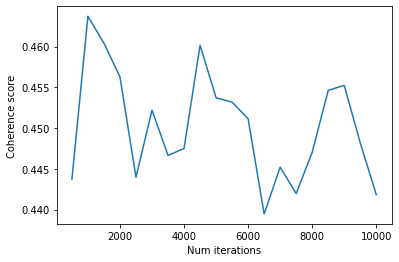

In [4]:
# Show graph
limit=10500; start=500; step=500;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num iterations")
plt.ylabel("Coherence score")
#plt.savefig('20240221_PhD_MalletLDALtr-Coherence')

In [5]:
# Print the coherence and perplexity scores
for m, cv in zip(x, coherence_values):
    print("Num iterations =", m, 'Coherence: ', round(cv, 4))

Num iterations = 500 Coherence:  0.4437
Num iterations = 1000 Coherence:  0.4637
Num iterations = 1500 Coherence:  0.4604
Num iterations = 2000 Coherence:  0.4563
Num iterations = 2500 Coherence:  0.444
Num iterations = 3000 Coherence:  0.4522
Num iterations = 3500 Coherence:  0.4466
Num iterations = 4000 Coherence:  0.4475
Num iterations = 4500 Coherence:  0.4602
Num iterations = 5000 Coherence:  0.4537
Num iterations = 5500 Coherence:  0.4532
Num iterations = 6000 Coherence:  0.4511
Num iterations = 6500 Coherence:  0.4395
Num iterations = 7000 Coherence:  0.4452
Num iterations = 7500 Coherence:  0.442
Num iterations = 8000 Coherence:  0.447
Num iterations = 8500 Coherence:  0.4546
Num iterations = 9000 Coherence:  0.4552
Num iterations = 9500 Coherence:  0.4482
Num iterations = 10000 Coherence:  0.4418


In [6]:
# Coherence for 1000-iteration, 8-topic model
print(coherence_values[1])

# Topics for 5000-iteration model
malletModel_08 = model_list[1]
model_topics_08 = malletModel_08.show_topics(formatted=False)
pprint(sorted(malletModel_08.print_topics(num_words=20)))

# Convert results to lda model format for visualization.
MalletLDA08 = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(malletModel_08)

# Visualize the topics
pyLDAvis.enable_notebook()
vis08 = pyLDAvis.gensim.prepare(MalletLDA08, corpus, id2word, sort_topics=False)
vis08

0.4637315235411022
[(0,
  '0.107*"letter" + 0.075*"time" + 0.026*"day" + 0.026*"month" + '
  '0.025*"friend" + 0.018*"pleasure" + 0.017*"news" + 0.015*"sister" + '
  '0.015*"home" + 0.014*"health" + 0.013*"return" + 0.013*"opportunity" + '
  '0.013*"happiness" + 0.012*"kind" + 0.012*"writing" + 0.011*"manner" + '
  '0.011*"trust" + 0.011*"father" + 0.011*"care" + 0.011*"weather"'),
 (1,
  '0.032*"dollar" + 0.030*"year" + 0.028*"man" + 0.027*"work" + 0.024*"people" '
  '+ 0.022*"money" + 0.019*"business" + 0.018*"country" + 0.015*"cent" + '
  '0.012*"company" + 0.011*"expense" + 0.011*"board" + 0.011*"pay" + '
  '0.010*"month" + 0.009*"government" + 0.009*"wage" + 0.009*"lot" + '
  '0.009*"number" + 0.008*"office" + 0.008*"state"'),
 (2,
  '0.052*"brother" + 0.051*"mother" + 0.051*"friend" + 0.048*"family" + '
  '0.041*"letter" + 0.032*"year" + 0.032*"sister" + 0.030*"health" + '
  '0.027*"child" + 0.026*"son" + 0.025*"death" + 0.025*"wife" + '
  '0.023*"daughter" + 0.018*"uncle" + 0.01

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.277588 -0.043278       1        1  12.553836
1      0.191726 -0.224310       2        1  12.648422
2     -0.299279 -0.063645       3        1  11.925496
3     -0.022796 -0.012987       4        1  13.204409
4      0.006097 -0.039025       5        1  11.643321
5      0.203484 -0.159199       6        1  13.857467
6      0.151334  0.179986       7        1  13.102559
7      0.047022  0.362457       8        1  11.064490, topic_info=        Term         Freq        Total Category  logprob  loglift
11    letter  1151.000000  1151.000000  Default  30.0000  30.0000
57      time  1176.000000  1176.000000  Default  29.0000  29.0000
78      week   584.000000   584.000000  Default  28.0000  28.0000
8        day  1080.000000  1080.000000  Default  27.0000  27.0000
84    friend   577.000000   577.000000  Default  26.0000  26.0000
...      ...          ...          ...      ...      ...      ...
5     church    64.641928   145.690311   Topic8  -4.6786   1.3888
1047  window    42.763121    56.271185   Topic8  -5.0918   1.9269
177     room    63.647437   185.190486   Topic8  -4.6941   1.1334
8        day    70.608875  1080.378928   Topic8  -4.5903  -0.5265
947     call    42.763121    88.701376   Topic8  -5.0918   1.4718

[598 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
1550      7  1.006133   accident
28        1  0.280295    account
28        2  0.207626    account
28        3  0.513874    account
677       2  0.952175       acct
...     ...       ...        ...
61        3  0.328790       year
61        4  0.025814       year
61        6  0.320638       year
62        7  0.376138  yesterday
62        8  0.629623  yesterday

[693 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8])

In [11]:
MalletLDA08.save('20240610_PhD_MalletLDA08')
pyLDAvis.save_html(vis08, '20240610_PhD_TopicLtrMAL08.html')